In [4]:
import os
import shutil
import random
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetV2B0
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Cell 1: Copying and Organizing Images
source_dirs = {
    "Demented": [
        "D:\\Alzheimer_Feb_Fri28\\Mild_Demented",
        "D:\\Alzheimer_Feb_Fri28\\Moderate_Demented",
        "D:\\Alzheimer_Feb_Fri28\\Very_Mild_Demented"
    ],
    "Non-Demented": ["D:\\Alzheimer_Feb_Fri28\\Non_Demented"]
}

new_base_dir = "D:\\Classification_Alzheimer_efficientnetb20_new"
train_dir = os.path.join(new_base_dir, "train")
test_dir = os.path.join(new_base_dir, "test")
train_demented_dir = os.path.join(train_dir, "Demented")
train_nondemented_dir = os.path.join(train_dir, "Non-Demented")
test_demented_dir = os.path.join(test_dir, "Demented")
test_nondemented_dir = os.path.join(test_dir, "Non-Demented")

for dir_path in [train_demented_dir, train_nondemented_dir, test_demented_dir, test_nondemented_dir]:
    os.makedirs(dir_path, exist_ok=True)

def shuffle_and_split_data(source_dirs, train_dir, test_dir, split_ratio=0.8):
    all_images = []
    valid_extensions = (".jpg", ".png", ".jpeg")
    
    for source_dir in source_dirs:
        for sub_dir in (source_dir if isinstance(source_dir, list) else [source_dir]):
            for img_file in os.listdir(sub_dir):
                if img_file.lower().endswith(valid_extensions):
                    all_images.append(os.path.join(sub_dir, img_file))
    
    random.shuffle(all_images)
    split_point = int(len(all_images) * split_ratio)
    train_images, test_images = all_images[:split_point], all_images[split_point:]
    
    for img_path in tqdm(train_images, desc=f'Copying to {train_dir}'):
        shutil.copy(img_path, train_dir)
    for img_path in tqdm(test_images, desc=f'Copying to {test_dir}'):
        shutil.copy(img_path, test_dir)
    
    return train_images, test_images

shuffle_and_split_data(source_dirs["Demented"], train_demented_dir, test_demented_dir)
shuffle_and_split_data(source_dirs["Non-Demented"], train_nondemented_dir, test_nondemented_dir)
print("Dataset organized and split successfully!")


Copying to D:\Classification_Alzheimer_efficientnetb20_new\train\Demented: 100%|██| 2560/2560 [00:14<00:00, 178.53it/s]
Copying to D:\Classification_Alzheimer_efficientnetb20_new\test\Demented: 100%|█████| 640/640 [00:03<00:00, 198.14it/s]
Copying to D:\Classification_Alzheimer_efficientnetb20_new\train\Non-Demented: 100%|█| 2560/2560 [00:13<00:00, 183.31it
Copying to D:\Classification_Alzheimer_efficientnetb20_new\test\Non-Demented: 100%|█| 640/640 [00:03<00:00, 187.50it/s]

Dataset organized and split successfully!


In [2]:
efficientnet_model = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
feature_extractor = Model(inputs=efficientnet_model.input, outputs=efficientnet_model.get_layer("top_conv").output)

valid_extensions = (".jpg", ".png", ".jpeg")

def extract_features(img_paths):
    features = []
    for img_path in tqdm(img_paths, desc='Extracting features'):
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        img = np.expand_dims(img, axis=0)
        img = img / 255.0
        feature = feature_extractor.predict(img)
        features.append(feature.flatten())
    return np.array(features)

train_demented_paths = [os.path.join(train_demented_dir, f) for f in os.listdir(train_demented_dir) if f.lower().endswith(valid_extensions)]
train_nondemented_paths = [os.path.join(train_nondemented_dir, f) for f in os.listdir(train_nondemented_dir) if f.lower().endswith(valid_extensions)]
test_demented_paths = [os.path.join(test_demented_dir, f) for f in os.listdir(test_demented_dir) if f.lower().endswith(valid_extensions)]
test_nondemented_paths = [os.path.join(test_nondemented_dir, f) for f in os.listdir(test_nondemented_dir) if f.lower().endswith(valid_extensions)]

train_demented_features = extract_features(train_demented_paths)
train_nondemented_features = extract_features(train_nondemented_paths)
test_demented_features = extract_features(test_demented_paths)
test_nondemented_features = extract_features(test_nondemented_paths)

train_features = np.vstack((train_demented_features, train_nondemented_features))
train_labels = np.hstack((np.ones(train_demented_features.shape[0]), np.zeros(train_nondemented_features.shape[0])))
test_features = np.vstack((test_demented_features, test_nondemented_features))
test_labels = np.hstack((np.ones(test_demented_features.shape[0]), np.zeros(test_nondemented_features.shape[0])))

print("Features extracted successfully!")


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


Extracting features:   0%|                                                          | 1/2560 [00:04<2:54:11,  4.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:   0%|                                                          | 2/2560 [00:04<1:16:06,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:   0%|                                                            | 3/2560 [00:04<44:34,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:   0%|                                                            | 4/2560 [00:04<29:45,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:   0%|                                                            | 5/2560 [00:04<21:34,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   0%|▏                                                           | 6/2560 [00:04<16:41,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:   0%|▏                                                           | 7/2560 [00:05<13:47,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   0%|▏                                                           | 8/2560 [00:05<11:35,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:   0%|▏                                                           | 9/2560 [00:05<10:11,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:   0%|▏                                                          | 10/2560 [00:05<09:16,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   0%|▎                                                          | 11/2560 [00:05<08:46,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:   0%|▎                                                          | 12/2560 [00:05<08:29,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:   1%|▎                                                          | 13/2560 [00:06<08:00,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   1%|▎                                                          | 14/2560 [00:06<07:58,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:   1%|▎                                                          | 15/2560 [00:06<07:52,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   1%|▎                                                          | 16/2560 [00:06<07:52,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   1%|▍                                                          | 17/2560 [00:06<08:28,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   1%|▍                                                          | 18/2560 [00:07<08:55,  4.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   1%|▍                                                          | 19/2560 [00:07<09:12,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:   1%|▍                                                          | 20/2560 [00:07<09:11,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   1%|▍                                                          | 21/2560 [00:07<08:41,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


Extracting features:   1%|▌                                                          | 22/2560 [00:08<09:18,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:   1%|▌                                                          | 23/2560 [00:08<10:30,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:   1%|▌                                                          | 24/2560 [00:08<10:20,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:   1%|▌                                                          | 25/2560 [00:08<09:29,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   1%|▌                                                          | 26/2560 [00:08<08:59,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:   1%|▌                                                          | 27/2560 [00:09<08:08,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   1%|▋                                                          | 28/2560 [00:09<07:36,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:   1%|▋                                                          | 29/2560 [00:09<09:22,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:   1%|▋                                                          | 30/2560 [00:09<09:30,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:   1%|▋                                                          | 31/2560 [00:09<08:54,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   1%|▋                                                          | 32/2560 [00:10<08:08,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   1%|▊                                                          | 33/2560 [00:10<07:35,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   1%|▊                                                          | 34/2560 [00:10<07:25,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   1%|▊                                                          | 35/2560 [00:10<07:04,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   1%|▊                                                          | 36/2560 [00:10<06:49,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   1%|▊                                                          | 37/2560 [00:10<06:40,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   1%|▉                                                          | 38/2560 [00:11<06:34,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   2%|▉                                                          | 39/2560 [00:11<06:29,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:   2%|▉                                                          | 40/2560 [00:11<06:25,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   2%|▉                                                          | 41/2560 [00:11<06:22,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   2%|▉                                                          | 42/2560 [00:11<06:34,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   2%|▉                                                          | 43/2560 [00:11<06:27,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   2%|█                                                          | 44/2560 [00:11<06:24,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   2%|█                                                          | 45/2560 [00:12<06:22,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   2%|█                                                          | 46/2560 [00:12<06:21,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   2%|█                                                          | 47/2560 [00:12<06:06,  6.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   2%|█                                                          | 48/2560 [00:12<06:21,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   2%|█▏                                                         | 49/2560 [00:12<06:27,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   2%|█▏                                                         | 50/2560 [00:12<06:17,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   2%|█▏                                                         | 51/2560 [00:13<06:16,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   2%|█▏                                                         | 52/2560 [00:13<06:27,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:   2%|█▏                                                         | 53/2560 [00:13<06:37,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   2%|█▏                                                         | 54/2560 [00:13<06:29,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   2%|█▎                                                         | 55/2560 [00:13<06:25,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   2%|█▎                                                         | 56/2560 [00:13<06:23,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:   2%|█▎                                                         | 57/2560 [00:13<06:20,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   2%|█▎                                                         | 58/2560 [00:14<06:18,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   2%|█▎                                                         | 59/2560 [00:14<06:16,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   2%|█▍                                                         | 60/2560 [00:14<06:16,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:   2%|█▍                                                         | 61/2560 [00:14<06:28,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   2%|█▍                                                         | 62/2560 [00:14<06:24,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   2%|█▍                                                         | 63/2560 [00:14<06:33,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   2%|█▍                                                         | 64/2560 [00:15<06:46,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   3%|█▍                                                         | 65/2560 [00:15<06:29,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:   3%|█▌                                                         | 66/2560 [00:15<06:34,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   3%|█▌                                                         | 67/2560 [00:15<06:19,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   3%|█▌                                                         | 68/2560 [00:15<06:23,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   3%|█▌                                                         | 69/2560 [00:15<06:13,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   3%|█▌                                                         | 70/2560 [00:15<06:13,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   3%|█▋                                                         | 71/2560 [00:16<06:25,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   3%|█▋                                                         | 72/2560 [00:16<06:21,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:   3%|█▋                                                         | 73/2560 [00:16<06:29,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   3%|█▋                                                         | 74/2560 [00:16<06:14,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   3%|█▋                                                         | 75/2560 [00:16<06:24,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   3%|█▊                                                         | 76/2560 [00:16<06:22,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   3%|█▊                                                         | 77/2560 [00:17<06:18,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   3%|█▊                                                         | 78/2560 [00:17<06:16,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   3%|█▊                                                         | 79/2560 [00:17<06:33,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   3%|█▊                                                         | 80/2560 [00:17<06:32,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   3%|█▊                                                         | 81/2560 [00:17<06:26,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   3%|█▉                                                         | 82/2560 [00:17<06:22,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   3%|█▉                                                         | 83/2560 [00:17<06:31,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   3%|█▉                                                         | 84/2560 [00:18<06:37,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   3%|█▉                                                         | 85/2560 [00:18<06:40,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   3%|█▉                                                         | 86/2560 [00:18<07:09,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   3%|██                                                         | 87/2560 [00:18<07:03,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   3%|██                                                         | 88/2560 [00:18<06:47,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   3%|██                                                         | 89/2560 [00:18<06:48,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   4%|██                                                         | 90/2560 [00:19<06:36,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   4%|██                                                         | 91/2560 [00:19<06:29,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   4%|██                                                         | 92/2560 [00:19<06:22,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   4%|██▏                                                        | 93/2560 [00:19<06:24,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   4%|██▏                                                        | 94/2560 [00:19<06:14,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   4%|██▏                                                        | 95/2560 [00:19<06:25,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   4%|██▏                                                        | 96/2560 [00:20<06:08,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   4%|██▏                                                        | 97/2560 [00:20<06:19,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   4%|██▎                                                        | 98/2560 [00:20<06:29,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:   4%|██▎                                                        | 99/2560 [00:20<06:23,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   4%|██▎                                                       | 100/2560 [00:20<06:18,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   4%|██▎                                                       | 101/2560 [00:20<06:26,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   4%|██▎                                                       | 102/2560 [00:21<06:34,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:   4%|██▎                                                       | 103/2560 [00:21<06:26,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:   4%|██▎                                                       | 104/2560 [00:21<06:08,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   4%|██▍                                                       | 105/2560 [00:21<06:07,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   4%|██▍                                                       | 106/2560 [00:21<06:20,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:   4%|██▍                                                       | 107/2560 [00:21<06:15,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   4%|██▍                                                       | 108/2560 [00:21<06:13,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   4%|██▍                                                       | 109/2560 [00:22<06:11,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   4%|██▍                                                       | 110/2560 [00:22<06:10,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:   4%|██▌                                                       | 111/2560 [00:22<06:09,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   4%|██▌                                                       | 112/2560 [00:22<06:19,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   4%|██▌                                                       | 113/2560 [00:22<06:17,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   4%|██▌                                                       | 114/2560 [00:22<06:26,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   4%|██▌                                                       | 115/2560 [00:22<06:20,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|██▋                                                       | 116/2560 [00:23<06:14,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   5%|██▋                                                       | 117/2560 [00:23<06:22,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   5%|██▋                                                       | 118/2560 [00:23<06:24,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|██▋                                                       | 119/2560 [00:23<06:13,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|██▋                                                       | 120/2560 [00:23<06:10,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   5%|██▋                                                       | 121/2560 [00:23<06:20,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   5%|██▊                                                       | 122/2560 [00:24<06:28,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|██▊                                                       | 123/2560 [00:24<06:09,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   5%|██▊                                                       | 124/2560 [00:24<06:19,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   5%|██▊                                                       | 125/2560 [00:24<06:27,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   5%|██▊                                                       | 126/2560 [00:24<06:32,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|██▉                                                       | 127/2560 [00:24<06:12,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:   5%|██▉                                                       | 128/2560 [00:25<06:21,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   5%|██▉                                                       | 129/2560 [00:25<06:16,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   5%|██▉                                                       | 130/2560 [00:25<06:25,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   5%|██▉                                                       | 131/2560 [00:25<06:28,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   5%|██▉                                                       | 132/2560 [00:25<06:12,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   5%|███                                                       | 133/2560 [00:25<06:20,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   5%|███                                                       | 134/2560 [00:25<06:16,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|███                                                       | 135/2560 [00:26<05:59,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|███                                                       | 136/2560 [00:26<06:00,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   5%|███                                                       | 137/2560 [00:26<06:01,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   5%|███▏                                                      | 138/2560 [00:26<06:00,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   5%|███▏                                                      | 139/2560 [00:26<06:14,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   5%|███▏                                                      | 140/2560 [00:26<06:10,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:   6%|███▏                                                      | 141/2560 [00:27<06:17,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:   6%|███▏                                                      | 142/2560 [00:27<06:14,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   6%|███▏                                                      | 143/2560 [00:27<06:23,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▎                                                      | 144/2560 [00:27<06:16,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:   6%|███▎                                                      | 145/2560 [00:27<06:15,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:   6%|███▎                                                      | 146/2560 [00:27<06:19,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   6%|███▎                                                      | 147/2560 [00:27<06:26,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   6%|███▎                                                      | 148/2560 [00:28<06:18,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   6%|███▍                                                      | 149/2560 [00:28<06:13,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▍                                                      | 150/2560 [00:28<05:58,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:   6%|███▍                                                      | 151/2560 [00:28<06:40,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   6%|███▍                                                      | 152/2560 [00:28<06:47,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▍                                                      | 153/2560 [00:28<06:20,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   6%|███▍                                                      | 154/2560 [00:29<06:26,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:   6%|███▌                                                      | 155/2560 [00:29<06:31,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▌                                                      | 156/2560 [00:29<06:09,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   6%|███▌                                                      | 157/2560 [00:29<06:18,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   6%|███▌                                                      | 158/2560 [00:29<06:12,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▌                                                      | 159/2560 [00:29<06:08,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   6%|███▋                                                      | 160/2560 [00:30<06:06,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:   6%|███▋                                                      | 161/2560 [00:30<06:03,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▋                                                      | 162/2560 [00:30<06:14,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▋                                                      | 163/2560 [00:30<06:09,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   6%|███▋                                                      | 164/2560 [00:30<06:07,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:   6%|███▋                                                      | 165/2560 [00:30<06:03,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   6%|███▊                                                      | 166/2560 [00:30<05:51,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   7%|███▊                                                      | 167/2560 [00:31<06:04,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   7%|███▊                                                      | 168/2560 [00:31<06:15,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   7%|███▊                                                      | 169/2560 [00:31<06:09,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   7%|███▊                                                      | 170/2560 [00:31<06:05,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   7%|███▊                                                      | 171/2560 [00:31<06:04,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   7%|███▉                                                      | 172/2560 [00:31<06:06,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   7%|███▉                                                      | 173/2560 [00:32<06:11,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   7%|███▉                                                      | 174/2560 [00:32<06:18,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   7%|███▉                                                      | 175/2560 [00:32<06:23,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   7%|███▉                                                      | 176/2560 [00:32<06:28,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   7%|████                                                      | 177/2560 [00:32<06:18,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   7%|████                                                      | 178/2560 [00:32<06:11,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   7%|████                                                      | 179/2560 [00:32<06:07,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   7%|████                                                      | 180/2560 [00:33<06:16,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   7%|████                                                      | 181/2560 [00:33<06:09,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   7%|████                                                      | 182/2560 [00:33<06:17,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   7%|████▏                                                     | 183/2560 [00:33<06:26,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   7%|████▏                                                     | 184/2560 [00:33<06:13,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   7%|████▏                                                     | 185/2560 [00:33<06:23,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   7%|████▏                                                     | 186/2560 [00:34<06:23,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   7%|████▏                                                     | 187/2560 [00:34<06:03,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   7%|████▎                                                     | 188/2560 [00:34<06:00,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:   7%|████▎                                                     | 189/2560 [00:34<05:59,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   7%|████▎                                                     | 190/2560 [00:34<05:57,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   7%|████▎                                                     | 191/2560 [00:34<06:09,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   8%|████▎                                                     | 192/2560 [00:34<06:11,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   8%|████▎                                                     | 193/2560 [00:35<06:11,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   8%|████▍                                                     | 194/2560 [00:35<06:18,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   8%|████▍                                                     | 195/2560 [00:35<06:11,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   8%|████▍                                                     | 196/2560 [00:35<06:18,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   8%|████▍                                                     | 197/2560 [00:35<05:58,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   8%|████▍                                                     | 198/2560 [00:35<05:56,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   8%|████▌                                                     | 199/2560 [00:36<06:07,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   8%|████▌                                                     | 200/2560 [00:36<06:03,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   8%|████▌                                                     | 201/2560 [00:36<06:00,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   8%|████▌                                                     | 202/2560 [00:36<06:18,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   8%|████▌                                                     | 203/2560 [00:36<06:25,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   8%|████▌                                                     | 204/2560 [00:36<06:15,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   8%|████▋                                                     | 205/2560 [00:37<06:20,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   8%|████▋                                                     | 206/2560 [00:37<06:35,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   8%|████▋                                                     | 207/2560 [00:37<06:23,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   8%|████▋                                                     | 208/2560 [00:37<06:24,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   8%|████▋                                                     | 209/2560 [00:37<06:15,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   8%|████▊                                                     | 210/2560 [00:37<06:20,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   8%|████▊                                                     | 211/2560 [00:37<05:59,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   8%|████▊                                                     | 212/2560 [00:38<06:12,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   8%|████▊                                                     | 213/2560 [00:38<06:02,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:   8%|████▊                                                     | 214/2560 [00:38<06:07,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   8%|████▊                                                     | 215/2560 [00:38<06:05,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:   8%|████▉                                                     | 216/2560 [00:38<06:35,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   8%|████▉                                                     | 217/2560 [00:38<06:35,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:   9%|████▉                                                     | 218/2560 [00:39<06:21,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   9%|████▉                                                     | 219/2560 [00:39<06:11,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   9%|████▉                                                     | 220/2560 [00:39<06:05,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   9%|█████                                                     | 221/2560 [00:39<06:01,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:   9%|█████                                                     | 222/2560 [00:39<06:09,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   9%|█████                                                     | 223/2560 [00:39<06:14,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   9%|█████                                                     | 224/2560 [00:40<06:07,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   9%|█████                                                     | 225/2560 [00:40<06:14,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:   9%|█████                                                     | 226/2560 [00:40<06:06,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   9%|█████▏                                                    | 227/2560 [00:40<06:00,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   9%|█████▏                                                    | 228/2560 [00:40<06:09,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   9%|█████▏                                                    | 229/2560 [00:40<06:05,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   9%|█████▏                                                    | 230/2560 [00:41<05:57,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   9%|█████▏                                                    | 231/2560 [00:41<05:55,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   9%|█████▎                                                    | 232/2560 [00:41<05:59,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   9%|█████▎                                                    | 233/2560 [00:41<05:54,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   9%|█████▎                                                    | 234/2560 [00:41<05:37,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:   9%|█████▎                                                    | 235/2560 [00:41<05:49,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   9%|█████▎                                                    | 236/2560 [00:41<05:50,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:   9%|█████▎                                                    | 237/2560 [00:42<06:00,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   9%|█████▍                                                    | 238/2560 [00:42<05:45,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   9%|█████▍                                                    | 239/2560 [00:42<06:02,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:   9%|█████▍                                                    | 240/2560 [00:42<05:54,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   9%|█████▍                                                    | 241/2560 [00:42<06:04,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:   9%|█████▍                                                    | 242/2560 [00:42<06:09,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   9%|█████▌                                                    | 243/2560 [00:43<06:14,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  10%|█████▌                                                    | 244/2560 [00:43<06:05,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  10%|█████▌                                                    | 245/2560 [00:43<06:00,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  10%|█████▌                                                    | 246/2560 [00:43<05:56,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|█████▌                                                    | 247/2560 [00:43<05:42,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  10%|█████▌                                                    | 248/2560 [00:43<05:45,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  10%|█████▋                                                    | 249/2560 [00:43<05:42,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  10%|█████▋                                                    | 250/2560 [00:44<05:43,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  10%|█████▋                                                    | 251/2560 [00:44<05:44,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|█████▋                                                    | 252/2560 [00:44<05:44,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  10%|█████▋                                                    | 253/2560 [00:44<05:53,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  10%|█████▊                                                    | 254/2560 [00:44<05:43,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  10%|█████▊                                                    | 255/2560 [00:44<05:42,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  10%|█████▊                                                    | 256/2560 [00:44<05:44,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  10%|█████▊                                                    | 257/2560 [00:45<05:32,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  10%|█████▊                                                    | 258/2560 [00:45<05:47,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|█████▊                                                    | 259/2560 [00:45<05:46,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  10%|█████▉                                                    | 260/2560 [00:45<05:55,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|█████▉                                                    | 261/2560 [00:45<05:42,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|█████▉                                                    | 262/2560 [00:45<05:53,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|█████▉                                                    | 263/2560 [00:46<05:51,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  10%|█████▉                                                    | 264/2560 [00:46<06:01,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  10%|██████                                                    | 265/2560 [00:46<05:54,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  10%|██████                                                    | 266/2560 [00:46<05:51,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  10%|██████                                                    | 267/2560 [00:46<05:54,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  10%|██████                                                    | 268/2560 [00:46<05:46,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  11%|██████                                                    | 269/2560 [00:46<05:44,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  11%|██████                                                    | 270/2560 [00:47<05:56,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  11%|██████▏                                                   | 271/2560 [00:47<05:51,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  11%|██████▏                                                   | 272/2560 [00:47<05:49,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  11%|██████▏                                                   | 273/2560 [00:47<05:58,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▏                                                   | 274/2560 [00:47<05:53,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  11%|██████▏                                                   | 275/2560 [00:47<06:00,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  11%|██████▎                                                   | 276/2560 [00:48<06:05,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  11%|██████▎                                                   | 277/2560 [00:48<06:03,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  11%|██████▎                                                   | 278/2560 [00:48<05:53,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  11%|██████▎                                                   | 279/2560 [00:48<06:00,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  11%|██████▎                                                   | 280/2560 [00:48<06:06,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  11%|██████▎                                                   | 281/2560 [00:48<05:48,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  11%|██████▍                                                   | 282/2560 [00:49<06:08,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▍                                                   | 283/2560 [00:49<06:22,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


Extracting features:  11%|██████▍                                                   | 284/2560 [00:49<06:09,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▍                                                   | 285/2560 [00:49<06:01,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  11%|██████▍                                                   | 286/2560 [00:49<05:55,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  11%|██████▌                                                   | 287/2560 [00:49<05:50,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  11%|██████▌                                                   | 288/2560 [00:49<05:59,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▌                                                   | 289/2560 [00:50<05:53,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  11%|██████▌                                                   | 290/2560 [00:50<06:00,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  11%|██████▌                                                   | 291/2560 [00:50<05:54,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  11%|██████▌                                                   | 292/2560 [00:50<05:49,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▋                                                   | 293/2560 [00:50<05:57,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  11%|██████▋                                                   | 294/2560 [00:50<05:58,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  12%|██████▋                                                   | 295/2560 [00:51<05:55,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  12%|██████▋                                                   | 296/2560 [00:51<05:52,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  12%|██████▋                                                   | 297/2560 [00:51<05:47,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  12%|██████▊                                                   | 298/2560 [00:51<05:45,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  12%|██████▊                                                   | 299/2560 [00:51<05:55,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  12%|██████▊                                                   | 300/2560 [00:51<05:49,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  12%|██████▊                                                   | 301/2560 [00:51<05:57,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  12%|██████▊                                                   | 302/2560 [00:52<06:02,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  12%|██████▊                                                   | 303/2560 [00:52<06:06,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  12%|██████▉                                                   | 304/2560 [00:52<06:06,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  12%|██████▉                                                   | 305/2560 [00:52<05:49,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  12%|██████▉                                                   | 306/2560 [00:52<05:57,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  12%|██████▉                                                   | 307/2560 [00:52<05:51,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  12%|██████▉                                                   | 308/2560 [00:53<05:57,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  12%|███████                                                   | 309/2560 [00:53<06:03,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  12%|███████                                                   | 310/2560 [00:53<05:55,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  12%|███████                                                   | 311/2560 [00:53<05:48,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  12%|███████                                                   | 312/2560 [00:53<05:45,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  12%|███████                                                   | 313/2560 [00:53<05:53,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  12%|███████                                                   | 314/2560 [00:54<05:49,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  12%|███████▏                                                  | 315/2560 [00:54<05:55,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  12%|███████▏                                                  | 316/2560 [00:54<05:49,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  12%|███████▏                                                  | 317/2560 [00:54<05:45,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  12%|███████▏                                                  | 318/2560 [00:54<05:49,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  12%|███████▏                                                  | 319/2560 [00:54<05:50,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  12%|███████▎                                                  | 320/2560 [00:54<05:45,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  13%|███████▎                                                  | 321/2560 [00:55<05:54,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  13%|███████▎                                                  | 322/2560 [00:55<05:47,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  13%|███████▎                                                  | 323/2560 [00:55<05:54,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  13%|███████▎                                                  | 324/2560 [00:55<05:49,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  13%|███████▎                                                  | 325/2560 [00:55<05:44,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  13%|███████▍                                                  | 326/2560 [00:55<05:53,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  13%|███████▍                                                  | 327/2560 [00:56<06:57,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  13%|███████▍                                                  | 328/2560 [00:56<06:40,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▍                                                  | 329/2560 [00:56<06:31,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▍                                                  | 330/2560 [00:56<06:03,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  13%|███████▍                                                  | 331/2560 [00:56<05:54,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  13%|███████▌                                                  | 332/2560 [00:56<05:58,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  13%|███████▌                                                  | 333/2560 [00:57<05:51,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  13%|███████▌                                                  | 334/2560 [00:57<05:57,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  13%|███████▌                                                  | 335/2560 [00:57<05:49,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▌                                                  | 336/2560 [00:57<05:44,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▋                                                  | 337/2560 [00:57<05:41,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  13%|███████▋                                                  | 338/2560 [00:57<05:38,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▋                                                  | 339/2560 [00:58<05:47,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▋                                                  | 340/2560 [00:58<05:32,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  13%|███████▋                                                  | 341/2560 [00:58<05:42,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▋                                                  | 342/2560 [00:58<05:39,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  13%|███████▊                                                  | 343/2560 [00:58<05:37,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  13%|███████▊                                                  | 344/2560 [00:58<05:47,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  13%|███████▊                                                  | 345/2560 [00:58<05:42,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  14%|███████▊                                                  | 346/2560 [00:59<05:38,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  14%|███████▊                                                  | 347/2560 [00:59<06:21,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  14%|███████▉                                                  | 348/2560 [00:59<06:13,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  14%|███████▉                                                  | 349/2560 [00:59<05:53,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|███████▉                                                  | 350/2560 [00:59<05:45,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  14%|███████▉                                                  | 351/2560 [00:59<05:41,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  14%|███████▉                                                  | 352/2560 [01:00<05:46,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|███████▉                                                  | 353/2560 [01:00<05:33,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  14%|████████                                                  | 354/2560 [01:00<05:44,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  14%|████████                                                  | 355/2560 [01:00<06:12,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  14%|████████                                                  | 356/2560 [01:00<07:04,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████                                                  | 357/2560 [01:00<06:37,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  14%|████████                                                  | 358/2560 [01:01<06:16,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▏                                                 | 359/2560 [01:01<06:13,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▏                                                 | 360/2560 [01:01<06:00,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▏                                                 | 361/2560 [01:01<05:55,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▏                                                 | 362/2560 [01:01<05:42,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  14%|████████▏                                                 | 363/2560 [01:01<05:39,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  14%|████████▏                                                 | 364/2560 [01:02<05:38,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  14%|████████▎                                                 | 365/2560 [01:02<05:54,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▎                                                 | 366/2560 [01:02<05:57,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  14%|████████▎                                                 | 367/2560 [01:02<06:00,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  14%|████████▎                                                 | 368/2560 [01:02<05:50,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▎                                                 | 369/2560 [01:02<05:54,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  14%|████████▍                                                 | 370/2560 [01:03<05:47,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  14%|████████▍                                                 | 371/2560 [01:03<06:03,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  15%|████████▍                                                 | 372/2560 [01:03<06:03,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  15%|████████▍                                                 | 373/2560 [01:03<05:52,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  15%|████████▍                                                 | 374/2560 [01:03<05:56,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  15%|████████▍                                                 | 375/2560 [01:03<05:47,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  15%|████████▌                                                 | 376/2560 [01:04<05:51,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  15%|████████▌                                                 | 377/2560 [01:04<05:44,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  15%|████████▌                                                 | 378/2560 [01:04<05:39,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  15%|████████▌                                                 | 379/2560 [01:04<05:45,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  15%|████████▌                                                 | 380/2560 [01:04<05:51,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  15%|████████▋                                                 | 381/2560 [01:04<05:43,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  15%|████████▋                                                 | 382/2560 [01:04<05:49,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  15%|████████▋                                                 | 383/2560 [01:05<05:46,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  15%|████████▋                                                 | 384/2560 [01:05<05:46,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  15%|████████▋                                                 | 385/2560 [01:05<05:40,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  15%|████████▋                                                 | 386/2560 [01:05<05:35,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  15%|████████▊                                                 | 387/2560 [01:05<05:36,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  15%|████████▊                                                 | 388/2560 [01:05<05:29,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  15%|████████▊                                                 | 389/2560 [01:06<05:27,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  15%|████████▊                                                 | 390/2560 [01:06<05:27,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  15%|████████▊                                                 | 391/2560 [01:06<05:37,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  15%|████████▉                                                 | 392/2560 [01:06<05:22,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  15%|████████▉                                                 | 393/2560 [01:06<05:34,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  15%|████████▉                                                 | 394/2560 [01:06<05:31,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  15%|████████▉                                                 | 395/2560 [01:06<05:17,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  15%|████████▉                                                 | 396/2560 [01:07<05:30,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  16%|████████▉                                                 | 397/2560 [01:07<05:33,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  16%|█████████                                                 | 398/2560 [01:07<05:35,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  16%|█████████                                                 | 399/2560 [01:07<05:33,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  16%|█████████                                                 | 400/2560 [01:07<05:19,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  16%|█████████                                                 | 401/2560 [01:07<05:34,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  16%|█████████                                                 | 402/2560 [01:07<05:26,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  16%|█████████▏                                                | 403/2560 [01:08<05:33,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▏                                                | 404/2560 [01:08<05:23,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  16%|█████████▏                                                | 405/2560 [01:08<05:29,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▏                                                | 406/2560 [01:08<05:20,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  16%|█████████▏                                                | 407/2560 [01:08<05:31,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  16%|█████████▏                                                | 408/2560 [01:08<05:29,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▎                                                | 409/2560 [01:09<05:27,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▎                                                | 410/2560 [01:09<05:25,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  16%|█████████▎                                                | 411/2560 [01:09<05:34,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  16%|█████████▎                                                | 412/2560 [01:09<05:52,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  16%|█████████▎                                                | 413/2560 [01:09<05:43,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▍                                                | 414/2560 [01:09<05:36,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  16%|█████████▍                                                | 415/2560 [01:10<05:31,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  16%|█████████▍                                                | 416/2560 [01:10<05:36,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  16%|█████████▍                                                | 417/2560 [01:10<05:23,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  16%|█████████▍                                                | 418/2560 [01:10<05:31,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▍                                                | 419/2560 [01:10<05:19,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  16%|█████████▌                                                | 420/2560 [01:10<05:19,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  16%|█████████▌                                                | 421/2560 [01:10<05:30,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  16%|█████████▌                                                | 422/2560 [01:11<05:27,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  17%|█████████▌                                                | 423/2560 [01:11<05:25,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|█████████▌                                                | 424/2560 [01:11<05:23,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  17%|█████████▋                                                | 425/2560 [01:11<05:33,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  17%|█████████▋                                                | 426/2560 [01:11<05:19,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  17%|█████████▋                                                | 427/2560 [01:11<05:28,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|█████████▋                                                | 428/2560 [01:11<05:25,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  17%|█████████▋                                                | 429/2560 [01:12<05:24,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  17%|█████████▋                                                | 430/2560 [01:12<05:22,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|█████████▊                                                | 431/2560 [01:12<05:32,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  17%|█████████▊                                                | 432/2560 [01:12<05:27,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  17%|█████████▊                                                | 433/2560 [01:12<05:24,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|█████████▊                                                | 434/2560 [01:12<05:12,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  17%|█████████▊                                                | 435/2560 [01:13<05:13,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  17%|█████████▉                                                | 436/2560 [01:13<05:15,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  17%|█████████▉                                                | 437/2560 [01:13<05:15,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  17%|█████████▉                                                | 438/2560 [01:13<05:16,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  17%|█████████▉                                                | 439/2560 [01:13<05:20,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  17%|█████████▉                                                | 440/2560 [01:13<05:16,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  17%|█████████▉                                                | 441/2560 [01:13<05:15,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|██████████                                                | 442/2560 [01:14<05:16,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  17%|██████████                                                | 443/2560 [01:14<05:15,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|██████████                                                | 444/2560 [01:14<05:06,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  17%|██████████                                                | 445/2560 [01:14<05:29,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  17%|██████████                                                | 446/2560 [01:14<05:38,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  17%|██████████▏                                               | 447/2560 [01:14<05:30,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  18%|██████████▏                                               | 448/2560 [01:15<05:26,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▏                                               | 449/2560 [01:15<05:23,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  18%|██████████▏                                               | 450/2560 [01:15<05:21,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  18%|██████████▏                                               | 451/2560 [01:15<05:08,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▏                                               | 452/2560 [01:15<05:10,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  18%|██████████▎                                               | 453/2560 [01:15<05:33,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▎                                               | 454/2560 [01:15<05:27,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▎                                               | 455/2560 [01:16<05:24,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  18%|██████████▎                                               | 456/2560 [01:16<05:23,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  18%|██████████▎                                               | 457/2560 [01:16<05:19,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  18%|██████████▍                                               | 458/2560 [01:16<05:27,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  18%|██████████▍                                               | 459/2560 [01:16<05:24,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  18%|██████████▍                                               | 460/2560 [01:16<05:31,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  18%|██████████▍                                               | 461/2560 [01:17<05:25,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▍                                               | 462/2560 [01:17<05:23,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▍                                               | 463/2560 [01:17<05:20,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  18%|██████████▌                                               | 464/2560 [01:17<05:18,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  18%|██████████▌                                               | 465/2560 [01:17<05:16,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  18%|██████████▌                                               | 466/2560 [01:17<05:15,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  18%|██████████▌                                               | 467/2560 [01:17<05:15,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  18%|██████████▌                                               | 468/2560 [01:18<05:09,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  18%|██████████▋                                               | 469/2560 [01:18<05:04,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  18%|██████████▋                                               | 470/2560 [01:18<05:07,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  18%|██████████▋                                               | 471/2560 [01:18<05:09,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  18%|██████████▋                                               | 472/2560 [01:18<05:18,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  18%|██████████▋                                               | 473/2560 [01:18<05:08,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|██████████▋                                               | 474/2560 [01:18<05:19,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  19%|██████████▊                                               | 475/2560 [01:19<05:16,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|██████████▊                                               | 476/2560 [01:19<05:16,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  19%|██████████▊                                               | 477/2560 [01:19<05:25,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  19%|██████████▊                                               | 478/2560 [01:19<05:41,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|██████████▊                                               | 479/2560 [01:19<05:53,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  19%|██████████▉                                               | 480/2560 [01:19<05:50,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  19%|██████████▉                                               | 481/2560 [01:20<05:38,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|██████████▉                                               | 482/2560 [01:20<05:41,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  19%|██████████▉                                               | 483/2560 [01:20<05:37,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  19%|██████████▉                                               | 484/2560 [01:20<05:23,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|██████████▉                                               | 485/2560 [01:20<05:20,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|███████████                                               | 486/2560 [01:20<05:26,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  19%|███████████                                               | 487/2560 [01:21<05:25,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  19%|███████████                                               | 488/2560 [01:21<05:17,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  19%|███████████                                               | 489/2560 [01:21<05:17,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|███████████                                               | 490/2560 [01:21<05:13,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  19%|███████████                                               | 491/2560 [01:21<05:13,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|███████████▏                                              | 492/2560 [01:21<05:11,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  19%|███████████▏                                              | 493/2560 [01:21<05:10,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|███████████▏                                              | 494/2560 [01:22<05:10,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  19%|███████████▏                                              | 495/2560 [01:22<05:18,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  19%|███████████▏                                              | 496/2560 [01:22<05:17,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  19%|███████████▎                                              | 497/2560 [01:22<05:04,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|███████████▎                                              | 498/2560 [01:22<05:15,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  19%|███████████▎                                              | 499/2560 [01:22<05:13,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▎                                              | 500/2560 [01:23<05:12,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▎                                              | 501/2560 [01:23<05:24,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  20%|███████████▎                                              | 502/2560 [01:23<05:16,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▍                                              | 503/2560 [01:23<05:23,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  20%|███████████▍                                              | 504/2560 [01:23<05:08,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  20%|███████████▍                                              | 505/2560 [01:23<05:18,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▍                                              | 506/2560 [01:23<05:15,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  20%|███████████▍                                              | 507/2560 [01:24<05:12,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  20%|███████████▌                                              | 508/2560 [01:24<05:22,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  20%|███████████▌                                              | 509/2560 [01:24<05:16,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  20%|███████████▌                                              | 510/2560 [01:24<05:14,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  20%|███████████▌                                              | 511/2560 [01:24<05:11,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  20%|███████████▌                                              | 512/2560 [01:24<05:20,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  20%|███████████▌                                              | 513/2560 [01:25<05:16,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▋                                              | 514/2560 [01:25<05:13,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  20%|███████████▋                                              | 515/2560 [01:25<05:20,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▋                                              | 516/2560 [01:25<05:16,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  20%|███████████▋                                              | 517/2560 [01:25<05:23,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▋                                              | 518/2560 [01:25<05:08,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  20%|███████████▊                                              | 519/2560 [01:25<05:16,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  20%|███████████▊                                              | 520/2560 [01:26<05:13,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  20%|███████████▊                                              | 521/2560 [01:26<05:11,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  20%|███████████▊                                              | 522/2560 [01:26<05:16,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▊                                              | 523/2560 [01:26<05:05,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  20%|███████████▊                                              | 524/2560 [01:26<05:15,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|███████████▉                                              | 525/2560 [01:26<05:02,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  21%|███████████▉                                              | 526/2560 [01:27<05:03,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  21%|███████████▉                                              | 527/2560 [01:27<05:03,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  21%|███████████▉                                              | 528/2560 [01:27<05:13,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  21%|███████████▉                                              | 529/2560 [01:27<05:10,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  21%|████████████                                              | 530/2560 [01:27<05:21,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  21%|████████████                                              | 531/2560 [01:27<05:13,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  21%|████████████                                              | 532/2560 [01:27<05:11,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  21%|████████████                                              | 533/2560 [01:28<05:07,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  21%|████████████                                              | 534/2560 [01:28<05:11,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  21%|████████████                                              | 535/2560 [01:28<05:04,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▏                                             | 536/2560 [01:28<04:53,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  21%|████████████▏                                             | 537/2560 [01:28<04:57,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  21%|████████████▏                                             | 538/2560 [01:28<04:58,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▏                                             | 539/2560 [01:28<04:59,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  21%|████████████▏                                             | 540/2560 [01:29<05:00,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▎                                             | 541/2560 [01:29<05:10,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  21%|████████████▎                                             | 542/2560 [01:29<05:14,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▎                                             | 543/2560 [01:29<05:04,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▎                                             | 544/2560 [01:29<05:13,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  21%|████████████▎                                             | 545/2560 [01:29<05:49,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▎                                             | 546/2560 [01:30<05:26,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  21%|████████████▍                                             | 547/2560 [01:30<05:17,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  21%|████████████▍                                             | 548/2560 [01:30<05:13,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  21%|████████████▍                                             | 549/2560 [01:30<05:19,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  21%|████████████▍                                             | 550/2560 [01:30<05:13,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|████████████▍                                             | 551/2560 [01:30<05:10,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|████████████▌                                             | 552/2560 [01:31<05:07,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|████████████▌                                             | 553/2560 [01:31<05:05,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  22%|████████████▌                                             | 554/2560 [01:31<05:03,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  22%|████████████▌                                             | 555/2560 [01:31<05:02,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  22%|████████████▌                                             | 556/2560 [01:31<05:02,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  22%|████████████▌                                             | 557/2560 [01:31<05:11,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  22%|████████████▋                                             | 558/2560 [01:31<05:07,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|████████████▋                                             | 559/2560 [01:32<05:15,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  22%|████████████▋                                             | 560/2560 [01:32<05:10,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  22%|████████████▋                                             | 561/2560 [01:32<05:07,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  22%|████████████▋                                             | 562/2560 [01:32<05:14,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  22%|████████████▊                                             | 563/2560 [01:32<05:20,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|████████████▊                                             | 564/2560 [01:32<05:13,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  22%|████████████▊                                             | 565/2560 [01:33<05:20,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|████████████▊                                             | 566/2560 [01:33<05:12,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  22%|████████████▊                                             | 567/2560 [01:33<05:07,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  22%|████████████▊                                             | 568/2560 [01:33<05:05,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  22%|████████████▉                                             | 569/2560 [01:33<05:04,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  22%|████████████▉                                             | 570/2560 [01:33<05:02,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  22%|████████████▉                                             | 571/2560 [01:33<04:59,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|████████████▉                                             | 572/2560 [01:34<04:59,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  22%|████████████▉                                             | 573/2560 [01:34<05:18,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  22%|█████████████                                             | 574/2560 [01:34<05:13,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  22%|█████████████                                             | 575/2560 [01:34<05:07,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  22%|█████████████                                             | 576/2560 [01:34<05:14,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  23%|█████████████                                             | 577/2560 [01:34<05:08,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████                                             | 578/2560 [01:35<05:04,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  23%|█████████████                                             | 579/2560 [01:35<05:03,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [01:35<05:00,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  23%|█████████████▏                                            | 581/2560 [01:35<04:59,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [01:35<04:57,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [01:35<04:58,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [01:35<04:56,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [01:36<04:56,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [01:36<04:56,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [01:36<04:46,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [01:36<04:48,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [01:36<04:51,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [01:36<05:01,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [01:37<05:09,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [01:37<05:04,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [01:37<05:02,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  23%|█████████████▍                                            | 594/2560 [01:37<04:59,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  23%|█████████████▍                                            | 595/2560 [01:37<05:07,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [01:37<05:03,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [01:37<04:59,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [01:38<04:58,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [01:38<04:56,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [01:38<04:56,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [01:38<04:56,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [01:38<04:54,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [01:38<04:53,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [01:38<04:53,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [01:39<04:53,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [01:39<04:53,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [01:39<05:02,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [01:39<05:15,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [01:39<05:11,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [01:39<05:06,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [01:40<05:52,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [01:40<06:13,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [01:40<06:37,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [01:40<06:53,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [01:41<06:55,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [01:41<06:57,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  24%|█████████████▉                                            | 617/2560 [01:41<08:16,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  24%|██████████████                                            | 618/2560 [01:41<07:43,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  24%|██████████████                                            | 619/2560 [01:42<07:27,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  24%|██████████████                                            | 620/2560 [01:42<06:40,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  24%|██████████████                                            | 621/2560 [01:42<06:07,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  24%|██████████████                                            | 622/2560 [01:42<05:54,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  24%|██████████████                                            | 623/2560 [01:42<05:49,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  24%|██████████████▏                                           | 624/2560 [01:42<05:35,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [01:43<05:43,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [01:43<06:15,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [01:43<06:28,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [01:43<06:45,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [01:43<06:31,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [01:44<06:30,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [01:44<06:27,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [01:44<06:36,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [01:44<06:52,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [01:44<06:53,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [01:45<06:44,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [01:45<06:58,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [01:45<06:36,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [01:45<06:13,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [01:45<05:57,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [01:46<05:44,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [01:46<05:51,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [01:46<05:36,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [01:46<05:21,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [01:46<05:19,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [01:46<05:11,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [01:47<05:03,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [01:47<04:58,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [01:47<04:55,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [01:47<04:52,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  25%|██████████████▋                                           | 650/2560 [01:47<04:50,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [01:47<04:57,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [01:47<04:54,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [01:48<05:03,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [01:48<04:46,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [01:48<04:46,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [01:48<04:54,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [01:48<04:57,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [01:48<04:48,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [01:49<04:56,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [01:49<05:02,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [01:49<04:57,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [01:49<05:02,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  26%|███████████████                                           | 663/2560 [01:49<04:57,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  26%|███████████████                                           | 664/2560 [01:49<04:53,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  26%|███████████████                                           | 665/2560 [01:49<04:59,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  26%|███████████████                                           | 666/2560 [01:50<04:54,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  26%|███████████████                                           | 667/2560 [01:50<05:19,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [01:50<05:09,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [01:50<05:00,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [01:50<04:56,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [01:50<04:50,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [01:51<04:49,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [01:51<04:56,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [01:51<04:42,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [01:51<04:53,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [01:51<04:53,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [01:51<04:44,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [01:52<04:44,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [01:52<04:45,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [01:52<04:49,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [01:52<04:39,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [01:52<04:49,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [01:52<04:46,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [01:52<04:54,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [01:53<04:58,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [01:53<05:30,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [01:53<05:16,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [01:53<05:04,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [01:53<04:57,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [01:53<04:52,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [01:54<04:58,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [01:54<04:52,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [01:54<04:48,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [01:54<04:46,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [01:54<04:44,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [01:54<04:52,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [01:55<04:47,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [01:55<04:45,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [01:55<04:43,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [01:55<04:50,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [01:55<04:46,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [01:55<04:44,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [01:55<04:46,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [01:56<04:40,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [01:56<04:48,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [01:56<04:44,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  28%|████████████████                                          | 707/2560 [01:56<04:42,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  28%|████████████████                                          | 708/2560 [01:56<04:41,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  28%|████████████████                                          | 709/2560 [01:56<04:48,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  28%|████████████████                                          | 710/2560 [01:57<04:55,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  28%|████████████████                                          | 711/2560 [01:57<04:49,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [01:57<04:45,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [01:57<04:42,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [01:57<04:31,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [01:57<04:33,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [01:57<04:41,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [01:58<04:41,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [01:58<04:39,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [01:58<04:38,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [01:58<04:39,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [01:58<04:27,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [01:58<04:29,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [01:58<04:40,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [01:59<04:38,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [01:59<04:37,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [01:59<04:45,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [01:59<04:42,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [01:59<04:47,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [01:59<04:44,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [02:00<04:41,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [02:00<04:39,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [02:00<04:37,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [02:00<04:45,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [02:00<04:41,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [02:00<04:47,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [02:00<04:43,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [02:01<04:40,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [02:01<04:29,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [02:01<04:29,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [02:01<04:30,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [02:01<04:31,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [02:01<04:31,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [02:02<04:31,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [02:02<04:31,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [02:02<04:31,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [02:02<04:32,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [02:02<04:31,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [02:02<04:31,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [02:02<04:22,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [02:03<04:33,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  29%|█████████████████                                         | 751/2560 [02:03<04:32,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  29%|█████████████████                                         | 752/2560 [02:03<04:50,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  29%|█████████████████                                         | 753/2560 [02:03<05:01,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  29%|█████████████████                                         | 754/2560 [02:03<04:53,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  29%|█████████████████                                         | 755/2560 [02:03<04:46,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [02:04<04:41,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [02:04<04:37,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [02:04<04:39,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [02:04<04:32,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [02:04<04:39,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [02:04<04:37,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [02:04<04:43,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [02:05<04:39,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [02:05<04:36,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [02:05<04:37,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [02:05<04:31,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [02:05<04:29,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [02:05<04:29,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [02:06<04:28,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [02:06<04:38,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [02:06<04:26,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [02:06<04:34,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [02:06<04:33,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [02:06<04:31,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [02:06<04:30,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [02:07<04:29,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [02:07<04:28,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [02:07<04:37,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [02:07<04:33,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [02:07<04:40,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [02:07<04:27,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [02:07<04:27,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [02:08<04:35,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [02:08<04:32,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [02:08<04:21,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [02:08<04:31,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [02:08<04:29,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [02:08<04:19,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [02:09<04:21,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [02:09<04:31,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [02:09<04:28,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [02:09<04:27,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [02:09<04:25,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [02:09<04:25,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  31%|██████████████████                                        | 795/2560 [02:09<04:25,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  31%|██████████████████                                        | 796/2560 [02:10<04:25,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  31%|██████████████████                                        | 797/2560 [02:10<04:25,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  31%|██████████████████                                        | 798/2560 [02:10<04:15,  6.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  31%|██████████████████                                        | 799/2560 [02:10<04:17,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [02:10<04:28,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [02:10<04:26,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [02:11<04:26,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [02:11<04:25,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [02:11<04:23,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [02:11<04:15,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [02:11<04:17,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [02:11<04:26,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [02:11<04:26,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [02:12<04:25,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [02:12<04:32,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [02:12<04:29,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [02:12<04:27,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [02:12<04:26,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [02:12<04:32,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [02:12<04:28,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [02:13<04:33,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [02:13<04:23,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [02:13<04:31,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [02:13<04:44,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [02:13<04:46,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [02:13<04:38,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [02:14<04:33,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [02:14<04:28,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [02:14<04:32,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [02:14<04:31,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [02:14<04:28,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [02:14<04:34,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [02:15<04:38,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [02:15<04:32,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [02:15<04:28,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [02:15<04:25,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [02:15<04:22,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [02:15<04:22,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [02:15<04:29,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [02:16<04:17,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [02:16<04:17,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [02:16<04:17,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [02:16<04:25,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  33%|███████████████████                                       | 839/2560 [02:16<04:23,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  33%|███████████████████                                       | 840/2560 [02:16<04:21,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  33%|███████████████████                                       | 841/2560 [02:17<04:20,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  33%|███████████████████                                       | 842/2560 [02:17<04:28,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  33%|███████████████████                                       | 843/2560 [02:17<04:16,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  33%|███████████████████                                       | 844/2560 [02:17<04:25,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [02:17<04:22,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [02:17<04:20,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [02:17<04:18,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [02:18<04:26,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [02:18<04:24,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [02:18<04:21,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [02:18<04:20,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [02:18<04:19,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [02:18<04:08,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [02:18<04:10,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [02:19<04:40,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [02:19<04:55,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [02:19<04:43,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [02:19<04:34,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [02:19<04:28,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [02:19<04:15,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [02:20<04:23,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [02:20<04:20,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [02:20<04:18,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [02:20<04:08,  6.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [02:20<04:18,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [02:20<04:24,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [02:21<04:22,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [02:21<04:19,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [02:21<04:25,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [02:21<04:22,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [02:21<04:19,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [02:21<04:23,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [02:21<04:14,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [02:22<04:12,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [02:22<04:13,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [02:22<04:12,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [02:22<04:12,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [02:22<04:11,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [02:22<04:12,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [02:23<04:11,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [02:23<04:03,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [02:23<04:17,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  34%|████████████████████                                      | 883/2560 [02:23<04:12,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  35%|████████████████████                                      | 884/2560 [02:23<04:20,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  35%|████████████████████                                      | 885/2560 [02:23<04:16,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  35%|████████████████████                                      | 886/2560 [02:23<04:40,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  35%|████████████████████                                      | 887/2560 [02:24<04:35,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████                                      | 888/2560 [02:24<04:23,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [02:24<04:19,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [02:24<04:25,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [02:24<04:20,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [02:24<04:17,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [02:25<04:14,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [02:25<04:20,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [02:25<04:17,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [02:25<04:15,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [02:25<04:22,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [02:25<04:25,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [02:25<04:20,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [02:26<04:17,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [02:26<04:14,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [02:26<04:20,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [02:26<04:19,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [02:26<04:13,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [02:26<04:20,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [02:27<04:16,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [02:27<04:21,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [02:27<04:17,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [02:27<04:21,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [02:27<04:19,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [02:27<04:13,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [02:28<04:12,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [02:28<04:20,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [02:28<04:22,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [02:28<04:17,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [02:28<04:21,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [02:28<04:17,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [02:28<04:13,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [02:29<04:03,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  36%|████████████████████▊                                     | 920/2560 [02:29<04:10,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [02:29<04:12,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [02:29<04:08,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [02:29<04:07,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [02:29<04:06,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [02:30<04:06,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [02:30<03:57,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [02:30<04:07,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [02:30<04:06,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  36%|█████████████████████                                     | 929/2560 [02:30<03:57,  6.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [02:30<04:07,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [02:30<04:06,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [02:31<04:13,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [02:31<04:10,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [02:31<04:14,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [02:31<04:13,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [02:31<04:02,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [02:31<04:02,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [02:31<04:10,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [02:32<04:07,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [02:32<03:58,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [02:32<04:04,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [02:32<04:06,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [02:32<04:11,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [02:32<04:10,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [02:33<04:08,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [02:33<04:14,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [02:33<04:10,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [02:33<04:07,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [02:33<03:57,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [02:33<03:58,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [02:33<04:06,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [02:34<04:29,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [02:34<04:28,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [02:34<04:18,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [02:34<04:06,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [02:34<04:04,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [02:34<04:05,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [02:35<04:01,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [02:35<03:53,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [02:35<04:02,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [02:35<04:10,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [02:35<04:06,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [02:35<04:03,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [02:35<04:02,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [02:36<04:05,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [02:36<03:59,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [02:36<03:58,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [02:36<03:58,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [02:36<03:58,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [02:36<04:06,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [02:37<04:04,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [02:37<04:10,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [02:37<04:05,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [02:37<04:13,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [02:37<04:07,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [02:37<04:04,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [02:37<04:08,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [02:38<04:05,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [02:38<04:03,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [02:38<04:08,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [02:38<04:05,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [02:38<04:11,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [02:38<03:58,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [02:39<04:05,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [02:39<04:10,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [02:39<04:05,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [02:39<04:12,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [02:39<04:10,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [02:39<04:07,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [02:40<04:04,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [02:40<04:01,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [02:40<04:01,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [02:40<03:57,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [02:40<03:56,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [02:40<03:55,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [02:40<03:58,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [02:41<03:53,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [02:41<03:54,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [02:41<03:46,  6.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [02:41<03:53,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [02:41<03:55,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [02:41<03:55,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [02:41<03:58,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [02:42<03:57,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [02:42<03:51,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [02:42<03:58,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [02:42<04:03,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [02:42<04:01,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [02:42<03:59,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [02:43<04:04,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [02:43<04:01,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [02:43<03:57,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [02:43<03:56,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [02:43<03:54,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [02:43<03:53,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [02:43<03:52,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [02:44<04:00,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [02:44<04:26,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [02:44<04:09,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [02:44<04:11,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [02:44<03:57,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [02:44<03:55,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [02:45<04:01,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [02:45<03:57,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [02:45<03:47,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [02:45<03:48,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [02:45<04:00,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [02:45<03:52,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [02:46<03:51,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [02:46<03:51,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [02:46<03:56,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [02:46<03:55,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [02:46<03:45,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [02:46<03:46,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [02:46<03:52,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [02:47<03:45,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [02:47<03:46,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [02:47<03:46,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [02:47<03:47,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [02:47<03:47,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [02:47<03:50,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [02:47<03:45,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [02:48<03:48,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [02:48<03:45,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [02:48<03:46,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [02:48<03:46,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [02:48<03:57,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [02:48<03:53,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [02:49<03:48,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [02:49<03:39,  6.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [02:49<03:47,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [02:49<03:41,  6.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [02:49<03:42,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [02:49<03:43,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [02:49<03:47,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [02:50<03:42,  6.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [02:50<03:51,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [02:50<03:49,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [02:50<03:47,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [02:50<03:39,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [02:50<03:48,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [02:50<03:52,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [02:51<03:49,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [02:51<03:42,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [02:51<03:42,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [02:51<03:43,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [02:51<03:44,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [02:51<03:43,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [02:52<03:35,  6.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [02:52<03:44,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [02:52<03:48,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [02:52<03:42,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [02:52<03:50,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [02:52<03:47,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [02:52<03:46,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [02:53<03:54,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [02:53<03:48,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [02:53<03:54,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [02:53<03:57,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [02:53<03:52,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [02:53<03:56,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [02:54<03:51,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [02:54<03:48,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [02:54<03:53,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [02:54<04:12,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [02:54<04:07,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [02:54<03:54,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [02:55<03:50,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [02:55<03:54,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [02:55<03:50,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [02:55<03:53,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [02:55<03:50,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [02:55<03:46,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [02:55<03:44,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [02:56<03:43,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [02:56<03:41,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [02:56<03:40,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [02:56<03:47,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [02:56<03:44,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [02:56<03:49,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [02:57<03:54,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [02:57<03:49,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [02:57<03:52,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [02:57<03:48,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [02:57<03:45,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [02:57<03:51,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [02:57<03:45,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [02:58<03:50,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [02:58<03:46,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [02:58<03:50,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [02:58<03:53,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [02:58<03:49,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [02:58<03:51,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [02:59<03:47,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [02:59<03:44,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [02:59<03:41,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [02:59<03:46,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [02:59<03:50,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [02:59<03:51,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [03:00<03:48,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [03:00<03:44,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [03:00<03:48,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [03:00<03:47,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [03:00<03:48,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [03:00<03:44,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [03:00<03:41,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [03:01<03:46,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [03:01<03:35,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [03:01<03:35,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [03:01<03:40,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [03:01<03:39,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [03:01<03:47,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [03:02<03:41,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [03:02<03:45,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [03:02<03:41,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [03:02<03:44,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [03:02<03:43,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [03:02<03:39,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [03:02<03:37,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [03:03<03:44,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [03:03<03:39,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [03:03<03:37,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [03:03<03:35,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [03:03<03:34,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [03:03<03:26,  6.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [03:04<03:28,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [03:04<03:29,  6.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [03:04<03:29,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [03:04<03:36,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [03:04<03:49,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [03:04<03:50,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [03:05<03:44,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [03:05<03:40,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [03:05<03:37,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [03:05<03:35,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [03:05<03:33,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [03:05<03:39,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [03:05<03:36,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [03:06<03:34,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [03:06<03:40,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [03:06<03:36,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [03:06<03:33,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [03:06<03:33,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [03:06<03:31,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [03:06<03:31,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [03:07<03:29,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [03:07<03:29,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [03:07<03:35,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [03:07<03:33,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [03:07<03:32,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [03:07<03:31,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [03:08<03:29,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [03:08<03:29,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [03:08<03:28,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [03:08<03:36,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [03:08<03:32,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [03:08<03:37,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [03:08<03:35,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [03:09<03:31,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [03:09<03:23,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [03:09<03:30,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [03:09<03:29,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [03:09<03:28,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [03:09<03:27,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [03:10<03:35,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [03:10<03:31,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [03:10<03:29,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [03:10<03:34,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [03:10<03:38,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [03:10<03:34,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [03:10<03:31,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [03:11<03:36,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [03:11<03:32,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [03:11<03:30,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [03:11<03:35,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [03:11<03:32,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [03:11<03:29,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [03:12<03:30,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [03:12<03:26,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [03:12<03:24,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [03:12<03:24,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [03:12<03:24,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [03:12<03:24,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [03:12<03:29,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [03:13<03:34,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [03:13<03:37,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [03:13<03:33,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [03:13<03:29,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [03:13<03:29,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [03:13<03:27,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [03:14<03:23,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [03:14<03:36,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [03:14<03:31,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  47%|███████████████████████████                              | 1214/2560 [03:14<03:35,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [03:14<03:31,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [03:14<03:34,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [03:15<03:44,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [03:15<03:43,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [03:15<03:36,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [03:15<03:32,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [03:15<03:28,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [03:15<03:26,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [03:15<03:24,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [03:16<03:29,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [03:16<03:26,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [03:16<03:24,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [03:16<03:22,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [03:16<03:21,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [03:16<03:21,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [03:17<03:26,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [03:17<03:31,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [03:17<03:27,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [03:17<03:29,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [03:17<03:28,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [03:17<03:25,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [03:18<03:25,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [03:18<03:24,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [03:18<03:24,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [03:18<03:23,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [03:18<03:28,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [03:18<03:24,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [03:18<03:22,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [03:19<03:21,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [03:19<03:19,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [03:19<03:18,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [03:19<03:18,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [03:19<03:24,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [03:19<03:21,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [03:19<03:13,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [03:20<03:18,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [03:20<03:19,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [03:20<03:18,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [03:20<03:17,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [03:20<03:23,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [03:20<03:20,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [03:21<03:25,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [03:21<03:22,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [03:21<03:19,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [03:21<03:18,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [03:21<03:17,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [03:21<03:16,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [03:21<03:22,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [03:22<03:19,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [03:22<03:18,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [03:22<03:16,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [03:22<03:15,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [03:22<03:15,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [03:22<03:14,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [03:23<03:07,  6.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [03:23<03:08,  6.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [03:23<03:10,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [03:23<03:17,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [03:23<03:22,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [03:23<03:30,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [03:23<03:26,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [03:24<03:22,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [03:24<03:26,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [03:24<03:28,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [03:24<03:22,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [03:24<03:13,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [03:24<03:19,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [03:25<03:28,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [03:25<03:36,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [03:25<03:29,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [03:25<03:23,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [03:25<03:13,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [03:25<03:18,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [03:26<03:16,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [03:26<03:33,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [03:26<03:38,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [03:26<03:30,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [03:26<03:18,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [03:26<03:33,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [03:27<03:33,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [03:27<03:32,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [03:27<03:25,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [03:27<03:14,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [03:27<03:18,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [03:27<03:15,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [03:27<03:07,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [03:28<03:07,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [03:28<03:07,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [03:28<03:07,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [03:28<03:08,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [03:28<03:07,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [03:28<03:07,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [03:29<03:07,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [03:29<03:07,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [03:29<03:08,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [03:29<03:07,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [03:29<03:13,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [03:29<03:11,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [03:29<03:15,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [03:30<03:18,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [03:30<03:09,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [03:30<03:15,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [03:30<03:12,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [03:30<03:09,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [03:30<03:08,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [03:31<03:07,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [03:31<03:06,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [03:31<03:12,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [03:31<03:10,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [03:31<03:08,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [03:31<03:10,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [03:31<03:05,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [03:32<03:11,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [03:32<03:03,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [03:32<03:09,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [03:32<03:08,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [03:32<03:01,  6.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [03:32<03:01,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [03:32<03:07,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [03:33<03:12,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [03:33<04:23,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [03:33<04:05,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [03:33<03:46,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [03:33<03:39,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [03:34<03:28,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [03:34<03:20,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [03:34<03:21,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [03:34<03:21,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [03:34<03:09,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [03:34<03:12,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [03:35<03:09,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [03:35<03:19,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [03:35<03:32,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [03:35<03:29,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [03:35<03:20,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [03:35<03:15,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [03:36<03:16,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [03:36<03:17,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [03:36<03:21,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [03:36<03:30,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [03:36<03:33,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [03:36<03:23,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [03:37<03:22,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [03:37<03:15,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [03:37<03:10,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [03:37<03:07,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [03:37<03:11,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [03:37<03:17,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [03:38<03:08,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [03:38<03:05,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [03:38<03:08,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [03:38<03:11,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [03:38<03:08,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [03:38<03:05,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [03:38<03:02,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [03:39<03:07,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [03:39<03:10,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [03:39<03:09,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [03:39<03:03,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [03:39<03:06,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [03:39<03:04,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [03:40<03:08,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [03:40<03:11,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [03:40<03:06,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [03:40<03:09,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [03:40<03:05,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [03:40<03:11,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [03:41<03:10,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [03:41<03:05,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [03:41<03:02,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [03:41<03:06,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [03:41<03:03,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [03:41<03:05,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [03:42<03:03,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [03:42<03:00,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [03:42<03:05,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [03:42<03:07,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [03:42<03:03,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [03:42<03:07,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [03:42<03:02,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [03:43<03:00,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [03:43<02:58,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [03:43<03:03,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [03:43<03:05,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [03:43<03:02,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [03:43<02:59,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [03:44<02:57,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [03:44<02:56,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [03:44<03:01,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [03:44<03:04,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [03:44<03:01,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [03:44<03:03,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [03:44<03:00,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [03:45<02:58,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [03:45<03:01,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [03:45<03:11,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [03:45<03:22,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [03:45<03:12,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [03:46<03:12,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [03:46<03:06,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [03:46<03:06,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [03:46<03:03,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [03:46<03:01,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [03:46<03:01,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [03:46<02:57,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [03:47<02:55,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [03:47<02:54,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [03:47<02:58,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [03:47<02:56,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [03:47<02:59,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [03:47<03:02,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [03:48<02:58,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [03:48<02:56,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [03:48<02:59,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [03:48<02:56,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [03:48<02:54,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [03:48<02:52,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [03:48<02:51,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [03:49<02:56,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [03:49<02:58,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [03:49<02:56,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [03:49<02:54,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [03:49<02:52,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [03:49<02:51,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [03:50<02:49,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [03:50<02:48,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [03:50<02:53,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [03:50<02:46,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [03:50<02:52,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [03:50<02:50,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [03:50<02:54,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [03:51<02:54,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [03:51<02:49,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [03:51<02:51,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [03:51<02:47,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [03:51<02:49,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [03:51<02:46,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [03:52<02:45,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [03:52<02:45,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [03:52<02:51,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [03:52<02:49,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [03:52<02:48,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [03:52<02:52,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [03:52<02:56,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [03:53<02:52,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [03:53<03:00,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [03:53<03:01,  6.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [03:53<03:30,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [03:53<03:15,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [03:54<03:06,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [03:54<03:04,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [03:54<03:03,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [03:54<02:57,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [03:54<02:53,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [03:54<02:55,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [03:54<02:57,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [03:55<02:53,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [03:55<02:55,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [03:55<02:56,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [03:55<02:59,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [03:55<02:58,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [03:55<02:59,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [03:56<02:53,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [03:56<02:55,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [03:56<02:51,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [03:56<02:53,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [03:56<02:58,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [03:56<02:50,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [03:57<02:47,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [03:57<02:49,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [03:57<02:42,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [03:57<02:42,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [03:57<02:41,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [03:57<02:46,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [03:57<02:44,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [03:58<02:48,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [03:58<02:53,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [03:58<02:47,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [03:58<02:49,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [03:58<02:51,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [03:58<02:47,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [03:59<02:41,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [03:59<02:45,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [03:59<02:43,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [03:59<02:47,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [03:59<02:44,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [03:59<02:52,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [04:00<02:43,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [04:00<02:47,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [04:00<02:49,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [04:00<02:46,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [04:00<02:38,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [04:00<02:45,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [04:00<02:45,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [04:01<02:43,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [04:01<02:41,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [04:01<02:45,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [04:01<02:42,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [04:01<02:40,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [04:01<02:45,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [04:02<02:47,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [04:02<02:43,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [04:02<02:46,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [04:02<02:48,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [04:02<02:49,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [04:02<02:50,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [04:03<02:46,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [04:03<02:47,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [04:03<02:49,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [04:03<02:44,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [04:03<02:41,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [04:03<02:52,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [04:04<02:54,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [04:04<02:48,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [04:04<02:49,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [04:04<02:39,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [04:04<02:44,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [04:04<02:40,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [04:04<02:37,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [04:05<02:36,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [04:05<02:40,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [04:05<02:38,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [04:05<02:41,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [04:05<02:44,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [04:05<02:45,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [04:06<02:41,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [04:06<02:44,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [04:06<02:40,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [04:06<02:37,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [04:06<02:44,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [04:06<02:42,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [04:07<02:39,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [04:07<02:31,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [04:07<02:39,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [04:07<02:39,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [04:07<02:36,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [04:07<02:40,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [04:07<02:42,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [04:08<02:43,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [04:08<02:39,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [04:08<02:42,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [04:08<02:38,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [04:08<02:40,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [04:08<02:37,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [04:09<02:40,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [04:09<02:36,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [04:09<02:43,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [04:09<02:35,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [04:09<02:40,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [04:09<02:34,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [04:10<02:32,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [04:10<02:31,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [04:10<02:37,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [04:10<02:34,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [04:10<02:31,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [04:10<02:29,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [04:10<02:34,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [04:11<02:32,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [04:11<02:35,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [04:11<02:33,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [04:11<02:36,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [04:11<02:38,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [04:11<02:40,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [04:12<02:41,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [04:12<02:41,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [04:12<02:37,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [04:12<02:33,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [04:12<02:36,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [04:12<02:38,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [04:13<02:39,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [04:13<02:35,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [04:13<02:36,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [04:13<02:38,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [04:13<02:34,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [04:13<02:36,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [04:14<02:40,  6.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [04:14<02:47,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [04:14<02:40,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [04:14<02:41,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [04:14<02:40,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [04:14<02:35,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [04:15<02:36,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [04:15<02:37,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [04:15<02:33,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [04:15<02:35,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [04:15<02:36,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [04:15<02:32,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [04:15<02:34,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [04:16<02:31,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [04:16<02:28,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [04:16<02:31,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [04:16<02:28,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [04:16<02:27,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [04:16<02:25,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [04:17<02:24,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [04:17<02:23,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [04:17<02:23,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [04:17<02:27,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [04:17<02:25,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [04:17<02:24,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [04:17<02:23,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [04:18<02:45,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [04:18<02:38,  5.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [04:18<02:33,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [04:18<02:29,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [04:18<02:27,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [04:18<02:25,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [04:19<02:27,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [04:19<02:25,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [04:19<02:24,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [04:19<02:18,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [04:19<02:23,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [04:19<02:22,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [04:20<02:22,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [04:20<02:20,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [04:20<02:24,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [04:20<02:18,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [04:20<02:22,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [04:20<02:26,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [04:20<02:24,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [04:21<02:29,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [04:21<02:23,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [04:21<02:26,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [04:21<02:23,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [04:21<02:23,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [04:21<02:19,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [04:22<02:18,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [04:22<02:18,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [04:22<02:22,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [04:22<02:21,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [04:22<02:24,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [04:22<02:26,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [04:22<02:28,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [04:23<02:24,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [04:23<02:26,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [04:23<02:23,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [04:23<02:21,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [04:23<02:24,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [04:23<02:21,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [04:24<02:19,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [04:24<02:23,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [04:24<02:33,  5.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [04:24<02:28,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [04:24<02:28,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [04:24<02:24,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [04:25<02:21,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [04:25<02:23,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [04:25<02:21,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [04:25<02:23,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [04:25<02:25,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [04:25<02:25,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [04:25<02:18,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [04:26<02:16,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [04:26<02:19,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [04:26<02:22,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [04:26<02:19,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [04:26<02:21,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [04:26<02:19,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [04:27<02:21,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [04:27<02:23,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [04:27<02:24,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [04:27<02:20,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [04:27<02:22,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [04:27<02:19,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [04:28<02:21,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [04:28<02:22,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [04:28<02:19,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [04:28<02:17,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [04:28<02:19,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [04:28<02:17,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [04:29<02:16,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [04:29<02:13,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [04:29<02:12,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [04:29<02:16,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [04:29<02:18,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [04:29<02:16,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [04:29<02:18,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [04:30<02:21,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [04:30<02:21,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [04:30<02:13,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [04:30<02:12,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [04:30<02:15,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [04:30<02:13,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [04:31<02:12,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [04:31<02:15,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [04:31<02:17,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [04:31<02:14,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [04:31<02:16,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [04:31<02:14,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [04:32<02:16,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [04:32<02:13,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [04:32<02:16,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [04:32<02:17,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [04:32<02:18,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [04:32<02:20,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [04:32<02:16,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [04:33<02:17,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [04:33<02:14,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [04:33<02:11,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [04:33<02:14,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [04:33<02:16,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [04:33<02:17,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [04:34<02:14,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [04:34<02:11,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [04:34<02:17,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [04:34<02:27,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [04:34<02:20,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [04:34<02:17,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [04:35<02:11,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [04:35<02:09,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [04:35<02:11,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [04:35<02:10,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [04:35<02:08,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [04:35<02:07,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [04:36<02:10,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [04:36<02:08,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [04:36<02:11,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [04:36<02:08,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [04:36<02:07,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [04:36<02:14,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [04:36<02:11,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [04:37<02:12,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [04:37<02:09,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [04:37<02:11,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [04:37<02:08,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [04:37<02:11,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [04:37<02:09,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [04:38<02:08,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [04:38<02:04,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [04:38<02:07,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [04:38<02:10,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [04:38<02:11,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [04:38<02:08,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [04:39<02:10,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [04:39<02:23,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [04:39<02:29,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [04:39<02:20,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [04:39<02:14,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [04:39<02:14,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [04:40<02:10,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [04:40<02:11,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [04:40<02:11,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [04:40<02:08,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [04:40<02:12,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [04:40<02:10,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [04:41<02:10,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [04:41<02:07,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [04:41<02:21,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [04:41<02:22,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [04:41<02:21,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [04:41<02:23,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [04:42<02:19,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [04:42<02:15,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [04:42<02:08,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [04:42<02:05,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [04:42<02:07,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [04:42<02:04,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [04:43<02:06,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [04:43<02:03,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [04:43<02:05,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [04:43<02:03,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [04:43<02:05,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [04:43<02:02,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [04:43<02:04,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [04:44<02:10,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [04:44<02:06,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [04:44<02:06,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [04:44<02:08,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [04:44<02:11,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [04:44<02:07,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [04:45<02:07,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [04:45<02:04,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [04:45<02:04,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [04:45<02:02,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [04:45<02:00,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [04:45<01:58,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [04:46<01:57,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [04:46<02:00,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [04:46<01:58,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [04:46<01:57,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [04:46<02:00,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [04:46<02:02,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [04:47<01:59,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [04:47<02:01,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [04:47<01:59,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [04:47<01:57,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [04:47<02:00,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [04:47<01:54,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [04:47<01:57,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [04:48<02:00,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [04:48<01:57,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [04:48<01:59,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [04:48<02:01,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [04:48<02:02,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [04:48<02:03,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [04:49<02:03,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [04:49<02:03,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [04:49<02:00,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [04:49<02:01,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [04:49<01:58,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [04:49<02:01,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [04:50<02:00,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [04:50<02:00,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [04:50<01:58,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [04:50<01:59,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [04:50<01:56,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [04:50<01:58,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [04:51<01:56,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [04:51<01:57,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [04:51<01:59,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [04:51<02:00,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [04:51<01:57,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [04:51<01:58,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [04:52<01:59,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [04:52<01:59,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [04:52<01:56,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [04:52<01:54,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [04:52<01:54,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [04:52<01:50,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [04:52<01:53,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [04:53<01:48,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [04:53<01:51,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [04:53<01:50,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [04:53<01:53,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [04:53<01:55,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [04:53<01:56,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [04:54<01:53,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [04:54<01:55,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [04:54<01:52,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [04:54<01:54,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [04:54<01:52,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [04:54<01:57,  6.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [04:55<02:04,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [04:55<01:59,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [04:55<01:58,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [04:55<01:58,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [04:55<01:54,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [04:55<01:52,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [04:55<01:50,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [04:56<01:48,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [04:56<01:47,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [04:56<01:47,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [04:56<01:49,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [04:56<01:51,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [04:56<01:53,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [04:57<01:55,  6.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [04:57<01:50,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [04:57<01:48,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [04:57<01:47,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [04:57<01:48,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [04:57<01:45,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [04:58<01:44,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [04:58<01:44,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [04:58<01:46,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [04:58<01:46,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [04:58<01:45,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [04:58<01:44,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [04:58<01:46,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [04:59<01:46,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [04:59<01:46,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [04:59<01:43,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [04:59<01:43,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [04:59<01:43,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [04:59<01:42,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [04:59<01:42,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [05:00<01:45,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [05:00<01:47,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [05:00<01:45,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [05:00<01:44,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [05:00<01:46,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [05:00<01:48,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [05:01<01:49,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [05:01<01:46,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [05:01<01:44,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [05:01<01:46,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [05:01<01:41,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [05:01<01:44,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [05:02<01:42,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [05:02<01:45,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [05:02<01:46,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [05:02<01:47,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [05:02<01:45,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [05:02<01:43,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [05:02<01:45,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [05:03<01:46,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [05:03<01:44,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [05:03<01:46,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [05:03<01:43,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [05:03<01:44,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [05:03<01:43,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [05:04<01:44,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [05:04<01:42,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [05:04<01:44,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [05:04<01:45,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [05:04<01:42,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [05:04<01:47,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [05:05<01:50,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [05:05<01:53,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [05:05<01:48,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [05:05<01:46,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [05:05<01:41,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [05:05<01:43,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [05:06<01:41,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [05:06<01:39,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [05:06<01:38,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [05:06<01:34,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [05:06<01:38,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [05:06<01:36,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [05:06<01:36,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [05:07<01:39,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [05:07<01:37,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [05:07<01:39,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [05:07<01:38,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [05:07<01:39,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [05:07<01:39,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [05:08<01:37,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [05:08<01:36,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [05:08<01:38,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [05:08<01:39,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [05:08<01:38,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [05:08<01:36,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [05:08<01:35,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [05:09<01:35,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [05:09<01:34,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [05:09<01:33,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [05:09<01:33,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [05:09<01:33,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [05:09<01:34,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [05:10<01:32,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [05:10<01:32,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [05:10<01:32,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [05:10<01:35,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [05:10<01:33,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [05:10<01:33,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [05:10<01:35,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [05:11<01:34,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [05:11<01:33,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [05:11<01:34,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [05:11<01:34,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [05:11<01:36,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [05:11<01:36,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [05:12<01:35,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [05:12<01:33,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [05:12<01:35,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [05:12<01:36,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [05:12<01:37,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [05:12<01:35,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [05:13<01:36,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [05:13<01:31,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [05:13<01:33,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [05:13<01:35,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [05:13<01:33,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [05:13<01:31,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [05:13<01:31,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [05:14<01:29,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [05:14<01:29,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [05:14<01:28,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [05:14<01:28,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [05:14<01:31,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [05:14<01:29,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [05:15<01:28,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [05:15<01:28,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [05:15<01:39,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [05:15<01:38,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [05:15<01:36,  6.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [05:15<01:32,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [05:16<01:33,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [05:16<01:31,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [05:16<01:32,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [05:16<01:30,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [05:16<01:29,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [05:16<01:28,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [05:16<01:30,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [05:17<01:28,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [05:17<01:28,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [05:17<01:29,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [05:17<01:28,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [05:17<01:27,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [05:17<01:29,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [05:18<01:27,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [05:18<01:26,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [05:18<01:27,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [05:18<01:24,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [05:18<01:24,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [05:18<01:27,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [05:18<01:25,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [05:19<01:25,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [05:19<01:24,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [05:19<01:24,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [05:19<01:23,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [05:19<01:23,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [05:19<01:23,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [05:20<01:25,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [05:20<01:22,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [05:20<01:22,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [05:20<01:24,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [05:20<01:26,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [05:20<01:25,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [05:20<01:24,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [05:21<01:26,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [05:21<01:24,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [05:21<01:23,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [05:21<01:25,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [05:21<01:24,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [05:21<01:22,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [05:22<01:23,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [05:22<01:21,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [05:22<01:26,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [05:22<01:24,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [05:22<01:26,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [05:22<01:24,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [05:22<01:25,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [05:23<01:29,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [05:23<01:26,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [05:23<01:24,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [05:23<01:24,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [05:23<01:20,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [05:23<01:22,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [05:24<01:21,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [05:24<01:23,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [05:24<01:21,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [05:24<01:20,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [05:24<01:23,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [05:24<01:20,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [05:25<01:19,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [05:25<01:19,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [05:25<01:20,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [05:25<01:37,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [05:25<01:37,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [05:25<01:33,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [05:26<01:28,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [05:26<01:28,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [05:26<01:26,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [05:26<01:26,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [05:26<01:25,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [05:26<01:22,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [05:27<01:23,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [05:27<01:20,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [05:27<01:21,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [05:27<01:19,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [05:27<01:18,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [05:27<01:20,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [05:28<01:18,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [05:28<01:17,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [05:28<01:18,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [05:28<01:17,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [05:28<01:16,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [05:28<01:18,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [05:28<01:17,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [05:29<01:16,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [05:29<01:15,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [05:29<01:14,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [05:29<01:14,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [05:29<01:14,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [05:29<01:13,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [05:29<01:15,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [05:30<01:15,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [05:30<01:14,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [05:30<01:13,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [05:30<01:13,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [05:30<01:13,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [05:30<01:15,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [05:31<01:14,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [05:31<01:15,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [05:31<01:14,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [05:31<01:13,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [05:31<01:13,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [05:31<01:12,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [05:32<01:14,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [05:32<01:15,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [05:32<01:14,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [05:32<01:13,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [05:32<01:15,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [05:32<01:13,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [05:32<01:12,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [05:33<01:14,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [05:33<01:14,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [05:33<01:13,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [05:33<01:12,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [05:33<01:13,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [05:33<01:10,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [05:34<01:12,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [05:34<01:11,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [05:34<01:12,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [05:34<01:11,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [05:34<01:10,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [05:34<01:10,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [05:34<01:11,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [05:35<01:10,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [05:35<01:12,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [05:35<01:08,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [05:35<01:08,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [05:35<01:10,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [05:35<01:15,  5.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [05:36<01:13,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [05:36<01:11,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [05:36<01:10,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [05:36<01:09,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [05:36<01:11,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [05:36<01:12,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [05:37<01:11,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [05:37<01:10,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [05:37<01:11,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [05:37<01:09,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [05:37<01:08,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [05:37<01:09,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [05:37<01:10,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [05:38<01:09,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [05:38<01:07,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [05:38<01:10,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [05:38<01:09,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [05:38<01:08,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [05:38<01:09,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [05:39<01:07,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [05:39<01:09,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [05:39<01:07,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [05:39<01:08,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [05:39<01:09,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [05:39<01:07,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [05:40<01:04,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [05:40<01:03,  6.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [05:40<01:07,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [05:40<01:06,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [05:40<01:05,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [05:40<01:06,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [05:40<01:05,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [05:41<01:04,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [05:41<01:03,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [05:41<01:05,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [05:41<01:06,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [05:41<01:04,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [05:41<01:04,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [05:42<01:03,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [05:42<01:02,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [05:42<01:02,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [05:42<01:03,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [05:42<01:03,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [05:42<01:04,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [05:42<01:05,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [05:43<01:03,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [05:43<01:05,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [05:43<01:03,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [05:43<01:04,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [05:43<01:03,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [05:43<01:03,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [05:44<01:02,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [05:44<01:01,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [05:44<01:01,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [05:44<01:00,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [05:44<01:01,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [05:44<01:01,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [05:45<01:00,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [05:45<01:01,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [05:45<01:00,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [05:45<01:00,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [05:45<01:01,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [05:45<01:00,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [05:45<01:05,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [05:46<01:08,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [05:46<01:05,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [05:46<01:05,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [05:46<01:04,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [05:46<01:04,  5.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [05:47<01:03,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [05:47<01:03,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [05:47<01:09,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [05:47<01:12,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [05:47<01:13,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [05:47<01:12,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [05:48<01:08,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [05:48<01:08,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [05:48<01:06,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [05:48<01:05,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [05:48<01:07,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [05:49<01:05,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [05:49<01:02,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [05:49<01:03,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [05:49<01:04,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [05:49<01:01,  5.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [05:49<00:57,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [05:49<00:56,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [05:50<00:57,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [05:50<00:56,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [05:50<00:55,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [05:50<00:57,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [05:50<00:55,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [05:50<00:56,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [05:51<01:03,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [05:51<01:05,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [05:51<01:08,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [05:51<01:09,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [05:52<01:14,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [05:52<01:11,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [05:52<01:07,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [05:52<01:02,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [05:52<00:59,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [05:52<00:59,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [05:52<00:56,  6.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [05:53<00:55,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [05:53<00:54,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [05:53<00:53,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [05:53<00:57,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [05:53<01:01,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [05:54<01:00,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [05:54<01:01,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [05:54<01:03,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [05:54<01:03,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [05:54<01:00,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [05:54<00:59,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [05:55<00:56,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [05:55<00:56,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [05:55<00:54,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [05:55<00:54,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [05:55<00:54,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [05:55<00:54,  6.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [05:56<00:52,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [05:56<00:51,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [05:56<00:52,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [05:56<00:53,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [05:56<00:53,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [05:56<00:51,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [05:56<00:50,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [05:57<00:51,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [05:57<00:50,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [05:57<00:51,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [05:57<00:50,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [05:57<00:49,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [05:57<00:48,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [05:58<00:48,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [05:58<00:47,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [05:58<00:49,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [05:58<00:48,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [05:58<00:49,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [05:58<00:48,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [05:59<00:49,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [05:59<00:48,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [05:59<00:49,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [05:59<00:48,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [05:59<00:50,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [05:59<00:48,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [05:59<00:47,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [06:00<00:48,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [06:00<00:46,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [06:00<00:47,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [06:00<00:46,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [06:00<00:47,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [06:00<00:48,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [06:01<00:46,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [06:01<00:46,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [06:01<00:46,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [06:01<00:46,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [06:01<00:47,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [06:01<00:45,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [06:02<00:46,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [06:02<00:45,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [06:02<00:46,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [06:02<00:45,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [06:02<00:44,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [06:02<00:45,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [06:02<00:45,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [06:03<00:47,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [06:03<00:47,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [06:03<00:47,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [06:03<00:47,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [06:03<00:46,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [06:03<00:46,  6.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [06:04<00:48,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [06:04<00:47,  5.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [06:04<00:46,  5.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [06:04<00:52,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [06:04<00:49,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [06:05<00:48,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [06:05<00:46,  5.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [06:05<00:44,  6.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [06:05<00:43,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [06:05<00:41,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [06:05<00:42,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [06:05<00:41,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [06:06<00:41,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [06:06<00:40,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [06:06<00:41,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [06:06<00:40,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [06:06<00:40,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [06:06<00:39,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [06:07<00:40,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [06:07<00:41,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [06:07<00:40,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [06:07<00:39,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [06:07<00:39,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [06:07<00:40,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [06:07<00:39,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [06:08<00:39,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [06:08<00:38,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [06:08<00:39,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [06:08<00:39,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [06:08<00:39,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [06:08<00:39,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [06:09<00:40,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [06:09<00:39,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [06:09<00:38,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [06:09<00:37,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [06:09<00:37,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [06:09<00:39,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [06:10<00:38,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [06:10<00:38,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [06:10<00:38,  6.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [06:10<00:37,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [06:10<00:38,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [06:10<00:37,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [06:10<00:36,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [06:11<00:37,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [06:11<00:36,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [06:11<00:35,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [06:11<00:35,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [06:11<00:35,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [06:11<00:35,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [06:12<00:34,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [06:12<00:34,  6.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [06:12<00:33,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [06:12<00:34,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [06:12<00:34,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [06:12<00:34,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [06:12<00:34,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [06:13<00:35,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [06:13<00:35,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [06:13<00:34,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [06:13<00:34,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [06:13<00:33,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [06:13<00:34,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [06:14<00:33,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [06:14<00:33,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [06:14<00:32,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [06:14<00:32,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [06:14<00:32,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [06:14<00:35,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [06:15<00:34,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [06:15<00:33,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [06:15<00:32,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [06:15<00:31,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [06:15<00:31,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [06:15<00:32,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [06:15<00:31,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [06:16<00:31,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [06:16<00:31,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [06:16<00:31,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [06:16<00:30,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [06:16<00:30,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [06:16<00:30,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [06:17<00:30,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [06:17<00:31,  6.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [06:17<00:30,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [06:17<00:30,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [06:17<00:31,  6.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [06:17<00:31,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [06:18<00:30,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [06:18<00:30,  6.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [06:18<00:29,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [06:18<00:30,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [06:18<00:29,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [06:18<00:27,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [06:18<00:29,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [06:19<00:28,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [06:19<00:27,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [06:19<00:28,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [06:19<00:27,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [06:19<00:27,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [06:19<00:27,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [06:20<00:26,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [06:20<00:26,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [06:20<00:26,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [06:20<00:26,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [06:20<00:25,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [06:20<00:25,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [06:20<00:26,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [06:21<00:26,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [06:21<00:26,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [06:21<00:27,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [06:21<00:26,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [06:21<00:26,  6.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [06:21<00:25,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [06:22<00:25,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [06:22<00:24,  6.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [06:22<00:25,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [06:22<00:24,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [06:22<00:24,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [06:22<00:25,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [06:22<00:25,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [06:23<00:25,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [06:23<00:24,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [06:23<00:24,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [06:23<00:23,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [06:23<00:24,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [06:23<00:23,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [06:24<00:23,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [06:24<00:23,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [06:24<00:23,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [06:24<00:22,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [06:24<00:23,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [06:24<00:23,  6.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [06:25<00:24,  5.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [06:25<00:24,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [06:25<00:24,  5.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [06:25<00:23,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [06:25<00:22,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [06:25<00:21,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [06:25<00:22,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [06:26<00:21,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [06:26<00:20,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [06:26<00:20,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [06:26<00:20,  6.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [06:26<00:20,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [06:26<00:19,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [06:27<00:19,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [06:27<00:19,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [06:27<00:19,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [06:27<00:19,  6.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [06:27<00:19,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [06:27<00:19,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [06:27<00:19,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [06:28<00:19,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [06:28<00:19,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [06:28<00:19,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [06:28<00:18,  6.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [06:28<00:18,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [06:28<00:18,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [06:28<00:18,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [06:29<00:18,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [06:29<00:17,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [06:29<00:17,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [06:29<00:18,  6.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [06:29<00:18,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [06:29<00:18,  6.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [06:30<00:18,  6.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [06:30<00:17,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [06:30<00:17,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [06:30<00:16,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [06:30<00:19,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [06:30<00:18,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [06:31<00:17,  6.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [06:31<00:16,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [06:31<00:16,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [06:31<00:16,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [06:31<00:16,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [06:31<00:15,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [06:32<00:16,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [06:32<00:15,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [06:32<00:15,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [06:32<00:14,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [06:32<00:15,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [06:32<00:14,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [06:32<00:14,  6.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [06:33<00:13,  6.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [06:33<00:14,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [06:33<00:13,  6.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [06:33<00:14,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [06:33<00:13,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [06:33<00:13,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [06:33<00:13,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [06:34<00:13,  6.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [06:34<00:13,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [06:34<00:13,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [06:34<00:13,  6.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [06:34<00:12,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [06:34<00:12,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [06:35<00:12,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [06:35<00:13,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [06:35<00:13,  6.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [06:35<00:12,  6.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [06:35<00:12,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [06:35<00:12,  6.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [06:36<00:11,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [06:36<00:11,  6.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [06:36<00:11,  6.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [06:36<00:11,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [06:36<00:11,  6.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [06:36<00:11,  6.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [06:37<00:10,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [06:37<00:10,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [06:37<00:10,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [06:37<00:09,  6.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [06:37<00:09,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [06:37<00:09,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [06:37<00:09,  6.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [06:38<00:09,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [06:38<00:09,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [06:38<00:09,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [06:38<00:08,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [06:38<00:08,  6.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [06:38<00:08,  6.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [06:39<00:08,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [06:39<00:08,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [06:39<00:08,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [06:39<00:08,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [06:39<00:08,  6.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [06:39<00:07,  6.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [06:39<00:07,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [06:40<00:07,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [06:40<00:07,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [06:40<00:07,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [06:40<00:07,  6.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [06:40<00:06,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [06:40<00:06,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [06:41<00:06,  6.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [06:41<00:06,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [06:41<00:06,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [06:41<00:05,  6.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [06:41<00:05,  6.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [06:41<00:05,  6.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [06:41<00:05,  6.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [06:42<00:05,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [06:42<00:05,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [06:42<00:05,  6.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [06:42<00:04,  6.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [06:42<00:04,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [06:42<00:04,  6.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [06:42<00:04,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [06:43<00:04,  6.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [06:43<00:04,  6.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [06:43<00:04,  6.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [06:43<00:04,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [06:43<00:04,  6.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [06:43<00:03,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [06:44<00:03,  6.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [06:44<00:03,  6.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [06:44<00:03,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [06:44<00:03,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [06:44<00:02,  6.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [06:44<00:02,  6.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [06:45<00:02,  6.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [06:45<00:02,  6.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [06:45<00:02,  6.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [06:45<00:02,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [06:45<00:02,  6.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [06:45<00:01,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [06:45<00:01,  6.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [06:46<00:01,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [06:46<00:01,  6.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [06:46<00:01,  6.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [06:46<00:01,  6.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [06:46<00:00,  6.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [06:46<00:00,  6.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [06:47<00:00,  6.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [06:47<00:00,  6.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [06:47<00:00,  6.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [06:47<00:00,  6.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   0%|                                                            | 1/2560 [00:00<06:03,  7.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


Extracting features:   0%|                                                            | 2/2560 [00:00<06:16,  6.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   0%|                                                            | 3/2560 [00:00<06:16,  6.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   0%|                                                            | 4/2560 [00:00<06:56,  6.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   0%|                                                            | 5/2560 [00:00<08:11,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   0%|▏                                                           | 6/2560 [00:01<08:19,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:   0%|▏                                                           | 7/2560 [00:01<08:37,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   0%|▏                                                           | 8/2560 [00:01<08:07,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   0%|▏                                                           | 9/2560 [00:01<08:02,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   0%|▏                                                          | 10/2560 [00:01<08:40,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:   0%|▎                                                          | 11/2560 [00:02<08:48,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:   0%|▎                                                          | 12/2560 [00:02<08:55,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:   1%|▎                                                          | 13/2560 [00:02<08:59,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:   1%|▎                                                          | 14/2560 [00:02<09:01,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:   1%|▎                                                          | 15/2560 [00:02<08:51,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   1%|▎                                                          | 16/2560 [00:03<08:14,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:   1%|▍                                                          | 17/2560 [00:03<08:37,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


Extracting features:   1%|▍                                                          | 18/2560 [00:03<07:52,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:   1%|▍                                                          | 19/2560 [00:03<07:53,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   1%|▍                                                          | 20/2560 [00:03<08:31,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   1%|▍                                                          | 21/2560 [00:04<08:27,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:   1%|▌                                                          | 22/2560 [00:04<08:28,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


Extracting features:   1%|▌                                                          | 23/2560 [00:04<08:10,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   1%|▌                                                          | 24/2560 [00:04<07:40,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:   1%|▌                                                          | 25/2560 [00:04<07:39,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:   1%|▌                                                          | 26/2560 [00:04<07:28,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:   1%|▌                                                          | 27/2560 [00:05<07:34,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:   1%|▋                                                          | 28/2560 [00:05<08:17,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   1%|▋                                                          | 29/2560 [00:05<08:36,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


Extracting features:   1%|▋                                                          | 30/2560 [00:05<09:57,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


Extracting features:   1%|▋                                                          | 31/2560 [00:06<10:55,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


Extracting features:   1%|▋                                                          | 32/2560 [00:06<11:14,  3.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:   1%|▊                                                          | 33/2560 [00:06<10:48,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:   1%|▊                                                          | 34/2560 [00:06<10:30,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:   1%|▊                                                          | 35/2560 [00:07<10:04,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   1%|▊                                                          | 36/2560 [00:07<09:47,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


Extracting features:   1%|▊                                                          | 37/2560 [00:07<11:36,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


Extracting features:   1%|▉                                                          | 38/2560 [00:08<14:59,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:   2%|▉                                                          | 39/2560 [00:08<15:08,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:   2%|▉                                                          | 40/2560 [00:08<12:58,  3.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:   2%|▉                                                          | 41/2560 [00:09<11:04,  3.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:   2%|▉                                                          | 42/2560 [00:09<09:43,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:   2%|▉                                                          | 43/2560 [00:09<08:53,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:   2%|█                                                          | 44/2560 [00:09<08:15,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   2%|█                                                          | 45/2560 [00:09<07:52,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:   2%|█                                                          | 46/2560 [00:09<08:00,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   2%|█                                                          | 47/2560 [00:10<07:45,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   2%|█                                                          | 48/2560 [00:10<07:45,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


Extracting features:   2%|█▏                                                         | 49/2560 [00:10<08:56,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


Extracting features:   2%|█▏                                                         | 50/2560 [00:10<09:32,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


Extracting features:   2%|█▏                                                         | 51/2560 [00:11<11:54,  3.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:   2%|█▏                                                         | 52/2560 [00:11<13:14,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


Extracting features:   2%|█▏                                                         | 53/2560 [00:11<13:38,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:   2%|█▏                                                         | 54/2560 [00:12<13:41,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


Extracting features:   2%|█▎                                                         | 55/2560 [00:12<13:35,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


Extracting features:   2%|█▎                                                         | 56/2560 [00:12<13:26,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:   2%|█▎                                                         | 57/2560 [00:13<13:32,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:   2%|█▎                                                         | 58/2560 [00:13<12:22,  3.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   2%|█▎                                                         | 59/2560 [00:13<12:06,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:   2%|█▍                                                         | 60/2560 [00:14<15:09,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


Extracting features:   2%|█▍                                                         | 61/2560 [00:14<15:12,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Extracting features:   2%|█▍                                                         | 62/2560 [00:14<13:40,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


Extracting features:   2%|█▍                                                         | 63/2560 [00:15<13:56,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:   2%|█▍                                                         | 64/2560 [00:15<12:38,  3.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


Extracting features:   3%|█▍                                                         | 65/2560 [00:15<12:23,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:   3%|█▌                                                         | 66/2560 [00:16<13:28,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


Extracting features:   3%|█▌                                                         | 67/2560 [00:16<14:01,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   3%|█▌                                                         | 68/2560 [00:16<13:26,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


Extracting features:   3%|█▌                                                         | 69/2560 [00:17<13:19,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:   3%|█▌                                                         | 70/2560 [00:17<13:50,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:   3%|█▋                                                         | 71/2560 [00:17<14:23,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:   3%|█▋                                                         | 72/2560 [00:18<13:35,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:   3%|█▋                                                         | 73/2560 [00:18<12:02,  3.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:   3%|█▋                                                         | 74/2560 [00:18<11:27,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


Extracting features:   3%|█▋                                                         | 75/2560 [00:18<11:57,  3.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   3%|█▊                                                         | 76/2560 [00:19<11:00,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:   3%|█▊                                                         | 77/2560 [00:19<10:14,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:   3%|█▊                                                         | 78/2560 [00:19<09:49,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:   3%|█▊                                                         | 79/2560 [00:19<09:24,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   3%|█▊                                                         | 80/2560 [00:19<08:47,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   3%|█▊                                                         | 81/2560 [00:20<08:22,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   3%|█▉                                                         | 82/2560 [00:20<07:58,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:   3%|█▉                                                         | 83/2560 [00:20<08:03,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   3%|█▉                                                         | 84/2560 [00:20<08:00,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:   3%|█▉                                                         | 85/2560 [00:20<08:18,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   3%|█▉                                                         | 86/2560 [00:21<08:11,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   3%|██                                                         | 87/2560 [00:21<08:19,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   3%|██                                                         | 88/2560 [00:21<08:11,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:   3%|██                                                         | 89/2560 [00:21<08:19,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:   4%|██                                                         | 90/2560 [00:21<08:58,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   4%|██                                                         | 91/2560 [00:22<08:51,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   4%|██                                                         | 92/2560 [00:22<08:25,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   4%|██▏                                                        | 93/2560 [00:22<08:14,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   4%|██▏                                                        | 94/2560 [00:22<08:07,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   4%|██▏                                                        | 95/2560 [00:22<08:02,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   4%|██▏                                                        | 96/2560 [00:23<07:59,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   4%|██▏                                                        | 97/2560 [00:23<07:49,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   4%|██▎                                                        | 98/2560 [00:23<07:51,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:   4%|██▎                                                        | 99/2560 [00:23<08:07,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:   4%|██▎                                                       | 100/2560 [00:23<08:31,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   4%|██▎                                                       | 101/2560 [00:24<08:30,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:   4%|██▎                                                       | 102/2560 [00:24<09:13,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   4%|██▎                                                       | 103/2560 [00:24<08:57,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:   4%|██▎                                                       | 104/2560 [00:24<08:55,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   4%|██▍                                                       | 105/2560 [00:25<08:22,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   4%|██▍                                                       | 106/2560 [00:25<08:00,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   4%|██▍                                                       | 107/2560 [00:25<07:49,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   4%|██▍                                                       | 108/2560 [00:25<07:33,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   4%|██▍                                                       | 109/2560 [00:25<07:25,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   4%|██▍                                                       | 110/2560 [00:25<07:27,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:   4%|██▌                                                       | 111/2560 [00:26<07:19,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   4%|██▌                                                       | 112/2560 [00:26<07:25,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   4%|██▌                                                       | 113/2560 [00:26<07:25,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   4%|██▌                                                       | 114/2560 [00:26<07:14,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   4%|██▌                                                       | 115/2560 [00:26<07:12,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   5%|██▋                                                       | 116/2560 [00:26<07:06,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:   5%|██▋                                                       | 117/2560 [00:27<07:32,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:   5%|██▋                                                       | 118/2560 [00:27<08:19,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:   5%|██▋                                                       | 119/2560 [00:27<08:50,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:   5%|██▋                                                       | 120/2560 [00:27<09:04,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


Extracting features:   5%|██▋                                                       | 121/2560 [00:28<09:23,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   5%|██▊                                                       | 122/2560 [00:28<09:36,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:   5%|██▊                                                       | 123/2560 [00:28<09:33,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


Extracting features:   5%|██▊                                                       | 124/2560 [00:28<11:18,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   5%|██▊                                                       | 125/2560 [00:29<10:23,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:   5%|██▊                                                       | 126/2560 [00:29<10:18,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:   5%|██▉                                                       | 127/2560 [00:29<10:10,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:   5%|██▉                                                       | 128/2560 [00:29<10:14,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   5%|██▉                                                       | 129/2560 [00:30<09:51,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:   5%|██▉                                                       | 130/2560 [00:30<09:41,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:   5%|██▉                                                       | 131/2560 [00:30<09:27,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:   5%|██▉                                                       | 132/2560 [00:30<09:29,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:   5%|███                                                       | 133/2560 [00:31<09:18,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   5%|███                                                       | 134/2560 [00:31<08:58,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   5%|███                                                       | 135/2560 [00:31<08:38,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   5%|███                                                       | 136/2560 [00:31<08:16,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   5%|███                                                       | 137/2560 [00:31<08:05,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   5%|███▏                                                      | 138/2560 [00:32<07:50,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   5%|███▏                                                      | 139/2560 [00:32<07:40,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   5%|███▏                                                      | 140/2560 [00:32<07:49,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   6%|███▏                                                      | 141/2560 [00:32<07:46,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   6%|███▏                                                      | 142/2560 [00:32<07:34,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   6%|███▏                                                      | 143/2560 [00:32<07:51,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   6%|███▎                                                      | 144/2560 [00:33<07:51,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   6%|███▎                                                      | 145/2560 [00:33<07:45,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   6%|███▎                                                      | 146/2560 [00:33<07:37,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   6%|███▎                                                      | 147/2560 [00:33<07:34,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   6%|███▎                                                      | 148/2560 [00:33<07:48,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   6%|███▍                                                      | 149/2560 [00:34<07:47,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   6%|███▍                                                      | 150/2560 [00:34<07:42,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:   6%|███▍                                                      | 151/2560 [00:34<07:32,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   6%|███▍                                                      | 152/2560 [00:34<07:34,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:   6%|███▍                                                      | 153/2560 [00:34<07:41,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   6%|███▍                                                      | 154/2560 [00:35<07:36,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   6%|███▌                                                      | 155/2560 [00:35<07:37,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   6%|███▌                                                      | 156/2560 [00:35<07:38,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   6%|███▌                                                      | 157/2560 [00:35<07:37,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   6%|███▌                                                      | 158/2560 [00:35<07:41,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   6%|███▌                                                      | 159/2560 [00:36<07:36,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   6%|███▋                                                      | 160/2560 [00:36<07:39,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   6%|███▋                                                      | 161/2560 [00:36<07:36,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:   6%|███▋                                                      | 162/2560 [00:36<07:38,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   6%|███▋                                                      | 163/2560 [00:36<07:36,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   6%|███▋                                                      | 164/2560 [00:36<07:37,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   6%|███▋                                                      | 165/2560 [00:37<07:40,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:   6%|███▊                                                      | 166/2560 [00:37<07:43,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   7%|███▊                                                      | 167/2560 [00:37<07:33,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   7%|███▊                                                      | 168/2560 [00:37<07:32,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   7%|███▊                                                      | 169/2560 [00:37<07:44,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   7%|███▊                                                      | 170/2560 [00:38<07:49,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   7%|███▊                                                      | 171/2560 [00:38<07:47,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   7%|███▉                                                      | 172/2560 [00:38<07:55,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   7%|███▉                                                      | 173/2560 [00:38<07:54,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:   7%|███▉                                                      | 174/2560 [00:38<07:58,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   7%|███▉                                                      | 175/2560 [00:39<07:51,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   7%|███▉                                                      | 176/2560 [00:39<07:45,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   7%|████                                                      | 177/2560 [00:39<07:37,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   7%|████                                                      | 178/2560 [00:39<07:36,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   7%|████                                                      | 179/2560 [00:39<07:35,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   7%|████                                                      | 180/2560 [00:40<07:34,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   7%|████                                                      | 181/2560 [00:40<07:33,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   7%|████                                                      | 182/2560 [00:40<07:31,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   7%|████▏                                                     | 183/2560 [00:40<07:27,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   7%|████▏                                                     | 184/2560 [00:40<07:22,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   7%|████▏                                                     | 185/2560 [00:41<07:23,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   7%|████▏                                                     | 186/2560 [00:41<07:18,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   7%|████▏                                                     | 187/2560 [00:41<07:25,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   7%|████▎                                                     | 188/2560 [00:41<07:34,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   7%|████▎                                                     | 189/2560 [00:41<07:34,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:   7%|████▎                                                     | 190/2560 [00:42<07:43,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:   7%|████▎                                                     | 191/2560 [00:42<07:51,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   8%|████▎                                                     | 192/2560 [00:42<07:45,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   8%|████▎                                                     | 193/2560 [00:42<07:46,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   8%|████▍                                                     | 194/2560 [00:42<07:42,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   8%|████▍                                                     | 195/2560 [00:43<07:55,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   8%|████▍                                                     | 196/2560 [00:43<08:27,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   8%|████▍                                                     | 197/2560 [00:43<08:18,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   8%|████▍                                                     | 198/2560 [00:43<08:10,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   8%|████▌                                                     | 199/2560 [00:43<07:53,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   8%|████▌                                                     | 200/2560 [00:44<07:42,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   8%|████▌                                                     | 201/2560 [00:44<07:35,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   8%|████▌                                                     | 202/2560 [00:44<07:38,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   8%|████▌                                                     | 203/2560 [00:44<07:28,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:   8%|████▌                                                     | 204/2560 [00:44<07:42,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:   8%|████▋                                                     | 205/2560 [00:45<07:45,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   8%|████▋                                                     | 206/2560 [00:45<07:52,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   8%|████▋                                                     | 207/2560 [00:45<07:48,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:   8%|████▋                                                     | 208/2560 [00:45<07:53,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:   8%|████▋                                                     | 209/2560 [00:45<07:53,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:   8%|████▊                                                     | 210/2560 [00:46<07:53,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:   8%|████▊                                                     | 211/2560 [00:46<08:29,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:   8%|████▊                                                     | 212/2560 [00:46<08:47,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   8%|████▊                                                     | 213/2560 [00:46<08:23,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:   8%|████▊                                                     | 214/2560 [00:46<09:10,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   8%|████▊                                                     | 215/2560 [00:47<08:59,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:   8%|████▉                                                     | 216/2560 [00:47<09:03,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   8%|████▉                                                     | 217/2560 [00:47<08:35,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   9%|████▉                                                     | 218/2560 [00:47<08:24,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   9%|████▉                                                     | 219/2560 [00:48<08:11,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   9%|████▉                                                     | 220/2560 [00:48<08:09,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   9%|█████                                                     | 221/2560 [00:48<08:03,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   9%|█████                                                     | 222/2560 [00:48<08:00,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   9%|█████                                                     | 223/2560 [00:48<07:47,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:   9%|█████                                                     | 224/2560 [00:49<07:55,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   9%|█████                                                     | 225/2560 [00:49<07:45,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   9%|█████                                                     | 226/2560 [00:49<07:36,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   9%|█████▏                                                    | 227/2560 [00:49<07:49,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   9%|█████▏                                                    | 228/2560 [00:49<07:46,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   9%|█████▏                                                    | 229/2560 [00:50<07:45,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   9%|█████▏                                                    | 230/2560 [00:50<07:42,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   9%|█████▏                                                    | 231/2560 [00:50<07:42,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:   9%|█████▎                                                    | 232/2560 [00:50<07:38,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   9%|█████▎                                                    | 233/2560 [00:50<07:41,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:   9%|█████▎                                                    | 234/2560 [00:51<07:46,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   9%|█████▎                                                    | 235/2560 [00:51<07:39,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:   9%|█████▎                                                    | 236/2560 [00:51<07:44,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:   9%|█████▎                                                    | 237/2560 [00:51<07:42,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:   9%|█████▍                                                    | 238/2560 [00:51<07:43,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   9%|█████▍                                                    | 239/2560 [00:52<07:43,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   9%|█████▍                                                    | 240/2560 [00:52<07:33,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   9%|█████▍                                                    | 241/2560 [00:52<07:31,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   9%|█████▍                                                    | 242/2560 [00:52<07:25,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   9%|█████▌                                                    | 243/2560 [00:52<07:11,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  10%|█████▌                                                    | 244/2560 [00:52<07:07,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  10%|█████▌                                                    | 245/2560 [00:53<07:03,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  10%|█████▌                                                    | 246/2560 [00:53<07:03,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  10%|█████▌                                                    | 247/2560 [00:53<06:59,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  10%|█████▌                                                    | 248/2560 [00:53<07:06,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  10%|█████▋                                                    | 249/2560 [00:53<07:03,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  10%|█████▋                                                    | 250/2560 [00:54<07:41,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  10%|█████▋                                                    | 251/2560 [00:54<07:35,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  10%|█████▋                                                    | 252/2560 [00:54<07:32,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  10%|█████▋                                                    | 253/2560 [00:54<07:18,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  10%|█████▊                                                    | 254/2560 [00:54<07:15,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  10%|█████▊                                                    | 255/2560 [00:55<07:15,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  10%|█████▊                                                    | 256/2560 [00:55<07:19,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  10%|█████▊                                                    | 257/2560 [00:55<07:10,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  10%|█████▊                                                    | 258/2560 [00:55<07:18,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  10%|█████▊                                                    | 259/2560 [00:55<07:18,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  10%|█████▉                                                    | 260/2560 [00:55<07:15,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  10%|█████▉                                                    | 261/2560 [00:56<07:15,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  10%|█████▉                                                    | 262/2560 [00:56<07:25,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  10%|█████▉                                                    | 263/2560 [00:56<07:33,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  10%|█████▉                                                    | 264/2560 [00:56<07:26,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  10%|██████                                                    | 265/2560 [00:56<07:32,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  10%|██████                                                    | 266/2560 [00:57<07:40,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  10%|██████                                                    | 267/2560 [00:57<07:32,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  10%|██████                                                    | 268/2560 [00:57<07:16,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  11%|██████                                                    | 269/2560 [00:57<07:16,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  11%|██████                                                    | 270/2560 [00:57<07:20,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  11%|██████▏                                                   | 271/2560 [00:58<07:25,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  11%|██████▏                                                   | 272/2560 [00:58<07:32,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  11%|██████▏                                                   | 273/2560 [00:58<07:30,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  11%|██████▏                                                   | 274/2560 [00:58<07:33,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  11%|██████▏                                                   | 275/2560 [00:58<07:37,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  11%|██████▎                                                   | 276/2560 [00:59<07:46,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  11%|██████▎                                                   | 277/2560 [00:59<07:39,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  11%|██████▎                                                   | 278/2560 [00:59<07:23,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  11%|██████▎                                                   | 279/2560 [00:59<07:42,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  11%|██████▎                                                   | 280/2560 [00:59<08:14,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  11%|██████▎                                                   | 281/2560 [01:00<08:25,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  11%|██████▍                                                   | 282/2560 [01:00<08:29,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  11%|██████▍                                                   | 283/2560 [01:00<08:03,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  11%|██████▍                                                   | 284/2560 [01:00<07:56,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  11%|██████▍                                                   | 285/2560 [01:01<08:12,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Extracting features:  11%|██████▍                                                   | 286/2560 [01:01<08:38,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  11%|██████▌                                                   | 287/2560 [01:01<08:49,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  11%|██████▌                                                   | 288/2560 [01:01<08:49,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


Extracting features:  11%|██████▌                                                   | 289/2560 [01:02<09:11,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▌                                                   | 290/2560 [01:02<08:53,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  11%|██████▌                                                   | 291/2560 [01:02<09:03,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:  11%|██████▌                                                   | 292/2560 [01:02<08:46,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  11%|██████▋                                                   | 293/2560 [01:02<08:08,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  11%|██████▋                                                   | 294/2560 [01:03<07:46,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  12%|██████▋                                                   | 295/2560 [01:03<07:24,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  12%|██████▋                                                   | 296/2560 [01:03<07:08,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  12%|██████▋                                                   | 297/2560 [01:03<06:55,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  12%|██████▊                                                   | 298/2560 [01:03<06:46,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  12%|██████▊                                                   | 299/2560 [01:04<07:13,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  12%|██████▊                                                   | 300/2560 [01:04<07:55,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:  12%|██████▊                                                   | 301/2560 [01:04<08:07,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


Extracting features:  12%|██████▊                                                   | 302/2560 [01:04<09:20,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  12%|██████▊                                                   | 303/2560 [01:05<09:10,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  12%|██████▉                                                   | 304/2560 [01:05<08:29,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  12%|██████▉                                                   | 305/2560 [01:05<08:05,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  12%|██████▉                                                   | 306/2560 [01:05<08:28,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  12%|██████▉                                                   | 307/2560 [01:05<08:41,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  12%|██████▉                                                   | 308/2560 [01:06<08:14,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  12%|███████                                                   | 309/2560 [01:06<07:50,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  12%|███████                                                   | 310/2560 [01:06<08:16,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  12%|███████                                                   | 311/2560 [01:06<08:08,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  12%|███████                                                   | 312/2560 [01:06<08:21,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  12%|███████                                                   | 313/2560 [01:07<08:04,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  12%|███████                                                   | 314/2560 [01:07<08:16,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  12%|███████▏                                                  | 315/2560 [01:07<08:06,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


Extracting features:  12%|███████▏                                                  | 316/2560 [01:07<08:59,  4.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


Extracting features:  12%|███████▏                                                  | 317/2560 [01:08<09:38,  3.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  12%|███████▏                                                  | 318/2560 [01:08<09:32,  3.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Extracting features:  12%|███████▏                                                  | 319/2560 [01:08<09:41,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  12%|███████▎                                                  | 320/2560 [01:08<09:30,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  13%|███████▎                                                  | 321/2560 [01:09<08:41,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  13%|███████▎                                                  | 322/2560 [01:09<08:00,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  13%|███████▎                                                  | 323/2560 [01:09<07:27,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  13%|███████▎                                                  | 324/2560 [01:09<07:20,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  13%|███████▎                                                  | 325/2560 [01:09<07:51,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:  13%|███████▍                                                  | 326/2560 [01:10<08:28,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  13%|███████▍                                                  | 327/2560 [01:10<08:48,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


Extracting features:  13%|███████▍                                                  | 328/2560 [01:10<09:02,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  13%|███████▍                                                  | 329/2560 [01:10<09:17,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  13%|███████▍                                                  | 330/2560 [01:11<09:17,  4.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  13%|███████▍                                                  | 331/2560 [01:11<08:55,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  13%|███████▌                                                  | 332/2560 [01:11<08:36,  4.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  13%|███████▌                                                  | 333/2560 [01:11<08:11,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  13%|███████▌                                                  | 334/2560 [01:12<08:14,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  13%|███████▌                                                  | 335/2560 [01:12<08:11,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  13%|███████▌                                                  | 336/2560 [01:12<08:07,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  13%|███████▋                                                  | 337/2560 [01:12<08:10,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  13%|███████▋                                                  | 338/2560 [01:12<08:03,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  13%|███████▋                                                  | 339/2560 [01:13<07:54,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  13%|███████▋                                                  | 340/2560 [01:13<07:43,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  13%|███████▋                                                  | 341/2560 [01:13<07:29,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  13%|███████▋                                                  | 342/2560 [01:13<07:25,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  13%|███████▊                                                  | 343/2560 [01:13<07:10,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  13%|███████▊                                                  | 344/2560 [01:14<07:10,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  13%|███████▊                                                  | 345/2560 [01:14<06:57,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  14%|███████▊                                                  | 346/2560 [01:14<06:50,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  14%|███████▊                                                  | 347/2560 [01:14<06:51,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  14%|███████▉                                                  | 348/2560 [01:14<06:45,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  14%|███████▉                                                  | 349/2560 [01:15<06:49,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  14%|███████▉                                                  | 350/2560 [01:15<06:56,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  14%|███████▉                                                  | 351/2560 [01:15<06:56,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  14%|███████▉                                                  | 352/2560 [01:15<06:52,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  14%|███████▉                                                  | 353/2560 [01:15<06:54,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  14%|████████                                                  | 354/2560 [01:15<06:51,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  14%|████████                                                  | 355/2560 [01:16<06:50,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  14%|████████                                                  | 356/2560 [01:16<06:50,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  14%|████████                                                  | 357/2560 [01:16<06:43,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  14%|████████                                                  | 358/2560 [01:16<06:39,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  14%|████████▏                                                 | 359/2560 [01:16<06:48,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  14%|████████▏                                                 | 360/2560 [01:17<08:09,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  14%|████████▏                                                 | 361/2560 [01:17<09:07,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  14%|████████▏                                                 | 362/2560 [01:17<08:37,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  14%|████████▏                                                 | 363/2560 [01:17<08:15,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  14%|████████▏                                                 | 364/2560 [01:18<07:57,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  14%|████████▎                                                 | 365/2560 [01:18<07:32,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  14%|████████▎                                                 | 366/2560 [01:18<07:17,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  14%|████████▎                                                 | 367/2560 [01:18<07:04,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  14%|████████▎                                                 | 368/2560 [01:18<07:00,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  14%|████████▎                                                 | 369/2560 [01:19<06:58,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  14%|████████▍                                                 | 370/2560 [01:19<06:53,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  14%|████████▍                                                 | 371/2560 [01:19<06:46,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  15%|████████▍                                                 | 372/2560 [01:19<07:16,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  15%|████████▍                                                 | 373/2560 [01:19<07:12,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  15%|████████▍                                                 | 374/2560 [01:19<06:59,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  15%|████████▍                                                 | 375/2560 [01:20<06:48,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  15%|████████▌                                                 | 376/2560 [01:20<06:46,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  15%|████████▌                                                 | 377/2560 [01:20<06:47,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  15%|████████▌                                                 | 378/2560 [01:20<06:48,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  15%|████████▌                                                 | 379/2560 [01:20<06:48,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  15%|████████▌                                                 | 380/2560 [01:21<06:49,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  15%|████████▋                                                 | 381/2560 [01:21<06:48,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  15%|████████▋                                                 | 382/2560 [01:21<06:47,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  15%|████████▋                                                 | 383/2560 [01:21<06:51,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  15%|████████▋                                                 | 384/2560 [01:21<06:44,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  15%|████████▋                                                 | 385/2560 [01:22<06:42,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  15%|████████▋                                                 | 386/2560 [01:22<06:47,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  15%|████████▊                                                 | 387/2560 [01:22<06:52,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  15%|████████▊                                                 | 388/2560 [01:22<06:38,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  15%|████████▊                                                 | 389/2560 [01:22<06:53,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  15%|████████▊                                                 | 390/2560 [01:22<06:47,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  15%|████████▊                                                 | 391/2560 [01:23<06:48,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  15%|████████▉                                                 | 392/2560 [01:23<06:37,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  15%|████████▉                                                 | 393/2560 [01:23<06:44,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  15%|████████▉                                                 | 394/2560 [01:23<06:45,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  15%|████████▉                                                 | 395/2560 [01:23<06:43,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  15%|████████▉                                                 | 396/2560 [01:24<06:44,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  16%|████████▉                                                 | 397/2560 [01:24<06:28,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  16%|█████████                                                 | 398/2560 [01:24<06:36,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  16%|█████████                                                 | 399/2560 [01:24<06:40,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  16%|█████████                                                 | 400/2560 [01:24<06:40,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  16%|█████████                                                 | 401/2560 [01:25<06:40,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  16%|█████████                                                 | 402/2560 [01:25<06:39,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  16%|█████████▏                                                | 403/2560 [01:25<06:40,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  16%|█████████▏                                                | 404/2560 [01:25<06:43,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  16%|█████████▏                                                | 405/2560 [01:25<06:47,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  16%|█████████▏                                                | 406/2560 [01:25<06:42,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  16%|█████████▏                                                | 407/2560 [01:26<06:48,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  16%|█████████▏                                                | 408/2560 [01:26<06:45,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  16%|█████████▎                                                | 409/2560 [01:26<06:44,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  16%|█████████▎                                                | 410/2560 [01:26<06:35,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  16%|█████████▎                                                | 411/2560 [01:26<06:43,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  16%|█████████▎                                                | 412/2560 [01:27<06:41,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  16%|█████████▎                                                | 413/2560 [01:27<06:42,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  16%|█████████▍                                                | 414/2560 [01:27<06:41,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  16%|█████████▍                                                | 415/2560 [01:27<06:34,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  16%|█████████▍                                                | 416/2560 [01:27<06:36,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  16%|█████████▍                                                | 417/2560 [01:28<06:36,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  16%|█████████▍                                                | 418/2560 [01:28<06:29,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  16%|█████████▍                                                | 419/2560 [01:28<06:29,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  16%|█████████▌                                                | 420/2560 [01:28<06:24,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  16%|█████████▌                                                | 421/2560 [01:28<06:24,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  16%|█████████▌                                                | 422/2560 [01:28<06:24,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  17%|█████████▌                                                | 423/2560 [01:29<06:22,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  17%|█████████▌                                                | 424/2560 [01:29<06:24,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  17%|█████████▋                                                | 425/2560 [01:29<06:25,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  17%|█████████▋                                                | 426/2560 [01:29<06:23,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  17%|█████████▋                                                | 427/2560 [01:29<06:27,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  17%|█████████▋                                                | 428/2560 [01:29<06:33,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  17%|█████████▋                                                | 429/2560 [01:30<07:02,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  17%|█████████▋                                                | 430/2560 [01:30<06:51,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  17%|█████████▊                                                | 431/2560 [01:30<06:44,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  17%|█████████▊                                                | 432/2560 [01:30<06:47,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  17%|█████████▊                                                | 433/2560 [01:30<06:44,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  17%|█████████▊                                                | 434/2560 [01:31<06:34,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  17%|█████████▊                                                | 435/2560 [01:31<06:29,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  17%|█████████▉                                                | 436/2560 [01:31<06:31,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  17%|█████████▉                                                | 437/2560 [01:31<06:28,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  17%|█████████▉                                                | 438/2560 [01:31<06:32,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  17%|█████████▉                                                | 439/2560 [01:32<06:38,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  17%|█████████▉                                                | 440/2560 [01:32<06:32,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  17%|█████████▉                                                | 441/2560 [01:32<06:31,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  17%|██████████                                                | 442/2560 [01:32<06:33,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  17%|██████████                                                | 443/2560 [01:32<06:34,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  17%|██████████                                                | 444/2560 [01:32<06:27,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  17%|██████████                                                | 445/2560 [01:33<06:32,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  17%|██████████                                                | 446/2560 [01:33<06:29,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  17%|██████████▏                                               | 447/2560 [01:33<06:26,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  18%|██████████▏                                               | 448/2560 [01:33<06:25,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  18%|██████████▏                                               | 449/2560 [01:33<06:20,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▏                                               | 450/2560 [01:34<06:25,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  18%|██████████▏                                               | 451/2560 [01:34<06:22,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  18%|██████████▏                                               | 452/2560 [01:34<06:23,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  18%|██████████▎                                               | 453/2560 [01:34<06:26,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  18%|██████████▎                                               | 454/2560 [01:34<06:29,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  18%|██████████▎                                               | 455/2560 [01:34<06:24,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  18%|██████████▎                                               | 456/2560 [01:35<06:30,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▎                                               | 457/2560 [01:35<06:28,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  18%|██████████▍                                               | 458/2560 [01:35<06:26,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  18%|██████████▍                                               | 459/2560 [01:35<06:24,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▍                                               | 460/2560 [01:35<06:20,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  18%|██████████▍                                               | 461/2560 [01:36<06:17,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  18%|██████████▍                                               | 462/2560 [01:36<06:23,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▍                                               | 463/2560 [01:36<06:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  18%|██████████▌                                               | 464/2560 [01:36<06:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  18%|██████████▌                                               | 465/2560 [01:36<06:29,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  18%|██████████▌                                               | 466/2560 [01:37<06:27,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  18%|██████████▌                                               | 467/2560 [01:37<06:22,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▌                                               | 468/2560 [01:37<06:24,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  18%|██████████▋                                               | 469/2560 [01:37<06:19,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  18%|██████████▋                                               | 470/2560 [01:37<06:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  18%|██████████▋                                               | 471/2560 [01:37<06:14,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▋                                               | 472/2560 [01:38<06:24,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▋                                               | 473/2560 [01:38<06:21,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  19%|██████████▋                                               | 474/2560 [01:38<06:25,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|██████████▊                                               | 475/2560 [01:38<06:21,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  19%|██████████▊                                               | 476/2560 [01:38<06:23,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  19%|██████████▊                                               | 477/2560 [01:39<06:23,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  19%|██████████▊                                               | 478/2560 [01:39<06:22,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  19%|██████████▊                                               | 479/2560 [01:39<06:26,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  19%|██████████▉                                               | 480/2560 [01:39<06:26,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  19%|██████████▉                                               | 481/2560 [01:39<06:23,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  19%|██████████▉                                               | 482/2560 [01:39<06:22,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  19%|██████████▉                                               | 483/2560 [01:40<06:31,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|██████████▉                                               | 484/2560 [01:40<06:28,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  19%|██████████▉                                               | 485/2560 [01:40<06:27,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  19%|███████████                                               | 486/2560 [01:40<06:49,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  19%|███████████                                               | 487/2560 [01:40<06:52,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  19%|███████████                                               | 488/2560 [01:41<06:43,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  19%|███████████                                               | 489/2560 [01:41<06:35,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  19%|███████████                                               | 490/2560 [01:41<06:27,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  19%|███████████                                               | 491/2560 [01:41<06:26,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|███████████▏                                              | 492/2560 [01:41<06:18,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  19%|███████████▏                                              | 493/2560 [01:42<06:18,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  19%|███████████▏                                              | 494/2560 [01:42<06:15,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  19%|███████████▏                                              | 495/2560 [01:42<06:15,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  19%|███████████▏                                              | 496/2560 [01:42<06:19,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  19%|███████████▎                                              | 497/2560 [01:42<06:16,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  19%|███████████▎                                              | 498/2560 [01:42<06:18,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  19%|███████████▎                                              | 499/2560 [01:43<06:15,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  20%|███████████▎                                              | 500/2560 [01:43<06:23,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  20%|███████████▎                                              | 501/2560 [01:43<06:19,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  20%|███████████▎                                              | 502/2560 [01:43<06:16,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  20%|███████████▍                                              | 503/2560 [01:43<06:18,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  20%|███████████▍                                              | 504/2560 [01:44<06:22,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  20%|███████████▍                                              | 505/2560 [01:44<06:20,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  20%|███████████▍                                              | 506/2560 [01:44<06:11,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  20%|███████████▍                                              | 507/2560 [01:44<06:11,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  20%|███████████▌                                              | 508/2560 [01:44<06:19,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  20%|███████████▌                                              | 509/2560 [01:44<06:23,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  20%|███████████▌                                              | 510/2560 [01:45<06:17,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  20%|███████████▌                                              | 511/2560 [01:45<06:21,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  20%|███████████▌                                              | 512/2560 [01:45<06:22,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  20%|███████████▌                                              | 513/2560 [01:45<06:26,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  20%|███████████▋                                              | 514/2560 [01:45<06:31,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  20%|███████████▋                                              | 515/2560 [01:46<06:21,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  20%|███████████▋                                              | 516/2560 [01:46<06:16,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  20%|███████████▋                                              | 517/2560 [01:46<06:12,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  20%|███████████▋                                              | 518/2560 [01:46<06:16,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  20%|███████████▊                                              | 519/2560 [01:46<06:32,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  20%|███████████▊                                              | 520/2560 [01:47<06:37,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  20%|███████████▊                                              | 521/2560 [01:47<06:38,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  20%|███████████▊                                              | 522/2560 [01:47<06:42,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  20%|███████████▊                                              | 523/2560 [01:47<06:40,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  20%|███████████▊                                              | 524/2560 [01:47<06:29,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  21%|███████████▉                                              | 525/2560 [01:48<06:40,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  21%|███████████▉                                              | 526/2560 [01:48<06:37,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  21%|███████████▉                                              | 527/2560 [01:48<06:36,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  21%|███████████▉                                              | 528/2560 [01:48<06:31,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  21%|███████████▉                                              | 529/2560 [01:48<06:38,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  21%|████████████                                              | 530/2560 [01:49<06:41,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  21%|████████████                                              | 531/2560 [01:49<06:34,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  21%|████████████                                              | 532/2560 [01:49<06:24,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  21%|████████████                                              | 533/2560 [01:49<06:19,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  21%|████████████                                              | 534/2560 [01:49<06:16,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  21%|████████████                                              | 535/2560 [01:49<06:36,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  21%|████████████▏                                             | 536/2560 [01:50<06:48,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  21%|████████████▏                                             | 537/2560 [01:50<07:01,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  21%|████████████▏                                             | 538/2560 [01:50<06:53,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  21%|████████████▏                                             | 539/2560 [01:50<06:42,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  21%|████████████▏                                             | 540/2560 [01:50<06:31,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  21%|████████████▎                                             | 541/2560 [01:51<06:26,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  21%|████████████▎                                             | 542/2560 [01:51<06:49,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  21%|████████████▎                                             | 543/2560 [01:51<06:44,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  21%|████████████▎                                             | 544/2560 [01:51<06:41,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  21%|████████████▎                                             | 545/2560 [01:51<06:32,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  21%|████████████▎                                             | 546/2560 [01:52<06:27,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  21%|████████████▍                                             | 547/2560 [01:52<06:17,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  21%|████████████▍                                             | 548/2560 [01:52<06:13,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  21%|████████████▍                                             | 549/2560 [01:52<06:05,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  21%|████████████▍                                             | 550/2560 [01:52<06:03,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  22%|████████████▍                                             | 551/2560 [01:53<06:04,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  22%|████████████▌                                             | 552/2560 [01:53<05:56,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  22%|████████████▌                                             | 553/2560 [01:53<05:51,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  22%|████████████▌                                             | 554/2560 [01:53<05:56,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  22%|████████████▌                                             | 555/2560 [01:53<05:54,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  22%|████████████▌                                             | 556/2560 [01:53<05:57,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  22%|████████████▌                                             | 557/2560 [01:54<05:59,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|████████████▋                                             | 558/2560 [01:54<05:55,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  22%|████████████▋                                             | 559/2560 [01:54<05:58,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  22%|████████████▋                                             | 560/2560 [01:54<06:05,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|████████████▋                                             | 561/2560 [01:54<06:03,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  22%|████████████▋                                             | 562/2560 [01:55<06:09,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  22%|████████████▊                                             | 563/2560 [01:55<06:15,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  22%|████████████▊                                             | 564/2560 [01:55<06:13,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|████████████▊                                             | 565/2560 [01:55<06:06,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  22%|████████████▊                                             | 566/2560 [01:55<06:05,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  22%|████████████▊                                             | 567/2560 [01:55<06:09,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  22%|████████████▊                                             | 568/2560 [01:56<06:05,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  22%|████████████▉                                             | 569/2560 [01:56<06:06,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  22%|████████████▉                                             | 570/2560 [01:56<06:05,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|████████████▉                                             | 571/2560 [01:56<06:01,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|████████████▉                                             | 572/2560 [01:56<05:59,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  22%|████████████▉                                             | 573/2560 [01:57<06:06,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  22%|█████████████                                             | 574/2560 [01:57<06:06,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  22%|█████████████                                             | 575/2560 [01:57<06:05,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  22%|█████████████                                             | 576/2560 [01:57<06:12,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


Extracting features:  23%|█████████████                                             | 577/2560 [01:57<06:38,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  23%|█████████████                                             | 578/2560 [01:58<06:27,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  23%|█████████████                                             | 579/2560 [01:58<06:20,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [01:58<06:12,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▏                                            | 581/2560 [01:58<06:08,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [01:58<06:03,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [01:58<06:02,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [01:59<06:01,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [01:59<06:05,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [01:59<06:04,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [01:59<06:08,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [02:00<08:18,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [02:00<07:44,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [02:00<07:11,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [02:00<06:48,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [02:00<06:33,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [02:01<06:25,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▍                                            | 594/2560 [02:01<06:15,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  23%|█████████████▍                                            | 595/2560 [02:01<06:11,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [02:01<06:04,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [02:01<06:05,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [02:01<06:05,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [02:02<06:29,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [02:02<06:37,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [02:02<06:29,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [02:02<06:15,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [02:02<06:16,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [02:03<06:14,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [02:03<06:11,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [02:03<06:05,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [02:03<06:06,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [02:03<06:08,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [02:04<06:09,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [02:04<06:04,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [02:04<06:04,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [02:04<06:12,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [02:04<06:05,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [02:04<06:05,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [02:05<05:57,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [02:05<05:56,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  24%|█████████████▉                                            | 617/2560 [02:05<06:04,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  24%|██████████████                                            | 618/2560 [02:05<06:12,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  24%|██████████████                                            | 619/2560 [02:05<06:13,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  24%|██████████████                                            | 620/2560 [02:06<06:16,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  24%|██████████████                                            | 621/2560 [02:06<06:06,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  24%|██████████████                                            | 622/2560 [02:06<06:06,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  24%|██████████████                                            | 623/2560 [02:06<06:05,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


Extracting features:  24%|██████████████▏                                           | 624/2560 [02:06<06:58,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [02:07<06:50,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [02:07<06:32,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [02:07<06:27,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [02:07<06:19,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [02:07<06:07,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [02:08<06:01,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [02:08<06:04,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [02:08<05:53,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [02:08<05:56,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [02:08<05:57,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [02:09<05:57,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [02:09<05:57,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [02:09<05:56,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [02:09<05:56,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [02:09<06:05,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [02:10<06:25,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [02:10<06:17,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [02:10<06:15,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [02:10<06:08,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [02:10<05:58,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [02:10<05:58,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [02:11<06:05,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [02:11<05:57,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [02:11<05:57,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [02:11<05:59,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  25%|██████████████▋                                           | 650/2560 [02:11<05:59,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [02:12<06:04,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [02:12<06:12,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [02:12<06:09,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [02:12<06:02,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [02:12<06:23,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [02:13<06:34,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [02:13<06:24,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [02:13<06:18,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [02:13<06:12,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [02:13<06:11,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [02:14<06:06,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [02:14<06:07,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  26%|███████████████                                           | 663/2560 [02:14<06:03,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


Extracting features:  26%|███████████████                                           | 664/2560 [02:14<07:26,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  26%|███████████████                                           | 665/2560 [02:15<07:25,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  26%|███████████████                                           | 666/2560 [02:15<06:58,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  26%|███████████████                                           | 667/2560 [02:15<06:45,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [02:15<06:33,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [02:15<06:22,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [02:15<06:13,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [02:16<06:08,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [02:16<06:09,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [02:16<06:06,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [02:16<06:05,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [02:16<06:07,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [02:17<06:02,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [02:17<05:54,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [02:17<06:00,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [02:17<05:58,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [02:17<06:00,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [02:18<05:59,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [02:18<05:59,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [02:18<05:55,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [02:18<05:53,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [02:18<05:54,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [02:19<05:49,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [02:19<05:49,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [02:19<05:47,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [02:19<05:53,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [02:19<05:49,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [02:19<06:00,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [02:20<06:06,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [02:20<05:57,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [02:20<06:07,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [02:20<06:05,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [02:20<06:07,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [02:21<06:03,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [02:21<05:59,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [02:21<05:47,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [02:21<05:45,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [02:21<05:43,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [02:22<05:43,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [02:22<05:40,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [02:22<05:41,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [02:22<05:42,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [02:22<05:40,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  28%|████████████████                                          | 707/2560 [02:22<05:37,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  28%|████████████████                                          | 708/2560 [02:23<05:34,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  28%|████████████████                                          | 709/2560 [02:23<05:36,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  28%|████████████████                                          | 710/2560 [02:23<05:42,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  28%|████████████████                                          | 711/2560 [02:23<06:05,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [02:23<06:04,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [02:24<05:58,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [02:24<05:51,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [02:24<05:47,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [02:24<05:42,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [02:24<05:43,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [02:25<05:38,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [02:25<05:39,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [02:25<05:35,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [02:25<05:41,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [02:25<05:37,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [02:25<05:34,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [02:26<05:38,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [02:26<05:40,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [02:26<05:40,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [02:26<05:36,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [02:26<05:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [02:27<05:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [02:27<05:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [02:27<05:38,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [02:27<05:41,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [02:27<05:42,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [02:27<05:41,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [02:28<05:36,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [02:28<05:43,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [02:28<05:42,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [02:28<05:39,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [02:28<05:39,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [02:29<05:41,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [02:29<05:34,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [02:29<05:31,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [02:29<05:35,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [02:29<05:38,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [02:30<05:42,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [02:30<05:41,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [02:30<05:38,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [02:30<05:39,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [02:30<05:33,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [02:30<05:30,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  29%|█████████████████                                         | 751/2560 [02:31<05:33,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  29%|█████████████████                                         | 752/2560 [02:31<05:25,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  29%|█████████████████                                         | 753/2560 [02:31<05:29,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  29%|█████████████████                                         | 754/2560 [02:31<05:31,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  29%|█████████████████                                         | 755/2560 [02:31<05:28,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [02:32<05:30,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [02:32<05:31,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [02:32<05:33,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [02:32<05:33,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [02:32<05:32,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [02:32<05:27,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [02:33<05:33,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [02:33<05:29,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [02:33<05:31,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [02:33<05:33,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [02:33<05:35,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [02:34<05:32,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [02:34<06:01,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [02:34<05:58,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [02:34<05:56,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [02:34<05:45,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [02:35<05:39,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [02:35<05:36,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [02:35<05:34,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [02:35<05:34,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [02:35<05:30,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [02:36<05:27,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [02:36<05:26,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [02:36<05:27,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [02:36<05:33,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [02:36<05:33,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [02:36<05:34,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [02:37<05:31,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [02:37<05:30,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [02:37<05:30,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [02:37<05:27,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [02:37<05:30,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [02:38<05:28,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [02:38<05:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [02:38<05:23,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [02:38<05:27,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [02:38<05:28,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [02:38<05:27,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [02:39<05:27,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  31%|██████████████████                                        | 795/2560 [02:39<05:27,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  31%|██████████████████                                        | 796/2560 [02:39<05:26,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  31%|██████████████████                                        | 797/2560 [02:39<05:23,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  31%|██████████████████                                        | 798/2560 [02:39<05:25,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  31%|██████████████████                                        | 799/2560 [02:40<05:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [02:40<05:20,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [02:40<05:22,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [02:40<05:27,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [02:40<05:33,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [02:41<05:31,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [02:41<05:34,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [02:41<05:33,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [02:41<05:26,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [02:41<05:27,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [02:41<05:24,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [02:42<05:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [02:42<05:18,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [02:42<05:18,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [02:42<05:20,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [02:42<05:21,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [02:43<05:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [02:43<05:27,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [02:43<05:26,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [02:43<05:28,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [02:43<05:23,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [02:43<05:23,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [02:44<05:19,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [02:44<05:18,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [02:44<05:18,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [02:44<05:17,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [02:44<05:16,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [02:45<05:31,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [02:45<05:42,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [02:45<05:39,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [02:45<05:33,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [02:45<05:24,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [02:46<05:25,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [02:46<05:20,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [02:46<05:14,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [02:46<05:18,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [02:46<05:25,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [02:47<05:30,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [02:47<05:26,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [02:47<05:23,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  33%|███████████████████                                       | 839/2560 [02:47<05:20,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  33%|███████████████████                                       | 840/2560 [02:47<05:20,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  33%|███████████████████                                       | 841/2560 [02:47<05:14,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  33%|███████████████████                                       | 842/2560 [02:48<05:19,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  33%|███████████████████                                       | 843/2560 [02:48<05:18,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  33%|███████████████████                                       | 844/2560 [02:48<05:12,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [02:48<05:11,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [02:48<05:15,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [02:49<05:13,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [02:49<05:17,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [02:49<05:15,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [02:49<05:14,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [02:49<05:19,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [02:49<05:23,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [02:50<05:19,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [02:50<05:19,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [02:50<05:15,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [02:50<05:12,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [02:50<05:13,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [02:51<05:32,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [02:51<05:44,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [02:51<05:56,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [02:51<06:23,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [02:52<06:05,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [02:52<05:50,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [02:52<05:42,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [02:52<05:33,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [02:52<05:21,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [02:52<05:18,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [02:53<05:17,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [02:53<05:14,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [02:53<05:18,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [02:53<05:14,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [02:53<06:12,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [02:54<06:04,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [02:54<06:35,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [02:54<06:46,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [02:54<06:18,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [02:55<05:56,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [02:55<05:38,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [02:55<05:28,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [02:55<05:22,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [02:55<05:33,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [02:56<05:31,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  34%|████████████████████                                      | 883/2560 [02:56<05:26,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  35%|████████████████████                                      | 884/2560 [02:56<05:21,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  35%|████████████████████                                      | 885/2560 [02:56<05:16,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  35%|████████████████████                                      | 886/2560 [02:56<05:13,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  35%|████████████████████                                      | 887/2560 [02:56<05:10,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  35%|████████████████████                                      | 888/2560 [02:57<05:16,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [02:57<05:14,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [02:57<05:06,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [02:57<05:07,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [02:57<05:06,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [02:58<05:03,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [02:58<05:00,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [02:58<05:03,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [02:58<05:05,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [02:58<05:04,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [02:58<05:07,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [02:59<05:06,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [02:59<05:09,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [02:59<05:07,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [02:59<05:33,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [02:59<05:26,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [03:00<05:17,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [03:00<05:11,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [03:00<05:08,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [03:00<05:05,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [03:00<05:03,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [03:01<04:59,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [03:01<05:00,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [03:01<05:10,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [03:01<05:07,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [03:01<05:13,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [03:01<05:07,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [03:02<05:04,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [03:02<05:05,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [03:02<05:02,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [03:02<05:00,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [03:02<05:04,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  36%|████████████████████▊                                     | 920/2560 [03:03<05:00,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [03:03<04:58,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [03:03<05:01,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [03:03<04:59,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [03:03<04:58,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [03:03<04:53,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [03:04<04:53,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [03:04<04:54,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [03:04<04:59,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  36%|█████████████████████                                     | 929/2560 [03:04<04:56,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [03:04<04:56,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [03:05<04:50,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [03:05<05:01,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [03:05<05:05,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [03:05<05:04,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [03:05<05:02,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [03:06<05:01,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [03:06<04:58,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [03:06<05:03,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [03:06<05:04,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [03:06<05:10,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [03:07<05:25,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [03:07<05:13,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [03:07<05:05,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [03:07<05:04,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [03:07<05:01,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [03:07<04:57,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [03:08<04:59,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [03:08<05:04,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [03:08<04:58,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [03:08<05:00,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [03:09<06:28,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [03:09<06:20,  4.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [03:09<05:57,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [03:09<05:43,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [03:09<05:28,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [03:10<05:29,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [03:10<05:31,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [03:10<05:25,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [03:10<05:29,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [03:10<05:30,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [03:11<05:38,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [03:11<05:33,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [03:11<05:21,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [03:11<05:14,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [03:11<05:33,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [03:12<05:13,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [03:12<05:09,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [03:12<05:02,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [03:12<04:57,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [03:12<04:55,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [03:12<04:59,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [03:13<04:55,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [03:13<04:53,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [03:13<04:50,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [03:13<04:49,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [03:13<04:49,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [03:14<04:42,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [03:14<04:44,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [03:14<04:46,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [03:14<04:47,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [03:14<04:53,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [03:15<04:59,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [03:15<04:56,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [03:15<05:00,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [03:15<04:57,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [03:15<04:57,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [03:15<04:56,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [03:16<04:55,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [03:16<04:51,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [03:16<04:47,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [03:16<04:45,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [03:16<04:42,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [03:17<04:47,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [03:17<04:49,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [03:17<04:55,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [03:17<04:57,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [03:17<04:55,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [03:17<04:50,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [03:18<04:53,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [03:18<04:47,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [03:18<04:48,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [03:18<04:43,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [03:18<04:48,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [03:19<04:50,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [03:19<04:50,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [03:19<04:45,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [03:19<04:47,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [03:19<04:46,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [03:20<04:47,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [03:20<04:43,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [03:20<04:43,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [03:20<04:43,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [03:20<04:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [03:20<04:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [03:21<04:37,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [03:21<04:39,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [03:21<04:36,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [03:21<04:40,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [03:21<04:43,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [03:22<04:41,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [03:22<04:41,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [03:22<04:41,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [03:22<04:37,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [03:22<04:37,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [03:22<04:48,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [03:23<05:00,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [03:23<04:51,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [03:23<04:48,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [03:23<05:15,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [03:23<05:17,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [03:24<05:14,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [03:24<05:10,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [03:24<05:13,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [03:24<05:08,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [03:24<05:04,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [03:25<04:57,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [03:25<04:52,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [03:25<04:47,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [03:25<04:39,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [03:25<04:39,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [03:26<04:33,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [03:26<04:31,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [03:26<04:32,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [03:26<04:38,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [03:26<04:39,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [03:26<04:42,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [03:27<04:39,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [03:27<04:35,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [03:27<04:33,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [03:27<04:32,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [03:27<04:31,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [03:28<04:32,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [03:28<04:35,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [03:28<04:37,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [03:28<04:34,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [03:28<04:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [03:28<04:37,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [03:29<04:35,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [03:29<04:32,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [03:29<04:32,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [03:29<04:33,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [03:29<04:35,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [03:30<04:35,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [03:30<04:33,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [03:30<04:35,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [03:30<04:35,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [03:30<04:33,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [03:30<04:33,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [03:31<04:29,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [03:31<04:30,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [03:31<04:30,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [03:31<04:34,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [03:31<04:34,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [03:32<04:32,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [03:32<04:30,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [03:32<04:29,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [03:32<04:30,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [03:32<04:28,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [03:32<04:28,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [03:33<04:31,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [03:33<04:30,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [03:33<04:35,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [03:33<04:39,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [03:33<04:37,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [03:34<04:34,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [03:34<04:34,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [03:34<04:32,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [03:34<04:27,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [03:34<04:28,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [03:35<04:43,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [03:35<04:47,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [03:35<04:42,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [03:35<04:38,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [03:35<04:33,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [03:35<04:37,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [03:36<04:30,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [03:36<04:24,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [03:36<04:29,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [03:36<04:28,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [03:36<04:26,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [03:37<04:26,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [03:37<04:27,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [03:37<04:26,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [03:37<04:32,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [03:37<04:29,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [03:37<04:23,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [03:38<04:25,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [03:38<04:24,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [03:38<04:30,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [03:38<04:28,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [03:38<04:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [03:39<04:29,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [03:39<04:24,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [03:39<04:26,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [03:39<04:22,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [03:39<04:25,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [03:40<04:27,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [03:40<04:21,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [03:40<04:24,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [03:40<04:23,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [03:40<04:25,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [03:40<04:22,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [03:41<04:18,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [03:41<04:18,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [03:41<04:17,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [03:41<04:20,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [03:41<04:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [03:42<04:25,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [03:42<04:22,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [03:42<04:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [03:42<04:21,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [03:42<04:16,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [03:42<04:10,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [03:43<04:13,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [03:43<04:16,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [03:43<04:13,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [03:43<04:15,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [03:43<04:14,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [03:43<04:13,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [03:44<04:14,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [03:44<04:11,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [03:44<04:13,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [03:44<04:12,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [03:44<04:12,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [03:45<04:13,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [03:45<04:12,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [03:45<04:10,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [03:45<04:17,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [03:45<04:19,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [03:45<04:17,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [03:46<04:20,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [03:46<04:21,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [03:46<04:16,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [03:46<04:12,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [03:46<04:14,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [03:47<04:15,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [03:47<04:11,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [03:47<04:12,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [03:47<04:14,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [03:47<04:18,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [03:47<04:19,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [03:48<04:18,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [03:48<04:17,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [03:48<04:23,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [03:48<04:24,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [03:48<04:25,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [03:49<04:23,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [03:49<04:42,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [03:49<04:43,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [03:49<04:31,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [03:49<04:22,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [03:50<04:23,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [03:50<04:16,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [03:50<04:14,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [03:50<04:07,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [03:50<04:10,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [03:51<04:10,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [03:51<04:09,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [03:51<04:12,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [03:51<04:16,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [03:51<04:13,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [03:51<04:09,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [03:52<04:07,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [03:52<04:06,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [03:52<04:08,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [03:52<04:12,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [03:52<04:16,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [03:53<04:20,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [03:53<04:13,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [03:53<04:12,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [03:53<04:12,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [03:53<04:11,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [03:53<04:11,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [03:54<04:11,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [03:54<04:11,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [03:54<04:14,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [03:54<04:15,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [03:54<04:16,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [03:55<04:12,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [03:55<04:07,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [03:55<04:07,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [03:55<04:04,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [03:55<04:03,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [03:55<04:02,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [03:56<04:30,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [03:56<04:48,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [03:56<04:41,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [03:56<04:27,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [03:57<04:25,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [03:57<04:16,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [03:57<04:10,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [03:57<04:04,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [03:57<04:03,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  47%|███████████████████████████                              | 1214/2560 [03:57<04:04,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [03:58<04:02,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [03:58<04:00,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [03:58<04:02,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [03:58<03:58,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [03:58<04:00,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [03:58<04:03,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [03:59<04:05,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [03:59<04:05,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [03:59<04:04,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [03:59<04:03,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [03:59<04:05,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [04:00<04:04,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [04:00<04:02,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [04:00<04:00,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [04:00<04:11,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [04:00<04:05,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [04:01<04:07,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [04:01<04:05,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [04:01<04:01,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [04:01<04:00,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [04:01<03:59,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [04:01<04:02,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [04:02<04:09,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [04:02<04:06,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [04:02<04:04,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [04:02<04:00,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [04:02<04:06,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [04:03<04:03,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [04:03<04:03,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [04:03<04:05,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [04:03<04:01,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [04:03<04:01,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [04:03<04:04,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [04:04<04:06,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [04:04<04:01,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [04:04<04:01,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [04:04<04:01,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [04:04<03:58,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [04:05<03:54,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [04:05<03:57,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [04:05<03:54,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [04:05<03:55,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [04:05<03:56,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [04:05<03:55,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [04:06<03:56,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [04:06<03:58,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [04:06<03:57,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [04:06<03:57,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [04:06<03:57,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [04:07<03:56,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [04:07<03:57,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [04:07<03:57,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [04:07<03:58,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [04:07<03:54,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [04:07<03:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [04:08<03:50,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [04:08<03:58,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [04:08<04:02,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [04:08<03:59,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [04:08<04:00,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [04:09<04:00,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [04:09<03:55,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [04:09<03:55,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [04:09<03:51,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [04:09<03:49,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [04:09<03:56,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [04:10<04:06,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [04:10<03:58,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [04:10<03:54,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [04:10<03:53,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [04:10<03:55,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [04:11<04:03,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [04:11<04:11,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [04:11<04:07,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [04:11<04:20,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [04:11<04:13,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [04:12<04:10,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [04:12<04:07,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [04:12<03:59,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [04:12<03:57,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [04:12<03:56,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [04:13<03:54,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [04:13<03:49,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [04:13<03:46,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [04:13<03:46,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [04:13<03:46,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [04:13<03:46,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [04:14<03:49,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [04:14<03:45,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [04:14<03:41,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [04:14<03:41,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [04:14<03:42,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [04:15<03:45,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [04:15<03:48,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [04:15<03:49,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [04:15<03:47,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [04:15<03:47,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [04:15<03:51,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [04:16<03:49,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [04:16<03:45,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [04:16<03:43,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [04:16<03:40,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [04:16<03:42,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [04:17<03:43,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [04:17<03:44,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [04:17<03:44,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [04:17<03:41,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [04:17<03:38,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [04:17<03:41,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [04:18<03:38,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [04:18<03:39,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [04:18<03:39,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [04:18<03:41,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [04:18<03:44,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [04:18<03:46,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [04:19<03:45,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [04:19<03:50,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [04:19<03:49,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [04:19<03:48,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [04:19<03:47,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [04:20<03:45,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [04:20<03:42,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [04:20<03:43,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [04:20<03:43,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [04:20<03:39,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [04:21<03:38,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [04:21<03:39,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [04:21<03:42,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [04:21<03:44,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [04:21<03:46,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [04:21<03:45,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [04:22<03:44,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [04:22<03:44,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [04:22<03:44,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [04:22<03:40,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [04:22<03:39,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [04:23<03:39,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [04:23<03:41,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [04:23<03:38,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [04:23<03:37,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [04:23<03:37,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [04:23<03:37,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [04:24<03:36,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [04:24<03:34,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [04:24<03:40,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [04:24<03:38,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [04:24<03:38,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [04:25<03:41,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [04:25<03:41,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [04:25<03:42,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [04:25<03:43,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [04:25<03:38,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [04:25<03:40,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [04:26<03:42,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [04:26<03:34,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [04:26<03:35,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [04:26<03:40,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [04:26<03:38,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [04:27<03:39,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [04:27<03:39,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [04:27<03:39,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [04:27<03:39,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [04:27<03:43,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [04:27<03:38,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [04:28<03:37,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [04:28<03:38,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [04:28<03:34,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [04:28<03:33,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [04:28<03:31,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [04:29<03:30,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [04:29<03:35,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [04:29<03:32,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [04:29<03:35,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [04:29<03:34,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [04:30<03:45,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [04:30<04:08,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [04:30<04:15,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [04:30<04:04,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [04:30<03:55,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [04:31<03:50,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [04:31<03:43,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [04:31<03:39,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [04:31<03:41,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [04:31<03:59,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [04:32<03:47,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [04:32<03:39,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [04:32<03:33,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [04:32<03:31,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [04:32<03:31,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [04:32<03:31,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [04:33<03:28,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [04:33<03:31,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [04:33<03:29,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [04:33<03:32,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [04:33<03:31,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [04:34<03:28,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [04:34<03:27,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [04:34<03:27,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [04:34<04:16,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [04:34<04:23,  4.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [04:35<04:08,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [04:35<03:59,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [04:35<03:46,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [04:35<03:40,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [04:35<03:36,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [04:36<03:36,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [04:36<03:26,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [04:36<03:27,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [04:36<03:28,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [04:36<03:27,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [04:36<03:27,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [04:37<03:23,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [04:37<03:27,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [04:37<03:24,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [04:37<03:22,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [04:37<03:24,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [04:38<03:22,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [04:38<03:19,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [04:38<03:20,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [04:38<03:18,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [04:38<03:17,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [04:38<03:20,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [04:39<03:21,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [04:39<03:21,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [04:39<03:21,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [04:39<03:28,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [04:39<03:26,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [04:40<03:21,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [04:40<03:19,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [04:40<03:20,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [04:40<03:21,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [04:40<03:18,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [04:40<03:19,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [04:41<03:18,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [04:41<03:20,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [04:41<03:22,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [04:41<03:24,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [04:41<03:22,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [04:41<03:17,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [04:42<03:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [04:42<03:13,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [04:42<03:15,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [04:42<03:16,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [04:42<03:16,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [04:43<03:17,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [04:43<03:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [04:43<03:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [04:43<03:22,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [04:43<03:31,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [04:44<03:55,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [04:44<04:06,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [04:44<04:14,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [04:44<04:14,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [04:45<04:14,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [04:45<04:21,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [04:45<04:17,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [04:45<04:24,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [04:46<04:22,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [04:46<04:05,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [04:46<03:58,  4.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [04:46<04:22,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [04:47<04:36,  3.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [04:47<04:30,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [04:47<04:21,  4.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [04:47<05:20,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [04:48<06:00,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [04:48<06:50,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [04:49<05:55,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [04:49<05:04,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [04:49<04:31,  3.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [04:49<04:17,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [04:49<03:58,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [04:50<04:09,  4.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [04:50<03:51,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [04:50<03:39,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [04:50<03:26,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [04:50<03:16,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [04:50<03:11,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [04:51<03:10,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [04:51<03:16,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [04:51<03:13,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [04:51<03:14,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [04:51<03:18,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [04:52<03:21,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [04:52<03:21,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [04:52<03:19,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [04:52<03:20,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [04:52<03:17,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [04:53<04:03,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [04:53<04:03,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [04:53<03:55,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [04:53<03:50,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [04:53<03:53,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [04:54<03:50,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [04:54<03:39,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [04:54<03:30,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [04:54<03:23,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [04:54<03:21,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [04:55<03:19,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [04:55<03:18,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [04:55<03:12,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [04:55<03:08,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [04:55<03:11,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [04:56<03:40,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [04:56<03:28,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [04:56<03:24,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [04:56<03:15,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [04:56<03:15,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [04:57<03:17,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [04:57<03:12,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [04:57<03:07,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [04:57<03:03,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [04:57<03:21,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [04:57<03:22,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [04:58<03:44,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [04:58<03:36,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [04:58<03:35,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [04:58<04:24,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [04:59<04:11,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [04:59<03:50,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [04:59<03:39,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [04:59<03:29,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [04:59<03:24,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [05:00<03:45,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [05:00<03:35,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [05:00<03:25,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [05:00<03:28,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [05:01<03:39,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [05:01<03:41,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [05:01<03:33,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [05:01<03:22,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [05:01<03:34,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [05:02<03:40,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [05:02<04:00,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [05:02<03:56,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [05:02<03:42,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [05:03<05:44,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [05:03<05:02,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [05:03<04:28,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [05:04<04:08,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [05:04<03:50,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [05:04<03:37,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [05:04<03:33,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [05:04<03:20,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [05:04<03:16,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [05:05<03:18,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [05:05<03:19,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [05:05<03:43,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [05:05<04:00,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [05:06<03:47,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [05:06<03:31,  4.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [05:06<03:19,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [05:06<03:15,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [05:06<03:17,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [05:07<03:13,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [05:07<03:06,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [05:07<03:01,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [05:07<03:02,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [05:07<03:03,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [05:07<03:08,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [05:08<03:25,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [05:08<03:19,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [05:08<03:14,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [05:08<03:06,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [05:08<03:10,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [05:09<03:12,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [05:09<03:10,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [05:09<03:07,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [05:09<03:06,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [05:09<03:05,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [05:10<02:59,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [05:10<03:00,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [05:10<03:01,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [05:10<03:01,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [05:10<03:05,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [05:11<03:09,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [05:11<03:11,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [05:11<03:17,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [05:11<03:16,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [05:11<03:21,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [05:12<03:39,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [05:12<03:31,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [05:12<03:24,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [05:13<05:01,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [05:13<04:29,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [05:13<04:02,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [05:13<03:39,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [05:13<03:31,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [05:14<03:35,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [05:14<03:28,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [05:14<03:24,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [05:14<03:11,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [05:14<03:07,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [05:15<03:04,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [05:15<03:20,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [05:15<04:20,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [05:16<04:22,  3.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [05:16<03:52,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [05:16<03:26,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [05:16<03:17,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [05:16<03:51,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [05:17<03:52,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [05:17<03:35,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [05:17<03:23,  4.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [05:17<03:19,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [05:17<03:12,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [05:18<03:28,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [05:18<03:28,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [05:18<03:42,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [05:18<03:44,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [05:19<03:37,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [05:19<03:45,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [05:19<04:04,  3.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [05:19<03:47,  4.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [05:20<03:30,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [05:20<03:22,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [05:20<03:15,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [05:20<03:13,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [05:20<03:16,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [05:21<03:12,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [05:21<03:08,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [05:21<03:07,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [05:21<03:08,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [05:21<03:05,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [05:22<03:02,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [05:22<03:00,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [05:22<02:58,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [05:22<02:53,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [05:22<02:53,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [05:23<03:00,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [05:23<03:00,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [05:23<02:57,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [05:23<02:54,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [05:23<02:51,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [05:23<02:51,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [05:24<02:49,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [05:24<02:46,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [05:24<02:50,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [05:24<02:50,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [05:24<02:52,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [05:25<02:54,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [05:25<02:55,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [05:25<02:52,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [05:25<02:54,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [05:25<02:52,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [05:26<02:49,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [05:26<02:47,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [05:26<02:45,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [05:26<02:46,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [05:26<02:47,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [05:26<02:47,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [05:27<02:49,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [05:27<02:53,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [05:27<02:54,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [05:27<02:56,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [05:27<02:52,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [05:28<02:56,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [05:28<02:54,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [05:28<02:51,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [05:28<03:06,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [05:29<03:01,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [05:29<03:03,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [05:29<03:15,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [05:29<03:27,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [05:29<03:34,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [05:30<03:30,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [05:30<03:20,  4.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [05:30<03:14,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [05:30<03:10,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [05:31<03:04,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [05:31<02:58,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [05:31<02:54,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [05:31<02:55,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [05:31<02:57,  4.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [05:32<02:59,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [05:32<02:53,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [05:32<02:49,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [05:32<02:47,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [05:32<02:44,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [05:32<02:44,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [05:33<02:48,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [05:33<02:48,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [05:33<02:46,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [05:33<02:50,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [05:33<02:51,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [05:34<02:49,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [05:34<02:48,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [05:34<02:50,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [05:34<02:48,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [05:34<02:50,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [05:35<02:49,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [05:35<02:47,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [05:35<02:54,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [05:35<03:08,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [05:36<03:15,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [05:36<03:19,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [05:36<03:27,  4.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [05:36<03:28,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [05:37<03:29,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [05:37<03:29,  4.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [05:37<03:17,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [05:37<03:06,  4.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [05:37<02:55,  4.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [05:38<02:56,  4.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [05:38<03:06,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [05:38<03:13,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [05:38<03:22,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [05:39<03:28,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [05:39<03:19,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [05:39<03:59,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [05:39<03:41,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [05:40<03:22,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [05:40<03:09,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [05:40<03:04,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [05:40<02:58,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [05:40<02:56,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [05:41<02:51,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [05:41<02:46,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [05:41<02:45,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [05:41<02:47,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [05:41<02:44,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [05:42<02:42,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [05:42<02:47,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [05:42<02:43,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [05:42<02:41,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [05:42<02:41,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [05:43<02:42,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [05:43<02:43,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [05:43<02:41,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [05:43<02:40,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [05:43<02:38,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [05:44<02:34,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [05:44<02:35,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [05:44<02:30,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [05:44<02:27,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [05:44<02:29,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [05:45<02:29,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [05:45<02:29,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [05:45<02:31,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [05:45<02:32,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [05:45<02:28,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [05:45<02:32,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [05:46<02:36,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [05:46<02:35,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [05:46<02:33,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [05:46<02:35,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [05:46<02:36,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [05:47<02:35,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [05:47<02:36,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [05:47<02:37,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [05:47<02:39,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [05:47<02:37,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [05:48<02:38,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [05:48<02:39,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [05:48<02:38,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [05:48<02:36,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [05:48<02:35,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [05:49<02:35,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [05:49<02:31,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [05:49<02:30,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [05:49<02:28,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [05:49<02:28,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [05:50<02:28,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [05:50<02:26,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [05:50<02:23,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [05:50<02:19,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [05:50<02:21,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [05:50<02:19,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [05:51<02:19,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [05:51<02:21,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [05:51<02:20,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [05:51<02:20,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [05:51<02:20,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [05:52<02:18,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [05:52<02:17,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [05:52<02:17,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [05:52<02:18,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [05:52<02:19,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [05:52<02:19,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [05:53<02:18,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [05:53<02:18,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [05:53<02:17,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [05:53<02:17,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [05:53<02:17,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [05:54<02:18,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [05:54<02:20,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [05:54<02:18,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [05:54<02:18,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [05:54<02:15,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [05:54<02:18,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [05:55<02:19,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [05:55<02:20,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [05:55<02:25,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [05:55<02:25,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [05:55<02:26,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [05:56<02:34,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [05:56<02:29,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [05:56<02:27,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [05:56<02:47,  4.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [05:57<02:42,  4.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [05:57<02:40,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [05:57<02:53,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [05:57<02:56,  4.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [05:57<02:45,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [05:58<02:40,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [05:58<02:35,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [05:58<03:11,  3.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [05:58<03:04,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [05:59<02:59,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [05:59<02:45,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [05:59<02:35,  4.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [05:59<02:28,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [05:59<02:21,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [06:00<02:21,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [06:00<02:19,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [06:00<02:16,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [06:00<02:14,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [06:00<02:13,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [06:01<02:12,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [06:01<02:11,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [06:01<02:10,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [06:01<02:10,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [06:01<02:11,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [06:01<02:13,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [06:02<02:13,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [06:02<02:12,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [06:02<02:10,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [06:02<02:11,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [06:02<02:13,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [06:03<02:12,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [06:03<02:10,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [06:03<02:11,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [06:03<02:09,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [06:03<02:12,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [06:03<02:11,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [06:04<02:09,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [06:04<02:07,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [06:04<02:07,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [06:04<02:06,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [06:04<02:07,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [06:05<02:07,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [06:05<02:06,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [06:05<02:06,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [06:05<02:07,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [06:05<02:07,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [06:05<02:13,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [06:06<02:11,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [06:06<02:14,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [06:06<02:14,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [06:06<02:14,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [06:06<02:16,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [06:07<02:18,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [06:07<02:15,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [06:07<02:14,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [06:07<02:13,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [06:07<02:11,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [06:08<02:14,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [06:08<02:17,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [06:08<02:17,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [06:08<02:18,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [06:08<02:18,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [06:09<02:21,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [06:09<02:17,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [06:09<02:14,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [06:09<02:16,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [06:09<02:15,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [06:10<02:28,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [06:10<02:21,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [06:10<02:17,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [06:10<02:15,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [06:10<02:21,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [06:11<02:29,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [06:11<02:38,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [06:11<02:37,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [06:11<02:39,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [06:12<02:39,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [06:12<02:41,  4.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [06:12<02:46,  4.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [06:12<02:49,  3.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [06:13<02:51,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [06:13<02:46,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [06:13<02:40,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [06:13<02:28,  4.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [06:14<02:22,  4.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [06:14<02:16,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [06:14<02:15,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [06:14<02:09,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [06:14<02:06,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [06:15<02:03,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [06:15<02:23,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [06:15<02:30,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [06:15<02:21,  4.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [06:15<02:17,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [06:16<02:12,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [06:16<02:07,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [06:16<02:04,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [06:16<01:59,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [06:16<01:58,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [06:17<01:59,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [06:17<01:59,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [06:17<01:57,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [06:17<01:57,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [06:17<01:55,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [06:17<01:57,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [06:18<01:56,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [06:18<01:56,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [06:18<01:56,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [06:18<01:56,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [06:18<01:56,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [06:19<01:56,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [06:19<01:53,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [06:19<01:55,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [06:19<01:56,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [06:19<01:55,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [06:19<01:54,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [06:20<01:54,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [06:20<01:52,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [06:20<01:52,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [06:20<01:52,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [06:20<01:50,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [06:21<01:52,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [06:21<01:52,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [06:21<01:54,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [06:21<01:53,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [06:21<01:53,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [06:21<01:53,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [06:22<01:53,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [06:22<01:53,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [06:22<01:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [06:22<01:52,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [06:22<01:52,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [06:23<01:50,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [06:23<01:50,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [06:23<01:50,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [06:23<01:51,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [06:23<01:51,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [06:23<01:51,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [06:24<01:50,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [06:24<01:51,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [06:24<01:50,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [06:24<01:51,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [06:24<01:58,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [06:25<02:11,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [06:25<02:10,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [06:25<02:08,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [06:25<02:08,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [06:26<02:06,  4.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [06:26<02:00,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [06:26<01:55,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [06:26<01:54,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [06:26<01:50,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [06:26<01:50,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [06:27<01:49,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [06:27<01:49,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [06:27<01:47,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [06:27<01:48,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [06:27<01:46,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [06:27<01:46,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [06:28<01:45,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [06:28<01:45,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [06:28<01:45,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [06:28<02:13,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [06:29<02:17,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [06:29<02:07,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [06:29<02:00,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [06:29<01:57,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [06:29<01:54,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [06:30<01:52,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [06:30<01:48,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [06:30<01:46,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [06:30<01:45,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [06:30<01:45,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [06:30<01:45,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [06:31<01:44,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [06:31<01:43,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [06:31<01:40,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [06:31<01:42,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [06:31<01:43,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [06:32<01:42,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [06:32<01:41,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [06:32<01:42,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [06:32<01:40,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [06:32<01:40,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [06:32<01:41,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [06:33<01:42,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [06:33<01:41,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [06:33<01:41,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [06:33<01:41,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [06:33<01:41,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [06:34<01:41,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [06:34<01:41,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [06:34<01:40,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [06:34<01:41,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [06:34<01:41,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [06:34<01:40,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [06:35<01:39,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [06:35<01:39,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [06:35<01:40,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [06:35<01:39,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [06:35<01:39,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [06:36<01:40,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [06:36<01:40,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [06:36<01:40,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [06:36<01:40,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [06:36<01:39,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [06:36<01:39,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [06:37<01:38,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [06:37<01:36,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [06:37<01:37,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [06:37<01:38,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [06:37<01:38,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [06:38<01:38,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [06:38<01:38,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [06:38<01:38,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [06:38<01:38,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [06:38<01:37,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [06:38<01:37,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [06:39<01:37,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [06:39<01:35,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [06:39<01:35,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [06:39<01:35,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [06:39<01:36,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [06:40<01:36,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [06:40<01:34,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [06:40<01:35,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [06:40<01:36,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [06:40<01:36,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [06:40<01:34,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [06:41<01:34,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [06:41<01:35,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [06:41<01:34,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [06:41<01:33,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [06:41<01:33,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [06:42<01:33,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [06:42<01:33,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [06:42<01:32,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [06:42<01:33,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [06:42<01:33,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [06:43<01:32,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [06:43<01:33,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [06:43<01:33,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [06:43<01:32,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [06:43<01:33,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [06:43<01:33,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [06:44<01:31,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [06:44<01:31,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [06:44<01:29,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [06:44<01:29,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [06:44<01:28,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [06:45<01:28,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [06:45<01:29,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [06:45<01:28,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [06:45<01:28,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [06:45<01:27,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [06:45<01:28,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [06:46<01:28,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [06:46<01:30,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [06:46<01:29,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [06:46<01:28,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [06:46<01:28,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [06:46<01:27,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [06:47<01:28,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [06:47<01:27,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [06:47<01:28,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [06:47<01:27,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [06:47<01:27,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [06:48<01:27,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [06:48<01:27,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [06:48<01:27,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [06:48<01:28,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [06:48<01:27,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [06:49<01:26,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [06:49<01:25,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [06:49<01:26,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [06:49<01:27,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [06:49<01:29,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [06:49<01:33,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [06:50<01:36,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [06:50<01:36,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [06:50<01:33,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [06:50<01:30,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [06:50<01:29,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [06:51<01:27,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [06:51<01:24,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [06:51<01:24,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [06:51<01:24,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [06:51<01:24,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [06:52<01:23,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [06:52<01:22,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [06:52<01:22,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [06:52<01:22,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [06:52<01:22,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [06:52<01:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [06:53<01:23,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [06:53<01:22,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [06:53<01:23,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [06:53<01:22,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [06:53<01:22,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [06:54<01:21,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [06:54<01:20,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [06:54<01:20,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [06:54<01:20,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [06:54<01:20,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [06:54<01:19,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [06:55<01:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [06:55<01:20,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [06:55<01:19,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [06:55<01:18,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [06:55<01:18,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [06:56<01:18,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [06:56<01:18,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [06:56<01:17,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [06:56<01:17,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [06:56<01:18,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [06:56<01:17,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [06:57<01:17,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [06:57<01:18,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [06:57<01:18,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [06:57<01:17,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [06:57<01:17,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [06:58<01:17,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [06:58<01:17,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [06:58<01:17,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [06:58<01:17,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [06:58<01:16,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [06:58<01:16,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [06:59<01:16,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [06:59<01:16,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [06:59<01:15,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [06:59<01:16,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [06:59<01:16,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [07:00<01:14,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [07:00<01:14,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [07:00<01:14,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [07:00<01:14,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [07:00<01:15,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [07:01<01:26,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [07:01<01:29,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [07:01<01:30,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [07:01<01:23,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [07:01<01:21,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [07:02<01:19,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [07:02<01:17,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [07:02<01:15,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [07:02<01:14,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [07:02<01:14,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [07:02<01:13,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [07:03<01:12,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [07:03<01:12,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [07:03<01:11,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [07:03<01:11,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [07:03<01:11,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [07:04<01:11,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [07:04<01:11,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [07:04<01:09,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [07:04<01:10,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [07:04<01:08,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [07:04<01:09,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [07:05<01:09,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [07:05<01:08,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [07:05<01:09,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [07:05<01:08,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [07:05<01:14,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [07:06<01:11,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [07:06<01:10,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [07:06<01:09,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [07:06<01:08,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [07:06<01:09,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [07:06<01:08,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [07:07<01:09,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [07:07<01:08,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [07:07<01:08,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [07:07<01:08,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [07:07<01:08,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [07:08<01:07,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [07:08<01:08,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [07:08<01:08,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [07:08<01:07,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [07:08<01:06,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [07:08<01:06,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [07:09<01:06,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [07:09<01:06,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [07:09<01:07,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [07:09<01:05,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [07:09<01:05,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [07:10<01:06,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [07:10<01:05,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [07:10<01:05,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [07:10<01:05,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [07:10<01:06,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [07:11<01:06,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [07:11<01:05,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [07:11<01:05,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [07:11<01:06,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [07:11<01:04,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [07:11<01:05,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [07:12<01:04,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [07:12<01:04,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [07:12<01:04,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [07:12<01:03,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [07:12<01:04,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [07:13<01:03,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [07:13<01:03,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [07:13<01:02,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [07:13<01:01,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [07:13<01:03,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [07:13<01:02,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [07:14<01:04,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [07:14<01:02,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [07:14<01:03,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [07:14<01:02,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [07:14<01:02,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [07:15<01:02,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [07:15<01:01,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [07:15<01:00,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [07:15<00:59,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [07:15<01:00,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [07:16<00:59,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [07:16<00:59,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [07:16<00:58,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [07:16<00:58,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [07:16<00:58,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [07:16<00:59,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [07:17<00:59,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [07:17<00:59,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [07:17<00:58,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [07:17<00:58,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [07:17<00:58,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [07:18<00:58,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [07:18<00:59,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [07:18<00:58,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [07:18<00:57,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [07:18<00:57,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [07:18<00:56,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [07:19<00:57,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [07:19<00:56,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [07:19<00:56,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [07:19<00:56,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [07:19<00:56,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [07:20<00:56,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [07:20<00:55,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [07:20<00:56,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [07:20<00:55,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [07:20<00:54,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [07:20<00:55,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [07:21<00:55,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [07:21<00:55,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [07:21<00:54,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [07:21<00:59,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [07:21<00:57,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [07:22<00:56,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [07:22<00:55,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [07:22<00:55,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [07:22<00:54,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [07:22<00:54,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [07:23<00:54,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [07:23<00:53,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [07:23<00:53,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [07:23<00:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [07:23<00:51,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [07:23<00:51,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [07:24<00:52,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [07:24<00:52,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [07:24<00:51,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [07:24<00:50,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [07:24<00:51,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [07:25<00:52,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [07:25<00:52,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [07:25<00:52,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [07:25<00:54,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [07:25<00:54,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [07:26<00:54,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [07:26<00:53,  5.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [07:26<00:52,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [07:26<00:53,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [07:26<00:53,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [07:27<00:52,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [07:27<00:52,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [07:27<00:51,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [07:27<00:50,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [07:27<00:50,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [07:27<00:49,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [07:28<00:49,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [07:28<00:49,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [07:28<00:48,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [07:28<00:47,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [07:28<00:47,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [07:29<00:47,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [07:29<00:47,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [07:29<00:47,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [07:29<00:46,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [07:29<00:46,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [07:29<00:46,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [07:30<00:45,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [07:30<00:45,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [07:30<00:45,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [07:30<00:45,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [07:30<00:44,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [07:31<00:44,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [07:31<00:45,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [07:31<00:44,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [07:31<00:44,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [07:31<00:44,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [07:31<00:43,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [07:32<00:42,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [07:32<00:43,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [07:32<00:43,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [07:32<00:43,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [07:32<00:44,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [07:33<00:44,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [07:33<00:44,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [07:33<00:45,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [07:33<00:45,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [07:33<00:46,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [07:34<00:45,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [07:34<00:45,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [07:34<00:44,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [07:34<00:44,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [07:34<00:44,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [07:35<00:43,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [07:35<00:43,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [07:35<00:52,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [07:35<00:54,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [07:36<00:50,  4.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [07:36<00:47,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [07:36<00:44,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [07:36<00:43,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [07:36<00:42,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [07:36<00:41,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [07:37<00:40,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [07:37<00:39,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [07:37<00:39,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [07:37<00:39,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [07:37<00:39,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [07:38<00:38,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [07:38<00:38,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [07:38<00:38,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [07:38<00:37,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [07:38<00:37,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [07:38<00:37,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [07:39<00:37,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [07:39<00:37,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [07:39<00:36,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [07:39<00:36,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [07:39<00:36,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [07:40<00:36,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [07:40<00:36,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [07:40<00:36,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [07:40<00:36,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [07:40<00:36,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [07:40<00:35,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [07:41<00:35,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [07:41<00:35,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [07:41<00:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [07:41<00:34,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [07:41<00:35,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [07:42<00:34,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [07:42<00:34,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [07:42<00:34,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [07:42<00:34,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [07:42<00:34,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [07:43<00:34,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [07:43<00:33,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [07:43<00:33,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [07:43<00:33,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [07:43<00:36,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [07:44<00:35,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [07:44<00:35,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [07:44<00:34,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [07:44<00:33,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [07:44<00:33,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [07:44<00:33,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [07:45<00:32,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [07:45<00:31,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [07:45<00:31,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [07:45<00:31,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [07:45<00:30,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [07:46<00:30,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [07:46<00:30,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [07:46<00:29,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [07:46<00:29,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [07:46<00:29,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [07:46<00:29,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [07:47<00:28,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [07:47<00:29,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [07:47<00:29,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [07:47<00:28,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [07:47<00:28,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [07:48<00:28,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [07:48<00:28,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [07:48<00:28,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [07:48<00:27,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [07:48<00:27,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [07:48<00:27,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [07:49<00:27,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [07:49<00:27,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [07:49<00:27,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [07:49<00:27,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [07:50<00:39,  3.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [07:50<00:35,  4.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [07:50<00:32,  4.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [07:50<00:30,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [07:50<00:28,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [07:51<00:28,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [07:51<00:30,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [07:51<00:29,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [07:51<00:28,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [07:51<00:27,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [07:52<00:25,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [07:52<00:25,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [07:52<00:25,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [07:52<00:24,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [07:52<00:24,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [07:52<00:24,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [07:53<00:23,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [07:53<00:25,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [07:53<00:27,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [07:53<00:26,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [07:54<00:26,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [07:54<00:25,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [07:54<00:24,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [07:54<00:23,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [07:54<00:23,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [07:54<00:23,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [07:55<00:22,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [07:55<00:22,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [07:55<00:22,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [07:55<00:21,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [07:55<00:21,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [07:56<00:21,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [07:56<00:21,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [07:56<00:20,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [07:56<00:20,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [07:56<00:20,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [07:56<00:20,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [07:57<00:20,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [07:57<00:19,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [07:57<00:19,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [07:57<00:19,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [07:57<00:19,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [07:58<00:19,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [07:58<00:19,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [07:58<00:20,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [07:58<00:20,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [07:58<00:19,  5.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [07:59<00:19,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [07:59<00:19,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [07:59<00:18,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [07:59<00:18,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [07:59<00:18,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [07:59<00:17,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [08:00<00:17,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [08:00<00:17,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [08:00<00:17,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [08:00<00:17,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [08:00<00:17,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [08:01<00:16,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [08:01<00:16,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [08:01<00:16,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [08:01<00:16,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [08:01<00:16,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [08:02<00:15,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [08:02<00:15,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [08:02<00:15,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [08:02<00:15,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [08:02<00:15,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [08:03<00:15,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [08:03<00:14,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [08:03<00:14,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [08:03<00:14,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [08:03<00:14,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [08:03<00:13,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [08:04<00:13,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [08:04<00:13,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [08:04<00:13,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [08:04<00:13,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [08:04<00:13,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [08:05<00:12,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [08:05<00:12,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [08:05<00:12,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [08:05<00:12,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [08:05<00:11,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [08:06<00:11,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [08:06<00:11,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [08:06<00:11,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [08:06<00:10,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [08:06<00:10,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [08:06<00:10,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [08:07<00:10,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [08:07<00:10,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [08:07<00:10,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [08:07<00:09,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [08:07<00:09,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [08:08<00:09,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [08:08<00:09,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [08:08<00:09,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [08:08<00:09,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [08:08<00:08,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [08:08<00:08,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [08:09<00:08,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [08:09<00:08,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [08:09<00:08,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [08:09<00:08,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [08:09<00:07,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [08:10<00:07,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [08:10<00:08,  4.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [08:10<00:09,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [08:10<00:08,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [08:11<00:08,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [08:11<00:07,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [08:11<00:07,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [08:11<00:06,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [08:11<00:06,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [08:12<00:06,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [08:12<00:05,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [08:12<00:05,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [08:12<00:05,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [08:12<00:05,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [08:12<00:05,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [08:13<00:04,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [08:13<00:04,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [08:13<00:04,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [08:13<00:04,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [08:13<00:04,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [08:14<00:03,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [08:14<00:03,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [08:14<00:03,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [08:14<00:03,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [08:14<00:03,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [08:15<00:02,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [08:15<00:02,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [08:15<00:02,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [08:15<00:02,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [08:15<00:02,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [08:15<00:02,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [08:16<00:01,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [08:16<00:01,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [08:16<00:01,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [08:16<00:01,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [08:16<00:01,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [08:17<00:00,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [08:17<00:00,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [08:17<00:00,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [08:17<00:00,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [08:17<00:00,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


Extracting features:   0%|                                                             | 1/640 [00:00<04:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:   0%|▏                                                            | 2/640 [00:00<03:14,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:   0%|▎                                                            | 3/640 [00:00<02:51,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


Extracting features:   1%|▍                                                            | 4/640 [00:01<02:39,  3.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:   1%|▍                                                            | 5/640 [00:01<02:33,  4.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:   1%|▌                                                            | 6/640 [00:01<02:30,  4.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:   1%|▋                                                            | 7/640 [00:01<02:29,  4.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:   1%|▊                                                            | 8/640 [00:02<02:26,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:   1%|▊                                                            | 9/640 [00:02<02:25,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:   2%|▉                                                           | 10/640 [00:02<02:24,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:   2%|█                                                           | 11/640 [00:02<02:28,  4.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:   2%|█▏                                                          | 12/640 [00:02<02:25,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   2%|█▏                                                          | 13/640 [00:03<02:16,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   2%|█▎                                                          | 14/640 [00:03<02:06,  4.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   2%|█▍                                                          | 15/640 [00:03<02:03,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   2%|█▌                                                          | 16/640 [00:03<02:00,  5.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   3%|█▌                                                          | 17/640 [00:03<01:58,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   3%|█▋                                                          | 18/640 [00:04<01:57,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   3%|█▊                                                          | 19/640 [00:04<01:55,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   3%|█▉                                                          | 20/640 [00:04<01:53,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   3%|█▉                                                          | 21/640 [00:04<01:53,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   3%|██                                                          | 22/640 [00:04<01:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   4%|██▏                                                         | 23/640 [00:04<01:52,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   4%|██▎                                                         | 24/640 [00:05<01:52,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   4%|██▎                                                         | 25/640 [00:05<01:50,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   4%|██▍                                                         | 26/640 [00:05<01:51,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   4%|██▌                                                         | 27/640 [00:05<01:50,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   4%|██▋                                                         | 28/640 [00:05<01:50,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   5%|██▋                                                         | 29/640 [00:06<01:50,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   5%|██▊                                                         | 30/640 [00:06<01:49,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   5%|██▉                                                         | 31/640 [00:06<01:50,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   5%|███                                                         | 32/640 [00:06<01:49,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   5%|███                                                         | 33/640 [00:06<01:48,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   5%|███▏                                                        | 34/640 [00:06<01:48,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   5%|███▎                                                        | 35/640 [00:07<01:46,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   6%|███▍                                                        | 36/640 [00:07<01:49,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   6%|███▍                                                        | 37/640 [00:07<01:49,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   6%|███▌                                                        | 38/640 [00:07<01:49,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:   6%|███▋                                                        | 39/640 [00:07<01:49,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   6%|███▊                                                        | 40/640 [00:07<01:47,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:   6%|███▊                                                        | 41/640 [00:08<01:47,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   7%|███▉                                                        | 42/640 [00:08<01:48,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   7%|████                                                        | 43/640 [00:08<01:47,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   7%|████▏                                                       | 44/640 [00:08<01:47,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   7%|████▏                                                       | 45/640 [00:08<01:48,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   7%|████▎                                                       | 46/640 [00:09<01:49,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   7%|████▍                                                       | 47/640 [00:09<01:48,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   8%|████▌                                                       | 48/640 [00:09<01:46,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   8%|████▌                                                       | 49/640 [00:09<01:46,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   8%|████▋                                                       | 50/640 [00:09<01:47,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   8%|████▊                                                       | 51/640 [00:09<01:47,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:   8%|████▉                                                       | 52/640 [00:10<01:49,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   8%|████▉                                                       | 53/640 [00:10<01:49,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   8%|█████                                                       | 54/640 [00:10<01:47,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   9%|█████▏                                                      | 55/640 [00:10<01:46,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   9%|█████▎                                                      | 56/640 [00:10<01:47,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   9%|█████▎                                                      | 57/640 [00:11<01:47,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   9%|█████▍                                                      | 58/640 [00:11<01:46,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   9%|█████▌                                                      | 59/640 [00:11<01:43,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   9%|█████▋                                                      | 60/640 [00:11<01:42,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  10%|█████▋                                                      | 61/640 [00:11<01:43,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  10%|█████▊                                                      | 62/640 [00:11<01:45,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  10%|█████▉                                                      | 63/640 [00:12<01:46,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  10%|██████                                                      | 64/640 [00:12<01:45,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  10%|██████                                                      | 65/640 [00:12<01:44,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  10%|██████▏                                                     | 66/640 [00:12<01:43,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  10%|██████▎                                                     | 67/640 [00:12<01:43,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▍                                                     | 68/640 [00:13<01:43,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  11%|██████▍                                                     | 69/640 [00:13<01:43,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  11%|██████▌                                                     | 70/640 [00:13<01:41,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  11%|██████▋                                                     | 71/640 [00:13<01:41,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  11%|██████▊                                                     | 72/640 [00:13<01:43,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  11%|██████▊                                                     | 73/640 [00:13<01:41,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  12%|██████▉                                                     | 74/640 [00:14<01:40,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  12%|███████                                                     | 75/640 [00:14<01:41,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  12%|███████▏                                                    | 76/640 [00:14<01:49,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  12%|███████▏                                                    | 77/640 [00:14<02:04,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  12%|███████▎                                                    | 78/640 [00:15<02:00,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  12%|███████▍                                                    | 79/640 [00:15<01:57,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  12%|███████▌                                                    | 80/640 [00:15<01:56,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  13%|███████▌                                                    | 81/640 [00:15<01:53,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  13%|███████▋                                                    | 82/640 [00:15<01:54,  4.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  13%|███████▊                                                    | 83/640 [00:16<01:57,  4.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  13%|███████▉                                                    | 84/640 [00:16<01:54,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  13%|███████▉                                                    | 85/640 [00:16<01:48,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  13%|████████                                                    | 86/640 [00:16<01:49,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  14%|████████▏                                                   | 87/640 [00:16<01:47,  5.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  14%|████████▎                                                   | 88/640 [00:17<01:45,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  14%|████████▎                                                   | 89/640 [00:17<01:43,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  14%|████████▍                                                   | 90/640 [00:17<01:42,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  14%|████████▌                                                   | 91/640 [00:17<01:40,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  14%|████████▋                                                   | 92/640 [00:17<01:38,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  15%|████████▋                                                   | 93/640 [00:17<01:39,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  15%|████████▊                                                   | 94/640 [00:18<01:39,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  15%|████████▉                                                   | 95/640 [00:18<01:39,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  15%|█████████                                                   | 96/640 [00:18<01:38,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  15%|█████████                                                   | 97/640 [00:18<01:38,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  15%|█████████▏                                                  | 98/640 [00:18<01:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  15%|█████████▎                                                  | 99/640 [00:18<01:36,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  16%|█████████▏                                                 | 100/640 [00:19<01:36,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  16%|█████████▎                                                 | 101/640 [00:19<01:35,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  16%|█████████▍                                                 | 102/640 [00:19<01:34,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  16%|█████████▍                                                 | 103/640 [00:19<01:35,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  16%|█████████▌                                                 | 104/640 [00:19<01:35,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  16%|█████████▋                                                 | 105/640 [00:20<01:35,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  17%|█████████▊                                                 | 106/640 [00:20<01:36,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  17%|█████████▊                                                 | 107/640 [00:20<01:36,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  17%|█████████▉                                                 | 108/640 [00:20<01:38,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  17%|██████████                                                 | 109/640 [00:20<01:37,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  17%|██████████▏                                                | 110/640 [00:20<01:36,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  17%|██████████▏                                                | 111/640 [00:21<01:35,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  18%|██████████▎                                                | 112/640 [00:21<01:34,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  18%|██████████▍                                                | 113/640 [00:21<01:33,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  18%|██████████▌                                                | 114/640 [00:21<01:32,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  18%|██████████▌                                                | 115/640 [00:21<01:33,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  18%|██████████▋                                                | 116/640 [00:22<01:32,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  18%|██████████▊                                                | 117/640 [00:22<01:33,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▉                                                | 118/640 [00:22<01:34,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  19%|██████████▉                                                | 119/640 [00:22<01:31,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  19%|███████████                                                | 120/640 [00:22<01:33,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [00:22<01:34,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [00:23<01:32,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [00:23<01:31,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [00:23<01:30,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  20%|███████████▌                                               | 125/640 [00:23<01:30,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [00:23<01:32,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [00:23<01:30,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [00:24<01:40,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [00:24<01:38,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [00:24<01:36,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  20%|████████████                                               | 131/640 [00:24<01:34,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [00:24<01:32,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [00:25<01:31,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [00:25<01:30,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [00:25<01:31,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [00:25<01:30,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [00:25<01:30,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [00:26<01:29,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [00:26<01:30,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [00:26<01:30,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [00:26<01:29,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  22%|█████████████                                              | 142/640 [00:26<01:29,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [00:26<01:28,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  22%|█████████████▎                                             | 144/640 [00:27<01:29,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  23%|█████████████▎                                             | 145/640 [00:27<01:29,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  23%|█████████████▍                                             | 146/640 [00:27<01:29,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  23%|█████████████▌                                             | 147/640 [00:27<01:28,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  23%|█████████████▋                                             | 148/640 [00:27<01:27,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [00:27<01:27,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [00:28<01:29,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [00:28<01:28,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  24%|██████████████                                             | 152/640 [00:28<01:27,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  24%|██████████████                                             | 153/640 [00:28<01:27,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [00:28<01:28,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [00:29<01:27,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [00:29<01:27,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [00:29<01:53,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [00:29<01:52,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [00:30<01:45,  4.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [00:30<01:39,  4.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [00:30<01:35,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [00:30<01:34,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  25%|███████████████                                            | 163/640 [00:30<01:35,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  26%|███████████████                                            | 164/640 [00:30<01:34,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  26%|███████████████▏                                           | 165/640 [00:31<01:32,  5.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  26%|███████████████▎                                           | 166/640 [00:31<01:33,  5.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


Extracting features:  26%|███████████████▍                                           | 167/640 [00:31<01:40,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  26%|███████████████▍                                           | 168/640 [00:31<01:45,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  26%|███████████████▌                                           | 169/640 [00:32<01:49,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  27%|███████████████▋                                           | 170/640 [00:32<01:49,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  27%|███████████████▊                                           | 171/640 [00:32<01:51,  4.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  27%|███████████████▊                                           | 172/640 [00:33<02:59,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


Extracting features:  27%|███████████████▉                                           | 173/640 [00:33<03:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


Extracting features:  27%|████████████████                                           | 174/640 [00:34<03:04,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


Extracting features:  27%|████████████████▏                                          | 175/640 [00:34<02:58,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


Extracting features:  28%|████████████████▏                                          | 176/640 [00:35<03:29,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step


Extracting features:  28%|████████████████▎                                          | 177/640 [00:35<03:35,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Extracting features:  28%|████████████████▍                                          | 178/640 [00:35<03:08,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  28%|████████████████▌                                          | 179/640 [00:36<02:48,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  28%|████████████████▌                                          | 180/640 [00:36<02:31,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  28%|████████████████▋                                          | 181/640 [00:36<02:20,  3.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Extracting features:  28%|████████████████▊                                          | 182/640 [00:36<02:11,  3.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  29%|████████████████▊                                          | 183/640 [00:37<02:06,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  29%|████████████████▉                                          | 184/640 [00:37<01:56,  3.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  29%|█████████████████                                          | 185/640 [00:37<01:49,  4.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [00:37<01:42,  4.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [00:37<01:38,  4.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [00:38<01:37,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [00:38<01:36,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  30%|█████████████████▌                                         | 190/640 [00:38<01:33,  4.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [00:38<01:32,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [00:38<01:30,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [00:39<01:30,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  30%|█████████████████▉                                         | 194/640 [00:39<01:29,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [00:39<01:28,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  31%|██████████████████                                         | 196/640 [00:39<01:28,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [00:39<01:29,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [00:40<01:38,  4.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [00:40<01:35,  4.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [00:40<01:31,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [00:40<01:30,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  32%|██████████████████▌                                        | 202/640 [00:41<01:27,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [00:41<01:26,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [00:41<01:28,  4.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [00:41<01:28,  4.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [00:41<01:25,  5.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  32%|███████████████████                                        | 207/640 [00:42<01:26,  5.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [00:42<01:35,  4.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [00:42<01:38,  4.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  33%|███████████████████▎                                       | 210/640 [00:42<01:39,  4.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [00:42<01:36,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [00:43<01:33,  4.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [00:43<01:29,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  33%|███████████████████▋                                       | 214/640 [00:43<01:28,  4.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [00:43<01:23,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  34%|███████████████████▉                                       | 216/640 [00:43<01:20,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  34%|████████████████████                                       | 217/640 [00:44<01:20,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  34%|████████████████████                                       | 218/640 [00:44<01:17,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [00:44<01:17,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [00:44<01:16,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [00:44<01:16,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [00:45<01:16,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [00:45<01:18,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [00:45<01:19,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [00:45<01:19,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [00:45<01:21,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  35%|████████████████████▉                                      | 227/640 [00:46<01:32,  4.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  36%|█████████████████████                                      | 228/640 [00:46<01:33,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


Extracting features:  36%|█████████████████████                                      | 229/640 [00:46<01:35,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [00:46<01:33,  4.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [00:47<01:36,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [00:47<01:34,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [00:47<01:35,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [00:47<01:34,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [00:47<01:36,  4.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [00:48<01:40,  4.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


Extracting features:  37%|█████████████████████▊                                     | 237/640 [00:48<02:05,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [00:49<02:08,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


Extracting features:  37%|██████████████████████                                     | 239/640 [00:49<02:01,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [00:49<01:58,  3.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [00:49<01:48,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [00:50<01:37,  4.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [00:50<01:29,  4.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [00:50<01:25,  4.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [00:50<01:20,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  38%|██████████████████████▋                                    | 246/640 [00:50<01:18,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [00:50<01:16,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [00:51<01:13,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [00:51<01:11,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  39%|███████████████████████                                    | 250/640 [00:51<01:11,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [00:51<01:10,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [00:51<01:09,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [00:51<01:09,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [00:52<01:08,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [00:52<01:09,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [00:52<01:08,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [00:52<01:08,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [00:52<01:08,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  40%|███████████████████████▉                                   | 259/640 [00:53<01:08,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [00:53<01:08,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  41%|████████████████████████                                   | 261/640 [00:53<01:08,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [00:53<01:08,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [00:53<01:08,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [00:53<01:09,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [00:54<01:08,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [00:54<01:08,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [00:54<01:07,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [00:54<01:07,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [00:54<01:07,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [00:55<01:07,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [00:55<01:06,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [00:55<01:07,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [00:55<01:08,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [00:55<01:07,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [00:55<01:06,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [00:56<01:06,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [00:56<01:05,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [00:56<01:05,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [00:56<01:04,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [00:56<01:04,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [00:57<01:03,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [00:57<01:02,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [00:57<01:03,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [00:57<01:03,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [00:57<01:03,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [00:57<01:02,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [00:58<01:02,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [00:58<01:01,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [00:58<01:01,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [00:58<01:01,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [00:58<01:00,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [00:58<01:01,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  46%|███████████████████████████                                | 293/640 [00:59<01:01,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  46%|███████████████████████████                                | 294/640 [00:59<01:01,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [00:59<01:00,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [00:59<01:00,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [00:59<01:01,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [01:00<01:02,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [01:00<01:03,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [01:00<01:05,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [01:00<01:03,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [01:00<01:02,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [01:01<01:02,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  48%|████████████████████████████                               | 304/640 [01:01<01:02,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  48%|████████████████████████████                               | 305/640 [01:01<01:03,  5.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [01:01<01:05,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [01:01<01:06,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [01:02<01:04,  5.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [01:02<01:01,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [01:02<01:00,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [01:02<01:00,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [01:02<00:59,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [01:02<00:58,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [01:03<00:58,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [01:03<00:58,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [01:03<00:57,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [01:03<00:57,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [01:03<00:57,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [01:03<00:56,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [01:04<00:56,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [01:04<00:55,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [01:04<00:58,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [01:04<00:59,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [01:04<01:02,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [01:05<01:04,  4.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [01:05<01:03,  4.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [01:05<01:01,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [01:05<01:03,  4.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [01:05<01:01,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [01:06<00:59,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [01:06<00:57,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [01:06<00:56,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [01:06<00:56,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [01:06<00:56,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [01:07<00:55,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [01:07<00:55,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [01:07<00:54,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [01:07<00:54,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [01:07<00:54,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [01:07<00:53,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [01:08<00:54,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [01:08<00:54,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [01:08<00:54,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [01:08<00:53,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [01:08<00:54,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [01:09<00:54,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [01:09<00:55,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [01:09<00:55,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [01:09<00:54,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [01:09<00:55,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [01:09<00:55,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [01:10<00:54,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [01:10<00:55,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [01:10<00:54,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [01:10<00:54,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [01:10<00:54,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [01:11<00:52,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [01:11<00:51,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [01:11<00:50,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [01:11<00:50,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [01:11<00:50,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [01:12<00:50,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [01:12<00:49,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [01:12<00:49,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [01:12<00:50,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [01:12<00:49,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [01:12<00:48,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [01:13<00:48,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [01:13<00:48,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [01:13<00:48,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [01:13<00:48,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [01:13<00:48,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [01:13<00:47,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [01:14<00:47,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [01:14<00:47,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [01:14<00:47,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [01:14<00:46,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [01:14<00:45,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [01:15<00:45,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [01:15<00:45,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [01:15<00:46,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [01:15<00:46,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [01:15<00:46,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [01:15<00:45,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [01:16<00:45,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [01:16<00:46,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [01:16<00:46,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [01:16<00:47,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [01:16<00:47,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [01:17<00:47,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [01:17<00:47,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [01:17<00:47,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [01:17<00:47,  5.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [01:17<00:45,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [01:18<00:44,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [01:18<00:44,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [01:18<00:44,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [01:18<00:43,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [01:18<00:43,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [01:18<00:42,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [01:19<00:41,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [01:19<00:42,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [01:19<00:41,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [01:19<00:41,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [01:19<00:42,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [01:19<00:41,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [01:20<00:41,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [01:20<00:41,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [01:20<00:41,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [01:20<00:41,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [01:20<00:41,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [01:21<00:40,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [01:21<00:40,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [01:21<00:40,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [01:21<00:39,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [01:21<00:39,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [01:21<00:40,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [01:22<00:40,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [01:22<00:39,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [01:22<00:39,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [01:22<00:39,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [01:22<00:39,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [01:23<00:39,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [01:23<00:38,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [01:23<00:38,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [01:23<00:38,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [01:23<00:38,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [01:23<00:37,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [01:24<00:38,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [01:24<00:37,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [01:24<00:38,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [01:24<00:38,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [01:24<00:37,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [01:24<00:36,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [01:25<00:36,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [01:25<00:36,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [01:25<00:36,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [01:25<00:38,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [01:25<00:39,  5.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [01:26<00:40,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [01:26<00:39,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [01:26<00:37,  5.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [01:26<00:36,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [01:26<00:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [01:27<00:35,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [01:27<00:35,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [01:27<00:34,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [01:27<00:34,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [01:27<00:34,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [01:27<00:34,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [01:28<00:33,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [01:28<00:34,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [01:28<00:33,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [01:28<00:33,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [01:28<00:33,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [01:29<00:33,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [01:29<00:33,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [01:29<00:32,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [01:29<00:32,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [01:29<00:32,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [01:29<00:32,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [01:30<00:30,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [01:30<00:31,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [01:30<00:31,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [01:30<00:31,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [01:30<00:30,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [01:30<00:30,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [01:31<00:30,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [01:31<00:30,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [01:31<00:30,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [01:31<00:30,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [01:31<00:30,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [01:32<00:29,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [01:32<00:38,  4.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [01:32<00:38,  4.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [01:32<00:35,  4.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [01:33<00:34,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [01:33<00:32,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [01:33<00:30,  5.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [01:33<00:30,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [01:33<00:29,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [01:33<00:28,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [01:34<00:28,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [01:34<00:28,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [01:34<00:27,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [01:34<00:27,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [01:34<00:27,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [01:34<00:27,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [01:35<00:26,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [01:35<00:26,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [01:35<00:26,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [01:35<00:25,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [01:35<00:26,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [01:36<00:26,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [01:36<00:26,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [01:36<00:25,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [01:36<00:25,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [01:36<00:25,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [01:36<00:25,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [01:37<00:25,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [01:37<00:24,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [01:37<00:24,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [01:37<00:24,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [01:37<00:23,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [01:38<00:23,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [01:38<00:24,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [01:38<00:23,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [01:38<00:23,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [01:38<00:23,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [01:38<00:23,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [01:39<00:23,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [01:39<00:23,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [01:39<00:23,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [01:39<00:23,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [01:39<00:22,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [01:40<00:22,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [01:40<00:22,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [01:40<00:21,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [01:40<00:21,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [01:40<00:21,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [01:40<00:21,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [01:41<00:20,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [01:41<00:20,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [01:41<00:20,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [01:41<00:20,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [01:41<00:20,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [01:41<00:19,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [01:42<00:19,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [01:42<00:19,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [01:42<00:19,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [01:42<00:19,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [01:42<00:18,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [01:42<00:18,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [01:43<00:18,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [01:43<00:19,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [01:43<00:19,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [01:43<00:18,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [01:43<00:18,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [01:44<00:18,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [01:44<00:18,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [01:44<00:18,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [01:44<00:17,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [01:44<00:17,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [01:45<00:17,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [01:45<00:17,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [01:45<00:17,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [01:45<00:17,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [01:45<00:16,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [01:45<00:16,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [01:46<00:16,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [01:46<00:16,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [01:46<00:15,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [01:46<00:15,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [01:46<00:15,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [01:46<00:15,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [01:47<00:15,  5.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [01:47<00:14,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [01:47<00:14,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [01:47<00:14,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [01:47<00:13,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [01:48<00:14,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [01:48<00:13,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [01:48<00:13,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [01:48<00:13,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [01:48<00:13,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [01:48<00:13,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [01:49<00:12,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [01:49<00:12,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [01:49<00:12,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [01:49<00:12,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [01:49<00:12,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [01:50<00:12,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [01:50<00:11,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [01:50<00:11,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [01:50<00:11,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [01:50<00:11,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [01:50<00:11,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [01:51<00:10,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [01:51<00:10,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [01:51<00:10,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [01:51<00:10,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [01:51<00:10,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [01:51<00:09,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [01:52<00:09,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [01:52<00:09,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [01:52<00:09,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [01:52<00:09,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [01:52<00:09,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [01:52<00:08,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [01:53<00:08,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [01:53<00:08,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [01:53<00:08,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [01:53<00:08,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [01:53<00:08,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [01:54<00:08,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [01:54<00:08,  5.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [01:54<00:09,  4.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [01:54<00:09,  4.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [01:55<00:09,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [01:55<00:08,  4.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [01:55<00:08,  4.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [01:55<00:07,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [01:55<00:07,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [01:55<00:06,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [01:56<00:06,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [01:56<00:06,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [01:56<00:06,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [01:56<00:05,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [01:56<00:05,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [01:57<00:05,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [01:57<00:05,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [01:57<00:04,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [01:57<00:04,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [01:57<00:04,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [01:57<00:04,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [01:58<00:04,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [01:58<00:04,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [01:58<00:03,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [01:58<00:03,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [01:58<00:03,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [01:58<00:03,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [01:59<00:03,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [01:59<00:03,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [01:59<00:02,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [01:59<00:02,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [01:59<00:02,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [02:00<00:02,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [02:00<00:02,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [02:00<00:01,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [02:00<00:01,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [02:00<00:01,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [02:00<00:01,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [02:01<00:01,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [02:01<00:01,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [02:01<00:00,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [02:01<00:00,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [02:01<00:00,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [02:02<00:00,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [02:02<00:00,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   0%|                                                             | 1/640 [00:00<01:49,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   0%|▏                                                            | 2/640 [00:00<01:53,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   0%|▎                                                            | 3/640 [00:00<01:51,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   1%|▍                                                            | 4/640 [00:00<01:53,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   1%|▍                                                            | 5/640 [00:00<01:58,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   1%|▌                                                            | 6/640 [00:01<01:55,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:   1%|▋                                                            | 7/640 [00:01<01:52,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:   1%|▊                                                            | 8/640 [00:01<01:52,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   1%|▊                                                            | 9/640 [00:01<01:51,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   2%|▉                                                           | 10/640 [00:01<01:50,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   2%|█                                                           | 11/640 [00:01<01:51,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   2%|█▏                                                          | 12/640 [00:02<01:49,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   2%|█▏                                                          | 13/640 [00:02<01:50,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   2%|█▎                                                          | 14/640 [00:02<01:50,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   2%|█▍                                                          | 15/640 [00:02<01:50,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   2%|█▌                                                          | 16/640 [00:02<01:49,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   3%|█▌                                                          | 17/640 [00:03<01:51,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   3%|█▋                                                          | 18/640 [00:03<01:49,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   3%|█▊                                                          | 19/640 [00:03<01:49,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:   3%|█▉                                                          | 20/640 [00:03<01:49,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:   3%|█▉                                                          | 21/640 [00:03<01:46,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   3%|██                                                          | 22/640 [00:03<01:48,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   4%|██▏                                                         | 23/640 [00:04<01:49,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   4%|██▎                                                         | 24/640 [00:04<01:47,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   4%|██▎                                                         | 25/640 [00:04<01:48,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   4%|██▍                                                         | 26/640 [00:04<01:49,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   4%|██▌                                                         | 27/640 [00:04<01:48,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:   4%|██▋                                                         | 28/640 [00:04<01:48,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   5%|██▋                                                         | 29/640 [00:05<01:49,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   5%|██▊                                                         | 30/640 [00:05<01:47,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   5%|██▉                                                         | 31/640 [00:05<01:47,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:   5%|███                                                         | 32/640 [00:05<01:48,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:   5%|███                                                         | 33/640 [00:05<01:49,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   5%|███▏                                                        | 34/640 [00:06<01:49,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   5%|███▎                                                        | 35/640 [00:06<01:49,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   6%|███▍                                                        | 36/640 [00:06<01:49,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:   6%|███▍                                                        | 37/640 [00:06<01:49,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:   6%|███▌                                                        | 38/640 [00:06<01:47,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   6%|███▋                                                        | 39/640 [00:06<01:45,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   6%|███▊                                                        | 40/640 [00:07<01:46,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   6%|███▊                                                        | 41/640 [00:07<01:45,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   7%|███▉                                                        | 42/640 [00:07<01:45,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   7%|████                                                        | 43/640 [00:07<01:44,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:   7%|████▏                                                       | 44/640 [00:07<01:44,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:   7%|████▏                                                       | 45/640 [00:07<01:44,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:   7%|████▎                                                       | 46/640 [00:08<01:44,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:   7%|████▍                                                       | 47/640 [00:08<01:43,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:   8%|████▌                                                       | 48/640 [00:08<01:42,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   8%|████▌                                                       | 49/640 [00:08<01:43,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:   8%|████▋                                                       | 50/640 [00:08<01:42,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   8%|████▊                                                       | 51/640 [00:09<01:42,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:   8%|████▉                                                       | 52/640 [00:09<01:43,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   8%|████▉                                                       | 53/640 [00:09<01:42,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:   8%|█████                                                       | 54/640 [00:09<01:42,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:   9%|█████▏                                                      | 55/640 [00:09<01:43,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:   9%|█████▎                                                      | 56/640 [00:09<01:43,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:   9%|█████▎                                                      | 57/640 [00:10<01:43,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   9%|█████▍                                                      | 58/640 [00:10<01:41,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:   9%|█████▌                                                      | 59/640 [00:10<01:42,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:   9%|█████▋                                                      | 60/640 [00:10<01:41,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  10%|█████▋                                                      | 61/640 [00:10<01:44,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  10%|█████▊                                                      | 62/640 [00:10<01:42,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  10%|█████▉                                                      | 63/640 [00:11<01:41,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  10%|██████                                                      | 64/640 [00:11<01:40,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  10%|██████                                                      | 65/640 [00:11<01:43,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  10%|██████▏                                                     | 66/640 [00:11<01:46,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  10%|██████▎                                                     | 67/640 [00:11<01:48,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  11%|██████▍                                                     | 68/640 [00:12<01:48,  5.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▍                                                     | 69/640 [00:12<01:45,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  11%|██████▌                                                     | 70/640 [00:12<01:46,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  11%|██████▋                                                     | 71/640 [00:12<01:45,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  11%|██████▊                                                     | 72/640 [00:12<01:45,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  11%|██████▊                                                     | 73/640 [00:13<01:43,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  12%|██████▉                                                     | 74/640 [00:13<01:42,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  12%|███████                                                     | 75/640 [00:13<01:42,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  12%|███████▏                                                    | 76/640 [00:13<01:41,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  12%|███████▏                                                    | 77/640 [00:13<01:40,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  12%|███████▎                                                    | 78/640 [00:13<01:43,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  12%|███████▍                                                    | 79/640 [00:14<02:16,  4.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  12%|███████▌                                                    | 80/640 [00:14<02:17,  4.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  13%|███████▌                                                    | 81/640 [00:14<02:06,  4.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  13%|███████▋                                                    | 82/640 [00:14<01:59,  4.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  13%|███████▊                                                    | 83/640 [00:15<01:51,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  13%|███████▉                                                    | 84/640 [00:15<01:46,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  13%|███████▉                                                    | 85/640 [00:15<01:43,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  13%|████████                                                    | 86/640 [00:15<01:39,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  14%|████████▏                                                   | 87/640 [00:15<01:38,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  14%|████████▎                                                   | 88/640 [00:15<01:38,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  14%|████████▎                                                   | 89/640 [00:16<01:37,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  14%|████████▍                                                   | 90/640 [00:16<01:36,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  14%|████████▌                                                   | 91/640 [00:16<01:35,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  14%|████████▋                                                   | 92/640 [00:16<01:34,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  15%|████████▋                                                   | 93/640 [00:16<01:39,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  15%|████████▊                                                   | 94/640 [00:17<01:42,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  15%|████████▉                                                   | 95/640 [00:17<01:42,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  15%|█████████                                                   | 96/640 [00:17<01:42,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  15%|█████████                                                   | 97/640 [00:17<01:42,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  15%|█████████▏                                                  | 98/640 [00:17<01:40,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  15%|█████████▎                                                  | 99/640 [00:17<01:37,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  16%|█████████▏                                                 | 100/640 [00:18<01:37,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  16%|█████████▎                                                 | 101/640 [00:18<01:40,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  16%|█████████▍                                                 | 102/640 [00:18<01:38,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  16%|█████████▍                                                 | 103/640 [00:18<01:36,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  16%|█████████▌                                                 | 104/640 [00:18<01:35,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  16%|█████████▋                                                 | 105/640 [00:19<01:33,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  17%|█████████▊                                                 | 106/640 [00:19<01:34,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  17%|█████████▊                                                 | 107/640 [00:19<01:34,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  17%|█████████▉                                                 | 108/640 [00:19<01:34,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  17%|██████████                                                 | 109/640 [00:19<01:35,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  17%|██████████▏                                                | 110/640 [00:19<01:35,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  17%|██████████▏                                                | 111/640 [00:20<01:34,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  18%|██████████▎                                                | 112/640 [00:20<01:35,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  18%|██████████▍                                                | 113/640 [00:20<01:36,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  18%|██████████▌                                                | 114/640 [00:20<01:33,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  18%|██████████▌                                                | 115/640 [00:20<01:31,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  18%|██████████▋                                                | 116/640 [00:20<01:31,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  18%|██████████▊                                                | 117/640 [00:21<01:31,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  18%|██████████▉                                                | 118/640 [00:21<01:35,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  19%|██████████▉                                                | 119/640 [00:21<01:34,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  19%|███████████                                                | 120/640 [00:21<01:33,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [00:21<01:32,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [00:22<01:31,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [00:22<01:32,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [00:22<01:30,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  20%|███████████▌                                               | 125/640 [00:22<01:31,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [00:22<01:31,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [00:22<01:30,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [00:23<01:30,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [00:23<01:31,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [00:23<01:28,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  20%|████████████                                               | 131/640 [00:23<01:28,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [00:23<01:29,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [00:23<01:27,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [00:24<01:26,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [00:24<01:28,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [00:24<01:27,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [00:24<01:28,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [00:24<01:28,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [00:25<01:26,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [00:25<01:27,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [00:25<01:27,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  22%|█████████████                                              | 142/640 [00:25<01:25,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [00:25<01:26,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  22%|█████████████▎                                             | 144/640 [00:25<01:28,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  23%|█████████████▎                                             | 145/640 [00:26<01:26,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  23%|█████████████▍                                             | 146/640 [00:26<01:27,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  23%|█████████████▌                                             | 147/640 [00:26<01:25,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  23%|█████████████▋                                             | 148/640 [00:26<01:26,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [00:26<01:26,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [00:26<01:26,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [00:27<01:24,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  24%|██████████████                                             | 152/640 [00:27<01:24,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  24%|██████████████                                             | 153/640 [00:27<01:24,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [00:27<01:24,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [00:27<01:23,  5.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [00:27<01:23,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [00:28<01:24,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [00:28<01:23,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [00:28<01:25,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [00:28<01:24,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [00:28<01:23,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [00:29<01:24,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  25%|███████████████                                            | 163/640 [00:29<01:23,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  26%|███████████████                                            | 164/640 [00:29<01:23,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  26%|███████████████▏                                           | 165/640 [00:29<01:22,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  26%|███████████████▎                                           | 166/640 [00:29<01:21,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  26%|███████████████▍                                           | 167/640 [00:29<01:21,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  26%|███████████████▍                                           | 168/640 [00:30<01:20,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  26%|███████████████▌                                           | 169/640 [00:30<01:18,  5.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  27%|███████████████▋                                           | 170/640 [00:30<01:21,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  27%|███████████████▊                                           | 171/640 [00:30<01:20,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  27%|███████████████▊                                           | 172/640 [00:30<01:21,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  27%|███████████████▉                                           | 173/640 [00:30<01:21,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  27%|████████████████                                           | 174/640 [00:31<01:22,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  27%|████████████████▏                                          | 175/640 [00:31<01:21,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  28%|████████████████▏                                          | 176/640 [00:31<01:22,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  28%|████████████████▎                                          | 177/640 [00:31<01:21,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  28%|████████████████▍                                          | 178/640 [00:31<01:21,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  28%|████████████████▌                                          | 179/640 [00:32<01:21,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  28%|████████████████▌                                          | 180/640 [00:32<01:20,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  28%|████████████████▋                                          | 181/640 [00:32<01:19,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  28%|████████████████▊                                          | 182/640 [00:32<01:21,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  29%|████████████████▊                                          | 183/640 [00:32<01:21,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  29%|████████████████▉                                          | 184/640 [00:32<01:20,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  29%|█████████████████                                          | 185/640 [00:33<01:20,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [00:33<01:20,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [00:33<01:18,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [00:33<01:18,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [00:33<01:18,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  30%|█████████████████▌                                         | 190/640 [00:33<01:17,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [00:34<01:18,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [00:34<01:19,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [00:34<01:17,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  30%|█████████████████▉                                         | 194/640 [00:34<01:18,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [00:34<01:19,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  31%|██████████████████                                         | 196/640 [00:35<01:18,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [00:35<01:18,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [00:35<01:17,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [00:35<01:18,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [00:35<01:18,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [00:35<01:17,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  32%|██████████████████▌                                        | 202/640 [00:36<01:18,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [00:36<01:17,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [00:36<01:17,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [00:36<01:16,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [00:36<01:15,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  32%|███████████████████                                        | 207/640 [00:36<01:15,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [00:37<01:14,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [00:37<01:15,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  33%|███████████████████▎                                       | 210/640 [00:37<01:15,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [00:37<01:14,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [00:37<01:14,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [00:37<01:15,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  33%|███████████████████▋                                       | 214/640 [00:38<01:15,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [00:38<01:14,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  34%|███████████████████▉                                       | 216/640 [00:38<01:14,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  34%|████████████████████                                       | 217/640 [00:38<01:13,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  34%|████████████████████                                       | 218/640 [00:38<01:13,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [00:39<01:13,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [00:39<01:13,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [00:39<01:14,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [00:39<01:14,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [00:39<01:13,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [00:39<01:13,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [00:40<01:12,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [00:40<01:12,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  35%|████████████████████▉                                      | 227/640 [00:40<01:11,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  36%|█████████████████████                                      | 228/640 [00:40<01:12,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  36%|█████████████████████                                      | 229/640 [00:40<01:12,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [00:40<01:11,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [00:41<01:10,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [00:41<01:12,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [00:41<01:11,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [00:41<01:11,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [00:41<01:12,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [00:42<01:11,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  37%|█████████████████████▊                                     | 237/640 [00:42<01:11,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [00:42<01:10,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  37%|██████████████████████                                     | 239/640 [00:42<01:10,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [00:42<01:11,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [00:42<01:10,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [00:43<01:11,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [00:43<01:09,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [00:43<01:09,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [00:43<01:09,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  38%|██████████████████████▋                                    | 246/640 [00:43<01:09,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [00:43<01:08,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [00:44<01:09,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [00:44<01:10,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  39%|███████████████████████                                    | 250/640 [00:44<01:10,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [00:44<01:09,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [00:44<01:09,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [00:45<01:08,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [00:45<01:09,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [00:45<01:09,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [00:45<01:08,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [00:45<01:08,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [00:45<01:07,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  40%|███████████████████████▉                                   | 259/640 [00:46<01:06,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [00:46<01:06,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  41%|████████████████████████                                   | 261/640 [00:46<01:06,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [00:46<01:06,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [00:46<01:05,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [00:47<01:05,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [00:47<01:05,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [00:47<01:05,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [00:47<01:04,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [00:47<01:05,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [00:47<01:05,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [00:48<01:04,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [00:48<01:05,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [00:48<01:05,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [00:48<01:04,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [00:48<01:03,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [00:48<01:03,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [00:49<01:03,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [00:49<01:03,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [00:49<01:03,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [00:49<01:04,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [00:49<01:04,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [00:49<01:02,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [00:50<01:04,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [00:50<01:04,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [00:50<01:03,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [00:50<01:02,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [00:50<01:02,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [00:51<01:02,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [00:51<01:01,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [00:51<01:01,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [00:51<00:59,  5.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [00:51<01:00,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [00:51<01:00,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  46%|███████████████████████████                                | 293/640 [00:52<01:00,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  46%|███████████████████████████                                | 294/640 [00:52<01:00,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [00:52<01:00,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [00:52<01:00,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [00:52<01:00,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [00:52<01:00,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [00:53<00:59,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [00:53<00:59,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [00:53<00:59,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [00:53<00:58,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [00:53<00:59,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  48%|████████████████████████████                               | 304/640 [00:54<00:59,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  48%|████████████████████████████                               | 305/640 [00:54<00:59,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [00:54<00:59,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [00:54<00:59,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [00:54<00:59,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [00:54<00:58,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [00:55<00:58,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [00:55<00:58,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [00:55<00:59,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [00:55<00:58,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [00:55<00:57,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [00:55<00:58,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [00:56<00:57,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [00:56<00:57,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [00:56<00:57,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [00:56<00:57,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [00:56<00:57,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [00:57<00:57,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [00:57<00:56,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [00:57<00:55,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [00:57<00:55,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [00:57<00:55,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [00:57<00:57,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [00:58<00:56,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [00:58<01:12,  4.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [00:58<01:14,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [00:58<01:08,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [00:59<01:04,  4.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [00:59<01:01,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [00:59<00:58,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [00:59<00:56,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [00:59<00:56,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [00:59<00:55,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [01:00<00:54,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [01:00<00:53,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [01:00<00:53,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [01:00<00:52,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [01:00<00:53,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [01:01<00:54,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [01:01<00:53,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [01:01<00:52,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [01:01<00:51,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [01:01<00:51,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [01:01<00:52,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [01:02<00:51,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [01:02<00:52,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [01:02<00:52,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [01:02<00:52,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [01:02<00:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [01:03<00:51,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [01:03<00:50,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [01:03<00:50,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [01:03<00:50,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [01:03<00:49,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [01:03<00:49,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [01:04<00:50,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [01:04<00:49,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [01:04<00:49,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [01:04<00:48,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [01:04<00:49,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [01:04<00:48,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [01:05<00:49,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [01:05<00:48,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [01:05<00:47,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [01:05<00:48,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [01:05<00:48,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [01:06<00:48,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [01:06<00:48,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [01:06<00:48,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [01:06<00:48,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [01:06<00:47,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [01:06<00:46,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [01:07<00:46,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [01:07<00:46,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [01:07<00:45,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [01:07<00:46,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [01:07<00:46,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [01:07<00:45,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [01:08<00:45,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [01:08<00:45,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [01:08<00:44,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [01:08<00:44,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [01:08<00:44,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [01:09<00:44,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [01:09<00:44,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [01:09<00:44,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [01:09<00:44,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [01:09<00:44,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [01:09<00:44,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [01:10<00:44,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [01:10<00:44,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [01:10<00:43,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [01:10<00:43,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [01:10<00:42,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [01:10<00:42,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [01:11<00:41,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [01:11<00:41,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [01:11<00:43,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [01:11<00:42,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [01:11<00:42,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [01:12<00:42,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [01:12<00:41,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [01:12<00:41,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [01:12<00:40,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [01:12<00:40,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [01:12<00:40,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [01:13<00:40,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [01:13<00:39,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [01:13<00:39,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [01:13<00:40,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [01:13<00:39,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [01:13<00:40,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [01:14<00:39,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [01:14<00:39,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [01:14<00:38,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [01:14<00:38,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [01:14<00:37,  5.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [01:15<00:38,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [01:15<00:38,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [01:15<00:37,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [01:15<00:38,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [01:15<00:38,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [01:15<00:37,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [01:16<00:37,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [01:16<00:37,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [01:16<00:36,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [01:16<00:37,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [01:16<00:38,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [01:16<00:37,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [01:17<00:38,  5.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [01:17<00:37,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [01:17<00:36,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [01:17<00:37,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [01:17<00:36,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [01:18<00:35,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [01:18<00:35,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [01:18<00:34,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [01:18<00:34,  5.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [01:18<00:33,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [01:18<00:34,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [01:19<00:33,  5.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [01:19<00:33,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [01:19<00:33,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [01:19<00:33,  5.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [01:19<00:32,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [01:19<00:34,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [01:20<00:34,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [01:20<00:34,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [01:20<00:34,  5.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [01:20<00:34,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [01:20<00:34,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [01:21<00:33,  5.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [01:21<00:33,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [01:21<00:33,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [01:21<00:32,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [01:21<00:32,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [01:21<00:31,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [01:22<00:31,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [01:22<00:31,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [01:22<00:31,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [01:22<00:30,  5.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [01:22<00:29,  5.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [01:23<00:30,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [01:23<00:30,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [01:23<00:30,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [01:23<00:30,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [01:23<00:30,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [01:23<00:30,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [01:24<00:30,  5.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [01:24<00:30,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [01:24<00:29,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [01:24<00:28,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [01:24<00:28,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [01:24<00:28,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [01:25<00:28,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [01:25<00:28,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [01:25<00:27,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [01:25<00:27,  5.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [01:25<00:27,  5.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [01:26<00:27,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [01:26<00:27,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [01:26<00:27,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [01:26<00:27,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [01:26<00:26,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [01:26<00:26,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [01:27<00:27,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [01:27<00:26,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [01:27<00:26,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [01:27<00:26,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [01:27<00:26,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [01:27<00:25,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [01:28<00:25,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [01:28<00:25,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [01:28<00:26,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [01:28<00:26,  5.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [01:28<00:27,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [01:29<00:28,  4.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [01:29<00:29,  4.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [01:29<00:29,  4.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [01:29<00:28,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [01:29<00:26,  5.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [01:30<00:25,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [01:30<00:24,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [01:30<00:24,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [01:30<00:24,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [01:30<00:23,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [01:31<00:23,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [01:31<00:23,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [01:31<00:22,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [01:31<00:22,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [01:31<00:22,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [01:31<00:22,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [01:32<00:21,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [01:32<00:21,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [01:32<00:21,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [01:32<00:21,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [01:32<00:21,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [01:33<00:21,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [01:33<00:20,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [01:33<00:20,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [01:33<00:20,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [01:33<00:20,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [01:33<00:20,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [01:34<00:20,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [01:34<00:19,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [01:34<00:19,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [01:34<00:19,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [01:34<00:19,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [01:34<00:19,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [01:35<00:19,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [01:35<00:18,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [01:35<00:18,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [01:35<00:18,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [01:35<00:18,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [01:36<00:17,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [01:36<00:17,  5.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [01:36<00:17,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [01:36<00:17,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [01:36<00:17,  5.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [01:36<00:17,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [01:37<00:17,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [01:37<00:17,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [01:37<00:16,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [01:37<00:16,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [01:37<00:16,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [01:37<00:16,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [01:38<00:16,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [01:38<00:16,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [01:38<00:15,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [01:38<00:15,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [01:38<00:15,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [01:39<00:15,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [01:39<00:14,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [01:39<00:14,  5.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [01:39<00:14,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [01:39<00:14,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [01:39<00:14,  5.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [01:40<00:13,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [01:40<00:13,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [01:40<00:13,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [01:40<00:13,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [01:40<00:13,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [01:41<00:13,  5.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [01:41<00:13,  5.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [01:41<00:13,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [01:41<00:13,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [01:41<00:13,  5.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [01:41<00:12,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [01:42<00:12,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [01:42<00:12,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [01:42<00:11,  5.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [01:42<00:11,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [01:43<00:14,  4.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [01:43<00:15,  4.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [01:43<00:14,  4.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [01:43<00:13,  4.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [01:43<00:12,  4.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [01:44<00:12,  4.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [01:44<00:11,  4.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [01:44<00:11,  5.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [01:44<00:10,  5.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [01:44<00:10,  5.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [01:44<00:09,  5.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [01:45<00:09,  5.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [01:45<00:09,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [01:45<00:09,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [01:45<00:08,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [01:45<00:08,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [01:46<00:08,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [01:46<00:08,  5.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [01:46<00:08,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [01:46<00:08,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [01:46<00:07,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [01:46<00:07,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [01:47<00:07,  5.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [01:47<00:07,  5.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [01:47<00:07,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [01:47<00:06,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [01:47<00:06,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [01:47<00:06,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [01:48<00:06,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [01:48<00:06,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [01:48<00:05,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [01:48<00:05,  5.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [01:48<00:05,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [01:49<00:05,  5.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [01:49<00:05,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [01:49<00:05,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [01:49<00:04,  5.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [01:49<00:04,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [01:49<00:04,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [01:50<00:04,  5.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [01:50<00:04,  5.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [01:50<00:04,  5.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [01:50<00:03,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [01:50<00:03,  5.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [01:51<00:03,  5.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [01:51<00:03,  5.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [01:51<00:03,  5.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [01:51<00:03,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [01:51<00:02,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [01:51<00:02,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [01:52<00:02,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [01:52<00:02,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [01:52<00:02,  5.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [01:52<00:01,  5.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [01:52<00:01,  5.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [01:52<00:01,  5.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [01:53<00:01,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [01:53<00:01,  5.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [01:53<00:01,  5.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [01:53<00:00,  5.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [01:53<00:00,  5.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [01:53<00:00,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [01:54<00:00,  5.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [01:54<00:00,  5.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features: 100%|███████████████████████████████████████████████████████████| 640/640 [01:54<00:00,  5.59it/s]


Features extracted successfully!


In [3]:
clf = RandomForestClassifier(n_estimators=300, max_depth=25, min_samples_split=4, min_samples_leaf=2, random_state=42, n_jobs=-1)
clf.fit(train_features, train_labels)

test_predictions = clf.predict(test_features)

accuracy = accuracy_score(test_labels, test_predictions)
print(f'Random Forest Classifier Accuracy: {accuracy * 100:.2f}%')

print("Classification Report:")
print(classification_report(test_labels, test_predictions))

print("Confusion Matrix:")
print(confusion_matrix(test_labels, test_predictions))


Random Forest Classifier Accuracy: 91.48%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.90      0.91       640
         1.0       0.90      0.93      0.92       640

    accuracy                           0.91      1280
   macro avg       0.92      0.91      0.91      1280
weighted avg       0.92      0.91      0.91      1280

Confusion Matrix:
[[575  65]
 [ 44 596]]


In [5]:
import os
import shutil
import random
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetV2B0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

efficientnet_model = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
feature_extractor = Model(inputs=efficientnet_model.input, outputs=efficientnet_model.get_layer("top_conv").output)

data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

def extract_features(img_paths):
    features = []
    for img_path in tqdm(img_paths, desc='Extracting features'):
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        img = np.expand_dims(img, axis=0)
        img = img / 255.0
        img = next(data_gen.flow(img, batch_size=1))
        feature = feature_extractor.predict(img)
        features.append(feature.flatten())
    return np.array(features)

valid_extensions = (".jpg", ".png", ".jpeg")

train_demented_paths = [os.path.join(train_demented_dir, f) for f in os.listdir(train_demented_dir) if f.lower().endswith(valid_extensions)]
train_nondemented_paths = [os.path.join(train_nondemented_dir, f) for f in os.listdir(train_nondemented_dir) if f.lower().endswith(valid_extensions)]
test_demented_paths = [os.path.join(test_demented_dir, f) for f in os.listdir(test_demented_dir) if f.lower().endswith(valid_extensions)]
test_nondemented_paths = [os.path.join(test_nondemented_dir, f) for f in os.listdir(test_nondemented_dir) if f.lower().endswith(valid_extensions)]

train_demented_features = extract_features(train_demented_paths)
train_nondemented_features = extract_features(train_nondemented_paths)
test_demented_features = extract_features(test_demented_paths)
test_nondemented_features = extract_features(test_nondemented_paths)

train_features = np.vstack((train_demented_features, train_nondemented_features))
train_labels = np.hstack((np.ones(train_demented_features.shape[0]), np.zeros(train_nondemented_features.shape[0])))
test_features = np.vstack((test_demented_features, test_nondemented_features))
test_labels = np.hstack((np.ones(test_demented_features.shape[0]), np.zeros(test_nondemented_features.shape[0])))

print("Features extracted successfully!")


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step


Extracting features:   0%|                                                         | 1/2560 [00:16<11:45:20, 16.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:   0%|                                                          | 2/2560 [00:17<5:08:04,  7.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:   0%|                                                          | 3/2560 [00:18<3:04:39,  4.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:   0%|                                                          | 4/2560 [00:18<2:06:12,  2.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:   0%|                                                          | 5/2560 [00:19<1:31:33,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:   0%|▏                                                         | 6/2560 [00:20<1:10:33,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:   0%|▏                                                           | 7/2560 [00:21<57:38,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:   0%|▏                                                           | 8/2560 [00:21<50:43,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:   0%|▏                                                           | 9/2560 [00:23<51:47,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:   0%|▏                                                          | 10/2560 [00:24<46:06,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:   0%|▎                                                          | 11/2560 [00:24<41:47,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:   0%|▎                                                          | 12/2560 [00:25<40:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:   1%|▎                                                          | 13/2560 [00:26<37:48,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:   1%|▎                                                          | 14/2560 [00:27<36:27,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:   1%|▎                                                          | 15/2560 [00:28<36:07,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:   1%|▎                                                          | 16/2560 [00:29<38:59,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:   1%|▍                                                          | 17/2560 [00:29<36:27,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:   1%|▍                                                          | 18/2560 [00:30<36:10,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:   1%|▍                                                          | 19/2560 [00:31<38:45,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:   1%|▍                                                          | 20/2560 [00:32<41:00,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:   1%|▍                                                          | 21/2560 [00:33<37:16,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:   1%|▌                                                          | 22/2560 [00:34<36:31,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:   1%|▌                                                          | 23/2560 [00:35<35:33,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step


Extracting features:   1%|▌                                                          | 24/2560 [00:36<39:40,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:   1%|▌                                                          | 25/2560 [00:36<36:10,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:   1%|▌                                                          | 26/2560 [00:37<35:02,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:   1%|▌                                                          | 27/2560 [00:38<34:57,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:   1%|▋                                                          | 28/2560 [00:39<33:37,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:   1%|▋                                                          | 29/2560 [00:40<32:49,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:   1%|▋                                                          | 30/2560 [00:40<31:00,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:   1%|▋                                                          | 31/2560 [00:41<29:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:   1%|▋                                                          | 32/2560 [00:42<32:57,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:   1%|▊                                                          | 33/2560 [00:42<32:31,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:   1%|▊                                                          | 34/2560 [00:43<29:19,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:   1%|▊                                                          | 35/2560 [00:44<30:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:   1%|▊                                                          | 36/2560 [00:44<30:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:   1%|▊                                                          | 37/2560 [00:45<33:07,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:   1%|▉                                                          | 38/2560 [00:46<34:25,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:   2%|▉                                                          | 39/2560 [00:47<31:52,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:   2%|▉                                                          | 40/2560 [00:48<29:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:   2%|▉                                                          | 41/2560 [00:48<29:30,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:   2%|▉                                                          | 42/2560 [00:49<30:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:   2%|▉                                                          | 43/2560 [00:50<31:25,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:   2%|█                                                          | 44/2560 [00:51<32:49,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


Extracting features:   2%|█                                                          | 45/2560 [00:51<33:01,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:   2%|█                                                          | 46/2560 [00:52<33:32,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:   2%|█                                                          | 47/2560 [00:53<31:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:   2%|█                                                          | 48/2560 [00:54<31:50,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:   2%|█▏                                                         | 49/2560 [00:54<30:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   2%|█▏                                                         | 50/2560 [00:55<30:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:   2%|█▏                                                         | 51/2560 [00:56<30:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:   2%|█▏                                                         | 52/2560 [00:57<30:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:   2%|█▏                                                         | 53/2560 [00:58<37:37,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:   2%|█▏                                                         | 54/2560 [00:59<35:21,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:   2%|█▎                                                         | 55/2560 [01:00<38:07,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:   2%|█▎                                                         | 56/2560 [01:00<34:35,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:   2%|█▎                                                         | 57/2560 [01:01<38:41,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:   2%|█▎                                                         | 58/2560 [01:02<35:28,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   2%|█▎                                                         | 59/2560 [01:03<33:18,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:   2%|█▍                                                         | 60/2560 [01:04<32:45,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:   2%|█▍                                                         | 61/2560 [01:04<32:48,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:   2%|█▍                                                         | 62/2560 [01:05<32:32,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:   2%|█▍                                                         | 63/2560 [01:06<33:06,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:   2%|█▍                                                         | 64/2560 [01:07<32:08,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:   3%|█▍                                                         | 65/2560 [01:07<32:22,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   3%|█▌                                                         | 66/2560 [01:08<31:43,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:   3%|█▌                                                         | 67/2560 [01:09<31:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:   3%|█▌                                                         | 68/2560 [01:10<31:43,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:   3%|█▌                                                         | 69/2560 [01:11<32:18,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:   3%|█▌                                                         | 70/2560 [01:12<36:18,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:   3%|█▋                                                         | 71/2560 [01:12<33:26,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:   3%|█▋                                                         | 72/2560 [01:13<32:45,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:   3%|█▋                                                         | 73/2560 [01:14<32:33,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:   3%|█▋                                                         | 74/2560 [01:14<30:26,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   3%|█▋                                                         | 75/2560 [01:15<29:57,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:   3%|█▊                                                         | 76/2560 [01:16<28:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:   3%|█▊                                                         | 77/2560 [01:16<29:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:   3%|█▊                                                         | 78/2560 [01:18<35:19,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:   3%|█▊                                                         | 79/2560 [01:18<32:58,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:   3%|█▊                                                         | 80/2560 [01:19<36:41,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:   3%|█▊                                                         | 81/2560 [01:20<33:27,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting features:   3%|█▉                                                         | 82/2560 [01:21<34:07,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:   3%|█▉                                                         | 83/2560 [01:22<33:07,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:   3%|█▉                                                         | 84/2560 [01:22<31:06,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:   3%|█▉                                                         | 85/2560 [01:23<31:12,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:   3%|█▉                                                         | 86/2560 [01:24<31:14,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:   3%|██                                                         | 87/2560 [01:25<33:34,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:   3%|██                                                         | 88/2560 [01:26<32:41,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:   3%|██                                                         | 89/2560 [01:26<31:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:   4%|██                                                         | 90/2560 [01:27<29:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:   4%|██                                                         | 91/2560 [01:27<28:53,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:   4%|██                                                         | 92/2560 [01:28<30:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting features:   4%|██▏                                                        | 93/2560 [01:29<31:34,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:   4%|██▏                                                        | 94/2560 [01:30<31:37,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:   4%|██▏                                                        | 95/2560 [01:31<32:17,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:   4%|██▏                                                        | 96/2560 [01:31<30:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:   4%|██▏                                                        | 97/2560 [01:32<29:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:   4%|██▎                                                        | 98/2560 [01:33<31:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:   4%|██▎                                                        | 99/2560 [01:34<31:59,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:   4%|██▎                                                       | 100/2560 [01:34<30:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:   4%|██▎                                                       | 101/2560 [01:35<29:51,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:   4%|██▎                                                       | 102/2560 [01:36<28:46,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:   4%|██▎                                                       | 103/2560 [01:37<30:29,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:   4%|██▎                                                       | 104/2560 [01:37<27:57,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:   4%|██▍                                                       | 105/2560 [01:38<28:27,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:   4%|██▍                                                       | 106/2560 [01:39<31:35,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:   4%|██▍                                                       | 107/2560 [01:39<30:11,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:   4%|██▍                                                       | 108/2560 [01:40<30:07,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:   4%|██▍                                                       | 109/2560 [01:41<32:24,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


Extracting features:   4%|██▍                                                       | 110/2560 [01:42<32:16,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:   4%|██▌                                                       | 111/2560 [01:43<32:48,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


Extracting features:   4%|██▌                                                       | 112/2560 [01:44<37:34,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:   4%|██▌                                                       | 113/2560 [01:45<35:27,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:   4%|██▌                                                       | 114/2560 [01:46<39:58,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:   4%|██▌                                                       | 115/2560 [01:47<37:54,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:   5%|██▋                                                       | 116/2560 [01:48<41:33,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   5%|██▋                                                       | 117/2560 [01:49<39:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:   5%|██▋                                                       | 118/2560 [01:50<43:25,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting features:   5%|██▋                                                       | 119/2560 [01:51<41:10,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:   5%|██▋                                                       | 120/2560 [01:52<40:08,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:   5%|██▋                                                       | 121/2560 [01:53<36:32,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:   5%|██▊                                                       | 122/2560 [01:53<35:02,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


Extracting features:   5%|██▊                                                       | 123/2560 [01:54<36:38,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:   5%|██▊                                                       | 124/2560 [01:56<41:14,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:   5%|██▊                                                       | 125/2560 [01:57<39:23,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   5%|██▊                                                       | 126/2560 [01:57<35:56,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:   5%|██▉                                                       | 127/2560 [01:58<36:06,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


Extracting features:   5%|██▉                                                       | 128/2560 [01:59<38:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:   5%|██▉                                                       | 129/2560 [02:00<36:34,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:   5%|██▉                                                       | 130/2560 [02:01<34:19,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:   5%|██▉                                                       | 131/2560 [02:01<32:37,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:   5%|██▉                                                       | 132/2560 [02:02<31:28,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:   5%|███                                                       | 133/2560 [02:03<29:49,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:   5%|███                                                       | 134/2560 [02:04<30:12,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:   5%|███                                                       | 135/2560 [02:04<30:53,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:   5%|███                                                       | 136/2560 [02:05<29:15,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:   5%|███                                                       | 137/2560 [02:06<29:25,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:   5%|███▏                                                      | 138/2560 [02:07<30:00,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:   5%|███▏                                                      | 139/2560 [02:07<29:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:   5%|███▏                                                      | 140/2560 [02:08<28:56,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:   6%|███▏                                                      | 141/2560 [02:08<27:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:   6%|███▏                                                      | 142/2560 [02:09<27:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:   6%|███▏                                                      | 143/2560 [02:10<27:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:   6%|███▎                                                      | 144/2560 [02:11<30:51,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:   6%|███▎                                                      | 145/2560 [02:12<30:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:   6%|███▎                                                      | 146/2560 [02:12<30:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:   6%|███▎                                                      | 147/2560 [02:13<28:37,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:   6%|███▎                                                      | 148/2560 [02:14<28:31,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:   6%|███▍                                                      | 149/2560 [02:14<29:07,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:   6%|███▍                                                      | 150/2560 [02:15<30:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   6%|███▍                                                      | 151/2560 [02:16<33:47,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:   6%|███▍                                                      | 152/2560 [02:17<30:37,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:   6%|███▍                                                      | 153/2560 [02:18<31:04,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:   6%|███▍                                                      | 154/2560 [02:19<36:13,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:   6%|███▌                                                      | 155/2560 [02:20<34:12,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:   6%|███▌                                                      | 156/2560 [02:20<32:53,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:   6%|███▌                                                      | 157/2560 [02:21<32:08,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:   6%|███▌                                                      | 158/2560 [02:22<32:32,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:   6%|███▌                                                      | 159/2560 [02:23<31:59,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:   6%|███▋                                                      | 160/2560 [02:23<31:18,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:   6%|███▋                                                      | 161/2560 [02:24<30:36,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:   6%|███▋                                                      | 162/2560 [02:25<29:37,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:   6%|███▋                                                      | 163/2560 [02:26<29:56,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:   6%|███▋                                                      | 164/2560 [02:26<29:45,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:   6%|███▋                                                      | 165/2560 [02:27<28:28,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:   6%|███▊                                                      | 166/2560 [02:28<28:54,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:   7%|███▊                                                      | 167/2560 [02:28<28:43,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:   7%|███▊                                                      | 168/2560 [02:29<28:50,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   7%|███▊                                                      | 169/2560 [02:30<28:51,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:   7%|███▊                                                      | 170/2560 [02:31<28:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:   7%|███▊                                                      | 171/2560 [02:31<28:05,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


Extracting features:   7%|███▉                                                      | 172/2560 [02:32<29:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:   7%|███▉                                                      | 173/2560 [02:33<27:53,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:   7%|███▉                                                      | 174/2560 [02:33<28:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   7%|███▉                                                      | 175/2560 [02:34<29:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:   7%|███▉                                                      | 176/2560 [02:35<29:13,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:   7%|████                                                      | 177/2560 [02:36<30:48,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:   7%|████                                                      | 178/2560 [02:37<29:23,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:   7%|████                                                      | 179/2560 [02:37<28:52,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:   7%|████                                                      | 180/2560 [02:38<30:10,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:   7%|████                                                      | 181/2560 [02:39<30:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:   7%|████                                                      | 182/2560 [02:40<29:46,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:   7%|████▏                                                     | 183/2560 [02:40<28:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:   7%|████▏                                                     | 184/2560 [02:41<29:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:   7%|████▏                                                     | 185/2560 [02:42<28:49,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting features:   7%|████▏                                                     | 186/2560 [02:43<30:53,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:   7%|████▏                                                     | 187/2560 [02:43<29:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:   7%|████▎                                                     | 188/2560 [02:44<27:58,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:   7%|████▎                                                     | 189/2560 [02:45<27:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:   7%|████▎                                                     | 190/2560 [02:45<27:03,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   7%|████▎                                                     | 191/2560 [02:46<28:01,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:   8%|████▎                                                     | 192/2560 [02:47<28:19,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:   8%|████▎                                                     | 193/2560 [02:48<32:28,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:   8%|████▍                                                     | 194/2560 [02:48<29:20,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:   8%|████▍                                                     | 195/2560 [02:49<30:21,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:   8%|████▍                                                     | 196/2560 [02:50<29:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:   8%|████▍                                                     | 197/2560 [02:51<28:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:   8%|████▍                                                     | 198/2560 [02:51<27:42,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:   8%|████▌                                                     | 199/2560 [02:52<27:56,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:   8%|████▌                                                     | 200/2560 [02:53<28:40,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:   8%|████▌                                                     | 201/2560 [02:54<30:19,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:   8%|████▌                                                     | 202/2560 [02:54<29:55,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:   8%|████▌                                                     | 203/2560 [02:55<29:44,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:   8%|████▌                                                     | 204/2560 [02:56<30:39,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:   8%|████▋                                                     | 205/2560 [02:57<28:37,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


Extracting features:   8%|████▋                                                     | 206/2560 [02:58<35:50,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:   8%|████▋                                                     | 207/2560 [02:59<34:53,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:   8%|████▋                                                     | 208/2560 [03:00<34:04,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:   8%|████▋                                                     | 209/2560 [03:00<31:44,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


Extracting features:   8%|████▊                                                     | 210/2560 [03:01<31:21,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:   8%|████▊                                                     | 211/2560 [03:02<30:09,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:   8%|████▊                                                     | 212/2560 [03:02<29:46,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:   8%|████▊                                                     | 213/2560 [03:03<33:38,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:   8%|████▊                                                     | 214/2560 [03:04<31:22,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:   8%|████▊                                                     | 215/2560 [03:05<30:31,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:   8%|████▉                                                     | 216/2560 [03:06<31:17,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:   8%|████▉                                                     | 217/2560 [03:07<30:59,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:   9%|████▉                                                     | 218/2560 [03:07<30:56,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:   9%|████▉                                                     | 219/2560 [03:08<29:50,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:   9%|████▉                                                     | 220/2560 [03:09<29:53,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:   9%|█████                                                     | 221/2560 [03:10<31:01,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   9%|█████                                                     | 222/2560 [03:11<33:47,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:   9%|█████                                                     | 223/2560 [03:11<30:42,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:   9%|█████                                                     | 224/2560 [03:12<31:03,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:   9%|█████                                                     | 225/2560 [03:13<30:48,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:   9%|█████                                                     | 226/2560 [03:14<31:03,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:   9%|█████▏                                                    | 227/2560 [03:14<30:59,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   9%|█████▏                                                    | 228/2560 [03:16<34:22,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:   9%|█████▏                                                    | 229/2560 [03:16<31:50,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:   9%|█████▏                                                    | 230/2560 [03:17<32:03,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   9%|█████▏                                                    | 231/2560 [03:18<30:09,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:   9%|█████▎                                                    | 232/2560 [03:19<30:08,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:   9%|█████▎                                                    | 233/2560 [03:19<28:25,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:   9%|█████▎                                                    | 234/2560 [03:20<28:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:   9%|█████▎                                                    | 235/2560 [03:21<29:08,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:   9%|█████▎                                                    | 236/2560 [03:21<29:29,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:   9%|█████▎                                                    | 237/2560 [03:22<28:47,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:   9%|█████▍                                                    | 238/2560 [03:23<28:41,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:   9%|█████▍                                                    | 239/2560 [03:24<28:00,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:   9%|█████▍                                                    | 240/2560 [03:24<28:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:   9%|█████▍                                                    | 241/2560 [03:25<29:04,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:   9%|█████▍                                                    | 242/2560 [03:26<28:17,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:   9%|█████▌                                                    | 243/2560 [03:27<27:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  10%|█████▌                                                    | 244/2560 [03:27<27:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  10%|█████▌                                                    | 245/2560 [03:28<26:51,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  10%|█████▌                                                    | 246/2560 [03:29<32:52,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  10%|█████▌                                                    | 247/2560 [03:30<31:27,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  10%|█████▌                                                    | 248/2560 [03:31<30:50,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  10%|█████▋                                                    | 249/2560 [03:31<30:47,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  10%|█████▋                                                    | 250/2560 [03:32<30:23,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  10%|█████▋                                                    | 251/2560 [03:33<30:05,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  10%|█████▋                                                    | 252/2560 [03:34<32:51,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  10%|█████▋                                                    | 253/2560 [03:35<35:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  10%|█████▊                                                    | 254/2560 [03:36<33:12,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  10%|█████▊                                                    | 255/2560 [03:37<33:30,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  10%|█████▊                                                    | 256/2560 [03:37<30:58,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  10%|█████▊                                                    | 257/2560 [03:38<29:36,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  10%|█████▊                                                    | 258/2560 [03:39<28:06,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  10%|█████▊                                                    | 259/2560 [03:39<26:57,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  10%|█████▉                                                    | 260/2560 [03:40<29:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  10%|█████▉                                                    | 261/2560 [03:41<29:41,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  10%|█████▉                                                    | 262/2560 [03:42<28:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  10%|█████▉                                                    | 263/2560 [03:43<32:41,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  10%|█████▉                                                    | 264/2560 [03:43<30:38,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  10%|██████                                                    | 265/2560 [03:44<30:51,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  10%|██████                                                    | 266/2560 [03:45<28:47,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  10%|██████                                                    | 267/2560 [03:46<28:52,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting features:  10%|██████                                                    | 268/2560 [03:46<28:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  11%|██████                                                    | 269/2560 [03:47<28:03,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  11%|██████                                                    | 270/2560 [03:48<28:09,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  11%|██████▏                                                   | 271/2560 [03:49<28:51,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:  11%|██████▏                                                   | 272/2560 [03:49<29:12,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  11%|██████▏                                                   | 273/2560 [03:50<29:15,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  11%|██████▏                                                   | 274/2560 [03:51<28:09,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  11%|██████▏                                                   | 275/2560 [03:52<28:18,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  11%|██████▎                                                   | 276/2560 [03:52<28:48,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  11%|██████▎                                                   | 277/2560 [03:53<27:28,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  11%|██████▎                                                   | 278/2560 [03:54<27:20,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  11%|██████▎                                                   | 279/2560 [03:54<27:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  11%|██████▎                                                   | 280/2560 [03:55<27:00,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


Extracting features:  11%|██████▎                                                   | 281/2560 [03:56<32:10,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  11%|██████▍                                                   | 282/2560 [03:57<31:08,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  11%|██████▍                                                   | 283/2560 [03:58<29:42,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  11%|██████▍                                                   | 284/2560 [03:59<30:30,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  11%|██████▍                                                   | 285/2560 [03:59<30:32,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  11%|██████▍                                                   | 286/2560 [04:00<33:01,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  11%|██████▌                                                   | 287/2560 [04:01<31:19,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  11%|██████▌                                                   | 288/2560 [04:02<31:30,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  11%|██████▌                                                   | 289/2560 [04:03<29:03,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  11%|██████▌                                                   | 290/2560 [04:03<28:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  11%|██████▌                                                   | 291/2560 [04:04<30:09,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  11%|██████▌                                                   | 292/2560 [04:05<28:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  11%|██████▋                                                   | 293/2560 [04:06<33:44,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  11%|██████▋                                                   | 294/2560 [04:07<33:11,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  12%|██████▋                                                   | 295/2560 [04:08<32:46,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  12%|██████▋                                                   | 296/2560 [04:09<31:04,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  12%|██████▋                                                   | 297/2560 [04:09<29:06,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  12%|██████▊                                                   | 298/2560 [04:10<28:22,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  12%|██████▊                                                   | 299/2560 [04:11<28:16,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  12%|██████▊                                                   | 300/2560 [04:11<27:55,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  12%|██████▊                                                   | 301/2560 [04:13<32:23,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  12%|██████▊                                                   | 302/2560 [04:13<30:37,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  12%|██████▊                                                   | 303/2560 [04:14<29:45,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  12%|██████▉                                                   | 304/2560 [04:15<27:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  12%|██████▉                                                   | 305/2560 [04:15<27:42,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  12%|██████▉                                                   | 306/2560 [04:16<27:47,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  12%|██████▉                                                   | 307/2560 [04:17<29:09,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  12%|██████▉                                                   | 308/2560 [04:18<28:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  12%|███████                                                   | 309/2560 [04:18<27:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  12%|███████                                                   | 310/2560 [04:19<25:44,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  12%|███████                                                   | 311/2560 [04:20<25:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  12%|███████                                                   | 312/2560 [04:20<26:51,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  12%|███████                                                   | 313/2560 [04:21<26:48,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  12%|███████                                                   | 314/2560 [04:22<27:09,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  12%|███████▏                                                  | 315/2560 [04:23<27:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  12%|███████▏                                                  | 316/2560 [04:23<26:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  12%|███████▏                                                  | 317/2560 [04:24<27:03,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  12%|███████▏                                                  | 318/2560 [04:25<30:30,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  12%|███████▏                                                  | 319/2560 [04:26<30:07,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  12%|███████▎                                                  | 320/2560 [04:26<28:42,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  13%|███████▎                                                  | 321/2560 [04:27<28:07,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  13%|███████▎                                                  | 322/2560 [04:28<32:54,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  13%|███████▎                                                  | 323/2560 [04:29<31:26,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  13%|███████▎                                                  | 324/2560 [04:30<30:10,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  13%|███████▎                                                  | 325/2560 [04:31<30:02,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  13%|███████▍                                                  | 326/2560 [04:31<29:25,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  13%|███████▍                                                  | 327/2560 [04:32<28:09,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  13%|███████▍                                                  | 328/2560 [04:33<26:42,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  13%|███████▍                                                  | 329/2560 [04:34<27:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  13%|███████▍                                                  | 330/2560 [04:34<27:16,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  13%|███████▍                                                  | 331/2560 [04:35<27:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  13%|███████▌                                                  | 332/2560 [04:36<31:56,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  13%|███████▌                                                  | 333/2560 [04:37<29:23,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  13%|███████▌                                                  | 334/2560 [04:38<32:52,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  13%|███████▌                                                  | 335/2560 [04:39<31:15,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


Extracting features:  13%|███████▌                                                  | 336/2560 [04:40<32:33,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  13%|███████▋                                                  | 337/2560 [04:40<31:22,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  13%|███████▋                                                  | 338/2560 [04:41<29:23,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  13%|███████▋                                                  | 339/2560 [04:42<32:29,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  13%|███████▋                                                  | 340/2560 [04:43<30:26,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  13%|███████▋                                                  | 341/2560 [04:44<30:42,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  13%|███████▋                                                  | 342/2560 [04:44<28:55,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  13%|███████▊                                                  | 343/2560 [04:45<27:54,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  13%|███████▊                                                  | 344/2560 [04:46<26:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  13%|███████▊                                                  | 345/2560 [04:46<24:42,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  14%|███████▊                                                  | 346/2560 [04:47<24:17,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  14%|███████▊                                                  | 347/2560 [04:48<30:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:  14%|███████▉                                                  | 348/2560 [04:49<31:08,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  14%|███████▉                                                  | 349/2560 [04:50<29:24,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  14%|███████▉                                                  | 350/2560 [04:50<27:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  14%|███████▉                                                  | 351/2560 [04:51<29:17,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  14%|███████▉                                                  | 352/2560 [04:52<27:47,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  14%|███████▉                                                  | 353/2560 [04:52<26:37,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  14%|████████                                                  | 354/2560 [04:53<26:04,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  14%|████████                                                  | 355/2560 [04:54<25:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  14%|████████                                                  | 356/2560 [04:54<24:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  14%|████████                                                  | 357/2560 [04:55<26:02,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


Extracting features:  14%|████████                                                  | 358/2560 [04:56<28:00,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  14%|████████▏                                                 | 359/2560 [04:57<32:33,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  14%|████████▏                                                 | 360/2560 [04:58<30:37,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  14%|████████▏                                                 | 361/2560 [04:59<28:15,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  14%|████████▏                                                 | 362/2560 [05:00<29:56,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  14%|████████▏                                                 | 363/2560 [05:00<29:02,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  14%|████████▏                                                 | 364/2560 [05:02<34:48,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


Extracting features:  14%|████████▎                                                 | 365/2560 [05:02<30:59,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  14%|████████▎                                                 | 366/2560 [05:03<30:23,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  14%|████████▎                                                 | 367/2560 [05:04<28:45,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  14%|████████▎                                                 | 368/2560 [05:04<28:04,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  14%|████████▎                                                 | 369/2560 [05:05<27:31,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  14%|████████▍                                                 | 370/2560 [05:06<26:39,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  14%|████████▍                                                 | 371/2560 [05:06<25:48,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  15%|████████▍                                                 | 372/2560 [05:07<26:52,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  15%|████████▍                                                 | 373/2560 [05:08<26:48,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  15%|████████▍                                                 | 374/2560 [05:09<27:29,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  15%|████████▍                                                 | 375/2560 [05:09<26:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  15%|████████▌                                                 | 376/2560 [05:10<25:37,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  15%|████████▌                                                 | 377/2560 [05:11<28:30,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  15%|████████▌                                                 | 378/2560 [05:12<27:29,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  15%|████████▌                                                 | 379/2560 [05:12<26:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  15%|████████▌                                                 | 380/2560 [05:13<25:51,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  15%|████████▋                                                 | 381/2560 [05:14<24:40,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  15%|████████▋                                                 | 382/2560 [05:14<24:28,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  15%|████████▋                                                 | 383/2560 [05:15<25:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  15%|████████▋                                                 | 384/2560 [05:16<25:13,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  15%|████████▋                                                 | 385/2560 [05:16<24:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  15%|████████▋                                                 | 386/2560 [05:17<24:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


Extracting features:  15%|████████▊                                                 | 387/2560 [05:18<23:50,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  15%|████████▊                                                 | 388/2560 [05:19<25:24,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  15%|████████▊                                                 | 389/2560 [05:19<24:49,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  15%|████████▊                                                 | 390/2560 [05:20<25:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  15%|████████▊                                                 | 391/2560 [05:21<25:33,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  15%|████████▉                                                 | 392/2560 [05:21<24:33,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  15%|████████▉                                                 | 393/2560 [05:22<24:29,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  15%|████████▉                                                 | 394/2560 [05:23<25:16,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  15%|████████▉                                                 | 395/2560 [05:23<25:31,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  15%|████████▉                                                 | 396/2560 [05:24<24:31,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  16%|████████▉                                                 | 397/2560 [05:25<25:27,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  16%|█████████                                                 | 398/2560 [05:25<24:25,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  16%|█████████                                                 | 399/2560 [05:26<25:30,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  16%|█████████                                                 | 400/2560 [05:27<26:13,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  16%|█████████                                                 | 401/2560 [05:28<25:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  16%|█████████                                                 | 402/2560 [05:28<24:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  16%|█████████▏                                                | 403/2560 [05:29<24:03,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  16%|█████████▏                                                | 404/2560 [05:30<23:44,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  16%|█████████▏                                                | 405/2560 [05:30<25:54,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  16%|█████████▏                                                | 406/2560 [05:31<24:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  16%|█████████▏                                                | 407/2560 [05:32<25:06,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  16%|█████████▏                                                | 408/2560 [05:33<26:33,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  16%|█████████▎                                                | 409/2560 [05:33<25:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  16%|█████████▎                                                | 410/2560 [05:34<24:56,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  16%|█████████▎                                                | 411/2560 [05:35<26:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  16%|█████████▎                                                | 412/2560 [05:35<25:44,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  16%|█████████▎                                                | 413/2560 [05:36<25:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  16%|█████████▍                                                | 414/2560 [05:37<25:20,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  16%|█████████▍                                                | 415/2560 [05:38<25:39,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


Extracting features:  16%|█████████▍                                                | 416/2560 [05:38<25:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  16%|█████████▍                                                | 417/2560 [05:39<25:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  16%|█████████▍                                                | 418/2560 [05:40<24:45,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  16%|█████████▍                                                | 419/2560 [05:40<25:48,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  16%|█████████▌                                                | 420/2560 [05:41<24:49,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  16%|█████████▌                                                | 421/2560 [05:42<31:21,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


Extracting features:  16%|█████████▌                                                | 422/2560 [05:43<31:54,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  17%|█████████▌                                                | 423/2560 [05:44<31:14,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  17%|█████████▌                                                | 424/2560 [05:45<29:42,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  17%|█████████▋                                                | 425/2560 [05:46<28:42,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  17%|█████████▋                                                | 426/2560 [05:46<29:11,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  17%|█████████▋                                                | 427/2560 [05:47<30:04,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  17%|█████████▋                                                | 428/2560 [05:48<30:47,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  17%|█████████▋                                                | 429/2560 [05:49<30:28,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  17%|█████████▋                                                | 430/2560 [05:50<28:08,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


Extracting features:  17%|█████████▊                                                | 431/2560 [05:51<29:41,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting features:  17%|█████████▊                                                | 432/2560 [05:51<29:40,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  17%|█████████▊                                                | 433/2560 [05:52<29:51,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  17%|█████████▊                                                | 434/2560 [05:53<29:39,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  17%|█████████▊                                                | 435/2560 [05:54<28:33,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  17%|█████████▉                                                | 436/2560 [05:55<29:39,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  17%|█████████▉                                                | 437/2560 [05:56<30:17,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:  17%|█████████▉                                                | 438/2560 [05:57<31:12,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  17%|█████████▉                                                | 439/2560 [05:58<33:59,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  17%|█████████▉                                                | 440/2560 [05:58<30:53,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  17%|█████████▉                                                | 441/2560 [06:00<34:31,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  17%|██████████                                                | 442/2560 [06:01<35:34,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  17%|██████████                                                | 443/2560 [06:02<33:00,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  17%|██████████                                                | 444/2560 [06:02<29:46,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


Extracting features:  17%|██████████                                                | 445/2560 [06:03<31:20,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  17%|██████████                                                | 446/2560 [06:04<29:11,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  17%|██████████▏                                               | 447/2560 [06:05<28:14,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  18%|██████████▏                                               | 448/2560 [06:05<27:12,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  18%|██████████▏                                               | 449/2560 [06:06<25:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


Extracting features:  18%|██████████▏                                               | 450/2560 [06:07<24:37,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  18%|██████████▏                                               | 451/2560 [06:07<25:03,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features:  18%|██████████▏                                               | 452/2560 [06:09<31:22,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 453/2560 [06:11<47:14,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  18%|██████████▎                                               | 454/2560 [06:12<43:54,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  18%|██████████▎                                               | 455/2560 [06:13<42:47,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  18%|██████████▎                                               | 456/2560 [06:14<43:51,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


Extracting features:  18%|██████████▎                                               | 457/2560 [06:16<41:22,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


Extracting features:  18%|██████████▍                                               | 458/2560 [06:17<42:12,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  18%|██████████▍                                               | 459/2560 [06:18<37:27,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  18%|██████████▍                                               | 460/2560 [06:19<41:20,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 796ms/step


Extracting features:  18%|██████████▍                                               | 461/2560 [06:20<44:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step


Extracting features:  18%|██████████▍                                               | 462/2560 [06:22<43:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


Extracting features:  18%|██████████▍                                               | 463/2560 [06:23<41:16,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


Extracting features:  18%|██████████▌                                               | 464/2560 [06:24<47:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  18%|██████████▌                                               | 465/2560 [06:26<48:51,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:  18%|██████████▌                                               | 466/2560 [06:27<49:01,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step


Extracting features:  18%|██████████▌                                               | 467/2560 [06:28<44:44,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  18%|██████████▏                                             | 468/2560 [06:31<1:01:11,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  18%|██████████▎                                             | 469/2560 [06:33<1:02:49,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  18%|██████████▋                                               | 470/2560 [06:34<58:07,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  18%|██████████▋                                               | 471/2560 [06:35<49:04,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  18%|██████████▋                                               | 472/2560 [06:37<51:26,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  18%|██████████▋                                               | 473/2560 [06:39<55:01,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step


Extracting features:  19%|██████████▋                                               | 474/2560 [06:40<54:35,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  19%|██████████▊                                               | 475/2560 [06:41<49:19,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step


Extracting features:  19%|██████████▊                                               | 476/2560 [06:43<53:39,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


Extracting features:  19%|██████████▊                                               | 477/2560 [06:45<53:17,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:  19%|██████████▊                                               | 478/2560 [06:46<49:14,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  19%|██████████▊                                               | 479/2560 [06:47<41:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


Extracting features:  19%|██████████▉                                               | 480/2560 [06:47<37:44,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  19%|██████████▉                                               | 481/2560 [06:48<35:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  19%|██████████▉                                               | 482/2560 [06:49<31:17,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  19%|██████████▉                                               | 483/2560 [06:50<30:04,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  19%|██████████▉                                               | 484/2560 [06:50<28:24,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  19%|██████████▉                                               | 485/2560 [06:51<26:28,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  19%|███████████                                               | 486/2560 [06:52<27:07,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


Extracting features:  19%|███████████                                               | 487/2560 [06:53<27:59,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  19%|███████████                                               | 488/2560 [06:53<27:45,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  19%|███████████                                               | 489/2560 [06:54<27:47,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  19%|███████████                                               | 490/2560 [06:56<32:04,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  19%|███████████                                               | 491/2560 [06:56<30:38,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  19%|███████████▏                                              | 492/2560 [06:57<29:08,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  19%|███████████▏                                              | 493/2560 [06:58<28:24,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  19%|███████████▏                                              | 494/2560 [06:59<30:45,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  19%|███████████▏                                              | 495/2560 [07:00<28:57,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  19%|███████████▏                                              | 496/2560 [07:01<33:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  19%|███████████▎                                              | 497/2560 [07:02<30:51,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step


Extracting features:  19%|███████████▎                                              | 498/2560 [07:03<35:32,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  19%|███████████▎                                              | 499/2560 [07:04<35:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  20%|███████████▎                                              | 500/2560 [07:05<32:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step


Extracting features:  20%|███████████▎                                              | 501/2560 [07:07<42:04,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 838ms/step


Extracting features:  20%|███████████▎                                              | 502/2560 [07:08<46:00,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  20%|███████████▍                                              | 503/2560 [07:10<47:30,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  20%|███████████▍                                              | 504/2560 [07:11<42:03,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:  20%|███████████▍                                              | 505/2560 [07:12<41:33,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  20%|███████████▍                                              | 506/2560 [07:13<43:41,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  20%|███████████▍                                              | 507/2560 [07:14<39:07,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  20%|███████████▌                                              | 508/2560 [07:15<34:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  20%|███████████▌                                              | 509/2560 [07:15<31:54,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  20%|███████████▌                                              | 510/2560 [07:16<30:01,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


Extracting features:  20%|███████████▌                                              | 511/2560 [07:17<30:14,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  20%|███████████▌                                              | 512/2560 [07:18<30:16,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  20%|███████████▌                                              | 513/2560 [07:19<33:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  20%|███████████▋                                              | 514/2560 [07:20<31:38,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  20%|███████████▋                                              | 515/2560 [07:21<29:18,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  20%|███████████▋                                              | 516/2560 [07:22<29:51,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  20%|███████████▋                                              | 517/2560 [07:22<28:44,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  20%|███████████▋                                              | 518/2560 [07:24<32:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  20%|███████████▊                                              | 519/2560 [07:24<29:51,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  20%|███████████▊                                              | 520/2560 [07:25<30:08,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  20%|███████████▊                                              | 521/2560 [07:26<32:55,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  20%|███████████▊                                              | 522/2560 [07:27<34:12,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  20%|███████████▊                                              | 523/2560 [07:28<30:33,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  20%|███████████▊                                              | 524/2560 [07:29<30:46,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  21%|███████████▉                                              | 525/2560 [07:30<29:42,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  21%|███████████▉                                              | 526/2560 [07:30<27:32,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  21%|███████████▉                                              | 527/2560 [07:31<26:48,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:  21%|███████████▉                                              | 528/2560 [07:32<26:57,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  21%|███████████▉                                              | 529/2560 [07:33<27:21,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


Extracting features:  21%|████████████                                              | 530/2560 [07:34<31:43,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  21%|████████████                                              | 531/2560 [07:35<30:25,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  21%|████████████                                              | 532/2560 [07:36<30:53,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  21%|████████████                                              | 533/2560 [07:37<31:34,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  21%|████████████                                              | 534/2560 [07:38<34:18,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  21%|████████████                                              | 535/2560 [07:39<33:07,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  21%|████████████▏                                             | 536/2560 [07:40<30:51,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  21%|████████████▏                                             | 537/2560 [07:40<28:33,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  21%|████████████▏                                             | 538/2560 [07:41<27:17,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  21%|████████████▏                                             | 539/2560 [07:42<26:33,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  21%|████████████▏                                             | 540/2560 [07:43<27:57,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  21%|████████████▎                                             | 541/2560 [07:43<25:56,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  21%|████████████▎                                             | 542/2560 [07:44<25:50,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  21%|████████████▎                                             | 543/2560 [07:45<24:23,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  21%|████████████▎                                             | 544/2560 [07:45<24:00,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


Extracting features:  21%|████████████▎                                             | 545/2560 [07:47<28:46,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  21%|████████████▎                                             | 546/2560 [07:48<30:20,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  21%|████████████▍                                             | 547/2560 [07:49<32:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  21%|████████████▍                                             | 548/2560 [07:49<29:08,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  21%|████████████▍                                             | 549/2560 [07:50<26:18,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  21%|████████████▍                                             | 550/2560 [07:51<25:20,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  22%|████████████▍                                             | 551/2560 [07:51<24:09,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  22%|████████████▌                                             | 552/2560 [07:52<24:36,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  22%|████████████▌                                             | 553/2560 [07:53<23:32,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  22%|████████████▌                                             | 554/2560 [07:53<23:16,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  22%|████████████▌                                             | 555/2560 [07:54<25:32,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  22%|████████████▌                                             | 556/2560 [07:55<27:05,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  22%|████████████▌                                             | 557/2560 [07:56<25:32,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  22%|████████████▋                                             | 558/2560 [07:57<25:46,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  22%|████████████▋                                             | 559/2560 [07:57<25:33,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  22%|████████████▋                                             | 560/2560 [07:58<25:09,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  22%|████████████▋                                             | 561/2560 [07:59<27:08,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  22%|████████████▋                                             | 562/2560 [08:00<26:38,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  22%|████████████▊                                             | 563/2560 [08:01<25:29,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  22%|████████████▊                                             | 564/2560 [08:01<25:18,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


Extracting features:  22%|████████████▊                                             | 565/2560 [08:02<23:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


Extracting features:  22%|████████████▊                                             | 566/2560 [08:03<27:19,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  22%|████████████▊                                             | 567/2560 [08:04<25:45,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  22%|████████████▊                                             | 568/2560 [08:05<25:53,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  22%|████████████▉                                             | 569/2560 [08:05<25:30,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  22%|████████████▉                                             | 570/2560 [08:06<25:08,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  22%|████████████▉                                             | 571/2560 [08:07<26:21,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  22%|████████████▉                                             | 572/2560 [08:07<24:06,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  22%|████████████▉                                             | 573/2560 [08:08<23:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  22%|█████████████                                             | 574/2560 [08:09<24:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  22%|█████████████                                             | 575/2560 [08:10<25:21,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  22%|█████████████                                             | 576/2560 [08:11<26:27,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  23%|█████████████                                             | 577/2560 [08:11<26:06,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  23%|█████████████                                             | 578/2560 [08:12<25:10,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting features:  23%|█████████████                                             | 579/2560 [08:13<27:05,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [08:14<27:22,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  23%|█████████████▏                                            | 581/2560 [08:15<26:48,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [08:15<26:22,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [08:16<25:18,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [08:17<28:37,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [08:18<27:47,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [08:19<27:18,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [08:20<28:06,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [08:20<27:04,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [08:21<26:51,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [08:22<26:45,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [08:23<26:23,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [08:24<24:46,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [08:24<23:32,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  23%|█████████████▍                                            | 594/2560 [08:25<24:23,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  23%|█████████████▍                                            | 595/2560 [08:26<23:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [08:26<24:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [08:27<24:41,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [08:28<25:00,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [08:29<24:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [08:29<23:12,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [08:30<23:55,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  24%|█████████████▋                                            | 602/2560 [08:31<29:57,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [08:33<32:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [08:33<30:10,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [08:34<28:26,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [08:35<27:44,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [08:36<30:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [08:37<31:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [08:38<31:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [08:39<33:02,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [08:40<30:16,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [08:41<35:28,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [08:42<33:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [08:44<35:57,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [08:45<33:54,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [08:46<33:44,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  24%|█████████████▉                                            | 617/2560 [08:47<37:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


Extracting features:  24%|██████████████                                            | 618/2560 [08:48<39:28,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  24%|██████████████                                            | 619/2560 [08:49<35:21,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  24%|██████████████                                            | 620/2560 [08:50<31:39,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  24%|██████████████                                            | 621/2560 [08:51<31:23,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  24%|██████████████                                            | 622/2560 [08:52<29:04,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  24%|██████████████                                            | 623/2560 [08:52<26:21,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  24%|██████████████▏                                           | 624/2560 [08:53<25:55,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [08:54<24:54,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [08:55<27:00,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [08:55<25:09,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [08:56<24:45,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [08:57<24:53,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [08:57<24:03,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [08:58<26:28,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [08:59<26:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [09:00<26:31,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [09:01<25:43,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [09:02<24:25,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [09:03<28:17,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [09:03<26:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [09:04<26:00,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [09:05<25:47,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [09:06<24:53,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [09:07<26:13,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [09:07<24:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [09:08<24:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [09:09<26:05,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [09:10<24:54,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [09:11<28:30,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [09:12<30:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [09:13<28:01,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [09:13<26:00,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  25%|██████████████▋                                           | 650/2560 [09:14<25:12,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [09:15<25:49,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [09:15<24:36,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [09:16<23:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [09:17<23:54,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [09:17<21:50,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [09:19<26:50,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [09:20<26:45,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [09:20<25:18,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [09:21<25:05,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [09:22<24:35,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [09:23<25:22,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [09:23<24:14,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  26%|███████████████                                           | 663/2560 [09:24<23:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  26%|███████████████                                           | 664/2560 [09:25<24:32,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  26%|███████████████                                           | 665/2560 [09:26<24:22,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  26%|███████████████                                           | 666/2560 [09:27<26:10,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  26%|███████████████                                           | 667/2560 [09:27<26:12,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [09:28<25:22,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [09:29<24:39,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [09:30<24:43,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [09:31<25:12,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [09:32<27:46,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [09:33<29:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [09:33<27:18,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [09:35<31:49,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [09:35<28:57,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [09:37<32:12,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [09:38<30:54,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [09:39<32:28,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [09:40<35:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [09:41<32:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [09:42<32:53,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  27%|███████████████▍                                          | 683/2560 [09:44<38:02,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [09:45<37:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [09:46<36:07,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [09:47<38:29,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [09:48<33:59,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [09:49<32:12,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [09:50<30:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [09:51<34:04,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [09:52<34:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [09:53<34:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [09:54<31:17,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [09:55<29:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [09:56<28:20,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [09:56<26:26,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [09:57<25:47,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [09:58<23:46,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [09:59<28:13,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [10:00<29:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [10:01<28:05,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [10:02<26:56,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [10:03<27:10,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [10:03<26:36,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [10:04<24:24,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [10:05<23:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  28%|████████████████                                          | 707/2560 [10:05<22:12,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


Extracting features:  28%|████████████████                                          | 708/2560 [10:06<24:41,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  28%|████████████████                                          | 709/2560 [10:07<26:24,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  28%|████████████████                                          | 710/2560 [10:08<24:58,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step


Extracting features:  28%|████████████████                                          | 711/2560 [10:09<27:50,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [10:10<28:42,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [10:11<29:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [10:12<31:18,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [10:14<34:15,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [10:14<30:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [10:15<28:33,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [10:16<28:23,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [10:18<33:05,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [10:18<30:06,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [10:19<29:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [10:20<26:38,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [10:21<27:15,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [10:22<27:15,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [10:23<26:25,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [10:23<25:58,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [10:24<24:31,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [10:25<26:16,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [10:26<28:03,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [10:27<26:36,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [10:28<30:32,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [10:29<28:03,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [10:30<27:01,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [10:31<26:28,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [10:31<25:54,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [10:32<24:06,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [10:33<23:02,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [10:33<23:08,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [10:34<23:08,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [10:35<21:39,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [10:36<21:58,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [10:36<22:01,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [10:37<21:10,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [10:38<22:08,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [10:39<24:22,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [10:39<23:48,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [10:40<24:18,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [10:41<25:10,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [10:42<28:16,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [10:43<28:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  29%|█████████████████                                         | 751/2560 [10:44<27:50,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  29%|█████████████████                                         | 752/2560 [10:45<25:49,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  29%|█████████████████                                         | 753/2560 [10:46<24:02,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  29%|█████████████████                                         | 754/2560 [10:46<24:19,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


Extracting features:  29%|█████████████████                                         | 755/2560 [10:48<33:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [10:49<30:15,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [10:50<31:45,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [10:51<29:40,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [10:52<30:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 831ms/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [10:53<33:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [10:55<37:57,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [10:56<37:24,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [10:58<38:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [10:59<35:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [10:59<31:04,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [11:00<29:51,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [11:01<28:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [11:02<27:02,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [11:03<28:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [11:04<27:39,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [11:05<30:43,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [11:06<31:29,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [11:07<30:14,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [11:08<28:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [11:09<26:28,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [11:09<24:38,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [11:10<25:22,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [11:11<23:42,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [11:12<23:06,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [11:12<21:13,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [11:13<22:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [11:14<22:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [11:15<22:40,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [11:15<21:34,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [11:16<21:52,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [11:17<24:21,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [11:18<23:03,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [11:18<21:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [11:19<21:39,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [11:20<20:47,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [11:20<19:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [11:21<19:03,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [11:21<19:29,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [11:22<19:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  31%|██████████████████                                        | 795/2560 [11:23<19:50,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  31%|██████████████████                                        | 796/2560 [11:24<20:26,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  31%|██████████████████                                        | 797/2560 [11:24<20:36,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  31%|██████████████████                                        | 798/2560 [11:25<21:01,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  31%|██████████████████                                        | 799/2560 [11:26<20:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [11:27<21:23,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [11:27<21:48,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [11:28<19:05,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [11:28<15:50,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [11:28<14:01,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [11:29<13:12,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [11:29<12:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [11:30<12:02,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [11:30<11:22,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [11:30<10:31,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [11:30<09:51,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [11:31<11:44,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [11:32<14:12,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [11:32<13:43,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [11:32<12:34,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [11:33<11:18,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [11:33<10:29,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [11:33<10:52,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [11:34<10:21,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [11:34<10:35,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [11:35<11:17,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [11:35<11:01,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [11:35<10:21,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [11:36<09:39,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [11:36<09:10,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [11:36<09:14,  3.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [11:37<10:08,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [11:37<10:11,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [11:37<10:34,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [11:38<12:19,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [11:38<11:41,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [11:39<11:03,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [11:39<10:29,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [11:39<09:53,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [11:40<09:57,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [11:40<10:19,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [11:40<10:58,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [11:41<11:50,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [11:41<11:50,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


Extracting features:  33%|███████████████████                                       | 839/2560 [11:42<11:10,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  33%|███████████████████                                       | 840/2560 [11:42<10:27,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  33%|███████████████████                                       | 841/2560 [11:42<12:35,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:  33%|███████████████████                                       | 842/2560 [11:43<11:34,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


Extracting features:  33%|███████████████████                                       | 843/2560 [11:43<10:45,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


Extracting features:  33%|███████████████████                                       | 844/2560 [11:43<10:22,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [11:44<09:53,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [11:44<09:30,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [11:44<09:24,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [11:45<09:10,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [11:45<08:46,  3.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [11:45<08:51,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [11:46<08:35,  3.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [11:46<09:02,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [11:46<08:55,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [11:47<12:40,  2.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [11:47<11:54,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [11:48<11:01,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [11:48<10:13,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [11:48<09:33,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [11:49<09:10,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [11:49<09:00,  3.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [11:49<08:38,  3.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [11:49<08:27,  3.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [11:50<08:16,  3.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [11:50<08:00,  3.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [11:50<07:53,  3.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [11:50<07:54,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [11:51<07:52,  3.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [11:51<07:54,  3.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [11:51<07:45,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [11:52<07:41,  3.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [11:52<07:34,  3.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [11:52<07:37,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [11:52<07:31,  3.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [11:53<07:35,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [11:53<07:39,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [11:53<07:34,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [11:53<07:35,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [11:54<07:41,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [11:54<07:45,  3.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [11:54<07:46,  3.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [11:55<07:42,  3.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [11:55<07:40,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


Extracting features:  34%|████████████████████                                      | 883/2560 [11:55<07:36,  3.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  35%|████████████████████                                      | 884/2560 [11:55<07:33,  3.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Extracting features:  35%|████████████████████                                      | 885/2560 [11:56<07:34,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  35%|████████████████████                                      | 886/2560 [11:56<07:33,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


Extracting features:  35%|████████████████████                                      | 887/2560 [11:56<07:33,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  35%|████████████████████                                      | 888/2560 [11:56<07:34,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [11:57<07:33,  3.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [11:57<07:38,  3.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [11:58<12:03,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [11:59<16:41,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [12:00<18:20,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [12:00<18:44,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [12:01<20:23,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [12:02<19:22,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [12:03<20:43,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [12:04<21:50,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [12:04<21:51,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [12:05<21:12,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [12:06<20:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [12:06<19:15,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [12:07<20:35,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [12:08<21:27,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [12:09<21:38,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [12:10<20:36,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [12:10<21:08,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [12:11<21:23,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [12:12<24:24,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [12:13<26:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [12:14<23:49,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [12:15<24:24,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [12:16<23:20,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [12:16<22:15,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [12:17<21:39,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [12:18<20:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [12:19<21:51,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [12:20<21:36,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [12:20<20:52,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  36%|████████████████████▊                                     | 920/2560 [12:21<20:33,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [12:22<21:02,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [12:22<20:17,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [12:23<21:08,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [12:24<21:20,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [12:25<20:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [12:26<20:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [12:26<20:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [12:27<20:44,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  36%|█████████████████████                                     | 929/2560 [12:28<20:02,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [12:28<20:13,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [12:29<21:02,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [12:30<20:49,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [12:31<24:22,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [12:32<23:02,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [12:33<22:18,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [12:33<20:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [12:34<20:15,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [12:35<20:47,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [12:36<23:06,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [12:37<22:26,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [12:38<21:52,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [12:39<25:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [12:40<25:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [12:41<23:47,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [12:41<21:53,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [12:42<20:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [12:43<21:32,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [12:44<24:28,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [12:45<26:17,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [12:46<25:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [12:47<22:55,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [12:47<22:32,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [12:48<24:14,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [12:49<24:06,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [12:51<29:08,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [12:52<28:56,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [12:53<28:26,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [12:54<25:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [12:55<27:32,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [12:56<26:05,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [12:56<24:10,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 794ms/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [12:58<28:34,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [12:59<25:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [13:00<26:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [13:01<26:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [13:02<28:26,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [13:03<28:28,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [13:04<30:49,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [13:05<28:18,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [13:06<25:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [13:07<22:57,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [13:08<24:09,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [13:08<24:16,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [13:09<25:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [13:11<26:20,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [13:12<25:38,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [13:12<24:18,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [13:13<25:44,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [13:15<28:16,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [13:15<25:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [13:16<25:24,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [13:17<24:32,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [13:18<25:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [13:19<23:48,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [13:20<22:32,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [13:21<22:41,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [13:22<26:01,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [13:23<28:06,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [13:24<28:25,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [13:26<32:17,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [13:27<31:28,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [13:28<31:06,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [13:30<32:00,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [13:30<29:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [13:32<30:59,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [13:33<30:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [13:34<28:13,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [13:34<25:22,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [13:36<29:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [13:37<29:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [13:38<26:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [13:39<23:39,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [13:39<23:16,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [13:40<21:26,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [13:41<20:58,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [13:42<21:13,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [13:42<20:51,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [13:43<22:13,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [13:44<20:52,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [13:45<20:11,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [13:46<19:54,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [13:46<19:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [13:47<20:46,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [13:48<22:31,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [13:49<20:54,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [13:50<21:13,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [13:51<21:04,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [13:51<21:06,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [13:52<20:09,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [13:53<19:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [13:54<20:23,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [13:54<19:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [13:55<19:44,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [13:56<19:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [13:57<19:39,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [13:57<19:31,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [13:58<20:02,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [13:59<20:18,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [14:00<19:44,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [14:00<18:32,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [14:01<18:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [14:02<18:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [14:03<18:25,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [14:03<19:13,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [14:05<22:15,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [14:05<20:57,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [14:06<20:48,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [14:07<24:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [14:08<21:50,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [14:09<23:00,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [14:10<22:26,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [14:11<24:40,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [14:12<24:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [14:13<25:43,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [14:14<24:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [14:15<24:33,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [14:16<24:10,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [14:17<26:15,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [14:18<25:44,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [14:19<24:28,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [14:20<26:16,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [14:21<28:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [14:23<28:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [14:23<26:15,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [14:24<23:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [14:25<26:06,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [14:27<27:52,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [14:28<26:53,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [14:28<24:59,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [14:30<27:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [14:31<29:24,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [14:32<27:25,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [14:33<25:29,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [14:34<25:56,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [14:35<27:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [14:36<27:25,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [14:37<24:39,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [14:38<27:19,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [14:39<26:50,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [14:41<27:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [14:42<30:19,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [14:44<33:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [14:45<34:51,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [14:47<33:30,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [14:48<33:12,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [14:49<29:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [14:50<27:27,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [14:51<26:20,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [14:51<24:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [14:53<27:02,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [14:54<29:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [14:55<27:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [14:56<26:15,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [14:57<26:36,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [14:58<26:28,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [14:59<24:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [15:00<23:01,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [15:01<22:33,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [15:02<23:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [15:03<23:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [15:04<23:56,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [15:05<23:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [15:07<34:19,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [15:09<36:33,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [15:10<30:21,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [15:11<28:49,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [15:11<25:46,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 823ms/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [15:13<29:13,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [15:14<30:40,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [15:15<29:04,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [15:17<32:20,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [15:18<31:06,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [15:19<32:01,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [15:21<32:44,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 827ms/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [15:22<32:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [15:23<29:42,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [15:24<29:51,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [15:25<26:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [15:27<28:39,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [15:28<28:55,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [15:29<26:26,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [15:30<24:43,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [15:31<25:41,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [15:32<24:25,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [15:33<23:42,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [15:33<22:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [15:35<24:52,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [15:36<30:09,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [15:38<31:48,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [15:39<31:04,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [15:40<27:58,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [15:41<26:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [15:42<23:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [15:43<23:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [15:43<21:23,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [15:44<20:46,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [15:46<24:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [15:46<23:49,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [15:47<22:59,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [15:48<21:46,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [15:49<22:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [15:51<26:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [15:51<23:41,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [15:52<23:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [15:54<28:50,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [15:56<31:20,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [15:57<32:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [15:58<30:36,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [16:00<35:03,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [16:03<41:19,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [16:05<45:18,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [16:06<39:43,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [16:08<39:17,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [16:10<40:58,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [16:11<36:47,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [16:12<33:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 788ms/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [16:13<33:05,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [16:15<39:12,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [16:17<39:16,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [16:19<37:28,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [16:20<33:31,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [16:21<34:01,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [16:22<30:33,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [16:23<29:52,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [16:24<29:41,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [16:26<33:20,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [16:27<29:53,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 741ms/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [16:28<28:31,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [16:29<25:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [16:31<28:35,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [16:31<25:44,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [16:33<25:20,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [16:34<26:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [16:35<26:23,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [16:36<25:02,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [16:37<25:15,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [16:38<26:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [16:40<31:08,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [16:42<33:17,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [16:43<29:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [16:45<36:23,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [16:47<37:23,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [16:48<34:16,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [16:49<32:38,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [16:51<33:09,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [16:52<34:09,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [16:53<32:31,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 748ms/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [16:55<32:40,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [16:57<38:45,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [16:58<36:02,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [17:00<34:42,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [17:01<34:55,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [17:03<38:26,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [17:04<34:44,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [17:06<35:07,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [17:08<34:39,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [17:09<36:06,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [17:12<43:25,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [17:14<41:32,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [17:15<37:35,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 823ms/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [17:16<37:47,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [17:18<37:41,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [17:19<33:42,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [17:20<30:15,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [17:22<30:44,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [17:24<34:55,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [17:25<36:48,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [17:27<36:02,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [17:29<42:04,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [17:31<40:07,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [17:33<42:51,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [17:35<40:59,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [17:36<37:03,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [17:37<35:49,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [17:39<36:29,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [17:41<36:34,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [17:43<40:10,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [17:45<44:55,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [17:47<45:24,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [17:49<42:50,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [17:52<46:57,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [17:53<42:18,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [17:54<37:40,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step


Extracting features:  47%|███████████████████████████                              | 1214/2560 [17:55<34:08,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [17:57<33:10,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [17:58<31:00,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [17:59<30:16,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [18:01<30:54,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [18:02<32:15,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [18:04<33:56,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [18:06<38:41,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [18:07<35:55,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [18:09<35:08,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [18:11<40:07,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [18:14<45:54,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [18:16<46:16,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [18:18<47:08,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [18:21<51:48,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [18:23<46:57,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [18:24<42:35,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [18:26<41:24,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [18:28<40:23,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [18:29<39:44,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [18:32<43:05,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [18:34<46:18,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [18:36<44:24,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [18:38<46:46,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [18:40<42:33,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [18:41<40:46,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [18:43<41:29,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [18:45<41:21,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [18:47<39:49,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [18:49<39:59,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [18:50<38:11,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [18:52<37:40,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [18:54<36:51,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [18:56<41:48,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [18:58<41:56,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [19:00<42:36,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [19:02<45:27,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [19:03<38:31,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [19:04<32:16,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [19:05<27:57,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [19:06<23:23,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [19:06<21:21,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [19:08<26:29,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [19:11<35:16,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [19:12<35:01,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [19:13<30:13,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [19:14<26:22,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [19:15<23:18,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [19:16<20:56,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [19:16<20:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [19:18<23:01,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [19:20<28:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [19:22<33:21,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [19:24<39:37,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [19:27<44:38,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [19:29<43:11,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [19:30<35:53,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [19:30<29:55,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [19:31<25:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [19:32<25:15,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [19:34<29:35,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [19:36<35:20,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [19:38<35:56,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [19:39<29:23,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [19:40<25:27,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [19:40<22:10,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [19:41<20:54,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [19:42<20:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [19:43<19:21,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [19:43<17:29,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [19:45<20:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [19:45<19:06,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [19:46<18:15,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [19:47<18:14,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [19:48<17:59,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [19:49<19:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [19:51<29:01,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [19:54<38:28,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [19:56<37:52,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [19:58<40:12,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [20:00<40:00,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [20:02<41:00,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [20:03<33:05,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [20:04<29:24,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [20:05<29:01,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [20:06<26:10,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [20:07<26:27,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [20:08<23:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [20:09<20:51,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [20:10<19:35,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [20:11<23:00,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [20:12<24:09,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [20:14<24:10,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [20:16<30:40,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [20:19<41:51,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [20:22<47:41,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [20:25<49:05,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [20:27<47:33,  2.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [20:28<41:31,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [20:29<34:11,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [20:29<28:08,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [20:30<24:21,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [20:32<30:46,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [20:35<37:43,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [20:38<42:33,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [20:38<34:23,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [20:39<29:18,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [20:40<25:57,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [20:41<22:35,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [20:42<21:53,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [20:43<21:50,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [20:43<18:59,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [20:44<17:49,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [20:46<26:24,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [20:49<32:51,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [20:51<34:06,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [20:51<28:35,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [20:52<24:56,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [20:53<22:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [20:54<19:36,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [20:54<18:24,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [20:55<18:17,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [20:56<17:08,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [20:57<17:59,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [20:58<16:56,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [20:59<19:05,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [21:01<25:25,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [21:03<29:32,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [21:05<32:03,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [21:05<27:34,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [21:06<23:52,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [21:07<21:49,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [21:08<20:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [21:09<19:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [21:09<17:53,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [21:11<22:54,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [21:13<28:36,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [21:15<32:40,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [21:16<27:23,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [21:17<23:59,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [21:18<21:19,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [21:19<20:11,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [21:19<18:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [21:20<19:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [21:21<18:11,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [21:22<17:12,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [21:23<19:24,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [21:24<18:00,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [21:25<16:57,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [21:25<16:27,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [21:32<53:25,  2.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [21:35<53:04,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [21:37<50:57,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [21:38<42:14,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [21:40<37:53,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [21:41<32:23,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [21:42<30:58,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [21:45<37:26,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [21:48<41:53,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [21:49<36:03,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [21:49<29:13,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [21:51<27:58,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [21:51<24:04,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [21:53<24:23,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [21:54<24:03,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [21:54<20:39,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [21:56<20:59,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [21:56<17:59,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [21:58<26:23,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [22:00<29:10,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [22:02<31:38,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [22:04<32:45,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [22:07<37:57,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [22:09<43:07,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [22:10<34:07,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [22:11<27:58,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [22:12<24:17,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [22:13<24:01,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [22:14<22:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [22:15<24:49,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [22:16<22:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [22:18<23:48,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [22:19<22:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [22:20<21:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [22:20<19:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [22:22<21:32,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [22:23<19:21,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [22:23<17:54,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [22:25<20:08,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [22:27<26:09,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [22:29<30:53,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [22:31<32:52,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [22:33<35:39,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [22:36<39:45,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [22:36<32:13,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [22:37<27:27,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [22:38<23:38,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [22:39<22:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [22:40<19:25,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [22:40<17:42,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [22:41<16:02,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [22:42<15:58,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [22:43<16:30,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [22:43<15:26,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [22:44<15:01,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [22:45<15:08,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [22:46<15:15,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [22:47<16:04,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [22:48<15:41,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [22:48<15:21,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [22:49<15:31,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [22:50<16:21,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [22:51<16:15,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 838ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [22:52<19:50,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [22:55<27:49,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [22:58<35:07,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [23:00<37:54,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [23:03<43:18,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [23:05<41:21,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [23:06<34:00,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [23:08<33:28,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [23:09<30:26,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [23:10<28:20,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [23:11<27:10,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [23:13<27:11,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [23:14<26:14,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [23:15<24:54,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [23:17<24:25,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 722ms/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [23:18<24:33,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [23:19<21:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [23:20<23:04,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [23:23<30:03,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [23:26<37:55,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [23:28<40:43,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [23:31<43:58,  2.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [23:34<46:18,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [23:37<47:20,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [23:39<48:21,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [23:42<46:15,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [23:43<37:44,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [23:43<31:38,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [23:44<26:11,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [23:45<22:26,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [23:46<19:21,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [23:46<17:13,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [23:47<16:15,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [23:48<15:11,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [23:49<15:33,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [23:50<16:11,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [23:51<17:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [23:52<17:06,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [23:52<16:41,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [23:53<15:40,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [23:55<22:00,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [23:58<30:09,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [23:59<29:21,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [24:00<25:12,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [24:01<23:46,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [24:02<20:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [24:03<20:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [24:04<18:55,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [24:05<16:54,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [24:06<15:59,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [24:06<15:03,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [24:07<16:51,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [24:09<18:05,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [24:11<25:58,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [24:13<29:40,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [24:15<30:40,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [24:17<31:49,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [24:19<35:21,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [24:20<30:23,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [24:22<27:55,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [24:23<25:25,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [24:24<22:10,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [24:26<28:02,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [24:29<33:26,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [24:30<31:40,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [24:31<28:39,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [24:33<27:14,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [24:35<31:51,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [24:38<38:29,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [24:42<47:39,  2.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [24:44<45:44,  2.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [24:45<37:56,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [24:46<30:45,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [24:47<25:03,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [24:48<21:33,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [24:48<19:04,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [24:49<17:31,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [24:50<15:58,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [24:51<15:57,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [24:52<17:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [24:53<16:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [24:54<15:04,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [24:54<14:33,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [24:56<16:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [24:57<17:36,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [24:58<18:02,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [24:59<17:15,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [25:00<16:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [25:00<15:37,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [25:02<20:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [25:05<27:57,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [25:07<32:54,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [25:10<35:52,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [25:12<36:34,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [25:14<34:29,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [25:15<28:30,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [25:15<23:58,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [25:16<20:54,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [25:17<18:30,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [25:18<16:50,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [25:20<22:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [25:22<30:00,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [25:24<28:48,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [25:25<24:08,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [25:26<21:00,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [25:26<18:38,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [25:27<16:22,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [25:28<14:57,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [25:28<13:53,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [25:29<13:48,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [25:30<13:34,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [25:31<13:26,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [25:32<13:37,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [25:32<13:45,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [25:33<14:45,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [25:34<14:24,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [25:35<13:36,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [25:36<13:54,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [25:37<13:49,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [25:38<18:07,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [25:40<24:01,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [25:43<29:53,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [25:44<27:16,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [25:45<22:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [25:46<21:00,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [25:47<18:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [25:48<17:26,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [25:48<16:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [25:49<16:24,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [25:50<15:23,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [25:52<17:17,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [25:54<25:50,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [25:57<33:04,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [25:59<32:52,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [26:02<36:57,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [26:04<37:15,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [26:05<31:44,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [26:06<25:59,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [26:07<21:54,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [26:08<18:41,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [26:08<16:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [26:09<15:26,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [26:10<15:09,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [26:11<14:37,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [26:12<13:52,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [26:12<13:42,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [26:13<15:05,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [26:14<13:47,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [26:15<13:40,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [26:16<14:49,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [26:17<13:59,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [26:17<13:19,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [26:18<12:40,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [26:19<12:35,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [26:20<12:33,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [26:21<12:57,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [26:21<12:48,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [26:23<16:44,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [26:25<21:49,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [26:27<25:22,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [26:29<25:10,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [26:29<21:33,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [26:30<18:52,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [26:31<17:12,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [26:32<15:44,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [26:32<13:55,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [26:33<13:22,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [26:34<13:13,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [26:35<13:14,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [26:36<13:06,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [26:36<13:03,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [26:39<20:27,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [26:41<24:51,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [26:43<28:49,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [26:44<23:49,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [26:45<20:24,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [26:46<19:44,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [26:47<17:25,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [26:48<17:05,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [26:49<15:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [26:49<15:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [26:51<19:08,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [26:54<25:20,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [26:56<27:50,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [26:58<27:25,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [27:00<29:51,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [27:02<29:05,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [27:02<24:27,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [27:03<20:54,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [27:04<18:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [27:05<16:26,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [27:05<14:28,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [27:06<13:33,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [27:07<12:30,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [27:08<13:35,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [27:09<15:32,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [27:10<15:14,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [27:11<14:37,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [27:12<13:09,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [27:12<12:29,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [27:13<12:37,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [27:14<12:32,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [27:15<11:52,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [27:15<12:13,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [27:16<12:13,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [27:17<11:55,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [27:18<11:52,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [27:18<11:47,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [27:19<11:49,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [27:20<12:12,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [27:21<12:15,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [27:22<11:45,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [27:22<11:58,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [27:24<17:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [27:27<24:22,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [27:30<29:56,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [27:32<31:05,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [27:34<32:44,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [27:37<34:54,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [27:40<35:58,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [27:42<37:33,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [27:43<30:15,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [27:44<24:48,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [27:45<20:38,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [27:45<17:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [27:46<15:49,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [27:47<14:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [27:48<13:49,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [27:48<13:03,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [27:49<13:30,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [27:50<13:02,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [27:51<13:47,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [27:52<13:20,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [27:53<12:49,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [27:54<12:38,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [27:54<12:11,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [27:55<12:16,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [27:56<11:56,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [27:58<17:31,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [28:00<21:45,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [28:02<23:59,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [28:03<20:18,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [28:04<19:11,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [28:05<16:21,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [28:06<15:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [28:06<14:12,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [28:07<13:30,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [28:08<12:57,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [28:09<11:50,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [28:09<11:18,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [28:10<11:57,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [28:11<12:22,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [28:12<11:16,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [28:13<11:42,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [28:13<11:29,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [28:14<11:41,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [28:15<12:46,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [28:16<12:17,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [28:17<11:54,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [28:18<11:51,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [28:19<14:09,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [28:21<19:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [28:24<25:12,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [28:25<21:23,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [28:27<25:37,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [28:30<29:11,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [28:32<30:56,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [28:34<32:09,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [28:37<32:24,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [28:40<34:30,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [28:40<27:49,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [28:41<22:35,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [28:42<19:19,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [28:43<16:41,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [28:44<15:26,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [28:45<15:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [28:45<14:16,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [28:46<13:13,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [28:47<12:31,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [28:48<11:51,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [28:48<11:34,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [28:49<11:36,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [28:50<11:26,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [28:51<11:11,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [28:52<11:25,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [28:53<11:29,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [28:53<11:59,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [28:55<13:07,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [28:55<12:46,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [28:56<12:14,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [28:57<11:38,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [28:58<12:45,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [28:59<13:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [29:00<13:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [29:01<12:20,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [29:02<13:29,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [29:03<12:45,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [29:04<12:21,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [29:04<11:34,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [29:05<11:17,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [29:06<11:16,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [29:07<11:13,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [29:07<11:15,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [29:08<11:42,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [29:09<11:07,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [29:10<12:50,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [29:13<18:43,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [29:15<22:31,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [29:17<24:15,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [29:19<25:35,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [29:21<26:13,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [29:24<28:53,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [29:26<30:58,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [29:29<32:10,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [29:30<25:34,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [29:31<21:24,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [29:32<20:15,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [29:34<22:45,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [29:37<26:46,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [29:39<29:50,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [29:41<27:40,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [29:42<22:46,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [29:43<19:06,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [29:44<18:26,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [29:45<16:36,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [29:46<14:55,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [29:46<13:46,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [29:47<13:04,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [29:48<13:28,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [29:50<14:24,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [29:51<15:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [29:52<14:32,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [29:53<14:49,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [29:54<15:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [29:56<16:04,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [29:56<14:26,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [29:57<13:50,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [29:59<14:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [30:00<15:26,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [30:01<16:01,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [30:03<16:58,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [30:04<16:00,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [30:05<17:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [30:06<16:47,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [30:08<15:47,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [30:09<15:35,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [30:10<15:42,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [30:11<15:37,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [30:12<13:46,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [30:13<12:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [30:14<13:57,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [30:15<13:33,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [30:15<11:47,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [30:16<10:26,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [30:17<09:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [30:17<08:43,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [30:18<08:21,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [30:18<07:56,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [30:19<07:32,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [30:20<09:37,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [30:23<17:21,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [30:25<22:01,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [30:28<26:33,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [30:31<30:15,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [30:34<32:46,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [30:37<33:44,  2.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [30:39<32:30,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [30:42<33:48,  2.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [30:45<35:04,  2.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [30:47<32:44,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [30:50<33:57,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [30:53<33:49,  2.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [30:54<28:19,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [30:55<23:12,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [30:56<20:33,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [30:57<18:41,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [30:59<18:01,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 815ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [31:00<18:04,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [31:02<18:27,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [31:03<17:26,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [31:04<17:39,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [31:05<16:35,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [31:07<16:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [31:08<16:34,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [31:10<17:07,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [31:10<15:07,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [31:11<13:38,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [31:12<13:14,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [31:13<13:01,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [31:14<12:21,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [31:15<13:37,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [31:16<12:18,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [31:17<11:24,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [31:18<11:03,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [31:19<12:21,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [31:21<16:32,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [31:24<21:09,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [31:27<25:51,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [31:29<27:31,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [31:32<30:15,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [31:35<31:24,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [31:36<27:02,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [31:38<24:49,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [31:39<21:44,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [31:41<20:28,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [31:42<19:52,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [31:44<19:19,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [31:47<23:48,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [31:50<27:43,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [31:52<29:31,  2.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [31:57<35:15,  2.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [31:59<34:05,  2.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [32:01<31:48,  2.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [32:03<26:55,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [32:04<23:08,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [32:05<19:03,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [32:05<15:59,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [32:06<15:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [32:08<14:47,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [32:09<13:52,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [32:10<13:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [32:11<14:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [32:12<13:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [32:14<18:04,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [32:17<23:06,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [32:21<27:41,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [32:24<30:39,  2.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [32:27<32:45,  2.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [32:30<32:42,  2.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [32:31<27:16,  2.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [32:32<23:06,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [32:33<19:33,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [32:34<17:39,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [32:36<16:37,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [32:37<15:35,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [32:38<15:19,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [32:39<14:13,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [32:40<14:35,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [32:42<15:17,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [32:43<13:42,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [32:44<12:26,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [32:44<11:11,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [32:45<10:36,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [32:46<10:02,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [32:47<09:34,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [32:47<09:26,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [32:48<09:50,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [32:51<15:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [32:54<20:33,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [32:56<20:45,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [32:58<22:24,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [33:01<25:11,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [33:03<25:37,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [33:06<27:33,  2.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [33:08<28:00,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [33:11<27:11,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [33:13<28:09,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [33:14<22:45,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [33:15<19:39,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [33:17<18:00,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [33:18<16:44,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [33:19<15:50,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [33:20<15:21,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [33:22<14:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [33:23<14:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [33:24<13:03,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [33:25<12:16,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [33:26<12:11,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [33:27<11:02,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [33:27<10:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [33:29<11:01,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [33:29<10:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [33:30<10:06,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [33:31<10:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [33:32<10:08,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [33:33<09:29,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [33:34<10:11,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [33:35<10:10,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [33:36<09:46,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [33:37<10:12,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [33:38<10:00,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [33:38<09:20,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [33:39<09:00,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [33:40<08:51,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [33:41<08:42,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [33:42<09:50,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [33:43<10:05,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [33:44<09:41,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [33:44<09:03,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [33:45<10:04,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [33:46<10:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [33:47<10:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [33:49<11:04,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [33:49<10:20,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [33:51<11:08,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [33:52<11:26,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [33:53<11:32,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [33:57<21:12,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [33:59<21:56,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 781ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [34:01<19:33,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [34:01<16:22,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [34:02<14:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [34:03<12:46,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [34:04<12:33,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [34:05<11:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [34:06<10:57,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [34:07<10:34,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [34:08<09:14,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [34:08<08:09,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [34:09<07:31,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [34:09<06:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [34:10<06:08,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [34:10<05:48,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [34:11<05:45,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [34:11<05:43,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [34:12<05:32,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [34:13<06:05,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 757ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [34:15<10:54,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [34:18<16:22,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [34:20<18:54,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [34:23<22:14,  2.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [34:26<24:28,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [34:28<25:01,  2.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [34:31<26:11,  2.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [34:34<27:31,  2.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [34:35<22:31,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [34:37<19:34,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 789ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [34:38<17:59,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [34:39<16:32,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [34:41<15:25,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [34:42<14:44,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [34:43<14:25,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [34:45<14:00,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [34:46<13:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [34:47<13:20,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [34:48<12:18,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [34:53<24:08,  2.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 745ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [34:55<21:27,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [34:56<18:48,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [34:57<15:30,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [34:58<14:29,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [34:59<12:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [35:00<12:26,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [35:02<12:00,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [35:03<11:59,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [35:04<11:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [35:05<10:27,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [35:06<10:13,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [35:06<09:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [35:07<09:44,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [35:09<10:07,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [35:10<10:32,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [35:11<10:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [35:12<10:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [35:13<10:08,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [35:14<10:32,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [35:15<10:16,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [35:16<09:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [35:17<09:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [35:18<08:54,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [35:20<12:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [35:22<15:46,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [35:24<16:37,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [35:26<14:57,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [35:27<13:49,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [35:28<12:09,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [35:29<11:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [35:30<11:12,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [35:31<11:23,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [35:32<11:19,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [35:34<11:27,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [35:36<13:37,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [35:37<14:36,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [35:39<14:58,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [35:40<12:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [35:41<10:41,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [35:41<09:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [35:42<08:06,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [35:42<07:09,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [35:43<06:26,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [35:43<06:05,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [35:44<05:30,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [35:44<05:25,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [35:45<05:14,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [35:46<05:03,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [35:46<04:53,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [35:47<04:49,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [35:48<06:51,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [35:49<09:14,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [35:52<12:54,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [35:53<12:45,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [35:55<13:14,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [35:56<12:53,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [35:57<12:34,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [35:58<09:54,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [35:58<08:02,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [35:59<06:43,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [35:59<05:46,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [36:00<05:09,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [36:00<04:45,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [36:00<04:29,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [36:01<04:14,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [36:01<04:24,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [36:02<04:11,  2.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [36:02<03:57,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [36:03<03:57,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [36:03<03:57,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [36:03<03:46,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [36:04<03:40,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [36:04<03:39,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [36:05<03:39,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [36:05<03:38,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [36:06<03:37,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [36:06<03:38,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [36:06<03:36,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [36:07<03:34,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [36:07<03:34,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [36:08<03:33,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [36:08<03:36,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [36:08<03:34,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [36:09<03:34,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [36:09<03:42,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [36:10<03:42,  2.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [36:10<03:40,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [36:11<03:36,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [36:11<03:35,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [36:12<03:47,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [36:12<03:46,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [36:12<03:41,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [36:13<03:41,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [36:13<03:40,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [36:14<04:00,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [36:14<03:51,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [36:15<03:44,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [36:15<03:39,  2.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [36:16<03:39,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [36:16<03:48,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [36:17<04:05,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [36:17<04:14,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [36:18<04:13,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [36:18<04:24,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [36:19<04:10,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [36:19<04:17,  1.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [36:20<04:43,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [36:21<05:05,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [36:21<04:54,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [36:22<04:30,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [36:23<05:24,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [36:23<05:43,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [36:24<05:02,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [36:24<04:42,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [36:25<04:55,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [36:25<04:26,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [36:26<04:07,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [36:27<05:06,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [36:28<06:26,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [36:29<07:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [36:30<07:49,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [36:31<07:00,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [36:31<05:46,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [36:32<04:53,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [36:32<04:20,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [36:33<04:19,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [36:33<03:58,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [36:33<03:40,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [36:34<03:30,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [36:34<03:20,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [36:35<03:38,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [36:36<04:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [36:37<05:50,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [36:38<05:57,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [36:39<06:20,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [36:40<06:34,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [36:40<05:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [36:40<04:53,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [36:41<04:22,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [36:41<03:58,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [36:42<03:39,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [36:42<03:20,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [36:42<03:11,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [36:43<03:08,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [36:43<03:17,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [36:44<03:10,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [36:44<03:09,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [36:44<03:06,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [36:45<03:02,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [36:45<02:58,  2.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [36:46<02:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [36:46<02:55,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [36:46<02:55,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [36:47<02:54,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [36:47<02:52,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [36:48<02:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [36:48<02:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [36:48<02:51,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [36:49<02:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [36:49<02:50,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [36:49<02:45,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [36:50<02:43,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [36:50<02:39,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [36:50<02:36,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [36:51<02:56,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [36:52<03:15,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [36:52<03:19,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [36:53<03:16,  2.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [36:53<03:12,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [36:53<03:08,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [36:54<02:56,  2.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [36:54<02:50,  2.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [36:54<02:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [36:55<02:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [36:55<02:46,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [36:56<02:43,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [36:56<02:43,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [36:56<02:35,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [36:57<02:33,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [36:57<02:34,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [36:57<02:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [36:58<02:32,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [36:58<02:37,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [36:59<02:31,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [36:59<02:30,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [36:59<02:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [37:00<02:34,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [37:00<02:31,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [37:00<02:33,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [37:01<02:32,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [37:01<02:38,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [37:02<02:58,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [37:03<03:53,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [37:04<05:37,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [37:06<07:03,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [37:08<10:02,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [37:10<10:28,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [37:11<09:44,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [37:12<09:11,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [37:13<08:19,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [37:14<07:41,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [37:16<07:56,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [37:17<07:25,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [37:17<06:57,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [37:18<06:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [37:19<06:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [37:20<06:26,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [37:21<06:23,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [37:22<06:38,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [37:23<06:23,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [37:24<05:58,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [37:25<06:15,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [37:26<06:38,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [37:27<06:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [37:28<06:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [37:29<06:26,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 726ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [37:31<07:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [37:32<07:34,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 757ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [37:34<08:15,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [37:35<07:37,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [37:36<07:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [37:36<06:40,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [37:37<06:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [37:38<05:42,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [37:39<05:20,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [37:39<04:46,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [37:40<04:20,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [37:40<04:08,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [37:41<03:49,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [37:41<03:33,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [37:42<03:31,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [37:43<03:22,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [37:43<03:14,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [37:44<03:32,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [37:44<03:30,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [37:45<03:42,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [37:46<03:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [37:46<04:04,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [37:47<04:02,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [37:48<04:07,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [37:49<04:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [37:49<04:19,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [37:50<04:21,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [37:51<04:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [37:52<04:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [37:52<04:19,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [37:53<04:17,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [37:54<04:09,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [37:54<04:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [37:55<04:07,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [37:56<04:12,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [37:57<04:24,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [37:58<04:23,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [37:59<04:59,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [38:01<06:35,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [38:02<07:57,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [38:05<09:26,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [38:06<08:35,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [38:07<08:03,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [38:08<07:24,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [38:09<07:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [38:11<07:10,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [38:12<06:50,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [38:13<06:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [38:14<06:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [38:15<06:44,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [38:16<06:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [38:18<06:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [38:19<06:29,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [38:20<06:40,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [38:21<06:03,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [38:22<06:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [38:24<06:28,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [38:24<05:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [38:26<06:12,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [38:27<06:09,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [38:28<06:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [38:29<05:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [38:29<05:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [38:30<05:11,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [38:32<06:15,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [38:33<05:15,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [38:33<04:47,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [38:34<04:48,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [38:36<05:08,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [38:36<05:00,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [38:37<05:03,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [38:39<05:32,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [38:40<05:37,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [38:41<05:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [38:42<05:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [38:43<05:52,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [38:44<05:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [38:45<05:21,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [38:46<04:54,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [38:47<04:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [38:48<04:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [38:49<05:04,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [38:50<04:53,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [38:51<04:49,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [38:52<04:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [38:53<04:25,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [38:54<04:21,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [38:55<04:25,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [38:56<05:00,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [38:57<05:17,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [38:58<04:53,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [38:59<05:11,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [39:00<04:12,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [39:00<03:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [39:00<03:00,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [39:01<02:37,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [39:02<03:13,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [39:04<05:44,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [39:06<07:03,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [39:09<08:23,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [39:11<08:57,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [39:12<07:28,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [39:13<06:34,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [39:14<06:19,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [39:15<05:47,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [39:16<05:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [39:17<04:54,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [39:18<05:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [39:19<04:41,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [39:20<04:46,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [39:21<05:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [39:22<04:57,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [39:24<04:59,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [39:24<04:39,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [39:25<04:26,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [39:26<04:40,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [39:27<04:27,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [39:28<04:30,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [39:30<04:31,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [39:30<04:17,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [39:32<04:38,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [39:33<04:48,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [39:34<04:31,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [39:35<04:38,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [39:36<04:37,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [39:37<04:38,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [39:39<04:59,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [39:39<04:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [39:42<05:53,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [39:43<05:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [39:44<05:36,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [39:46<05:41,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [39:48<06:44,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [39:50<07:39,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [39:51<06:31,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [39:52<06:01,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [39:53<05:13,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [39:54<04:38,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [39:55<04:46,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [39:56<04:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [39:57<04:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [40:03<09:37,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [40:04<07:47,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [40:05<06:55,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [40:06<05:43,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [40:07<05:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [40:08<04:36,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [40:08<04:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [40:09<03:55,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [40:10<04:08,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [40:11<04:01,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [40:12<03:53,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [40:14<04:06,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [40:15<04:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [40:16<04:06,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [40:17<04:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [40:18<03:59,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [40:19<03:53,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [40:20<04:00,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [40:21<03:51,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [40:22<03:39,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [40:23<03:51,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [40:24<03:50,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [40:25<03:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [40:26<03:39,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [40:27<03:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [40:28<03:26,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [40:29<03:40,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [40:31<04:04,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [40:32<04:15,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [40:33<04:19,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [40:35<04:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [40:36<04:41,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [40:37<04:23,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [40:39<04:14,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [40:40<04:57,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [40:42<05:21,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [40:43<04:48,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [40:45<04:40,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [40:46<04:32,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [40:47<04:37,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [40:49<04:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [40:50<04:30,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [40:51<04:25,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 814ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [40:53<04:33,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [40:56<05:59,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [40:58<06:41,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [41:00<06:07,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [41:01<05:11,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [41:02<04:33,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [41:03<03:55,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [41:03<03:31,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [41:04<03:18,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [41:05<03:12,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [41:07<03:22,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [41:08<03:12,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [41:09<03:17,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [41:10<03:45,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [41:11<03:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [41:13<03:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [41:14<03:33,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [41:15<03:36,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [41:16<03:30,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [41:17<03:15,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [41:18<03:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [41:19<03:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [41:21<03:42,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [41:22<03:51,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [41:25<04:53,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [41:27<05:30,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [41:29<05:32,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [41:31<04:53,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [41:32<04:22,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [41:33<04:03,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [41:35<04:05,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [41:36<04:08,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [41:38<04:22,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [41:40<04:47,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [41:42<04:30,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [41:43<04:06,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [41:44<03:56,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [41:46<03:54,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 794ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [41:47<03:49,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [41:48<03:43,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [41:50<03:41,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [41:51<03:33,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [41:52<03:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [41:53<03:12,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [41:55<03:12,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 790ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [41:56<03:13,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [41:57<03:05,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [41:58<03:04,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [42:00<03:32,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [42:01<03:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [42:03<03:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [42:04<03:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [42:05<03:03,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [42:07<03:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [42:08<02:57,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [42:09<02:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [42:10<02:58,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [42:13<03:44,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [42:15<04:13,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [42:16<03:49,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [42:17<03:29,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [42:19<03:13,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [42:20<03:01,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [42:21<02:41,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [42:22<02:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [42:23<02:24,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [42:24<02:27,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [42:25<02:17,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [42:26<02:13,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [42:27<02:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [42:28<02:08,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [42:29<02:12,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [42:30<02:15,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [42:31<02:08,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [42:32<02:09,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [42:33<02:08,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [42:34<02:07,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [42:35<02:03,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [42:36<01:59,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [42:37<02:01,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [42:38<02:04,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [42:39<02:01,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [42:40<01:56,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [42:42<01:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [42:43<01:56,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [42:44<01:57,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [42:45<02:00,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [42:46<01:53,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [42:47<01:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [42:48<01:56,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [42:49<01:51,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [42:50<01:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [42:51<01:51,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [42:52<01:50,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [42:53<01:50,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [42:54<01:48,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [42:56<01:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [42:56<01:43,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [42:58<01:47,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [42:59<01:51,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [43:00<01:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [43:01<01:53,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [43:03<01:50,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [43:05<02:12,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [43:07<02:34,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [43:09<02:32,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [43:10<02:17,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [43:11<02:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [43:12<01:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [43:13<01:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [43:15<01:51,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [43:16<01:44,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [43:17<01:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [43:18<01:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [43:19<01:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [43:20<01:30,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [43:21<01:32,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [43:22<01:30,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [43:23<01:31,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [43:25<01:28,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [43:25<01:21,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [43:27<01:21,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [43:28<01:24,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [43:29<01:19,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [43:30<01:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [43:31<01:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [43:32<01:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [43:33<01:19,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [43:35<01:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [43:36<01:20,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [43:37<01:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [43:38<01:15,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [43:39<01:08,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [43:40<01:09,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [43:41<01:06,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [43:42<01:07,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [43:43<01:02,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [43:44<00:58,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [43:46<01:03,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [43:47<01:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [43:48<01:01,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [43:49<00:58,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [43:50<01:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [43:51<01:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [43:52<00:54,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 796ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [43:54<01:02,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [43:54<00:53,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [43:55<00:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [43:56<00:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [43:57<00:41,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [43:58<00:41,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [43:59<00:39,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [43:59<00:37,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [44:00<00:34,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [44:01<00:32,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [44:01<00:31,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [44:02<00:30,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [44:03<00:29,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [44:04<00:27,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [44:05<00:34,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [44:06<00:29,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [44:06<00:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [44:07<00:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [44:07<00:18,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [44:08<00:18,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [44:08<00:20,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [44:09<00:21,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [44:10<00:22,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [44:11<00:22,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [44:12<00:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [44:13<00:21,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [44:14<00:22,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [44:14<00:18,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [44:15<00:15,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [44:15<00:13,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [44:16<00:12,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [44:16<00:11,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [44:17<00:11,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [44:17<00:10,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [44:18<00:09,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [44:18<00:08,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [44:19<00:07,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [44:19<00:06,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [44:20<00:07,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [44:21<00:09,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [44:22<00:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [44:23<00:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [44:24<00:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [44:26<00:08,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [44:27<00:08,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [44:29<00:07,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 754ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [44:30<00:06,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [44:31<00:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [44:32<00:03,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [44:33<00:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [44:34<00:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:   0%|                                                            | 1/2560 [00:01<53:34,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


Extracting features:   0%|                                                            | 2/2560 [00:02<48:40,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:   0%|                                                            | 3/2560 [00:03<46:50,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step


Extracting features:   0%|                                                            | 4/2560 [00:04<53:12,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting features:   0%|                                                            | 5/2560 [00:06<54:46,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:   0%|▏                                                           | 6/2560 [00:07<51:44,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:   0%|▏                                                           | 7/2560 [00:08<54:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:   0%|▏                                                           | 8/2560 [00:10<55:57,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:   0%|▏                                                           | 9/2560 [00:11<54:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting features:   0%|▏                                                          | 10/2560 [00:12<54:35,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:   0%|▎                                                          | 11/2560 [00:14<58:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:   0%|▎                                                          | 12/2560 [00:15<59:12,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


Extracting features:   1%|▎                                                        | 13/2560 [00:17<1:01:34,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:   1%|▎                                                        | 14/2560 [00:18<1:01:05,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step


Extracting features:   1%|▎                                                        | 15/2560 [00:20<1:02:07,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:   1%|▎                                                        | 16/2560 [00:22<1:09:45,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step


Extracting features:   1%|▍                                                        | 17/2560 [00:23<1:07:09,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:   1%|▍                                                        | 18/2560 [00:24<1:04:11,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step


Extracting features:   1%|▍                                                        | 19/2560 [00:26<1:02:25,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 795ms/step


Extracting features:   1%|▍                                                          | 20/2560 [00:27<59:22,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:   1%|▍                                                          | 21/2560 [00:28<54:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:   1%|▌                                                          | 22/2560 [00:30<55:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:   1%|▌                                                          | 23/2560 [00:31<56:57,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:   1%|▌                                                          | 24/2560 [00:32<51:51,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:   1%|▌                                                          | 25/2560 [00:33<53:07,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:   1%|▌                                                          | 26/2560 [00:35<56:17,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:   1%|▌                                                          | 27/2560 [00:36<53:31,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


Extracting features:   1%|▋                                                          | 28/2560 [00:37<53:24,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


Extracting features:   1%|▋                                                          | 29/2560 [00:38<54:36,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:   1%|▋                                                          | 30/2560 [00:40<58:54,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:   1%|▋                                                          | 31/2560 [00:42<59:17,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:   1%|▋                                                          | 32/2560 [00:43<55:56,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:   1%|▊                                                          | 33/2560 [00:44<58:33,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features:   1%|▊                                                        | 34/2560 [00:46<1:01:58,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 35/2560 [00:49<1:16:59,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:   1%|▊                                                        | 36/2560 [00:50<1:11:48,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:   1%|▊                                                        | 37/2560 [00:51<1:07:40,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


Extracting features:   1%|▊                                                        | 38/2560 [00:53<1:04:10,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:   2%|▊                                                        | 39/2560 [00:54<1:02:08,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:   2%|▉                                                          | 40/2560 [00:55<54:25,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


Extracting features:   2%|▉                                                          | 41/2560 [00:56<56:43,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:   2%|▉                                                          | 42/2560 [00:58<57:07,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step


Extracting features:   2%|▉                                                          | 43/2560 [00:59<54:48,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:   2%|█                                                          | 44/2560 [01:00<50:57,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


Extracting features:   2%|█                                                          | 45/2560 [01:01<54:09,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:   2%|█                                                          | 46/2560 [01:02<50:07,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:   2%|█                                                          | 47/2560 [01:03<48:25,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:   2%|█                                                          | 48/2560 [01:04<45:47,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   2%|█▏                                                         | 49/2560 [01:06<52:34,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:   2%|█▏                                                         | 50/2560 [01:07<47:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step


Extracting features:   2%|█▏                                                         | 51/2560 [01:08<49:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:   2%|█▏                                                       | 52/2560 [01:10<1:02:33,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:   2%|█▏                                                       | 53/2560 [01:12<1:07:53,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


Extracting features:   2%|█▏                                                       | 54/2560 [01:14<1:06:49,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


Extracting features:   2%|█▏                                                       | 55/2560 [01:15<1:02:31,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step


Extracting features:   2%|█▏                                                       | 56/2560 [01:17<1:04:48,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                       | 57/2560 [01:19<1:11:02,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:   2%|█▎                                                       | 58/2560 [01:21<1:19:54,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:   2%|█▎                                                       | 59/2560 [01:23<1:13:33,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step


Extracting features:   2%|█▎                                                       | 60/2560 [01:24<1:08:34,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:   2%|█▎                                                       | 61/2560 [01:26<1:08:27,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:   2%|█▍                                                       | 62/2560 [01:27<1:10:12,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   2%|█▍                                                       | 63/2560 [01:29<1:12:22,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 975ms/step


Extracting features:   2%|█▍                                                       | 64/2560 [01:31<1:10:56,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:   3%|█▍                                                       | 65/2560 [01:32<1:08:34,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step


Extracting features:   3%|█▍                                                       | 66/2560 [01:34<1:07:07,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:   3%|█▍                                                       | 67/2560 [01:36<1:15:03,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:   3%|█▌                                                       | 68/2560 [01:39<1:22:37,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                       | 69/2560 [01:41<1:21:15,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                       | 70/2560 [01:44<1:33:51,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step


Extracting features:   3%|█▌                                                       | 71/2560 [01:45<1:29:16,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:   3%|█▌                                                       | 72/2560 [01:47<1:23:49,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   3%|█▋                                                       | 73/2560 [01:49<1:24:44,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:   3%|█▋                                                       | 74/2560 [01:51<1:20:11,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   3%|█▋                                                       | 75/2560 [01:53<1:24:39,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:   3%|█▋                                                       | 76/2560 [01:56<1:27:48,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   3%|█▋                                                       | 77/2560 [01:58<1:32:17,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


Extracting features:   3%|█▋                                                       | 78/2560 [02:00<1:23:57,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


Extracting features:   3%|█▊                                                       | 79/2560 [02:01<1:16:45,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step


Extracting features:   3%|█▊                                                       | 80/2560 [02:02<1:11:43,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   3%|█▊                                                       | 81/2560 [02:04<1:13:06,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step


Extracting features:   3%|█▊                                                       | 82/2560 [02:05<1:05:26,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step


Extracting features:   3%|█▊                                                       | 83/2560 [02:07<1:04:34,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


Extracting features:   3%|█▊                                                       | 84/2560 [02:08<1:03:29,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 757ms/step


Extracting features:   3%|█▉                                                       | 85/2560 [02:10<1:04:23,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   3%|█▉                                                       | 86/2560 [02:11<1:00:06,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:   3%|█▉                                                       | 87/2560 [02:13<1:01:18,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step


Extracting features:   3%|█▉                                                       | 88/2560 [02:15<1:03:20,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


Extracting features:   3%|█▉                                                       | 89/2560 [02:16<1:01:22,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:   4%|██                                                       | 90/2560 [02:17<1:00:44,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:   4%|██                                                       | 91/2560 [02:20<1:10:54,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step


Extracting features:   4%|██                                                       | 92/2560 [02:21<1:07:56,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step


Extracting features:   4%|██                                                       | 93/2560 [02:23<1:05:08,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 823ms/step


Extracting features:   4%|██                                                       | 94/2560 [02:24<1:05:44,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   4%|██                                                       | 95/2560 [02:26<1:09:00,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:   4%|██▏                                                      | 96/2560 [02:27<1:03:12,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:   4%|██▏                                                        | 97/2560 [02:28<58:38,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:   4%|██▎                                                        | 98/2560 [02:30<59:58,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step


Extracting features:   4%|██▏                                                      | 99/2560 [02:35<1:46:46,  2.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   4%|██▏                                                     | 100/2560 [02:37<1:36:53,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:   4%|██▏                                                     | 101/2560 [02:39<1:34:23,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step


Extracting features:   4%|██▏                                                     | 102/2560 [02:41<1:24:53,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step


Extracting features:   4%|██▎                                                     | 103/2560 [02:43<1:23:37,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


Extracting features:   4%|██▎                                                     | 104/2560 [02:44<1:14:41,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


Extracting features:   4%|██▎                                                     | 105/2560 [02:46<1:11:15,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 826ms/step


Extracting features:   4%|██▎                                                     | 106/2560 [02:48<1:18:58,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


Extracting features:   4%|██▎                                                     | 107/2560 [02:49<1:11:59,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step


Extracting features:   4%|██▎                                                     | 108/2560 [02:52<1:17:29,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:   4%|██▍                                                     | 109/2560 [02:53<1:14:37,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   4%|██▍                                                     | 110/2560 [02:56<1:23:31,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step


Extracting features:   4%|██▍                                                     | 111/2560 [02:57<1:14:47,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:   4%|██▍                                                     | 112/2560 [02:58<1:08:57,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:   4%|██▍                                                     | 113/2560 [03:01<1:16:19,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:   4%|██▍                                                     | 114/2560 [03:02<1:09:11,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step


Extracting features:   4%|██▌                                                     | 115/2560 [03:03<1:04:17,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 801ms/step


Extracting features:   5%|██▌                                                     | 116/2560 [03:05<1:04:33,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▌                                                     | 117/2560 [03:08<1:17:17,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|██▌                                                     | 118/2560 [03:10<1:17:46,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting features:   5%|██▌                                                     | 119/2560 [03:11<1:16:13,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step


Extracting features:   5%|██▋                                                     | 120/2560 [03:13<1:10:40,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:   5%|██▋                                                     | 121/2560 [03:14<1:07:02,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


Extracting features:   5%|██▋                                                     | 122/2560 [03:15<1:02:55,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:   5%|██▋                                                     | 123/2560 [03:17<1:00:58,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


Extracting features:   5%|██▋                                                     | 124/2560 [03:18<1:00:43,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:   5%|██▋                                                     | 125/2560 [03:20<1:08:22,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:   5%|██▊                                                     | 126/2560 [03:22<1:07:31,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:   5%|██▊                                                     | 127/2560 [03:24<1:14:06,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step


Extracting features:   5%|██▊                                                     | 128/2560 [03:26<1:10:20,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:   5%|██▊                                                     | 129/2560 [03:27<1:04:26,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step


Extracting features:   5%|██▊                                                     | 130/2560 [03:29<1:04:31,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|██▊                                                     | 131/2560 [03:31<1:11:16,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|██▉                                                     | 132/2560 [03:33<1:10:58,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                     | 133/2560 [03:35<1:22:52,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step


Extracting features:   5%|██▉                                                     | 134/2560 [03:37<1:19:25,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 135/2560 [03:40<1:30:58,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step


Extracting features:   5%|██▉                                                     | 136/2560 [03:42<1:27:24,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step


Extracting features:   5%|██▉                                                     | 137/2560 [03:44<1:20:39,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:   5%|███                                                     | 138/2560 [03:46<1:23:16,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:   5%|███                                                     | 139/2560 [03:47<1:19:04,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step


Extracting features:   5%|███                                                     | 140/2560 [03:49<1:12:49,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:   6%|███                                                     | 141/2560 [03:51<1:14:21,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   6%|███                                                     | 142/2560 [03:53<1:20:31,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:   6%|███▏                                                    | 143/2560 [03:55<1:23:35,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:   6%|███▏                                                    | 144/2560 [03:58<1:26:02,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:   6%|███▏                                                    | 145/2560 [03:59<1:20:48,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step


Extracting features:   6%|███▏                                                    | 146/2560 [04:01<1:17:00,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   6%|███▏                                                    | 147/2560 [04:03<1:15:38,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   6%|███▏                                                    | 148/2560 [04:05<1:20:14,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:   6%|███▎                                                    | 149/2560 [04:07<1:23:02,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 837ms/step


Extracting features:   6%|███▎                                                    | 150/2560 [04:09<1:18:33,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step


Extracting features:   6%|███▎                                                    | 151/2560 [04:11<1:20:29,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 776ms/step


Extracting features:   6%|███▎                                                    | 152/2560 [04:13<1:22:04,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:   6%|███▎                                                    | 153/2560 [04:15<1:17:19,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step


Extracting features:   6%|███▎                                                    | 154/2560 [04:16<1:11:18,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:   6%|███▍                                                    | 155/2560 [04:18<1:09:47,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:   6%|███▍                                                    | 156/2560 [04:20<1:06:35,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


Extracting features:   6%|███▍                                                    | 157/2560 [04:21<1:03:44,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step


Extracting features:   6%|███▍                                                    | 158/2560 [04:23<1:02:55,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   6%|███▍                                                    | 159/2560 [04:25<1:12:57,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:   6%|███▌                                                    | 160/2560 [04:27<1:11:00,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:   6%|███▌                                                    | 161/2560 [04:29<1:14:42,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 162/2560 [04:31<1:22:35,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 163/2560 [04:34<1:27:32,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 164/2560 [04:36<1:30:07,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 165/2560 [04:39<1:35:35,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                    | 166/2560 [04:41<1:33:21,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▋                                                    | 167/2560 [04:44<1:37:26,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▋                                                    | 168/2560 [04:46<1:40:28,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


Extracting features:   7%|███▋                                                    | 169/2560 [04:47<1:22:33,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:   7%|███▋                                                    | 170/2560 [04:49<1:09:53,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▋                                                    | 171/2560 [04:51<1:19:36,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                    | 172/2560 [04:54<1:30:26,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                    | 173/2560 [04:57<1:34:02,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 174/2560 [04:59<1:39:35,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                    | 175/2560 [05:02<1:43:06,  2.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                    | 176/2560 [05:04<1:39:22,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 177/2560 [05:07<1:43:49,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                    | 178/2560 [05:09<1:36:10,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:   7%|███▉                                                    | 179/2560 [05:10<1:21:01,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:   7%|███▉                                                    | 180/2560 [05:12<1:10:35,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:   7%|███▉                                                    | 181/2560 [05:13<1:04:37,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                    | 182/2560 [05:15<1:15:07,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                    | 183/2560 [05:18<1:20:38,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                    | 184/2560 [05:21<1:29:35,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:   7%|████                                                    | 185/2560 [05:22<1:14:00,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:   7%|████                                                    | 186/2560 [05:23<1:05:14,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                    | 187/2560 [05:25<1:14:49,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 188/2560 [05:28<1:23:28,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                   | 189/2560 [05:30<1:26:51,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                   | 190/2560 [05:33<1:32:08,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                   | 191/2560 [05:35<1:35:35,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▏                                                   | 192/2560 [05:38<1:35:14,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▏                                                   | 193/2560 [05:41<1:38:41,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▏                                                   | 194/2560 [05:43<1:41:14,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


Extracting features:   8%|████▎                                                   | 195/2560 [05:44<1:21:35,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:   8%|████▎                                                   | 196/2560 [05:45<1:11:38,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:   8%|████▎                                                   | 197/2560 [05:46<1:01:49,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting features:   8%|████▍                                                     | 198/2560 [05:48<58:34,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:   8%|████▌                                                     | 199/2560 [05:49<51:35,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:   8%|████▌                                                     | 200/2560 [05:50<49:30,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


Extracting features:   8%|████▌                                                     | 201/2560 [05:50<40:52,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:   8%|████▌                                                     | 202/2560 [05:51<35:56,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 203/2560 [05:54<57:16,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   8%|████▍                                                   | 204/2560 [05:56<1:11:40,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                   | 205/2560 [05:59<1:23:52,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                   | 206/2560 [06:02<1:27:59,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                   | 207/2560 [06:04<1:34:18,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                   | 208/2560 [06:07<1:39:23,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   8%|████▌                                                   | 209/2560 [06:10<1:37:59,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                   | 210/2560 [06:13<1:41:30,  2.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                   | 211/2560 [06:15<1:37:41,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                   | 212/2560 [06:17<1:37:29,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                   | 213/2560 [06:19<1:33:31,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   8%|████▋                                                   | 214/2560 [06:22<1:34:41,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:   8%|████▋                                                   | 215/2560 [06:24<1:33:42,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:   8%|████▋                                                   | 216/2560 [06:26<1:26:20,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


Extracting features:   8%|████▋                                                   | 217/2560 [06:28<1:17:54,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step


Extracting features:   9%|████▊                                                   | 218/2560 [06:29<1:12:15,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step


Extracting features:   9%|████▊                                                   | 219/2560 [06:31<1:08:06,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 815ms/step


Extracting features:   9%|████▊                                                   | 220/2560 [06:32<1:04:58,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


Extracting features:   9%|████▊                                                   | 221/2560 [06:34<1:10:43,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting features:   9%|████▊                                                   | 222/2560 [06:35<1:01:39,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:   9%|█████                                                     | 223/2560 [06:37<58:35,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:   9%|█████                                                     | 224/2560 [06:38<55:51,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:   9%|█████                                                     | 225/2560 [06:39<53:24,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step


Extracting features:   9%|█████                                                     | 226/2560 [06:40<54:12,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step


Extracting features:   9%|█████▏                                                    | 227/2560 [06:42<55:43,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting features:   9%|████▉                                                   | 228/2560 [06:44<1:04:44,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:   9%|█████                                                   | 229/2560 [06:46<1:00:38,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:   9%|█████                                                   | 230/2560 [06:47<1:00:02,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:   9%|█████                                                   | 231/2560 [06:49<1:03:21,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:   9%|█████                                                   | 232/2560 [06:50<1:03:20,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step


Extracting features:   9%|█████                                                   | 233/2560 [06:53<1:09:55,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   9%|█████                                                   | 234/2560 [06:55<1:15:55,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:   9%|█████▏                                                  | 235/2560 [06:56<1:08:48,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step


Extracting features:   9%|█████▏                                                  | 236/2560 [06:58<1:05:38,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:   9%|█████▏                                                  | 237/2560 [07:00<1:06:52,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


Extracting features:   9%|█████▏                                                  | 238/2560 [07:01<1:07:05,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:   9%|█████▏                                                  | 239/2560 [07:03<1:07:24,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                  | 240/2560 [07:05<1:12:01,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   9%|█████▎                                                  | 241/2560 [07:08<1:18:25,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   9%|█████▎                                                  | 242/2560 [07:10<1:18:05,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   9%|█████▎                                                  | 243/2560 [07:13<1:36:44,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  10%|█████▎                                                  | 244/2560 [07:16<1:38:18,  2.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▎                                                  | 245/2560 [07:18<1:29:57,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▍                                                  | 246/2560 [07:20<1:26:40,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▍                                                  | 247/2560 [07:22<1:29:00,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▍                                                  | 248/2560 [07:25<1:31:17,  2.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▍                                                  | 249/2560 [07:27<1:33:37,  2.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▍                                                  | 250/2560 [07:30<1:32:33,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▍                                                  | 251/2560 [07:32<1:29:13,  2.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▌                                                  | 252/2560 [07:34<1:30:33,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▌                                                  | 253/2560 [07:36<1:22:46,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  10%|█████▌                                                  | 254/2560 [07:38<1:19:21,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  10%|█████▌                                                  | 255/2560 [07:40<1:22:12,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  10%|█████▌                                                  | 256/2560 [07:42<1:16:04,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                  | 257/2560 [07:44<1:17:46,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                  | 258/2560 [07:46<1:17:49,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                  | 259/2560 [07:48<1:17:09,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                  | 260/2560 [07:51<1:23:58,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                  | 261/2560 [07:53<1:29:32,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                  | 262/2560 [07:56<1:31:23,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▊                                                  | 263/2560 [07:58<1:25:58,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                  | 264/2560 [08:00<1:27:48,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                  | 265/2560 [08:03<1:31:44,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step


Extracting features:  10%|█████▊                                                  | 266/2560 [08:04<1:22:01,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


Extracting features:  10%|█████▊                                                  | 267/2560 [08:06<1:12:29,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


Extracting features:  10%|█████▊                                                  | 268/2560 [08:07<1:07:33,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features:  11%|█████▉                                                  | 269/2560 [08:09<1:06:05,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  11%|█████▉                                                  | 270/2560 [08:10<1:04:48,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting features:  11%|██████▏                                                   | 271/2560 [08:11<56:20,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step


Extracting features:  11%|██████▏                                                   | 272/2560 [08:13<57:07,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step


Extracting features:  11%|██████▏                                                   | 273/2560 [08:14<58:48,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


Extracting features:  11%|██████▏                                                   | 274/2560 [08:16<58:40,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step


Extracting features:  11%|██████▏                                                   | 275/2560 [08:18<58:21,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


Extracting features:  11%|██████                                                  | 276/2560 [08:20<1:05:15,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  11%|██████                                                  | 277/2560 [08:21<1:02:17,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  11%|██████                                                  | 278/2560 [08:23<1:10:01,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step


Extracting features:  11%|██████                                                  | 279/2560 [08:25<1:07:14,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


Extracting features:  11%|██████▏                                                 | 280/2560 [08:26<1:03:29,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  11%|██████▎                                                   | 281/2560 [08:28<59:47,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step


Extracting features:  11%|██████▍                                                   | 282/2560 [08:29<57:05,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step


Extracting features:  11%|██████▍                                                   | 283/2560 [08:31<56:13,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


Extracting features:  11%|██████▍                                                   | 284/2560 [08:32<57:18,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:  11%|██████▍                                                   | 285/2560 [08:34<56:23,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  11%|██████▎                                                 | 286/2560 [08:36<1:01:36,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  11%|██████▎                                                 | 287/2560 [08:38<1:06:19,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step


Extracting features:  11%|██████▎                                                 | 288/2560 [08:39<1:04:17,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  11%|██████▎                                                 | 289/2560 [08:41<1:10:40,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                 | 290/2560 [08:44<1:17:59,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                 | 291/2560 [08:46<1:22:55,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                 | 292/2560 [08:49<1:27:27,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                 | 293/2560 [08:52<1:31:33,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                 | 294/2560 [08:54<1:30:06,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  12%|██████▍                                                 | 295/2560 [08:57<1:33:34,  2.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▍                                                 | 296/2560 [08:59<1:30:59,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|██████▍                                                 | 297/2560 [09:01<1:25:43,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  12%|██████▌                                                 | 298/2560 [09:04<1:31:59,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▌                                                 | 299/2560 [09:06<1:35:05,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▌                                                 | 300/2560 [09:09<1:35:48,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▌                                                 | 301/2560 [09:11<1:32:21,  2.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▌                                                 | 302/2560 [09:14<1:30:01,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                 | 303/2560 [09:16<1:34:02,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                 | 304/2560 [09:19<1:38:25,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                 | 305/2560 [09:21<1:33:17,  2.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                 | 306/2560 [09:24<1:35:35,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                 | 307/2560 [09:26<1:34:19,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                 | 308/2560 [09:29<1:35:28,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                 | 309/2560 [09:32<1:36:44,  2.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                 | 310/2560 [09:34<1:34:20,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                 | 311/2560 [09:37<1:33:16,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                 | 312/2560 [09:39<1:35:50,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                 | 313/2560 [09:42<1:34:04,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                 | 314/2560 [09:44<1:36:22,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                 | 315/2560 [09:47<1:31:23,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  12%|██████▉                                                 | 316/2560 [09:48<1:18:41,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  12%|██████▉                                                 | 317/2560 [09:49<1:08:31,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step


Extracting features:  12%|██████▉                                                 | 318/2560 [09:50<1:02:39,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                 | 319/2560 [09:53<1:10:56,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                 | 320/2560 [09:55<1:17:04,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████                                                 | 321/2560 [09:58<1:24:38,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████                                                 | 322/2560 [10:01<1:28:05,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  13%|███████                                                 | 323/2560 [10:03<1:31:03,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████                                                 | 324/2560 [10:05<1:25:19,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting features:  13%|███████                                                 | 325/2560 [10:06<1:12:29,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  13%|███████▏                                                | 326/2560 [10:07<1:04:20,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step


Extracting features:  13%|███████▏                                                | 327/2560 [10:09<1:00:03,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  13%|███████▍                                                  | 328/2560 [10:10<54:51,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step


Extracting features:  13%|███████▍                                                  | 329/2560 [10:11<51:43,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


Extracting features:  13%|███████▍                                                  | 330/2560 [10:12<47:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  13%|███████▍                                                  | 331/2560 [10:13<44:34,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 332/2560 [10:15<54:56,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                | 333/2560 [10:18<1:09:24,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                | 334/2560 [10:20<1:14:19,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                | 335/2560 [10:23<1:22:23,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                | 336/2560 [10:25<1:23:34,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                | 337/2560 [10:27<1:19:02,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


Extracting features:  13%|███████▍                                                | 338/2560 [10:28<1:08:02,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  13%|███████▍                                                | 339/2560 [10:30<1:00:54,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  13%|███████▋                                                  | 340/2560 [10:31<52:23,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  13%|███████▋                                                  | 341/2560 [10:32<50:10,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  13%|███████▋                                                  | 342/2560 [10:33<46:23,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  13%|███████▊                                                  | 343/2560 [10:34<43:09,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


Extracting features:  13%|███████▊                                                  | 344/2560 [10:35<42:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


Extracting features:  13%|███████▊                                                  | 345/2560 [10:36<40:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  14%|███████▊                                                  | 346/2560 [10:37<39:11,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:  14%|███████▊                                                  | 347/2560 [10:38<40:10,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


Extracting features:  14%|███████▉                                                  | 348/2560 [10:39<39:51,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:  14%|███████▉                                                  | 349/2560 [10:40<38:42,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


Extracting features:  14%|███████▉                                                  | 350/2560 [10:41<37:40,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  14%|███████▉                                                  | 351/2560 [10:43<50:24,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▋                                                | 352/2560 [10:46<1:05:03,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▋                                                | 353/2560 [10:48<1:12:48,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▋                                                | 354/2560 [10:51<1:19:30,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                | 355/2560 [10:54<1:23:55,  2.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                | 356/2560 [10:56<1:21:04,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  14%|███████▊                                                | 357/2560 [10:56<1:07:09,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  14%|████████                                                  | 358/2560 [10:57<57:28,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


Extracting features:  14%|████████▏                                                 | 359/2560 [10:59<55:34,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  14%|███████▉                                                | 360/2560 [11:01<1:06:08,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                | 361/2560 [11:04<1:16:11,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


Extracting features:  14%|███████▉                                                | 362/2560 [11:06<1:14:18,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:  14%|███████▉                                                | 363/2560 [11:07<1:04:37,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  14%|████████▏                                                 | 364/2560 [11:08<54:27,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:  14%|████████▎                                                 | 365/2560 [11:09<45:07,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


Extracting features:  14%|████████▎                                                 | 366/2560 [11:10<46:55,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                | 367/2560 [11:13<1:01:09,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                | 368/2560 [11:15<1:12:32,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  14%|████████▎                                                 | 369/2560 [11:16<59:39,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  14%|████████▍                                                 | 370/2560 [11:17<50:28,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


Extracting features:  14%|████████▍                                                 | 371/2560 [11:18<46:37,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  15%|████████▍                                                 | 372/2560 [11:19<43:33,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


Extracting features:  15%|████████▍                                                 | 373/2560 [11:20<44:01,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting features:  15%|████████▍                                                 | 374/2560 [11:21<44:06,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  15%|████████▍                                                 | 375/2560 [11:22<38:46,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  15%|████████▌                                                 | 376/2560 [11:23<35:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


Extracting features:  15%|████████▌                                                 | 377/2560 [11:24<36:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  15%|████████▌                                                 | 378/2560 [11:25<38:24,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  15%|████████▌                                                 | 379/2560 [11:26<39:22,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 380/2560 [11:29<55:53,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▎                                               | 381/2560 [11:31<1:07:07,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▎                                               | 382/2560 [11:33<1:07:43,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  15%|████████▋                                                 | 383/2560 [11:34<59:42,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  15%|████████▋                                                 | 384/2560 [11:35<50:38,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step


Extracting features:  15%|████████▋                                                 | 385/2560 [11:37<50:18,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  15%|████████▋                                                 | 386/2560 [11:38<45:18,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  15%|████████▊                                                 | 387/2560 [11:39<44:48,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  15%|████████▊                                                 | 388/2560 [11:40<45:01,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  15%|████████▊                                                 | 389/2560 [11:41<40:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  15%|████████▊                                                 | 390/2560 [11:42<37:30,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  15%|████████▊                                                 | 391/2560 [11:43<36:08,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  15%|████████▉                                                 | 392/2560 [11:44<37:03,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:  15%|████████▉                                                 | 393/2560 [11:45<36:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  15%|████████▉                                                 | 394/2560 [11:46<34:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


Extracting features:  15%|████████▉                                                 | 395/2560 [11:47<36:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 396/2560 [11:49<48:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▉                                                 | 397/2560 [11:51<58:57,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  16%|████████▋                                               | 398/2560 [11:53<1:02:23,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  16%|████████▋                                               | 399/2560 [11:55<1:08:27,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▊                                               | 400/2560 [11:58<1:13:52,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▊                                               | 401/2560 [12:00<1:20:42,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▊                                               | 402/2560 [12:03<1:20:39,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▊                                               | 403/2560 [12:05<1:24:29,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  16%|████████▊                                               | 404/2560 [12:07<1:13:18,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


Extracting features:  16%|████████▊                                               | 405/2560 [12:08<1:05:41,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step


Extracting features:  16%|█████████▏                                                | 406/2560 [12:09<56:23,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  16%|█████████▏                                                | 407/2560 [12:10<48:38,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 408/2560 [12:12<54:44,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▉                                               | 409/2560 [12:14<1:01:12,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▉                                               | 410/2560 [12:17<1:12:19,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  16%|█████████▎                                                | 411/2560 [12:17<58:45,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  16%|█████████▎                                                | 412/2560 [12:19<54:01,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:  16%|█████████▎                                                | 413/2560 [12:19<47:07,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  16%|█████████▍                                                | 414/2560 [12:20<42:26,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  16%|█████████▍                                                | 415/2560 [12:21<37:57,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  16%|█████████▍                                                | 416/2560 [12:22<39:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  16%|█████████▍                                                | 417/2560 [12:23<36:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:  16%|█████████▍                                                | 418/2560 [12:24<38:37,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  16%|█████████▍                                                | 419/2560 [12:26<42:58,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  16%|█████████▌                                                | 420/2560 [12:28<57:20,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  16%|█████████▏                                              | 421/2560 [12:33<1:33:15,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                              | 422/2560 [12:36<1:36:23,  2.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  17%|█████████▎                                              | 423/2560 [12:39<1:41:38,  2.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▎                                              | 424/2560 [12:42<1:33:18,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  17%|█████████▎                                              | 425/2560 [12:42<1:14:58,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  17%|█████████▎                                              | 426/2560 [12:44<1:04:34,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  17%|█████████▋                                                | 427/2560 [12:44<53:57,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  17%|█████████▋                                                | 428/2560 [12:45<49:14,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  17%|█████████▋                                                | 429/2560 [12:46<42:26,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  17%|█████████▋                                                | 430/2560 [12:47<39:38,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  17%|█████████▊                                                | 431/2560 [12:48<41:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  17%|█████████▊                                                | 432/2560 [12:49<37:51,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  17%|█████████▊                                                | 433/2560 [12:50<38:07,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 434/2560 [12:52<48:45,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                              | 435/2560 [12:55<1:02:48,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                              | 436/2560 [12:57<1:03:42,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  17%|█████████▉                                                | 437/2560 [12:58<53:06,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  17%|█████████▉                                                | 438/2560 [12:59<45:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  17%|█████████▉                                                | 439/2560 [13:00<41:37,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  17%|█████████▉                                                | 440/2560 [13:00<37:44,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  17%|█████████▉                                                | 441/2560 [13:01<38:51,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting features:  17%|██████████                                                | 442/2560 [13:03<41:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  17%|██████████                                                | 443/2560 [13:04<39:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


Extracting features:  17%|██████████                                                | 444/2560 [13:05<38:56,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


Extracting features:  17%|██████████                                                | 445/2560 [13:06<40:33,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  17%|██████████                                                | 446/2560 [13:07<41:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


Extracting features:  17%|██████████▏                                               | 447/2560 [13:08<39:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 448/2560 [13:11<55:26,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|█████████▊                                              | 449/2560 [13:14<1:05:45,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|█████████▊                                              | 450/2560 [13:15<1:05:58,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  18%|██████████▏                                               | 451/2560 [13:16<56:44,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step


Extracting features:  18%|██████████▏                                               | 452/2560 [13:18<52:10,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  18%|█████████▉                                              | 453/2560 [13:20<1:03:53,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|█████████▉                                              | 454/2560 [13:23<1:11:07,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step


Extracting features:  18%|█████████▉                                              | 455/2560 [13:25<1:08:25,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  18%|██████████▎                                               | 456/2560 [13:25<56:29,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  18%|██████████▎                                               | 457/2560 [13:26<47:52,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  18%|██████████▍                                               | 458/2560 [13:27<40:54,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  18%|██████████▍                                               | 459/2560 [13:28<36:39,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  18%|██████████▍                                               | 460/2560 [13:28<33:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  18%|██████████▍                                               | 461/2560 [13:29<31:42,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  18%|██████████▍                                               | 462/2560 [13:30<30:16,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  18%|██████████▍                                               | 463/2560 [13:31<28:51,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:  18%|██████████▌                                               | 464/2560 [13:32<33:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 465/2560 [13:35<51:16,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                             | 466/2560 [13:37<1:04:17,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  18%|██████████▌                                               | 467/2560 [13:38<55:26,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                             | 468/2560 [13:41<1:05:04,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                             | 469/2560 [13:43<1:11:07,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  18%|██████████▎                                             | 470/2560 [13:46<1:14:32,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting features:  18%|██████████▎                                             | 471/2560 [13:47<1:04:02,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


Extracting features:  18%|██████████▋                                               | 472/2560 [13:48<55:27,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


Extracting features:  18%|██████████▋                                               | 473/2560 [13:49<50:36,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


Extracting features:  19%|██████████▋                                               | 474/2560 [13:51<57:39,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


Extracting features:  19%|██████████▊                                               | 475/2560 [13:53<58:33,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▍                                             | 476/2560 [13:56<1:11:31,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▍                                             | 477/2560 [13:59<1:20:06,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▍                                             | 478/2560 [14:03<1:42:37,  2.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▍                                             | 479/2560 [14:05<1:36:30,  2.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▌                                             | 480/2560 [14:09<1:40:02,  2.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  19%|██████████▌                                             | 481/2560 [14:10<1:22:46,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  19%|██████████▌                                             | 482/2560 [14:10<1:03:40,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 754ms/step


Extracting features:  19%|██████████▌                                             | 483/2560 [14:12<1:00:01,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▌                                             | 484/2560 [14:15<1:14:49,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▌                                             | 485/2560 [14:18<1:22:38,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▋                                             | 486/2560 [14:20<1:23:48,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▋                                             | 487/2560 [14:23<1:25:13,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▋                                             | 488/2560 [14:25<1:23:37,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  19%|██████████▋                                             | 489/2560 [14:27<1:18:32,  2.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▋                                             | 490/2560 [14:30<1:23:01,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▋                                             | 491/2560 [14:32<1:23:04,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                             | 492/2560 [14:35<1:26:02,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                             | 493/2560 [14:38<1:29:02,  2.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▊                                             | 494/2560 [14:41<1:29:58,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                             | 495/2560 [14:43<1:28:46,  2.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                             | 496/2560 [14:46<1:28:54,  2.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                             | 497/2560 [14:48<1:24:20,  2.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                             | 498/2560 [14:50<1:26:30,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                             | 499/2560 [14:53<1:27:50,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|██████████▉                                             | 500/2560 [14:56<1:28:21,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|██████████▉                                             | 501/2560 [14:58<1:29:05,  2.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|██████████▉                                             | 502/2560 [15:01<1:29:25,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████                                             | 503/2560 [15:04<1:31:21,  2.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████                                             | 504/2560 [15:07<1:32:53,  2.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████                                             | 505/2560 [15:09<1:33:07,  2.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████                                             | 506/2560 [15:12<1:32:52,  2.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████                                             | 507/2560 [15:15<1:31:37,  2.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████                                             | 508/2560 [15:17<1:31:19,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▏                                            | 509/2560 [15:20<1:32:46,  2.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▏                                            | 510/2560 [15:23<1:31:12,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▏                                            | 511/2560 [15:25<1:30:10,  2.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▏                                            | 512/2560 [15:28<1:33:56,  2.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▏                                            | 513/2560 [15:31<1:34:16,  2.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▏                                            | 514/2560 [15:34<1:34:30,  2.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


Extracting features:  20%|███████████▎                                            | 515/2560 [15:35<1:19:14,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  20%|███████████▎                                            | 516/2560 [15:36<1:08:01,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  20%|███████████▎                                            | 517/2560 [15:38<1:00:30,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step


Extracting features:  20%|███████████▋                                              | 518/2560 [15:39<54:17,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  20%|███████████▊                                              | 519/2560 [15:40<51:05,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  20%|███████████▊                                              | 520/2560 [15:41<46:22,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 521/2560 [15:43<56:12,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                            | 522/2560 [15:46<1:03:25,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 523/2560 [15:48<1:09:02,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                            | 524/2560 [15:51<1:12:37,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▍                                            | 525/2560 [15:54<1:21:12,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▌                                            | 526/2560 [15:57<1:27:07,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▌                                            | 527/2560 [15:59<1:26:14,  2.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▌                                            | 528/2560 [16:02<1:26:27,  2.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▌                                            | 529/2560 [16:04<1:24:28,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▌                                            | 530/2560 [16:07<1:28:34,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▌                                            | 531/2560 [16:09<1:27:44,  2.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  21%|███████████▋                                            | 532/2560 [16:11<1:13:12,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  21%|███████████▋                                            | 533/2560 [16:12<1:03:37,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  21%|████████████                                              | 534/2560 [16:13<53:21,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  21%|████████████                                              | 535/2560 [16:14<49:59,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:  21%|████████████▏                                             | 536/2560 [16:15<46:17,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


Extracting features:  21%|████████████▏                                             | 537/2560 [16:16<46:11,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


Extracting features:  21%|████████████▏                                             | 538/2560 [16:17<42:02,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  21%|████████████▏                                             | 539/2560 [16:19<40:11,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  21%|████████████▏                                             | 540/2560 [16:20<38:22,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


Extracting features:  21%|████████████▎                                             | 541/2560 [16:20<36:26,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


Extracting features:  21%|████████████▎                                             | 542/2560 [16:22<37:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


Extracting features:  21%|████████████▎                                             | 543/2560 [16:23<37:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  21%|████████████▎                                             | 544/2560 [16:24<36:02,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features:  21%|████████████▎                                             | 545/2560 [16:25<38:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  21%|████████████▎                                             | 546/2560 [16:26<35:57,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


Extracting features:  21%|████████████▍                                             | 547/2560 [16:27<34:50,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


Extracting features:  21%|████████████▍                                             | 548/2560 [16:28<37:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 549/2560 [16:31<54:03,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                            | 550/2560 [16:34<1:05:03,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████                                            | 551/2560 [16:36<1:10:07,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████                                            | 552/2560 [16:39<1:15:19,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████                                            | 553/2560 [16:42<1:24:24,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████                                            | 554/2560 [16:45<1:27:15,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▏                                           | 555/2560 [16:47<1:26:52,  2.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▏                                           | 556/2560 [16:50<1:28:38,  2.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▏                                           | 557/2560 [16:53<1:27:29,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▏                                           | 558/2560 [16:55<1:29:11,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▏                                           | 559/2560 [16:57<1:21:00,  2.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


Extracting features:  22%|████████████▎                                           | 560/2560 [16:58<1:07:39,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:  22%|████████████▎                                           | 561/2560 [17:00<1:00:44,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step


Extracting features:  22%|████████████▋                                             | 562/2560 [17:01<55:28,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  22%|████████████▊                                             | 563/2560 [17:02<48:33,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  22%|████████████▊                                             | 564/2560 [17:03<43:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


Extracting features:  22%|████████████▊                                             | 565/2560 [17:04<44:04,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step


Extracting features:  22%|████████████▊                                             | 566/2560 [17:05<41:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  22%|████████████▊                                             | 567/2560 [17:07<42:17,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  22%|████████████▊                                             | 568/2560 [17:08<43:02,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


Extracting features:  22%|████████████▉                                             | 569/2560 [17:09<43:21,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


Extracting features:  22%|████████████▉                                             | 570/2560 [17:11<42:55,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features:  22%|████████████▉                                             | 571/2560 [17:12<42:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  22%|████████████▉                                             | 572/2560 [17:13<43:58,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


Extracting features:  22%|████████████▉                                             | 573/2560 [17:15<45:08,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


Extracting features:  22%|█████████████                                             | 574/2560 [17:16<45:18,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step


Extracting features:  22%|█████████████                                             | 575/2560 [17:17<44:05,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  22%|█████████████                                             | 576/2560 [17:18<40:13,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


Extracting features:  23%|█████████████                                             | 577/2560 [17:20<41:25,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


Extracting features:  23%|█████████████                                             | 578/2560 [17:21<41:46,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████                                             | 579/2560 [17:24<57:16,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▋                                           | 580/2560 [17:26<1:05:09,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|████████████▋                                           | 581/2560 [17:28<1:05:25,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [17:29<55:25,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [17:31<50:37,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [17:32<46:05,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [17:33<45:41,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [17:34<41:08,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [17:35<38:50,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [17:36<39:45,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [17:38<40:09,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [17:40<56:59,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  23%|████████████▉                                           | 591/2560 [17:46<1:34:48,  2.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|████████████▉                                           | 592/2560 [17:49<1:31:14,  2.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▉                                           | 593/2560 [17:51<1:32:10,  2.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▉                                           | 594/2560 [17:54<1:31:20,  2.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████                                           | 595/2560 [17:57<1:30:03,  2.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████                                           | 596/2560 [18:00<1:30:52,  2.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step


Extracting features:  23%|█████████████                                           | 597/2560 [18:02<1:21:51,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step


Extracting features:  23%|█████████████                                           | 598/2560 [18:03<1:09:38,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


Extracting features:  23%|█████████████                                           | 599/2560 [18:04<1:01:49,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [18:06<56:37,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [18:07<53:09,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [18:08<50:12,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [18:10<48:49,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [18:11<47:30,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [18:12<45:59,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [18:14<45:01,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [18:15<43:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [18:16<45:17,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [18:18<43:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [18:20<51:01,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [18:21<49:35,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 767ms/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [18:23<48:31,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [18:24<46:15,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [18:25<47:26,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▍                                          | 615/2560 [18:28<1:01:55,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▍                                          | 616/2560 [18:31<1:08:58,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  24%|█████████████▍                                          | 617/2560 [18:33<1:06:56,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


Extracting features:  24%|█████████████▌                                          | 618/2560 [18:34<1:00:03,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting features:  24%|██████████████                                            | 619/2560 [18:35<53:45,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


Extracting features:  24%|██████████████                                            | 620/2560 [18:37<51:17,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


Extracting features:  24%|██████████████                                            | 621/2560 [18:38<48:38,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


Extracting features:  24%|██████████████                                            | 622/2560 [18:40<48:46,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                          | 623/2560 [18:42<1:00:03,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                          | 624/2560 [18:45<1:08:10,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  24%|█████████████▋                                          | 625/2560 [18:47<1:05:25,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [18:48<58:10,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                          | 627/2560 [18:50<1:03:13,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|█████████████▋                                          | 628/2560 [18:53<1:10:55,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|█████████████▊                                          | 629/2560 [18:56<1:14:18,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|█████████████▊                                          | 630/2560 [18:59<1:17:58,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|█████████████▊                                          | 631/2560 [19:01<1:21:41,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


Extracting features:  25%|█████████████▊                                          | 632/2560 [19:03<1:14:20,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


Extracting features:  25%|█████████████▊                                          | 633/2560 [19:04<1:04:07,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [19:06<56:35,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [19:07<51:47,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [19:08<47:06,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [19:10<52:58,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [19:11<50:31,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [19:13<47:21,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [19:14<44:06,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [19:15<44:17,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [19:17<43:28,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [19:18<42:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [19:19<40:36,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [19:20<40:40,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [19:21<39:14,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 784ms/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [19:23<42:40,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [19:26<58:13,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▏                                         | 649/2560 [19:29<1:09:12,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  25%|██████████████▏                                         | 650/2560 [19:30<1:02:51,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [19:32<55:57,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [19:33<51:18,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [19:34<47:10,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [19:35<45:04,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [19:37<43:07,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [19:38<42:36,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [19:39<41:56,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 801ms/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [19:41<42:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [19:42<42:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [19:43<42:19,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [19:44<41:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [19:46<40:07,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


Extracting features:  26%|███████████████                                           | 663/2560 [19:47<39:27,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


Extracting features:  26%|███████████████                                           | 664/2560 [19:48<39:45,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 665/2560 [19:51<54:08,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▌                                         | 666/2560 [19:53<1:02:01,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▌                                         | 667/2560 [19:56<1:08:07,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▌                                         | 668/2560 [19:59<1:12:45,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▋                                         | 669/2560 [20:02<1:17:47,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▋                                         | 670/2560 [20:04<1:19:08,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▋                                         | 671/2560 [20:07<1:18:56,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▋                                         | 672/2560 [20:09<1:20:04,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  26%|██████████████▋                                         | 673/2560 [20:11<1:09:42,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [20:12<58:47,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [20:13<53:29,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [20:14<49:14,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [20:16<47:27,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [20:17<41:04,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [20:17<36:50,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [20:19<35:43,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [20:19<33:39,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [20:20<31:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [20:21<29:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [20:22<30:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [20:23<30:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [20:24<28:28,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [20:25<28:29,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [20:25<26:54,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [20:26<26:22,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [20:27<25:54,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [20:28<25:10,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [20:29<24:27,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [20:30<33:28,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [20:33<44:09,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [20:35<53:13,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [20:36<46:10,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [20:37<40:05,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [20:38<36:12,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [20:38<33:05,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [20:39<30:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [20:41<33:21,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [20:42<32:21,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [20:43<31:45,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [20:44<32:51,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [20:45<38:00,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [20:47<40:09,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step


Extracting features:  28%|████████████████                                          | 707/2560 [20:48<40:27,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  28%|████████████████                                          | 708/2560 [20:49<38:43,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


Extracting features:  28%|████████████████                                          | 709/2560 [20:51<39:21,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step


Extracting features:  28%|████████████████                                          | 710/2560 [20:52<39:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 711/2560 [20:54<47:55,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [20:57<59:16,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▌                                        | 713/2560 [20:59<1:06:06,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  28%|███████████████▌                                        | 714/2560 [21:02<1:06:57,  2.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▋                                        | 715/2560 [21:04<1:09:59,  2.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  28%|███████████████▋                                        | 716/2560 [21:06<1:07:55,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▋                                        | 717/2560 [21:09<1:11:29,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▋                                        | 718/2560 [21:11<1:11:40,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:  28%|███████████████▋                                        | 719/2560 [21:13<1:02:48,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [21:13<50:19,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [21:14<42:15,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [21:15<35:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [21:15<31:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [21:16<26:13,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [21:17<24:34,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [21:17<23:44,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [21:18<22:53,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [21:19<23:28,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [21:19<22:50,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [21:20<21:50,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [21:21<21:55,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [21:22<21:38,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [21:22<21:17,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [21:23<21:36,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [21:24<23:08,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [21:25<28:13,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [21:27<34:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [21:28<37:48,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [21:29<36:09,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [21:30<29:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [21:30<23:33,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [21:30<19:24,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [21:31<16:26,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [21:31<14:35,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [21:31<13:38,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [21:32<15:08,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [21:32<13:42,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [21:33<13:49,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [21:33<12:43,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [21:34<12:17,  2.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


Extracting features:  29%|█████████████████                                         | 751/2560 [21:34<11:56,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


Extracting features:  29%|█████████████████                                         | 752/2560 [21:34<12:26,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  29%|█████████████████                                         | 753/2560 [21:35<11:53,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Extracting features:  29%|█████████████████                                         | 754/2560 [21:35<13:39,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


Extracting features:  29%|█████████████████                                         | 755/2560 [21:36<14:43,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [21:37<15:36,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [21:37<14:45,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [21:37<14:03,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [21:38<17:21,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [21:40<25:03,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [21:41<25:37,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [21:42<29:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [21:43<29:35,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [21:44<29:54,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [21:45<33:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [21:47<35:47,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [21:48<33:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [21:48<29:56,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [21:49<26:55,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [21:50<25:33,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [21:51<24:50,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [21:51<24:33,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [21:52<23:59,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [21:53<23:40,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [21:54<23:21,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [21:55<24:24,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [21:55<23:42,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [21:56<23:25,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [21:57<24:00,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [21:58<22:59,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [21:58<22:45,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [21:59<22:44,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [22:00<22:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [22:00<18:42,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [22:01<20:51,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [22:03<27:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [22:04<34:56,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [22:06<41:54,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [22:07<36:07,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [22:08<35:43,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [22:09<32:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [22:10<31:12,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [22:11<28:59,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [22:12<30:39,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


Extracting features:  31%|██████████████████                                        | 795/2560 [22:13<31:44,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  31%|██████████████████                                        | 796/2560 [22:14<31:43,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


Extracting features:  31%|██████████████████                                        | 797/2560 [22:15<33:14,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  31%|██████████████████                                        | 798/2560 [22:16<29:52,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  31%|██████████████████                                        | 799/2560 [22:17<26:05,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [22:18<24:44,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [22:19<27:16,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [22:20<26:32,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [22:20<25:03,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [22:22<28:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [22:22<26:19,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 578ms/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [22:24<30:28,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [22:25<34:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  32%|██████████████████▎                                       | 808/2560 [22:27<41:33,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  32%|██████████████████▎                                       | 809/2560 [22:29<49:44,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [22:30<40:52,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [22:31<34:17,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [22:31<28:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [22:32<26:46,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [22:33<24:32,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [22:33<22:35,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [22:35<25:03,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [22:35<23:30,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [22:36<21:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [22:37<22:54,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [22:37<22:07,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [22:39<27:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [22:40<30:01,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 989ms/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [22:42<35:46,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [22:43<39:14,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [22:45<39:59,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [22:46<34:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [22:46<29:37,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [22:47<26:25,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [22:48<25:34,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [22:48<23:47,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [22:49<21:46,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [22:49<20:18,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [22:50<19:06,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [22:51<18:18,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [22:51<17:48,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [22:52<17:00,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [22:52<16:32,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [22:53<16:48,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  33%|███████████████████                                       | 839/2560 [22:54<17:34,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  33%|███████████████████                                       | 840/2560 [22:54<17:37,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  33%|███████████████████                                       | 841/2560 [22:55<17:20,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  33%|███████████████████                                       | 842/2560 [22:55<16:45,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  33%|███████████████████                                       | 843/2560 [22:56<17:53,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


Extracting features:  33%|███████████████████                                       | 844/2560 [22:57<17:29,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [22:57<16:57,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [22:58<18:43,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [22:59<19:30,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [23:00<20:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [23:00<21:27,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [23:01<22:08,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [23:02<22:45,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [23:03<22:26,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [23:04<23:31,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [23:05<23:11,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [23:05<22:11,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [23:06<26:14,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [23:07<25:54,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [23:08<27:49,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [23:09<26:02,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [23:10<24:51,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [23:11<24:55,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [23:12<24:28,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [23:13<26:20,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|███████████████████▌                                      | 864/2560 [23:15<33:20,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [23:16<33:45,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [23:17<30:45,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [23:18<30:57,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|███████████████████▋                                      | 868/2560 [23:20<41:22,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|███████████████████▋                                      | 869/2560 [23:23<49:50,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [23:23<42:01,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [23:24<35:19,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [23:25<30:55,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [23:26<30:30,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [23:27<28:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [23:28<26:01,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [23:28<23:59,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [23:29<22:54,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [23:30<22:41,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [23:30<21:42,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [23:31<21:53,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [23:32<22:00,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [23:33<21:00,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  34%|████████████████████                                      | 883/2560 [23:33<19:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  35%|████████████████████                                      | 884/2560 [23:34<18:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  35%|████████████████████                                      | 885/2560 [23:35<18:52,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  35%|████████████████████                                      | 886/2560 [23:35<18:41,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  35%|████████████████████                                      | 887/2560 [23:36<18:16,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  35%|████████████████████                                      | 888/2560 [23:36<18:08,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [23:37<17:15,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [23:38<17:53,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [23:38<18:12,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [23:39<18:06,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 757ms/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [23:40<24:09,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [23:41<22:46,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [23:42<25:57,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 995ms/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [23:45<38:35,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [23:46<33:12,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [23:47<31:51,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [23:48<31:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  35%|████████████████████▍                                     | 900/2560 [23:49<36:27,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [23:51<35:14,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [23:51<31:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [23:52<30:15,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [23:53<27:49,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [23:54<26:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [23:55<24:06,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [23:55<21:50,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [25:45<34:45,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [25:46<31:50,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [25:48<30:51,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [25:49<31:13,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [25:51<35:42,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [25:52<34:01,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [25:53<31:54,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [25:56<42:26,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [25:57<43:33,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [26:00<47:45,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 837ms/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [26:01<46:22,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [26:03<42:09,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [26:06<51:58,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  41%|██████████████████████▎                                | 1041/2560 [26:10<1:10:44,  2.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|██████████████████████▍                                | 1042/2560 [26:12<1:07:21,  2.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [26:14<59:20,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  41%|██████████████████████▍                                | 1044/2560 [26:18<1:14:43,  2.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|██████████████████████▍                                | 1045/2560 [26:21<1:11:28,  2.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step


Extracting features:  41%|██████████████████████▍                                | 1046/2560 [26:23<1:01:59,  2.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  41%|██████████████████████▍                                | 1047/2560 [26:25<1:01:27,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [26:27<59:49,  2.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [26:29<56:07,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [26:32<58:40,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|██████████████████████▌                                | 1051/2560 [26:34<1:01:24,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [26:36<57:10,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [26:38<56:34,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [26:40<49:08,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [26:41<47:12,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [26:44<51:06,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [26:45<47:37,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [26:47<44:44,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [26:48<41:28,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [26:50<40:22,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [26:51<37:58,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [26:52<35:55,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [26:54<35:13,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [26:55<35:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [26:56<34:46,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [26:58<33:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [26:59<31:50,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [27:00<32:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [27:02<32:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [27:03<33:23,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [27:04<33:05,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [27:05<29:27,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [27:06<29:16,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [27:07<26:38,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [27:08<24:50,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [27:09<24:08,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [27:10<24:48,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [27:11<25:38,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [27:12<24:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 546ms/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [27:13<26:05,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [27:14<25:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [27:15<25:45,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [27:16<26:38,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [27:17<25:42,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [27:18<26:52,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [27:21<38:55,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [27:23<40:46,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [27:24<34:56,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [27:25<32:07,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [27:26<31:29,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [27:28<38:28,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [27:29<32:47,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [27:30<27:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [27:31<25:19,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [27:32<24:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [27:33<24:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [27:34<25:23,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [27:35<27:00,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [27:36<24:58,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [27:37<24:26,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [27:38<24:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [27:39<26:31,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [27:40<25:53,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [27:41<26:24,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [27:42<26:46,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [27:43<24:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [27:44<22:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [27:45<21:27,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [27:45<20:06,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [27:47<22:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [27:47<21:09,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [27:48<20:49,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [27:49<19:52,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [27:50<19:19,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [27:50<18:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [27:51<18:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [27:52<18:17,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [27:53<18:16,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [27:53<18:11,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [27:54<18:28,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [27:55<18:26,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [27:56<18:10,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [27:57<21:35,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [27:58<21:22,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [27:59<23:28,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [28:00<22:13,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [28:00<20:42,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [28:02<22:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [28:03<23:57,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [28:04<24:25,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [28:05<25:16,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [28:06<23:16,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [28:07<23:00,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [28:08<26:23,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [28:09<24:13,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [28:10<23:54,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [28:11<24:18,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [28:12<23:14,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [28:13<21:30,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [28:13<19:38,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [28:14<20:02,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [28:15<19:04,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [28:16<19:04,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [28:16<17:21,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [28:17<15:42,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [28:18<21:22,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [28:20<26:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [28:22<30:37,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [28:23<33:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [28:25<34:40,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [28:27<40:53,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [28:29<40:04,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [28:31<40:25,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [28:33<44:55,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [28:35<43:23,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [28:37<46:16,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 992ms/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [28:39<49:07,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [28:41<45:23,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [28:43<48:32,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [28:46<50:35,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [28:48<51:37,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [28:50<50:29,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [28:52<51:10,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [28:55<55:03,  2.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [28:58<59:30,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [29:01<58:11,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [29:02<50:34,  2.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [29:04<49:58,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|██████████████████████████                               | 1169/2560 [29:06<51:36,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [29:09<51:56,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [29:10<47:10,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [29:13<49:31,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [29:15<49:20,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [29:17<48:55,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [29:18<45:12,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [29:21<48:06,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [29:23<49:51,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 789ms/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [29:25<49:46,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [29:28<50:59,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [29:30<52:10,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [29:32<50:17,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [29:34<47:39,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [29:36<48:30,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [29:38<50:24,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [29:41<50:16,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [29:43<52:01,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [29:45<51:29,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1000ms/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [29:48<52:42,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 800ms/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [29:49<48:41,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [29:50<41:01,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [29:52<38:15,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [29:54<42:53,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [29:55<37:17,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [29:56<34:15,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [29:59<41:21,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [30:00<36:47,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [30:02<41:30,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [30:04<39:20,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [30:06<38:00,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [30:08<41:05,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [30:10<41:48,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 795ms/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [30:11<39:48,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [30:13<43:28,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [30:15<42:27,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [30:18<46:20,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [30:19<44:10,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 825ms/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [30:21<42:24,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [30:23<45:13,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [30:24<37:26,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [30:25<30:00,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [30:26<25:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [30:26<22:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [30:28<27:35,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|███████████████████████████                              | 1214/2560 [30:30<32:16,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [30:32<37:37,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 992ms/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [30:35<42:54,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [30:36<41:26,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [30:39<44:21,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [30:40<42:55,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [30:42<43:43,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [30:45<47:25,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [30:47<46:05,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [30:50<50:16,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [30:51<47:34,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [30:54<50:29,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [30:55<44:14,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [30:56<36:04,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [30:57<32:00,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [30:58<26:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [30:58<23:04,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [30:59<20:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [31:00<18:59,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [31:01<18:03,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [31:03<27:19,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [31:05<31:31,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [31:07<37:59,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [31:10<43:42,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [31:10<34:30,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [31:11<27:22,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [31:12<25:39,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [31:12<22:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [31:13<20:15,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [31:14<21:33,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [31:17<32:20,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [31:18<32:09,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [31:19<26:57,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [31:20<22:37,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [31:20<19:51,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [31:21<21:10,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [31:22<21:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [31:24<28:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [31:27<37:57,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [31:30<44:55,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [31:33<49:29,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [31:35<50:04,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [31:37<50:29,  2.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 810ms/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [31:40<50:50,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [31:42<49:58,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|████████████████████████████                             | 1259/2560 [31:45<51:27,  2.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [31:47<52:37,  2.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [31:50<55:40,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [31:53<56:34,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [31:55<54:03,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [31:58<57:38,  2.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [32:00<52:12,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 795ms/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [32:01<46:15,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [32:03<40:59,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [32:05<42:18,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [32:08<48:48,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [32:09<45:06,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [32:10<36:30,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [32:12<34:21,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [32:13<32:52,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [32:15<36:37,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [32:18<42:17,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [32:19<34:37,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [32:19<29:02,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [32:20<25:43,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [32:21<22:40,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [32:22<22:00,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [32:23<22:40,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [32:25<28:27,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [32:28<38:12,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [32:30<40:16,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [32:33<45:09,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [32:34<43:02,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [32:35<36:32,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [32:36<29:56,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [32:37<27:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [32:38<26:03,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [32:39<23:06,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [32:40<22:44,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [32:41<20:53,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [32:42<21:01,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [32:42<19:14,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [32:43<18:15,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [32:44<17:35,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [32:45<18:38,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [32:46<19:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [32:48<25:39,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [32:50<32:12,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [32:53<38:34,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [32:55<41:35,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [32:57<40:26,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [32:58<33:48,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [32:59<30:49,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [33:01<37:16,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [33:04<42:42,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [33:06<42:16,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [33:08<44:22,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [33:09<36:00,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [33:10<29:36,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [33:11<24:58,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [33:11<22:13,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [33:12<21:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [33:13<19:14,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [33:14<17:46,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [33:14<17:04,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [33:15<16:17,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [33:16<16:15,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [33:17<16:04,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [33:17<15:42,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [33:18<15:00,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [33:19<15:14,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [33:20<14:45,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [33:20<14:50,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [33:21<14:20,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [33:22<16:22,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [33:23<15:18,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [33:23<15:21,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [33:24<14:52,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [33:25<14:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [33:26<20:36,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [33:29<29:55,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [33:31<35:57,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [33:34<41:07,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [33:36<41:17,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [33:39<44:34,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [33:41<42:46,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [33:42<41:26,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [33:45<44:01,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [33:46<37:30,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [33:48<41:33,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [33:50<40:48,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [33:53<43:33,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [33:55<45:55,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [33:58<47:25,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [34:01<50:13,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [34:03<50:19,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [34:05<48:08,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [34:07<40:24,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [34:08<34:52,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [34:10<36:52,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [34:12<40:57,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [34:14<38:57,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [34:16<42:25,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [34:18<40:56,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [34:21<42:49,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [34:23<41:27,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [34:25<43:46,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [34:27<43:42,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [34:30<44:53,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [34:32<47:03,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [34:35<47:59,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [34:37<47:02,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [34:39<47:01,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [34:42<49:08,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [34:44<48:16,  2.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [34:47<49:11,  2.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [34:49<44:28,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [34:51<47:07,  2.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 790ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [34:54<46:13,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [34:56<47:06,  2.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [34:59<47:09,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [35:01<47:18,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [35:04<49:18,  2.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [35:06<49:45,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [35:09<49:46,  2.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [35:12<51:07,  2.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [35:13<45:59,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [35:14<36:34,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [35:15<32:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [35:16<28:48,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [35:18<31:06,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [35:21<36:59,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [35:23<40:07,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [35:26<44:45,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [35:28<42:58,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [35:30<43:30,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [35:32<40:27,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [35:33<33:08,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [35:34<27:56,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [35:35<24:49,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [35:35<22:31,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [35:37<23:48,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 975ms/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [35:39<29:47,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [35:41<33:43,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [35:42<30:39,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [35:43<25:40,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [35:44<21:20,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [35:46<27:27,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [35:48<32:20,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [35:50<34:54,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [35:53<38:29,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [35:55<39:22,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [35:57<41:45,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [36:00<41:59,  2.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [36:02<42:54,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [36:04<38:50,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [36:06<40:05,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [36:08<41:13,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [36:10<42:00,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [36:12<37:36,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [36:13<35:45,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [36:16<38:43,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [36:18<37:06,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [36:20<39:45,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [36:22<37:35,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [36:24<38:35,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [36:26<40:05,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [36:29<42:58,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [36:31<43:30,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [36:35<53:39,  2.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [36:37<48:11,  2.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [36:38<38:11,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [36:39<33:15,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [36:40<28:23,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [36:41<26:19,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [36:43<29:11,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [36:46<35:02,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [36:48<38:58,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [36:50<38:44,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 825ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [36:52<35:31,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [36:54<37:04,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [36:56<37:58,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [36:58<39:11,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [37:01<41:16,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [37:03<41:55,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [37:05<39:45,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [37:07<37:19,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [37:09<40:00,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [37:10<34:40,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [37:11<28:15,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [37:12<23:38,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [37:12<20:15,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [37:13<18:03,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [37:14<16:28,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [37:14<15:19,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [37:16<17:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [37:18<22:21,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [37:20<27:37,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [37:20<23:04,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [37:22<23:23,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [37:22<20:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [37:24<25:51,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [37:27<30:35,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [37:28<25:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [37:28<20:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [37:29<18:37,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [37:29<16:29,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [37:30<16:09,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [37:32<22:22,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [37:35<29:39,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [37:37<31:08,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [37:39<36:25,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [37:40<29:29,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [37:41<24:46,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [37:42<21:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [37:43<20:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [37:43<17:51,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [37:44<16:13,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [37:45<15:07,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [37:45<14:20,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [37:46<13:35,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [37:47<13:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [37:47<13:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [37:50<21:28,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [37:52<25:30,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [37:52<22:19,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [37:53<19:46,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [37:54<17:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [37:55<18:08,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [37:56<16:08,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [37:56<14:53,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [37:57<14:46,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [37:58<13:54,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [37:58<12:29,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [37:59<14:47,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [38:00<13:57,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [38:02<22:07,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [38:05<29:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [38:06<27:39,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [38:09<33:01,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [38:11<35:41,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [38:13<34:17,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [38:15<33:04,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [38:16<28:33,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [38:16<23:29,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [38:17<19:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [38:18<17:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [38:20<24:05,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [38:22<28:17,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [38:23<23:56,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [38:24<20:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [38:24<17:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [38:25<16:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [38:26<15:10,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [38:27<14:22,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [38:27<13:47,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [38:28<13:06,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [38:29<12:47,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [38:29<12:35,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [38:30<12:30,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [38:30<11:22,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [38:31<11:28,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [38:32<11:10,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [38:32<11:18,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [38:33<10:49,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [38:34<13:41,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [38:37<23:24,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [38:38<24:31,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [38:39<22:37,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [38:42<28:13,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [38:44<30:01,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [38:46<33:27,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [38:48<33:09,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [38:49<28:31,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [38:50<25:19,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [38:51<21:22,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [38:52<18:14,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [38:52<16:31,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [38:53<17:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [38:54<15:13,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [38:55<14:04,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [38:55<13:23,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [38:56<13:24,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [38:57<14:45,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [38:58<13:19,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [38:58<12:38,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [39:01<20:24,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [39:03<27:11,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [39:04<22:24,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [39:05<21:06,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [39:06<17:59,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [39:07<17:43,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [39:08<18:17,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [39:09<18:13,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [39:10<17:17,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [39:11<18:08,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [39:12<17:49,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [39:13<16:16,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [39:14<15:28,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [39:14<14:55,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [39:15<15:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [39:17<17:21,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [39:19<21:15,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [39:22<30:03,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [39:24<35:31,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [39:27<40:06,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [39:30<40:43,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [39:33<42:19,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [39:35<42:32,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [39:36<32:55,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [39:37<27:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [39:37<22:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [39:38<19:38,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [39:39<16:48,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [39:40<14:54,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [39:40<13:40,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [39:41<14:23,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [39:42<13:30,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [39:43<12:47,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [39:43<12:27,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [39:44<11:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [39:45<11:58,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [39:46<13:19,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [39:47<13:34,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [39:47<13:01,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [39:49<16:13,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [39:51<23:18,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 957ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [39:53<24:12,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [39:54<20:43,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [39:55<19:19,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [39:55<17:02,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [39:56<15:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [39:57<15:36,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [39:58<14:00,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [39:58<13:11,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [39:59<12:29,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [40:00<12:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [40:00<11:22,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [40:01<11:10,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [40:02<10:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [40:02<10:32,  1.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [40:03<10:05,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [40:04<14:59,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [40:07<21:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [40:08<22:27,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [40:11<28:17,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [40:13<30:50,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [40:15<32:32,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [40:17<30:01,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [40:18<24:02,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [40:18<20:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [40:19<17:25,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [40:20<16:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [40:21<15:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [40:21<14:02,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [40:22<12:51,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [40:23<12:06,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [40:23<11:53,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [40:24<11:10,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [40:25<11:04,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [40:25<11:07,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [40:26<11:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [40:27<12:14,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [40:28<11:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [40:28<11:14,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [40:29<12:52,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [40:32<21:24,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [40:34<22:51,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [40:34<19:20,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [40:35<16:41,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [40:36<16:29,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [40:37<14:29,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [40:37<13:24,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [40:38<12:33,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [40:39<12:01,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [40:39<11:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [40:40<10:52,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [40:41<10:50,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [40:42<10:52,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [40:42<10:35,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [40:43<10:36,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [40:44<10:38,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [40:44<10:19,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [40:46<17:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [40:49<23:41,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [40:50<21:32,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [40:52<25:34,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 989ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [40:55<29:00,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [40:57<29:07,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [40:59<31:31,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [41:00<24:55,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [41:00<20:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [41:01<17:40,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [41:02<16:13,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [41:03<14:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [41:03<12:52,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [41:04<11:52,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [41:04<11:02,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [41:05<10:46,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [41:07<17:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [41:09<21:01,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [41:10<18:32,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [41:11<17:28,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [41:12<15:33,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [41:13<15:43,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [41:14<15:34,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [41:15<16:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [41:16<17:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [41:18<16:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [41:19<17:14,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [41:19<15:15,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [41:20<14:41,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [41:21<14:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [41:22<13:22,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 742ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [41:23<15:50,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [41:26<22:58,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [41:28<22:24,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [41:28<19:06,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [41:30<21:28,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [41:32<24:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [41:34<24:25,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [41:36<25:10,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [41:37<24:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [41:38<20:53,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [41:39<17:36,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [41:40<14:59,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [41:40<12:58,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [41:41<12:22,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [41:42<11:52,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [41:42<11:23,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [41:43<11:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [41:44<10:57,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [41:44<10:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [41:45<10:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [41:46<10:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [41:47<11:48,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [41:48<11:15,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [41:48<11:12,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [41:49<10:35,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [41:50<10:08,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [41:50<10:24,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [41:52<15:13,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [41:55<21:18,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [41:56<19:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [41:57<16:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [41:57<13:16,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [41:58<12:09,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [41:58<11:31,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [41:59<10:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [42:00<10:19,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [42:00<09:42,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [42:01<09:41,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [42:01<09:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [42:02<09:37,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [42:03<09:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [42:04<11:10,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [42:06<17:07,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [42:08<22:00,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [42:11<25:50,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [42:13<28:16,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [42:15<27:01,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [42:17<26:50,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [42:18<22:17,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [42:18<18:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [42:19<15:27,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [42:20<13:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [42:20<11:41,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [42:21<10:50,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [42:21<09:58,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [42:22<09:52,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [42:23<09:33,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [42:23<09:16,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [42:24<09:02,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [42:24<08:46,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [42:25<08:03,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [42:26<08:35,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [42:35<43:36,  3.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [42:36<36:03,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [42:38<31:53,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [42:39<28:29,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 800ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [42:41<25:54,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [42:43<26:49,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [42:44<22:23,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [42:45<20:37,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [42:47<24:03,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [42:48<21:29,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [42:49<17:27,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [42:50<14:39,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [42:50<12:15,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [42:50<10:30,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [42:51<09:10,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [42:51<08:07,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [42:52<08:11,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [42:52<07:43,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [42:53<07:49,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [42:54<10:56,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [42:56<15:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [42:58<17:01,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [42:59<17:52,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [43:02<22:20,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [43:03<20:58,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [43:05<22:39,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [43:07<23:12,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [43:08<18:55,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [43:08<15:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [43:09<14:04,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [43:10<14:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [43:11<12:55,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [43:12<11:41,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [43:12<10:50,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [43:13<10:02,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [43:14<10:50,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [43:14<10:04,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [43:16<11:47,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [43:18<17:16,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [43:20<18:24,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [43:20<15:40,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [43:21<13:56,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [43:22<13:52,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [43:23<13:39,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [43:24<12:49,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [43:25<12:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [43:26<11:46,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [43:26<11:04,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [43:27<10:41,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [43:28<10:36,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [43:29<11:12,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [43:30<11:00,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [43:30<10:46,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [43:31<11:38,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [43:33<12:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [43:34<12:43,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [43:34<12:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 603ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [43:35<12:02,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [43:36<11:18,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [43:37<12:02,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [43:38<11:17,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [43:39<12:55,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [43:42<19:24,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [43:44<20:00,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [43:46<23:02,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [43:48<25:13,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [43:50<22:24,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [43:52<25:20,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [43:54<23:11,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [43:54<18:52,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [43:55<17:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [43:56<16:18,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [43:57<14:33,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [43:58<13:05,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [43:59<11:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [44:00<11:14,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [44:00<10:07,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [44:01<09:44,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [44:02<09:22,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [44:03<10:26,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [44:04<11:26,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [44:06<15:40,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [44:08<20:50,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [44:09<17:01,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [44:10<14:24,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [44:11<14:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [44:12<13:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [44:13<12:15,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [44:13<11:01,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [44:14<10:42,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [44:15<10:31,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [44:16<10:28,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [44:17<11:23,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [44:18<10:43,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [44:18<10:14,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [44:19<09:49,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [44:20<10:48,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [44:21<09:51,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [44:21<09:13,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [44:22<08:47,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [44:23<08:25,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [44:24<09:59,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [44:25<12:01,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [44:27<16:40,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [44:29<18:51,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [44:32<21:01,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [44:33<20:05,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [44:36<22:56,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [44:37<22:01,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [44:39<23:34,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [44:42<24:53,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [44:43<22:14,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [44:45<23:45,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [44:47<22:25,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [44:49<23:10,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [44:51<23:27,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [44:53<23:13,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [44:56<25:39,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [44:57<24:11,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [45:00<24:51,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [45:02<26:07,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [45:05<27:25,  2.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [45:06<25:06,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [45:07<20:01,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [45:08<17:30,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [45:09<16:28,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [45:11<15:36,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [45:11<12:55,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [45:12<11:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [45:13<10:31,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [45:14<11:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [45:16<16:05,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [45:18<19:29,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [45:19<16:06,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [45:20<14:47,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [45:21<13:51,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [45:22<13:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [45:23<11:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [45:24<13:53,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [45:27<17:52,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 814ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [45:28<17:57,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [45:31<21:26,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [45:33<22:55,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [45:35<22:59,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [45:37<22:24,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [45:38<18:00,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [45:39<15:02,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [45:39<12:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [45:40<11:02,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [45:40<09:57,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [45:42<10:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [45:44<15:37,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [45:46<17:55,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [45:48<20:09,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 773ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [45:50<19:29,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [45:51<18:04,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [45:54<21:33,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [45:56<22:56,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [45:59<23:45,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [46:00<22:01,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [46:01<17:49,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [46:02<15:51,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [46:03<14:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [46:04<12:44,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [46:04<11:22,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [46:05<10:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [46:06<09:43,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [46:07<09:10,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [46:08<09:52,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [46:09<09:44,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [46:09<09:11,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [46:10<10:07,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [46:11<09:15,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [46:12<08:34,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [46:12<08:08,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [46:13<07:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [46:14<07:39,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [46:14<07:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [46:15<07:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [46:16<08:14,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [46:17<08:02,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [46:18<08:19,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [46:18<08:13,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [46:19<09:32,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [46:21<10:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [46:22<10:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [46:22<09:35,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [46:25<14:31,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [46:27<18:09,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [46:30<20:42,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [46:32<22:27,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [46:33<19:13,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [46:34<16:43,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [46:37<19:21,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [46:38<18:24,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 695ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [46:40<17:22,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [46:42<19:08,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [46:42<14:19,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [46:43<11:29,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [46:43<09:18,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [46:43<07:27,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [46:44<06:35,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [46:44<05:48,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [46:45<05:26,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [46:45<04:57,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [46:45<04:44,  2.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [46:46<05:00,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [46:46<04:41,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [46:47<04:34,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [46:47<04:20,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [46:48<04:13,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [46:48<04:06,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [46:48<04:05,  2.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [46:49<03:56,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [46:49<03:45,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [46:49<03:57,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [46:50<03:46,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [46:50<03:59,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [46:51<04:00,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [46:51<03:46,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [46:51<03:55,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [46:52<03:52,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [46:52<03:54,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [46:52<03:50,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [46:53<03:37,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [46:53<03:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [46:54<04:14,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [46:54<04:21,  2.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [46:55<04:12,  2.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [46:55<04:03,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [46:55<03:51,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [46:56<03:42,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [46:56<04:14,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [46:57<04:09,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [46:57<03:47,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [46:57<03:48,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [46:58<03:50,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [46:58<03:50,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [46:58<03:48,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [46:59<04:48,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [47:00<04:21,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [47:00<04:12,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [47:00<03:58,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [47:01<03:53,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [47:01<04:22,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [47:02<04:03,  2.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [47:02<03:56,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [47:02<03:47,  2.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [47:03<03:48,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [47:03<03:30,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [47:03<03:48,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [47:04<03:38,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [47:04<03:46,  2.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [47:05<04:18,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [47:05<03:47,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [47:05<03:53,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [47:06<03:48,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [47:06<03:32,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [47:07<03:42,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [47:07<03:28,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [47:07<03:40,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [47:08<03:36,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [47:08<03:31,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [47:08<03:25,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [47:10<05:37,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [47:11<07:38,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [47:12<07:39,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [47:13<07:40,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [47:14<08:42,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [47:15<08:30,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [47:16<09:05,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [47:17<08:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [47:17<08:39,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [47:18<08:21,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [47:19<08:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [47:21<09:17,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [47:21<09:11,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [47:22<08:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [47:23<09:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [47:24<09:21,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [47:25<08:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [47:26<08:58,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [47:27<09:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [47:28<08:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [47:29<09:18,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [47:31<09:38,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [47:31<09:16,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [47:33<09:28,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [47:34<09:34,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [47:35<09:36,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [47:36<10:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [47:37<10:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [47:38<10:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [47:40<10:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [47:41<10:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [47:42<09:30,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [47:43<09:16,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [47:44<09:32,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [47:45<08:59,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [47:45<08:42,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [47:47<09:03,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [47:48<09:24,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [47:49<09:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [47:50<09:20,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [47:51<09:24,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [47:52<08:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [47:53<08:42,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [47:54<08:53,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [47:55<09:32,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [47:56<09:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [47:57<09:07,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [47:58<09:02,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [47:59<09:29,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [48:01<09:23,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [48:02<09:18,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [48:03<09:12,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [48:03<08:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [48:05<09:01,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [48:07<12:18,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [48:10<15:29,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [48:11<14:20,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [48:13<14:16,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [48:14<13:02,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [48:15<11:36,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [48:16<10:48,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [48:17<10:21,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [48:19<10:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [48:20<10:54,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [48:21<10:28,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [48:22<10:23,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [48:23<09:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [48:25<10:04,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [48:26<09:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [48:27<09:51,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [48:28<09:54,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [48:29<10:14,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [48:30<09:42,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [48:32<09:42,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [48:33<10:53,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [48:35<10:50,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [48:36<10:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [48:37<10:23,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [48:38<09:39,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [48:40<10:52,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [48:41<11:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [48:43<10:57,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [48:44<10:21,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [48:45<10:07,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [48:46<09:59,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [48:47<08:33,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [48:48<08:01,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [48:49<09:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [48:51<09:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [48:51<09:10,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [48:53<09:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [48:53<08:14,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [48:55<08:21,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [48:55<07:48,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [48:56<07:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [48:57<07:04,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [48:58<07:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [48:59<08:04,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [49:00<08:09,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [49:01<07:55,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [49:02<08:04,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [49:03<07:42,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [49:04<07:44,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [49:05<07:53,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [49:06<08:02,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [49:08<08:06,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [49:08<07:27,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [49:10<08:16,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 788ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [49:12<10:25,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 845ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [49:13<10:27,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [49:14<09:45,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [49:16<09:52,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [49:17<09:28,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [49:18<09:05,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [49:19<08:07,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [49:19<07:35,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [49:20<07:42,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [49:21<07:28,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [49:22<07:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [49:23<07:16,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [49:24<06:51,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [49:25<06:27,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [49:26<06:33,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [49:26<06:13,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [49:27<06:25,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [49:28<06:16,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [49:29<06:47,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 751ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [49:31<07:45,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [49:32<07:58,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [49:33<08:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [49:34<08:44,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [49:36<08:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [49:36<07:13,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [49:37<07:24,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [49:39<07:53,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [49:40<08:14,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [49:41<08:17,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [49:42<08:22,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [49:43<08:24,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [49:45<08:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [49:46<08:43,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [49:47<07:46,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [49:48<07:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [49:49<06:55,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [49:49<06:23,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [49:50<05:46,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [49:51<06:18,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [49:52<06:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [49:53<06:46,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [49:54<06:30,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [49:55<06:16,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [49:56<05:56,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [49:56<06:10,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [49:57<05:51,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [49:58<05:34,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [49:59<05:30,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [50:00<06:05,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [50:01<05:50,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [50:01<05:34,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [50:02<05:39,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [50:03<06:04,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [50:04<06:34,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [50:06<07:06,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [50:07<07:51,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [50:08<07:17,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [50:10<09:43,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [50:12<09:14,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [50:13<08:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [50:15<10:11,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [50:15<08:37,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [50:17<08:13,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [50:17<07:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [50:18<07:05,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [50:19<06:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [50:20<06:38,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [50:21<06:46,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [50:22<06:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [50:23<06:45,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [50:24<06:47,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [50:26<06:49,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [50:27<06:53,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [50:28<06:27,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [50:29<06:40,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [50:30<06:41,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [50:30<05:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [50:32<06:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [50:33<06:32,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [50:33<06:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [50:34<05:53,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [50:35<05:39,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [50:36<05:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [50:37<06:11,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [50:38<06:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [50:39<05:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [50:40<05:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [50:41<05:27,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [50:42<05:12,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [50:43<05:34,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [50:44<05:56,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [50:45<06:07,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [50:46<05:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [50:46<05:22,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [50:47<05:13,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [50:48<05:21,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [50:49<05:08,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [50:50<05:06,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [50:51<05:24,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [50:52<05:46,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [50:53<05:30,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [50:54<05:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [50:55<05:58,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [50:56<05:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [50:57<05:53,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [50:58<06:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [50:59<06:15,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [51:00<06:16,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [51:01<06:22,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [51:02<05:47,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [51:03<05:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [51:04<06:13,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [51:05<06:09,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [51:07<07:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [51:08<07:08,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [51:09<06:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [51:10<06:11,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [51:11<05:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [51:13<06:42,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [51:14<06:31,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [51:15<06:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [51:16<05:41,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [51:16<05:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [51:17<05:10,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [51:18<05:26,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [51:20<05:48,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [51:20<04:59,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [51:21<04:43,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [51:22<04:28,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [51:22<04:13,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [51:23<03:59,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [51:24<03:56,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [51:24<03:44,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [51:25<03:42,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [51:26<03:44,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [51:26<03:39,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [51:27<03:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [51:28<03:35,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [51:28<03:34,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [51:29<03:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [51:30<04:08,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [51:31<03:53,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [51:31<04:09,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [51:32<04:24,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [51:33<04:13,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [51:34<04:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [51:36<05:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [51:38<07:29,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [51:39<07:05,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [51:40<06:30,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [51:41<05:37,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [51:42<04:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [51:42<04:29,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [51:43<04:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [51:44<04:54,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [51:45<04:30,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [51:46<04:21,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [51:47<04:36,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [51:48<04:02,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [51:48<03:50,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [51:49<03:41,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [51:50<03:46,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [51:50<03:45,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [51:51<03:55,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [51:52<04:04,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [51:53<04:00,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [51:54<04:24,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [51:55<04:42,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [51:56<04:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [51:57<04:28,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [51:58<04:25,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [51:59<04:43,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [52:00<04:49,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [52:01<04:40,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [52:02<04:21,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [52:03<04:18,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [52:04<04:34,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [52:05<04:11,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [52:05<04:06,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [52:06<04:06,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [52:08<04:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [52:09<04:35,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [52:10<04:32,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [52:11<04:47,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [52:12<04:56,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [52:13<05:09,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [52:14<05:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [52:15<04:50,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [52:16<04:38,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [52:17<04:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [52:18<04:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [52:19<04:08,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [52:20<04:04,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [52:21<04:16,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [52:22<04:04,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [52:22<03:53,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [52:23<03:55,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [52:25<04:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [52:26<04:24,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [52:27<04:11,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [52:28<04:37,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [52:29<04:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [52:31<05:10,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [52:32<05:04,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [52:33<04:38,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [52:34<04:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [52:35<04:34,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [52:36<04:31,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [52:37<04:33,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [52:38<04:08,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [52:38<03:46,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [52:40<03:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [52:40<03:43,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [52:42<04:24,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [52:43<04:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [52:44<04:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [52:46<04:53,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [52:47<04:50,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [52:48<04:56,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [52:49<04:41,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [52:50<04:37,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [52:52<04:52,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [52:53<04:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [52:54<04:25,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [52:55<04:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [52:56<04:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 748ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [52:57<04:35,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [52:59<04:44,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [53:00<04:36,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [53:01<04:04,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [53:01<03:41,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [53:02<03:44,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [53:03<03:46,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [53:04<03:23,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [53:05<03:11,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [53:06<03:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [53:07<03:23,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [53:08<03:09,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [53:08<02:57,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [53:09<02:48,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [53:10<02:59,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [53:11<02:56,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [53:11<02:49,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [53:13<03:07,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1000ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [53:14<03:48,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [53:15<03:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 789ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [53:16<03:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [53:17<03:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [53:18<03:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [53:19<03:00,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [53:19<02:44,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [53:20<02:59,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [53:21<02:46,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [53:22<02:37,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [53:22<02:35,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [53:23<02:28,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [53:24<02:28,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [53:24<02:23,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [53:25<02:39,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [53:26<02:35,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [53:27<02:26,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [53:28<02:47,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [53:29<02:44,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [53:30<03:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [53:31<02:50,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [53:31<02:40,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [53:32<02:36,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [53:33<02:47,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [53:34<02:36,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [53:35<02:48,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [53:36<02:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [53:37<02:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [53:39<03:52,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [53:40<03:37,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [53:41<03:30,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [53:42<03:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [53:42<02:40,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [53:43<02:31,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [53:44<02:17,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [53:44<02:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [53:45<02:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [53:46<02:05,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [53:46<02:03,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [53:47<02:02,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [53:48<01:58,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [53:48<01:57,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [53:49<01:54,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [53:50<01:55,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [53:50<01:54,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [53:51<01:58,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [53:52<01:55,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [53:53<02:08,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [53:53<02:05,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [53:55<02:24,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [53:56<02:50,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [53:57<02:52,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [53:58<03:01,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [53:59<02:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [54:00<02:27,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [54:01<02:19,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [54:01<02:11,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [54:02<02:23,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [54:03<02:09,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [54:04<02:04,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [54:05<02:03,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [54:05<01:58,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [54:06<01:49,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [54:07<01:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [54:07<01:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [54:08<01:40,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [54:08<01:38,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [54:09<01:40,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [54:10<01:38,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [54:11<01:40,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [54:11<01:44,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [54:13<02:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [54:14<02:25,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [54:15<02:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [54:16<02:03,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [54:16<01:53,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [54:17<01:51,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [54:18<01:50,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [54:19<01:46,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [54:20<01:45,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [54:20<01:39,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [54:21<01:37,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [54:22<01:51,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [54:24<02:22,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [54:24<02:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [54:25<02:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [54:26<02:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [54:28<02:25,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [54:29<02:08,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [54:30<02:38,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [54:31<02:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [54:32<02:16,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [54:33<02:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [54:34<01:57,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [54:35<01:47,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [54:35<01:39,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [54:36<01:37,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [54:37<01:36,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [54:38<01:34,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [54:39<01:31,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [54:40<01:43,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [54:41<01:50,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [54:42<01:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [54:43<01:47,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [54:44<01:39,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [54:44<01:30,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [54:45<01:26,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [54:46<01:26,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [54:47<01:24,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [54:47<01:23,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [54:48<01:19,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [54:49<01:17,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [54:50<01:20,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [54:50<01:13,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [54:51<01:11,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [54:52<01:18,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [54:53<01:14,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [54:53<01:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [54:54<01:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [54:55<01:08,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [54:55<01:05,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [54:56<01:07,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [54:57<01:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [54:58<01:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [54:58<01:03,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [54:59<00:59,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [55:00<01:08,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [55:00<01:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [55:01<01:00,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [55:02<01:06,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [55:03<01:10,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [55:04<01:04,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [55:04<00:59,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [55:05<00:56,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [55:06<01:05,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [55:07<01:02,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [55:07<00:54,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [55:08<00:54,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [55:09<00:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [55:09<00:47,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [55:10<00:41,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [55:10<00:41,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [55:10<00:35,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [55:11<00:34,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [55:11<00:30,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [55:12<00:33,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [55:12<00:29,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [55:13<00:31,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [55:13<00:29,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [55:13<00:27,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [55:14<00:27,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [55:14<00:26,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [55:15<00:26,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [55:15<00:25,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [55:15<00:23,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [55:16<00:32,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [55:17<00:29,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [55:17<00:26,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [55:18<00:30,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [55:18<00:28,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [55:19<00:24,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [55:19<00:24,  2.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [55:20<00:26,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [55:20<00:27,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [55:22<00:36,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [55:23<00:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [55:25<00:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [55:25<00:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [55:25<00:34,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [55:26<00:35,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [55:28<00:43,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [55:29<00:45,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [55:30<00:41,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [55:31<00:42,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [55:32<00:43,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [55:33<00:38,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [55:34<00:38,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [55:35<00:36,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [55:36<00:35,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [55:37<00:36,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [55:38<00:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [55:40<00:39,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [55:41<00:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [55:42<00:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [55:43<00:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [55:45<00:35,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [55:45<00:29,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 695ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [55:47<00:30,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [55:48<00:32,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [55:49<00:31,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [55:51<00:30,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [55:52<00:28,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [55:53<00:25,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [55:53<00:21,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [55:55<00:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [55:56<00:21,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [55:57<00:19,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [55:58<00:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [55:59<00:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [56:01<00:17,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [56:01<00:15,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 651ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [56:03<00:14,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [56:04<00:14,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [56:05<00:13,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [56:07<00:13,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [56:09<00:14,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [56:11<00:12,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [56:13<00:11,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [56:15<00:11,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 975ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [56:16<00:09,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [56:18<00:06,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [56:20<00:05,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [56:23<00:04,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [56:25<00:02,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


Extracting features:   0%|                                                             | 1/640 [00:01<14:32,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step


Extracting features:   0%|▏                                                            | 2/640 [00:02<13:53,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:   0%|▎                                                            | 3/640 [00:03<11:02,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:   1%|▍                                                            | 4/640 [00:04<10:10,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:   1%|▍                                                            | 5/640 [00:05<10:16,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:   1%|▌                                                            | 6/640 [00:05<09:22,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:   1%|▋                                                            | 7/640 [00:06<08:59,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:   1%|▊                                                            | 8/640 [00:07<09:08,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step


Extracting features:   1%|▊                                                            | 9/640 [00:08<09:35,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:   2%|▉                                                           | 10/640 [00:09<09:32,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:   2%|█                                                           | 11/640 [00:10<09:29,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:   2%|█▏                                                          | 12/640 [00:11<09:25,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step


Extracting features:   2%|█▏                                                          | 13/640 [00:12<11:03,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:   2%|█▎                                                          | 14/640 [00:13<10:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:   2%|█▍                                                          | 15/640 [00:14<09:36,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:   2%|█▌                                                          | 16/640 [00:15<09:20,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


Extracting features:   3%|█▌                                                          | 17/640 [00:16<09:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


Extracting features:   3%|█▋                                                          | 18/640 [00:17<10:43,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:   3%|█▊                                                          | 19/640 [00:18<09:22,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step


Extracting features:   3%|█▉                                                          | 20/640 [00:19<10:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step


Extracting features:   3%|█▉                                                          | 21/640 [00:20<11:18,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


Extracting features:   3%|██                                                          | 22/640 [00:21<11:02,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:   4%|██▏                                                         | 23/640 [00:22<11:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


Extracting features:   4%|██▎                                                         | 24/640 [00:24<12:03,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:   4%|██▎                                                         | 25/640 [00:24<10:41,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


Extracting features:   4%|██▍                                                         | 26/640 [00:26<11:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:   4%|██▌                                                         | 27/640 [00:27<11:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:   4%|██▋                                                         | 28/640 [00:28<10:49,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:   5%|██▋                                                         | 29/640 [00:29<10:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:   5%|██▊                                                         | 30/640 [00:30<11:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


Extracting features:   5%|██▉                                                         | 31/640 [00:31<11:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:   5%|███                                                         | 32/640 [00:32<10:44,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:   5%|███                                                         | 33/640 [00:33<10:09,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:   5%|███▏                                                        | 34/640 [00:34<11:39,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:   5%|███▎                                                        | 35/640 [00:36<11:40,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:   6%|███▍                                                        | 36/640 [00:37<11:06,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:   6%|███▍                                                        | 37/640 [00:38<11:37,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:   6%|███▌                                                        | 38/640 [00:39<10:53,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:   6%|███▋                                                        | 39/640 [00:40<11:02,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:   6%|███▊                                                        | 40/640 [00:41<11:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:   6%|███▊                                                        | 41/640 [00:42<11:48,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:   7%|███▉                                                        | 42/640 [00:43<10:42,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


Extracting features:   7%|████                                                        | 43/640 [00:44<10:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step


Extracting features:   7%|████▏                                                       | 44/640 [00:46<11:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:   7%|████▏                                                       | 45/640 [00:47<10:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step


Extracting features:   7%|████▎                                                       | 46/640 [00:48<10:57,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:   7%|████▍                                                       | 47/640 [00:50<13:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


Extracting features:   8%|████▌                                                       | 48/640 [00:51<13:28,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


Extracting features:   8%|████▌                                                       | 49/640 [00:52<12:45,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


Extracting features:   8%|████▋                                                       | 50/640 [00:54<13:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 733ms/step


Extracting features:   8%|████▊                                                       | 51/640 [00:56<15:03,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:   8%|████▉                                                       | 52/640 [00:57<14:22,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


Extracting features:   8%|████▉                                                       | 53/640 [00:58<13:49,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:   8%|█████                                                       | 54/640 [00:59<13:19,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step


Extracting features:   9%|█████▏                                                      | 55/640 [01:01<13:12,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:   9%|█████▎                                                      | 56/640 [01:02<13:44,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:   9%|█████▎                                                      | 57/640 [01:03<12:14,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 751ms/step


Extracting features:   9%|█████▍                                                      | 58/640 [01:05<13:14,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:   9%|█████▌                                                      | 59/640 [01:06<13:44,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:   9%|█████▋                                                      | 60/640 [01:07<12:11,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step


Extracting features:  10%|█████▋                                                      | 61/640 [01:09<14:41,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step


Extracting features:  10%|█████▊                                                      | 62/640 [01:11<14:32,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step


Extracting features:  10%|█████▉                                                      | 63/640 [01:13<16:32,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


Extracting features:  10%|██████                                                      | 64/640 [01:15<18:18,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step


Extracting features:  10%|██████                                                      | 65/640 [01:17<17:20,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  10%|██████▏                                                     | 66/640 [01:19<18:16,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  10%|██████▎                                                     | 67/640 [01:21<17:21,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  11%|██████▍                                                     | 68/640 [01:23<19:08,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step


Extracting features:  11%|██████▍                                                     | 69/640 [01:24<17:04,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  11%|██████▌                                                     | 70/640 [01:26<16:55,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  11%|██████▋                                                     | 71/640 [01:28<16:12,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  11%|██████▊                                                     | 72/640 [01:29<15:15,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step


Extracting features:  11%|██████▊                                                     | 73/640 [01:31<14:38,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step


Extracting features:  12%|██████▉                                                     | 74/640 [01:32<14:02,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|███████                                                     | 75/640 [01:34<16:52,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step


Extracting features:  12%|███████▏                                                    | 76/640 [01:36<16:07,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  12%|███████▏                                                    | 77/640 [01:37<13:46,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


Extracting features:  12%|███████▎                                                    | 78/640 [01:38<13:30,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step


Extracting features:  12%|███████▍                                                    | 79/640 [01:40<13:17,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  12%|███████▌                                                    | 80/640 [01:41<12:23,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step


Extracting features:  13%|███████▌                                                    | 81/640 [01:43<14:59,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  13%|███████▋                                                    | 82/640 [01:45<17:20,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step


Extracting features:  13%|███████▊                                                    | 83/640 [01:48<18:36,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  13%|███████▉                                                    | 84/640 [01:50<19:16,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▉                                                    | 85/640 [01:53<20:39,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  13%|████████                                                    | 86/640 [01:55<20:56,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  14%|████████▏                                                   | 87/640 [01:57<21:19,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


Extracting features:  14%|████████▎                                                   | 88/640 [01:59<18:39,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  14%|████████▎                                                   | 89/640 [02:01<19:24,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  14%|████████▍                                                   | 90/640 [02:03<19:47,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step


Extracting features:  14%|████████▌                                                   | 91/640 [02:05<17:34,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step


Extracting features:  14%|████████▋                                                   | 92/640 [02:06<16:25,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


Extracting features:  15%|████████▋                                                   | 93/640 [02:07<15:01,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|████████▊                                                   | 94/640 [02:10<17:04,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  15%|████████▉                                                   | 95/640 [02:12<16:22,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  15%|█████████                                                   | 96/640 [02:13<16:36,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|█████████                                                   | 97/640 [02:16<18:11,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|█████████▏                                                  | 98/640 [02:18<19:00,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|█████████▎                                                  | 99/640 [02:20<17:36,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


Extracting features:  16%|█████████▏                                                 | 100/640 [02:20<14:10,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features:  16%|█████████▎                                                 | 101/640 [02:21<11:44,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  16%|█████████▍                                                 | 102/640 [02:22<09:54,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step


Extracting features:  16%|█████████▍                                                 | 103/640 [02:23<10:41,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                 | 104/640 [02:26<14:18,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  16%|█████████▋                                                 | 105/640 [02:27<13:48,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  17%|█████████▊                                                 | 106/640 [02:30<16:22,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  17%|█████████▊                                                 | 107/640 [02:31<15:44,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


Extracting features:  17%|█████████▉                                                 | 108/640 [02:32<12:49,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


Extracting features:  17%|██████████                                                 | 109/640 [02:34<12:59,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                                | 110/640 [02:36<16:35,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


Extracting features:  17%|██████████▏                                                | 111/640 [02:38<17:03,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  18%|██████████▎                                                | 112/640 [02:41<18:16,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  18%|██████████▍                                                | 113/640 [02:42<14:39,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  18%|██████████▌                                                | 114/640 [02:42<11:43,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  18%|██████████▌                                                | 115/640 [02:43<10:15,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  18%|██████████▋                                                | 116/640 [02:44<08:50,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  18%|██████████▊                                                | 117/640 [02:44<08:03,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  18%|██████████▉                                                | 118/640 [02:45<07:15,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  19%|██████████▉                                                | 119/640 [02:46<07:00,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  19%|███████████                                                | 120/640 [02:46<06:44,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [02:47<06:10,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [02:47<05:28,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [02:48<04:56,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [02:48<04:24,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  20%|███████████▌                                               | 125/640 [02:51<09:12,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [02:52<10:42,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [02:54<12:55,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [02:57<15:05,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [02:59<16:14,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [03:01<17:02,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  20%|████████████                                               | 131/640 [03:02<13:55,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [03:03<11:20,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [03:03<09:41,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [03:04<08:33,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [03:05<07:22,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [03:05<06:21,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [03:06<06:19,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [03:06<06:10,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [03:07<06:49,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [03:08<06:30,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [03:09<06:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  22%|█████████████                                              | 142/640 [03:10<06:05,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [03:11<06:48,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  22%|█████████████▎                                             | 144/640 [03:13<10:45,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                             | 145/640 [03:15<13:40,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                             | 146/640 [03:18<14:54,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  23%|█████████████▌                                             | 147/640 [03:20<16:19,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  23%|█████████████▋                                             | 148/640 [03:22<17:26,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [03:24<15:02,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [03:24<11:57,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [03:26<12:48,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  24%|██████████████                                             | 152/640 [03:28<14:47,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  24%|██████████████                                             | 153/640 [03:29<12:13,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [03:30<10:03,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [03:30<08:35,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [03:32<08:33,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [03:32<07:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [03:33<06:52,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [03:34<06:38,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [03:34<05:57,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [03:35<05:49,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [03:35<05:36,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  25%|███████████████                                            | 163/640 [03:36<05:46,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  26%|███████████████                                            | 164/640 [03:37<06:20,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  26%|███████████████▏                                           | 165/640 [03:38<06:50,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  26%|███████████████▎                                           | 166/640 [03:39<06:23,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  26%|███████████████▍                                           | 167/640 [03:40<06:22,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


Extracting features:  26%|███████████████▍                                           | 168/640 [03:42<08:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▌                                           | 169/640 [03:44<12:32,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                           | 170/640 [03:47<14:23,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                           | 171/640 [03:49<16:02,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                           | 172/640 [03:52<17:07,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                           | 173/640 [03:54<17:36,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 757ms/step


Extracting features:  27%|████████████████                                           | 174/640 [03:56<17:17,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  27%|████████████████▏                                          | 175/640 [03:59<17:09,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                          | 176/640 [04:01<18:07,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  28%|████████████████▎                                          | 177/640 [04:02<15:23,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  28%|████████████████▍                                          | 178/640 [04:03<12:35,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  28%|████████████████▌                                          | 179/640 [04:04<11:01,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  28%|████████████████▌                                          | 180/640 [04:05<09:59,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  28%|████████████████▋                                          | 181/640 [04:06<09:34,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  28%|████████████████▊                                          | 182/640 [04:08<09:44,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                          | 183/640 [04:10<12:44,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                          | 184/640 [04:13<14:52,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                          | 185/640 [04:15<16:22,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [04:17<14:28,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [04:17<11:33,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [04:18<09:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [04:19<08:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  30%|█████████████████▌                                         | 190/640 [04:20<07:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [04:20<06:37,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [04:21<06:18,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [04:22<05:57,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  30%|█████████████████▉                                         | 194/640 [04:24<09:13,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [04:26<12:02,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  31%|██████████████████                                         | 196/640 [04:27<09:59,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [04:28<08:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [04:28<07:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [04:29<06:45,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [04:30<06:09,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 742ms/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [04:32<08:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  32%|██████████████████▌                                        | 202/640 [04:34<10:18,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [04:35<09:41,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [04:36<08:05,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [04:37<08:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [04:37<07:02,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  32%|███████████████████                                        | 207/640 [04:38<06:03,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [04:39<05:57,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [04:41<08:40,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  33%|███████████████████▎                                       | 210/640 [04:43<10:28,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [04:44<10:32,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [04:47<12:47,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [04:49<12:35,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  33%|███████████████████▋                                       | 214/640 [04:51<13:54,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [04:53<13:10,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


Extracting features:  34%|███████████████████▉                                       | 216/640 [04:55<13:48,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████                                       | 217/640 [04:57<15:31,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|████████████████████                                       | 218/640 [04:59<13:59,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [05:00<11:24,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [05:01<10:11,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [05:02<08:45,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [05:02<07:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [05:03<07:24,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [05:04<07:25,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [05:05<06:56,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [05:06<06:45,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  35%|████████████████████▉                                      | 227/640 [05:09<09:44,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████                                      | 228/640 [05:12<13:17,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                      | 229/640 [05:14<14:32,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [05:17<15:40,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [05:18<12:52,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [05:19<10:55,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [05:20<09:50,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 739ms/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [05:22<10:12,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [05:24<11:53,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [05:26<11:47,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  37%|█████████████████████▊                                     | 237/640 [05:28<11:58,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [05:29<10:25,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  37%|██████████████████████                                     | 239/640 [05:29<08:34,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [05:30<07:13,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [05:31<06:34,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [05:32<06:36,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [05:32<06:01,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [05:33<05:21,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [05:34<06:03,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|██████████████████████▋                                    | 246/640 [05:36<08:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [05:38<09:19,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [05:39<07:43,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [05:39<06:43,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  39%|███████████████████████                                    | 250/640 [05:40<05:58,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [05:41<06:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [05:43<08:36,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [05:46<10:57,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [05:48<11:08,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [05:50<12:13,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [05:51<09:49,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [05:51<08:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [05:52<07:52,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  40%|███████████████████████▉                                   | 259/640 [05:54<08:50,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [05:57<10:32,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  41%|████████████████████████                                   | 261/640 [05:57<08:37,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [05:58<07:07,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [05:58<06:16,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [05:59<06:09,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [06:00<05:26,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [06:02<07:14,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [06:04<08:39,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [06:05<07:57,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [06:06<07:25,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [06:07<06:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [06:07<06:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [06:08<05:24,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [06:09<05:52,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [06:11<07:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [06:12<07:44,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [06:14<08:27,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [06:16<10:12,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [06:18<09:32,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [06:18<07:51,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [06:19<06:53,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [06:20<06:01,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [06:21<06:04,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [06:22<06:06,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [06:23<06:05,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [06:24<05:23,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 810ms/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [06:26<07:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|██████████████████████████▍                                | 287/640 [06:28<09:15,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [06:29<07:35,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [06:29<06:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [06:30<05:40,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [06:31<05:27,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [06:32<05:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|███████████████████████████                                | 293/640 [06:34<07:58,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features:  46%|███████████████████████████                                | 294/640 [06:36<08:33,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [06:38<09:02,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [06:39<09:12,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 801ms/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [06:41<08:59,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|███████████████████████████▍                               | 298/640 [06:43<09:27,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|███████████████████████████▌                               | 299/640 [06:45<09:35,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [06:45<07:57,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [06:46<06:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [06:46<05:34,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [06:47<05:01,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:  48%|████████████████████████████                               | 304/640 [06:48<04:39,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  48%|████████████████████████████                               | 305/640 [06:48<04:19,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [06:49<04:13,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [06:50<04:06,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [06:51<03:54,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [06:51<03:45,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [06:52<04:23,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [06:55<07:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [06:56<07:28,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [06:57<06:29,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [06:58<05:40,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [06:58<05:04,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [06:59<04:02,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [06:59<03:28,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [07:00<03:05,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [07:00<02:49,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [07:00<02:37,  2.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [07:01<02:36,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [07:01<02:44,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [07:02<02:23,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [07:02<02:34,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [07:03<02:21,  2.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [07:03<02:18,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [07:03<02:09,  2.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [07:04<02:35,  2.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [07:05<02:21,  2.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [07:05<02:10,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [07:06<03:07,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [07:08<05:50,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [07:10<06:38,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [07:12<07:55,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [07:14<09:05,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [07:16<09:18,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [07:18<09:08,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [07:20<08:45,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [07:22<09:38,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [07:24<10:09,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [07:27<10:27,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [07:27<08:13,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [07:28<06:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [07:28<05:32,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [07:29<04:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [07:30<04:25,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [07:31<04:28,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [07:31<04:04,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [07:32<03:46,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [07:33<03:38,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [07:33<03:33,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [07:34<03:25,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [07:35<03:24,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [07:36<03:24,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [07:36<03:15,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [07:37<03:17,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [07:39<05:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  56%|█████████████████████████████████                          | 358/640 [07:41<06:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [07:42<06:31,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [07:45<07:55,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [07:47<08:51,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [07:50<09:31,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [07:50<07:45,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [07:51<06:21,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [07:52<05:15,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [07:52<04:35,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [07:53<04:12,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [07:54<03:50,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [07:55<04:02,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [07:56<03:53,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [07:56<03:33,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [07:56<02:53,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [07:59<04:48,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [08:01<06:26,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [08:03<06:45,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [08:04<06:56,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 825ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [08:06<06:51,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [08:08<07:26,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [08:10<08:19,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  59%|███████████████████████████████████                        | 380/640 [08:13<08:49,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [08:15<09:32,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [08:16<07:56,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 751ms/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [08:17<07:11,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [08:19<06:34,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [08:20<06:03,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [08:21<05:39,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [08:22<05:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [08:23<05:09,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [08:24<04:53,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [08:25<04:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [08:28<06:38,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [08:30<07:02,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [08:32<07:32,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [08:34<07:38,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [08:35<06:29,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [08:36<05:21,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 409ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [08:36<04:39,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [08:37<04:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [08:38<04:07,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [08:40<05:23,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [08:42<05:48,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [08:44<06:45,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [08:47<07:26,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [08:47<05:54,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [08:48<05:22,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [08:49<04:39,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [08:50<03:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [08:50<03:36,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [08:51<03:33,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [08:52<03:13,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [08:53<03:23,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [08:54<03:02,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [08:54<03:07,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [08:55<03:16,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [08:56<02:58,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [08:57<02:44,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [08:57<02:33,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [08:58<02:25,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [08:59<02:52,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [09:01<04:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [09:03<04:51,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [09:04<05:05,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [09:07<06:16,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [09:08<05:40,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [09:09<04:37,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [09:09<03:54,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [09:10<03:25,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [09:10<03:00,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [09:11<02:45,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [09:12<02:35,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [09:13<02:47,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [09:13<02:20,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [09:13<02:02,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [09:14<01:49,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 577ms/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [09:15<02:11,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [09:15<01:59,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [09:16<01:52,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [09:16<01:54,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [09:17<01:42,  1.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [09:17<01:50,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [09:18<01:39,  2.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [09:18<01:59,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [09:20<03:10,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 979ms/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [09:22<03:58,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [09:24<04:17,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [09:26<04:55,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [09:27<05:00,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [09:29<05:20,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [09:32<05:58,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [09:32<04:47,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [09:33<04:02,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [09:34<03:25,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [09:34<03:03,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [09:35<02:44,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [09:36<02:25,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [09:36<02:22,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [09:37<02:14,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [09:38<02:29,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [09:40<03:46,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [09:43<04:47,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [09:45<05:23,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [09:47<05:42,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [09:49<05:27,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [09:50<05:13,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [09:51<04:21,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [09:52<03:35,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [09:53<03:25,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [09:55<04:24,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [09:57<04:26,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [09:58<03:43,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [09:58<03:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [09:59<03:01,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [10:00<02:58,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [10:01<02:51,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [10:02<02:24,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [10:03<02:31,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [10:03<02:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [10:04<02:08,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [10:05<02:03,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [10:05<01:56,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [10:06<01:56,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [10:07<01:53,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [10:08<01:54,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [10:08<01:54,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [10:09<01:49,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [10:10<01:45,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [10:10<01:32,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [10:10<01:18,  1.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [10:11<01:16,  1.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [10:11<01:13,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [10:13<01:55,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [10:15<02:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [10:17<03:29,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [10:19<04:14,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [10:21<04:13,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [10:24<04:51,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 741ms/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [10:25<04:23,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 794ms/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [10:27<04:35,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [10:29<04:38,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [10:31<04:27,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [10:34<04:47,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [10:34<03:50,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [10:35<03:06,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [10:36<02:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [10:36<02:13,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [10:37<02:01,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [10:38<01:49,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [10:39<01:54,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [10:39<01:45,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [10:40<01:36,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [10:41<01:34,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [10:41<01:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [10:43<02:12,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [10:45<02:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [10:47<03:20,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [10:49<03:30,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [10:51<03:16,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [10:51<02:41,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [10:52<02:13,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [10:52<01:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [10:53<01:42,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [10:54<01:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [10:56<02:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [10:58<02:55,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [11:00<03:06,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [11:03<03:33,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [11:04<03:23,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [11:06<03:09,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 773ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [11:08<03:20,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [11:09<02:41,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [11:09<02:15,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [11:10<01:56,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [11:11<01:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [11:11<01:27,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [11:12<01:21,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [11:12<01:17,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [11:14<01:32,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 982ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [11:16<02:01,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [11:17<02:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [11:18<01:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [11:19<01:36,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [11:19<01:35,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [11:20<01:27,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [11:21<01:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [11:23<01:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [11:26<02:29,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [11:26<02:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [11:27<01:45,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [11:28<01:39,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [11:29<01:26,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [11:29<01:16,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [11:30<01:10,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [11:31<01:07,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [11:32<01:07,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [11:32<01:04,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [11:33<01:01,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [11:33<00:57,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [11:36<01:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [11:38<02:00,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 776ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [11:40<02:00,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [11:41<02:08,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [11:43<02:03,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [11:45<02:10,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [11:47<02:15,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [11:47<01:48,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [11:48<01:35,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [11:49<01:19,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [11:50<01:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [11:50<01:03,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [11:52<01:07,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [11:53<01:07,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [11:53<01:01,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [11:54<01:02,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [11:56<01:10,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [11:57<01:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [11:59<01:35,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [12:02<01:53,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [12:04<01:59,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [12:07<02:09,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [12:09<02:13,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [12:11<02:04,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [12:13<02:09,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [12:16<02:12,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [12:17<01:46,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [12:18<01:24,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [12:18<01:08,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [12:19<00:57,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [12:20<00:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [12:20<00:44,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [12:21<00:45,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [12:22<00:45,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [12:23<00:41,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [12:25<00:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [12:27<01:03,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [12:28<00:55,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [12:29<00:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [12:29<00:44,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [12:30<00:44,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [12:31<00:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [12:32<00:35,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [12:33<00:33,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [12:33<00:30,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [12:34<00:32,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [12:35<00:29,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [12:37<00:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [12:40<00:53,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [12:42<00:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [12:45<01:08,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [12:47<01:06,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [12:49<01:07,  2.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [12:51<01:02,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [12:53<00:54,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [12:55<00:52,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [12:56<00:45,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [12:57<00:35,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [12:57<00:28,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [12:58<00:23,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [12:59<00:20,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [13:00<00:20,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [13:00<00:18,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [13:01<00:16,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [13:02<00:14,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [13:02<00:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [13:03<00:11,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [13:04<00:10,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [13:05<00:09,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [13:06<00:10,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [13:06<00:08,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [13:07<00:08,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [13:08<00:07,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [13:08<00:06,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [13:09<00:05,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [13:09<00:04,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [13:10<00:03,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [13:11<00:03,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [13:13<00:04,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [13:15<00:04,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [13:17<00:03,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [13:19<00:01,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   0%|                                                             | 1/640 [00:01<20:36,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                            | 2/640 [00:04<23:32,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   0%|▎                                                            | 3/640 [00:06<21:10,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:   1%|▍                                                            | 4/640 [00:07<19:27,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:   1%|▍                                                            | 5/640 [00:08<15:03,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


Extracting features:   1%|▌                                                            | 6/640 [00:09<12:26,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:   1%|▋                                                            | 7/640 [00:09<11:06,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


Extracting features:   1%|▊                                                            | 8/640 [00:10<09:41,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:   1%|▊                                                            | 9/640 [00:11<08:53,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:   2%|▉                                                           | 10/640 [00:12<09:38,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:   2%|█                                                           | 11/640 [00:13<10:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step


Extracting features:   2%|█▏                                                          | 12/640 [00:15<14:04,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   2%|█▏                                                          | 13/640 [00:17<16:49,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:   2%|█▎                                                          | 14/640 [00:18<13:51,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:   2%|█▍                                                          | 15/640 [00:19<12:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:   2%|█▌                                                          | 16/640 [00:20<11:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:   3%|█▌                                                          | 17/640 [00:21<11:25,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step


Extracting features:   3%|█▋                                                          | 18/640 [00:23<13:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   3%|█▊                                                          | 19/640 [00:24<15:12,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:   3%|█▉                                                          | 20/640 [00:26<14:31,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


Extracting features:   3%|█▉                                                          | 21/640 [00:26<12:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:   3%|██                                                          | 22/640 [00:27<10:49,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


Extracting features:   4%|██▏                                                         | 23/640 [00:28<09:10,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:   4%|██▎                                                         | 24/640 [00:28<08:27,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:   4%|██▎                                                         | 25/640 [00:29<08:06,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:   4%|██▍                                                         | 26/640 [00:30<08:05,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:   4%|██▌                                                         | 27/640 [00:31<08:33,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step


Extracting features:   4%|██▋                                                         | 28/640 [00:31<08:10,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step


Extracting features:   5%|██▋                                                         | 29/640 [00:32<07:34,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:   5%|██▊                                                         | 30/640 [00:33<08:25,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:   5%|██▉                                                         | 31/640 [00:34<07:53,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 989ms/step


Extracting features:   5%|███                                                         | 32/640 [00:36<10:53,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step


Extracting features:   5%|███                                                         | 33/640 [00:38<13:57,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|███▏                                                        | 34/640 [00:39<15:02,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▎                                                        | 35/640 [00:41<16:30,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:   6%|███▍                                                        | 36/640 [00:43<17:21,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:   6%|███▍                                                        | 37/640 [00:44<15:10,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:   6%|███▌                                                        | 38/640 [00:45<12:38,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:   6%|███▋                                                        | 39/640 [00:46<12:01,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step


Extracting features:   6%|███▊                                                        | 40/640 [00:47<11:28,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   6%|███▊                                                        | 41/640 [00:49<15:18,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                        | 42/640 [00:51<15:34,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:   7%|████                                                        | 43/640 [00:52<13:43,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:   7%|████▏                                                       | 44/640 [00:53<11:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step


Extracting features:   7%|████▏                                                       | 45/640 [00:53<10:17,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:   7%|████▎                                                       | 46/640 [00:54<09:11,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


Extracting features:   7%|████▍                                                       | 47/640 [00:55<07:54,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:   8%|████▌                                                       | 48/640 [00:55<07:30,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:   8%|████▌                                                       | 49/640 [00:56<08:02,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:   8%|████▋                                                       | 50/640 [00:57<07:48,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:   8%|████▊                                                       | 51/640 [00:58<07:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step


Extracting features:   8%|████▉                                                       | 52/640 [00:58<06:51,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:   8%|████▉                                                       | 53/640 [00:59<06:46,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:   8%|█████                                                       | 54/640 [01:00<06:35,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:   9%|█████▏                                                      | 55/640 [01:00<06:30,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:   9%|█████▎                                                      | 56/640 [01:01<07:26,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   9%|█████▎                                                      | 57/640 [01:04<12:01,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   9%|█████▍                                                      | 58/640 [01:05<13:17,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 742ms/step


Extracting features:   9%|█████▌                                                      | 59/640 [01:07<14:02,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step


Extracting features:   9%|█████▋                                                      | 60/640 [01:09<16:27,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step


Extracting features:  10%|█████▋                                                      | 61/640 [01:10<13:42,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


Extracting features:  10%|█████▊                                                      | 62/640 [01:11<12:10,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  10%|█████▉                                                      | 63/640 [01:11<10:26,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


Extracting features:  10%|██████                                                      | 64/640 [01:12<09:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  10%|██████                                                      | 65/640 [01:13<09:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  10%|██████▏                                                     | 66/640 [01:14<09:36,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|██████▎                                                     | 67/640 [01:17<13:51,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  11%|██████▍                                                     | 68/640 [01:18<14:18,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  11%|██████▍                                                     | 69/640 [01:21<16:18,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  11%|██████▌                                                     | 70/640 [01:23<18:21,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                     | 71/640 [01:25<18:33,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


Extracting features:  11%|██████▊                                                     | 72/640 [01:27<17:27,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


Extracting features:  11%|██████▊                                                     | 73/640 [01:27<14:06,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  12%|██████▉                                                     | 74/640 [01:28<11:24,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  12%|███████                                                     | 75/640 [01:28<09:40,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  12%|███████▏                                                    | 76/640 [01:29<08:36,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  12%|███████▏                                                    | 77/640 [01:30<07:27,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  12%|███████▎                                                    | 78/640 [01:30<07:10,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  12%|███████▍                                                    | 79/640 [01:31<06:53,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  12%|███████▌                                                    | 80/640 [01:32<06:34,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


Extracting features:  13%|███████▌                                                    | 81/640 [01:32<06:21,  1.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step


Extracting features:  13%|███████▋                                                    | 82/640 [01:33<06:28,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  13%|███████▊                                                    | 83/640 [01:34<06:23,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  13%|███████▉                                                    | 84/640 [01:34<06:13,  1.49it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  13%|███████▉                                                    | 85/640 [01:35<07:01,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step


Extracting features:  13%|████████                                                    | 86/640 [01:36<06:51,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  14%|████████▏                                                   | 87/640 [01:38<11:13,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  14%|████████▎                                                   | 88/640 [01:40<12:44,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  14%|████████▎                                                   | 89/640 [01:41<10:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  14%|████████▍                                                   | 90/640 [01:41<09:21,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


Extracting features:  14%|████████▌                                                   | 91/640 [01:42<09:20,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  14%|████████▋                                                   | 92/640 [01:43<08:25,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


Extracting features:  15%|████████▋                                                   | 93/640 [01:44<07:31,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  15%|████████▊                                                   | 94/640 [01:44<07:00,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  15%|████████▉                                                   | 95/640 [01:45<06:42,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step


Extracting features:  15%|█████████                                                   | 96/640 [01:46<06:29,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  15%|█████████                                                   | 97/640 [01:47<07:19,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  15%|█████████▏                                                  | 98/640 [01:47<07:02,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  15%|█████████▎                                                  | 99/640 [01:48<06:44,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  16%|█████████▏                                                 | 100/640 [01:49<06:39,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


Extracting features:  16%|█████████▎                                                 | 101/640 [01:50<07:24,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  16%|█████████▍                                                 | 102/640 [01:52<11:38,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  16%|█████████▍                                                 | 103/640 [01:54<14:14,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


Extracting features:  16%|█████████▌                                                 | 104/640 [01:56<13:22,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step


Extracting features:  16%|█████████▋                                                 | 105/640 [01:57<12:50,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  17%|█████████▊                                                 | 106/640 [01:58<11:02,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


Extracting features:  17%|█████████▊                                                 | 107/640 [01:58<09:00,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  17%|█████████▉                                                 | 108/640 [01:59<08:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  17%|██████████                                                 | 109/640 [02:00<08:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  17%|██████████▏                                                | 110/640 [02:01<08:11,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  17%|██████████▏                                                | 111/640 [02:02<07:18,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  18%|██████████▎                                                | 112/640 [02:02<06:11,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  18%|██████████▍                                                | 113/640 [02:02<04:57,  1.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


Extracting features:  18%|██████████▌                                                | 114/640 [02:02<04:06,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


Extracting features:  18%|██████████▌                                                | 115/640 [02:03<03:31,  2.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


Extracting features:  18%|██████████▋                                                | 116/640 [02:03<03:06,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  18%|██████████▊                                                | 117/640 [02:03<02:48,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


Extracting features:  18%|██████████▉                                                | 118/640 [02:03<02:36,  3.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


Extracting features:  19%|██████████▉                                                | 119/640 [02:04<02:26,  3.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  19%|███████████                                                | 120/640 [02:04<02:20,  3.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [02:04<02:17,  3.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [02:04<02:13,  3.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [02:05<02:51,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [02:05<02:47,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


Extracting features:  20%|███████████▌                                               | 125/640 [02:06<02:46,  3.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [02:06<02:31,  3.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [02:06<02:30,  3.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [02:06<02:18,  3.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [02:06<02:09,  3.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [02:07<02:02,  4.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


Extracting features:  20%|████████████                                               | 131/640 [02:07<02:12,  3.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [02:08<03:34,  2.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [02:09<04:39,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [02:09<05:15,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [02:10<05:21,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [02:10<04:48,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [02:11<04:40,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [02:12<04:35,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [02:12<04:50,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [02:13<05:15,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [02:14<05:02,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  22%|█████████████                                              | 142/640 [02:14<05:11,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [02:15<05:16,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


Extracting features:  22%|█████████████▎                                             | 144/640 [02:15<04:56,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


Extracting features:  23%|█████████████▎                                             | 145/640 [02:16<04:44,  1.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  23%|█████████████▍                                             | 146/640 [02:17<04:55,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  23%|█████████████▌                                             | 147/640 [02:17<05:02,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  23%|█████████████▋                                             | 148/640 [02:18<05:06,  1.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [02:18<05:05,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [02:19<04:49,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [02:20<04:44,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  24%|██████████████                                             | 152/640 [02:20<04:45,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  24%|██████████████                                             | 153/640 [02:21<04:45,  1.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [02:21<04:50,  1.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [02:22<04:46,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [02:22<04:39,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [02:23<04:18,  1.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [02:23<04:28,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [02:24<04:28,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [02:25<04:30,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [02:25<04:27,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [02:26<04:25,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


Extracting features:  25%|███████████████                                            | 163/640 [02:26<04:41,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


Extracting features:  26%|███████████████                                            | 164/640 [02:27<04:19,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  26%|███████████████▏                                           | 165/640 [02:27<04:22,  1.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  26%|███████████████▎                                           | 166/640 [02:28<04:25,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


Extracting features:  26%|███████████████▍                                           | 167/640 [02:28<04:17,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  26%|███████████████▍                                           | 168/640 [02:29<04:28,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  26%|███████████████▌                                           | 169/640 [02:30<04:37,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  27%|███████████████▋                                           | 170/640 [02:30<04:21,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


Extracting features:  27%|███████████████▊                                           | 171/640 [02:31<04:20,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  27%|███████████████▊                                           | 172/640 [02:31<04:34,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  27%|███████████████▉                                           | 173/640 [02:32<04:35,  1.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  27%|████████████████                                           | 174/640 [02:33<04:45,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


Extracting features:  27%|████████████████▏                                          | 175/640 [02:33<04:18,  1.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  28%|████████████████▏                                          | 176/640 [02:34<04:28,  1.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


Extracting features:  28%|████████████████▎                                          | 177/640 [02:34<04:23,  1.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


Extracting features:  28%|████████████████▍                                          | 178/640 [02:35<04:28,  1.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


Extracting features:  28%|████████████████▌                                          | 179/640 [02:36<05:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  28%|████████████████▌                                          | 180/640 [02:36<05:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  28%|████████████████▋                                          | 181/640 [02:37<05:04,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  28%|████████████████▊                                          | 182/640 [02:38<04:56,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  29%|████████████████▊                                          | 183/640 [02:38<04:44,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  29%|████████████████▉                                          | 184/640 [02:39<04:41,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  29%|█████████████████                                          | 185/640 [02:40<04:38,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [02:40<04:44,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [02:41<04:45,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [02:42<04:52,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [02:42<03:54,  1.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


Extracting features:  30%|█████████████████▌                                         | 190/640 [02:42<03:17,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [02:42<02:44,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [02:42<02:19,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [02:43<02:02,  3.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  30%|█████████████████▉                                         | 194/640 [02:43<01:51,  4.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [02:43<01:44,  4.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


Extracting features:  31%|██████████████████                                         | 196/640 [02:43<01:38,  4.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [02:43<01:33,  4.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [02:44<01:30,  4.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [02:44<01:27,  5.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [02:44<01:25,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [02:44<01:24,  5.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  32%|██████████████████▌                                        | 202/640 [02:44<01:25,  5.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [02:44<01:24,  5.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [02:45<01:23,  5.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [02:45<01:22,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [02:45<01:21,  5.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


Extracting features:  32%|███████████████████                                        | 207/640 [02:45<01:21,  5.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [02:45<01:21,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [02:46<01:20,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  33%|███████████████████▎                                       | 210/640 [02:46<01:19,  5.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [02:46<01:19,  5.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [02:46<01:19,  5.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [02:46<01:20,  5.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


Extracting features:  33%|███████████████████▋                                       | 214/640 [02:46<01:19,  5.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [02:47<01:18,  5.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  34%|███████████████████▉                                       | 216/640 [02:47<01:19,  5.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


Extracting features:  34%|████████████████████                                       | 217/640 [02:47<01:20,  5.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step


Extracting features:  34%|████████████████████                                       | 218/640 [02:47<01:19,  5.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [02:47<01:21,  5.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [02:48<01:23,  5.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [02:48<01:23,  5.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [02:48<01:24,  4.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [02:48<01:24,  4.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [02:48<01:23,  4.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [02:49<01:21,  5.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [02:49<01:45,  3.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  35%|████████████████████▉                                      | 227/640 [02:50<02:32,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  36%|█████████████████████                                      | 228/640 [02:51<03:36,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  36%|█████████████████████                                      | 229/640 [02:51<04:13,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [02:52<04:32,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [02:53<04:17,  1.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [02:54<05:55,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [02:55<06:07,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [02:56<05:22,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [02:56<04:49,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [02:57<04:36,  1.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


Extracting features:  37%|█████████████████████▊                                     | 237/640 [02:58<04:47,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [02:59<06:02,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


Extracting features:  37%|██████████████████████                                     | 239/640 [03:00<05:24,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [03:00<04:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [03:01<05:56,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [03:02<05:32,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [03:03<05:02,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [03:03<04:41,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [03:04<05:10,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  38%|██████████████████████▋                                    | 246/640 [03:05<05:16,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [03:06<04:55,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [03:06<04:21,  1.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [03:07<03:57,  1.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


Extracting features:  39%|███████████████████████                                    | 250/640 [03:08<04:33,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [03:09<06:01,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [03:10<06:40,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [03:11<06:45,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [03:12<06:46,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [03:14<07:02,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [03:14<06:31,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [03:16<07:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [03:17<06:51,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


Extracting features:  40%|███████████████████████▉                                   | 259/640 [03:17<05:48,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [03:18<05:07,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 744ms/step


Extracting features:  41%|████████████████████████                                   | 261/640 [03:19<06:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [03:20<05:47,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [03:21<05:08,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [03:21<04:59,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [03:22<05:26,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [03:23<05:30,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [03:24<05:09,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [03:25<04:51,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [03:26<05:03,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [03:26<04:58,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [03:27<04:26,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [03:28<04:27,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [03:28<04:15,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [03:30<05:08,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [03:30<04:36,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [03:31<04:35,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [03:31<04:13,  1.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [03:32<04:22,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [03:33<04:32,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [03:34<04:14,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [03:34<04:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [03:35<04:28,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [03:36<04:36,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [03:37<04:30,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [03:38<04:30,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [03:38<04:12,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [03:39<04:34,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [03:40<04:39,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [03:41<05:14,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [03:42<04:36,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [03:43<04:54,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [03:43<04:49,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  46%|███████████████████████████                                | 293/640 [03:44<04:39,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  46%|███████████████████████████                                | 294/640 [03:45<04:10,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [03:45<04:23,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [03:46<04:35,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [03:47<04:28,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [03:48<04:28,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [03:49<04:12,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [03:49<04:30,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [03:50<04:33,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [03:51<05:09,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [03:52<04:31,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  48%|████████████████████████████                               | 304/640 [03:53<04:23,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  48%|████████████████████████████                               | 305/640 [03:54<04:53,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [03:55<04:35,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [03:55<04:13,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [03:56<04:58,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [03:57<05:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [03:58<04:34,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [03:59<04:12,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [04:00<05:03,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [04:01<04:47,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [04:01<04:16,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [04:02<03:55,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [04:03<04:20,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [04:04<04:09,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [04:04<04:09,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [04:05<03:59,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [04:06<03:45,  1.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [04:06<04:02,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [04:07<04:15,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [04:08<04:00,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [04:09<03:54,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [04:10<04:17,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [04:10<04:12,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [04:12<04:37,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [04:12<04:32,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [04:14<04:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [04:14<04:26,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [04:15<04:00,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [04:16<04:38,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [04:17<04:22,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [04:18<04:19,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [04:18<03:58,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [04:19<04:11,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [04:20<04:37,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [04:21<04:04,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [04:21<03:53,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 789ms/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [04:23<04:27,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [04:24<04:23,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [04:24<04:21,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [04:25<04:07,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [04:26<04:04,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [04:27<04:05,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [04:27<03:55,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [04:28<03:57,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [04:29<03:57,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [04:30<03:55,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [04:31<03:52,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [04:31<03:40,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [04:32<03:29,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [04:33<03:51,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [04:34<04:15,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [04:35<03:53,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [04:35<03:42,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [04:36<03:53,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [04:37<03:39,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [04:38<03:51,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [04:39<03:41,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [04:40<04:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [04:41<04:00,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [04:42<04:05,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [04:42<03:41,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [04:43<03:36,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [04:44<03:52,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [04:45<03:50,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [04:45<03:34,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [04:46<03:38,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [04:47<03:30,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [04:48<03:14,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [04:48<03:14,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [04:49<03:06,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [04:50<03:56,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [04:51<03:44,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [04:52<03:38,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [04:53<03:40,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [04:54<04:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [04:55<04:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [04:56<03:55,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [04:57<03:47,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [04:58<04:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [04:58<03:51,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [04:59<03:39,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [05:00<03:46,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [05:01<03:50,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [05:02<03:41,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [05:03<03:33,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [05:04<03:31,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [05:04<03:28,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [05:05<03:14,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [05:05<02:51,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [05:06<03:04,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [05:07<03:17,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [05:08<03:18,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [05:09<03:12,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [05:10<03:08,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [05:11<03:39,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [05:12<03:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [05:13<03:27,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [05:14<04:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [05:15<03:39,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [05:15<03:21,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [05:16<03:12,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [05:17<03:22,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [05:18<03:13,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [05:19<03:11,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [05:19<03:03,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [05:20<03:04,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [05:21<03:04,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [05:22<02:54,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [05:22<02:45,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [05:23<02:47,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [05:24<02:49,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [05:25<02:55,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [05:25<02:51,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [05:26<02:35,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [05:27<02:49,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [05:28<02:54,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [05:28<02:48,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [05:29<02:49,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [05:30<03:02,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [05:31<02:48,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [05:32<03:15,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [05:33<03:07,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [05:34<03:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [05:35<03:19,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [05:35<03:01,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [05:36<02:43,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [05:37<02:31,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [05:38<02:38,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [05:38<02:41,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [05:39<02:35,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [05:40<02:21,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [05:40<02:34,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [05:41<02:40,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [05:42<02:47,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [05:43<02:38,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [05:44<02:41,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [05:44<02:34,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [05:45<02:38,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [05:46<02:27,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [05:47<02:25,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [05:48<02:54,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [05:49<02:47,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [05:50<02:48,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [05:50<02:34,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [05:51<02:56,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [05:52<02:43,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [05:53<02:38,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [05:54<02:24,  1.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [05:55<02:47,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [05:56<02:44,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [05:56<02:40,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [05:57<02:37,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [05:58<02:50,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [05:59<02:43,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [06:00<02:30,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [06:00<02:11,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [06:01<02:14,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [06:02<02:17,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [06:03<02:21,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [06:03<02:12,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [06:04<02:10,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [06:05<02:14,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [06:06<02:17,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [06:06<02:07,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [06:07<02:15,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [06:08<02:16,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [06:09<02:07,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [06:10<02:04,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [06:10<02:05,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [06:11<02:03,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [06:12<02:09,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [06:13<02:09,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [06:13<02:04,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [06:14<01:55,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [06:15<01:49,  1.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [06:15<01:57,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [06:17<02:21,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [06:17<02:06,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [06:18<01:58,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [06:19<02:17,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [06:20<02:12,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [06:21<02:07,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [06:21<01:56,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [06:22<01:58,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [06:23<01:59,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [06:23<01:50,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [06:24<01:52,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [06:25<01:43,  1.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [06:26<01:52,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [06:27<01:58,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [06:27<01:55,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [06:28<01:53,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [06:29<02:01,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [06:30<01:59,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [06:31<02:02,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [06:34<03:26,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [06:34<02:49,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [06:35<02:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [06:36<02:25,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [06:37<02:14,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [06:38<02:07,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [06:39<02:05,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [06:40<02:12,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [06:41<02:01,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [06:41<01:49,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [06:43<02:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [06:43<01:54,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [06:44<01:46,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [06:44<01:31,  1.40it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [06:45<01:43,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [06:46<01:43,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [06:47<01:40,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [06:47<01:28,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [06:48<01:19,  1.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [06:49<01:40,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [06:50<01:39,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [06:51<01:45,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [06:52<01:43,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [06:53<01:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [06:54<01:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [06:55<02:03,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [06:56<01:46,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [06:57<01:35,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [06:57<01:32,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [06:58<01:22,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [06:59<01:23,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [07:00<01:35,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [07:01<01:39,  1.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [07:02<01:32,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [07:02<01:31,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [07:04<01:43,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [07:05<01:37,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [07:06<01:46,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [07:07<01:49,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [07:08<01:42,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [07:09<01:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [07:09<01:22,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [07:10<01:15,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [07:11<01:20,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [07:12<01:33,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [07:13<01:22,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [07:13<01:15,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 711ms/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [07:15<01:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [07:16<01:33,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [07:16<01:20,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [07:17<01:14,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [07:18<01:17,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [07:19<01:14,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [07:19<01:10,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [07:20<01:04,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [07:21<01:08,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [07:22<01:09,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [07:22<01:02,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [07:23<01:01,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [07:24<01:04,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [07:25<01:12,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [07:26<01:07,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [07:26<01:00,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [07:27<00:57,  1.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [07:28<01:00,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [07:29<00:57,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [07:29<00:53,  1.41it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [07:30<00:55,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [07:31<00:56,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [07:32<01:04,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [07:33<01:03,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [07:34<00:56,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [07:35<01:04,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [07:36<00:59,  1.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [07:36<00:55,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [07:37<00:53,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [07:38<00:55,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [07:39<00:51,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [07:39<00:48,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [07:40<00:44,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [07:41<00:45,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [07:42<00:47,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [07:43<00:47,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [07:43<00:41,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [07:44<00:37,  1.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [07:44<00:36,  1.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [07:45<00:41,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [07:46<00:40,  1.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [07:47<00:38,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [07:47<00:39,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [07:49<00:45,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [07:49<00:42,  1.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [07:50<00:39,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [07:51<00:37,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [07:52<00:37,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [07:53<00:37,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [07:54<00:40,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [07:54<00:36,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [07:55<00:37,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [07:56<00:39,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [07:57<00:33,  1.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [07:58<00:33,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [07:59<00:33,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [07:59<00:31,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [08:00<00:32,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [08:02<00:33,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [08:02<00:30,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [08:03<00:29,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [08:04<00:27,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [08:05<00:26,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [08:06<00:26,  1.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [08:07<00:27,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [08:07<00:24,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [08:08<00:24,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [08:09<00:23,  1.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [08:10<00:22,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [08:11<00:20,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [08:11<00:18,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [08:12<00:16,  1.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [08:13<00:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [08:14<00:18,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [08:15<00:17,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [08:16<00:16,  1.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [08:17<00:14,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [08:17<00:13,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [08:18<00:11,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [08:19<00:13,  1.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [08:21<00:14,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [08:21<00:12,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [08:22<00:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [08:23<00:10,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [08:24<00:08,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [08:25<00:07,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [08:25<00:06,  1.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [08:26<00:05,  1.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [08:27<00:05,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [08:28<00:04,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [08:29<00:03,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [08:30<00:02,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [08:31<00:01,  1.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [08:31<00:00,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


Extracting features: 100%|███████████████████████████████████████████████████████████| 640/640 [08:32<00:00,  1.25it/s]


Features extracted successfully!


In [2]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
clf = RandomForestClassifier(n_estimators=300, max_depth=25, min_samples_split=4, min_samples_leaf=2, random_state=42, n_jobs=-1)
clf.fit(train_features, train_labels)

test_predictions = clf.predict(test_features)

accuracy = accuracy_score(test_labels, test_predictions)
print(f'Random Forest Classifier Accuracy: {accuracy * 100:.2f}%')

print("Classification Report:")
print(classification_report(test_labels, test_predictions))

print("Confusion Matrix:")
print(confusion_matrix(test_labels, test_predictions))

NameError: name 'train_features' is not defined

Random Forest Classifier Accuracy: 61.88%

Classification Report:
              precision    recall  f1-score   support

         0.0       0.63      0.57      0.60       640
         1.0       0.61      0.66      0.64       640

    accuracy                           0.62      1280
   macro avg       0.62      0.62      0.62      1280
weighted avg       0.62      0.62      0.62      1280


Confusion Matrix:
[[367 273]
 [215 425]]


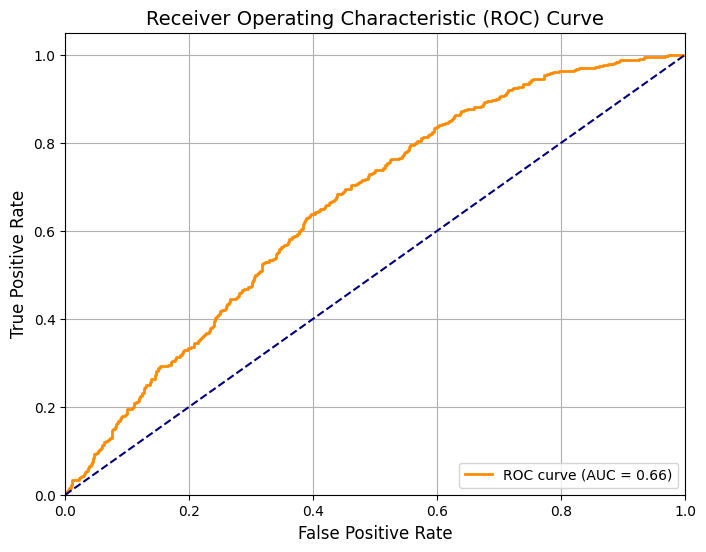

In [6]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# Train Random Forest
clf = RandomForestClassifier(
    n_estimators=300, 
    max_depth=25, 
    min_samples_split=4, 
    min_samples_leaf=2, 
    random_state=42, 
    n_jobs=-1
)
clf.fit(train_features, train_labels)

# Predictions
test_predictions = clf.predict(test_features)
test_probabilities = clf.predict_proba(test_features)[:, 1]  # probability for class 1

# Evaluation
accuracy = accuracy_score(test_labels, test_predictions)
print(f'Random Forest Classifier Accuracy: {accuracy * 100:.2f}%')

print("\nClassification Report:")
print(classification_report(test_labels, test_predictions))

print("\nConfusion Matrix:")
print(confusion_matrix(test_labels, test_predictions))

# ROC Curve
fpr, tpr, thresholds = roc_curve(test_labels, test_probabilities)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=14)
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [7]:
import os
import shutil
import random
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

vgg19_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
feature_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("block5_pool").output)

data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

def extract_features(img_paths):
    features = []
    for img_path in tqdm(img_paths, desc='Extracting features'):
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        img = np.expand_dims(img, axis=0)
        img = img / 255.0
        img = next(data_gen.flow(img, batch_size=1))
        feature = feature_extractor.predict(img)
        features.append(feature.flatten())
    return np.array(features)

valid_extensions = (".jpg", ".png", ".jpeg")

train_demented_paths = [os.path.join(train_demented_dir, f) for f in os.listdir(train_demented_dir) if f.lower().endswith(valid_extensions)]
train_nondemented_paths = [os.path.join(train_nondemented_dir, f) for f in os.listdir(train_nondemented_dir) if f.lower().endswith(valid_extensions)]
test_demented_paths = [os.path.join(test_demented_dir, f) for f in os.listdir(test_demented_dir) if f.lower().endswith(valid_extensions)]
test_nondemented_paths = [os.path.join(test_nondemented_dir, f) for f in os.listdir(test_nondemented_dir) if f.lower().endswith(valid_extensions)]

train_demented_features = extract_features(train_demented_paths)
train_nondemented_features = extract_features(train_nondemented_paths)
test_demented_features = extract_features(test_demented_paths)
test_nondemented_features = extract_features(test_nondemented_paths)

train_features = np.vstack((train_demented_features, train_nondemented_features))
train_labels = np.hstack((np.ones(train_demented_features.shape[0]), np.zeros(train_nondemented_features.shape[0])))
test_features = np.vstack((test_demented_features, test_nondemented_features))
test_labels = np.hstack((np.ones(test_demented_features.shape[0]), np.zeros(test_nondemented_features.shape[0])))


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 44s 1us/step


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 1/2560 [00:02<1:48:24,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                          | 2/2560 [00:03<1:15:41,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                          | 3/2560 [00:05<1:05:04,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 4/2560 [00:06<59:49,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 5/2560 [00:07<57:31,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                           | 6/2560 [00:08<55:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                           | 7/2560 [00:10<56:33,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 8/2560 [00:11<1:01:35,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 9/2560 [00:13<1:08:32,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                        | 10/2560 [00:16<1:23:24,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                        | 11/2560 [00:18<1:21:04,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▎                                                        | 12/2560 [00:19<1:15:04,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▎                                                        | 13/2560 [00:21<1:09:17,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 14/2560 [00:22<1:09:46,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▎                                                        | 15/2560 [00:24<1:08:47,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 16/2560 [00:25<1:08:31,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 17/2560 [00:27<1:10:16,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 18/2560 [00:29<1:10:41,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                        | 19/2560 [00:30<1:07:11,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 20/2560 [00:32<1:12:33,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 21/2560 [00:34<1:15:42,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 22/2560 [00:36<1:17:04,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 23/2560 [00:38<1:16:06,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 24/2560 [00:41<1:29:58,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                        | 25/2560 [00:42<1:18:19,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                        | 26/2560 [00:43<1:10:52,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                        | 27/2560 [00:44<1:05:12,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 28/2560 [00:46<1:08:24,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 29/2560 [00:48<1:14:06,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 30/2560 [00:50<1:13:31,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 31/2560 [00:53<1:29:46,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                        | 32/2560 [00:55<1:23:28,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                        | 33/2560 [00:56<1:13:58,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 34/2560 [00:57<1:08:55,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 35/2560 [00:58<1:02:41,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                          | 36/2560 [01:00<59:41,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 37/2560 [01:01<1:01:04,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 38/2560 [01:03<1:04:28,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▊                                                        | 39/2560 [01:04<1:01:13,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 40/2560 [01:06<58:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                        | 41/2560 [01:07<1:00:58,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 42/2560 [01:08<58:37,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 43/2560 [01:10<56:24,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:   2%|█                                                          | 44/2560 [01:11<52:24,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:   2%|█                                                          | 45/2560 [01:12<49:36,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:   2%|█                                                          | 46/2560 [01:13<47:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:   2%|█                                                          | 47/2560 [01:14<45:29,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:   2%|█                                                          | 48/2560 [01:15<44:35,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:   2%|█▏                                                         | 49/2560 [01:16<43:43,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   2%|█▏                                                         | 50/2560 [01:17<43:21,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:   2%|█▏                                                         | 51/2560 [01:18<43:00,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:   2%|█▏                                                         | 52/2560 [01:19<42:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 53/2560 [01:20<43:18,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   2%|█▏                                                         | 54/2560 [01:21<42:49,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:   2%|█▎                                                         | 55/2560 [01:22<42:36,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   2%|█▎                                                         | 56/2560 [01:23<42:22,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:   2%|█▎                                                         | 57/2560 [01:24<42:23,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:   2%|█▎                                                         | 58/2560 [01:25<42:20,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   2%|█▎                                                         | 59/2560 [01:26<41:56,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:   2%|█▍                                                         | 60/2560 [01:27<41:59,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   2%|█▍                                                         | 61/2560 [01:28<41:47,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:   2%|█▍                                                         | 62/2560 [01:29<41:50,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:   2%|█▍                                                         | 63/2560 [01:30<47:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:   2%|█▍                                                         | 64/2560 [01:31<46:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   3%|█▍                                                         | 65/2560 [01:32<44:58,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   3%|█▌                                                         | 66/2560 [01:33<43:56,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   3%|█▌                                                         | 67/2560 [01:34<43:24,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:   3%|█▌                                                         | 68/2560 [01:35<42:37,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   3%|█▌                                                         | 69/2560 [01:36<42:14,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:   3%|█▌                                                         | 70/2560 [01:37<41:55,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:   3%|█▋                                                         | 71/2560 [01:38<41:39,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:   3%|█▋                                                         | 72/2560 [01:39<41:20,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                         | 73/2560 [01:40<43:00,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:   3%|█▋                                                         | 74/2560 [01:41<42:07,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:   3%|█▋                                                         | 75/2560 [01:42<42:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:   3%|█▊                                                         | 76/2560 [01:43<42:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   3%|█▊                                                         | 77/2560 [01:44<42:01,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   3%|█▊                                                         | 78/2560 [01:45<42:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:   3%|█▊                                                         | 79/2560 [01:46<41:23,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:   3%|█▊                                                         | 80/2560 [01:47<41:11,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:   3%|█▊                                                         | 81/2560 [01:48<41:22,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:   3%|█▉                                                         | 82/2560 [01:49<41:17,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   3%|█▉                                                         | 83/2560 [01:50<42:24,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   3%|█▉                                                         | 84/2560 [01:51<41:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   3%|█▉                                                         | 85/2560 [01:52<41:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:   3%|█▉                                                         | 86/2560 [01:53<41:04,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:   3%|██                                                         | 87/2560 [01:54<41:05,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:   3%|██                                                         | 88/2560 [01:55<41:04,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:   3%|██                                                         | 89/2560 [01:56<41:19,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:   4%|██                                                         | 90/2560 [01:57<40:48,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:   4%|██                                                         | 91/2560 [01:58<40:32,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   4%|██                                                         | 92/2560 [01:59<40:51,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:   4%|██▏                                                        | 93/2560 [02:00<41:18,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:   4%|██▏                                                        | 94/2560 [02:01<42:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:   4%|██▏                                                        | 95/2560 [02:02<41:41,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:   4%|██▏                                                        | 96/2560 [02:03<41:35,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:   4%|██▏                                                        | 97/2560 [02:04<41:31,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   4%|██▎                                                        | 98/2560 [02:05<41:15,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   4%|██▎                                                        | 99/2560 [02:06<41:09,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:   4%|██▎                                                       | 100/2560 [02:07<41:13,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   4%|██▎                                                       | 101/2560 [02:08<41:19,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:   4%|██▎                                                       | 102/2560 [02:09<41:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   4%|██▎                                                       | 103/2560 [02:10<40:55,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                       | 104/2560 [02:12<42:06,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   4%|██▍                                                       | 105/2560 [02:13<41:44,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:   4%|██▍                                                       | 106/2560 [02:14<41:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:   4%|██▍                                                       | 107/2560 [02:15<41:12,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:   4%|██▍                                                       | 108/2560 [02:16<40:51,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:   4%|██▍                                                       | 109/2560 [02:17<40:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:   4%|██▍                                                       | 110/2560 [02:17<39:53,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:   4%|██▌                                                       | 111/2560 [02:18<39:57,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:   4%|██▌                                                       | 112/2560 [02:19<40:11,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:   4%|██▌                                                       | 113/2560 [02:20<40:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   4%|██▌                                                       | 114/2560 [02:22<41:36,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:   4%|██▌                                                       | 115/2560 [02:23<41:19,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:   5%|██▋                                                       | 116/2560 [02:24<41:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   5%|██▋                                                       | 117/2560 [02:25<40:58,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:   5%|██▋                                                       | 118/2560 [02:26<40:49,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|██▋                                                       | 119/2560 [02:27<41:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                       | 120/2560 [02:28<43:23,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:   5%|██▋                                                       | 121/2560 [02:29<42:44,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   5%|██▊                                                       | 122/2560 [02:30<42:17,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   5%|██▊                                                       | 123/2560 [02:31<42:01,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|██▊                                                       | 124/2560 [02:32<42:16,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:   5%|██▊                                                       | 125/2560 [02:33<41:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   5%|██▊                                                       | 126/2560 [02:34<41:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:   5%|██▉                                                       | 127/2560 [02:35<40:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   5%|██▉                                                       | 128/2560 [02:36<40:35,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:   5%|██▉                                                       | 129/2560 [02:37<40:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:   5%|██▉                                                       | 130/2560 [02:38<40:28,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   5%|██▉                                                       | 131/2560 [02:39<40:26,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:   5%|██▉                                                       | 132/2560 [02:40<40:16,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:   5%|███                                                       | 133/2560 [02:41<40:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:   5%|███                                                       | 134/2560 [02:42<40:34,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   5%|███                                                       | 135/2560 [02:43<41:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:   5%|███                                                       | 136/2560 [02:44<41:16,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   5%|███                                                       | 137/2560 [02:45<41:10,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:   5%|███▏                                                      | 138/2560 [02:46<41:07,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:   5%|███▏                                                      | 139/2560 [02:47<40:50,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   5%|███▏                                                      | 140/2560 [02:48<40:41,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   6%|███▏                                                      | 141/2560 [02:49<40:19,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:   6%|███▏                                                      | 142/2560 [02:50<40:16,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:   6%|███▏                                                      | 143/2560 [02:51<39:54,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:   6%|███▎                                                      | 144/2560 [02:52<40:10,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step


Extracting features:   6%|███▎                                                      | 145/2560 [02:53<41:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:   6%|███▎                                                      | 146/2560 [02:54<40:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   6%|███▎                                                      | 147/2560 [02:55<40:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:   6%|███▎                                                      | 148/2560 [02:56<40:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:   6%|███▍                                                      | 149/2560 [02:57<40:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   6%|███▍                                                      | 150/2560 [02:58<40:09,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:   6%|███▍                                                      | 151/2560 [02:59<39:57,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:   6%|███▍                                                      | 152/2560 [03:00<39:47,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:   6%|███▍                                                      | 153/2560 [03:01<39:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   6%|███▍                                                      | 154/2560 [03:02<39:20,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                      | 155/2560 [03:03<40:51,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   6%|███▌                                                      | 156/2560 [03:04<40:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   6%|███▌                                                      | 157/2560 [03:05<40:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   6%|███▌                                                      | 158/2560 [03:06<40:11,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   6%|███▌                                                      | 159/2560 [03:07<40:19,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:   6%|███▋                                                      | 160/2560 [03:08<40:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:   6%|███▋                                                      | 161/2560 [03:09<40:25,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 162/2560 [03:10<43:53,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 163/2560 [03:12<48:03,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 164/2560 [03:13<49:43,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 165/2560 [03:15<52:18,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▊                                                      | 166/2560 [03:16<55:14,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   7%|███▊                                                      | 167/2560 [03:17<51:37,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:   7%|███▊                                                      | 168/2560 [03:18<48:51,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   7%|███▊                                                      | 169/2560 [03:19<47:30,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:   7%|███▊                                                      | 170/2560 [03:20<45:58,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:   7%|███▊                                                      | 171/2560 [03:22<45:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   7%|███▉                                                      | 172/2560 [03:23<43:28,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 173/2560 [03:24<47:53,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                      | 174/2560 [03:26<52:59,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:   7%|███▉                                                      | 175/2560 [03:27<49:24,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 176/2560 [03:28<49:15,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   7%|████                                                      | 177/2560 [03:29<47:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   7%|████                                                      | 178/2560 [03:30<45:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   7%|████                                                      | 179/2560 [03:31<43:37,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   7%|████                                                      | 180/2560 [03:32<42:37,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   7%|████                                                      | 181/2560 [03:33<41:43,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   7%|████                                                      | 182/2560 [03:34<41:15,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   7%|████▏                                                     | 183/2560 [03:35<40:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   7%|████▏                                                     | 184/2560 [03:36<41:12,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   7%|████▏                                                     | 185/2560 [03:37<40:41,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   7%|████▏                                                     | 186/2560 [03:38<40:33,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:   7%|████▏                                                     | 187/2560 [03:39<40:00,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:   7%|████▎                                                     | 188/2560 [03:40<39:39,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:   7%|████▎                                                     | 189/2560 [03:41<39:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:   7%|████▎                                                     | 190/2560 [03:42<40:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   7%|████▎                                                     | 191/2560 [03:43<39:40,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:   8%|████▎                                                     | 192/2560 [03:44<39:59,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:   8%|████▎                                                     | 193/2560 [03:45<39:38,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:   8%|████▍                                                     | 194/2560 [03:46<39:55,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:   8%|████▍                                                     | 195/2560 [03:47<40:31,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   8%|████▍                                                     | 196/2560 [03:48<40:10,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:   8%|████▍                                                     | 197/2560 [03:49<40:05,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   8%|████▍                                                     | 198/2560 [03:50<39:39,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:   8%|████▌                                                     | 199/2560 [03:51<39:56,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:   8%|████▌                                                     | 200/2560 [03:52<39:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   8%|████▌                                                     | 201/2560 [03:53<39:26,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   8%|████▌                                                     | 202/2560 [03:54<39:24,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   8%|████▌                                                     | 203/2560 [03:55<39:31,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:   8%|████▌                                                     | 204/2560 [03:56<39:35,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   8%|████▋                                                     | 205/2560 [03:57<40:28,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   8%|████▋                                                     | 206/2560 [03:58<39:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:   8%|████▋                                                     | 207/2560 [03:59<39:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:   8%|████▋                                                     | 208/2560 [04:00<39:09,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:   8%|████▋                                                     | 209/2560 [04:01<38:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:   8%|████▊                                                     | 210/2560 [04:02<39:09,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:   8%|████▊                                                     | 211/2560 [04:03<39:19,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:   8%|████▊                                                     | 212/2560 [04:04<39:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   8%|████▊                                                     | 213/2560 [04:05<39:39,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:   8%|████▊                                                     | 214/2560 [04:06<40:14,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 215/2560 [04:08<41:49,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   8%|████▉                                                     | 216/2560 [04:09<41:10,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   8%|████▉                                                     | 217/2560 [04:10<40:42,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   9%|████▉                                                     | 218/2560 [04:11<40:21,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   9%|████▉                                                     | 219/2560 [04:12<39:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   9%|████▉                                                     | 220/2560 [04:13<39:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   9%|█████                                                     | 221/2560 [04:14<39:10,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:   9%|█████                                                     | 222/2560 [04:15<39:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:   9%|█████                                                     | 223/2560 [04:16<38:58,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:   9%|█████                                                     | 224/2560 [04:17<38:55,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 225/2560 [04:18<40:03,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   9%|█████                                                     | 226/2560 [04:19<39:42,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:   9%|█████▏                                                    | 227/2560 [04:20<39:25,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:   9%|█████▏                                                    | 228/2560 [04:21<39:02,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   9%|█████▏                                                    | 229/2560 [04:22<38:46,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:   9%|█████▏                                                    | 230/2560 [04:23<38:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:   9%|█████▏                                                    | 231/2560 [04:24<38:04,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   9%|█████▎                                                    | 232/2560 [04:25<37:52,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   9%|█████▎                                                    | 233/2560 [04:26<38:19,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:   9%|█████▎                                                    | 234/2560 [04:27<38:26,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step    


Extracting features:   9%|█████▎                                                    | 235/2560 [04:28<39:28,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:   9%|█████▎                                                    | 236/2560 [04:29<39:13,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:   9%|█████▎                                                    | 237/2560 [04:30<39:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:   9%|█████▍                                                    | 238/2560 [04:31<38:42,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:   9%|█████▍                                                    | 239/2560 [04:32<38:47,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:   9%|█████▍                                                    | 240/2560 [04:33<38:40,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:   9%|█████▍                                                    | 241/2560 [04:34<38:25,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   9%|█████▍                                                    | 242/2560 [04:35<38:27,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:   9%|█████▌                                                    | 243/2560 [04:36<38:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  10%|█████▌                                                    | 244/2560 [04:37<38:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  10%|█████▌                                                    | 245/2560 [04:38<38:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:  10%|█████▌                                                    | 246/2560 [04:39<38:59,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  10%|█████▌                                                    | 247/2560 [04:40<38:46,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  10%|█████▌                                                    | 248/2560 [04:41<38:20,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  10%|█████▋                                                    | 249/2560 [04:42<38:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  10%|█████▋                                                    | 250/2560 [04:43<37:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  10%|█████▋                                                    | 251/2560 [04:44<38:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  10%|█████▋                                                    | 252/2560 [04:45<38:34,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  10%|█████▋                                                    | 253/2560 [04:47<51:41,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  10%|█████▊                                                    | 254/2560 [04:48<48:03,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 255/2560 [04:49<46:06,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  10%|█████▊                                                    | 256/2560 [04:50<43:58,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  10%|█████▊                                                    | 257/2560 [04:51<42:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


Extracting features:  10%|█████▊                                                    | 258/2560 [04:52<41:24,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  10%|█████▊                                                    | 259/2560 [04:53<41:17,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  10%|█████▉                                                    | 260/2560 [04:54<40:17,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  10%|█████▉                                                    | 261/2560 [04:55<39:29,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  10%|█████▉                                                    | 262/2560 [04:56<38:56,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  10%|█████▉                                                    | 263/2560 [04:57<38:31,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  10%|█████▉                                                    | 264/2560 [04:58<38:36,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 265/2560 [04:59<39:49,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  10%|██████                                                    | 266/2560 [05:00<39:19,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  10%|██████                                                    | 267/2560 [05:01<38:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  10%|██████                                                    | 268/2560 [05:02<38:41,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  11%|██████                                                    | 269/2560 [05:03<38:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  11%|██████                                                    | 270/2560 [05:04<38:27,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  11%|██████▏                                                   | 271/2560 [05:05<38:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  11%|██████▏                                                   | 272/2560 [05:06<39:15,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 273/2560 [05:07<41:30,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 274/2560 [05:09<44:39,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  11%|██████▏                                                   | 275/2560 [05:10<43:28,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  11%|██████▎                                                   | 276/2560 [05:11<41:56,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  11%|██████▎                                                   | 277/2560 [05:12<40:46,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  11%|██████▎                                                   | 278/2560 [05:13<39:55,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  11%|██████▎                                                   | 279/2560 [05:14<39:08,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 280/2560 [05:15<40:05,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 281/2560 [05:16<41:19,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 282/2560 [05:17<42:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 283/2560 [05:18<43:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 284/2560 [05:20<44:22,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 285/2560 [05:21<46:25,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  11%|██████▍                                                   | 286/2560 [05:22<43:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 287/2560 [05:23<44:52,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  11%|██████▌                                                   | 288/2560 [05:24<42:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  11%|██████▌                                                   | 289/2560 [05:25<41:27,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  11%|██████▌                                                   | 290/2560 [05:26<40:20,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  11%|██████▌                                                   | 291/2560 [05:27<39:19,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  11%|██████▌                                                   | 292/2560 [05:28<38:41,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  11%|██████▋                                                   | 293/2560 [05:29<38:14,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  11%|██████▋                                                   | 294/2560 [05:30<38:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 295/2560 [05:31<39:54,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  12%|██████▋                                                   | 296/2560 [05:32<39:23,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  12%|██████▋                                                   | 297/2560 [05:33<39:09,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  12%|██████▊                                                   | 298/2560 [05:34<38:59,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  12%|██████▊                                                   | 299/2560 [05:35<38:46,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  12%|██████▊                                                   | 300/2560 [05:37<38:40,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  12%|██████▊                                                   | 301/2560 [05:38<38:37,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|██████▊                                                   | 302/2560 [05:39<39:33,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  12%|██████▊                                                   | 303/2560 [05:40<39:06,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  12%|██████▉                                                   | 304/2560 [05:41<39:18,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 305/2560 [05:42<41:12,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  12%|██████▉                                                   | 306/2560 [05:43<40:27,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  12%|██████▉                                                   | 307/2560 [05:44<40:30,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  12%|██████▉                                                   | 308/2560 [05:45<39:34,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  12%|███████                                                   | 309/2560 [05:46<38:45,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  12%|███████                                                   | 310/2560 [05:47<38:33,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  12%|███████                                                   | 311/2560 [05:48<38:12,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  12%|███████                                                   | 312/2560 [05:49<37:50,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|███████                                                   | 313/2560 [05:50<38:21,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 314/2560 [05:51<39:56,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 315/2560 [05:52<40:11,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|███████▏                                                  | 316/2560 [05:53<40:24,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  12%|███████▏                                                  | 317/2560 [05:54<39:40,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|███████▏                                                  | 318/2560 [05:56<39:39,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  12%|███████▏                                                  | 319/2560 [05:57<39:28,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  12%|███████▎                                                  | 320/2560 [05:58<38:39,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  13%|███████▎                                                  | 321/2560 [05:59<38:17,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  13%|███████▎                                                  | 322/2560 [06:00<37:47,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  13%|███████▎                                                  | 323/2560 [06:01<37:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  13%|███████▎                                                  | 324/2560 [06:02<37:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 325/2560 [06:03<38:19,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  13%|███████▍                                                  | 326/2560 [06:04<37:58,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  13%|███████▍                                                  | 327/2560 [06:05<37:43,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  13%|███████▍                                                  | 328/2560 [06:06<37:09,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  13%|███████▍                                                  | 329/2560 [06:07<37:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  13%|███████▍                                                  | 330/2560 [06:08<37:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  13%|███████▍                                                  | 331/2560 [06:09<36:59,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  13%|███████▌                                                  | 332/2560 [06:10<36:29,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 333/2560 [06:11<38:13,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  13%|███████▌                                                  | 334/2560 [06:13<50:09,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  13%|███████▌                                                  | 335/2560 [06:14<53:48,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  13%|███████▌                                                  | 336/2560 [06:16<58:10,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:  13%|███████▋                                                  | 337/2560 [06:17<52:30,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  13%|███████▋                                                  | 338/2560 [06:18<48:24,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  13%|███████▋                                                  | 339/2560 [06:19<44:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  13%|███████▋                                                  | 340/2560 [06:21<50:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 341/2560 [06:22<48:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 342/2560 [06:24<47:40,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 343/2560 [06:25<49:10,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 344/2560 [06:26<47:39,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  13%|███████▊                                                  | 345/2560 [06:27<44:56,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  14%|███████▊                                                  | 346/2560 [06:28<42:48,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  14%|███████▊                                                  | 347/2560 [06:29<41:41,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  14%|███████▉                                                  | 348/2560 [06:30<40:11,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  14%|███████▉                                                  | 349/2560 [06:31<39:09,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  14%|███████▉                                                  | 350/2560 [06:32<38:14,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  14%|███████▉                                                  | 351/2560 [06:33<38:09,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  14%|███████▉                                                  | 352/2560 [06:34<37:33,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  14%|███████▉                                                  | 353/2560 [06:35<37:07,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  14%|████████                                                  | 354/2560 [06:36<36:47,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  14%|████████                                                  | 355/2560 [06:37<36:24,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  14%|████████                                                  | 356/2560 [06:38<36:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  14%|████████                                                  | 357/2560 [06:39<36:09,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  14%|████████                                                  | 358/2560 [06:40<36:07,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  14%|████████▏                                                 | 359/2560 [06:41<36:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  14%|████████▏                                                 | 360/2560 [06:42<36:22,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  14%|████████▏                                                 | 361/2560 [06:43<36:13,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  14%|████████▏                                                 | 362/2560 [06:44<37:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  14%|████████▏                                                 | 363/2560 [06:45<36:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  14%|████████▏                                                 | 364/2560 [06:46<36:28,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  14%|████████▎                                                 | 365/2560 [06:47<36:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  14%|████████▎                                                 | 366/2560 [06:48<36:22,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  14%|████████▎                                                 | 367/2560 [06:49<36:22,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  14%|████████▎                                                 | 368/2560 [06:50<36:24,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  14%|████████▎                                                 | 369/2560 [06:51<36:24,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  14%|████████▍                                                 | 370/2560 [06:52<36:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  14%|████████▍                                                 | 371/2560 [06:53<35:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|████████▍                                                 | 372/2560 [06:54<37:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  15%|████████▍                                                 | 373/2560 [06:55<36:48,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  15%|████████▍                                                 | 374/2560 [06:56<36:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  15%|████████▍                                                 | 375/2560 [06:57<36:31,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  15%|████████▌                                                 | 376/2560 [06:58<36:09,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  15%|████████▌                                                 | 377/2560 [06:59<36:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|████████▌                                                 | 378/2560 [07:00<36:50,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  15%|████████▌                                                 | 379/2560 [07:01<36:39,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  15%|████████▌                                                 | 380/2560 [07:02<36:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  15%|████████▋                                                 | 381/2560 [07:03<36:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  15%|████████▋                                                 | 382/2560 [07:04<36:35,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  15%|████████▋                                                 | 383/2560 [07:05<36:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  15%|████████▋                                                 | 384/2560 [07:06<36:24,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  15%|████████▋                                                 | 385/2560 [07:07<36:19,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  15%|████████▋                                                 | 386/2560 [07:08<36:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  15%|████████▊                                                 | 387/2560 [07:09<36:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  15%|████████▊                                                 | 388/2560 [07:10<36:16,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  15%|████████▊                                                 | 389/2560 [07:11<36:03,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  15%|████████▊                                                 | 390/2560 [07:12<35:43,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  15%|████████▊                                                 | 391/2560 [07:13<35:37,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  15%|████████▉                                                 | 392/2560 [07:14<35:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  15%|████████▉                                                 | 393/2560 [07:15<36:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  15%|████████▉                                                 | 394/2560 [07:16<36:09,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  15%|████████▉                                                 | 395/2560 [07:17<35:56,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  15%|████████▉                                                 | 396/2560 [07:18<35:56,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  16%|████████▉                                                 | 397/2560 [07:19<36:07,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  16%|█████████                                                 | 398/2560 [07:20<36:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 399/2560 [07:21<38:15,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 400/2560 [07:23<39:28,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  16%|█████████                                                 | 401/2560 [07:24<44:41,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 402/2560 [07:26<46:07,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 403/2560 [07:27<45:35,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  16%|█████████▏                                                | 404/2560 [07:28<43:03,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  16%|█████████▏                                                | 405/2560 [07:29<40:41,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  16%|█████████▏                                                | 406/2560 [07:30<39:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  16%|█████████▏                                                | 407/2560 [07:31<38:02,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 408/2560 [07:32<41:24,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 409/2560 [07:33<42:49,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  16%|█████████▎                                                | 410/2560 [07:34<40:25,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  16%|█████████▎                                                | 411/2560 [07:35<38:24,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  16%|█████████▎                                                | 412/2560 [07:36<37:24,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:  16%|█████████▎                                                | 413/2560 [07:37<37:26,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  16%|█████████▍                                                | 414/2560 [07:38<36:33,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  16%|█████████▍                                                | 415/2560 [07:39<36:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  16%|█████████▍                                                | 416/2560 [07:40<35:45,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  16%|█████████▍                                                | 417/2560 [07:41<35:35,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  16%|█████████▍                                                | 418/2560 [07:42<35:26,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  16%|█████████▍                                                | 419/2560 [07:43<35:17,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  16%|█████████▌                                                | 420/2560 [07:44<35:33,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  16%|█████████▌                                                | 421/2560 [07:45<35:34,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  16%|█████████▌                                                | 422/2560 [07:46<35:12,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  17%|█████████▌                                                | 423/2560 [07:47<35:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  17%|█████████▌                                                | 424/2560 [07:48<35:47,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  17%|█████████▋                                                | 425/2560 [07:49<35:41,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  17%|█████████▋                                                | 426/2560 [07:50<35:28,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  17%|█████████▋                                                | 427/2560 [07:51<35:27,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  17%|█████████▋                                                | 428/2560 [07:52<35:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  17%|█████████▋                                                | 429/2560 [07:53<35:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  17%|█████████▋                                                | 430/2560 [07:54<35:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  17%|█████████▊                                                | 431/2560 [07:55<35:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  17%|█████████▊                                                | 432/2560 [07:56<34:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  17%|█████████▊                                                | 433/2560 [07:57<34:55,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 434/2560 [07:58<36:17,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  17%|█████████▊                                                | 435/2560 [07:59<35:29,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  17%|█████████▉                                                | 436/2560 [08:00<35:15,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  17%|█████████▉                                                | 437/2560 [08:01<35:05,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  17%|█████████▉                                                | 438/2560 [08:02<34:57,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  17%|█████████▉                                                | 439/2560 [08:03<35:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  17%|█████████▉                                                | 440/2560 [08:04<34:53,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  17%|█████████▉                                                | 441/2560 [08:05<34:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  17%|██████████                                                | 442/2560 [08:06<34:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  17%|██████████                                                | 443/2560 [08:07<34:41,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 444/2560 [08:08<35:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  17%|██████████                                                | 445/2560 [08:09<35:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  17%|██████████                                                | 446/2560 [08:10<35:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  17%|██████████▏                                               | 447/2560 [08:11<35:11,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  18%|██████████▏                                               | 448/2560 [08:12<34:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  18%|██████████▏                                               | 449/2560 [08:13<34:31,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  18%|██████████▏                                               | 450/2560 [08:14<34:40,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  18%|██████████▏                                               | 451/2560 [08:15<34:47,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  18%|██████████▏                                               | 452/2560 [08:16<34:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  18%|██████████▎                                               | 453/2560 [08:17<34:29,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  18%|██████████▎                                               | 454/2560 [08:18<34:37,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  18%|██████████▎                                               | 455/2560 [08:19<35:31,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  18%|██████████▎                                               | 456/2560 [08:20<35:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  18%|██████████▎                                               | 457/2560 [08:21<35:01,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  18%|██████████▍                                               | 458/2560 [08:22<34:47,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  18%|██████████▍                                               | 459/2560 [08:23<34:50,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  18%|██████████▍                                               | 460/2560 [08:24<34:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  18%|██████████▍                                               | 461/2560 [08:25<34:34,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  18%|██████████▍                                               | 462/2560 [08:26<34:40,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  18%|██████████▍                                               | 463/2560 [08:27<34:23,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


Extracting features:  18%|██████████▌                                               | 464/2560 [08:28<35:13,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 465/2560 [08:29<36:19,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  18%|██████████▌                                               | 466/2560 [08:30<35:42,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  18%|██████████▌                                               | 467/2560 [08:31<35:29,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  18%|██████████▌                                               | 468/2560 [08:32<35:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  18%|██████████▋                                               | 469/2560 [08:33<34:54,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  18%|██████████▋                                               | 470/2560 [08:34<34:44,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  18%|██████████▋                                               | 471/2560 [08:35<34:35,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  18%|██████████▋                                               | 472/2560 [08:36<34:43,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  18%|██████████▋                                               | 473/2560 [08:37<34:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  19%|██████████▋                                               | 474/2560 [08:38<34:30,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  19%|██████████▊                                               | 475/2560 [08:39<35:13,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  19%|██████████▊                                               | 476/2560 [08:40<34:44,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  19%|██████████▊                                               | 477/2560 [08:41<34:34,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  19%|██████████▊                                               | 478/2560 [08:42<34:38,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  19%|██████████▊                                               | 479/2560 [08:43<34:33,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  19%|██████████▉                                               | 480/2560 [08:44<34:44,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  19%|██████████▉                                               | 481/2560 [08:45<34:38,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  19%|██████████▉                                               | 482/2560 [08:46<34:19,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  19%|██████████▉                                               | 483/2560 [08:47<34:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  19%|██████████▉                                               | 484/2560 [08:48<33:56,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  19%|██████████▉                                               | 485/2560 [08:49<34:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  19%|███████████                                               | 486/2560 [08:50<34:45,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  19%|███████████                                               | 487/2560 [08:51<34:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  19%|███████████                                               | 488/2560 [08:52<34:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  19%|███████████                                               | 489/2560 [08:53<34:11,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  19%|███████████                                               | 490/2560 [08:54<34:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  19%|███████████                                               | 491/2560 [08:55<34:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  19%|███████████▏                                              | 492/2560 [08:56<34:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  19%|███████████▏                                              | 493/2560 [08:57<34:12,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  19%|███████████▏                                              | 494/2560 [08:58<34:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 495/2560 [08:59<37:17,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 496/2560 [09:00<37:43,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  19%|███████████▎                                              | 497/2560 [09:01<36:28,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  19%|███████████▎                                              | 498/2560 [09:02<35:22,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  19%|███████████▎                                              | 499/2560 [09:03<35:02,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  20%|███████████▎                                              | 500/2560 [09:04<34:31,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  20%|███████████▎                                              | 501/2560 [09:05<34:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  20%|███████████▎                                              | 502/2560 [09:06<34:13,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  20%|███████████▍                                              | 503/2560 [09:07<33:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  20%|███████████▍                                              | 504/2560 [09:08<34:08,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  20%|███████████▍                                              | 505/2560 [09:09<33:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  20%|███████████▍                                              | 506/2560 [09:10<34:50,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  20%|███████████▍                                              | 507/2560 [09:11<34:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  20%|███████████▌                                              | 508/2560 [09:12<34:06,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  20%|███████████▌                                              | 509/2560 [09:13<33:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  20%|███████████▌                                              | 510/2560 [09:14<33:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  20%|███████████▌                                              | 511/2560 [09:15<34:01,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  20%|███████████▌                                              | 512/2560 [09:16<33:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  20%|███████████▌                                              | 513/2560 [09:17<33:44,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  20%|███████████▋                                              | 514/2560 [09:18<33:39,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  20%|███████████▋                                              | 515/2560 [09:19<33:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                              | 516/2560 [09:20<34:50,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  20%|███████████▋                                              | 517/2560 [09:21<34:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  20%|███████████▋                                              | 518/2560 [09:22<34:07,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  20%|███████████▊                                              | 519/2560 [09:23<33:53,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  20%|███████████▊                                              | 520/2560 [09:24<33:54,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  20%|███████████▊                                              | 521/2560 [09:25<33:52,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  20%|███████████▊                                              | 522/2560 [09:26<33:34,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 523/2560 [09:27<34:51,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 524/2560 [09:29<36:39,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 525/2560 [09:30<38:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                              | 526/2560 [09:31<42:53,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 527/2560 [09:33<43:23,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  21%|███████████▉                                              | 528/2560 [09:34<41:03,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  21%|███████████▉                                              | 529/2560 [09:35<38:30,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  21%|████████████                                              | 530/2560 [09:36<36:45,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  21%|████████████                                              | 531/2560 [09:37<35:50,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  21%|████████████                                              | 532/2560 [09:38<35:02,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  21%|████████████                                              | 533/2560 [09:39<34:28,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  21%|████████████                                              | 534/2560 [09:40<34:04,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  21%|████████████                                              | 535/2560 [09:41<33:37,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  21%|████████████▏                                             | 536/2560 [09:42<33:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  21%|████████████▏                                             | 537/2560 [09:43<33:01,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 538/2560 [09:44<34:11,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  21%|████████████▏                                             | 539/2560 [09:45<33:42,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  21%|████████████▏                                             | 540/2560 [09:46<33:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  21%|████████████▎                                             | 541/2560 [09:47<33:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  21%|████████████▎                                             | 542/2560 [09:48<33:00,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  21%|████████████▎                                             | 543/2560 [09:48<32:47,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  21%|████████████▎                                             | 544/2560 [09:49<32:43,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  21%|████████████▎                                             | 545/2560 [09:50<32:35,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  21%|████████████▎                                             | 546/2560 [09:51<32:41,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  21%|████████████▍                                             | 547/2560 [09:52<32:45,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  21%|████████████▍                                             | 548/2560 [09:53<33:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  21%|████████████▍                                             | 549/2560 [09:54<33:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  21%|████████████▍                                             | 550/2560 [09:55<33:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  22%|████████████▍                                             | 551/2560 [09:56<32:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  22%|████████████▌                                             | 552/2560 [09:57<32:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  22%|████████████▌                                             | 553/2560 [09:58<33:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  22%|████████████▌                                             | 554/2560 [09:59<32:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  22%|████████████▌                                             | 555/2560 [10:00<32:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  22%|████████████▌                                             | 556/2560 [10:01<32:52,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  22%|████████████▌                                             | 557/2560 [10:02<32:51,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  22%|████████████▋                                             | 558/2560 [10:03<32:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  22%|████████████▋                                             | 559/2560 [10:04<33:56,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  22%|████████████▋                                             | 560/2560 [10:05<33:31,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  22%|████████████▋                                             | 561/2560 [10:06<33:27,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  22%|████████████▋                                             | 562/2560 [10:07<33:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  22%|████████████▊                                             | 563/2560 [10:08<33:22,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  22%|████████████▊                                             | 564/2560 [10:09<33:09,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  22%|████████████▊                                             | 565/2560 [10:10<32:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  22%|████████████▊                                             | 566/2560 [10:11<33:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  22%|████████████▊                                             | 567/2560 [10:12<32:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  22%|████████████▊                                             | 568/2560 [10:13<32:57,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 569/2560 [10:14<34:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 570/2560 [10:15<34:46,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 571/2560 [10:17<37:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  22%|████████████▉                                             | 572/2560 [10:18<36:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  22%|████████████▉                                             | 573/2560 [10:19<35:26,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  22%|█████████████                                             | 574/2560 [10:20<34:19,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  22%|█████████████                                             | 575/2560 [10:21<33:56,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  22%|█████████████                                             | 576/2560 [10:22<33:44,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  23%|█████████████                                             | 577/2560 [10:23<33:05,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  23%|█████████████                                             | 578/2560 [10:24<33:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████                                             | 579/2560 [10:25<33:50,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [10:26<33:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  23%|█████████████▏                                            | 581/2560 [10:27<33:04,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [10:28<32:46,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [10:29<32:55,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [10:30<33:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [10:31<33:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [10:32<32:59,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [10:33<33:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [10:34<32:51,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [10:35<34:24,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [10:36<33:48,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [10:37<33:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [10:38<33:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [10:39<32:45,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  23%|█████████████▍                                            | 594/2560 [10:40<32:35,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  23%|█████████████▍                                            | 595/2560 [10:41<32:45,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [10:42<32:25,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [10:43<32:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [10:44<32:21,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [10:45<32:55,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [10:46<33:48,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [10:47<34:06,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [10:48<33:57,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [10:49<34:11,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [10:50<34:00,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [10:51<35:22,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [10:52<34:38,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [10:54<35:43,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 988ms/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [10:55<35:37,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [10:56<36:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [10:57<36:07,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [10:58<35:20,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 995ms/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [10:59<35:16,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [11:00<35:01,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [11:01<35:01,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [11:02<34:52,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [11:03<34:45,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  24%|█████████████▉                                            | 617/2560 [11:04<34:23,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  24%|██████████████                                            | 618/2560 [11:05<34:13,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:  24%|██████████████                                            | 619/2560 [11:06<34:36,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  24%|██████████████                                            | 620/2560 [11:08<34:43,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  24%|██████████████                                            | 621/2560 [11:09<34:16,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  24%|██████████████                                            | 622/2560 [11:10<34:18,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  24%|██████████████                                            | 623/2560 [11:11<34:09,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  24%|██████████████▏                                           | 624/2560 [11:12<34:13,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [11:13<34:12,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [11:14<33:56,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [11:15<33:54,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [11:16<34:48,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [11:17<35:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [11:18<35:12,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [11:19<34:46,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [11:20<34:05,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [11:21<33:57,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [11:22<33:14,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [11:23<33:00,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [11:24<32:33,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [11:25<32:12,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [11:26<32:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [11:27<32:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [11:28<31:55,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [11:29<31:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [11:30<31:48,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [11:31<31:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [11:32<32:02,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [11:34<34:18,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [11:35<35:14,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [11:36<38:36,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [11:38<39:49,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [11:39<40:13,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  25%|██████████████▋                                           | 650/2560 [11:40<38:18,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [11:41<36:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [11:42<34:46,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [11:43<33:32,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [11:44<32:40,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [11:45<36:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [11:47<37:49,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [11:48<35:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [11:49<34:13,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [11:50<34:33,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [11:51<33:40,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [11:52<32:52,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [11:53<32:16,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  26%|███████████████                                           | 663/2560 [11:54<31:46,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  26%|███████████████                                           | 664/2560 [11:55<31:21,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  26%|███████████████                                           | 665/2560 [11:56<31:17,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  26%|███████████████                                           | 666/2560 [11:57<31:15,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  26%|███████████████                                           | 667/2560 [11:57<31:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [11:58<31:05,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [11:59<31:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [12:00<31:25,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [12:01<31:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [12:02<30:58,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [12:03<30:56,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [12:04<30:54,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [12:05<30:43,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [12:06<30:54,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [12:07<31:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [12:08<31:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [12:09<31:16,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [12:10<32:13,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [12:11<31:18,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [12:12<31:16,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [12:13<30:56,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [12:14<31:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [12:15<31:05,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [12:16<30:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [12:17<30:51,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [12:18<30:47,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [12:19<30:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  27%|███████████████▋                                          | 690/2560 [12:20<31:25,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [12:21<31:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [12:22<31:10,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [12:23<30:58,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [12:24<30:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [12:25<30:46,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [12:26<30:51,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [12:27<30:44,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [12:28<30:48,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [12:29<30:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [12:30<30:36,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [12:31<31:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [12:32<31:12,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [12:33<30:56,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [12:34<30:46,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [12:35<31:15,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [12:36<31:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  28%|████████████████                                          | 707/2560 [12:37<31:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  28%|████████████████                                          | 708/2560 [12:38<30:48,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  28%|████████████████                                          | 709/2560 [12:39<30:56,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  28%|████████████████                                          | 710/2560 [12:40<31:30,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 711/2560 [12:42<32:48,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [12:43<32:29,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [12:44<31:57,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [12:45<31:34,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [12:46<31:13,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [12:47<30:50,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [12:48<30:20,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [12:49<30:15,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [12:49<30:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [12:50<30:03,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  28%|████████████████▎                                         | 721/2560 [12:52<30:56,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [12:53<30:39,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [12:54<30:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [12:54<30:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [12:55<29:59,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [12:56<29:50,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [12:57<29:51,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [12:58<29:41,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [12:59<29:49,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [13:00<29:42,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [13:01<30:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [13:02<30:25,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [13:03<30:32,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [13:04<30:47,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [13:05<30:39,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [13:06<30:24,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [13:07<30:20,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [13:08<30:22,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [13:09<30:11,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [13:10<30:08,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [13:11<30:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [13:12<31:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [13:13<30:38,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [13:14<30:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [13:15<30:18,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [13:16<30:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [13:17<29:51,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [13:18<30:05,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [13:19<30:13,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [13:20<30:11,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  29%|█████████████████                                         | 751/2560 [13:21<30:09,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  29%|█████████████████                                         | 752/2560 [13:22<30:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  29%|█████████████████                                         | 753/2560 [13:23<30:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  29%|█████████████████                                         | 754/2560 [13:24<30:11,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  29%|█████████████████                                         | 755/2560 [13:25<29:59,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [13:26<29:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [13:27<29:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [13:28<29:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [13:29<29:39,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [13:30<29:44,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [13:31<29:48,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [13:32<30:15,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [13:33<30:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [13:34<29:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [13:35<29:39,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [13:36<29:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [13:37<29:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [13:38<29:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [13:39<30:58,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [13:41<32:20,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [13:42<33:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [13:43<36:06,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [13:45<37:20,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [13:46<36:00,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [13:47<33:55,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [13:48<32:30,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [13:49<31:27,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [13:50<30:47,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [13:51<33:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [13:52<35:05,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [13:53<33:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [13:54<32:08,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [13:55<32:11,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [13:56<31:01,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [13:57<30:31,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [13:58<30:14,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [13:59<29:49,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [14:00<29:46,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [14:01<29:36,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [14:02<29:34,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [14:03<29:22,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [14:04<29:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [14:05<29:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [14:06<29:44,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  31%|██████████████████                                        | 795/2560 [14:07<29:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  31%|██████████████████                                        | 796/2560 [14:08<29:31,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  31%|██████████████████                                        | 797/2560 [14:09<29:19,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  31%|██████████████████                                        | 798/2560 [14:10<29:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  31%|██████████████████                                        | 799/2560 [14:11<29:04,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [14:12<29:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [14:13<29:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [14:14<29:19,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [14:15<29:17,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [14:16<30:08,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [14:17<29:42,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [14:19<31:20,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [14:20<36:22,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [14:22<42:54,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [14:24<43:17,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [14:26<50:49,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [14:28<50:57,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [14:29<44:16,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [14:30<41:43,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [14:31<39:54,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [14:33<38:30,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [14:34<35:45,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [14:35<33:45,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [14:36<32:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  32%|██████████████████▌                                       | 819/2560 [14:37<31:58,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [14:38<33:42,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [14:39<36:39,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [14:41<36:46,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [14:42<34:35,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [14:43<33:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [14:44<31:46,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [14:45<31:03,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [14:46<30:30,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [14:47<30:11,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  32%|██████████████████▊                                       | 829/2560 [14:48<30:45,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [14:49<30:28,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [14:50<30:08,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [14:51<29:44,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [14:52<29:43,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [14:53<29:42,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [14:54<29:31,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [14:55<29:20,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [14:56<29:10,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [14:57<29:17,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  33%|███████████████████                                       | 839/2560 [14:58<29:54,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  33%|███████████████████                                       | 840/2560 [14:59<29:44,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  33%|███████████████████                                       | 841/2560 [15:00<29:39,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  33%|███████████████████                                       | 842/2560 [15:01<29:34,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  33%|███████████████████                                       | 843/2560 [15:02<29:26,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  33%|███████████████████                                       | 844/2560 [15:03<29:20,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 957ms/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [15:04<29:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [15:05<29:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [15:06<28:58,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [15:07<28:59,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [15:08<29:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [15:09<29:30,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [15:10<28:59,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [15:11<28:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [15:12<28:34,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [15:13<28:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [15:14<28:41,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [15:16<29:09,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [15:17<29:05,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [15:18<29:06,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [15:19<29:47,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [15:20<29:40,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [15:21<29:14,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [15:22<29:12,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [15:23<28:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [15:24<28:52,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|███████████████████▌                                      | 865/2560 [15:25<29:14,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 997ms/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [15:26<29:26,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [15:27<29:03,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [15:28<29:05,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [15:29<29:52,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|███████████████████▋                                      | 870/2560 [15:30<29:56,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [15:31<30:10,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [15:32<30:25,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 973ms/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [15:33<30:01,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [15:34<29:34,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [15:35<29:03,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [15:36<28:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [15:37<28:47,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [15:38<28:46,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [15:39<28:45,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [15:40<28:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [15:41<28:28,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [15:42<28:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:  34%|████████████████████                                      | 883/2560 [15:44<28:31,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  35%|████████████████████                                      | 884/2560 [15:45<28:31,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 885/2560 [15:46<30:40,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 886/2560 [15:47<32:18,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 887/2560 [15:50<45:50,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 888/2560 [15:51<41:47,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [15:52<37:56,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [15:53<36:01,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [15:54<33:57,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [15:55<32:22,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [15:56<31:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [15:58<33:44,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [15:59<34:43,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [16:00<33:22,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [16:01<31:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [16:02<31:48,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [16:04<38:12,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [16:06<41:51,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  35%|████████████████████▍                                     | 901/2560 [16:07<38:21,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 979ms/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [16:08<35:30,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [16:09<33:16,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  35%|████████████████████▍                                     | 904/2560 [16:10<32:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [16:11<31:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [16:12<30:16,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [16:13<29:21,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 957ms/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [16:14<28:58,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 957ms/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [16:15<28:47,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [16:16<28:19,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [16:17<28:11,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [16:18<28:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [16:19<27:58,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [16:21<28:12,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [16:22<28:20,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [16:23<28:07,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [16:24<27:55,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [16:25<27:53,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [16:26<27:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  36%|████████████████████▊                                     | 920/2560 [16:27<27:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [16:28<27:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [16:29<27:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [16:30<27:35,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [16:31<27:44,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [16:32<28:09,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [16:33<28:01,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [16:34<27:52,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [16:35<27:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  36%|█████████████████████                                     | 929/2560 [16:36<27:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [16:37<27:48,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [16:38<27:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [16:39<27:38,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [16:40<27:41,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [16:41<27:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [16:42<27:59,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [16:43<27:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [16:44<27:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [16:45<27:48,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [16:46<27:47,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [16:47<27:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 973ms/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [16:48<27:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 979ms/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [16:49<27:57,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [16:50<27:50,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [16:51<28:15,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [16:52<28:04,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [16:53<27:50,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [16:54<27:48,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [16:55<27:37,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [16:56<27:47,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [16:57<27:33,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [16:58<27:20,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [16:59<27:08,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [17:00<27:01,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [17:02<27:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [17:03<27:41,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [17:04<27:39,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [17:05<27:29,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [17:06<27:17,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [17:07<27:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [17:08<27:37,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 973ms/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [17:09<27:36,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [17:10<27:28,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [17:11<27:28,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [17:12<28:07,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [17:13<27:56,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [17:14<27:47,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 975ms/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [17:15<27:42,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [17:16<27:24,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [17:17<27:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [17:18<27:15,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [17:19<27:14,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [17:20<27:20,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [17:21<27:17,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [17:22<27:56,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [17:23<27:31,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [17:24<27:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [17:25<27:32,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [17:27<27:52,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [17:28<27:57,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [17:29<27:29,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [17:30<27:07,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [17:31<26:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [17:32<26:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [17:33<27:37,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [17:34<27:50,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [17:35<27:32,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [17:36<27:16,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [17:37<27:05,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 957ms/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [17:38<26:57,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [17:39<26:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [17:40<26:38,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [17:41<26:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [17:42<26:20,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [17:43<27:08,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [17:44<26:49,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [17:45<26:42,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [17:46<26:38,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [17:47<26:37,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [17:48<26:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [17:49<26:19,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [17:50<27:29,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [17:52<30:44,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [17:53<31:37,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [17:54<32:22,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [17:56<32:38,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [17:57<30:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [17:58<29:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [17:59<28:33,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [18:00<27:42,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [18:01<30:53,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [18:02<29:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [18:03<28:42,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 989ms/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [18:04<28:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [18:05<27:32,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [18:06<28:03,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [18:07<27:37,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [18:08<27:07,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [18:09<26:37,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [18:11<29:46,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [18:12<29:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [18:13<29:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [18:14<28:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [18:15<28:27,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [18:17<29:57,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [18:18<30:24,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [18:19<29:53,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [18:20<30:02,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [18:21<30:19,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [18:23<30:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [18:24<29:35,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [18:25<28:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [18:26<27:26,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [18:27<27:34,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [18:28<27:03,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [18:29<26:39,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [18:30<26:22,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [18:31<26:04,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [18:32<25:50,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [18:33<25:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [18:34<25:27,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [18:35<25:15,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [18:36<25:15,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [18:37<25:53,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [18:38<25:48,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [18:39<25:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [18:40<25:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [18:41<25:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [18:42<25:16,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [18:43<25:16,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [18:44<25:15,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [18:45<25:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [18:46<25:17,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [18:47<26:35,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [18:48<27:30,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [18:49<28:17,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [18:50<27:18,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [18:51<26:41,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [18:52<26:10,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [18:53<25:49,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [18:54<25:28,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [18:55<25:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [18:56<25:04,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [18:58<25:44,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [18:59<25:28,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [19:00<25:16,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [19:01<25:02,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [19:02<25:05,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [19:03<24:47,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [19:04<24:49,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [19:04<24:36,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [19:05<24:35,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [19:07<24:48,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [19:08<25:32,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [19:09<25:24,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [19:10<25:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [19:11<25:07,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [19:12<24:59,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [19:13<24:52,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [19:14<24:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [19:15<24:43,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 973ms/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [19:16<25:04,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 995ms/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [19:17<25:30,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 992ms/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [19:18<25:35,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [19:19<25:32,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [19:20<25:13,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 979ms/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [19:21<25:29,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [19:22<25:41,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [19:23<25:26,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [19:24<25:15,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [19:25<25:00,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [19:26<24:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [19:27<24:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [19:28<24:56,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [19:29<24:46,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [19:30<24:31,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [19:31<24:28,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [19:32<24:18,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [19:33<24:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [19:34<24:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [19:35<24:40,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [19:36<24:40,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [19:37<24:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [19:38<24:33,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [19:39<25:02,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [19:40<24:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [19:41<24:40,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [19:42<24:34,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [19:43<24:33,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [19:44<24:32,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [19:45<24:25,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [19:46<24:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [19:47<24:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [19:48<24:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [19:49<25:06,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [19:50<24:39,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [19:51<24:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [19:52<24:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [19:53<24:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [19:54<23:54,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [19:55<24:14,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [19:57<26:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [19:58<29:10,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [19:59<29:22,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [20:01<30:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [20:02<29:36,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [20:03<27:41,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [20:04<26:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [20:05<25:30,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [20:06<29:04,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [20:08<32:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [20:09<30:17,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [20:10<28:33,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [20:11<27:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [20:12<27:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [20:13<26:11,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [20:14<25:26,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [20:15<24:54,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [20:16<24:46,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [20:17<24:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [20:18<23:58,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [20:19<23:42,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [20:20<23:34,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [20:21<23:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [20:22<24:25,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [20:23<23:54,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [20:24<23:47,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [20:25<23:35,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [20:26<23:32,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [20:27<23:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [20:28<23:25,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [20:29<23:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [20:30<23:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [20:31<23:20,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [20:32<23:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [20:33<23:42,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [20:34<23:30,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [20:35<23:13,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [20:36<23:07,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [20:37<22:55,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [20:38<22:56,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [20:39<23:02,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [20:40<23:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [20:41<23:06,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [20:42<23:14,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [20:43<24:10,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [20:45<24:13,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [20:46<24:07,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [20:47<24:10,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [20:48<24:05,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [20:49<24:11,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [20:50<24:02,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [20:51<25:22,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [20:52<25:08,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [20:53<26:55,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [20:54<25:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [20:55<24:57,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [20:56<24:04,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [20:57<23:50,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [20:58<23:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [20:59<23:30,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [21:00<23:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [21:01<23:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [21:02<23:18,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [21:03<23:44,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [21:04<23:21,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [21:05<22:58,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [21:06<23:10,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [21:07<23:04,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [21:08<23:04,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [21:09<22:56,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [21:10<22:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [21:11<22:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [21:12<22:25,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [21:13<22:36,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [21:14<22:55,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [21:15<22:42,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [21:16<22:33,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [21:17<22:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [21:18<22:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [21:19<22:46,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [21:20<22:43,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [21:21<22:40,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [21:22<22:41,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [21:23<22:42,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [21:25<24:06,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [21:26<23:38,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [21:27<23:10,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [21:28<22:58,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [21:29<22:42,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [21:30<22:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [21:31<22:34,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [21:32<22:30,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [21:33<22:28,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  47%|███████████████████████████                              | 1214/2560 [21:34<22:26,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  47%|███████████████████████████                              | 1215/2560 [21:35<23:05,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [21:36<22:51,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [21:37<22:37,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [21:38<22:23,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [21:39<22:21,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [21:40<22:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [21:41<22:18,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [21:42<22:17,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [21:43<22:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [21:44<22:13,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [21:45<22:58,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [21:46<22:44,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [21:47<22:27,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [21:48<22:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [21:49<22:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [21:50<22:26,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [21:51<22:13,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [21:52<22:17,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [21:53<22:12,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [21:54<22:16,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [21:55<22:38,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [21:56<22:35,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [21:57<22:20,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [21:58<22:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [21:59<21:59,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [22:00<22:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [22:01<22:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [22:02<23:24,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [22:03<24:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [22:05<25:03,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [22:06<27:17,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [22:07<27:37,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [22:09<27:14,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [22:09<25:23,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [22:10<24:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [22:12<23:39,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [22:13<23:04,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [22:14<22:47,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [22:15<24:48,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [22:16<26:36,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [22:17<25:09,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [22:18<24:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [22:19<23:40,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [22:20<23:03,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [22:21<22:37,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [22:22<22:18,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [22:23<22:04,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [22:24<21:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [22:25<21:45,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [22:26<21:41,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [22:27<21:38,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [22:29<24:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [22:30<23:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [22:31<23:17,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [22:32<22:39,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [22:33<22:21,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [22:34<22:05,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [22:35<21:59,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [22:36<21:54,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [22:37<21:52,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [22:38<21:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [22:39<22:55,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [22:41<27:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [22:42<27:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [22:44<30:31,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [22:45<30:18,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [22:47<33:59,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [22:49<33:39,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [22:50<33:45,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [22:52<33:34,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [22:53<32:25,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [22:55<32:54,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [22:56<29:45,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [22:57<27:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [22:58<25:18,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [22:59<23:56,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [23:00<23:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [23:01<22:40,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [23:02<22:11,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [23:03<21:50,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [23:04<21:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [23:05<21:08,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [23:06<21:06,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [23:07<21:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [23:08<20:55,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [23:09<21:02,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [23:10<21:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [23:11<21:11,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [23:12<21:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [23:13<20:57,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [23:14<22:44,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [23:15<21:59,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [23:16<21:32,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [23:17<21:15,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [23:18<20:52,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [23:19<20:50,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [23:20<21:08,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [23:21<20:54,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [23:22<20:45,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [23:23<20:44,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [23:24<20:43,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [23:25<20:43,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [23:26<20:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [23:27<20:32,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [23:28<20:27,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [23:29<20:29,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [23:30<20:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [23:32<24:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [23:34<27:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [23:35<30:30,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [23:37<31:41,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [23:38<29:54,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [23:40<29:18,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [23:41<30:13,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [23:43<30:03,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [23:44<27:27,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [23:45<25:39,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [23:46<24:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [23:47<23:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [23:48<23:09,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step    


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [23:49<22:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [23:50<22:13,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [23:51<22:02,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [23:52<21:49,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [23:53<21:22,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [23:54<21:02,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [23:55<20:54,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [23:56<20:48,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [23:57<20:40,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [23:58<20:37,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [23:59<20:27,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [24:00<20:22,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [24:01<20:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [24:02<20:37,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [24:03<20:41,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [24:04<20:37,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [24:05<20:27,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [24:06<20:20,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [24:07<20:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [24:09<21:15,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [24:10<22:00,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [24:11<24:28,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [24:13<24:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [24:14<25:06,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [24:15<24:43,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [24:16<23:22,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [24:17<22:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [24:18<21:34,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [24:19<21:04,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [24:21<23:37,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [24:22<24:21,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [24:23<23:06,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [24:24<22:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [24:25<22:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [24:26<21:24,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [24:27<21:01,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [24:28<20:30,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [24:29<20:07,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [24:30<19:49,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [24:31<19:58,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [24:32<20:04,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [24:33<20:39,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [24:34<20:32,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [24:35<20:52,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [24:36<20:38,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [24:37<20:28,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [24:38<20:13,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [24:39<20:15,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [24:40<20:07,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [24:41<20:31,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [24:42<20:24,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [24:43<20:08,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [24:44<19:58,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [24:46<20:20,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [24:47<20:01,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [24:48<19:57,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [24:49<19:46,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [24:50<19:43,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [24:51<19:34,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [24:52<19:31,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [24:53<19:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [24:54<19:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [24:55<19:26,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [24:56<19:49,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [24:57<19:34,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [24:58<19:29,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [24:59<19:21,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [25:00<19:15,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [25:01<19:20,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [25:02<19:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [25:03<19:12,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [25:04<19:11,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 958ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [25:05<19:15,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [25:06<19:15,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [25:07<19:34,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [25:08<19:32,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [25:09<19:24,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [25:10<19:23,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [25:11<19:12,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [25:12<19:04,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [25:13<19:02,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [25:14<19:08,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [25:15<19:11,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [25:16<19:13,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [25:17<19:54,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [25:18<19:36,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [25:19<19:19,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [25:20<19:05,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [25:21<19:12,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [25:22<19:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [25:23<19:01,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [25:24<19:03,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [25:25<19:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [25:26<19:00,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [25:27<19:24,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [25:28<19:13,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [25:29<19:07,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [25:30<18:57,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [25:31<18:53,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [25:32<18:50,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [25:33<18:47,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [25:34<18:51,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [25:35<18:41,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [25:36<18:40,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [25:37<19:19,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [25:38<19:12,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [25:39<19:01,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [25:40<18:46,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [25:41<18:39,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [25:42<18:30,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [25:43<18:58,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [25:44<19:18,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [25:45<19:26,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [25:46<19:13,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [25:47<19:37,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [25:48<19:20,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [25:49<19:01,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [25:51<20:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [25:52<20:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [25:53<20:38,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [25:54<20:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [25:55<20:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [25:56<20:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [25:57<20:59,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [26:00<27:31,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [26:02<29:38,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [26:04<32:04,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [26:05<30:52,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [26:07<29:32,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [26:08<30:14,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [26:10<29:48,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [26:12<31:44,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [26:13<30:10,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [26:15<29:12,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [26:16<28:02,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [26:18<27:36,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [26:19<27:40,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [26:21<27:30,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [26:22<26:18,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [26:23<25:03,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [26:25<24:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [26:26<24:13,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [26:28<25:42,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [26:29<27:23,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [26:31<29:21,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [26:33<30:19,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [26:35<32:07,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [26:36<29:20,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [26:38<30:34,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [26:40<29:47,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [26:42<31:38,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [26:44<31:55,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [26:45<30:20,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [26:47<28:52,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [26:49<31:25,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [26:50<28:41,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [26:51<26:27,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [26:52<24:55,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [26:54<24:26,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [26:55<23:40,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [26:56<23:02,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [26:57<22:37,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [26:58<22:20,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [27:00<21:19,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [27:01<21:17,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [27:02<21:21,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [27:03<21:38,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [27:05<22:39,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [27:06<22:55,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [27:09<31:23,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [27:10<27:37,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [27:11<25:45,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [27:12<24:20,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [27:14<23:25,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [27:15<23:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [27:16<22:39,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [27:17<22:07,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [27:19<21:56,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [27:20<21:43,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [27:21<21:33,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [27:22<21:29,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [27:23<21:24,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [27:25<22:44,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [27:26<21:25,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [27:27<21:16,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [27:28<21:10,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [27:30<21:06,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [27:31<21:05,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [27:32<21:00,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [27:33<20:58,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [27:35<20:58,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [27:36<21:21,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [27:37<21:17,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [27:38<21:10,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [27:39<21:07,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [27:41<20:39,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [27:42<20:40,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [27:43<20:41,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [27:44<20:38,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [27:45<20:37,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [27:47<21:05,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [27:48<20:59,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [27:49<20:56,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [27:50<20:50,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [27:52<20:45,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [27:53<20:40,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [27:54<21:11,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [27:55<21:07,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [27:57<21:38,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [27:58<21:21,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [27:59<21:04,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [28:00<20:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [28:02<20:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [28:03<20:42,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [28:04<20:44,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [28:05<20:37,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [28:07<20:45,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [28:08<20:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [28:09<20:50,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [28:10<20:35,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [28:11<20:30,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [28:13<20:23,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [28:14<20:19,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [28:15<20:29,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [28:16<20:21,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [28:18<20:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [28:19<20:39,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [28:20<20:34,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [28:21<20:26,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [28:23<21:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [28:24<21:44,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [28:25<22:05,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [28:27<24:28,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [28:29<24:33,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [28:30<24:14,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [28:31<22:59,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [28:33<21:59,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [28:34<21:27,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [28:35<21:02,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [28:36<20:45,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [28:38<20:33,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [28:39<20:21,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [28:40<21:00,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [28:42<22:00,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [28:43<21:13,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [28:44<20:53,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [28:45<20:39,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [28:47<20:29,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [28:48<20:15,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [28:49<20:08,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [28:50<20:01,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [28:51<19:58,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [28:53<21:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [28:54<21:12,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [28:55<20:50,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [28:57<20:19,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [28:58<20:16,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [28:59<20:05,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [29:00<19:59,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [29:02<19:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [29:03<20:00,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [29:04<19:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [29:05<19:54,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [29:07<19:45,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [29:08<20:30,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [29:09<21:23,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [29:11<20:45,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [29:12<20:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [29:13<20:02,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [29:14<20:19,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [29:16<20:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [29:17<19:54,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [29:18<19:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [29:19<19:39,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [29:20<19:27,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [29:22<19:09,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [29:23<19:05,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [29:24<19:20,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [29:26<21:24,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [29:27<21:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [29:28<20:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [29:30<20:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [29:31<19:55,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [29:32<19:38,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [29:33<19:30,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [29:34<19:26,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [29:36<20:05,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [29:37<19:50,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [29:38<19:36,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [29:40<19:26,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [29:41<19:25,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [29:42<19:17,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [29:43<19:11,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [29:44<19:04,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [29:46<19:16,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [29:47<19:11,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [29:48<20:13,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [29:50<20:07,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [29:51<19:44,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [29:52<19:31,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [29:53<19:19,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [29:55<19:08,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [29:56<18:59,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [29:57<19:11,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [29:58<19:03,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [30:00<19:01,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [30:01<20:24,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [30:02<19:52,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [30:04<20:10,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [30:05<20:45,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [30:06<20:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [30:08<20:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [30:09<19:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [30:10<19:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [30:11<19:17,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [30:13<18:53,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [30:14<18:44,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [30:15<18:46,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [30:16<19:02,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [30:18<19:13,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [30:19<18:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [30:20<18:50,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [30:21<18:40,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [30:23<18:26,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [30:24<18:21,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [30:25<18:25,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [30:26<18:16,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [30:27<18:14,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [30:29<18:38,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [30:30<18:39,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [30:31<19:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [30:33<21:25,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [30:35<21:31,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [30:36<21:09,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [30:37<21:15,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [30:39<20:31,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [30:40<19:53,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [30:41<19:20,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [30:42<18:57,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [30:44<18:40,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [30:45<18:25,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [30:46<18:16,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [30:47<18:12,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [30:49<19:00,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [30:50<20:11,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [30:52<20:23,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [30:53<20:13,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [30:54<19:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [30:56<19:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [30:57<19:35,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [30:58<19:22,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [31:00<19:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [31:01<18:51,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [31:02<18:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [31:03<18:22,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [31:05<18:12,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [31:06<17:57,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [31:07<17:59,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [31:08<17:54,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [31:10<18:36,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [31:11<18:20,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [31:12<18:09,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [31:13<18:02,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [31:15<17:54,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [31:16<17:53,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [31:17<17:52,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [31:18<17:47,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [31:20<18:04,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [31:21<17:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [31:22<17:48,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [31:23<17:42,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [31:25<17:39,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [31:26<17:31,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [31:27<17:30,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [31:28<17:27,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [31:29<17:25,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [31:31<17:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [31:32<18:44,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [31:34<18:25,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [31:35<18:01,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [31:36<17:46,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [31:37<17:41,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [31:38<17:33,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [31:40<17:25,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [31:41<17:37,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [31:44<24:03,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [31:46<24:54,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [31:48<25:58,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [31:50<27:30,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [31:52<25:49,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [31:53<24:15,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [31:54<22:53,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [31:56<21:19,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [31:57<20:06,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [31:58<19:13,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [31:59<18:35,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [32:01<18:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [32:02<17:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [32:03<17:42,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [32:04<17:28,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [32:06<17:18,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [32:07<17:08,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [32:08<17:06,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [32:09<17:02,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [32:11<16:59,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [32:12<17:13,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [32:13<17:07,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [32:14<17:08,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [32:16<17:06,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [32:17<17:01,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [32:18<16:56,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [32:19<16:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [32:21<17:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [32:22<17:16,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [32:23<17:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [32:25<17:15,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [32:26<17:07,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [32:27<16:56,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [32:28<16:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [32:30<16:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [32:31<16:44,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [32:32<16:38,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [32:33<16:53,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [32:35<16:43,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [32:36<16:34,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [32:37<16:35,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [32:39<17:30,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [32:40<18:48,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [32:42<18:47,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [32:43<18:57,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [32:45<19:17,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [32:46<18:56,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [32:47<18:10,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [32:49<18:04,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [32:50<17:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [32:51<17:11,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [32:52<16:55,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [32:54<17:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [32:55<17:09,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [32:56<17:14,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [32:58<16:55,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [32:59<16:43,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [33:00<16:33,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [33:01<16:28,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [33:03<16:25,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [33:04<17:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [33:05<17:04,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [33:07<17:11,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [33:08<16:51,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [33:09<16:34,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [33:10<16:22,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [33:12<16:19,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [33:13<16:12,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [33:14<16:08,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [33:15<16:07,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [33:17<16:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [33:18<16:10,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [33:19<16:05,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [33:20<16:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [33:22<15:57,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [33:23<15:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [33:24<15:56,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [33:25<15:52,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [33:27<15:52,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [33:28<15:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [33:29<15:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [33:30<15:51,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [33:32<15:46,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [33:33<15:39,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [33:34<15:37,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [33:35<15:35,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [33:37<15:30,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [33:38<15:50,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [33:39<15:42,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [33:40<15:32,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [33:42<15:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [33:43<15:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [33:44<15:25,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [33:45<15:32,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [33:47<15:26,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [33:48<15:29,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [33:49<15:26,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [33:50<15:27,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [33:52<15:27,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [33:53<15:22,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [33:54<15:20,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [33:55<15:23,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [33:57<15:26,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [33:58<15:21,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [33:59<15:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [34:00<15:33,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [34:02<15:22,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [34:03<15:14,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [34:04<15:13,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [34:05<15:09,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [34:07<15:08,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [34:08<15:04,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [34:09<15:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [34:10<15:12,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [34:12<15:05,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [34:13<14:58,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [34:14<15:00,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [34:15<15:05,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [34:17<15:00,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [34:18<14:55,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [34:19<14:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [34:20<15:13,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [34:22<15:04,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [34:23<15:01,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [34:24<15:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [34:25<14:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [34:27<14:56,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [34:28<14:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [34:29<14:49,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [34:31<18:06,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [34:33<19:03,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [34:34<17:55,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [34:36<17:00,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [34:37<16:18,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [34:38<15:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [34:39<15:26,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [34:41<15:23,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [34:42<15:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [34:43<15:07,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [34:45<16:12,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [34:46<16:13,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [34:48<17:07,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [34:49<17:14,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [34:51<17:21,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [34:52<17:22,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [34:54<17:16,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [34:55<16:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [34:57<16:24,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [34:58<15:51,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [34:59<15:13,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [35:00<14:56,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [35:02<14:42,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [35:03<14:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [35:04<14:50,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [35:05<14:39,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [35:07<14:34,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [35:08<14:37,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [35:09<14:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [35:11<14:28,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [35:12<14:22,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [35:13<14:17,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [35:14<14:35,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [35:16<14:28,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [35:17<14:38,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [35:18<14:20,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [35:19<14:16,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [35:21<13:58,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [35:22<13:59,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [35:23<13:57,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [35:24<14:11,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [35:26<13:53,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [35:27<13:52,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [35:28<13:53,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [35:29<13:52,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [35:31<13:51,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [35:32<13:52,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [35:33<13:50,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [35:34<13:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [35:36<14:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [35:37<13:56,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [35:38<13:51,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [35:40<13:52,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [35:41<13:55,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [35:42<13:51,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [35:43<13:50,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [35:45<13:49,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [35:46<14:04,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [35:47<13:53,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [35:48<13:48,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [35:50<13:44,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [35:51<14:01,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [35:52<13:51,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [35:54<14:14,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [35:55<14:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [35:56<14:29,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [35:58<14:30,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [35:59<14:24,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [36:00<14:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [36:02<14:04,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [36:03<14:02,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [36:04<13:47,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [36:06<13:37,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [36:07<13:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [36:08<13:31,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [36:09<13:23,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [36:11<13:19,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [36:12<13:15,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [36:13<13:12,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [36:14<13:12,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [36:16<13:21,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [36:17<13:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [36:18<13:28,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [36:19<13:23,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [36:21<13:14,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [36:22<13:13,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [36:23<13:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [36:25<14:35,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [36:26<14:20,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [36:28<14:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [36:29<14:59,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [36:31<14:48,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [36:32<14:15,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [36:33<13:49,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [36:35<13:30,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [36:36<13:16,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [36:37<13:09,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [36:38<13:19,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [36:40<13:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [36:41<14:05,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [36:42<13:40,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [36:44<13:24,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [36:45<13:13,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [36:46<13:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [36:48<12:56,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [36:49<13:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [36:50<13:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [36:51<12:57,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [36:53<12:48,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [36:54<13:07,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [36:56<14:01,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [36:57<14:13,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [36:59<14:25,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [37:00<15:13,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [37:02<15:01,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [37:03<14:21,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [37:04<13:47,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [37:06<13:21,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [37:07<13:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [37:08<13:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [37:10<15:04,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [37:12<15:17,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [37:13<14:56,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [37:15<15:11,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [37:17<16:09,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [37:19<16:29,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [37:20<16:29,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [37:22<16:41,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [37:24<17:30,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [37:26<16:43,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [37:27<16:06,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [37:29<15:49,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [37:30<15:19,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [37:32<15:11,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [37:33<14:28,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [37:35<14:27,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [37:36<14:16,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [37:37<13:42,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [37:39<13:36,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [37:41<14:57,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [37:42<15:02,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [37:44<14:13,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [37:45<14:51,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [37:47<14:19,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [37:48<13:37,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [37:49<13:03,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [37:50<12:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [37:52<12:27,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [37:53<12:17,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [37:55<12:58,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [37:56<13:38,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [37:58<13:37,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [37:59<13:47,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [38:00<13:11,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [38:02<12:47,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [38:03<12:24,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [38:04<12:09,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [38:05<11:56,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [38:07<12:01,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [38:08<11:54,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [38:09<11:45,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [38:11<11:46,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [38:12<11:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [38:13<11:35,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [38:15<12:36,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [38:16<12:13,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [38:17<12:14,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [38:19<12:01,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [38:20<11:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [38:21<11:38,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [38:22<11:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [38:24<11:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [38:25<11:25,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [38:26<11:23,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [38:28<11:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [38:29<11:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [38:30<11:23,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [38:31<11:20,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [38:33<11:18,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [38:34<11:14,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [38:35<11:12,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [38:36<11:10,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [38:38<11:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [38:39<11:15,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [38:40<11:12,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [38:42<11:10,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [38:43<11:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [38:44<11:01,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [38:45<11:05,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [38:47<11:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [38:48<11:11,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [38:49<11:03,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [38:50<10:58,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [38:52<10:55,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [38:53<10:53,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [38:54<10:50,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [38:56<11:52,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [38:57<11:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [38:59<11:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [39:00<11:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [39:01<10:58,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [39:02<11:21,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [39:04<12:36,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [39:06<12:29,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [39:07<12:30,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [39:09<12:36,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [39:10<12:35,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [39:11<11:56,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [39:13<11:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [39:14<11:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [39:15<11:04,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [39:17<10:57,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [39:18<10:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [39:19<10:42,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [39:20<10:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [39:22<10:39,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [39:23<10:36,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [39:24<10:30,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [39:25<10:24,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [39:27<10:21,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [39:28<10:21,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [39:29<10:17,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [39:31<10:30,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [39:32<10:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [39:33<10:20,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [39:34<10:14,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [39:36<10:14,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [39:37<10:11,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [39:38<10:10,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [39:39<10:08,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [39:41<10:14,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [39:42<10:08,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [39:43<10:07,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [39:45<10:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [39:46<10:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [39:47<10:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [39:48<09:57,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [39:50<09:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [39:51<09:59,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [39:52<10:08,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [39:54<10:32,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [39:55<10:44,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [39:56<10:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [39:58<10:19,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [39:59<10:10,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [40:00<10:01,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [40:01<09:56,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [40:03<10:07,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [40:04<10:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [40:05<09:54,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [40:07<10:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [40:08<10:18,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [40:09<10:02,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [40:11<09:51,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [40:12<09:43,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [40:13<09:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [40:15<09:45,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [40:16<09:44,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [40:17<09:48,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [40:18<09:45,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [40:20<09:37,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [40:21<09:32,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [40:22<09:28,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [40:24<09:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [40:25<09:35,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [40:26<09:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [40:27<09:27,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [40:29<09:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [40:30<09:22,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [40:31<09:19,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [40:32<09:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [40:34<09:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [40:35<09:16,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [40:36<09:13,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [40:37<09:11,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [40:39<09:08,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [40:40<09:07,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [40:41<09:05,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [40:42<09:06,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [40:44<09:13,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [40:45<09:12,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [40:46<09:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [40:48<09:05,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [40:49<09:03,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [40:50<08:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [40:51<09:10,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [40:53<09:04,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [40:54<09:13,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [40:55<09:17,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [40:57<09:12,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [40:58<09:14,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [40:59<09:21,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [41:01<09:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [41:02<09:06,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [41:03<09:03,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [41:05<08:59,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [41:06<09:11,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [41:07<09:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [41:09<09:05,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [41:10<09:41,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [41:12<09:39,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [41:13<09:45,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [41:15<09:51,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [41:16<09:54,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [41:18<09:52,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [41:19<09:28,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [41:20<09:10,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [41:21<08:56,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [41:23<08:48,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [41:24<08:42,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [41:25<08:37,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [41:26<08:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [41:28<08:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [41:29<09:15,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [41:31<09:00,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [41:32<08:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [41:33<08:40,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [41:34<08:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [41:36<08:20,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [41:37<08:18,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [41:38<08:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [41:40<08:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [41:41<08:19,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [41:42<08:16,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [41:43<08:14,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [41:45<08:11,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [41:46<08:11,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [41:47<08:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [41:49<08:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [41:50<08:12,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [41:51<08:10,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [41:52<08:06,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [41:54<08:03,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [41:55<08:01,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [41:56<07:57,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [41:57<08:00,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [41:59<08:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [42:00<08:21,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [42:02<08:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [42:03<08:30,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [42:04<08:17,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [42:06<08:04,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [42:07<07:58,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [42:08<07:55,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [42:10<08:03,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [42:11<07:56,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [42:12<07:50,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [42:13<07:45,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [42:15<07:45,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [42:16<07:41,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [42:17<07:38,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [42:18<07:38,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [42:20<07:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [42:21<07:42,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [42:22<07:38,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [42:24<07:34,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [42:25<07:29,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [42:26<07:24,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [42:27<07:26,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [42:29<07:25,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [42:30<07:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [42:31<07:28,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [42:32<07:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [42:34<07:21,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [42:35<07:18,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [42:36<07:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [42:37<07:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [42:39<07:06,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [42:40<07:15,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [42:41<07:15,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [42:43<07:16,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [42:44<07:12,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [42:45<07:11,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [42:46<07:05,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [42:48<07:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [42:49<07:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [42:50<07:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [42:51<07:09,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [42:53<07:07,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [42:54<07:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [42:55<07:00,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [42:57<06:59,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [42:58<06:58,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [43:00<08:22,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [43:02<09:37,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [43:04<09:40,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [43:06<09:26,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [43:07<08:53,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [43:09<08:28,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [43:11<10:23,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [43:13<10:06,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [43:15<10:37,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [43:17<09:45,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [43:18<09:04,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [43:20<08:35,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [43:21<08:47,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [43:23<08:35,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [43:25<08:30,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [43:26<08:16,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [43:27<07:44,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [43:29<07:22,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [43:30<07:03,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [43:31<06:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [43:32<06:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [43:34<06:43,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [43:35<06:39,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [43:36<06:43,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [43:38<06:37,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [43:39<06:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [43:40<06:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [43:41<06:24,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [43:43<06:24,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [43:44<06:23,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [43:45<06:25,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [43:47<06:33,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [43:48<06:28,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [43:49<06:24,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [43:51<06:23,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [43:52<06:19,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [43:53<06:16,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [43:54<06:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [43:56<06:03,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [43:57<06:02,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [43:58<06:05,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [43:59<06:05,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [44:01<06:04,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [44:02<06:04,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [44:04<06:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [44:05<06:19,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [44:06<06:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [44:07<06:08,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [44:09<06:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [44:10<06:16,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [44:11<06:08,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [44:13<06:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [44:14<06:09,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [44:15<06:07,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [44:17<06:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [44:18<05:55,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [44:19<05:57,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [44:21<05:54,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [44:22<05:54,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [44:23<05:51,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [44:25<05:48,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [44:26<05:44,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [44:28<06:16,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [44:29<05:59,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [44:30<05:57,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [44:31<05:50,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [44:33<05:44,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [44:34<05:42,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [44:35<05:39,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [44:37<05:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [44:38<05:34,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [44:39<05:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [44:40<05:35,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [44:42<05:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [44:43<05:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [44:44<05:25,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [44:46<05:52,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [44:47<05:43,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [44:49<05:38,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [44:50<05:30,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [44:51<05:30,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [44:52<05:25,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [44:54<05:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [44:55<05:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [44:56<05:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [44:58<05:13,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [44:59<05:11,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [45:00<05:09,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [45:02<05:13,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [45:03<05:04,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [45:04<05:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [45:05<05:04,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [45:07<05:03,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [45:08<05:38,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [45:10<06:15,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [45:12<06:04,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [45:13<05:42,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [45:14<05:26,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [45:16<05:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [45:17<05:06,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [45:18<05:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [45:20<04:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [45:21<04:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [45:22<04:56,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [45:23<04:51,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [45:25<04:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [45:26<04:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [45:27<04:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [45:29<05:20,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [45:31<05:21,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [45:32<05:18,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [45:34<05:18,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [45:35<05:03,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [45:36<04:52,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [45:37<04:44,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [45:39<04:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [45:40<04:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [45:41<04:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [45:42<04:27,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [45:44<04:29,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [45:45<04:27,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [45:46<04:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [45:48<04:24,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [45:49<04:24,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [45:50<04:33,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [45:52<04:30,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [45:54<05:12,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [45:56<06:11,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [45:58<06:13,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [46:00<05:57,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [46:01<05:43,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [46:03<05:33,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [46:05<05:25,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [46:06<05:23,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [46:08<05:22,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [46:09<05:17,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [46:11<05:10,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [46:13<05:14,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [46:14<05:08,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [46:16<05:11,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [46:18<05:39,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [46:20<05:35,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [46:22<05:24,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [46:23<05:11,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [46:25<05:06,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [46:26<05:06,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [46:28<04:59,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [46:30<04:54,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [46:31<04:54,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [46:33<04:51,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [46:34<04:49,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [46:36<04:44,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [46:38<04:49,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [46:39<04:43,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [46:41<04:40,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [46:43<04:40,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [46:44<04:38,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [46:46<04:34,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [46:47<04:36,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [46:49<04:31,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [46:51<04:29,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [46:52<04:27,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [46:54<04:26,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [46:55<04:23,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [46:57<04:20,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [46:59<04:22,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [47:00<04:19,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [47:02<04:18,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [47:03<04:18,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [47:05<04:16,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [47:07<04:14,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [47:09<04:33,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [47:10<04:29,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [47:12<04:19,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [47:14<04:14,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [47:15<04:11,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [47:17<04:06,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [47:18<04:02,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [47:20<04:01,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [47:22<04:07,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [47:23<04:02,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [47:25<03:58,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [47:26<03:55,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [47:28<03:52,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [47:30<03:51,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [47:31<03:52,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [47:33<03:49,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [47:35<04:09,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [47:37<04:05,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [47:39<04:03,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [47:40<04:02,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [47:42<04:06,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [47:44<04:08,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [47:46<04:05,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [47:47<03:53,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [47:49<03:45,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [47:51<03:38,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [47:52<03:32,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [47:54<03:47,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [47:56<03:43,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [47:57<03:36,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [47:59<03:31,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [48:01<03:28,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [48:02<03:24,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [48:04<03:20,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [48:05<03:17,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [48:07<03:18,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [48:09<03:17,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [48:10<03:14,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [48:12<03:17,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [48:14<03:17,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [48:17<03:57,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [48:18<03:36,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [48:20<03:26,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [48:21<03:21,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [48:23<03:21,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [48:25<03:14,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [48:27<03:09,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [48:28<03:06,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [48:30<03:01,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [48:31<02:56,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [48:33<02:55,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [48:35<02:54,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [48:36<02:50,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [48:38<02:51,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [48:40<02:48,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [48:41<02:48,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [48:43<02:45,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [48:44<02:41,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [48:46<02:40,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [48:48<02:37,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [48:49<02:38,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [48:51<02:35,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [48:53<02:33,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [48:54<02:30,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [48:56<02:29,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [48:57<02:27,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [48:59<02:28,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [49:01<02:25,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [49:02<02:23,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [49:04<02:24,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [49:05<02:20,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [49:07<02:18,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [49:09<02:16,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [49:10<02:16,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [49:12<02:13,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [49:13<02:11,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [49:15<02:10,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [49:17<02:10,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [49:18<02:09,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [49:20<02:09,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [49:22<02:06,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [49:23<02:03,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [49:25<02:01,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [49:27<01:59,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [49:28<01:57,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [49:30<01:55,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [49:31<01:55,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [49:33<01:53,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [49:35<01:51,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [49:36<01:50,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [49:38<01:57,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [49:40<01:56,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [49:42<01:54,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [49:43<01:48,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [49:45<01:45,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [49:47<01:46,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [49:50<02:04,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [49:51<01:57,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [49:53<01:57,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [49:55<01:53,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [49:57<01:50,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [49:59<01:42,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [50:00<01:36,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [50:02<01:31,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [50:04<01:28,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [50:05<01:25,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [50:07<01:23,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [50:09<01:29,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [50:11<01:25,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [50:12<01:21,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [50:15<01:28,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [50:18<01:48,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [50:24<02:30,  3.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [50:26<02:19,  3.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [50:29<02:02,  2.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [50:31<01:56,  2.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [50:33<01:48,  2.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [50:35<01:36,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [50:37<01:25,  2.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [50:39<01:16,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [50:40<01:10,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [50:42<01:06,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [50:44<01:03,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [50:45<00:59,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [50:47<00:56,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [50:48<00:53,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [50:50<00:50,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [50:52<00:51,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [50:54<00:50,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [50:55<00:48,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [50:57<00:45,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [50:59<00:43,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [51:00<00:41,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [51:02<00:40,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [51:04<00:38,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [51:06<00:39,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [51:08<00:39,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [51:10<00:39,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [51:12<00:39,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [51:15<00:38,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [51:17<00:36,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [51:19<00:33,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [51:21<00:30,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [51:22<00:26,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [51:25<00:26,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [51:27<00:24,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [51:29<00:23,  2.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [51:31<00:20,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [51:33<00:18,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [51:35<00:17,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [51:37<00:14,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [51:39<00:12,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [51:41<00:10,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [51:43<00:08,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [51:45<00:05,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [51:47<00:03,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [51:49<00:01,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                          | 1/2560 [00:01<1:09:03,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 2/2560 [00:03<1:21:12,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 3/2560 [00:05<1:17:32,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 4/2560 [00:08<1:35:46,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 5/2560 [00:11<1:41:57,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 6/2560 [00:13<1:42:04,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 7/2560 [00:15<1:44:01,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 8/2560 [00:18<1:42:52,  2.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 9/2560 [00:20<1:45:30,  2.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                        | 10/2560 [00:23<1:41:14,  2.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                        | 11/2560 [00:25<1:37:33,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▎                                                        | 12/2560 [00:27<1:35:47,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 13/2560 [00:29<1:31:54,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 14/2560 [00:31<1:30:08,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 15/2560 [00:33<1:35:05,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 16/2560 [00:36<1:40:47,  2.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 17/2560 [00:38<1:33:40,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 18/2560 [00:40<1:28:10,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 19/2560 [00:42<1:37:56,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 20/2560 [00:44<1:29:32,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 21/2560 [00:46<1:26:46,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 22/2560 [00:48<1:25:09,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 23/2560 [00:50<1:24:09,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 24/2560 [00:52<1:20:36,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 25/2560 [00:53<1:17:39,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 26/2560 [00:55<1:15:22,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 27/2560 [00:57<1:14:21,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 28/2560 [00:58<1:13:23,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 29/2560 [01:00<1:12:27,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 30/2560 [01:02<1:13:41,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 31/2560 [01:04<1:12:35,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 32/2560 [01:05<1:12:04,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                        | 33/2560 [01:07<1:10:20,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 34/2560 [01:08<1:10:31,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 35/2560 [01:10<1:09:45,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 36/2560 [01:12<1:11:21,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 37/2560 [01:14<1:10:56,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 38/2560 [01:15<1:10:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▊                                                        | 39/2560 [01:17<1:10:59,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 40/2560 [01:19<1:10:32,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 41/2560 [01:20<1:10:34,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 42/2560 [01:22<1:10:43,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 43/2560 [01:24<1:12:59,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 44/2560 [01:25<1:11:51,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 45/2560 [01:27<1:11:51,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 46/2560 [01:29<1:11:35,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 47/2560 [01:31<1:11:04,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 48/2560 [01:32<1:10:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 49/2560 [01:34<1:11:24,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 50/2560 [01:36<1:11:20,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 51/2560 [01:37<1:11:38,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 52/2560 [01:39<1:11:38,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 53/2560 [01:41<1:12:31,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 54/2560 [01:43<1:14:45,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 55/2560 [01:45<1:16:50,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 56/2560 [01:46<1:15:11,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 57/2560 [01:48<1:13:44,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                       | 58/2560 [01:50<1:11:27,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 59/2560 [01:51<1:11:24,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                       | 60/2560 [01:53<1:10:00,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 61/2560 [01:55<1:11:01,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 62/2560 [01:57<1:10:46,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 63/2560 [01:58<1:10:12,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 64/2560 [02:00<1:09:38,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 65/2560 [02:02<1:10:31,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 66/2560 [02:03<1:10:28,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 67/2560 [02:05<1:10:14,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 68/2560 [02:07<1:10:44,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 69/2560 [02:08<1:10:39,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 70/2560 [02:10<1:10:10,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 71/2560 [02:12<1:15:29,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 72/2560 [02:14<1:13:07,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 73/2560 [02:15<1:11:55,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 74/2560 [02:17<1:12:29,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 75/2560 [02:19<1:11:08,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 76/2560 [02:21<1:11:00,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 77/2560 [02:22<1:10:25,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                       | 78/2560 [02:24<1:08:54,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 79/2560 [02:26<1:08:49,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 80/2560 [02:27<1:10:13,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 81/2560 [02:29<1:09:22,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 82/2560 [02:31<1:09:13,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 83/2560 [02:32<1:09:32,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                       | 84/2560 [02:34<1:08:58,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 85/2560 [02:36<1:09:34,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 86/2560 [02:37<1:09:24,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 87/2560 [02:39<1:09:33,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 88/2560 [02:41<1:10:17,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 89/2560 [02:42<1:09:01,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 90/2560 [02:44<1:10:02,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██                                                       | 91/2560 [02:46<1:08:30,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 92/2560 [02:47<1:08:14,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 93/2560 [02:49<1:09:39,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██                                                       | 94/2560 [02:51<1:07:57,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 95/2560 [02:52<1:09:04,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 96/2560 [02:54<1:08:49,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 97/2560 [02:56<1:08:25,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 98/2560 [02:57<1:08:36,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 99/2560 [02:59<1:08:47,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                     | 100/2560 [03:01<1:09:00,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                     | 101/2560 [03:03<1:09:34,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                     | 102/2560 [03:04<1:07:57,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                     | 103/2560 [03:06<1:07:22,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 104/2560 [03:07<1:08:01,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 105/2560 [03:09<1:07:40,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 106/2560 [03:11<1:08:48,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 107/2560 [03:13<1:10:18,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 108/2560 [03:14<1:09:50,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 109/2560 [03:16<1:09:43,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 110/2560 [03:18<1:09:30,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 111/2560 [03:19<1:08:48,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 112/2560 [03:21<1:10:27,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 113/2560 [03:23<1:09:11,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 114/2560 [03:24<1:08:45,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▌                                                     | 115/2560 [03:26<1:08:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 116/2560 [03:28<1:08:39,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 117/2560 [03:30<1:08:38,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 118/2560 [03:31<1:08:04,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 119/2560 [03:34<1:24:56,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 120/2560 [03:36<1:24:22,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 121/2560 [03:38<1:21:10,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 122/2560 [03:40<1:19:25,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 123/2560 [03:42<1:18:58,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 124/2560 [03:45<1:30:18,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                     | 125/2560 [03:46<1:23:24,  2.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 126/2560 [03:48<1:18:23,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 127/2560 [03:50<1:15:22,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 128/2560 [03:51<1:13:18,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 129/2560 [03:53<1:11:37,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 130/2560 [03:55<1:11:39,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 131/2560 [03:57<1:10:32,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 132/2560 [03:58<1:09:51,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 133/2560 [04:00<1:09:46,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 134/2560 [04:02<1:11:02,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 135/2560 [04:04<1:11:02,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 136/2560 [04:05<1:10:07,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 137/2560 [04:07<1:10:18,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|███                                                     | 138/2560 [04:09<1:14:38,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|███                                                     | 139/2560 [04:11<1:12:12,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|███                                                     | 140/2560 [04:12<1:11:37,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███                                                     | 141/2560 [04:14<1:11:00,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███                                                     | 142/2560 [04:16<1:09:42,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 143/2560 [04:18<1:11:09,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 144/2560 [04:19<1:10:23,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 145/2560 [04:21<1:09:31,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 146/2560 [04:23<1:08:22,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 147/2560 [04:24<1:08:23,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 148/2560 [04:26<1:07:44,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 149/2560 [04:28<1:10:03,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 150/2560 [04:30<1:09:23,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 151/2560 [04:31<1:08:21,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 152/2560 [04:33<1:08:24,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 153/2560 [04:35<1:07:26,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 154/2560 [04:36<1:07:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 155/2560 [04:38<1:08:03,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 156/2560 [04:40<1:10:41,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 157/2560 [04:42<1:11:49,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 158/2560 [04:44<1:10:43,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 159/2560 [04:45<1:09:34,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 160/2560 [04:47<1:08:10,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 161/2560 [04:49<1:08:07,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 162/2560 [04:50<1:09:14,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 163/2560 [04:52<1:08:31,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 164/2560 [04:54<1:08:19,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 165/2560 [04:55<1:07:48,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▋                                                    | 166/2560 [04:57<1:07:04,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 167/2560 [04:59<1:07:05,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 168/2560 [05:00<1:07:53,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 169/2560 [05:02<1:07:51,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 170/2560 [05:04<1:07:24,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 171/2560 [05:05<1:06:48,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 172/2560 [05:07<1:06:24,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 173/2560 [05:09<1:06:04,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 174/2560 [05:11<1:06:46,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 175/2560 [05:12<1:08:47,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 176/2560 [05:14<1:08:47,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 177/2560 [05:16<1:08:16,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 178/2560 [05:18<1:08:19,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 179/2560 [05:19<1:07:43,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                    | 180/2560 [05:21<1:06:35,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 181/2560 [05:23<1:08:30,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 182/2560 [05:24<1:08:53,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 183/2560 [05:26<1:07:48,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 184/2560 [05:28<1:07:06,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 185/2560 [05:29<1:07:00,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 186/2560 [05:31<1:06:17,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 187/2560 [05:33<1:06:44,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 188/2560 [05:35<1:08:51,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                   | 189/2560 [05:36<1:05:41,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████▏                                                   | 190/2560 [05:38<1:08:47,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████▏                                                   | 191/2560 [05:40<1:10:42,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▏                                                   | 192/2560 [05:41<1:07:49,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▏                                                   | 193/2560 [05:43<1:02:40,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 194/2560 [05:44<58:10,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 195/2560 [05:45<55:04,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 196/2560 [05:46<53:28,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 197/2560 [05:48<51:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 198/2560 [05:49<50:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 199/2560 [05:50<48:41,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 200/2560 [05:51<48:03,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 201/2560 [05:52<47:41,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 202/2560 [05:54<47:15,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 203/2560 [05:55<46:49,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 204/2560 [05:56<46:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 205/2560 [05:57<46:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 206/2560 [05:58<46:23,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 207/2560 [05:59<46:27,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 208/2560 [06:01<46:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 209/2560 [06:02<46:22,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 210/2560 [06:03<48:28,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 211/2560 [06:05<50:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 212/2560 [06:06<52:04,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 213/2560 [06:07<53:17,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 214/2560 [06:09<53:58,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 215/2560 [06:10<53:57,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                     | 216/2560 [06:12<53:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                     | 217/2560 [06:13<51:03,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                     | 218/2560 [06:14<49:33,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                     | 219/2560 [06:15<48:15,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                     | 220/2560 [06:16<48:14,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 221/2560 [06:18<47:42,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 222/2560 [06:19<47:02,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 223/2560 [06:20<46:51,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 224/2560 [06:21<46:36,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 225/2560 [06:22<46:07,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 226/2560 [06:23<46:28,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 227/2560 [06:25<46:47,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 228/2560 [06:26<46:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 229/2560 [06:27<46:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 230/2560 [06:28<46:56,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 231/2560 [06:30<47:21,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 232/2560 [06:31<47:22,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 233/2560 [06:32<47:02,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 234/2560 [06:33<46:50,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 235/2560 [06:34<46:27,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 236/2560 [06:36<46:19,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 237/2560 [06:37<46:17,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 238/2560 [06:38<46:09,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 239/2560 [06:39<46:06,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 240/2560 [06:40<46:59,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 241/2560 [06:42<46:58,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 242/2560 [06:43<46:56,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▌                                                    | 243/2560 [06:44<46:35,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 244/2560 [06:45<46:10,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 245/2560 [06:46<46:02,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 246/2560 [06:48<46:18,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 247/2560 [06:49<46:53,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 248/2560 [06:50<46:31,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 249/2560 [06:51<45:56,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 250/2560 [06:52<46:00,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 251/2560 [06:54<45:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 252/2560 [06:55<46:17,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 253/2560 [06:56<45:46,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 254/2560 [06:57<45:28,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 255/2560 [06:58<45:35,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 256/2560 [06:59<45:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 257/2560 [07:01<45:53,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 258/2560 [07:02<45:43,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 259/2560 [07:03<45:25,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 260/2560 [07:04<45:14,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 261/2560 [07:05<45:10,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 262/2560 [07:07<45:04,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 263/2560 [07:08<44:48,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 264/2560 [07:09<44:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 265/2560 [07:10<44:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 266/2560 [07:11<44:28,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 267/2560 [07:12<44:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 268/2560 [07:14<44:56,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████                                                    | 269/2560 [07:15<45:16,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████                                                    | 270/2560 [07:16<45:41,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 271/2560 [07:17<45:21,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 272/2560 [07:18<44:50,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 273/2560 [07:19<44:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 274/2560 [07:21<44:29,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 275/2560 [07:22<44:26,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 276/2560 [07:23<44:38,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 277/2560 [07:24<45:09,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 278/2560 [07:25<44:50,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 279/2560 [07:27<44:33,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 280/2560 [07:28<44:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 281/2560 [07:29<44:33,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 282/2560 [07:30<44:16,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 283/2560 [07:31<43:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 284/2560 [07:32<43:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 285/2560 [07:33<43:44,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 286/2560 [07:35<44:10,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 287/2560 [07:36<44:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 288/2560 [07:37<44:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 289/2560 [07:38<44:41,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 290/2560 [07:39<44:11,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 291/2560 [07:41<44:00,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 292/2560 [07:42<44:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                   | 293/2560 [07:43<45:54,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                   | 294/2560 [07:44<45:27,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 295/2560 [07:46<47:42,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 296/2560 [07:47<47:24,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 297/2560 [07:48<46:26,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 298/2560 [07:49<45:44,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 299/2560 [07:50<45:07,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 300/2560 [07:52<44:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 301/2560 [07:53<44:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 302/2560 [07:54<44:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 303/2560 [07:55<44:07,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 304/2560 [07:56<43:56,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 305/2560 [07:57<44:28,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 306/2560 [07:59<44:31,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 307/2560 [08:00<44:27,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 308/2560 [08:01<44:03,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 309/2560 [08:02<43:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 310/2560 [08:03<43:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|███████                                                   | 311/2560 [08:04<43:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 312/2560 [08:05<42:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 313/2560 [08:07<43:23,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 314/2560 [08:08<43:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 315/2560 [08:09<44:18,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 316/2560 [08:10<44:48,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 317/2560 [08:11<44:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 318/2560 [08:13<44:47,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 319/2560 [08:14<45:23,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▎                                                  | 320/2560 [08:15<45:36,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 321/2560 [08:17<48:52,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 322/2560 [08:18<50:38,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 323/2560 [08:20<51:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 324/2560 [08:21<51:34,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 325/2560 [08:22<51:59,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 326/2560 [08:24<52:08,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 327/2560 [08:25<51:01,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 328/2560 [08:26<48:24,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 329/2560 [08:27<46:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 330/2560 [08:29<46:11,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 331/2560 [08:30<45:35,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 332/2560 [08:31<45:08,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 333/2560 [08:32<45:08,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 334/2560 [08:33<44:45,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 335/2560 [08:35<44:44,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 336/2560 [08:36<44:23,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 337/2560 [08:37<44:35,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 338/2560 [08:38<44:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 339/2560 [08:39<44:09,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 340/2560 [08:41<44:00,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 341/2560 [08:42<43:50,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 342/2560 [08:43<43:56,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 343/2560 [08:44<44:04,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 344/2560 [08:45<43:53,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 345/2560 [08:46<43:46,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                  | 346/2560 [08:48<43:47,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                  | 347/2560 [08:49<43:38,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 348/2560 [08:50<43:26,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 349/2560 [08:51<43:10,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 350/2560 [08:52<43:19,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 351/2560 [08:54<43:38,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 352/2560 [08:55<44:10,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 353/2560 [08:56<44:04,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 354/2560 [08:57<43:53,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 355/2560 [08:58<44:23,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 356/2560 [09:00<47:00,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 357/2560 [09:01<45:59,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 358/2560 [09:02<47:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 359/2560 [09:04<46:45,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 360/2560 [09:05<45:51,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 361/2560 [09:06<44:46,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 362/2560 [09:07<44:07,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 363/2560 [09:08<43:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 364/2560 [09:10<43:16,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 365/2560 [09:11<42:57,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 366/2560 [09:12<43:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 367/2560 [09:13<43:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 368/2560 [09:14<43:17,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 369/2560 [09:15<43:58,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                 | 370/2560 [09:17<44:50,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                 | 371/2560 [09:18<44:41,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 372/2560 [09:19<44:29,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 373/2560 [09:20<44:24,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 374/2560 [09:22<43:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 375/2560 [09:23<43:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 376/2560 [09:24<43:51,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 377/2560 [09:25<43:39,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 378/2560 [09:26<43:22,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 379/2560 [09:28<42:54,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 380/2560 [09:29<42:28,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 381/2560 [09:30<42:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 382/2560 [09:31<42:31,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 383/2560 [09:32<42:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 384/2560 [09:33<42:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 385/2560 [09:35<42:28,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 386/2560 [09:36<42:15,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 387/2560 [09:37<41:56,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 388/2560 [09:38<41:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 389/2560 [09:39<42:00,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 390/2560 [09:40<41:59,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 391/2560 [09:41<41:43,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 392/2560 [09:43<41:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 393/2560 [09:44<41:53,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 394/2560 [09:45<42:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 395/2560 [09:46<42:42,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 396/2560 [09:47<42:36,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▉                                                 | 397/2560 [09:49<42:24,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 398/2560 [09:50<42:05,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 399/2560 [09:51<41:53,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 400/2560 [09:52<41:33,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 401/2560 [09:53<41:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 402/2560 [09:54<41:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 403/2560 [09:55<41:37,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 404/2560 [09:57<41:39,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 405/2560 [09:58<41:37,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 406/2560 [09:59<42:16,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 407/2560 [10:00<42:25,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 408/2560 [10:01<42:31,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 409/2560 [10:03<42:30,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 410/2560 [10:04<42:09,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 411/2560 [10:05<41:55,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 412/2560 [10:06<41:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 413/2560 [10:07<41:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 414/2560 [10:08<41:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 415/2560 [10:09<41:41,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 416/2560 [10:11<41:56,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 417/2560 [10:12<42:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 418/2560 [10:13<41:58,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 419/2560 [10:14<41:41,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 420/2560 [10:15<41:45,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 421/2560 [10:17<42:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 422/2560 [10:18<41:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                                | 423/2560 [10:19<41:21,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                                | 424/2560 [10:20<41:10,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 425/2560 [10:21<41:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 426/2560 [10:22<41:15,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 427/2560 [10:24<41:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 428/2560 [10:25<41:46,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 429/2560 [10:26<41:31,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 430/2560 [10:27<41:25,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 431/2560 [10:28<41:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 432/2560 [10:29<41:15,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 433/2560 [10:31<41:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 434/2560 [10:32<41:16,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 435/2560 [10:33<43:56,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 436/2560 [10:35<46:14,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 437/2560 [10:36<48:13,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 438/2560 [10:37<49:08,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 439/2560 [10:39<51:19,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 440/2560 [10:40<50:23,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 441/2560 [10:42<49:49,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 442/2560 [10:43<47:28,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 443/2560 [10:44<45:26,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 444/2560 [10:45<44:03,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 445/2560 [10:47<43:10,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 446/2560 [10:48<42:20,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                               | 447/2560 [10:49<41:55,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 448/2560 [10:50<41:41,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 449/2560 [10:51<41:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 450/2560 [10:52<41:07,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 451/2560 [10:53<40:53,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 452/2560 [10:55<41:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 453/2560 [10:56<41:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 454/2560 [10:57<41:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 455/2560 [10:58<41:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 456/2560 [10:59<40:46,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 457/2560 [11:00<40:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 458/2560 [11:02<40:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 459/2560 [11:03<40:16,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 460/2560 [11:04<40:31,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 461/2560 [11:05<40:22,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 462/2560 [11:06<40:16,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 463/2560 [11:07<40:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  18%|██████████▌                                               | 464/2560 [11:08<39:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 465/2560 [11:10<39:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 466/2560 [11:11<40:10,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 467/2560 [11:12<40:20,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 468/2560 [11:13<40:25,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 469/2560 [11:14<40:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 470/2560 [11:15<40:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 471/2560 [11:17<41:00,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 472/2560 [11:18<40:36,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 473/2560 [11:19<40:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▋                                               | 474/2560 [11:20<43:04,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 475/2560 [11:22<43:58,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 476/2560 [11:23<44:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 477/2560 [11:24<43:39,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 478/2560 [11:25<43:19,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 479/2560 [11:27<42:47,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 480/2560 [11:28<42:50,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 481/2560 [11:29<42:19,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 482/2560 [11:30<41:52,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 483/2560 [11:31<41:32,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 484/2560 [11:33<41:08,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 485/2560 [11:34<40:55,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 486/2560 [11:35<40:59,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 487/2560 [11:36<40:59,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 488/2560 [11:37<41:34,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 489/2560 [11:39<41:43,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 490/2560 [11:40<41:21,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 491/2560 [11:41<40:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 492/2560 [11:42<40:49,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 493/2560 [11:43<40:26,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 494/2560 [11:44<40:14,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 495/2560 [11:46<40:25,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 496/2560 [11:47<40:31,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                              | 497/2560 [11:48<40:22,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                              | 498/2560 [11:49<40:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                              | 499/2560 [11:50<40:26,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▎                                              | 500/2560 [11:52<40:32,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▎                                              | 501/2560 [11:53<40:59,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▎                                              | 502/2560 [11:54<41:01,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 503/2560 [11:55<40:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 504/2560 [11:56<40:20,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 505/2560 [11:57<40:10,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 506/2560 [11:59<40:00,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 507/2560 [12:00<39:49,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 508/2560 [12:01<39:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 509/2560 [12:02<39:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 510/2560 [12:03<39:15,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 511/2560 [12:04<39:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▌                                              | 512/2560 [12:06<48:48,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  20%|███████████▏                                            | 513/2560 [12:10<1:06:03,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▏                                            | 514/2560 [12:12<1:09:34,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  20%|███████████▎                                            | 515/2560 [12:15<1:16:36,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                            | 516/2560 [12:17<1:20:45,  2.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                            | 517/2560 [12:19<1:18:02,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                            | 518/2560 [12:22<1:17:23,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                            | 519/2560 [12:23<1:12:19,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 520/2560 [12:25<1:08:06,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 521/2560 [12:27<1:04:55,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 522/2560 [12:29<1:03:24,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 523/2560 [12:30<1:03:26,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 524/2560 [12:32<1:02:24,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▍                                            | 525/2560 [12:34<1:00:43,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▌                                            | 526/2560 [12:36<1:00:44,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▌                                            | 527/2560 [12:37<1:00:11,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                              | 528/2560 [12:39<59:29,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                              | 529/2560 [12:41<59:36,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▌                                            | 530/2560 [12:43<1:01:05,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▌                                            | 531/2560 [12:45<1:01:29,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▋                                            | 532/2560 [12:47<1:03:08,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▋                                            | 533/2560 [12:48<1:03:24,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▋                                            | 534/2560 [12:50<1:04:07,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▋                                            | 535/2560 [12:52<1:05:05,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▋                                            | 536/2560 [12:54<1:05:51,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▋                                            | 537/2560 [12:56<1:03:52,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▊                                            | 538/2560 [12:58<1:00:53,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▊                                            | 539/2560 [13:00<1:00:07,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▏                                             | 540/2560 [13:01<59:29,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 541/2560 [13:03<59:02,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 542/2560 [13:05<58:29,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 543/2560 [13:06<59:05,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 544/2560 [13:08<59:13,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 545/2560 [13:10<58:46,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 546/2560 [13:12<58:18,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                            | 547/2560 [13:14<1:00:14,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                            | 548/2560 [13:15<1:00:05,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████                                            | 549/2560 [13:17<1:02:26,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████                                            | 550/2560 [13:19<1:01:50,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████                                            | 551/2560 [13:21<1:02:12,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████                                            | 552/2560 [13:23<1:01:28,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████                                            | 553/2560 [13:25<1:01:19,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████                                            | 554/2560 [13:27<1:00:34,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▏                                           | 555/2560 [13:28<1:01:02,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 556/2560 [13:30<59:57,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 557/2560 [13:32<59:29,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 558/2560 [13:34<59:25,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 559/2560 [13:35<59:56,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 560/2560 [13:37<59:19,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 561/2560 [13:39<58:22,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 562/2560 [13:41<58:06,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 563/2560 [13:42<58:03,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 564/2560 [13:44<57:30,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 565/2560 [13:46<57:05,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 566/2560 [13:47<57:28,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 567/2560 [13:49<59:11,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 568/2560 [13:51<58:42,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 569/2560 [13:53<58:00,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 570/2560 [13:55<58:01,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 571/2560 [13:56<58:13,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 572/2560 [13:58<57:32,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                           | 573/2560 [14:00<1:00:10,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                           | 574/2560 [14:02<1:00:21,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                           | 575/2560 [14:04<1:00:29,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                           | 576/2560 [14:06<1:00:05,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▌                                           | 577/2560 [14:07<1:00:12,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▋                                           | 578/2560 [14:09<1:00:40,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████                                             | 579/2560 [14:11<59:09,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [14:13<58:29,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 581/2560 [14:14<58:00,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [14:16<57:33,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [14:18<56:56,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [14:20<57:22,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [14:21<58:07,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [14:23<58:15,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▊                                           | 587/2560 [14:25<1:01:49,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▊                                           | 588/2560 [14:27<1:01:15,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [14:29<59:27,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [14:31<59:00,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [14:32<59:20,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [14:34<58:35,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [14:36<57:21,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▉                                           | 594/2560 [14:38<1:01:44,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████                                           | 595/2560 [14:40<1:00:04,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [14:41<59:04,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [14:43<59:49,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [14:45<58:47,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [14:47<57:59,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [14:49<57:29,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [14:50<58:06,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [14:52<57:33,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [14:54<58:02,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [14:56<57:36,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [14:57<57:34,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [14:59<56:52,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [15:01<56:48,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [15:03<56:54,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [15:04<58:08,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [15:06<57:35,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [15:08<55:42,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [15:10<56:24,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [15:11<56:36,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [15:13<56:47,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [15:15<56:58,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [15:17<58:11,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▍                                          | 617/2560 [15:20<1:09:27,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▌                                          | 618/2560 [15:21<1:05:05,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▌                                          | 619/2560 [15:23<1:04:14,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▌                                          | 620/2560 [15:25<1:05:35,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▌                                          | 621/2560 [15:28<1:05:45,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▌                                          | 622/2560 [15:30<1:05:45,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                          | 623/2560 [15:31<1:03:21,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                          | 624/2560 [15:33<1:01:03,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [15:35<59:24,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [15:37<59:11,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [15:38<58:34,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [15:40<57:40,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [15:42<57:11,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [15:44<56:40,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [15:45<56:30,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [15:47<56:03,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [15:49<55:46,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [15:51<56:33,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [15:52<57:29,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [15:54<57:34,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [15:56<56:58,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [15:58<57:09,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [16:00<56:38,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [16:01<56:32,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [16:03<57:06,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [16:05<55:53,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [16:07<55:43,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [16:08<56:53,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [16:10<56:12,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [16:12<55:48,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [16:14<56:55,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [16:16<57:13,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [16:17<58:05,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▏                                         | 650/2560 [16:19<1:00:15,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▏                                         | 651/2560 [16:21<1:00:54,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                         | 652/2560 [16:23<1:01:15,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▎                                         | 653/2560 [16:25<1:01:13,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [16:27<59:23,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [16:29<58:05,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [16:31<57:09,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [16:32<57:53,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [16:34<57:03,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [16:36<56:40,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [16:38<56:19,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [16:39<56:07,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [16:41<56:17,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 663/2560 [16:43<54:36,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████                                           | 664/2560 [16:45<54:53,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████                                           | 665/2560 [16:46<55:47,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████                                           | 666/2560 [16:48<55:05,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████                                           | 667/2560 [16:50<54:58,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [16:52<55:32,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [16:53<55:36,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [16:55<55:56,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [16:57<55:17,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [16:59<54:43,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [17:01<59:13,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [17:03<58:14,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [17:04<57:25,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [17:06<56:17,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [17:08<56:07,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [17:10<56:08,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [17:11<56:06,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [17:13<55:59,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [17:15<51:46,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [17:16<52:40,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [17:18<54:38,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [17:20<51:09,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [17:21<46:59,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [17:22<43:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [17:23<41:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [17:24<40:22,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [17:25<38:59,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [17:27<38:07,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [17:28<38:02,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [17:29<37:48,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [17:30<37:42,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [17:32<37:47,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [17:33<38:55,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [17:34<38:01,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [17:35<37:33,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [17:36<36:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [17:37<36:40,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [17:39<36:40,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [17:40<36:32,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [17:41<36:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [17:42<36:21,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [17:43<36:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [17:45<36:28,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [17:46<38:34,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 707/2560 [17:47<40:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 708/2560 [17:49<41:51,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 709/2560 [17:50<42:12,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 710/2560 [17:52<42:52,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 711/2560 [17:53<43:03,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [17:55<42:51,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [17:56<40:38,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [17:57<39:03,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [17:58<38:01,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [17:59<37:18,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [18:00<36:35,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [18:01<36:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [18:03<35:58,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [18:04<35:56,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [18:05<35:42,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [18:06<35:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [18:07<35:16,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [18:08<35:20,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [18:09<35:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [18:11<35:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [18:12<35:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [18:13<35:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [18:14<35:26,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [18:15<35:37,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [18:17<36:05,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [18:18<36:06,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [18:19<36:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [18:20<36:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [18:22<38:49,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [18:23<38:52,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [18:24<38:09,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [18:25<37:06,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [18:26<36:15,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [18:28<35:46,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [18:29<35:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [18:30<35:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [18:31<35:24,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [18:32<35:21,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [18:33<35:39,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [18:34<35:11,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [18:36<35:04,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [18:37<35:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [18:38<35:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [18:39<35:51,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 751/2560 [18:40<35:37,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 752/2560 [18:42<35:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 753/2560 [18:43<35:18,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 754/2560 [18:44<35:01,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 755/2560 [18:45<35:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [18:46<34:59,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [18:47<34:55,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [18:49<35:05,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [18:50<35:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [18:51<35:07,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [18:52<35:12,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [18:53<35:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [18:55<35:33,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [18:56<35:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [18:57<34:59,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [18:58<35:15,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [18:59<36:41,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [19:01<36:33,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [19:02<38:00,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [19:03<37:58,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [19:04<37:38,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [19:06<36:42,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [19:07<35:56,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [19:08<35:24,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [19:09<35:06,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [19:10<34:58,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [19:11<35:05,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [19:13<34:57,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [19:14<34:53,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [19:15<35:09,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [19:16<34:57,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [19:17<34:48,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [19:18<34:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [19:20<34:56,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [19:21<35:13,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [19:22<34:53,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [19:23<34:50,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [19:24<34:43,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [19:26<34:37,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [19:27<34:29,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [19:28<34:38,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [19:29<34:44,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [19:30<34:56,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [19:31<34:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 795/2560 [19:33<34:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 796/2560 [19:34<34:28,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 797/2560 [19:35<34:28,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 798/2560 [19:36<34:18,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 799/2560 [19:37<34:05,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [19:38<34:04,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [19:40<34:17,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [19:41<34:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [19:42<35:12,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [19:43<35:10,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [19:44<34:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [19:46<34:40,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [19:47<34:42,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [19:48<34:45,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [19:49<34:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [19:50<34:09,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [19:52<34:11,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [19:53<33:58,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [19:54<33:47,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [19:55<34:08,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [19:56<34:09,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [19:57<34:05,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [19:59<34:08,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [20:00<34:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [20:01<34:09,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [20:02<34:33,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [20:03<34:38,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [20:04<34:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [20:06<34:10,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [20:07<33:59,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [20:08<33:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [20:09<33:52,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [20:10<33:52,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [20:11<33:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [20:13<33:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [20:14<33:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [20:15<33:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [20:16<33:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [20:17<33:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [20:19<34:42,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [20:20<36:00,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [20:21<37:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [20:23<36:46,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [20:24<36:12,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 839/2560 [20:25<35:27,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 840/2560 [20:26<34:50,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 841/2560 [20:27<34:30,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 842/2560 [20:29<34:23,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 843/2560 [20:30<34:34,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 844/2560 [20:31<34:19,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [20:32<33:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [20:33<33:47,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [20:34<33:39,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [20:36<33:37,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [20:37<33:31,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [20:38<34:08,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [20:40<40:21,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [20:43<51:32,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [20:45<55:12,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [20:47<53:53,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [20:49<56:53,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [20:51<56:30,  1.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [20:53<58:07,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|██████████████████▊                                     | 858/2560 [20:56<1:02:09,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|██████████████████▊                                     | 859/2560 [20:58<1:02:34,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [21:00<58:10,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [21:01<55:01,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [21:03<53:06,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [21:05<51:22,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [21:07<51:17,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [21:08<49:31,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [21:10<49:24,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [21:12<48:22,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [21:13<47:32,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [21:15<47:32,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [21:16<47:21,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [21:18<47:13,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [21:20<46:21,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [21:21<47:01,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [21:23<46:42,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [21:25<46:33,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [21:27<50:44,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [21:29<49:46,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [21:30<49:47,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [21:32<50:14,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [21:34<49:03,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [21:36<48:22,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [21:37<47:42,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  34%|████████████████████                                      | 883/2560 [21:39<47:45,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████                                      | 884/2560 [21:41<47:29,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████                                      | 885/2560 [21:42<48:10,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████                                      | 886/2560 [21:44<47:28,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████                                      | 887/2560 [21:46<46:45,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████                                      | 888/2560 [21:47<47:57,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [21:49<47:47,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [21:51<46:17,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [21:53<47:43,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [21:54<47:30,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [21:56<47:38,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [21:58<47:38,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [21:59<46:56,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [22:01<46:20,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [22:03<46:35,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [22:04<46:42,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [22:06<46:23,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [22:08<46:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [22:09<46:30,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [22:11<46:10,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [22:13<45:55,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [22:14<46:39,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [22:16<46:45,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [22:18<45:22,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [22:19<46:08,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [22:21<46:35,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [22:23<45:27,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [22:24<46:21,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [22:26<45:58,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [22:28<45:41,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [22:29<45:57,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [22:31<46:06,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [22:33<45:06,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [22:34<45:31,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [22:36<46:22,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [22:38<44:59,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [22:39<45:09,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 920/2560 [22:41<44:55,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [22:43<44:57,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [22:44<45:35,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [22:46<45:57,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [22:48<45:55,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [22:49<46:03,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [22:51<45:59,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [22:53<44:56,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [22:54<45:27,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████                                     | 929/2560 [22:56<45:12,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [22:59<55:02,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [23:01<51:11,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [23:02<49:29,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [23:04<48:02,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [23:06<47:18,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [23:07<46:21,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [23:09<45:58,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [23:11<46:08,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [23:12<46:00,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [23:14<45:53,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [23:16<45:15,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [23:17<46:13,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [23:19<46:38,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [23:21<45:17,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [23:22<45:14,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [23:24<45:18,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [23:26<44:44,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [23:27<44:35,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [23:29<44:44,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [23:31<45:17,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [23:32<45:31,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [23:34<45:19,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [23:36<48:02,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [23:38<47:06,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [23:40<47:31,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [23:42<48:28,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [23:44<49:49,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [23:46<50:53,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [23:48<51:12,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [23:49<49:10,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [23:51<46:41,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [23:52<46:04,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [23:54<45:19,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [23:56<46:32,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [23:58<47:09,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [24:00<49:05,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [24:01<48:22,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [24:03<48:21,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [24:05<47:10,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [24:07<46:22,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [24:08<45:47,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [24:10<47:02,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [24:12<46:19,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [24:14<45:28,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [24:15<44:59,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [24:17<45:10,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [24:19<44:30,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [24:20<45:05,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [24:22<44:45,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [24:24<45:12,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [24:25<45:06,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [24:27<45:44,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [24:29<45:07,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [24:31<45:42,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [24:32<45:08,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [24:35<48:39,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [24:36<47:46,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [24:38<46:27,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [24:40<45:35,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [24:41<46:05,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [24:43<45:18,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [24:45<44:26,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [24:46<44:22,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [24:48<44:28,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [24:50<43:46,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [24:52<44:40,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [24:53<44:59,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [24:55<44:21,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [24:57<44:04,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [24:59<45:54,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [25:00<45:56,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [25:02<45:04,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [25:04<45:30,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [25:06<45:24,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [25:07<45:00,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [25:09<44:14,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [25:11<44:11,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [25:12<44:07,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [25:14<44:44,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [25:16<44:00,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [25:17<44:26,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [25:19<44:49,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [25:21<45:03,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [25:23<44:14,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [25:25<45:05,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [25:26<44:32,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [25:28<43:56,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [25:30<44:00,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [25:31<44:08,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [25:33<43:35,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [25:35<43:57,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [25:36<43:42,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [25:38<43:32,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [25:40<43:16,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [25:41<43:09,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [25:43<43:06,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [25:45<42:58,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [25:47<43:38,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [25:48<43:37,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [25:50<43:13,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [25:53<52:16,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [25:54<48:35,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [25:56<47:42,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [25:58<48:50,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [26:00<46:14,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [26:01<43:24,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [26:02<39:30,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [26:04<36:40,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [26:05<35:27,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [26:06<33:51,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [26:07<32:37,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [26:08<31:42,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [26:10<31:03,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [26:11<30:26,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [26:12<30:05,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [26:13<30:06,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [26:14<29:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [26:15<29:42,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [26:17<29:38,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [26:18<29:29,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [26:19<29:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [26:20<30:06,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [26:21<30:02,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [26:23<30:07,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [26:24<30:12,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [26:25<30:16,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [26:26<30:13,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [26:28<30:50,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [26:29<31:02,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [26:30<30:49,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [26:31<30:18,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [26:32<29:49,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [26:34<29:59,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [26:35<30:05,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [26:36<30:06,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [26:37<29:48,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [26:38<29:41,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [26:39<29:34,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [26:41<29:28,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [26:42<29:10,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [26:43<28:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [26:44<28:41,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [26:45<28:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [26:46<28:38,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [26:48<28:39,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [26:49<28:32,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [26:50<28:31,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [26:51<28:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [26:52<28:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [26:53<28:25,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [26:54<28:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [26:56<30:37,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [26:57<32:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [26:59<31:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [27:00<30:29,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [27:01<30:16,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [27:02<29:53,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [27:03<29:45,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [27:04<29:26,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [27:06<29:26,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [27:07<29:28,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [27:08<29:25,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [27:09<29:24,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [27:11<29:35,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [27:12<29:36,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [27:13<29:30,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [27:14<29:28,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [27:15<29:12,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [27:17<29:11,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [27:18<28:51,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [27:19<28:30,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [27:20<28:27,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [27:21<28:17,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [27:22<28:15,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [27:23<28:17,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [27:25<28:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [27:26<28:16,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [27:27<28:17,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [27:28<28:14,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [27:29<28:16,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [27:31<30:43,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [27:34<44:28,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [27:36<43:22,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [27:37<42:47,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [27:39<41:59,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [27:41<43:35,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [27:43<43:01,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [27:45<42:55,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [27:46<42:08,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [27:48<40:51,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [27:49<40:05,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [27:51<39:38,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [27:53<39:15,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [27:54<39:13,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [27:56<39:38,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [27:58<39:38,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [27:59<39:54,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [28:01<39:44,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [28:03<39:28,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [28:04<39:22,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [28:06<39:48,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [28:08<39:20,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [28:10<43:34,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [28:11<40:48,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [28:13<38:42,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [28:14<36:19,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [28:15<34:09,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [28:17<33:36,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [28:18<32:39,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [28:19<32:08,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [28:21<34:35,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [28:22<32:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [28:23<32:15,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [28:25<31:47,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [28:26<31:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [28:27<31:32,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [28:29<30:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [28:30<30:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [28:31<29:40,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [28:32<29:53,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [28:34<30:03,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [28:35<30:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [28:36<30:08,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [28:39<40:32,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [28:40<38:08,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [28:42<37:17,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [28:43<36:29,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [28:45<36:28,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [28:46<34:29,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [28:47<32:31,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [28:49<31:43,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [28:50<30:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [28:51<30:18,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [28:52<29:37,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [28:54<29:37,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [28:55<30:05,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [28:56<29:53,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [28:58<29:51,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [28:59<29:50,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [29:00<29:50,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [29:01<29:13,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [29:03<30:17,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [29:04<30:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [29:05<29:36,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [29:07<29:43,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [29:08<29:33,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [29:09<28:53,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [29:10<28:35,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [29:12<28:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [29:13<28:24,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [29:14<28:40,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [29:15<28:26,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [29:17<29:13,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [29:18<28:38,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [29:19<28:57,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [29:20<29:05,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [29:22<29:21,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [29:23<32:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [29:25<31:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [29:26<30:59,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [29:27<30:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [29:29<29:51,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [29:30<29:12,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [29:31<29:15,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [29:32<29:20,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [29:34<28:43,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [29:35<28:47,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [29:36<28:49,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [29:37<29:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [29:39<28:44,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [29:40<28:49,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [29:41<28:19,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [29:42<27:57,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [29:44<28:11,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [29:45<28:23,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [29:46<28:25,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [29:47<28:06,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [29:49<28:33,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [29:50<28:37,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [29:51<28:24,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [29:52<28:27,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [29:54<28:39,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [29:55<28:07,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [29:56<28:25,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████                              | 1214/2560 [29:57<27:50,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [29:59<28:39,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [30:00<28:37,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [30:01<28:10,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [30:03<28:21,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [30:04<27:54,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [30:05<30:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [30:07<29:40,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [30:08<28:43,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [30:09<29:18,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [30:11<29:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [30:12<28:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [30:13<28:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [30:14<27:53,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [30:16<28:07,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [30:17<28:17,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [30:18<27:46,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [30:19<28:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [30:21<28:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [30:22<28:23,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [30:23<27:57,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [30:24<27:33,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [30:26<27:51,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [30:27<28:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [30:28<28:09,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [30:30<28:20,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [30:31<28:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [30:32<28:00,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [30:33<27:40,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [30:35<27:11,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [30:36<26:53,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [30:37<27:15,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [30:38<27:31,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [30:40<27:28,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [30:41<27:33,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [30:42<27:03,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [30:43<27:14,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [30:45<27:42,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [30:46<31:19,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [30:48<32:19,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [30:49<32:12,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [30:51<32:09,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [30:52<32:23,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [30:54<32:07,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [30:55<30:52,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [30:56<29:22,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [30:58<29:00,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [30:59<28:00,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [31:00<27:47,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [31:01<27:16,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [31:03<29:54,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [31:04<29:42,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [31:06<29:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [31:07<28:46,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [31:08<28:35,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [31:09<27:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [31:11<28:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [31:12<28:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [31:13<27:18,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [31:15<27:56,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [31:16<27:52,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [31:17<27:54,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [31:19<27:11,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [31:20<26:40,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [31:21<26:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [31:22<27:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [31:23<26:42,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [31:25<26:23,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [31:26<26:49,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [31:27<26:56,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [31:28<26:28,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [31:30<26:47,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [31:31<27:15,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [31:33<28:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [31:34<27:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [31:35<26:50,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [31:36<27:30,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [31:38<27:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [31:39<26:47,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [31:40<26:49,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [31:41<26:35,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [31:43<26:13,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [31:44<25:48,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [31:45<26:11,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [31:47<29:00,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [31:48<27:52,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [31:49<27:07,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [31:50<26:52,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [31:52<26:18,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [31:53<25:56,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [31:54<26:15,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [31:55<26:11,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [31:57<26:37,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [31:58<26:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [31:59<26:27,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [32:00<26:00,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [32:02<26:15,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [32:03<25:47,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [32:04<25:28,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [32:05<25:44,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [32:07<25:59,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [32:08<26:45,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [32:09<26:15,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [32:10<25:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [32:12<26:10,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [32:13<25:47,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [32:14<25:46,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [32:15<25:23,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [32:17<25:36,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [32:18<26:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [32:19<25:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [32:20<25:37,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [32:22<25:19,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [32:23<25:46,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [32:24<26:12,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [32:25<25:42,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [32:27<25:56,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [32:28<26:03,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [32:29<26:10,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [32:31<28:52,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [32:32<28:06,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [32:34<27:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [32:35<27:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [32:36<26:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [32:37<26:13,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [32:39<26:07,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [32:40<26:27,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [32:41<25:46,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [32:42<25:16,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [32:44<24:55,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [32:45<25:05,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [32:46<24:49,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [32:47<25:06,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [32:48<24:54,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [32:50<25:27,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [32:51<27:00,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [32:53<27:25,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [32:54<27:58,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [32:57<36:17,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [32:58<32:48,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [33:00<31:55,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [33:01<30:57,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [33:02<29:25,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [33:04<27:38,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [33:05<26:37,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [33:06<26:25,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [33:07<25:45,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [33:09<25:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [33:10<26:10,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [33:11<27:38,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [33:13<27:10,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [33:14<26:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [33:15<25:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [33:16<25:30,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [33:18<25:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [33:19<25:39,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [33:20<25:47,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [33:22<25:37,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [33:23<25:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [33:24<25:20,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [33:25<24:43,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [33:27<24:48,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [33:28<25:02,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [33:29<24:43,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [33:30<24:48,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [33:32<24:31,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [33:33<24:29,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [33:34<24:43,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [33:35<24:20,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [33:37<24:44,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [33:38<24:48,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [33:39<24:28,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [33:41<24:47,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [33:42<24:52,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [33:43<24:52,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [33:44<25:02,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [33:46<25:03,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [33:47<25:05,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [33:48<25:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [33:50<25:04,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [33:51<25:13,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [33:52<25:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [33:54<25:45,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [33:55<25:05,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [33:56<25:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [33:57<24:32,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [33:59<24:35,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [34:00<24:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [34:01<24:45,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [34:02<24:55,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [34:04<25:33,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [34:05<25:26,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [34:06<24:42,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [34:08<24:46,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [34:09<24:40,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [34:10<24:17,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [34:11<24:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [34:13<24:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [34:14<25:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [34:15<24:32,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [34:17<24:42,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [34:18<24:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [34:19<24:35,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [34:21<24:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [34:22<24:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [34:23<23:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [34:24<25:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [34:26<24:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [34:28<27:36,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [34:29<27:05,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [34:30<26:35,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [34:32<25:56,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [34:33<25:01,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [34:34<24:54,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [34:35<24:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [34:37<24:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [34:38<24:22,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [34:39<24:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [34:40<23:49,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [34:42<23:54,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [34:43<23:57,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [34:44<24:01,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [34:46<24:00,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [34:47<24:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [34:48<24:28,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [34:50<24:19,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [34:51<24:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [34:52<24:08,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [34:53<24:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [34:55<24:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [34:56<25:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [34:57<24:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [34:59<24:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [35:00<24:01,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [35:01<24:38,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [35:03<26:38,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [35:05<27:05,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [35:06<26:44,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [35:08<27:26,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [35:10<34:27,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [35:11<30:12,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [35:13<28:15,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [35:14<27:40,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [35:16<26:33,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [35:17<26:16,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [35:18<25:58,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [35:19<24:44,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [35:21<24:49,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [35:22<23:52,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [35:23<23:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [35:25<23:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [35:26<23:45,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [35:27<23:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [35:28<23:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [35:30<23:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [35:31<23:25,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [35:32<23:28,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [35:34<22:51,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [35:35<22:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [35:36<22:22,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [35:37<22:40,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [35:39<23:06,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [35:40<23:01,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [35:41<23:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [35:42<22:55,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [35:44<23:04,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [35:45<23:04,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [35:46<23:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [35:48<23:18,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [35:49<22:48,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [35:50<23:11,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [35:52<23:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [35:53<23:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [35:54<22:43,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [35:55<22:51,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [35:57<22:30,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [35:58<22:06,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [35:59<22:20,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [36:00<22:28,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [36:02<22:59,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [36:03<22:27,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [36:04<22:28,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [36:05<22:22,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [36:07<22:01,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [36:08<22:27,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [36:09<22:05,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [36:10<22:09,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [36:12<21:51,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [36:13<22:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [36:14<22:16,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [36:16<25:00,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [36:17<24:29,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [36:19<24:08,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [36:20<23:58,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [36:21<23:10,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [36:22<22:58,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [36:24<23:16,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [36:25<22:38,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [36:26<22:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [36:28<22:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [36:29<22:04,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [36:30<22:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [36:31<22:06,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [36:33<22:17,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [36:34<22:17,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [36:35<21:58,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [36:37<22:17,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [36:38<21:52,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [36:39<21:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [36:40<21:48,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [36:41<21:35,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [36:43<21:17,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [36:44<21:49,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [36:45<21:37,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [36:47<21:54,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [36:48<22:22,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [36:49<23:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [36:51<23:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [36:52<23:21,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [36:53<22:31,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [36:55<22:06,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [36:56<22:39,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [36:57<22:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [36:59<22:41,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [37:00<22:33,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [37:01<22:20,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [37:03<22:11,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [37:04<22:04,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [37:05<21:33,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [37:06<22:07,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [37:08<21:39,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [37:09<21:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [37:12<29:21,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [37:13<27:01,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [37:15<26:24,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [37:16<25:55,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [37:18<25:44,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [37:19<24:48,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [37:20<23:49,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [37:21<22:44,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [37:23<22:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [37:24<21:52,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [37:25<21:47,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [37:26<21:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [37:28<22:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [37:29<22:02,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [37:30<21:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [37:32<21:46,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [37:33<20:12,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [37:34<18:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [37:35<17:46,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [37:36<17:11,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [37:37<16:36,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 839ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [37:37<16:05,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [37:38<15:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [37:39<15:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [37:40<15:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [37:41<15:58,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [37:42<15:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [37:43<15:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [37:44<15:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [37:45<15:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [37:46<15:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [37:47<15:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [37:48<15:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [37:49<15:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [37:50<15:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [37:51<15:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [37:52<15:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [37:53<15:14,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [37:53<15:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [37:54<15:11,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 842ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [37:55<15:02,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [37:56<15:13,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [37:57<15:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [37:58<15:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [37:59<15:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [38:00<15:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [38:01<15:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [38:02<15:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [38:03<15:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [38:04<15:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [38:05<15:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [38:06<15:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [38:07<15:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [38:08<15:01,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [38:09<15:00,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [38:09<14:58,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [38:10<14:58,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [38:11<15:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [38:13<16:04,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [38:14<16:56,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [38:15<16:17,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [38:16<15:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [38:17<16:23,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [38:18<17:30,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [38:19<17:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [38:20<18:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [38:22<19:10,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [38:23<18:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [38:24<17:16,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [38:25<16:46,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [38:26<16:05,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [38:27<15:42,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [38:28<15:31,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [38:28<15:18,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [38:29<15:11,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [38:30<15:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [38:31<14:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [38:32<14:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [38:33<14:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [38:34<14:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [38:35<14:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [38:36<14:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [38:37<14:48,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [38:38<14:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [38:39<14:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [38:40<14:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [38:41<14:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [38:42<14:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [38:43<14:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [38:44<14:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [38:45<14:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [38:46<14:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [38:46<14:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [38:47<14:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [38:48<14:23,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [38:49<14:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [38:50<14:19,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [38:51<14:17,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [38:52<14:17,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [38:53<14:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [38:54<14:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [38:55<14:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [38:56<14:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 845ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [38:57<14:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [38:58<14:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [38:59<14:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [39:00<14:54,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [39:01<14:38,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [39:02<15:05,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [39:03<14:58,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [39:04<15:25,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [39:05<15:15,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [39:06<15:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [39:07<14:42,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [39:08<14:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [39:09<14:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [39:10<14:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [39:11<14:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [39:12<14:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [39:13<14:17,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [39:13<14:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [39:14<14:23,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [39:15<14:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [39:16<14:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [39:17<14:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [39:18<13:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [39:20<15:54,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [39:21<15:29,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [39:22<15:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [39:23<14:47,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [39:24<14:43,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [39:24<14:30,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [39:25<14:18,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [39:26<14:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [39:27<14:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [39:28<14:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [39:29<14:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [39:30<14:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [39:31<13:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [39:32<14:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [39:33<13:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [39:34<13:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [39:35<13:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [39:36<13:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [39:37<13:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [39:38<13:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [39:39<13:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [39:40<13:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [39:41<13:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [39:42<13:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [39:43<13:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [39:43<13:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [39:44<13:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [39:45<13:48,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [39:46<13:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [39:47<13:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [39:48<13:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [39:49<13:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [39:50<13:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [39:51<13:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [39:53<15:47,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [39:54<16:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [39:55<16:26,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [39:56<16:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [39:57<16:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [39:58<16:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [39:59<15:13,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [40:00<14:35,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [40:01<14:12,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [40:02<13:53,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [40:03<13:38,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [40:04<13:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [40:05<13:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [40:06<13:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [40:07<13:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [40:08<13:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [40:09<13:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [40:10<13:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [40:11<13:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [40:12<13:49,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [40:13<14:06,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [40:14<14:00,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [40:15<13:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [40:16<13:31,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [40:17<13:35,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [40:18<13:26,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [40:19<13:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [40:20<13:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [40:20<13:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [40:21<13:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [40:22<13:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [40:23<13:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [40:24<13:12,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [40:25<13:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [40:26<13:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [40:27<12:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [40:28<13:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [40:29<13:10,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [40:30<13:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [40:31<12:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [40:32<12:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [40:33<12:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [40:34<13:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [40:35<12:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [40:36<12:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [40:37<12:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [40:38<12:38,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [40:39<12:35,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [40:39<12:32,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [40:40<12:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [40:41<12:32,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [40:42<12:30,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [40:43<13:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [40:44<13:19,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [40:45<13:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [40:46<13:03,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [40:47<12:56,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [40:48<12:44,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [40:49<12:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [40:50<12:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [40:51<12:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [40:52<12:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [40:53<12:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [40:54<12:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [40:55<12:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [40:56<12:36,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [40:57<12:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [40:58<12:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [40:59<12:45,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [41:00<14:54,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [41:01<14:05,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [41:02<13:28,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [41:03<13:02,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [41:04<12:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [41:05<12:35,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [41:06<12:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [41:07<12:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [41:08<12:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [41:09<12:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [41:10<12:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [41:11<12:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [41:12<12:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [41:13<12:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [41:14<12:19,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [41:15<12:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [41:16<12:26,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [41:16<12:23,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [41:17<12:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [41:18<12:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [41:19<12:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [41:20<12:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [41:21<12:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [41:22<11:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [41:23<12:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [41:24<12:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [41:25<12:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [41:26<12:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [41:27<12:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [41:28<12:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [41:29<12:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [41:30<12:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [41:31<11:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [41:32<11:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [41:33<11:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [41:34<11:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [41:34<11:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [41:35<11:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [41:36<11:39,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [41:37<11:38,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [41:38<11:35,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [41:39<11:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [41:40<11:37,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [41:41<11:32,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [41:42<11:29,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [41:43<11:30,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [41:44<11:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [41:45<11:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [41:46<11:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [41:47<11:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [41:48<11:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [41:49<11:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [41:50<11:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [41:51<11:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [41:51<11:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [41:52<11:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [41:53<11:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [41:54<11:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [41:55<11:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [41:56<11:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [41:57<11:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [41:58<11:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [41:59<11:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [42:00<11:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [42:01<11:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [42:02<11:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [42:03<11:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [42:04<11:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [42:05<11:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [42:06<11:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [42:07<11:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [42:08<11:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [42:09<11:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [42:10<11:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [42:10<11:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [42:11<11:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [42:12<11:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [42:13<11:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [42:14<11:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [42:15<11:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [42:16<11:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [42:17<11:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [42:18<11:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [42:19<11:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [42:20<11:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [42:21<11:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [42:22<11:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [42:23<11:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [42:24<11:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [42:25<11:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [42:26<11:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [42:27<11:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [42:28<11:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [42:29<11:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [42:29<10:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [42:30<10:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [42:31<10:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [42:32<10:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [42:33<10:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [42:34<10:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [42:35<10:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [42:36<10:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [42:37<10:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [42:38<10:39,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [42:39<10:39,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [42:40<10:32,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [42:41<10:36,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [42:42<10:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [42:43<10:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [42:44<10:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [42:45<10:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [42:45<10:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [42:46<10:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [42:47<10:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [42:48<10:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [42:49<10:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [42:50<10:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [42:51<10:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [42:52<10:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [42:53<10:23,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [42:54<10:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [42:55<10:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [42:56<10:18,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [42:57<10:16,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [42:58<10:16,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [42:59<10:18,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [43:00<10:14,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [43:01<10:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [43:01<10:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [43:02<10:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [43:03<10:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [43:04<10:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [43:05<10:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [43:06<10:10,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [43:07<10:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [43:08<10:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [43:09<10:07,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [43:10<10:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [43:11<10:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [43:12<10:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [43:13<10:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [43:14<10:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [43:15<10:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [43:16<10:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [43:17<10:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [43:18<10:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [43:18<10:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [43:19<10:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [43:20<10:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [43:21<10:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [43:22<10:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [43:23<10:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [43:24<10:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [43:25<10:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [43:26<09:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [43:27<09:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [43:28<09:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [43:29<09:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [43:30<09:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [43:31<09:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [43:32<09:58,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [43:33<09:59,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [43:34<09:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [43:35<10:04,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [43:36<10:05,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [43:37<09:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [43:38<09:48,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [43:39<09:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [43:39<09:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [43:40<09:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [43:41<09:52,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [43:42<09:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [43:43<09:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [43:44<09:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [43:45<09:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [43:46<09:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [43:47<09:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [43:48<09:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [43:49<09:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [43:50<09:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [43:51<09:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [43:52<09:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [43:53<09:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [43:54<09:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [43:55<09:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [43:56<09:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [43:57<09:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [43:57<09:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [43:58<09:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [43:59<09:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [44:00<09:35,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 996ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [44:01<09:52,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [44:03<09:57,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [44:03<09:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [44:04<09:36,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [44:05<09:31,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [44:06<09:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [44:07<09:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [44:08<09:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [44:09<09:13,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [44:10<09:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [44:11<09:08,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [44:12<09:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [44:13<09:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [44:14<09:19,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [44:15<09:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [44:16<09:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [44:17<09:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [44:18<09:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [44:19<09:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [44:20<09:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [44:21<09:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [44:21<09:10,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [44:22<09:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [44:23<09:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [44:24<09:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [44:25<09:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [44:26<09:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [44:27<09:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [44:28<09:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [44:29<08:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [44:30<08:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [44:31<08:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [44:32<08:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [44:33<08:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [44:34<08:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [44:35<08:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [44:36<08:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [44:37<08:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [44:38<08:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [44:39<08:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [44:40<08:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [44:41<08:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [44:42<08:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [44:42<08:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [44:43<08:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [44:44<08:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [44:45<08:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [44:46<08:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [44:47<08:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [44:48<08:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [44:49<08:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [44:50<08:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [44:51<08:30,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [44:52<08:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [44:53<08:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [44:54<08:24,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [44:55<08:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [44:56<08:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [44:57<08:22,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [44:58<08:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [44:59<08:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [44:59<08:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [45:00<08:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [45:01<08:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [45:02<08:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [45:03<08:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [45:04<08:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [45:05<08:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [45:06<08:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [45:07<08:27,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [45:08<08:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [45:09<08:24,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [45:10<08:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [45:11<08:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [45:12<08:19,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [45:13<08:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [45:14<08:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [45:15<08:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [45:16<08:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [45:17<08:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [45:18<08:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [45:19<08:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [45:19<08:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [45:20<08:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [45:21<08:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [45:22<08:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [45:23<08:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [45:24<08:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [45:25<08:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [45:26<07:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [45:27<07:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [45:28<07:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [45:29<07:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [45:30<07:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [45:31<07:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [45:32<07:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [45:33<07:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [45:34<07:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [45:35<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [45:36<07:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [45:37<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [45:37<07:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [45:38<07:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [45:39<07:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [45:40<07:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [45:41<07:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [45:42<07:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [45:43<07:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [45:44<07:34,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [45:45<07:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [45:46<07:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [45:47<07:32,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [45:48<07:30,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [45:49<07:28,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [45:50<07:28,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [45:51<07:28,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [45:52<07:27,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [45:53<07:26,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [45:53<07:30,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [45:54<07:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [45:55<07:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [45:56<07:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [45:57<07:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [45:58<07:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [45:59<07:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [46:00<07:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [46:01<07:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [46:02<07:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [46:03<07:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [46:04<07:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [46:05<07:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [46:06<07:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [46:07<07:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [46:08<07:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [46:09<07:13,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [46:10<07:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [46:11<07:13,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [46:12<07:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [46:12<07:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [46:13<07:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [46:14<07:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [46:15<07:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [46:16<07:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [46:17<07:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [46:18<07:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [46:19<07:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [46:20<07:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [46:21<07:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [46:22<07:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [46:23<07:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [46:24<07:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [46:25<06:59,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [46:26<06:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [46:27<06:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [46:28<06:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [46:29<06:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [46:29<06:51,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [46:31<07:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [46:31<06:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [46:32<06:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [46:33<06:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [46:34<06:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [46:35<06:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [46:36<06:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [46:37<06:42,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [46:38<06:42,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [46:39<06:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [46:40<06:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [46:41<06:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [46:42<06:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [46:43<06:54,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [46:44<06:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [46:45<06:49,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [46:46<06:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [46:47<06:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [46:48<06:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [46:49<06:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [46:50<06:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [46:50<06:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [46:51<06:28,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [46:52<06:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [46:53<06:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [46:54<06:26,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [46:55<06:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [46:56<06:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [46:57<06:31,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [46:58<06:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [46:59<06:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 964ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [47:00<06:35,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [47:01<06:34,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [47:02<06:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [47:03<06:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [47:04<06:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [47:05<06:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [47:06<06:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [47:07<06:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [47:08<06:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [47:08<06:12,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [47:09<06:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [47:10<06:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [47:11<06:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [47:12<06:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [47:13<06:17,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [47:14<06:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [47:15<06:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [47:16<06:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [47:17<06:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [47:18<06:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [47:19<06:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [47:20<06:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [47:21<05:59,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [47:22<06:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [47:23<06:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [47:24<06:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [47:25<06:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [47:26<06:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [47:27<05:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [47:27<05:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [47:28<06:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [47:29<06:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [47:30<05:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [47:31<05:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [47:32<05:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [47:33<05:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [47:34<05:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [47:35<05:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [47:36<05:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [47:37<05:43,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [47:38<05:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [47:39<05:40,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [47:40<05:38,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [47:41<05:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [47:42<05:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [47:43<05:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [47:44<05:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [47:45<05:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [47:46<05:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [47:46<05:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [47:47<05:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [47:48<05:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [47:49<05:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [47:50<05:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [47:51<05:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [47:52<05:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [47:53<05:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [47:54<05:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [47:55<05:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [47:56<05:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [47:57<05:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [47:58<05:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [47:59<05:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [48:00<05:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [48:01<05:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [48:02<05:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [48:03<05:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [48:03<05:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [48:04<05:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [48:05<05:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [48:06<05:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [48:07<05:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [48:08<05:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [48:09<05:11,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [48:10<05:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [48:11<05:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [48:12<05:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [48:13<05:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [48:14<05:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [48:15<05:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [48:16<05:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [48:17<05:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [48:18<05:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [48:19<05:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [48:20<05:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [48:21<05:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [48:21<05:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [48:22<05:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [48:23<05:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [48:24<05:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [48:25<05:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [48:26<05:06,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [48:27<05:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [48:28<04:59,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [48:29<04:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [48:30<04:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [48:31<04:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [48:32<04:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [48:33<04:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [48:34<04:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [48:35<05:01,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [48:36<04:56,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [48:37<04:54,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [48:38<04:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [48:39<04:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [48:40<04:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [48:41<04:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [48:42<04:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [48:43<04:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [48:43<04:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [48:44<04:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [48:45<04:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [48:46<04:45,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [48:47<04:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [48:48<04:40,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [48:49<04:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [48:50<04:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [48:51<04:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [48:52<04:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [48:53<04:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [48:54<04:30,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [48:55<04:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [48:56<04:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [48:57<04:24,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [48:58<04:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [48:59<04:22,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [49:00<04:34,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [49:01<04:31,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [49:02<04:34,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [49:03<04:33,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [49:04<04:34,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [49:05<04:32,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [49:06<04:30,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [49:07<04:28,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [49:08<04:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [49:09<04:29,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [49:10<04:28,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [49:11<04:23,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [49:12<04:19,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [49:12<04:18,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [49:13<04:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [49:14<04:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [49:15<04:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [49:16<04:16,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [49:17<04:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [49:18<04:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [49:19<04:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [49:20<04:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [49:21<04:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [49:22<04:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [49:23<04:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [49:24<04:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [49:25<04:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [49:26<04:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [49:27<04:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [49:28<04:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [49:29<04:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [49:30<04:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [49:31<03:58,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [49:32<03:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [49:33<03:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [49:34<03:57,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [49:34<03:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [49:35<03:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [49:36<03:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [49:37<03:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [49:38<03:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [49:39<03:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [49:40<03:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [49:41<03:42,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [49:42<03:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [49:43<03:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [49:44<03:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [49:45<03:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [49:46<03:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [49:47<03:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [49:48<03:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [49:49<03:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [49:50<03:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [49:51<03:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [49:52<03:35,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [49:53<03:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [49:53<03:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [49:54<03:30,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [49:55<03:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [49:56<03:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [49:57<03:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [49:58<03:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [49:59<03:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [50:00<03:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [50:01<03:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [50:02<03:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [50:03<03:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [50:04<03:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [50:05<03:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [50:06<03:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [50:07<03:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [50:08<03:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [50:09<03:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [50:10<03:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [50:11<03:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [50:12<03:17,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [50:12<03:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [50:13<03:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [50:14<03:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [50:15<03:15,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [50:16<03:14,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [50:17<03:12,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [50:18<03:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [50:19<03:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [50:20<03:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [50:21<03:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [50:22<03:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [50:23<03:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [50:24<03:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [50:25<03:00,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [50:26<02:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [50:27<03:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [50:28<02:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [50:29<02:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [50:30<02:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [50:31<02:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [50:32<02:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [50:32<02:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [50:33<02:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [50:34<02:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [50:35<02:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [50:36<02:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [50:37<02:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [50:38<02:48,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [50:39<02:50,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [50:40<02:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [50:41<02:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [50:42<02:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [50:43<02:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [50:44<02:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [50:45<02:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [50:46<02:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [50:47<02:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [50:48<02:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [50:49<02:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [50:50<02:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [50:51<02:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [50:52<02:37,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [50:52<02:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [50:53<02:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [50:54<02:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [50:55<02:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [50:56<02:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [50:57<02:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [50:58<02:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [50:59<02:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [51:00<02:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [51:01<02:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [51:02<02:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [51:03<02:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [51:04<02:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [51:05<02:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [51:06<02:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [51:07<02:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [51:08<02:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [51:09<02:19,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [51:10<02:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [51:11<02:18,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [51:12<02:32,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [51:13<02:27,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [51:14<02:21,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [51:15<02:18,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [51:16<02:17,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [51:17<02:18,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [51:18<02:15,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [51:19<02:12,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [51:20<02:09,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [51:21<02:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [51:22<02:09,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [51:23<02:06,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [51:24<02:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [51:24<02:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [51:25<02:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [51:26<02:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [51:27<02:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [51:28<01:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [51:29<01:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [51:30<01:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [51:31<01:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [51:32<01:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [51:33<01:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [51:34<01:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [51:35<01:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [51:36<01:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [51:37<01:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [51:38<01:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [51:39<01:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [51:40<01:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [51:41<01:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [51:42<01:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [51:43<01:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [51:43<01:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [51:44<01:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [51:45<01:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [51:46<01:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [51:47<01:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [51:48<01:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [51:49<01:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [51:50<01:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [51:51<01:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [51:52<01:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [51:53<01:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [51:54<01:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [51:55<01:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [51:56<01:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [51:57<01:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [51:58<01:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [51:59<01:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [52:00<01:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [52:01<01:27,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [52:02<01:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [52:02<01:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [52:03<01:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [52:04<01:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [52:05<01:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [52:06<01:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [52:07<01:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [52:08<01:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [52:09<01:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [52:10<01:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [52:11<01:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [52:12<01:14,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [52:13<01:12,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [52:14<01:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [52:15<01:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [52:16<01:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [52:17<01:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [52:18<01:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [52:19<01:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 961ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [52:20<01:09,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [52:21<01:07,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [52:21<01:06,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [52:22<01:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [52:23<01:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [52:24<01:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [52:25<01:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [52:26<01:00,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [52:27<00:59,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [52:28<00:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [52:29<00:57,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [52:30<00:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [52:31<00:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [52:32<00:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [52:33<00:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [52:34<00:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [52:35<00:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [52:36<00:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [52:37<00:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [52:38<00:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [52:39<00:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [52:39<00:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [52:40<00:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [52:41<00:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [52:42<00:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 941ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [52:43<00:44,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [52:44<00:43,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [52:45<00:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [52:46<00:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [52:47<00:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [52:48<00:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [52:49<00:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [52:50<00:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [52:51<00:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [52:52<00:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [52:53<00:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [52:54<00:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [52:55<00:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [52:56<00:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [52:57<00:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [52:58<00:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [52:59<00:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [53:00<00:27,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [53:00<00:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [53:01<00:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [53:02<00:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [53:03<00:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [53:04<00:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [53:05<00:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [53:06<00:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [53:07<00:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [53:08<00:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [53:09<00:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [53:10<00:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [53:11<00:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [53:12<00:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [53:13<00:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [53:14<00:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [53:15<00:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [53:16<00:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [53:17<00:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [53:18<00:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [53:19<00:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [53:19<00:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [53:20<00:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [53:21<00:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [53:22<00:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [53:23<00:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [53:24<00:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [53:25<00:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [53:26<00:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:   0%|                                                             | 1/640 [00:00<10:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:   0%|▏                                                            | 2/640 [00:01<10:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:   0%|▎                                                            | 3/640 [00:02<10:00,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step


Extracting features:   1%|▍                                                            | 4/640 [00:03<09:52,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:   1%|▍                                                            | 5/640 [00:04<09:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:   1%|▌                                                            | 6/640 [00:05<09:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:   1%|▋                                                            | 7/640 [00:06<10:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:   1%|▊                                                            | 8/640 [00:07<09:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 978ms/step


Extracting features:   1%|▊                                                            | 9/640 [00:08<10:16,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:   2%|▉                                                           | 10/640 [00:09<10:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:   2%|█                                                           | 11/640 [00:10<10:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:   2%|█▏                                                          | 12/640 [00:11<09:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:   2%|█▏                                                          | 13/640 [00:12<09:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:   2%|█▎                                                          | 14/640 [00:13<09:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   2%|█▍                                                          | 15/640 [00:14<09:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:   2%|█▌                                                          | 16/640 [00:15<09:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:   3%|█▌                                                          | 17/640 [00:16<09:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:   3%|█▋                                                          | 18/640 [00:17<09:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:   3%|█▊                                                          | 19/640 [00:18<09:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   3%|█▉                                                          | 20/640 [00:19<09:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:   3%|█▉                                                          | 21/640 [00:19<09:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:   3%|██                                                          | 22/640 [00:20<09:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:   4%|██▏                                                         | 23/640 [00:21<09:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:   4%|██▎                                                         | 24/640 [00:22<09:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:   4%|██▎                                                         | 25/640 [00:23<09:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:   4%|██▍                                                         | 26/640 [00:24<09:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:   4%|██▌                                                         | 27/640 [00:25<09:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:   4%|██▋                                                         | 28/640 [00:26<09:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:   5%|██▋                                                         | 29/640 [00:27<09:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   5%|██▊                                                         | 30/640 [00:28<09:44,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:   5%|██▉                                                         | 31/640 [00:29<09:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:   5%|███                                                         | 32/640 [00:30<09:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:   5%|███                                                         | 33/640 [00:31<09:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1000ms/step


Extracting features:   5%|███▏                                                        | 34/640 [00:32<09:53,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:   5%|███▎                                                        | 35/640 [00:33<09:45,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:   6%|███▍                                                        | 36/640 [00:34<10:03,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:   6%|███▍                                                        | 37/640 [00:35<09:57,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:   6%|███▌                                                        | 38/640 [00:36<09:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:   6%|███▋                                                        | 39/640 [00:37<09:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:   6%|███▊                                                        | 40/640 [00:38<09:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   6%|███▊                                                        | 41/640 [00:39<09:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:   7%|███▉                                                        | 42/640 [00:40<09:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:   7%|████                                                        | 43/640 [00:41<09:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:   7%|████▏                                                       | 44/640 [00:42<09:37,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:   7%|████▏                                                       | 45/640 [00:43<09:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   7%|████▎                                                       | 46/640 [00:43<09:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step


Extracting features:   7%|████▍                                                       | 47/640 [00:44<09:34,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:   8%|████▌                                                       | 48/640 [00:45<09:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:   8%|████▌                                                       | 49/640 [00:46<09:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:   8%|████▋                                                       | 50/640 [00:47<09:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:   8%|████▊                                                       | 51/640 [00:48<09:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   8%|████▉                                                       | 52/640 [00:49<09:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:   8%|████▉                                                       | 53/640 [00:50<09:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:   8%|█████                                                       | 54/640 [00:51<09:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:   9%|█████▏                                                      | 55/640 [00:52<09:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:   9%|█████▎                                                      | 56/640 [00:53<09:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:   9%|█████▎                                                      | 57/640 [00:54<09:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   9%|█████▍                                                      | 58/640 [00:55<09:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:   9%|█████▌                                                      | 59/640 [00:56<09:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 939ms/step


Extracting features:   9%|█████▋                                                      | 60/640 [00:57<09:23,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  10%|█████▋                                                      | 61/640 [00:58<09:20,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  10%|█████▊                                                      | 62/640 [00:59<09:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  10%|█████▉                                                      | 63/640 [01:00<09:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  10%|██████                                                      | 64/640 [01:01<09:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  10%|██████                                                      | 65/640 [01:02<09:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  10%|██████▏                                                     | 66/640 [01:03<09:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  10%|██████▎                                                     | 67/640 [01:04<09:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  11%|██████▍                                                     | 68/640 [01:05<09:15,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  11%|██████▍                                                     | 69/640 [01:05<09:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  11%|██████▌                                                     | 70/640 [01:06<09:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  11%|██████▋                                                     | 71/640 [01:07<09:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  11%|██████▊                                                     | 72/640 [01:08<09:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  11%|██████▊                                                     | 73/640 [01:09<08:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  12%|██████▉                                                     | 74/640 [01:10<08:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  12%|███████                                                     | 75/640 [01:11<08:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  12%|███████▏                                                    | 76/640 [01:12<08:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  12%|███████▏                                                    | 77/640 [01:13<08:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  12%|███████▎                                                    | 78/640 [01:14<08:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  12%|███████▍                                                    | 79/640 [01:15<08:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  12%|███████▌                                                    | 80/640 [01:16<08:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  13%|███████▌                                                    | 81/640 [01:17<08:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  13%|███████▋                                                    | 82/640 [01:18<08:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  13%|███████▊                                                    | 83/640 [01:19<08:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  13%|███████▉                                                    | 84/640 [01:20<08:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  13%|███████▉                                                    | 85/640 [01:21<08:52,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  13%|████████                                                    | 86/640 [01:22<08:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  14%|████████▏                                                   | 87/640 [01:23<08:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  14%|████████▎                                                   | 88/640 [01:23<08:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  14%|████████▎                                                   | 89/640 [01:24<08:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  14%|████████▍                                                   | 90/640 [01:25<08:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  14%|████████▌                                                   | 91/640 [01:26<08:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  14%|████████▋                                                   | 92/640 [01:27<08:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  15%|████████▋                                                   | 93/640 [01:28<08:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  15%|████████▊                                                   | 94/640 [01:29<08:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  15%|████████▉                                                   | 95/640 [01:30<08:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  15%|█████████                                                   | 96/640 [01:31<08:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  15%|█████████                                                   | 97/640 [01:32<08:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  15%|█████████▏                                                  | 98/640 [01:33<08:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  15%|█████████▎                                                  | 99/640 [01:34<08:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  16%|█████████▏                                                 | 100/640 [01:35<08:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  16%|█████████▎                                                 | 101/640 [01:36<08:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  16%|█████████▍                                                 | 102/640 [01:37<08:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  16%|█████████▍                                                 | 103/640 [01:38<08:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  16%|█████████▌                                                 | 104/640 [01:39<08:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  16%|█████████▋                                                 | 105/640 [01:40<08:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  17%|█████████▊                                                 | 106/640 [01:41<08:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  17%|█████████▊                                                 | 107/640 [01:42<08:19,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  17%|█████████▉                                                 | 108/640 [01:42<08:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  17%|██████████                                                 | 109/640 [01:43<08:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  17%|██████████▏                                                | 110/640 [01:44<08:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  17%|██████████▏                                                | 111/640 [01:45<08:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  18%|██████████▎                                                | 112/640 [01:46<08:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  18%|██████████▍                                                | 113/640 [01:47<08:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  18%|██████████▌                                                | 114/640 [01:48<08:28,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  18%|██████████▌                                                | 115/640 [01:49<08:27,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  18%|██████████▋                                                | 116/640 [01:50<08:28,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  18%|██████████▊                                                | 117/640 [01:51<08:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  18%|██████████▉                                                | 118/640 [01:52<08:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  19%|██████████▉                                                | 119/640 [01:53<08:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  19%|███████████                                                | 120/640 [01:54<08:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [01:55<08:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [01:56<08:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [01:57<08:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [01:58<08:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  20%|███████████▌                                               | 125/640 [01:59<08:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [02:00<08:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [02:01<08:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [02:02<08:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 943ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [02:03<08:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [02:03<08:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  20%|████████████                                               | 131/640 [02:04<08:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [02:05<08:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [02:06<07:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [02:07<07:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [02:08<07:57,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [02:09<07:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [02:10<07:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [02:11<07:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [02:12<07:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [02:13<07:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [02:14<07:47,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  22%|█████████████                                              | 142/640 [02:15<07:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [02:16<07:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  22%|█████████████▎                                             | 144/640 [02:17<07:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  23%|█████████████▎                                             | 145/640 [02:18<07:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  23%|█████████████▍                                             | 146/640 [02:19<07:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step


Extracting features:  23%|█████████████▌                                             | 147/640 [02:20<07:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  23%|█████████████▋                                             | 148/640 [02:20<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [02:21<07:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [02:22<07:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [02:23<07:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  24%|██████████████                                             | 152/640 [02:24<07:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  24%|██████████████                                             | 153/640 [02:25<07:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [02:26<07:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [02:27<07:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [02:28<07:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [02:29<07:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [02:30<07:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [02:31<07:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [02:32<07:53,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [02:33<07:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [02:34<07:50,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [04:20<07:18,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [04:21<06:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  43%|███████████████████████▌                               | 274/640 [23:12<34:34:57, 340.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|███████████████████████▋                               | 275/640 [23:14<24:11:48, 238.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|███████████████████████▋                               | 276/640 [23:16<16:57:01, 167.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  43%|███████████████████████▊                               | 277/640 [23:20<11:56:23, 118.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▊                                | 278/640 [23:21<8:23:18, 83.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▊                                | 279/640 [23:23<5:54:13, 58.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 280/640 [23:25<4:10:10, 41.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 281/640 [23:26<2:57:15, 29.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 282/640 [23:27<2:06:10, 21.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 283/640 [23:29<1:30:31, 15.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 284/640 [23:30<1:05:53, 11.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [23:32<48:39,  8.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [23:33<36:39,  6.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [23:35<29:03,  4.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [23:37<23:59,  4.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [23:40<21:30,  3.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [23:42<18:49,  3.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [23:45<17:06,  2.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [23:47<15:49,  2.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|███████████████████████████                                | 293/640 [23:49<14:33,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|███████████████████████████                                | 294/640 [23:51<13:25,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [23:54<14:29,  2.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [23:56<14:17,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [23:58<12:59,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [24:00<12:10,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [24:01<11:27,  2.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [24:03<11:06,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [24:05<10:41,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [24:07<10:17,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [24:08<09:59,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████                               | 304/640 [24:10<09:20,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████                               | 305/640 [24:11<09:05,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [24:13<09:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [24:14<08:52,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [24:16<08:45,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [24:18<08:38,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [24:19<08:35,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [24:20<08:14,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [24:23<10:24,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [24:25<09:35,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [24:26<08:40,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [24:27<08:00,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [24:29<07:53,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [24:30<07:59,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [24:32<07:55,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [24:33<07:40,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [24:34<07:40,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [24:36<07:35,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [24:37<07:13,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [24:38<07:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [24:40<07:01,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [24:41<07:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [24:42<07:00,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [24:44<06:53,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [24:45<06:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [24:46<06:55,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [24:48<06:52,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [24:49<06:44,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [24:50<06:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [24:51<06:40,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [24:53<06:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [24:54<06:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [24:55<06:38,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [24:57<06:48,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [24:58<06:46,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [25:00<06:46,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [25:01<06:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [25:02<06:38,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [25:03<06:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [25:05<06:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [25:06<06:28,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [25:07<06:36,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [25:09<06:27,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [25:10<06:21,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [25:11<06:23,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [25:13<06:19,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [25:14<06:18,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [25:15<06:13,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [25:16<06:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [25:18<06:19,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [25:19<06:24,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [25:20<06:17,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [25:22<06:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [25:23<06:10,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [25:24<06:02,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [25:26<06:01,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [25:27<06:02,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [25:28<06:05,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [25:30<06:10,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [25:31<06:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [25:32<06:14,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [25:34<06:07,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [25:35<06:08,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [25:36<06:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [25:38<05:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [25:39<05:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [25:40<05:58,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [25:42<06:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [25:43<05:59,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [25:44<05:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [25:46<05:48,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [25:47<05:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [25:48<05:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [25:49<05:41,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [25:51<05:42,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [25:52<05:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [25:53<05:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [25:55<05:40,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [25:56<05:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [25:57<05:27,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [25:59<05:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [26:00<05:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [26:01<05:29,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [26:02<05:23,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [26:04<05:31,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [26:05<05:24,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [26:06<05:26,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [26:08<05:48,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [26:09<05:43,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [26:11<05:43,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [26:12<05:37,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [26:14<05:56,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [26:15<05:45,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [26:16<05:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [26:18<05:24,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [26:19<05:13,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [26:20<05:06,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [26:21<05:11,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [26:23<05:05,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [26:24<05:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [26:25<05:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [26:27<05:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [26:28<05:13,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [26:29<05:12,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [26:31<05:13,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [26:32<05:10,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [26:33<05:01,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [26:35<04:54,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [26:36<04:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [26:37<04:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [26:39<04:54,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [26:40<04:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [26:41<04:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [26:42<04:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [26:44<04:43,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [26:45<04:37,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [26:46<04:40,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [26:47<04:34,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [26:49<04:38,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [26:50<04:32,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [26:51<04:36,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [26:53<04:39,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [26:54<04:33,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [26:55<04:30,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [26:56<04:26,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [26:58<04:21,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [26:59<04:23,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [27:00<04:21,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [27:01<04:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [27:03<04:20,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [27:04<04:18,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [27:05<04:16,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [27:06<04:20,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [27:08<04:23,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [27:09<04:22,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [27:11<04:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [27:12<04:27,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [27:13<04:20,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [27:14<04:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [27:16<04:16,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [27:17<04:11,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [27:18<04:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [27:19<04:08,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [27:21<04:11,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [27:22<04:06,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [27:23<04:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [27:25<04:03,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [27:26<04:04,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [27:27<04:04,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [27:29<04:03,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [27:30<04:00,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [27:31<04:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [27:33<04:04,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [27:34<04:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [27:35<04:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [27:37<04:01,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [27:38<03:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [27:39<03:54,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [27:40<03:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [27:42<03:54,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [27:43<03:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [27:44<03:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [27:46<03:50,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [27:47<03:50,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [27:48<03:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [27:50<03:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [27:51<03:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [27:52<03:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [27:54<03:40,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [27:55<03:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [27:56<03:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [27:57<03:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [27:59<03:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [28:00<03:28,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [28:03<04:39,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [28:04<04:11,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [28:05<03:59,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [28:07<03:51,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [28:08<03:45,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [28:09<03:39,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [28:11<03:35,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [28:12<03:38,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [28:14<03:44,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [28:16<04:01,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [28:17<03:52,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [28:19<03:51,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [28:20<03:40,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [28:21<03:38,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [28:23<03:40,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [28:24<03:40,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [28:26<03:31,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [28:27<03:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [28:28<03:21,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [28:30<03:23,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [28:31<03:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [28:33<03:11,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [28:34<03:05,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [28:35<03:03,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [28:37<03:06,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [28:38<03:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [28:39<03:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [28:41<03:02,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [28:42<03:00,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [28:43<02:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [28:44<02:50,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [28:46<02:47,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [28:47<02:47,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [28:48<02:46,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [28:50<02:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [28:51<02:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [28:52<02:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [28:54<02:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [28:55<02:45,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [28:57<02:59,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [28:58<02:55,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [28:59<02:50,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [29:01<02:42,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [29:02<02:40,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [29:03<02:38,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [29:05<02:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [29:06<02:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [29:07<02:27,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [29:08<02:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [29:10<02:42,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [29:12<02:35,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [29:13<02:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [29:14<02:27,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [29:15<02:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [29:17<02:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [29:18<02:18,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [29:19<02:19,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [29:21<02:21,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [29:22<02:20,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [29:23<02:18,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [29:25<02:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [29:26<02:12,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [29:27<02:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [29:29<02:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [29:30<02:08,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [29:31<02:08,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [29:33<02:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [29:34<02:04,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [29:35<02:03,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [29:36<02:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [29:38<02:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [29:39<02:02,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [29:41<02:00,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [29:42<02:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [29:43<01:56,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [29:45<01:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [29:46<01:55,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [29:47<01:53,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [29:49<01:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [29:50<01:49,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [29:52<02:00,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [29:53<01:55,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [29:54<01:51,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [29:56<01:48,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [29:57<01:46,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [29:58<01:41,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [29:59<01:38,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [30:01<01:36,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [30:02<01:33,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [30:03<01:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [30:05<01:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [30:06<01:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [30:07<01:29,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [30:08<01:29,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [30:10<01:26,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [30:11<01:27,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [30:12<01:24,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [30:14<01:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [30:15<01:24,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [30:16<01:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [30:17<01:18,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [30:19<01:16,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [30:20<01:17,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [30:21<01:16,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [30:23<01:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [30:24<01:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [30:25<01:13,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [30:27<01:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [30:28<01:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [30:29<01:10,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [30:31<01:08,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [30:32<01:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [30:34<01:15,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [30:35<01:15,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [30:37<01:10,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [30:38<01:06,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [30:39<01:04,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [30:41<01:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [30:42<00:59,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [30:43<00:58,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [30:45<00:57,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [30:46<00:55,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [30:48<00:55,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [30:49<00:52,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [30:50<00:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [30:52<00:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [30:53<00:48,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [30:54<00:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [30:56<00:45,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [30:57<00:44,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [30:58<00:43,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [31:00<00:42,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [31:01<00:40,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [31:02<00:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [31:04<00:37,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [31:05<00:36,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [31:06<00:35,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [31:08<00:34,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [31:09<00:33,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [31:10<00:30,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [31:12<00:28,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [31:14<00:30,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [31:15<00:28,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [31:16<00:26,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [31:18<00:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [31:19<00:23,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [31:20<00:22,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [31:22<00:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [31:23<00:19,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [31:24<00:17,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [31:26<00:15,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [31:27<00:14,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [31:28<00:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [31:30<00:12,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [31:31<00:10,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [31:32<00:09,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [31:34<00:08,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [31:35<00:06,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [31:36<00:05,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [31:38<00:04,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [31:40<00:03,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [31:41<00:01,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                             | 1/640 [00:01<18:19,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                            | 2/640 [00:03<17:04,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▎                                                            | 3/640 [00:04<17:06,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                            | 4/640 [00:06<15:39,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                            | 5/640 [00:07<15:16,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                            | 6/640 [00:08<14:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                            | 7/640 [00:10<14:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                            | 8/640 [00:11<14:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                            | 9/640 [00:12<14:31,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                           | 10/640 [00:14<14:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                           | 11/640 [00:15<14:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                          | 12/640 [00:17<14:23,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                          | 13/640 [00:18<13:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                          | 14/640 [00:19<13:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▍                                                          | 15/640 [00:20<13:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▌                                                          | 16/640 [00:22<13:55,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                          | 17/640 [00:23<13:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                          | 18/640 [00:24<13:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                          | 19/640 [00:26<13:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                          | 20/640 [00:27<14:07,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                          | 21/640 [00:28<13:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|██                                                          | 22/640 [00:30<13:55,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                         | 23/640 [00:31<13:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                         | 24/640 [00:32<13:20,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                         | 25/640 [00:34<13:12,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                         | 26/640 [00:35<13:23,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▌                                                         | 27/640 [00:36<13:12,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▋                                                         | 28/640 [00:38<13:18,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                         | 29/640 [00:39<13:06,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                         | 30/640 [00:40<12:58,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                         | 31/640 [00:41<13:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                         | 32/640 [00:43<13:17,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                         | 33/640 [00:44<13:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▏                                                        | 34/640 [00:45<13:33,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▎                                                        | 35/640 [00:47<13:49,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                        | 36/640 [00:48<13:49,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                        | 37/640 [00:50<13:25,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                        | 38/640 [00:51<13:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                        | 39/640 [00:52<13:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▊                                                        | 40/640 [00:54<13:42,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▊                                                        | 41/640 [00:55<13:48,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                        | 42/640 [00:56<13:47,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                        | 43/640 [00:58<13:43,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                       | 44/640 [00:59<13:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                       | 45/640 [01:01<13:45,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                       | 46/640 [01:02<13:36,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▍                                                       | 47/640 [01:03<13:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                       | 48/640 [01:05<13:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                       | 49/640 [01:06<13:01,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                       | 50/640 [01:07<12:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                       | 51/640 [01:08<13:00,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                       | 52/640 [01:10<13:21,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                       | 53/640 [01:11<13:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|█████                                                       | 54/640 [01:13<13:06,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                      | 55/640 [01:14<12:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                      | 56/640 [01:15<12:38,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                      | 57/640 [01:16<12:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                      | 58/640 [01:18<12:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▌                                                      | 59/640 [01:19<12:18,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▋                                                      | 60/640 [01:20<12:37,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                      | 61/640 [01:22<12:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                      | 62/640 [01:23<12:43,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                      | 63/640 [01:24<12:34,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                      | 64/640 [01:26<12:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                      | 65/640 [01:27<13:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████▏                                                     | 66/640 [01:28<12:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████▎                                                     | 67/640 [01:30<12:44,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                     | 68/640 [01:31<12:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                     | 69/640 [01:32<12:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                     | 70/640 [01:34<12:46,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                     | 71/640 [01:35<12:43,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▊                                                     | 72/640 [01:36<12:29,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▊                                                     | 73/640 [01:38<12:19,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                     | 74/640 [01:39<12:27,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                     | 75/640 [01:40<12:32,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                    | 76/640 [01:42<12:33,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                    | 77/640 [01:43<12:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  12%|███████▎                                                    | 78/640 [01:46<16:40,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▍                                                    | 79/640 [01:47<14:50,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▌                                                    | 80/640 [01:48<14:11,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                    | 81/640 [01:50<13:43,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                    | 82/640 [01:51<13:21,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                    | 83/640 [01:52<12:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▉                                                    | 84/640 [01:54<12:59,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▉                                                    | 85/640 [01:55<12:52,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|████████                                                    | 86/640 [01:56<12:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  14%|████████▏                                                   | 87/640 [01:58<13:40,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                   | 88/640 [01:59<12:58,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                   | 89/640 [02:01<12:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                   | 90/640 [02:02<12:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▌                                                   | 91/640 [02:03<12:27,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▋                                                   | 92/640 [02:05<12:40,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  15%|████████▋                                                   | 93/640 [02:07<13:33,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                   | 94/640 [02:08<13:50,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                   | 95/640 [02:10<13:48,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████                                                   | 96/640 [02:11<13:53,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  15%|█████████                                                   | 97/640 [02:13<14:04,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████▏                                                  | 98/640 [02:14<14:04,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████▎                                                  | 99/640 [02:16<13:21,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                 | 100/640 [02:17<13:02,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                 | 101/640 [02:18<12:50,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                 | 102/640 [02:20<12:41,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                 | 103/640 [02:21<12:30,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                 | 104/640 [02:23<12:23,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▋                                                 | 105/640 [02:24<12:16,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                 | 106/640 [02:25<12:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                 | 107/640 [02:27<12:21,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                 | 108/640 [02:28<12:15,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                 | 109/640 [02:29<12:09,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                                | 110/640 [02:31<12:06,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                                | 111/640 [02:32<12:07,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  18%|██████████▎                                                | 112/640 [02:33<11:06,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                                | 113/640 [02:34<11:03,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                                | 114/640 [02:36<11:02,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                                | 115/640 [02:37<11:13,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                                | 116/640 [02:38<11:09,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  18%|██████████▊                                                | 117/640 [02:39<10:17,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  18%|██████████▉                                                | 118/640 [02:40<09:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  19%|██████████▉                                                | 119/640 [02:41<09:11,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  19%|███████████                                                | 120/640 [02:42<08:55,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [02:43<08:39,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [02:44<08:29,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 845ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [02:45<08:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [02:46<08:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  20%|███████████▌                                               | 125/640 [02:47<08:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [02:48<08:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [02:49<08:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [02:50<08:00,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [02:50<07:58,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [02:51<07:57,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  20%|████████████                                               | 131/640 [02:52<07:56,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [02:53<07:56,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [02:54<07:54,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [02:55<08:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [02:56<08:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [02:57<08:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [02:58<07:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [02:59<07:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [03:00<08:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [03:01<07:59,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [03:02<07:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  22%|█████████████                                              | 142/640 [03:03<07:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [03:04<07:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  22%|█████████████▎                                             | 144/640 [03:05<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  23%|█████████████▎                                             | 145/640 [03:06<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  23%|█████████████▍                                             | 146/640 [03:07<07:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  23%|█████████████▌                                             | 147/640 [03:08<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  23%|█████████████▋                                             | 148/640 [03:08<07:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [03:09<07:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [03:10<07:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [03:11<07:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  24%|██████████████                                             | 152/640 [03:12<07:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  24%|██████████████                                             | 153/640 [03:13<07:38,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [03:14<07:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [03:15<07:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [03:16<07:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [03:17<07:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [03:18<07:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [03:19<07:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [03:20<07:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [03:21<07:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [03:22<07:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  25%|███████████████                                            | 163/640 [03:23<07:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  26%|███████████████                                            | 164/640 [03:24<07:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  26%|███████████████▏                                           | 165/640 [03:25<07:42,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  26%|███████████████▎                                           | 166/640 [03:26<07:36,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  26%|███████████████▍                                           | 167/640 [03:27<07:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  26%|███████████████▍                                           | 168/640 [03:28<07:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  26%|███████████████▌                                           | 169/640 [03:28<07:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  27%|███████████████▋                                           | 170/640 [03:29<07:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  27%|███████████████▊                                           | 171/640 [03:30<07:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  27%|███████████████▊                                           | 172/640 [03:31<07:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  27%|███████████████▉                                           | 173/640 [03:32<07:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  27%|████████████████                                           | 174/640 [03:33<07:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  27%|████████████████▏                                          | 175/640 [03:34<07:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  28%|████████████████▏                                          | 176/640 [03:35<07:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  28%|████████████████▎                                          | 177/640 [03:36<07:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  28%|████████████████▍                                          | 178/640 [03:37<07:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  28%|████████████████▌                                          | 179/640 [03:38<07:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  28%|████████████████▌                                          | 180/640 [03:39<07:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  28%|████████████████▋                                          | 181/640 [03:40<07:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  28%|████████████████▊                                          | 182/640 [03:41<07:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  29%|████████████████▊                                          | 183/640 [03:42<07:07,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  29%|████████████████▉                                          | 184/640 [03:43<07:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  29%|█████████████████                                          | 185/640 [03:44<07:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [03:44<07:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [03:45<07:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [03:46<07:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [03:47<07:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  30%|█████████████████▌                                         | 190/640 [03:48<07:25,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [03:49<07:19,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [03:50<07:30,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [03:51<07:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  30%|█████████████████▉                                         | 194/640 [03:52<07:26,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [03:53<07:23,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  31%|██████████████████                                         | 196/640 [03:54<07:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [03:55<07:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [03:56<07:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [03:57<07:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [03:58<07:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [03:59<06:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  32%|██████████████████▌                                        | 202/640 [04:00<06:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [04:01<06:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [04:02<06:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [04:03<06:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [04:04<06:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  32%|███████████████████                                        | 207/640 [04:05<06:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [04:06<06:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [04:07<06:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  33%|███████████████████▎                                       | 210/640 [04:08<06:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [04:09<06:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [04:09<06:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [04:10<06:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  33%|███████████████████▋                                       | 214/640 [04:11<06:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [04:12<06:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  34%|███████████████████▉                                       | 216/640 [04:13<06:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  34%|████████████████████                                       | 217/640 [04:14<06:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  34%|████████████████████                                       | 218/640 [04:15<06:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [04:16<06:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 847ms/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [04:17<06:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [04:18<06:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [04:19<06:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [04:20<06:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [04:21<06:35,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [04:22<06:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [04:23<06:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  35%|████████████████████▉                                      | 227/640 [04:24<06:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  36%|█████████████████████                                      | 228/640 [04:25<06:28,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  36%|█████████████████████                                      | 229/640 [04:26<06:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [04:27<06:24,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [04:27<06:23,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [04:28<06:22,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [04:29<06:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [04:30<06:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [04:31<06:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [04:32<06:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  37%|█████████████████████▊                                     | 237/640 [04:33<06:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [04:34<06:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  37%|██████████████████████                                     | 239/640 [04:35<06:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [04:36<06:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [04:37<06:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [04:38<06:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [04:39<06:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [04:40<06:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [04:41<06:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  38%|██████████████████████▋                                    | 246/640 [04:42<06:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [04:43<06:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [04:44<06:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [04:45<06:21,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  39%|███████████████████████                                    | 250/640 [04:46<06:19,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [04:47<06:18,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [04:48<06:21,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [04:49<06:20,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [04:50<06:16,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [04:50<06:14,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [04:51<06:12,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [04:52<06:15,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [04:53<06:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


Extracting features:  40%|███████████████████████▉                                   | 259/640 [04:54<06:16,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [04:55<06:15,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  41%|████████████████████████                                   | 261/640 [04:56<06:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [04:57<06:08,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [04:58<06:05,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [04:59<06:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [05:00<05:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [05:01<05:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [05:02<05:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [05:03<05:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [05:04<05:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [05:05<05:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [05:06<05:52,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [05:07<05:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [05:08<05:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [05:09<05:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [05:10<05:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [05:11<05:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [05:12<05:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [05:13<05:48,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [05:14<05:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [05:14<05:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [05:15<05:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [05:16<05:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [05:17<05:40,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [05:18<05:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [05:19<05:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [05:20<05:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [05:21<05:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [05:22<05:34,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [05:23<05:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [05:24<05:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [05:25<05:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [05:26<05:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  46%|███████████████████████████                                | 293/640 [05:27<05:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  46%|███████████████████████████                                | 294/640 [05:28<05:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [05:29<05:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [05:30<05:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [05:31<05:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [05:32<05:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [05:33<05:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [05:34<05:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [05:34<05:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [05:35<05:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [05:36<05:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  48%|████████████████████████████                               | 304/640 [05:37<05:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step


Extracting features:  48%|████████████████████████████                               | 305/640 [05:38<05:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [05:39<05:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [05:40<05:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [05:41<05:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [05:42<05:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [05:43<05:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [05:44<05:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [05:45<05:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [05:46<05:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [05:47<05:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [05:48<05:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [05:49<05:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [05:50<05:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [05:51<05:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [05:52<05:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [05:52<05:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [05:53<04:59,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [05:54<04:57,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [05:55<04:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [05:56<04:57,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [05:57<04:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [05:58<05:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [05:59<04:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [06:00<04:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [06:01<04:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [06:02<04:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [06:03<04:54,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [06:04<04:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [06:05<04:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [06:06<04:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [06:07<04:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [06:08<04:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [06:09<04:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [06:10<04:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [06:11<04:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [06:11<04:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [06:12<04:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [06:13<04:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [06:14<04:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [06:15<04:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [06:16<04:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [06:17<04:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [06:18<04:36,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [06:19<04:35,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [06:20<04:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [06:21<04:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [06:22<04:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [06:23<04:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [06:24<04:36,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [06:25<04:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [06:26<04:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [06:27<04:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [06:28<04:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [06:29<04:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [06:30<04:33,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [06:31<04:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [06:31<04:27,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [06:32<04:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [06:33<04:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [06:34<04:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [06:35<04:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [06:36<04:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [06:37<04:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [06:38<04:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [06:39<04:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [06:40<04:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [06:41<04:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [06:42<04:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [06:43<04:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [06:44<04:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [06:45<04:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [06:46<04:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [06:47<04:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [06:48<04:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [06:49<04:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [06:50<04:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [06:50<04:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [06:51<04:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [06:52<04:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [06:53<04:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [06:54<04:02,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [06:55<04:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [06:56<04:00,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [06:57<04:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [06:58<04:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [06:59<03:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [07:00<03:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [07:01<03:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [07:02<03:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [07:03<03:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [07:04<03:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [07:05<03:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [07:06<03:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [07:07<03:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [07:08<03:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [07:08<03:46,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [07:09<03:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [07:10<03:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [07:11<03:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [07:12<03:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 924ms/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [07:13<03:46,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [07:14<03:46,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [07:15<03:44,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [07:16<03:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [07:17<03:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [07:18<03:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [07:19<03:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [07:20<03:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [07:21<03:35,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [07:22<03:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [07:23<03:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [07:24<03:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 908ms/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [07:25<03:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [07:26<03:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [07:27<03:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [07:28<03:31,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [07:29<03:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [07:30<03:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [07:30<03:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [07:31<03:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [07:32<03:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [07:33<03:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [07:34<03:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [07:35<03:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [07:36<03:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [07:37<03:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [07:38<03:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [07:39<03:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [07:40<03:20,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [07:41<03:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [07:42<03:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [07:43<03:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [07:44<03:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [07:45<03:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [07:46<03:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [07:47<03:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [07:48<03:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [07:49<03:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [07:49<03:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [07:50<03:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [07:51<03:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [07:52<03:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [07:53<03:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [07:54<03:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [07:55<03:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [07:56<03:01,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [07:57<02:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [07:58<02:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [07:59<02:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [08:00<02:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [08:01<02:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [08:02<02:54,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [08:03<02:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [08:04<02:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [08:05<02:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [08:06<02:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [08:07<02:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [08:08<02:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [08:09<02:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [08:09<02:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [08:10<02:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [08:11<02:44,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [08:12<02:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [08:13<02:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [08:14<02:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [08:15<02:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [08:16<02:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [08:17<02:39,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [08:18<02:40,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [08:19<02:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [08:20<02:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [08:21<02:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [08:22<02:35,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [08:23<02:37,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [08:24<02:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [08:25<02:33,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [08:26<02:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [08:27<02:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [08:28<02:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [08:29<02:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [08:30<02:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [08:30<02:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [08:31<02:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [08:32<02:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [08:33<02:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [08:34<02:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [08:35<02:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [08:36<02:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [08:37<02:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [08:38<02:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [08:39<02:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [08:40<02:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [08:41<02:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [08:42<02:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [08:43<02:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [08:44<02:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [08:45<02:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [08:46<02:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [08:47<02:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [08:48<02:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [08:49<02:12,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [08:50<02:10,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [08:51<02:13,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [08:52<02:14,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [08:53<02:20,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [08:54<02:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [08:55<02:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [08:57<02:29,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [08:58<02:30,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [08:59<02:29,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [09:00<02:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [09:01<02:12,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [09:02<02:06,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [09:03<02:02,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [09:04<01:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [09:05<01:56,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [09:06<01:54,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [09:07<01:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [09:08<01:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [09:08<01:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [09:09<01:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [09:10<01:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [09:11<01:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [09:12<01:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [09:13<01:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [09:14<01:44,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [09:15<01:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [09:16<01:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [09:17<01:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [09:18<01:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [09:19<01:40,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [09:20<01:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [09:21<01:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [09:22<01:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [09:23<01:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [09:24<01:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [09:25<01:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [09:26<01:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [09:27<01:33,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [09:28<01:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [09:29<01:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [09:30<01:30,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [09:30<01:28,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [09:31<01:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [09:32<01:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [09:33<01:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [09:34<01:24,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [09:35<01:22,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [09:36<01:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [09:37<01:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [09:38<01:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [09:39<01:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [09:40<01:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [09:41<01:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [09:42<01:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [09:43<01:15,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [09:44<01:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [09:45<01:13,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [09:46<01:12,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [09:47<01:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [09:47<01:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [09:48<01:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [09:49<01:10,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [09:50<01:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [09:51<01:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [09:52<01:06,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [09:53<01:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [09:54<01:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [09:55<01:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [09:56<01:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [09:57<01:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [09:58<01:00,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [09:59<00:59,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [10:00<00:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 926ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [10:01<00:58,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [10:02<00:58,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [10:03<00:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [10:04<00:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [10:05<00:57,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [10:06<00:56,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 892ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [10:07<00:54,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [10:08<00:54,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [10:09<00:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [10:10<00:50,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 946ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [10:11<00:50,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [10:12<00:50,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [10:13<00:51,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [10:14<00:49,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [10:15<00:47,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [10:16<00:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [10:17<00:44,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [10:18<00:43,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [10:19<00:41,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [10:20<00:40,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [10:21<00:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [10:22<00:38,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [10:23<00:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [10:24<00:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [10:24<00:35,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [10:26<00:37,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [10:27<00:35,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [10:28<00:33,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [10:28<00:32,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [10:29<00:31,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [10:30<00:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [10:31<00:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [10:32<00:27,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [10:33<00:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [10:34<00:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [10:35<00:24,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [10:36<00:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [10:37<00:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [10:38<00:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [10:39<00:20,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [10:40<00:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [10:41<00:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [10:42<00:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [10:43<00:17,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [10:44<00:16,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 875ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [10:45<00:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [10:46<00:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [10:47<00:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [10:47<00:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [10:48<00:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [10:49<00:10,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [10:50<00:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [10:51<00:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [10:52<00:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [10:53<00:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [10:54<00:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [10:55<00:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [10:56<00:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [10:57<00:02,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [10:58<00:01,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [10:59<00:00,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features: 100%|███████████████████████████████████████████████████████████| 640/640 [11:00<00:00,  1.03s/it]


In [8]:
clf = RandomForestClassifier(n_estimators=300, max_depth=25, min_samples_split=4, min_samples_leaf=2, random_state=42, n_jobs=-1)
clf.fit(train_features, train_labels)

test_predictions = clf.predict(test_features)

accuracy = accuracy_score(test_labels, test_predictions)
print(f'Random Forest Classifier Accuracy: {accuracy * 100:.2f}%')

print("Classification Report:")
print(classification_report(test_labels, test_predictions))

print("Confusion Matrix:")
print(confusion_matrix(test_labels, test_predictions))


Random Forest Classifier Accuracy: 64.38%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.65      0.62      0.63       640
         1.0       0.64      0.67      0.65       640

    accuracy                           0.64      1280
   macro avg       0.64      0.64      0.64      1280
weighted avg       0.64      0.64      0.64      1280

Confusion Matrix:
[[395 245]
 [211 429]]


In [9]:
import os
import shutil
import random
import cv2
import numpy as np
from tqdm import tqdm
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG19
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
vgg19_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
feature_extractor = Model(inputs=vgg19_model.input, outputs=vgg19_model.get_layer("block5_pool").output)

def extract_features(img_paths):
    features = []
    for img_path in tqdm(img_paths, desc='Extracting features'):
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        img = np.expand_dims(img, axis=0)
        img = img / 255.0
        feature = feature_extractor.predict(img)
        features.append(feature.flatten())
    return np.array(features)

valid_extensions = (".jpg", ".png", ".jpeg")

train_demented_paths = [os.path.join(train_demented_dir, f) for f in os.listdir(train_demented_dir) if f.lower().endswith(valid_extensions)]
train_nondemented_paths = [os.path.join(train_nondemented_dir, f) for f in os.listdir(train_nondemented_dir) if f.lower().endswith(valid_extensions)]
test_demented_paths = [os.path.join(test_demented_dir, f) for f in os.listdir(test_demented_dir) if f.lower().endswith(valid_extensions)]
test_nondemented_paths = [os.path.join(test_nondemented_dir, f) for f in os.listdir(test_nondemented_dir) if f.lower().endswith(valid_extensions)]

train_demented_features = extract_features(train_demented_paths)
train_nondemented_features = extract_features(train_nondemented_paths)
test_demented_features = extract_features(test_demented_paths)
test_nondemented_features = extract_features(test_nondemented_paths)

train_features = np.vstack((train_demented_features, train_nondemented_features))
train_labels = np.hstack((np.ones(train_demented_features.shape[0]), np.zeros(train_nondemented_features.shape[0])))
test_features = np.vstack((test_demented_features, test_nondemented_features))
test_labels = np.hstack((np.ones(test_demented_features.shape[0]), np.zeros(test_nondemented_features.shape[0])))

print("Features extracted successfully!")


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 1/2560 [00:02<1:49:35,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 2/2560 [00:05<1:48:28,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:   0%|                                                          | 3/2560 [00:08<2:00:42,  2.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 4/2560 [00:10<1:45:14,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|                                                          | 5/2560 [00:12<1:37:21,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                         | 6/2560 [00:13<1:28:09,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 7/2560 [00:15<1:22:03,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 8/2560 [00:17<1:27:53,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                         | 9/2560 [00:20<1:34:14,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                        | 10/2560 [00:22<1:39:20,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▏                                                        | 11/2560 [00:25<1:38:09,  2.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   0%|▎                                                        | 12/2560 [00:27<1:33:04,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 13/2560 [00:29<1:35:22,  2.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 14/2560 [00:31<1:28:55,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 15/2560 [00:33<1:25:25,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▎                                                        | 16/2560 [00:34<1:23:26,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 17/2560 [00:36<1:21:24,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 18/2560 [00:38<1:19:45,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 19/2560 [00:40<1:19:31,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 20/2560 [00:42<1:24:41,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 21/2560 [00:44<1:23:04,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▍                                                        | 22/2560 [00:46<1:20:37,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 23/2560 [00:48<1:19:01,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 24/2560 [00:50<1:19:22,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 25/2560 [00:51<1:17:36,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 26/2560 [00:53<1:17:17,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 27/2560 [00:55<1:15:50,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▌                                                        | 28/2560 [00:56<1:14:16,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                        | 29/2560 [00:58<1:11:19,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 30/2560 [01:00<1:10:53,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 31/2560 [01:01<1:10:44,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 32/2560 [01:03<1:11:09,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▋                                                        | 33/2560 [01:05<1:10:16,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 34/2560 [01:06<1:10:27,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                        | 35/2560 [01:08<1:09:14,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 36/2560 [01:10<1:09:12,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 37/2560 [01:11<1:10:44,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   1%|▊                                                        | 38/2560 [01:13<1:12:01,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▊                                                        | 39/2560 [01:15<1:10:38,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 40/2560 [01:17<1:12:31,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 41/2560 [01:18<1:13:38,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                        | 42/2560 [01:20<1:11:28,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 43/2560 [01:22<1:11:58,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|▉                                                        | 44/2560 [01:24<1:14:08,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 45/2560 [01:25<1:12:59,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                        | 46/2560 [01:27<1:10:41,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 47/2560 [01:29<1:10:27,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 48/2560 [01:30<1:09:35,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 49/2560 [01:32<1:10:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█                                                        | 50/2560 [01:34<1:10:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 51/2560 [01:36<1:14:19,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 52/2560 [01:37<1:16:21,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 53/2560 [01:39<1:13:43,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 54/2560 [01:41<1:11:58,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 55/2560 [01:42<1:11:58,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▏                                                       | 56/2560 [01:44<1:11:04,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                       | 57/2560 [01:46<1:09:56,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 58/2560 [01:48<1:12:40,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 59/2560 [01:49<1:12:51,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 60/2560 [01:51<1:12:14,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                       | 61/2560 [01:53<1:12:57,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 62/2560 [01:55<1:12:12,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 63/2560 [01:56<1:12:12,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▍                                                       | 64/2560 [01:58<1:09:17,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 65/2560 [02:00<1:09:56,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 66/2560 [02:01<1:09:48,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▍                                                       | 67/2560 [02:03<1:08:01,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 68/2560 [02:04<1:09:15,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 69/2560 [02:06<1:09:21,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 70/2560 [02:08<1:09:09,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 71/2560 [02:10<1:10:30,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 72/2560 [02:11<1:11:56,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 73/2560 [02:13<1:10:32,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 74/2560 [02:15<1:10:07,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 75/2560 [02:16<1:09:32,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 76/2560 [02:18<1:10:12,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 77/2560 [02:20<1:09:32,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▋                                                       | 78/2560 [02:21<1:10:24,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 79/2560 [02:23<1:09:09,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 80/2560 [02:25<1:09:45,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 81/2560 [02:27<1:10:38,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 82/2560 [02:28<1:10:46,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 83/2560 [02:30<1:11:25,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▊                                                       | 84/2560 [02:32<1:10:23,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 85/2560 [02:33<1:10:43,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 86/2560 [02:35<1:11:31,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 87/2560 [02:37<1:10:01,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 88/2560 [02:39<1:10:29,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▉                                                       | 89/2560 [02:40<1:10:33,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 90/2560 [02:42<1:10:05,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 91/2560 [02:44<1:09:07,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 92/2560 [02:45<1:09:20,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 93/2560 [02:47<1:08:32,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 94/2560 [02:49<1:08:48,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 95/2560 [02:50<1:08:55,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 96/2560 [02:52<1:10:38,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 97/2560 [02:54<1:10:30,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 98/2560 [02:55<1:09:46,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                      | 99/2560 [02:57<1:08:25,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                     | 100/2560 [02:59<1:08:28,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                     | 101/2560 [03:00<1:08:40,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▏                                                     | 102/2560 [03:02<1:10:35,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 103/2560 [03:04<1:10:23,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 104/2560 [03:06<1:11:07,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 105/2560 [03:07<1:10:45,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 106/2560 [03:09<1:10:33,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                     | 107/2560 [03:11<1:07:52,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▎                                                     | 108/2560 [03:12<1:08:41,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 109/2560 [03:14<1:09:52,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 110/2560 [03:16<1:10:37,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 111/2560 [03:18<1:10:57,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 112/2560 [03:20<1:12:55,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 113/2560 [03:21<1:12:53,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                     | 114/2560 [03:23<1:09:48,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▌                                                     | 115/2560 [03:25<1:10:07,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 116/2560 [03:26<1:10:22,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 117/2560 [03:28<1:09:12,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 118/2560 [03:30<1:08:07,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▌                                                     | 119/2560 [03:31<1:09:23,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 120/2560 [03:33<1:10:04,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 121/2560 [03:35<1:10:01,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 122/2560 [03:37<1:10:00,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 123/2560 [03:38<1:10:18,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 124/2560 [03:40<1:10:35,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▋                                                     | 125/2560 [03:42<1:09:03,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 126/2560 [03:43<1:08:16,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 127/2560 [03:45<1:09:12,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 128/2560 [03:47<1:09:28,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 129/2560 [03:49<1:08:31,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 130/2560 [03:50<1:08:32,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▊                                                     | 131/2560 [03:52<1:08:21,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 132/2560 [03:54<1:08:19,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 133/2560 [03:55<1:09:23,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 134/2560 [03:57<1:10:10,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 135/2560 [03:59<1:09:15,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 136/2560 [04:01<1:08:57,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|██▉                                                     | 137/2560 [04:02<1:08:28,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                     | 138/2560 [04:04<1:06:49,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|███                                                     | 139/2560 [04:06<1:07:52,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   5%|███                                                     | 140/2560 [04:07<1:07:59,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███                                                     | 141/2560 [04:09<1:09:01,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███                                                     | 142/2560 [04:11<1:08:11,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 143/2560 [04:12<1:07:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▏                                                    | 144/2560 [04:14<1:06:05,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 145/2560 [04:16<1:06:51,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 146/2560 [04:17<1:07:12,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 147/2560 [04:19<1:06:39,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▏                                                    | 148/2560 [04:21<1:07:14,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 149/2560 [04:22<1:07:02,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▎                                                    | 150/2560 [04:24<1:05:08,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 151/2560 [04:26<1:06:31,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 152/2560 [04:27<1:07:15,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 153/2560 [04:29<1:09:50,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▎                                                    | 154/2560 [04:31<1:12:48,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 155/2560 [04:33<1:11:04,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 156/2560 [04:35<1:10:18,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 157/2560 [04:36<1:09:08,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 158/2560 [04:38<1:08:06,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▍                                                    | 159/2560 [04:40<1:08:18,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 160/2560 [04:41<1:08:13,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 161/2560 [04:43<1:06:54,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 162/2560 [04:45<1:07:12,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                    | 163/2560 [04:46<1:05:58,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 164/2560 [04:48<1:06:25,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▌                                                    | 165/2560 [04:49<1:06:40,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   6%|███▋                                                    | 166/2560 [04:51<1:07:02,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 167/2560 [04:53<1:08:36,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 168/2560 [04:55<1:08:19,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 169/2560 [04:56<1:08:26,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 170/2560 [04:58<1:07:27,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▋                                                    | 171/2560 [05:00<1:06:15,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 172/2560 [05:01<1:06:50,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                    | 173/2560 [05:03<1:05:05,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 174/2560 [05:05<1:06:16,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 175/2560 [05:06<1:07:44,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▊                                                    | 176/2560 [05:08<1:07:05,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                    | 177/2560 [05:10<1:04:47,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 178/2560 [05:11<1:06:43,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 179/2560 [05:13<1:06:33,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 180/2560 [05:15<1:06:13,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 181/2560 [05:16<1:06:05,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|███▉                                                    | 182/2560 [05:18<1:06:01,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 183/2560 [05:20<1:05:49,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 184/2560 [05:21<1:06:25,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 185/2560 [05:23<1:08:36,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 186/2560 [05:25<1:09:37,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 187/2560 [05:27<1:08:57,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   7%|████                                                    | 188/2560 [05:29<1:08:34,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                   | 189/2560 [05:30<1:03:16,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                     | 190/2560 [05:31<58:23,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                     | 191/2560 [05:32<54:42,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▎                                                     | 192/2560 [05:33<51:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▎                                                     | 193/2560 [05:34<48:51,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 194/2560 [05:35<47:00,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 195/2560 [05:37<46:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 196/2560 [05:38<46:16,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 197/2560 [05:39<45:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 198/2560 [05:40<44:54,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 199/2560 [05:41<44:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 200/2560 [05:42<44:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 201/2560 [05:43<44:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 202/2560 [05:44<44:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 203/2560 [05:46<44:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 204/2560 [05:47<43:55,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 205/2560 [05:48<43:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 206/2560 [05:49<43:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 207/2560 [05:50<43:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 208/2560 [05:51<43:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 209/2560 [05:52<43:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 210/2560 [05:53<43:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 211/2560 [05:54<43:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 212/2560 [05:56<43:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 213/2560 [05:57<43:59,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 214/2560 [05:58<43:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 215/2560 [05:59<43:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                     | 216/2560 [06:00<43:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                     | 217/2560 [06:01<43:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                     | 218/2560 [06:02<44:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                     | 219/2560 [06:04<45:52,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                     | 220/2560 [06:05<45:36,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 221/2560 [06:06<45:03,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 222/2560 [06:07<45:07,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 223/2560 [06:08<44:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 224/2560 [06:09<44:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 225/2560 [06:10<43:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 226/2560 [06:12<44:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 227/2560 [06:13<44:59,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 228/2560 [06:14<44:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 229/2560 [06:15<43:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 230/2560 [06:16<43:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 231/2560 [06:17<43:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 232/2560 [06:18<43:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 233/2560 [06:19<43:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 234/2560 [06:21<43:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 235/2560 [06:22<43:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 236/2560 [06:23<43:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 237/2560 [06:24<43:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 238/2560 [06:25<42:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 239/2560 [06:26<42:29,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 240/2560 [06:27<42:40,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 241/2560 [06:28<42:41,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 242/2560 [06:29<42:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▌                                                    | 243/2560 [06:31<44:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 244/2560 [06:32<44:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 245/2560 [06:33<43:41,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 246/2560 [06:34<43:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 247/2560 [06:35<43:01,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 248/2560 [06:36<42:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 249/2560 [06:37<42:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 250/2560 [06:38<42:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 251/2560 [06:40<42:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 252/2560 [06:41<42:47,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 253/2560 [06:42<43:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 254/2560 [06:43<43:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 255/2560 [06:44<43:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 256/2560 [06:45<43:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 257/2560 [06:46<43:36,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 258/2560 [06:48<43:39,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 259/2560 [06:49<43:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 260/2560 [06:50<43:43,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 261/2560 [06:51<44:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 262/2560 [06:52<43:43,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 263/2560 [06:53<44:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 264/2560 [06:54<43:36,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 265/2560 [06:55<43:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 266/2560 [06:57<42:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 267/2560 [06:58<42:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 268/2560 [06:59<42:08,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████                                                    | 269/2560 [07:00<41:59,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████                                                    | 270/2560 [07:01<43:10,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 271/2560 [07:02<42:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 272/2560 [07:03<43:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 273/2560 [07:04<43:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 274/2560 [07:06<42:51,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 275/2560 [07:07<42:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 276/2560 [07:08<42:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 277/2560 [07:09<42:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 278/2560 [07:10<42:14,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 279/2560 [07:11<42:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 280/2560 [07:12<43:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 281/2560 [07:13<42:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 282/2560 [07:15<42:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 283/2560 [07:16<43:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 284/2560 [07:17<42:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  11%|██████▍                                                   | 285/2560 [07:18<42:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 286/2560 [07:19<42:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 287/2560 [07:20<41:56,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 288/2560 [07:21<41:44,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 289/2560 [07:22<41:48,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 290/2560 [07:24<43:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 291/2560 [07:25<42:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 292/2560 [07:26<42:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                   | 293/2560 [07:27<42:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                   | 294/2560 [07:28<41:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 295/2560 [07:29<41:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 296/2560 [07:30<41:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|██████▋                                                   | 297/2560 [07:31<41:23,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 298/2560 [07:32<41:29,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 299/2560 [07:33<41:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 300/2560 [07:35<41:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 301/2560 [07:36<41:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 302/2560 [07:37<42:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 303/2560 [07:38<42:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 304/2560 [07:39<42:44,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 305/2560 [07:40<42:17,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 306/2560 [07:41<42:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 307/2560 [07:43<42:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 308/2560 [07:44<42:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 309/2560 [07:45<42:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 310/2560 [07:46<43:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 311/2560 [07:47<43:04,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 312/2560 [07:48<43:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 313/2560 [07:49<42:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 314/2560 [07:51<42:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 315/2560 [07:52<42:53,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 316/2560 [07:53<42:50,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 317/2560 [07:54<42:19,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 318/2560 [07:55<42:30,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 319/2560 [07:56<42:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▎                                                  | 320/2560 [07:57<41:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  13%|███████▎                                                  | 321/2560 [07:58<41:11,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  13%|███████▎                                                  | 322/2560 [07:59<40:54,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 323/2560 [08:01<41:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 324/2560 [08:02<41:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 325/2560 [08:03<41:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 326/2560 [08:04<41:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 327/2560 [08:05<41:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 328/2560 [08:06<42:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 329/2560 [08:07<41:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 330/2560 [08:08<41:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 331/2560 [08:10<42:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 332/2560 [08:11<41:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 333/2560 [08:12<42:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 334/2560 [08:13<41:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 335/2560 [08:14<41:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 336/2560 [08:15<41:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 337/2560 [08:16<41:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 338/2560 [08:17<41:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 339/2560 [08:19<41:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 340/2560 [08:20<41:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 341/2560 [08:21<41:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 342/2560 [08:22<40:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 343/2560 [08:23<40:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 344/2560 [08:24<41:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 345/2560 [08:25<41:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                  | 346/2560 [08:26<41:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                  | 347/2560 [08:28<42:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 348/2560 [08:29<41:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 349/2560 [08:30<41:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 350/2560 [08:31<40:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 351/2560 [08:32<40:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 352/2560 [08:33<40:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 353/2560 [08:34<41:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 354/2560 [08:35<42:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 355/2560 [08:37<42:56,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 356/2560 [08:38<43:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 357/2560 [08:39<43:12,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 358/2560 [08:40<43:01,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 359/2560 [08:41<43:00,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 360/2560 [08:42<42:51,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 361/2560 [08:44<42:16,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 362/2560 [08:45<42:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 363/2560 [08:46<43:31,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 364/2560 [08:47<44:31,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 365/2560 [08:48<44:06,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 366/2560 [08:50<43:24,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 367/2560 [08:51<43:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 368/2560 [08:52<42:49,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 369/2560 [08:53<42:17,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                 | 370/2560 [08:54<42:49,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                 | 371/2560 [08:55<42:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 372/2560 [08:57<42:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 373/2560 [08:58<42:23,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 374/2560 [08:59<42:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 375/2560 [09:00<42:31,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 376/2560 [09:01<42:49,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 377/2560 [09:03<43:12,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 378/2560 [09:04<42:44,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 379/2560 [09:05<42:07,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 380/2560 [09:06<42:01,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 381/2560 [09:07<41:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 382/2560 [09:08<41:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 383/2560 [09:09<41:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 384/2560 [09:10<41:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 385/2560 [09:12<41:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 386/2560 [09:13<40:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 387/2560 [09:14<41:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 388/2560 [09:15<41:25,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 389/2560 [09:16<41:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 390/2560 [09:17<40:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 391/2560 [09:18<40:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 392/2560 [09:20<40:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 393/2560 [09:21<40:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 394/2560 [09:22<40:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 395/2560 [09:23<40:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 396/2560 [09:24<40:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▉                                                 | 397/2560 [09:25<40:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 398/2560 [09:26<40:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 399/2560 [09:27<40:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 400/2560 [09:28<40:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 401/2560 [09:30<40:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 402/2560 [09:31<40:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 403/2560 [09:32<40:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 404/2560 [09:33<40:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 405/2560 [09:34<40:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 406/2560 [09:35<39:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 407/2560 [09:36<40:58,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 408/2560 [09:37<40:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 409/2560 [09:39<39:55,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 410/2560 [09:40<39:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 411/2560 [09:41<39:30,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 412/2560 [09:42<39:21,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 413/2560 [09:43<39:11,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 414/2560 [09:44<39:26,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 415/2560 [09:45<39:33,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 416/2560 [09:46<40:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 417/2560 [09:47<40:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 418/2560 [09:49<40:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 419/2560 [09:50<39:42,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 420/2560 [09:51<39:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 421/2560 [09:52<39:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 422/2560 [09:53<39:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                                | 423/2560 [09:54<39:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                                | 424/2560 [09:55<39:36,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 425/2560 [09:56<39:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 426/2560 [09:57<39:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 427/2560 [09:59<39:15,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 428/2560 [10:00<39:32,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 429/2560 [10:01<39:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 430/2560 [10:02<39:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 431/2560 [10:03<39:11,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 432/2560 [10:04<39:04,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 433/2560 [10:05<40:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 434/2560 [10:06<40:09,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 435/2560 [10:08<39:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 436/2560 [10:09<39:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 437/2560 [10:10<39:32,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 438/2560 [10:11<40:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 439/2560 [10:12<41:02,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 440/2560 [10:13<40:38,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 441/2560 [10:14<40:54,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 442/2560 [10:16<40:52,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 443/2560 [10:17<40:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 444/2560 [10:18<39:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 445/2560 [10:19<39:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 446/2560 [10:20<39:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                               | 447/2560 [10:21<39:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 448/2560 [10:22<41:05,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 449/2560 [10:24<40:54,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 450/2560 [10:25<41:42,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 451/2560 [10:26<41:28,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 452/2560 [10:27<41:26,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 453/2560 [10:28<41:34,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 454/2560 [10:29<40:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 455/2560 [10:31<40:19,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 456/2560 [10:32<39:48,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 457/2560 [10:33<39:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 458/2560 [10:34<39:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 459/2560 [10:35<39:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 460/2560 [10:36<39:23,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 461/2560 [10:37<39:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 462/2560 [10:38<38:47,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 463/2560 [10:39<38:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 464/2560 [10:41<39:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 465/2560 [10:42<39:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 466/2560 [10:43<39:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 467/2560 [10:44<39:05,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 468/2560 [10:45<38:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 469/2560 [10:46<39:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 470/2560 [10:47<39:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 471/2560 [10:49<39:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 472/2560 [10:50<38:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 473/2560 [10:51<41:16,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▋                                               | 474/2560 [10:53<49:57,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  19%|██████████▍                                             | 475/2560 [10:56<1:04:42,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  19%|██████████▍                                             | 476/2560 [10:59<1:17:57,  2.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▍                                             | 477/2560 [11:01<1:12:23,  2.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▍                                             | 478/2560 [11:02<1:07:51,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▍                                             | 479/2560 [11:04<1:07:52,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▌                                             | 480/2560 [11:06<1:04:25,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▌                                             | 481/2560 [11:08<1:02:47,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▌                                             | 482/2560 [11:09<1:01:05,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 483/2560 [11:11<57:58,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|██████████▉                                               | 484/2560 [11:12<57:40,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 485/2560 [11:14<55:43,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 486/2560 [11:15<55:24,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████                                               | 487/2560 [11:17<58:18,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 488/2560 [11:19<57:01,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████                                               | 489/2560 [11:21<57:11,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████                                               | 490/2560 [11:22<57:57,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 491/2560 [11:24<56:52,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 492/2560 [11:25<55:41,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████▏                                              | 493/2560 [11:27<56:13,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████▏                                              | 494/2560 [11:29<56:19,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████▏                                              | 495/2560 [11:30<56:53,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 496/2560 [11:32<55:38,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████▎                                              | 497/2560 [11:34<55:34,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████▎                                              | 498/2560 [11:35<57:00,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  19%|███████████▎                                              | 499/2560 [11:37<56:30,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                              | 500/2560 [11:39<57:21,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                              | 501/2560 [11:40<58:04,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                              | 502/2560 [11:42<58:32,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 503/2560 [11:44<56:51,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                              | 504/2560 [11:45<56:04,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 505/2560 [11:47<55:58,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 506/2560 [11:49<55:24,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                              | 507/2560 [11:50<55:58,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 508/2560 [11:52<55:02,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▌                                              | 509/2560 [11:53<56:00,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 510/2560 [11:55<54:33,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▌                                              | 511/2560 [11:57<54:41,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▌                                              | 512/2560 [11:58<56:10,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 513/2560 [12:00<55:10,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▋                                              | 514/2560 [12:02<57:15,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▋                                              | 515/2560 [12:04<58:37,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▋                                              | 516/2560 [12:05<57:34,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▋                                              | 517/2560 [12:07<56:56,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▋                                              | 518/2560 [12:09<59:08,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▎                                            | 519/2560 [12:11<1:01:17,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▍                                            | 520/2560 [12:12<1:01:44,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 521/2560 [12:14<58:25,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▊                                              | 522/2560 [12:16<57:19,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  20%|███████████▊                                              | 523/2560 [12:17<56:41,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 524/2560 [12:19<55:23,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                              | 525/2560 [12:20<55:00,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 526/2560 [12:22<53:00,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                              | 527/2560 [12:24<55:05,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|███████████▉                                              | 528/2560 [12:25<55:34,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 529/2560 [12:27<53:54,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████                                              | 530/2560 [12:28<54:33,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 531/2560 [12:30<54:11,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 532/2560 [12:32<54:05,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 533/2560 [12:33<53:53,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████                                              | 534/2560 [12:35<54:50,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████                                              | 535/2560 [12:36<55:23,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▏                                             | 536/2560 [12:38<56:02,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 537/2560 [12:40<54:27,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▏                                             | 538/2560 [12:41<55:28,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 539/2560 [12:43<53:56,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 540/2560 [12:44<53:21,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 541/2560 [12:46<55:38,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 542/2560 [12:48<55:37,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 543/2560 [12:50<55:48,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 544/2560 [12:51<56:20,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                             | 545/2560 [12:53<55:24,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▎                                             | 546/2560 [12:55<55:11,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▍                                             | 547/2560 [12:56<55:15,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 548/2560 [12:58<54:04,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▍                                             | 549/2560 [12:59<55:04,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 550/2560 [13:01<53:49,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▍                                             | 551/2560 [13:03<53:38,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 552/2560 [13:04<55:05,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▌                                             | 553/2560 [13:06<53:59,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 554/2560 [13:08<55:16,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 555/2560 [13:09<55:07,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▌                                             | 556/2560 [13:11<53:45,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 557/2560 [13:12<54:09,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 558/2560 [13:14<53:53,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 559/2560 [13:16<53:44,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 560/2560 [13:17<53:43,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 561/2560 [13:19<53:56,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 562/2560 [13:20<54:18,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 563/2560 [13:22<53:58,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▊                                             | 564/2560 [13:24<53:18,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 565/2560 [13:25<53:12,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▊                                             | 566/2560 [13:27<52:24,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 567/2560 [13:28<52:58,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 568/2560 [13:30<54:46,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 569/2560 [13:32<53:04,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 570/2560 [13:33<55:06,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 571/2560 [13:35<54:33,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 572/2560 [13:37<53:37,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▉                                             | 573/2560 [13:38<53:17,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████                                             | 574/2560 [13:40<52:48,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|█████████████                                             | 575/2560 [13:41<53:04,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████                                             | 576/2560 [13:43<52:03,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████                                             | 577/2560 [13:44<52:07,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████                                             | 578/2560 [13:46<51:45,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████                                             | 579/2560 [13:48<51:37,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [13:50<55:46,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|████████████▋                                           | 581/2560 [13:52<1:03:55,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [13:53<58:18,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [13:55<54:30,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [13:56<50:32,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [13:57<48:47,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [13:59<47:25,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [14:00<46:08,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [14:02<46:29,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [14:03<46:27,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [14:04<45:11,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [14:06<45:21,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [14:07<44:42,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [14:08<44:41,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 594/2560 [14:10<44:21,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 595/2560 [14:11<44:23,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [14:12<44:46,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [14:14<44:28,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [14:15<44:32,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [14:16<43:44,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [14:18<44:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [14:19<44:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [14:21<44:54,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [14:22<45:29,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [14:23<44:29,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [14:25<43:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [14:26<43:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [14:27<42:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [14:29<43:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [14:30<43:57,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [14:31<44:11,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [14:33<46:33,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [14:34<46:01,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [14:36<47:53,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [14:37<47:30,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [14:39<46:36,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [14:40<46:13,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 617/2560 [14:42<45:51,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 618/2560 [14:43<46:19,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 619/2560 [14:44<45:13,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 620/2560 [14:46<45:11,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 621/2560 [14:47<43:58,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 622/2560 [14:48<44:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 623/2560 [14:50<44:08,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 624/2560 [14:51<43:48,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [14:52<43:51,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [14:54<44:55,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [14:55<44:05,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [14:57<44:01,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [14:58<45:49,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [14:59<44:29,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [15:01<46:23,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [15:03<48:04,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [15:04<48:46,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 634/2560 [15:06<47:24,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 635/2560 [15:07<46:49,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 636/2560 [15:08<45:50,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 637/2560 [15:10<45:37,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [15:11<45:21,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [15:13<44:55,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [15:14<45:29,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [15:15<44:08,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [15:17<43:57,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [15:18<43:23,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [15:19<43:14,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [15:21<42:36,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [15:22<44:04,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [15:24<44:00,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [15:25<46:22,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [15:26<45:00,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 650/2560 [15:28<44:02,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [15:29<43:11,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [15:30<42:47,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [15:32<42:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [15:33<42:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [15:34<42:25,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [15:36<44:07,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [15:37<43:01,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [15:39<43:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [15:40<43:21,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [15:41<43:12,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [15:43<43:30,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [15:44<43:18,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 663/2560 [15:45<43:29,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 664/2560 [15:47<43:21,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 665/2560 [15:48<42:56,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 666/2560 [15:49<42:27,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 667/2560 [15:51<42:26,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [15:52<43:46,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [15:54<43:17,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [15:55<43:16,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [15:56<44:03,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [15:58<44:55,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [15:59<44:19,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [16:01<43:42,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [16:02<43:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [16:03<42:50,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [16:05<42:23,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [16:06<42:35,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [16:07<42:16,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [16:09<41:50,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [16:10<42:12,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [16:11<42:07,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [16:13<41:41,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [16:14<42:02,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [16:15<41:41,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [16:17<43:15,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [16:18<43:01,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [16:20<42:10,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [16:21<43:06,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [16:22<42:28,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [16:24<42:19,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [16:25<42:00,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [16:26<41:19,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [16:28<42:58,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [16:29<42:15,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [16:30<41:57,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [16:32<41:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [16:33<41:28,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [16:34<41:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [16:36<41:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [16:37<41:08,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [16:38<41:56,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [16:40<44:46,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [16:42<46:13,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [16:43<47:21,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [16:45<45:35,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 707/2560 [16:46<44:52,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 708/2560 [16:47<43:25,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 709/2560 [16:49<44:26,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 710/2560 [16:50<43:40,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 711/2560 [16:52<43:36,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [16:53<42:55,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [16:54<41:46,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [16:56<41:44,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [16:57<41:54,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [16:58<42:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [17:00<42:15,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [17:01<42:05,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [17:02<41:18,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [17:04<41:25,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [17:05<41:50,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [17:07<41:48,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [17:08<42:04,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [17:10<43:19,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [17:11<42:08,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [17:12<42:11,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [17:14<41:40,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [17:15<41:42,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [17:16<41:27,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [17:18<41:37,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [17:19<41:37,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [17:20<41:34,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [17:22<40:51,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [17:23<40:49,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [17:24<41:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [17:26<41:18,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [17:27<41:25,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [17:28<41:25,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [17:30<42:57,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [17:31<42:17,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [17:33<42:06,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [17:34<42:01,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [17:35<41:33,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [17:37<40:43,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [17:38<40:56,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [17:39<40:58,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [17:41<42:42,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [17:42<42:33,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [17:44<41:41,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [17:45<41:34,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 751/2560 [17:46<41:25,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 752/2560 [17:48<41:08,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 753/2560 [17:49<40:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 754/2560 [17:50<40:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 755/2560 [17:52<40:18,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [17:53<43:03,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [17:55<44:49,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [17:57<44:43,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [17:58<43:00,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [17:59<42:08,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [18:00<41:12,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 762/2560 [18:02<41:39,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [18:03<40:56,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [18:05<40:29,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [18:06<40:08,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [18:07<40:29,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [18:09<41:39,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [18:10<41:28,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [18:12<41:55,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [18:13<40:52,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [18:14<40:41,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [18:15<40:25,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [18:17<40:08,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [18:18<40:06,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [18:19<39:36,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [18:21<39:40,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [18:22<40:47,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [18:24<40:49,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [18:25<40:23,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [18:26<39:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [18:28<39:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [18:29<40:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [18:30<39:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [18:32<40:08,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [18:33<41:38,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [18:34<40:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [18:36<40:04,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [18:37<39:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [18:39<39:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [18:40<40:22,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [18:41<39:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [18:43<40:24,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [18:44<40:07,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [18:45<39:45,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 795/2560 [18:47<39:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 796/2560 [18:48<38:02,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 797/2560 [18:49<37:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 798/2560 [18:50<38:37,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 799/2560 [18:52<39:25,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [18:53<38:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [18:54<37:34,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [18:55<36:16,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [18:57<35:08,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [18:58<34:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [18:59<34:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [19:00<33:47,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [19:01<33:32,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [19:02<33:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [19:03<33:31,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [19:04<33:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [19:06<32:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [19:07<32:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [19:08<33:55,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [19:09<33:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [19:10<33:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [19:11<33:37,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [19:13<33:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [19:14<33:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [19:15<33:01,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [19:16<33:39,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [19:17<33:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [19:18<33:45,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [19:19<33:31,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [19:21<33:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [19:22<32:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [19:23<32:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [19:24<32:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [19:25<33:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [19:26<32:39,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [19:27<32:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [19:29<32:44,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [19:30<32:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [19:31<32:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [19:32<32:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [19:33<31:57,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [19:34<32:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [19:35<32:01,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [19:36<32:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 839/2560 [19:37<32:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 840/2560 [19:39<31:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 841/2560 [19:40<32:12,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 842/2560 [19:41<32:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 843/2560 [19:42<32:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 844/2560 [19:43<32:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [19:44<32:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [19:45<32:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [19:46<32:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [19:48<31:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [19:49<32:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [19:50<31:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [19:51<31:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [19:52<31:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [19:53<31:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [19:54<31:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [19:55<31:33,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [19:56<31:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [19:58<31:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [19:59<31:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [20:00<31:15,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [20:01<31:06,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [20:02<31:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [20:03<32:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [20:04<32:09,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [20:05<31:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [20:07<32:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [20:08<32:46,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [20:09<32:23,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [20:10<32:39,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [20:11<32:33,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [20:12<32:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [20:14<32:20,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [20:15<32:19,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [20:16<32:42,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [20:17<32:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [20:18<31:35,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [20:19<31:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [20:20<31:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [20:21<31:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [20:23<34:57,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [20:24<34:37,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [20:25<35:05,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [20:27<34:40,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████                                      | 883/2560 [20:28<34:44,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 884/2560 [20:29<34:04,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 885/2560 [20:30<33:34,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 886/2560 [20:31<33:11,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 887/2560 [20:33<33:09,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 888/2560 [20:34<33:05,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [20:35<32:42,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [20:36<32:32,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [20:37<32:23,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [20:38<32:15,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [20:40<32:30,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [20:41<32:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [20:42<33:35,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [20:44<36:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [20:45<36:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [20:47<38:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [20:49<49:03,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [20:51<45:08,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [20:52<41:27,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [20:53<39:17,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [20:54<36:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [20:55<35:15,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [20:56<34:12,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [20:58<33:19,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [20:59<32:57,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [21:00<32:22,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [21:01<33:12,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [21:02<33:03,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [21:03<32:44,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [21:05<32:17,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [21:06<31:56,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [21:07<31:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [21:08<31:34,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [21:09<31:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [21:10<31:34,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [21:11<31:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [21:13<31:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  36%|████████████████████▊                                     | 920/2560 [21:14<31:31,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [21:15<31:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [21:16<30:59,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [21:17<30:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [21:18<30:35,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [21:19<30:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [21:20<30:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [21:22<31:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [21:23<30:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  36%|█████████████████████                                     | 929/2560 [21:24<30:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [21:25<30:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [21:26<30:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [21:27<31:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [21:28<31:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [21:30<30:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [21:31<30:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [21:32<30:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [21:33<30:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [21:34<30:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [21:35<30:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [21:36<30:04,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [21:37<29:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [21:38<30:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [21:40<30:25,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [21:41<31:12,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [21:42<31:09,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [21:43<30:43,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [21:44<30:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [21:45<30:46,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [21:46<30:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [21:48<31:02,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [21:49<30:51,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [21:50<30:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [21:51<30:50,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [21:52<30:41,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [21:53<30:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [21:55<30:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [21:56<30:44,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [21:57<30:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [21:58<29:55,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [21:59<29:36,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [22:00<29:23,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [22:01<29:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [22:02<29:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [22:03<29:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [22:05<29:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [22:06<29:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [22:07<29:29,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [22:08<29:18,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [22:09<29:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [22:10<29:31,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [22:11<29:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [22:12<29:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [22:13<29:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [22:15<29:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [22:16<29:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [22:17<29:16,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [22:18<29:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [22:19<30:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [22:20<29:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [22:21<29:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [22:22<29:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [22:24<29:05,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [22:25<28:53,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [22:26<28:47,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [22:27<29:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [22:28<28:54,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [22:29<29:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [22:30<29:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [22:31<28:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [22:32<29:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [22:34<29:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [22:35<30:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [22:36<29:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [22:37<29:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [22:38<29:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [22:39<29:45,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [22:40<29:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [22:42<29:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [22:43<29:23,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [22:44<29:03,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [22:45<28:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [22:46<28:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [22:47<28:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [22:48<29:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [22:49<28:55,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [22:50<28:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [22:52<28:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [22:53<28:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [22:54<28:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [22:55<28:26,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [22:56<28:29,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [22:57<28:24,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [22:58<28:15,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [22:59<28:36,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [23:00<28:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [23:01<28:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [23:03<28:29,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [23:04<29:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [23:05<28:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [23:06<28:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [23:07<29:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [23:08<29:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [23:10<29:46,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [23:11<29:39,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [23:12<29:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [23:13<29:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [23:14<29:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [23:15<29:03,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [23:16<28:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [23:17<29:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [23:19<29:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [23:20<28:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [23:21<29:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [23:22<29:15,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [23:23<28:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [23:24<28:35,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [23:25<28:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [23:26<28:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [23:28<28:15,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [23:29<28:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [23:30<28:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [23:31<28:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [23:32<28:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [23:33<28:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [23:34<28:04,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [23:35<27:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [23:36<27:43,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [23:38<27:46,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [23:39<27:47,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [23:40<27:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [23:41<27:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [23:42<28:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [23:43<28:56,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [23:44<28:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [23:45<28:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [23:47<28:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [23:48<27:48,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [23:49<27:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [23:50<27:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [23:51<27:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [23:52<28:09,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [23:53<28:05,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [23:54<28:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [23:56<27:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [23:57<27:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [23:58<28:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [23:59<27:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [24:00<27:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [24:01<28:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [24:03<35:09,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [24:07<50:55,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [24:09<48:57,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [24:10<47:09,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [24:12<48:24,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [24:14<48:08,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [24:16<46:12,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [24:18<44:22,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [24:19<43:26,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [24:21<41:52,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [24:22<41:31,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [24:24<41:26,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [24:26<41:13,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [24:28<42:14,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [24:29<42:36,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [24:31<41:55,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [24:33<41:20,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [24:35<42:31,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [24:36<42:57,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [24:38<41:12,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [24:40<41:12,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [24:41<40:54,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [24:43<40:42,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [24:44<40:30,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [24:46<40:15,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [24:48<41:05,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [24:50<41:45,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [24:51<41:35,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [24:53<40:17,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [24:55<40:25,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [24:56<40:16,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [24:58<40:54,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [25:00<40:43,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [25:01<40:58,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [25:03<39:37,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [25:05<40:35,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [25:06<40:40,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [25:08<39:41,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [25:10<40:49,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [25:11<41:50,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [25:13<42:05,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [25:15<40:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [25:17<42:37,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [25:19<44:49,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [25:21<46:15,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [25:23<45:47,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [25:25<45:33,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [25:26<44:29,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [25:28<42:19,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [25:30<41:38,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [25:31<42:43,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [25:33<42:01,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [25:35<41:32,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [25:37<42:02,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [25:38<41:20,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [25:40<40:29,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [25:42<40:23,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [25:43<40:51,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [25:45<39:23,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [25:47<39:58,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [25:48<39:31,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [25:50<38:36,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1132/2560 [25:52<39:50,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [25:53<40:51,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [25:55<40:30,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [25:57<40:13,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [25:58<40:46,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [26:00<40:54,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [26:02<39:33,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [26:03<39:32,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [26:05<40:43,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [26:07<40:03,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [26:08<39:26,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [26:10<38:58,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [26:12<38:36,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [26:13<38:38,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [26:15<38:20,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [26:17<39:29,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [26:18<39:38,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [26:20<38:53,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [26:22<39:31,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [26:24<39:59,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [26:25<40:06,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [26:27<40:13,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [26:29<39:27,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [26:30<39:45,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [26:32<39:24,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [26:34<39:08,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [26:35<39:25,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [26:37<39:09,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [26:39<39:59,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [26:41<40:18,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [26:42<39:44,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [26:44<38:56,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [26:46<39:14,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [26:47<38:54,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [26:49<39:39,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [26:51<39:21,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [26:52<38:46,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [26:54<38:14,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [26:55<38:07,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [26:57<37:50,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [26:59<38:21,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [27:01<39:10,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [27:02<39:36,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [27:04<39:06,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [27:06<38:52,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [27:07<38:38,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [27:09<38:49,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [27:11<38:36,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [27:12<38:35,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [27:14<37:30,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [27:16<37:54,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [27:17<38:08,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [27:19<37:12,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [27:20<37:10,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [27:23<45:15,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [27:25<43:34,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [27:27<41:49,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [27:28<40:46,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [27:30<40:11,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [27:32<38:54,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [27:33<39:32,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [27:35<39:03,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [27:37<38:11,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [27:38<38:12,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [27:40<38:01,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [27:42<38:07,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [27:43<38:59,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [27:45<38:38,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [27:47<37:56,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [27:48<37:53,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [27:50<38:06,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [27:52<38:34,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [27:54<38:21,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [27:55<39:26,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [27:57<38:29,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [27:59<38:19,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [28:00<37:39,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [28:02<36:35,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [28:03<36:50,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [28:05<36:51,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [28:08<45:08,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  47%|██████████████████████████                             | 1213/2560 [28:14<1:11:23,  3.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████                             | 1214/2560 [28:16<1:02:40,  2.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [28:18<56:52,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [28:20<52:30,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [28:22<53:52,  2.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [28:24<49:03,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [28:26<45:48,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [28:27<43:41,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [28:29<41:39,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [28:31<41:00,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [28:32<39:58,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [28:34<40:24,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [28:36<39:15,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [28:38<42:21,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [28:40<42:16,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [28:42<40:40,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [28:43<39:54,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [28:45<39:45,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [28:47<39:48,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [28:49<38:30,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [28:50<38:22,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [28:52<38:10,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [28:54<37:53,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [28:55<37:25,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [28:57<37:52,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [28:59<37:14,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [29:00<36:50,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [29:02<37:33,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [29:04<36:18,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [29:05<36:35,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [29:07<37:10,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [29:09<35:21,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [29:10<32:44,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [29:11<30:12,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [29:12<28:21,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [29:13<27:07,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [29:14<26:18,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [29:15<25:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [29:17<25:28,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [29:18<25:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [29:19<24:50,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [29:20<24:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [29:21<25:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [29:22<24:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [29:23<24:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [29:24<24:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [29:26<24:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [29:27<24:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [29:28<24:04,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [29:29<24:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [29:30<23:52,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [29:31<24:05,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [29:32<24:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [29:34<25:07,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [29:35<25:27,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [29:36<24:56,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [29:37<24:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [29:38<24:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [29:39<24:38,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [29:40<24:45,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [29:42<24:29,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [29:43<24:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [29:44<24:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [29:45<24:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [29:46<23:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [29:47<23:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [29:48<23:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [29:49<23:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [29:50<23:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [29:52<23:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [29:53<23:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [29:54<23:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [29:55<24:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [29:56<24:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [29:57<23:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [29:58<23:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [29:59<23:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [30:01<23:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [30:02<23:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [30:03<23:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [30:04<23:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [30:05<23:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [30:06<23:58,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [30:07<24:22,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [30:09<24:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [30:10<24:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [30:11<23:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [30:12<23:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [30:13<23:55,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [30:14<24:03,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [30:15<23:46,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [30:17<23:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [30:18<23:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [30:19<23:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [30:20<23:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [30:21<23:29,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [30:22<24:50,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [30:23<24:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [30:25<25:06,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [30:26<25:09,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [30:27<25:09,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [30:28<24:51,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [30:29<24:27,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [30:31<23:59,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [30:32<23:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [30:33<23:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [30:34<23:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [30:35<22:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [30:36<23:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [30:37<23:12,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [30:38<23:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [30:40<23:28,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [30:41<23:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [30:42<22:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [30:43<22:48,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [30:44<22:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [30:45<22:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [30:46<22:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [30:47<22:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [30:48<22:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [30:50<22:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [30:51<22:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [30:52<22:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [30:53<22:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [30:54<22:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [30:55<22:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [30:56<22:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [30:57<22:32,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [30:58<22:26,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [30:59<22:29,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [31:01<22:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [31:02<22:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [31:03<22:44,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [31:04<22:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [31:05<24:35,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [31:07<25:48,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [31:08<26:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [31:10<27:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [31:11<27:45,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [31:13<27:51,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [31:14<27:40,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [31:15<27:27,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [31:17<27:06,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [31:18<25:57,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [31:19<25:36,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [31:20<25:26,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [31:21<25:06,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [31:23<24:47,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [31:24<24:20,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [31:25<23:51,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [31:26<23:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [31:27<23:10,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [31:28<23:03,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [31:30<23:06,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [31:31<23:05,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [31:32<22:55,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [31:33<22:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [31:34<22:50,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [31:35<22:52,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [31:36<22:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [31:38<22:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [31:39<22:27,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [31:40<22:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [31:41<22:03,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [31:42<22:03,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [31:43<22:22,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [31:44<22:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [31:45<22:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [31:47<22:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [31:48<22:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [31:49<22:17,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [31:50<22:22,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [31:51<22:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [31:52<22:56,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [31:54<22:59,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [31:55<22:57,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [31:56<22:48,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [31:57<22:37,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [31:58<22:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [31:59<22:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [32:01<22:45,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [32:02<22:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [32:03<22:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [32:04<21:59,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [32:05<21:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [32:06<21:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [32:07<21:51,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [32:08<21:35,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [32:10<21:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [32:11<21:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [32:12<21:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [32:13<21:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [32:14<21:16,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [32:15<21:13,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [32:16<21:11,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [32:17<21:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [32:18<21:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [32:19<21:10,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [32:21<21:01,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [32:22<21:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [32:23<21:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [32:24<21:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [32:25<21:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [32:26<21:05,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [32:27<21:02,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [32:28<21:04,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [32:30<21:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [32:31<21:39,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [32:32<22:08,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [32:33<22:11,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [32:34<22:01,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [32:35<21:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [32:36<21:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [32:38<21:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [32:39<21:44,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [32:40<21:53,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [32:41<21:46,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [32:42<21:39,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [32:43<21:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [32:44<21:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [32:46<21:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [32:47<21:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [32:48<21:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [32:49<21:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [32:50<21:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [32:51<20:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [32:52<20:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [32:53<20:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [32:55<20:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [32:56<20:44,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [32:57<20:39,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [32:58<20:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [32:59<20:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [33:00<20:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [33:01<20:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [33:02<20:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [33:03<20:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [33:05<20:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [33:06<20:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [33:07<20:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [33:08<20:31,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [33:09<20:27,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [33:10<20:27,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [33:11<20:31,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [33:14<29:35,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [33:17<36:56,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [33:19<39:31,  2.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [33:21<35:08,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [33:23<33:52,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [33:24<32:45,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [33:26<30:55,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [33:27<29:32,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [33:28<28:19,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [33:30<27:49,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [33:31<26:35,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [33:33<26:08,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [33:34<26:07,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [33:35<25:55,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [33:37<26:58,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [33:39<27:21,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [33:42<35:04,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [33:43<33:08,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [33:45<31:46,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [33:46<31:25,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [33:48<30:49,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [33:50<33:32,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [33:52<33:01,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [33:53<30:32,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [33:55<28:44,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [33:56<27:24,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [33:57<26:09,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [33:59<25:22,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [34:00<24:50,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [34:02<28:44,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [34:04<28:41,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [34:05<27:37,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [34:07<26:38,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [34:08<26:27,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [34:09<25:52,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [34:11<25:26,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [34:12<25:26,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [34:14<25:14,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [34:15<24:50,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [34:16<24:18,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [34:18<24:06,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [34:19<24:16,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [34:20<24:46,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [34:22<25:18,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [34:23<25:26,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [34:25<25:14,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [34:26<25:25,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [34:28<26:39,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [34:30<27:08,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [34:31<27:07,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [34:33<26:41,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [34:34<26:45,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [34:36<26:14,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [34:37<25:57,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [34:38<25:28,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [34:40<25:37,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [34:41<25:14,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [34:43<24:58,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [34:44<24:35,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [34:46<24:37,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [34:47<24:46,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [34:48<24:21,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [34:50<24:10,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [34:51<24:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [34:53<24:25,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [34:54<24:44,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [34:56<25:02,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [34:57<24:35,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [34:58<24:30,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [35:00<24:24,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [35:01<24:04,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [35:02<23:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [35:04<24:09,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [35:05<25:00,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [35:07<24:36,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [35:08<24:10,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [35:10<23:40,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [35:11<23:58,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [35:12<23:59,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [35:14<24:04,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [35:15<23:51,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [35:17<24:12,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [35:18<24:07,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [35:19<24:00,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [35:21<23:44,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [35:22<24:48,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [35:24<24:22,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [35:25<24:37,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [35:27<25:14,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [35:28<24:46,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [35:30<24:25,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [35:31<24:15,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [35:33<24:01,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [35:34<24:09,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [35:35<23:59,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [35:37<24:26,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [35:38<24:20,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [35:40<24:11,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [35:41<23:39,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [35:42<23:19,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [35:44<23:05,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [35:45<23:01,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [35:47<23:26,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [35:48<23:14,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [35:50<24:08,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [35:51<25:35,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [35:53<25:47,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [35:54<24:44,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [35:56<23:53,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [35:57<24:20,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [35:58<23:40,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [36:00<23:15,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [36:01<23:11,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [36:03<22:38,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [36:04<22:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [36:05<22:39,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [36:07<22:59,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [36:08<23:40,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [36:10<23:23,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [36:11<23:18,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [36:12<23:11,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [36:14<23:06,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [36:15<22:55,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [36:17<22:28,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [36:18<23:14,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [36:19<22:59,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [36:21<22:26,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [36:22<23:01,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [36:24<23:05,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [36:25<22:48,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [36:27<22:52,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [36:28<23:23,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [36:29<23:04,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [36:31<22:40,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [36:32<22:50,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [36:34<23:13,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [36:35<23:54,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [36:37<24:06,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [36:39<27:14,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [36:41<26:30,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [36:42<26:11,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [36:44<26:22,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [36:45<26:23,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [36:48<31:41,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [36:50<30:22,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [36:51<27:50,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [36:53<26:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [36:54<24:46,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [36:55<23:57,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [36:57<23:31,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [36:59<24:41,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [37:00<24:39,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [37:02<23:53,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [37:03<23:25,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [37:04<22:53,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [37:06<22:20,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [37:07<22:54,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [37:09<22:16,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [37:10<22:19,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [37:11<22:20,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [37:13<22:06,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [37:14<22:12,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [37:16<22:09,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [37:17<21:53,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [37:18<22:28,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [37:20<23:41,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [37:22<23:47,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [37:23<23:23,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [37:24<22:33,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [37:26<22:01,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [37:27<21:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [37:29<21:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [37:30<21:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [37:31<21:38,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [37:33<21:26,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [37:34<21:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [37:36<21:38,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [37:37<21:27,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [37:38<21:27,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [37:40<21:39,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [37:41<21:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [37:43<21:19,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [37:44<21:32,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [37:45<21:14,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [37:47<21:27,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [37:48<21:32,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [37:50<22:07,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [37:51<22:08,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [37:53<21:44,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [37:54<21:34,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [37:55<21:29,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [37:57<21:31,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [37:58<21:12,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [38:00<21:33,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [38:01<21:47,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [38:02<21:20,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [38:04<21:10,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [38:05<21:05,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [38:07<21:15,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [38:08<21:14,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [38:09<21:06,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [38:11<21:53,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [38:12<21:42,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [38:14<21:10,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [38:15<20:40,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [38:16<20:09,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [38:18<20:08,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [38:19<20:14,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [38:20<20:30,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [38:22<19:36,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [38:23<18:50,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [38:24<18:30,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [38:25<18:08,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [38:26<18:00,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [38:27<17:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [38:29<17:15,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [38:30<16:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [38:31<16:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [38:32<16:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [38:33<16:39,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [38:34<16:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [38:35<16:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [38:36<16:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [38:37<16:09,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [38:39<16:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [38:40<16:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [38:41<16:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [38:42<16:13,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [38:43<16:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [38:44<16:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [38:45<16:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [38:46<16:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [38:48<16:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [38:49<16:19,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [38:50<16:14,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [38:51<16:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [38:52<16:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [38:53<16:24,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [38:54<16:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [38:55<16:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [38:57<16:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [38:58<16:01,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [38:59<15:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [39:00<15:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [39:01<15:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [39:02<16:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [39:03<16:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [39:04<16:07,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [39:06<17:08,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [39:07<17:57,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [39:09<18:44,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [39:10<19:14,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [39:12<19:30,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [39:13<19:46,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [39:14<19:39,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [39:16<19:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [39:17<19:01,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [39:18<18:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [39:19<17:25,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [39:20<16:57,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [39:21<16:31,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [39:23<16:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [39:24<16:09,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [39:25<16:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [39:26<16:03,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [39:27<16:06,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [39:28<16:11,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [39:30<16:11,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [39:31<16:05,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [39:32<16:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [39:33<16:03,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [39:34<15:56,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [39:35<15:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [39:36<16:01,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [39:38<15:53,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [39:39<15:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [39:40<15:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [39:41<15:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [39:42<15:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [39:43<15:40,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [39:44<15:50,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [39:46<15:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [39:47<15:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [39:48<15:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [39:49<15:38,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [39:50<15:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [39:51<15:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [39:52<15:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [39:53<15:09,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [39:55<15:07,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [39:56<15:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [39:57<15:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [39:58<15:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [39:59<15:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [40:00<15:22,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [40:01<15:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [40:02<15:14,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [40:04<15:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [40:05<15:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [40:06<15:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [40:07<15:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [40:08<15:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [40:09<15:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [40:11<15:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [40:12<15:07,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [40:13<15:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [40:14<15:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [40:15<14:51,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [40:16<14:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [40:17<14:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [40:18<14:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [40:19<14:44,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [40:21<15:06,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [40:22<15:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [40:23<15:17,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [40:24<15:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [40:25<15:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [40:27<15:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [40:28<15:18,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [40:29<15:03,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [40:30<14:53,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [40:31<14:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [40:32<14:39,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [40:33<14:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [40:34<14:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [40:35<14:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [40:37<14:32,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [40:38<14:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [40:39<14:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [40:40<14:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [40:41<14:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [40:42<14:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [40:43<14:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [40:44<14:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [40:46<14:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [40:47<14:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [40:48<14:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [40:49<14:23,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [40:50<14:36,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [40:51<14:28,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [40:53<14:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [40:54<14:38,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [40:55<14:42,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [40:56<14:58,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [40:57<14:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [40:58<14:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [41:00<14:35,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [41:01<14:24,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [41:02<14:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [41:03<14:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [41:04<14:03,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [41:05<14:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [41:06<14:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [41:08<14:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [41:09<14:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [41:10<14:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [41:11<14:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [41:12<14:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [41:13<13:59,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [41:14<14:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [41:15<13:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [41:17<13:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [41:18<14:01,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [41:19<13:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [41:20<13:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [41:21<13:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [41:22<13:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [41:23<13:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [41:24<13:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [41:26<13:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [41:27<14:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [41:28<13:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [41:29<13:51,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [41:30<13:51,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [41:31<13:44,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [41:32<13:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [41:34<13:39,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [41:35<13:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [41:36<13:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [41:37<13:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [41:38<13:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [41:39<13:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [41:40<13:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [41:42<13:48,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [41:43<13:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [41:44<13:43,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [41:45<13:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [41:46<13:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [41:47<13:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [41:48<13:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [41:50<14:32,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [41:51<14:55,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [41:53<15:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [41:54<15:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [41:55<15:41,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [41:57<15:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [41:58<15:44,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [41:59<15:45,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [42:01<15:39,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [42:02<15:09,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [42:03<14:37,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [42:04<14:08,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [42:05<13:48,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [42:06<13:41,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [42:07<13:28,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [42:09<13:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [42:10<13:31,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [42:11<13:22,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [42:12<13:17,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [42:13<13:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [42:14<13:07,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [42:15<13:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [42:17<13:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [42:18<13:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [42:19<13:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [42:20<13:16,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [42:21<13:16,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [42:22<13:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [42:24<16:05,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [42:26<15:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [42:27<14:31,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [42:28<13:57,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [42:29<13:32,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [42:30<13:09,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [42:31<12:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [42:32<12:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [42:33<12:44,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [42:34<12:35,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [42:36<12:32,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [42:37<12:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [42:38<12:45,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [42:39<12:44,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [42:40<12:56,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [42:41<12:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [42:42<12:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [42:44<12:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [42:45<12:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [42:46<12:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [42:47<12:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [42:48<12:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [42:49<12:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [42:50<12:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [42:51<12:14,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [42:52<12:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [42:54<12:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [42:55<12:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [42:56<12:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [42:57<12:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [42:58<12:19,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [42:59<12:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [43:00<12:07,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [43:01<12:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [43:02<12:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [43:04<12:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [43:05<12:03,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [43:06<11:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [43:07<11:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [43:08<11:56,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [43:09<11:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [43:10<11:56,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [43:11<11:59,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [43:13<12:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [43:14<12:20,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [43:15<12:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [43:16<12:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [43:17<11:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [43:18<11:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [43:19<11:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [43:20<11:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [43:22<11:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [43:23<11:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [43:24<11:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [43:25<11:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [43:26<11:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [43:27<11:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [43:28<11:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [43:29<11:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [43:30<11:30,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [43:32<11:29,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [43:33<11:27,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [43:34<11:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [43:35<11:32,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [43:36<11:23,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [43:37<11:22,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [43:38<11:22,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [43:39<11:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [43:40<11:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [43:42<11:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [43:43<11:19,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [43:44<11:16,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [43:45<11:16,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [43:46<11:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [43:47<11:30,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [43:48<11:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [43:49<11:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [43:50<11:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [43:52<11:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [43:53<11:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [43:54<11:08,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [43:55<11:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [43:56<11:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [43:57<11:25,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [43:58<11:26,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [44:00<11:28,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [44:01<11:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [44:02<11:21,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [44:03<11:14,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [44:04<11:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [44:05<11:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [44:06<11:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [44:07<11:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [44:08<11:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [44:10<10:55,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [44:11<10:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [44:12<10:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [44:13<10:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [44:14<10:48,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [44:15<10:46,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [44:16<10:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [44:17<10:49,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [44:18<10:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [44:20<10:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [44:21<11:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [44:22<11:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [44:23<10:59,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [44:24<10:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [44:25<10:44,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [44:26<10:39,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [44:27<10:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [44:29<10:54,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [44:30<10:53,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [44:31<10:53,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [44:32<10:53,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [44:34<11:40,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [44:35<11:59,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [44:36<12:26,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [44:38<12:46,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [44:39<12:59,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [44:40<12:47,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [44:42<12:47,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [44:43<12:43,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [44:45<12:46,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [44:46<12:23,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [44:47<11:53,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [44:48<11:28,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [44:49<11:12,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [44:50<11:03,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [44:52<11:10,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [44:53<11:08,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [44:54<11:02,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [44:55<11:01,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [44:56<10:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [44:58<10:50,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [44:59<10:49,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [45:00<10:43,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [45:01<10:39,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [45:02<10:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [45:03<10:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [45:05<10:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [45:06<10:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [45:07<10:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [45:08<10:28,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [45:09<10:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [45:10<10:22,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [45:11<10:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [45:12<10:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [45:14<10:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [45:15<10:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [45:16<10:14,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [45:17<10:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [45:18<09:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [45:19<10:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [45:20<09:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [45:21<09:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [45:23<10:11,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [45:24<10:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [45:25<10:22,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [45:26<10:18,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [45:27<10:06,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [45:29<10:10,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [45:30<10:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [45:31<09:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [45:32<09:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [45:33<09:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [45:34<09:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [45:35<09:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [45:36<09:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [45:38<09:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [45:39<09:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [45:40<09:44,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [45:41<09:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [45:42<09:46,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [45:43<09:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [45:44<09:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [45:46<09:32,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [45:47<09:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [45:48<09:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [45:49<09:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [45:50<09:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [45:51<09:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [45:52<09:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [45:53<09:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [45:54<09:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [45:56<09:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [45:57<09:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [45:58<09:12,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [45:59<09:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [46:00<09:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [46:01<09:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [46:02<09:05,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [46:03<09:02,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [46:04<09:05,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [46:06<09:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [46:07<09:04,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [46:08<09:04,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [46:09<09:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [46:10<09:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [46:11<09:00,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [46:12<08:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [46:13<08:57,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [46:14<08:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [46:16<08:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [46:17<09:11,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [46:18<09:07,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [46:19<09:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [46:20<09:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [46:21<09:06,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [46:23<09:23,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [46:24<09:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [46:25<09:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [46:26<08:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [46:27<09:05,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [46:28<09:09,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [46:29<09:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [46:31<08:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [46:32<08:56,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [46:33<08:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [46:34<08:50,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [46:35<08:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [46:36<08:51,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [46:37<08:46,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [46:38<08:39,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [46:40<08:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [46:41<08:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [46:42<08:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [46:43<08:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [46:44<08:29,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [46:45<08:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [46:46<08:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [46:47<08:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [46:49<08:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [46:50<08:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [46:51<08:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [46:52<08:16,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [46:53<08:16,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [46:54<08:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [46:55<08:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [46:56<08:15,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [46:57<08:13,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [46:58<08:09,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [47:00<08:07,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [47:01<08:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [47:02<08:14,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [47:03<08:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [47:04<08:14,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [47:05<08:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [47:06<08:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [47:07<08:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [47:09<08:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [47:10<08:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [47:11<08:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [47:12<08:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [47:13<08:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [47:15<08:43,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [47:16<09:00,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [47:17<09:16,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [47:19<09:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [47:20<09:37,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [47:22<09:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [47:23<09:37,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [47:24<09:39,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [47:26<09:37,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [47:27<09:03,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [47:28<08:39,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [47:29<08:23,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [47:30<08:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [47:31<08:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [47:32<08:04,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [47:34<08:00,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [47:35<08:00,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [47:36<08:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [47:37<08:00,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [47:38<07:56,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [47:39<07:55,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [47:41<07:53,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [47:42<07:52,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [47:43<07:52,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [47:44<07:55,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [47:45<07:48,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [47:46<07:44,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [47:47<07:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [47:49<07:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [47:50<07:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [47:51<07:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [47:52<07:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [47:53<07:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [47:54<07:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [47:55<07:31,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [47:57<07:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [47:58<07:23,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [47:59<07:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [48:00<07:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [48:01<07:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [48:02<07:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [48:03<07:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [48:04<07:12,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [48:05<07:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [48:07<07:14,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [48:08<07:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [48:09<07:07,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [48:10<07:05,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [48:11<07:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [48:12<07:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [48:13<07:16,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [48:15<07:14,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [48:16<07:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [48:17<07:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [48:18<07:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [48:19<07:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [48:20<07:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [48:21<07:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [48:22<07:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [48:24<06:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [48:25<06:52,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [48:26<06:48,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [48:27<06:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [48:28<06:44,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [48:29<06:44,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [48:30<06:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [48:31<06:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [48:32<06:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [48:34<06:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [48:35<06:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [48:36<06:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [48:38<08:07,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [48:39<07:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [48:40<08:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 679s 679s/step


Extracting features:  86%|█████████████████████████████████████████████▋       | 2204/2560 [59:59<20:14:19, 204.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  86%|███████████████████████████████████████████▉       | 2205/2560 [1:00:04<14:15:19, 144.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  86%|███████████████████████████████████████████▉       | 2206/2560 [1:00:06<10:01:54, 102.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  86%|█████████████████████████████████████████████▋       | 2207/2560 [1:00:09<7:04:02, 72.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  86%|█████████████████████████████████████████████▋       | 2208/2560 [1:00:11<5:00:48, 51.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


Extracting features:  86%|█████████████████████████████████████████████▋       | 2209/2560 [1:00:16<3:37:44, 37.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  86%|█████████████████████████████████████████████▊       | 2210/2560 [1:00:19<2:37:04, 26.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  86%|█████████████████████████████████████████████▊       | 2211/2560 [1:00:20<1:52:39, 19.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  86%|█████████████████████████████████████████████▊       | 2212/2560 [1:00:22<1:21:37, 14.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|███████████████████████████████████████████████▌       | 2213/2560 [1:00:24<59:44, 10.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|███████████████████████████████████████████████▌       | 2214/2560 [1:00:25<44:22,  7.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▌       | 2215/2560 [1:00:27<33:23,  5.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▌       | 2216/2560 [1:00:28<25:45,  4.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  87%|███████████████████████████████████████████████▋       | 2217/2560 [1:00:31<22:44,  3.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▋       | 2218/2560 [1:00:32<17:49,  3.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▋       | 2219/2560 [1:00:33<14:24,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▋       | 2220/2560 [1:00:34<12:03,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▋       | 2221/2560 [1:00:36<10:22,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▋       | 2222/2560 [1:00:37<09:11,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▊       | 2223/2560 [1:00:38<08:21,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▊       | 2224/2560 [1:00:39<07:49,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▊       | 2225/2560 [1:00:40<07:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▊       | 2226/2560 [1:00:41<07:09,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▊       | 2227/2560 [1:00:43<06:57,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▊       | 2228/2560 [1:00:44<06:47,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▉       | 2229/2560 [1:00:45<06:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▉       | 2230/2560 [1:00:46<06:33,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▉       | 2231/2560 [1:00:48<07:01,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▉       | 2232/2560 [1:00:49<07:30,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▉       | 2233/2560 [1:00:50<07:17,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████▉       | 2234/2560 [1:00:52<06:56,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|████████████████████████████████████████████████       | 2235/2560 [1:00:53<06:43,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|████████████████████████████████████████████████       | 2236/2560 [1:00:54<06:30,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|████████████████████████████████████████████████       | 2237/2560 [1:00:55<06:23,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|████████████████████████████████████████████████       | 2238/2560 [1:00:56<06:20,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|████████████████████████████████████████████████       | 2239/2560 [1:00:57<06:21,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▏      | 2240/2560 [1:00:59<06:17,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▏      | 2241/2560 [1:01:00<06:16,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▏      | 2242/2560 [1:01:01<06:19,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▏      | 2243/2560 [1:01:02<06:14,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▏      | 2244/2560 [1:01:03<06:16,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▏      | 2245/2560 [1:01:05<06:41,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▎      | 2246/2560 [1:01:06<06:58,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▎      | 2247/2560 [1:01:08<06:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▎      | 2248/2560 [1:01:09<06:40,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▎      | 2249/2560 [1:01:10<06:30,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▎      | 2250/2560 [1:01:11<06:29,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▎      | 2251/2560 [1:01:12<06:19,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▍      | 2252/2560 [1:01:14<06:11,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▍      | 2253/2560 [1:01:15<06:05,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▍      | 2254/2560 [1:01:16<06:01,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▍      | 2255/2560 [1:01:17<05:55,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▍      | 2256/2560 [1:01:18<05:53,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▍      | 2257/2560 [1:01:19<05:54,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▌      | 2258/2560 [1:01:21<06:03,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▌      | 2259/2560 [1:01:22<05:59,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▌      | 2260/2560 [1:01:23<05:53,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▌      | 2261/2560 [1:01:24<05:51,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▌      | 2262/2560 [1:01:25<05:58,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▌      | 2263/2560 [1:01:27<06:00,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▋      | 2264/2560 [1:01:28<05:58,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████▋      | 2265/2560 [1:01:29<05:50,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▋      | 2266/2560 [1:01:30<05:45,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▋      | 2267/2560 [1:01:31<05:53,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▋      | 2268/2560 [1:01:33<06:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▋      | 2269/2560 [1:01:34<06:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▊      | 2270/2560 [1:01:36<06:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▊      | 2271/2560 [1:01:37<06:24,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▊      | 2272/2560 [1:01:38<06:25,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▊      | 2273/2560 [1:01:40<06:22,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▊      | 2274/2560 [1:01:41<06:25,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▉      | 2275/2560 [1:01:42<06:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▉      | 2276/2560 [1:01:44<06:27,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▉      | 2277/2560 [1:01:45<06:19,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▉      | 2278/2560 [1:01:46<06:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▉      | 2279/2560 [1:01:48<06:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████▉      | 2280/2560 [1:01:49<06:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████      | 2281/2560 [1:01:50<06:12,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  89%|█████████████████████████████████████████████████      | 2282/2560 [1:01:52<06:34,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████      | 2283/2560 [1:01:53<06:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████      | 2284/2560 [1:01:55<06:29,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████      | 2285/2560 [1:01:56<06:29,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████      | 2286/2560 [1:01:57<06:23,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████▏     | 2287/2560 [1:01:59<06:16,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████▏     | 2288/2560 [1:02:00<06:18,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████▏     | 2289/2560 [1:02:02<06:20,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████▏     | 2290/2560 [1:02:03<06:29,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|█████████████████████████████████████████████████▏     | 2291/2560 [1:02:05<06:20,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▏     | 2292/2560 [1:02:06<06:10,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▎     | 2293/2560 [1:02:07<06:05,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▎     | 2294/2560 [1:02:09<06:05,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▎     | 2295/2560 [1:02:10<06:07,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▎     | 2296/2560 [1:02:11<06:00,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▎     | 2297/2560 [1:02:13<05:58,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▎     | 2298/2560 [1:02:14<05:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▍     | 2299/2560 [1:02:15<05:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▍     | 2300/2560 [1:02:17<05:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▍     | 2301/2560 [1:02:18<05:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▍     | 2302/2560 [1:02:19<05:46,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▍     | 2303/2560 [1:02:21<05:49,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▌     | 2304/2560 [1:02:22<05:46,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▌     | 2305/2560 [1:02:24<05:55,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▌     | 2306/2560 [1:02:25<05:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▌     | 2307/2560 [1:02:26<05:49,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▌     | 2308/2560 [1:02:28<05:42,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▌     | 2309/2560 [1:02:29<05:42,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▋     | 2310/2560 [1:02:30<05:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▋     | 2311/2560 [1:02:32<05:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▋     | 2312/2560 [1:02:33<05:36,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▋     | 2313/2560 [1:02:35<05:46,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▋     | 2314/2560 [1:02:36<05:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▋     | 2315/2560 [1:02:37<05:35,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████▊     | 2316/2560 [1:02:39<05:40,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▊     | 2317/2560 [1:02:40<05:38,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▊     | 2318/2560 [1:02:41<05:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▊     | 2319/2560 [1:02:43<05:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▊     | 2320/2560 [1:02:44<05:29,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▊     | 2321/2560 [1:02:46<05:27,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▉     | 2322/2560 [1:02:47<05:25,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▉     | 2323/2560 [1:02:48<05:27,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▉     | 2324/2560 [1:02:50<05:24,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▉     | 2325/2560 [1:02:51<05:19,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▉     | 2326/2560 [1:02:52<05:20,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████▉     | 2327/2560 [1:02:54<05:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████     | 2328/2560 [1:02:55<05:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████     | 2329/2560 [1:02:57<05:22,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████     | 2330/2560 [1:02:58<05:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████     | 2331/2560 [1:02:59<05:12,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████     | 2332/2560 [1:03:01<05:13,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████     | 2333/2560 [1:03:02<05:14,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▏    | 2334/2560 [1:03:03<05:10,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▏    | 2335/2560 [1:03:05<05:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▏    | 2336/2560 [1:03:06<05:02,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▏    | 2337/2560 [1:03:07<04:57,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▏    | 2338/2560 [1:03:09<04:59,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▎    | 2339/2560 [1:03:10<04:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▎    | 2340/2560 [1:03:12<05:00,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▎    | 2341/2560 [1:03:13<04:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|██████████████████████████████████████████████████▎    | 2342/2560 [1:03:14<04:50,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▎    | 2343/2560 [1:03:16<04:59,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▎    | 2344/2560 [1:03:17<04:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▍    | 2345/2560 [1:03:18<04:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▍    | 2346/2560 [1:03:20<05:07,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▍    | 2347/2560 [1:03:21<05:02,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▍    | 2348/2560 [1:03:23<04:54,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▍    | 2349/2560 [1:03:24<04:52,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▍    | 2350/2560 [1:03:25<04:47,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▌    | 2351/2560 [1:03:27<04:51,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▌    | 2352/2560 [1:03:28<04:47,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▌    | 2353/2560 [1:03:30<05:02,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▌    | 2354/2560 [1:03:31<05:04,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▌    | 2355/2560 [1:03:33<05:41,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▌    | 2356/2560 [1:03:35<05:29,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▋    | 2357/2560 [1:03:36<05:23,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▋    | 2358/2560 [1:03:38<05:20,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▋    | 2359/2560 [1:03:40<05:19,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▋    | 2360/2560 [1:03:41<05:16,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▋    | 2361/2560 [1:03:43<06:01,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  92%|██████████████████████████████████████████████████▋    | 2362/2560 [1:03:45<05:57,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▊    | 2363/2560 [1:03:47<05:28,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▊    | 2364/2560 [1:03:48<05:07,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▊    | 2365/2560 [1:03:49<04:54,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▊    | 2366/2560 [1:03:51<04:43,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▊    | 2367/2560 [1:03:52<04:33,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████▉    | 2368/2560 [1:03:53<04:30,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████▉    | 2369/2560 [1:03:55<04:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████▉    | 2370/2560 [1:03:56<04:33,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████▉    | 2371/2560 [1:03:58<04:24,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████▉    | 2372/2560 [1:03:59<04:21,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████▉    | 2373/2560 [1:04:00<04:23,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████    | 2374/2560 [1:04:02<04:17,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████    | 2375/2560 [1:04:03<04:20,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████    | 2376/2560 [1:04:05<04:24,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████    | 2377/2560 [1:04:06<04:26,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████    | 2378/2560 [1:04:08<04:22,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████    | 2379/2560 [1:04:09<04:12,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▏   | 2380/2560 [1:04:10<04:06,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▏   | 2381/2560 [1:04:12<04:06,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▏   | 2382/2560 [1:04:13<04:08,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▏   | 2383/2560 [1:04:14<04:04,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▏   | 2384/2560 [1:04:16<04:01,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|███████████████████████████████████████████████████▏   | 2385/2560 [1:04:17<04:12,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|███████████████████████████████████████████████████▎   | 2386/2560 [1:04:19<04:23,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|███████████████████████████████████████████████████▎   | 2387/2560 [1:04:21<04:42,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▎   | 2388/2560 [1:04:22<04:34,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▎   | 2389/2560 [1:04:24<04:19,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▎   | 2390/2560 [1:04:25<04:12,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  93%|███████████████████████████████████████████████████▎   | 2391/2560 [1:04:27<04:44,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▍   | 2392/2560 [1:04:29<04:29,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████▍   | 2393/2560 [1:04:30<04:13,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▍   | 2394/2560 [1:04:31<04:00,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▍   | 2395/2560 [1:04:33<03:52,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▍   | 2396/2560 [1:04:34<03:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▍   | 2397/2560 [1:04:35<03:47,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▌   | 2398/2560 [1:04:37<03:42,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▌   | 2399/2560 [1:04:38<03:46,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▌   | 2400/2560 [1:04:40<03:46,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▌   | 2401/2560 [1:04:41<03:44,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▌   | 2402/2560 [1:04:42<03:40,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▋   | 2403/2560 [1:04:44<03:41,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▋   | 2404/2560 [1:04:45<03:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▋   | 2405/2560 [1:04:47<03:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▋   | 2406/2560 [1:04:48<03:39,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▋   | 2407/2560 [1:04:49<03:32,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▋   | 2408/2560 [1:04:51<03:30,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▊   | 2409/2560 [1:04:52<03:26,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▊   | 2410/2560 [1:04:53<03:24,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▊   | 2411/2560 [1:04:55<03:21,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▊   | 2412/2560 [1:04:56<03:18,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▊   | 2413/2560 [1:04:57<03:14,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▊   | 2414/2560 [1:04:59<03:19,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▉   | 2415/2560 [1:05:00<03:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▉   | 2416/2560 [1:05:01<03:13,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▉   | 2417/2560 [1:05:03<03:13,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▉   | 2418/2560 [1:05:04<03:10,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████▉   | 2419/2560 [1:05:06<03:11,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████▉   | 2420/2560 [1:05:07<03:10,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████   | 2421/2560 [1:05:08<03:09,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████   | 2422/2560 [1:05:10<03:07,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████   | 2423/2560 [1:05:11<03:06,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████   | 2424/2560 [1:05:12<03:09,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████   | 2425/2560 [1:05:14<03:06,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████   | 2426/2560 [1:05:15<03:00,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▏  | 2427/2560 [1:05:16<02:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▏  | 2428/2560 [1:05:18<02:56,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▏  | 2429/2560 [1:05:19<03:01,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▏  | 2430/2560 [1:05:21<02:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▏  | 2431/2560 [1:05:22<02:50,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▎  | 2432/2560 [1:05:23<02:42,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▎  | 2433/2560 [1:05:24<02:39,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▎  | 2434/2560 [1:05:25<02:35,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▎  | 2435/2560 [1:05:26<02:31,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▎  | 2436/2560 [1:05:28<02:27,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▎  | 2437/2560 [1:05:29<02:24,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▍  | 2438/2560 [1:05:30<02:23,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▍  | 2439/2560 [1:05:31<02:20,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▍  | 2440/2560 [1:05:32<02:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▍  | 2441/2560 [1:05:33<02:17,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▍  | 2442/2560 [1:05:34<02:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▍  | 2443/2560 [1:05:36<02:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████▌  | 2444/2560 [1:05:37<02:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▌  | 2445/2560 [1:05:38<02:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▌  | 2446/2560 [1:05:39<02:09,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▌  | 2447/2560 [1:05:40<02:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▌  | 2448/2560 [1:05:41<02:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▌  | 2449/2560 [1:05:42<02:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▋  | 2450/2560 [1:05:44<02:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▋  | 2451/2560 [1:05:45<02:03,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▋  | 2452/2560 [1:05:46<02:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▋  | 2453/2560 [1:05:47<02:01,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▋  | 2454/2560 [1:05:48<02:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▋  | 2455/2560 [1:05:49<01:59,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▊  | 2456/2560 [1:05:50<01:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▊  | 2457/2560 [1:05:51<01:55,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▊  | 2458/2560 [1:05:53<01:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▊  | 2459/2560 [1:05:54<01:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▊  | 2460/2560 [1:05:55<01:54,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  96%|████████████████████████████████████████████████████▊  | 2461/2560 [1:05:56<01:51,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▉  | 2462/2560 [1:05:57<01:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▉  | 2463/2560 [1:05:58<01:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▉  | 2464/2560 [1:05:59<01:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▉  | 2465/2560 [1:06:01<01:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████▉  | 2466/2560 [1:06:02<01:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|█████████████████████████████████████████████████████  | 2467/2560 [1:06:03<01:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|█████████████████████████████████████████████████████  | 2468/2560 [1:06:04<01:42,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|█████████████████████████████████████████████████████  | 2469/2560 [1:06:05<01:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|█████████████████████████████████████████████████████  | 2470/2560 [1:06:06<01:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████  | 2471/2560 [1:06:07<01:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████  | 2472/2560 [1:06:08<01:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▏ | 2473/2560 [1:06:09<01:36,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▏ | 2474/2560 [1:06:11<01:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step    


Extracting features:  97%|█████████████████████████████████████████████████████▏ | 2475/2560 [1:06:12<01:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▏ | 2476/2560 [1:06:13<01:33,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▏ | 2477/2560 [1:06:14<01:31,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▏ | 2478/2560 [1:06:15<01:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▎ | 2479/2560 [1:06:16<01:29,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▎ | 2480/2560 [1:06:17<01:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▎ | 2481/2560 [1:06:18<01:29,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▎ | 2482/2560 [1:06:19<01:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▎ | 2483/2560 [1:06:21<01:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▎ | 2484/2560 [1:06:22<01:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▍ | 2485/2560 [1:06:23<01:23,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▍ | 2486/2560 [1:06:24<01:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▍ | 2487/2560 [1:06:25<01:28,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▍ | 2488/2560 [1:06:27<01:30,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▍ | 2489/2560 [1:06:28<01:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▍ | 2490/2560 [1:06:30<01:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▌ | 2491/2560 [1:06:31<01:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▌ | 2492/2560 [1:06:32<01:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▌ | 2493/2560 [1:06:34<01:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▌ | 2494/2560 [1:06:35<01:29,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████▌ | 2495/2560 [1:06:36<01:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▋ | 2496/2560 [1:06:38<01:24,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▋ | 2497/2560 [1:06:39<01:19,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▋ | 2498/2560 [1:06:40<01:15,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▋ | 2499/2560 [1:06:41<01:13,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▋ | 2500/2560 [1:06:42<01:10,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▋ | 2501/2560 [1:06:43<01:08,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▊ | 2502/2560 [1:06:44<01:07,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▊ | 2503/2560 [1:06:46<01:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▊ | 2504/2560 [1:06:47<01:05,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▊ | 2505/2560 [1:06:48<01:03,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▊ | 2506/2560 [1:06:49<01:01,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▊ | 2507/2560 [1:06:50<01:00,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▉ | 2508/2560 [1:06:51<00:59,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▉ | 2509/2560 [1:06:52<00:58,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▉ | 2510/2560 [1:06:54<00:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▉ | 2511/2560 [1:06:55<00:56,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▉ | 2512/2560 [1:06:56<00:55,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████▉ | 2513/2560 [1:06:57<00:56,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████ | 2514/2560 [1:06:58<00:54,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████ | 2515/2560 [1:07:00<00:53,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████ | 2516/2560 [1:07:01<00:51,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████ | 2517/2560 [1:07:02<00:51,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████ | 2518/2560 [1:07:03<00:50,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████ | 2519/2560 [1:07:04<00:49,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████▏| 2520/2560 [1:07:06<00:47,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████▏| 2521/2560 [1:07:07<00:45,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▏| 2522/2560 [1:07:08<00:43,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▏| 2523/2560 [1:07:09<00:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▏| 2524/2560 [1:07:10<00:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▏| 2525/2560 [1:07:11<00:39,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▎| 2526/2560 [1:07:12<00:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▎| 2527/2560 [1:07:13<00:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▎| 2528/2560 [1:07:14<00:35,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▎| 2529/2560 [1:07:16<00:35,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▎| 2530/2560 [1:07:17<00:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▍| 2531/2560 [1:07:18<00:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▍| 2532/2560 [1:07:19<00:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▍| 2533/2560 [1:07:20<00:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▍| 2534/2560 [1:07:21<00:29,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▍| 2535/2560 [1:07:23<00:28,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  99%|██████████████████████████████████████████████████████▍| 2536/2560 [1:07:24<00:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▌| 2537/2560 [1:07:25<00:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▌| 2538/2560 [1:07:26<00:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▌| 2539/2560 [1:07:27<00:23,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▌| 2540/2560 [1:07:28<00:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▌| 2541/2560 [1:07:29<00:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▌| 2542/2560 [1:07:30<00:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▋| 2543/2560 [1:07:31<00:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▋| 2544/2560 [1:07:33<00:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▋| 2545/2560 [1:07:34<00:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  99%|██████████████████████████████████████████████████████▋| 2546/2560 [1:07:35<00:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████▋| 2547/2560 [1:07:36<00:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▋| 2548/2560 [1:07:37<00:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▊| 2549/2560 [1:07:38<00:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▊| 2550/2560 [1:07:39<00:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▊| 2551/2560 [1:07:41<00:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▊| 2552/2560 [1:07:42<00:09,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▊| 2553/2560 [1:07:43<00:07,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features: 100%|██████████████████████████████████████████████████████▊| 2554/2560 [1:07:44<00:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▉| 2555/2560 [1:07:45<00:05,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▉| 2556/2560 [1:07:46<00:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▉| 2557/2560 [1:07:47<00:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▉| 2558/2560 [1:07:48<00:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████▉| 2559/2560 [1:07:50<00:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                                    | 0/2560 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 1/2560 [00:01<47:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 2/2560 [00:02<48:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 3/2560 [00:03<47:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 4/2560 [00:04<47:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                            | 5/2560 [00:05<47:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                           | 6/2560 [00:06<47:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                           | 7/2560 [00:07<47:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                           | 8/2560 [00:08<47:14,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                           | 9/2560 [00:10<47:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                          | 10/2560 [00:11<48:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▎                                                          | 11/2560 [00:12<47:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▎                                                          | 12/2560 [00:13<47:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▎                                                          | 13/2560 [00:14<47:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▎                                                          | 14/2560 [00:15<47:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▎                                                          | 15/2560 [00:16<47:30,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▎                                                          | 16/2560 [00:17<47:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                          | 17/2560 [00:19<47:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                          | 18/2560 [00:20<47:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                          | 19/2560 [00:21<46:57,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   1%|▍                                                          | 20/2560 [00:22<46:42,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                          | 21/2560 [00:23<47:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                          | 22/2560 [00:24<47:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                          | 23/2560 [00:25<48:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                          | 24/2560 [00:26<49:01,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                          | 25/2560 [00:28<48:24,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                          | 26/2560 [00:29<47:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                          | 27/2560 [00:30<47:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                          | 28/2560 [00:31<47:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                          | 29/2560 [00:32<46:53,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                          | 30/2560 [00:33<46:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                          | 31/2560 [00:34<47:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   1%|▋                                                          | 32/2560 [00:35<46:50,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                          | 33/2560 [00:36<46:43,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                          | 34/2560 [00:38<46:26,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                          | 35/2560 [00:39<46:27,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                          | 36/2560 [00:40<46:42,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                          | 37/2560 [00:41<46:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▉                                                          | 38/2560 [00:42<47:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 39/2560 [00:43<47:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 40/2560 [00:44<46:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 41/2560 [00:45<46:24,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 42/2560 [00:46<46:33,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                          | 43/2560 [00:48<46:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                          | 44/2560 [00:49<46:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                          | 45/2560 [00:50<46:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   2%|█                                                          | 46/2560 [00:51<46:03,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                          | 47/2560 [00:52<46:01,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                          | 48/2560 [00:53<46:05,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 49/2560 [00:54<46:07,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 50/2560 [00:55<46:27,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 51/2560 [00:56<46:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 52/2560 [00:58<47:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 53/2560 [00:59<47:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                         | 54/2560 [01:00<47:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                         | 55/2560 [01:01<46:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                         | 56/2560 [01:02<46:38,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                         | 57/2560 [01:03<46:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                         | 58/2560 [01:04<48:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▎                                                         | 59/2560 [01:06<57:07,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▍                                                         | 60/2560 [01:08<59:15,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:   2%|█▎                                                       | 61/2560 [01:11<1:26:34,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 62/2560 [01:14<1:29:10,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   2%|█▍                                                       | 63/2560 [01:16<1:29:54,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:   2%|█▍                                                       | 64/2560 [01:19<1:39:30,  2.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 65/2560 [01:22<1:44:13,  2.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▍                                                       | 66/2560 [01:23<1:34:15,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▍                                                       | 67/2560 [01:25<1:24:12,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                       | 68/2560 [01:26<1:18:19,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                       | 69/2560 [01:28<1:13:46,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 70/2560 [01:30<1:17:23,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   3%|█▌                                                       | 71/2560 [01:32<1:18:17,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                       | 72/2560 [01:33<1:10:51,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                       | 73/2560 [01:35<1:07:19,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                       | 74/2560 [01:36<1:03:28,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                       | 75/2560 [01:37<1:01:33,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                         | 76/2560 [01:39<59:27,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                         | 77/2560 [01:40<57:32,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                         | 78/2560 [01:41<59:09,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                         | 79/2560 [01:43<58:45,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                         | 80/2560 [01:44<57:52,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                         | 81/2560 [01:46<56:35,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                         | 82/2560 [01:47<57:10,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                         | 83/2560 [01:48<57:44,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                         | 84/2560 [01:50<56:22,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                         | 85/2560 [01:51<56:20,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                         | 86/2560 [01:52<55:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|██                                                         | 87/2560 [01:54<56:36,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|██                                                         | 88/2560 [01:55<56:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|██                                                         | 89/2560 [01:57<57:33,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██                                                       | 90/2560 [01:58<1:02:09,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██                                                         | 91/2560 [02:00<59:48,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██                                                         | 92/2560 [02:01<58:26,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                        | 93/2560 [02:02<57:20,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                        | 94/2560 [02:04<59:05,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                        | 95/2560 [02:05<57:26,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                        | 96/2560 [02:07<57:18,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                        | 97/2560 [02:08<57:21,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                        | 98/2560 [02:09<57:09,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                        | 99/2560 [02:11<56:10,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                       | 100/2560 [02:12<56:13,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                       | 101/2560 [02:13<55:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                       | 102/2560 [02:15<56:45,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                       | 103/2560 [02:16<55:50,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                       | 104/2560 [02:18<57:24,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                       | 105/2560 [02:19<57:38,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                       | 106/2560 [02:20<57:06,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                       | 107/2560 [02:22<57:38,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                       | 108/2560 [02:23<58:10,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   4%|██▍                                                     | 109/2560 [02:25<1:00:30,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                     | 110/2560 [02:26<1:01:08,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                     | 111/2560 [02:28<1:00:18,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▌                                                       | 112/2560 [02:29<59:33,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                     | 113/2560 [02:31<1:00:16,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▌                                                       | 114/2560 [02:32<58:39,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▌                                                       | 115/2560 [02:34<59:20,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▌                                                     | 116/2560 [02:35<1:00:05,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                       | 117/2560 [02:37<59:30,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                       | 118/2560 [02:38<58:25,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                       | 119/2560 [02:39<57:42,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                       | 120/2560 [02:41<57:17,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                       | 121/2560 [02:42<56:02,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                       | 122/2560 [02:43<55:57,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                       | 123/2560 [02:45<55:51,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                       | 124/2560 [02:46<57:27,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                       | 125/2560 [02:48<57:13,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                       | 126/2560 [02:49<56:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                       | 127/2560 [02:51<57:00,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                       | 128/2560 [02:52<55:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                       | 129/2560 [02:53<54:39,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                       | 130/2560 [02:54<54:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                       | 131/2560 [02:56<54:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                       | 132/2560 [02:57<53:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                       | 133/2560 [02:58<54:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                       | 134/2560 [03:00<55:07,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                       | 135/2560 [03:01<54:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                       | 136/2560 [03:03<54:21,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                       | 137/2560 [03:04<53:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▏                                                      | 138/2560 [03:05<53:21,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▏                                                      | 139/2560 [03:07<55:59,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▏                                                      | 140/2560 [03:08<54:59,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▏                                                      | 141/2560 [03:09<54:55,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▏                                                      | 142/2560 [03:11<54:26,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▏                                                      | 143/2560 [03:12<54:15,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▎                                                      | 144/2560 [03:13<54:14,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▎                                                      | 145/2560 [03:15<54:28,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▎                                                      | 146/2560 [03:16<53:29,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▎                                                      | 147/2560 [03:17<54:51,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▎                                                      | 148/2560 [03:19<54:27,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                      | 149/2560 [03:20<55:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                      | 150/2560 [03:22<54:28,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                      | 151/2560 [03:23<54:50,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                      | 152/2560 [03:24<54:45,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                      | 153/2560 [03:26<53:50,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                      | 154/2560 [03:27<52:58,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                      | 155/2560 [03:28<55:09,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                      | 156/2560 [03:30<55:56,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                      | 157/2560 [03:31<55:44,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                      | 158/2560 [03:33<55:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                      | 159/2560 [03:34<56:10,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 160/2560 [03:35<55:54,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 161/2560 [03:37<54:44,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 162/2560 [03:38<56:02,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 163/2560 [03:39<55:26,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 164/2560 [03:41<54:41,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                      | 165/2560 [03:42<54:42,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▊                                                      | 166/2560 [03:44<55:01,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                      | 167/2560 [03:45<55:30,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                      | 168/2560 [03:46<55:39,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                      | 169/2560 [03:48<56:32,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                      | 170/2560 [03:49<57:14,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▊                                                      | 171/2560 [03:51<56:40,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 172/2560 [03:52<56:40,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 173/2560 [03:54<55:59,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 174/2560 [03:55<55:29,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 175/2560 [03:56<54:13,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                      | 176/2560 [03:58<54:16,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                      | 177/2560 [03:59<54:39,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                      | 178/2560 [04:00<53:57,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                      | 179/2560 [04:02<53:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                      | 180/2560 [04:03<52:57,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                      | 181/2560 [04:04<53:42,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                      | 182/2560 [04:06<54:25,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                     | 183/2560 [04:07<54:17,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                     | 184/2560 [04:09<54:39,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                     | 185/2560 [04:10<56:34,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                     | 186/2560 [04:11<55:48,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                     | 187/2560 [04:13<54:56,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                     | 188/2560 [04:14<55:07,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                     | 189/2560 [04:15<53:49,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                     | 190/2560 [04:17<53:13,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                     | 191/2560 [04:18<53:30,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▎                                                     | 192/2560 [04:20<54:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▎                                                     | 193/2560 [04:21<54:08,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 194/2560 [04:22<52:49,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 195/2560 [04:24<53:16,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 196/2560 [04:25<52:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 197/2560 [04:26<53:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▍                                                     | 198/2560 [04:28<52:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 199/2560 [04:29<52:30,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 200/2560 [04:30<52:41,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 201/2560 [04:32<52:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 202/2560 [04:33<51:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 203/2560 [04:34<51:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                     | 204/2560 [04:35<51:54,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 205/2560 [04:37<52:00,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 206/2560 [04:38<52:40,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 207/2560 [04:40<52:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 208/2560 [04:41<53:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                     | 209/2560 [04:42<53:40,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 210/2560 [04:44<52:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 211/2560 [04:45<55:03,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   8%|████▊                                                     | 212/2560 [04:47<58:10,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 213/2560 [04:48<58:56,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                     | 214/2560 [04:50<58:42,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   8%|████▋                                                   | 215/2560 [04:52<1:04:43,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   8%|████▋                                                   | 216/2560 [04:54<1:06:00,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                   | 217/2560 [04:55<1:04:24,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   9%|████▊                                                   | 218/2560 [04:57<1:03:42,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   9%|████▊                                                   | 219/2560 [04:59<1:13:48,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:   9%|████▊                                                   | 220/2560 [05:03<1:31:59,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   9%|████▊                                                   | 221/2560 [05:05<1:32:45,  2.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▊                                                   | 222/2560 [05:07<1:20:59,  2.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                   | 223/2560 [05:08<1:11:57,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                   | 224/2560 [05:09<1:05:33,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|████▉                                                   | 225/2560 [05:10<1:01:24,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████                                                     | 226/2560 [05:12<57:45,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 227/2560 [05:13<55:04,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 228/2560 [05:14<54:02,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 229/2560 [05:16<54:52,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 230/2560 [05:17<55:46,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                    | 231/2560 [05:19<56:06,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 232/2560 [05:20<54:53,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 233/2560 [05:21<53:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 234/2560 [05:23<53:09,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 235/2560 [05:24<52:14,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                    | 236/2560 [05:26<53:37,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:   9%|█████▏                                                  | 237/2560 [05:28<1:05:12,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:   9%|█████▏                                                  | 238/2560 [05:31<1:18:35,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                  | 239/2560 [05:32<1:11:12,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                  | 240/2560 [05:33<1:05:17,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                  | 241/2560 [05:35<1:00:43,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                    | 242/2560 [05:36<58:34,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▌                                                    | 243/2560 [05:37<55:55,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 244/2560 [05:39<54:35,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 245/2560 [05:40<53:41,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 246/2560 [05:41<52:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 247/2560 [05:43<50:57,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▌                                                    | 248/2560 [05:44<50:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 249/2560 [05:45<50:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 250/2560 [05:47<52:08,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 251/2560 [05:48<51:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 252/2560 [05:49<51:09,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                    | 253/2560 [05:51<51:27,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 254/2560 [05:52<50:42,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 255/2560 [05:53<50:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 256/2560 [05:55<50:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 257/2560 [05:56<51:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 258/2560 [05:57<52:37,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                    | 259/2560 [05:59<52:04,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 260/2560 [06:00<50:39,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 261/2560 [06:01<50:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 262/2560 [06:03<50:44,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 263/2560 [06:04<49:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                    | 264/2560 [06:05<49:43,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 265/2560 [06:06<50:00,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 266/2560 [06:08<51:26,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 267/2560 [06:09<50:39,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                    | 268/2560 [06:11<50:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████                                                    | 269/2560 [06:12<50:23,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████                                                    | 270/2560 [06:13<50:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 271/2560 [06:14<50:19,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 272/2560 [06:16<50:28,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 273/2560 [06:17<50:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 274/2560 [06:19<51:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▏                                                   | 275/2560 [06:20<50:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 276/2560 [06:21<50:26,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 277/2560 [06:22<49:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 278/2560 [06:24<49:08,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 279/2560 [06:25<48:59,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 280/2560 [06:26<49:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▎                                                   | 281/2560 [06:28<50:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 282/2560 [06:29<51:31,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 283/2560 [06:30<51:01,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 284/2560 [06:32<50:59,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 285/2560 [06:33<51:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                   | 286/2560 [06:34<51:10,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 287/2560 [06:36<50:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 288/2560 [06:37<50:20,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 289/2560 [06:38<50:09,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 290/2560 [06:40<49:44,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 291/2560 [06:41<50:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                   | 292/2560 [06:42<49:35,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                   | 293/2560 [06:44<52:05,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  11%|██████▋                                                   | 294/2560 [06:45<55:06,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 295/2560 [06:47<53:25,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▋                                                   | 296/2560 [06:48<53:24,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  12%|██████▍                                                 | 297/2560 [06:50<1:02:43,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  12%|██████▌                                                 | 298/2560 [06:52<1:06:09,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▌                                                 | 299/2560 [06:54<1:02:00,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▌                                                 | 300/2560 [06:55<1:00:47,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 301/2560 [06:57<58:26,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 302/2560 [06:58<54:42,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▊                                                   | 303/2560 [06:59<53:42,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 304/2560 [07:01<51:30,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 305/2560 [07:02<51:11,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 306/2560 [07:03<50:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 307/2560 [07:05<50:30,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                   | 308/2560 [07:06<50:20,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 309/2560 [07:07<49:15,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 310/2560 [07:08<48:55,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 311/2560 [07:10<51:00,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 312/2560 [07:11<50:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 313/2560 [07:13<50:06,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                   | 314/2560 [07:14<48:38,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 315/2560 [07:15<48:29,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 316/2560 [07:16<48:28,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 317/2560 [07:18<48:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 318/2560 [07:19<48:10,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                  | 319/2560 [07:20<50:09,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▎                                                  | 320/2560 [07:22<49:55,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 321/2560 [07:23<49:03,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 322/2560 [07:24<48:58,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 323/2560 [07:26<48:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 324/2560 [07:27<48:40,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▎                                                  | 325/2560 [07:28<48:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 326/2560 [07:29<48:18,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 327/2560 [07:31<51:26,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 328/2560 [07:32<50:29,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 329/2560 [07:34<51:17,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 330/2560 [07:35<50:17,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▍                                                  | 331/2560 [07:36<49:23,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 332/2560 [07:38<49:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 333/2560 [07:39<49:10,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 334/2560 [07:40<48:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 335/2560 [07:42<50:00,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                  | 336/2560 [07:43<48:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 337/2560 [07:44<48:25,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 338/2560 [07:46<47:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 339/2560 [07:47<47:37,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 340/2560 [07:48<47:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 341/2560 [07:49<48:16,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▋                                                  | 342/2560 [07:51<48:31,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 343/2560 [07:52<50:09,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 344/2560 [07:54<49:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                  | 345/2560 [07:55<49:20,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                  | 346/2560 [07:56<49:25,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▊                                                  | 347/2560 [07:57<49:09,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 348/2560 [07:59<49:01,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 349/2560 [08:00<48:30,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 350/2560 [08:01<48:42,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 351/2560 [08:03<48:16,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 352/2560 [08:04<47:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|███████▉                                                  | 353/2560 [08:05<47:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 354/2560 [08:07<47:50,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 355/2560 [08:08<47:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 356/2560 [08:09<48:19,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 357/2560 [08:11<48:26,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████                                                  | 358/2560 [08:12<49:28,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 359/2560 [08:13<49:06,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 360/2560 [08:15<48:28,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 361/2560 [08:16<47:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 362/2560 [08:17<47:50,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 363/2560 [08:19<50:17,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                 | 364/2560 [08:20<50:27,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 365/2560 [08:22<51:22,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 366/2560 [08:23<52:20,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  14%|████████▎                                                 | 367/2560 [08:25<58:11,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 368/2560 [08:27<58:43,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                 | 369/2560 [08:28<57:30,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                 | 370/2560 [08:30<56:28,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                 | 371/2560 [08:31<55:49,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 372/2560 [08:33<55:48,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  15%|████████▏                                               | 373/2560 [08:35<1:00:44,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  15%|████████▍                                                 | 374/2560 [08:36<59:53,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▍                                                 | 375/2560 [08:38<56:35,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 376/2560 [08:39<54:17,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 377/2560 [08:40<52:02,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 378/2560 [08:42<50:59,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 379/2560 [08:43<50:53,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▌                                                 | 380/2560 [08:44<49:56,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 381/2560 [08:46<49:05,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 382/2560 [08:47<48:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 383/2560 [08:48<48:40,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 384/2560 [08:50<48:11,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 385/2560 [08:51<48:20,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                 | 386/2560 [08:52<48:23,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 387/2560 [08:54<49:55,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 388/2560 [08:55<49:22,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 389/2560 [08:56<48:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 390/2560 [08:58<48:23,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                 | 391/2560 [08:59<47:50,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 392/2560 [09:00<47:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 393/2560 [09:02<47:53,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 394/2560 [09:03<47:54,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 395/2560 [09:04<48:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                 | 396/2560 [09:06<47:55,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|████████▉                                                 | 397/2560 [09:07<47:05,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 398/2560 [09:08<47:21,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 399/2560 [09:10<47:44,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 400/2560 [09:11<48:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 401/2560 [09:12<48:46,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████                                                 | 402/2560 [09:14<47:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 403/2560 [09:15<47:54,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 404/2560 [09:16<47:56,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 405/2560 [09:18<48:04,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 406/2560 [09:19<47:41,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 407/2560 [09:20<47:45,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                | 408/2560 [09:22<47:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 409/2560 [09:23<47:59,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 410/2560 [09:24<48:07,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 411/2560 [09:26<47:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 412/2560 [09:27<46:51,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                | 413/2560 [09:28<47:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 414/2560 [09:30<47:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 415/2560 [09:31<49:06,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 416/2560 [09:33<50:34,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 417/2560 [09:34<50:46,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 418/2560 [09:35<50:27,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                | 419/2560 [09:37<49:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 420/2560 [09:38<48:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 421/2560 [09:39<48:17,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▌                                                | 422/2560 [09:41<48:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                                | 423/2560 [09:42<47:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▌                                                | 424/2560 [09:43<46:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 425/2560 [09:45<47:03,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 426/2560 [09:46<48:13,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 427/2560 [09:47<48:14,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 428/2560 [09:49<49:06,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 429/2560 [09:50<51:21,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▋                                                | 430/2560 [09:52<52:34,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 431/2560 [09:53<53:09,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 432/2560 [09:55<54:09,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 433/2560 [09:57<53:17,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 434/2560 [09:58<50:47,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                | 435/2560 [09:59<49:07,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 436/2560 [10:00<48:54,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 437/2560 [10:02<48:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 438/2560 [10:03<46:43,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 439/2560 [10:04<46:37,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 440/2560 [10:06<46:54,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                | 441/2560 [10:07<47:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 442/2560 [10:08<46:38,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 443/2560 [10:10<46:09,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 444/2560 [10:11<46:23,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 445/2560 [10:12<45:56,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                | 446/2560 [10:14<46:06,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                               | 447/2560 [10:15<46:40,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 448/2560 [10:16<46:14,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 449/2560 [10:17<46:18,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 450/2560 [10:19<46:13,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 451/2560 [10:20<46:00,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▏                                               | 452/2560 [10:21<46:13,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  18%|██████████▎                                               | 453/2560 [10:24<55:04,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 454/2560 [10:25<53:58,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 455/2560 [10:26<50:47,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 456/2560 [10:28<50:20,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                               | 457/2560 [10:29<48:54,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 458/2560 [10:30<48:16,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 459/2560 [10:32<47:51,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 460/2560 [10:33<45:22,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 461/2560 [10:34<43:17,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  18%|██████████▍                                               | 462/2560 [10:35<41:38,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                               | 463/2560 [10:36<40:46,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 464/2560 [10:37<40:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 465/2560 [10:38<40:17,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 466/2560 [10:39<39:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 467/2560 [10:41<39:39,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                               | 468/2560 [10:42<40:16,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 469/2560 [10:43<40:49,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 470/2560 [10:44<40:36,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 471/2560 [10:45<40:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 472/2560 [10:46<39:52,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                               | 473/2560 [10:48<39:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▋                                               | 474/2560 [10:49<39:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 475/2560 [10:50<39:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 476/2560 [10:51<38:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 477/2560 [10:52<38:40,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 478/2560 [10:53<38:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▊                                               | 479/2560 [10:54<38:44,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 480/2560 [10:55<38:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 481/2560 [10:57<39:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 482/2560 [10:58<41:26,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 483/2560 [10:59<43:15,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 484/2560 [11:01<45:03,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                               | 485/2560 [11:02<46:40,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 486/2560 [11:04<47:11,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 487/2560 [11:05<46:38,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 488/2560 [11:06<46:48,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 489/2560 [11:08<46:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 490/2560 [11:09<46:22,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                               | 491/2560 [11:10<44:35,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 492/2560 [11:11<43:02,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 493/2560 [11:12<42:02,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 494/2560 [11:14<41:19,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 495/2560 [11:15<40:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                              | 496/2560 [11:16<40:39,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                              | 497/2560 [11:17<40:18,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                              | 498/2560 [11:18<40:15,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                              | 499/2560 [11:19<40:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▎                                              | 500/2560 [11:21<40:30,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▎                                              | 501/2560 [11:22<39:49,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▎                                              | 502/2560 [11:23<39:32,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 503/2560 [11:24<39:43,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 504/2560 [11:25<39:43,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 505/2560 [11:26<39:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 506/2560 [11:27<39:19,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▍                                              | 507/2560 [11:29<39:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 508/2560 [11:30<39:25,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 509/2560 [11:31<39:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 510/2560 [11:32<39:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 511/2560 [11:33<40:06,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 512/2560 [11:34<40:18,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                              | 513/2560 [11:36<40:16,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                              | 514/2560 [11:37<40:04,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                              | 515/2560 [11:38<40:03,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                              | 516/2560 [11:39<40:45,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                              | 517/2560 [11:40<40:56,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                              | 518/2560 [11:42<40:57,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 519/2560 [11:43<40:59,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 520/2560 [11:44<40:00,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 521/2560 [11:45<39:44,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 522/2560 [11:46<39:37,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 523/2560 [11:47<39:11,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                              | 524/2560 [11:49<39:00,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 525/2560 [11:50<38:35,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 526/2560 [11:51<38:17,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 527/2560 [11:52<38:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 528/2560 [11:53<39:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|███████████▉                                              | 529/2560 [11:54<38:46,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 530/2560 [11:55<38:53,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 531/2560 [11:57<38:52,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 532/2560 [11:58<38:39,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 533/2560 [11:59<38:45,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 534/2560 [12:00<38:27,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████                                              | 535/2560 [12:01<38:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 536/2560 [12:02<37:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 537/2560 [12:03<37:43,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 538/2560 [12:04<38:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 539/2560 [12:06<37:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                             | 540/2560 [12:07<38:45,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                             | 541/2560 [12:08<38:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                             | 542/2560 [12:09<38:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                             | 543/2560 [12:10<39:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  21%|████████████▎                                             | 544/2560 [12:11<38:29,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                             | 545/2560 [12:12<38:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                             | 546/2560 [12:14<38:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 547/2560 [12:15<38:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 548/2560 [12:16<38:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 549/2560 [12:17<38:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▍                                             | 550/2560 [12:18<38:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▍                                             | 551/2560 [12:19<38:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▌                                             | 552/2560 [12:20<38:24,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▌                                             | 553/2560 [12:22<38:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▌                                             | 554/2560 [12:23<37:58,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▌                                             | 555/2560 [12:24<41:30,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 556/2560 [12:26<46:39,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▌                                             | 557/2560 [12:28<49:40,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 558/2560 [12:29<51:56,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 559/2560 [12:31<54:09,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 560/2560 [12:33<54:10,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 561/2560 [12:34<53:54,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▋                                             | 562/2560 [12:37<59:34,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▎                                           | 563/2560 [12:39<1:01:51,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▎                                           | 564/2560 [12:40<1:00:24,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▊                                             | 565/2560 [12:42<58:11,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▊                                             | 566/2560 [12:44<56:29,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|████████████▊                                             | 567/2560 [12:45<55:45,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▊                                             | 568/2560 [12:47<54:01,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 569/2560 [12:48<52:49,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 570/2560 [12:50<51:25,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 571/2560 [12:51<50:49,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 572/2560 [12:53<50:11,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                             | 573/2560 [12:54<49:50,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████                                             | 574/2560 [12:56<49:14,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████                                             | 575/2560 [12:57<48:33,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████                                             | 576/2560 [12:58<48:29,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████                                             | 577/2560 [13:00<48:46,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████                                             | 578/2560 [13:02<51:30,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████                                             | 579/2560 [13:03<51:23,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▏                                            | 580/2560 [13:05<52:18,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 581/2560 [13:06<52:08,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 582/2560 [13:08<51:13,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 583/2560 [13:09<50:24,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▏                                            | 584/2560 [13:11<49:45,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 585/2560 [13:12<50:51,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 586/2560 [13:14<53:44,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 587/2560 [13:16<53:04,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 588/2560 [13:18<53:00,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  23%|█████████████▎                                            | 589/2560 [13:19<53:25,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                            | 590/2560 [13:21<51:49,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 591/2560 [13:22<50:41,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 592/2560 [13:24<49:53,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 593/2560 [13:25<49:10,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 594/2560 [13:26<48:41,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                            | 595/2560 [13:28<48:19,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 596/2560 [13:29<48:22,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 597/2560 [13:31<48:02,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 598/2560 [13:32<47:52,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 599/2560 [13:34<47:38,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 600/2560 [13:35<48:01,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                            | 601/2560 [13:37<47:46,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 602/2560 [13:38<47:37,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▋                                            | 603/2560 [13:40<47:59,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 604/2560 [13:41<49:18,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 605/2560 [13:43<51:28,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▋                                            | 606/2560 [13:45<52:58,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 607/2560 [13:46<53:29,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 608/2560 [13:48<54:42,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 609/2560 [13:50<54:48,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 610/2560 [13:52<55:12,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 611/2560 [13:53<54:54,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▊                                            | 612/2560 [13:55<54:34,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 613/2560 [13:57<54:20,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  24%|█████████████▉                                            | 614/2560 [13:58<54:14,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 615/2560 [14:00<53:22,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 616/2560 [14:01<52:26,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                            | 617/2560 [14:03<51:25,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 618/2560 [14:04<51:12,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 619/2560 [14:06<47:25,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 620/2560 [14:07<44:44,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 621/2560 [14:08<42:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 622/2560 [14:09<41:08,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                            | 623/2560 [14:10<39:55,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 624/2560 [14:11<39:01,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 625/2560 [14:13<38:19,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 626/2560 [14:14<38:18,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                           | 627/2560 [14:15<37:40,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▏                                           | 628/2560 [14:16<37:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 629/2560 [14:17<37:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 630/2560 [14:18<37:12,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▎                                           | 631/2560 [14:20<37:56,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 632/2560 [14:21<44:37,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|██████████████▎                                           | 633/2560 [14:24<54:27,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  25%|█████████████▊                                          | 634/2560 [14:27<1:07:17,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|█████████████▉                                          | 635/2560 [14:29<1:08:01,  2.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|█████████████▉                                          | 636/2560 [14:31<1:05:41,  2.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  25%|█████████████▉                                          | 637/2560 [14:33<1:03:16,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 638/2560 [14:34<58:36,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                           | 639/2560 [14:36<55:21,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 640/2560 [14:37<52:33,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 641/2560 [14:39<50:06,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 642/2560 [14:40<48:05,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 643/2560 [14:41<46:49,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 644/2560 [14:43<46:45,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                           | 645/2560 [14:44<46:30,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 646/2560 [14:46<45:22,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 647/2560 [14:47<46:40,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 648/2560 [14:49<45:57,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 649/2560 [14:50<45:33,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 650/2560 [14:51<46:10,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                           | 651/2560 [14:53<47:08,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▊                                           | 652/2560 [14:54<47:03,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 653/2560 [14:56<47:03,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 654/2560 [14:57<46:03,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 655/2560 [14:59<45:38,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▊                                           | 656/2560 [15:00<44:46,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 657/2560 [15:01<44:08,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 658/2560 [15:03<44:26,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 659/2560 [15:04<45:05,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 660/2560 [15:06<45:26,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 661/2560 [15:07<45:39,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|██████████████▉                                           | 662/2560 [15:09<46:09,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 663/2560 [15:10<46:06,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 664/2560 [15:12<44:52,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 665/2560 [15:13<44:00,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 666/2560 [15:14<44:36,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                           | 667/2560 [15:16<44:11,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 668/2560 [15:17<44:59,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 669/2560 [15:19<44:51,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 670/2560 [15:20<45:23,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 671/2560 [15:22<45:36,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 672/2560 [15:23<45:13,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                          | 673/2560 [15:24<45:09,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 674/2560 [15:26<45:29,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 675/2560 [15:27<45:33,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 676/2560 [15:29<45:31,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                          | 677/2560 [15:30<44:28,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  26%|███████████████▎                                          | 678/2560 [15:32<46:06,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 679/2560 [15:33<46:35,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▍                                          | 680/2560 [15:35<47:32,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  27%|███████████████▍                                          | 681/2560 [15:36<48:41,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 682/2560 [15:38<47:57,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 683/2560 [15:39<46:31,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▍                                          | 684/2560 [15:41<45:05,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 685/2560 [15:42<44:35,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 686/2560 [15:43<43:58,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 687/2560 [15:45<44:54,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 688/2560 [15:46<44:36,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▌                                          | 689/2560 [15:48<43:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 690/2560 [15:49<44:09,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 691/2560 [15:51<44:18,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 692/2560 [15:52<44:03,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 693/2560 [15:53<44:14,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 694/2560 [15:55<44:59,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                          | 695/2560 [15:56<46:14,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 696/2560 [15:58<45:15,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 697/2560 [15:59<44:32,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 698/2560 [16:01<44:57,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 699/2560 [16:02<44:33,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                          | 700/2560 [16:03<43:38,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 701/2560 [16:05<43:53,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 702/2560 [16:06<44:54,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                          | 703/2560 [16:08<44:16,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 704/2560 [16:09<44:39,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 705/2560 [16:11<45:01,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|███████████████▉                                          | 706/2560 [16:12<44:27,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 707/2560 [16:14<43:20,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 708/2560 [16:15<42:37,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 709/2560 [16:16<42:42,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████                                          | 710/2560 [16:18<44:12,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  28%|████████████████                                          | 711/2560 [16:19<45:47,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 712/2560 [16:21<45:10,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 713/2560 [16:22<44:32,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 714/2560 [16:24<44:22,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 715/2560 [16:25<45:11,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  28%|████████████████▏                                         | 716/2560 [16:27<48:17,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                         | 717/2560 [16:29<48:26,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 718/2560 [16:30<47:54,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 719/2560 [16:32<47:51,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 720/2560 [16:33<47:57,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  28%|████████████████▎                                         | 721/2560 [16:35<50:07,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                         | 722/2560 [16:37<49:25,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 723/2560 [16:38<49:03,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 724/2560 [16:40<48:29,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 725/2560 [16:41<46:34,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 726/2560 [16:43<46:07,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 727/2560 [16:44<45:24,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                         | 728/2560 [16:45<44:05,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▌                                         | 729/2560 [16:47<44:11,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  29%|████████████████▌                                         | 730/2560 [16:48<45:26,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 731/2560 [16:50<44:34,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 732/2560 [16:51<44:06,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▌                                         | 733/2560 [16:53<44:12,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 734/2560 [16:54<44:19,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 735/2560 [16:56<43:52,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 736/2560 [16:57<43:42,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  29%|████████████████▋                                         | 737/2560 [16:59<45:10,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 738/2560 [17:00<43:43,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▋                                         | 739/2560 [17:01<43:10,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 740/2560 [17:03<43:54,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 741/2560 [17:04<43:28,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 742/2560 [17:06<42:22,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 743/2560 [17:07<42:33,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                         | 744/2560 [17:08<42:43,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 745/2560 [17:10<43:28,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 746/2560 [17:11<43:23,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 747/2560 [17:13<43:42,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 748/2560 [17:14<42:54,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 749/2560 [17:16<42:48,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                         | 750/2560 [17:17<43:15,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  29%|█████████████████                                         | 751/2560 [17:19<50:57,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  29%|█████████████████                                         | 752/2560 [17:21<50:03,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  29%|█████████████████                                         | 753/2560 [17:22<49:21,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  29%|█████████████████                                         | 754/2560 [17:24<49:21,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                         | 755/2560 [17:26<48:47,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▏                                        | 756/2560 [17:28<55:08,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▏                                        | 757/2560 [17:30<56:12,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▏                                        | 758/2560 [17:32<56:48,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▏                                        | 759/2560 [17:34<55:27,  1.85s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 760/2560 [17:35<52:30,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▏                                        | 761/2560 [17:37<49:42,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|████████████████▋                                       | 762/2560 [17:39<1:00:00,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 763/2560 [17:41<56:05,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▎                                        | 764/2560 [17:43<53:44,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▎                                        | 765/2560 [17:44<52:21,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▎                                        | 766/2560 [17:46<49:22,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 767/2560 [17:47<47:51,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 768/2560 [17:49<45:36,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 769/2560 [17:50<44:29,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 770/2560 [17:51<43:58,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 771/2560 [17:53<42:40,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                        | 772/2560 [17:54<43:23,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 773/2560 [17:56<43:22,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 774/2560 [17:57<42:54,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 775/2560 [17:58<42:27,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 776/2560 [18:00<43:26,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                        | 777/2560 [18:01<43:10,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 778/2560 [18:03<43:18,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                        | 779/2560 [18:04<42:22,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  30%|█████████████████▋                                        | 780/2560 [18:06<43:55,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 781/2560 [18:07<43:48,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 782/2560 [18:09<43:08,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▋                                        | 783/2560 [18:10<42:05,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 784/2560 [18:12<42:39,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 785/2560 [18:13<42:27,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 786/2560 [18:14<42:28,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 787/2560 [18:16<43:40,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▊                                        | 788/2560 [18:17<42:30,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 789/2560 [18:19<41:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 790/2560 [18:20<41:55,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 791/2560 [18:22<42:06,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 792/2560 [18:23<41:58,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|█████████████████▉                                        | 793/2560 [18:24<42:11,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  31%|█████████████████▉                                        | 794/2560 [18:26<43:39,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 795/2560 [18:28<43:24,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  31%|██████████████████                                        | 796/2560 [18:29<44:36,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  31%|██████████████████                                        | 797/2560 [18:31<45:38,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 798/2560 [18:32<44:20,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                        | 799/2560 [18:34<42:52,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 800/2560 [18:35<43:04,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 801/2560 [18:36<43:12,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 802/2560 [18:38<42:23,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 803/2560 [18:39<42:54,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 804/2560 [18:41<43:27,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                       | 805/2560 [18:42<42:57,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▎                                       | 806/2560 [18:44<42:06,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 807/2560 [18:45<42:55,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 808/2560 [18:47<43:55,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 809/2560 [18:48<43:41,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 810/2560 [18:50<42:49,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▎                                       | 811/2560 [18:51<41:49,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 812/2560 [18:53<42:00,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 813/2560 [18:54<41:29,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 814/2560 [18:55<42:05,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 815/2560 [18:57<41:56,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▍                                       | 816/2560 [18:58<41:18,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 817/2560 [19:00<41:20,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 818/2560 [19:01<40:35,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 819/2560 [19:02<40:07,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 820/2560 [19:04<39:39,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 821/2560 [19:05<39:28,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                       | 822/2560 [19:06<39:29,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 823/2560 [19:08<41:10,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 824/2560 [19:09<41:37,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 825/2560 [19:11<41:51,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 826/2560 [19:12<40:43,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                       | 827/2560 [19:14<41:23,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 828/2560 [19:15<41:01,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 829/2560 [19:16<40:08,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 830/2560 [19:18<40:56,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 831/2560 [19:19<41:05,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                       | 832/2560 [19:21<40:26,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▊                                       | 833/2560 [19:22<40:46,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 834/2560 [19:24<41:06,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 835/2560 [19:25<39:27,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 836/2560 [19:26<39:26,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|██████████████████▉                                       | 837/2560 [19:27<38:36,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  33%|██████████████████▉                                       | 838/2560 [19:29<41:16,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 839/2560 [19:30<40:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 840/2560 [19:32<38:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 841/2560 [19:33<36:24,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 842/2560 [19:34<35:11,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 843/2560 [19:35<34:35,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████                                       | 844/2560 [19:36<34:20,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 845/2560 [19:37<33:35,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 846/2560 [19:39<33:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 847/2560 [19:40<34:05,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 848/2560 [19:41<33:23,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▏                                      | 849/2560 [19:42<32:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 850/2560 [19:43<32:29,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 851/2560 [19:44<32:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 852/2560 [19:45<32:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 853/2560 [19:46<31:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 854/2560 [19:48<32:01,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                      | 855/2560 [19:49<31:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▍                                      | 856/2560 [19:50<32:43,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▍                                      | 857/2560 [19:51<33:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 858/2560 [19:52<33:25,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 859/2560 [19:53<32:56,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▍                                      | 860/2560 [19:55<32:43,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 861/2560 [19:56<32:35,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 862/2560 [19:57<33:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 863/2560 [19:58<33:09,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 864/2560 [19:59<33:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 865/2560 [20:00<32:36,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▌                                      | 866/2560 [20:02<32:12,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 867/2560 [20:03<31:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 868/2560 [20:04<31:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 869/2560 [20:05<31:31,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 870/2560 [20:06<31:23,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▋                                      | 871/2560 [20:07<31:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 872/2560 [20:08<31:11,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 873/2560 [20:09<31:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 874/2560 [20:10<31:00,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 875/2560 [20:11<30:56,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 876/2560 [20:13<30:54,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                      | 877/2560 [20:14<31:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 878/2560 [20:15<31:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 879/2560 [20:16<31:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 880/2560 [20:17<31:55,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 881/2560 [20:18<31:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                      | 882/2560 [20:19<31:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████                                      | 883/2560 [20:20<31:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 884/2560 [20:22<31:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 885/2560 [20:23<31:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 886/2560 [20:24<33:42,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 887/2560 [20:26<35:46,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████                                      | 888/2560 [20:27<37:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 889/2560 [20:29<38:18,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 890/2560 [20:30<37:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 891/2560 [20:31<37:17,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 892/2560 [20:32<37:00,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▏                                     | 893/2560 [20:34<36:48,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 894/2560 [20:35<36:32,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 895/2560 [20:36<36:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 896/2560 [20:37<34:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 897/2560 [20:39<33:53,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 898/2560 [20:40<33:12,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                     | 899/2560 [20:41<33:02,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 900/2560 [20:42<32:38,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 901/2560 [20:43<32:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 902/2560 [20:44<32:36,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 903/2560 [20:46<32:31,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                     | 904/2560 [20:47<32:20,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 905/2560 [20:48<32:25,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 906/2560 [20:49<32:41,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 907/2560 [20:50<32:48,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                     | 908/2560 [20:52<32:46,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▌                                     | 909/2560 [20:53<32:33,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  36%|████████████████████▌                                     | 910/2560 [20:56<51:39,  1.88s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▋                                     | 911/2560 [20:58<51:29,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 912/2560 [20:59<46:52,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 913/2560 [21:01<43:42,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 914/2560 [21:02<40:46,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▋                                     | 915/2560 [21:03<39:09,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▊                                     | 916/2560 [21:05<40:04,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 917/2560 [21:07<47:23,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 918/2560 [21:10<52:22,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 919/2560 [21:12<53:07,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 920/2560 [21:14<56:40,  2.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▊                                     | 921/2560 [21:16<53:22,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 922/2560 [21:17<47:24,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 923/2560 [21:18<43:41,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 924/2560 [21:19<41:00,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|████████████████████▉                                     | 925/2560 [21:21<40:09,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|████████████████████▉                                     | 926/2560 [21:23<49:13,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 927/2560 [21:25<46:44,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 928/2560 [21:26<44:26,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 929/2560 [21:28<41:29,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 930/2560 [21:29<39:57,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 931/2560 [21:30<38:36,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                     | 932/2560 [21:32<37:28,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▏                                    | 933/2560 [21:33<36:57,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▏                                    | 934/2560 [21:34<36:12,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▏                                    | 935/2560 [21:35<36:26,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▏                                    | 936/2560 [21:37<37:13,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▏                                    | 937/2560 [21:38<36:17,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 938/2560 [21:40<36:09,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 939/2560 [21:41<36:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 940/2560 [21:42<35:07,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 941/2560 [21:43<35:52,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 942/2560 [21:45<35:08,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▎                                    | 943/2560 [21:46<35:17,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 944/2560 [21:47<36:16,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 945/2560 [21:49<35:32,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 946/2560 [21:50<35:36,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 947/2560 [21:51<35:39,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▍                                    | 948/2560 [21:53<35:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 949/2560 [21:54<35:27,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 950/2560 [21:55<35:20,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 951/2560 [21:57<34:51,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 952/2560 [21:58<36:11,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 953/2560 [21:59<35:51,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▌                                    | 954/2560 [22:01<35:07,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 955/2560 [22:02<34:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 956/2560 [22:03<35:13,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 957/2560 [22:05<35:44,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 958/2560 [22:06<35:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▋                                    | 959/2560 [22:07<35:20,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 960/2560 [22:09<36:17,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 961/2560 [22:10<36:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 962/2560 [22:11<35:47,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 963/2560 [22:13<35:02,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 964/2560 [22:14<35:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▊                                    | 965/2560 [22:15<35:05,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 966/2560 [22:17<35:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 967/2560 [22:18<35:39,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 968/2560 [22:19<34:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 969/2560 [22:21<35:04,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 970/2560 [22:22<34:44,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|█████████████████████▉                                    | 971/2560 [22:23<34:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 972/2560 [22:25<35:01,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 973/2560 [22:26<35:05,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 974/2560 [22:27<34:35,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 975/2560 [22:29<35:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████                                    | 976/2560 [22:30<35:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 977/2560 [22:31<36:39,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 978/2560 [22:33<36:10,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 979/2560 [22:34<36:45,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 980/2560 [22:35<36:09,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 981/2560 [22:37<35:13,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                   | 982/2560 [22:38<34:50,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 983/2560 [22:39<35:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 984/2560 [22:41<34:43,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                   | 985/2560 [22:42<34:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                   | 986/2560 [22:43<34:21,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                   | 987/2560 [22:45<34:03,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 988/2560 [22:46<34:20,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 989/2560 [22:47<34:24,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 990/2560 [22:49<39:06,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                   | 991/2560 [22:51<41:56,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 992/2560 [22:52<39:49,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                   | 993/2560 [22:54<37:45,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 994/2560 [22:55<36:42,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 995/2560 [22:56<35:32,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 996/2560 [22:57<35:18,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 997/2560 [22:59<34:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                   | 998/2560 [23:00<35:52,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▋                                   | 999/2560 [23:02<35:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1000/2560 [23:03<35:29,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1001/2560 [23:04<35:34,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1002/2560 [23:06<35:33,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▎                                  | 1003/2560 [23:08<41:48,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▎                                  | 1004/2560 [23:09<41:08,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1005/2560 [23:11<40:55,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  39%|██████████████████████▍                                  | 1006/2560 [23:13<41:51,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1007/2560 [23:14<41:18,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1008/2560 [23:16<41:00,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  39%|██████████████████████▍                                  | 1009/2560 [23:18<48:45,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▍                                  | 1010/2560 [23:20<45:44,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▌                                  | 1011/2560 [23:21<43:46,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1012/2560 [23:23<40:55,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1013/2560 [23:24<38:39,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1014/2560 [23:25<37:14,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1015/2560 [23:27<35:43,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▌                                  | 1016/2560 [23:28<35:27,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1017/2560 [23:29<34:45,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1018/2560 [23:31<34:28,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1019/2560 [23:32<35:24,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1020/2560 [23:33<34:35,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▋                                  | 1021/2560 [23:35<33:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1022/2560 [23:36<33:49,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1023/2560 [23:37<33:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1024/2560 [23:39<33:56,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1025/2560 [23:40<33:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1026/2560 [23:41<34:12,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▊                                  | 1027/2560 [23:43<35:12,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1028/2560 [23:44<34:58,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1029/2560 [23:45<34:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1030/2560 [23:47<33:38,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1031/2560 [23:48<34:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|██████████████████████▉                                  | 1032/2560 [23:49<34:10,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1033/2560 [23:51<33:36,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  40%|███████████████████████                                  | 1034/2560 [23:53<39:08,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1035/2560 [23:54<37:43,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████                                  | 1036/2560 [23:55<35:58,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████                                  | 1037/2560 [23:57<35:23,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████                                  | 1038/2560 [23:58<34:51,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1039/2560 [23:59<34:33,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1040/2560 [24:01<34:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1041/2560 [24:02<33:28,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1042/2560 [24:03<33:44,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1043/2560 [24:04<33:07,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▏                                 | 1044/2560 [24:06<32:28,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1045/2560 [24:07<32:43,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1046/2560 [24:08<32:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1047/2560 [24:10<33:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1048/2560 [24:11<33:04,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▎                                 | 1049/2560 [24:12<32:48,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1050/2560 [24:14<33:58,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1051/2560 [24:15<34:40,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1052/2560 [24:16<34:03,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1053/2560 [24:18<33:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1054/2560 [24:19<33:53,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▍                                 | 1055/2560 [24:20<33:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1056/2560 [24:22<32:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1057/2560 [24:23<33:05,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1058/2560 [24:25<33:59,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1059/2560 [24:26<33:38,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1060/2560 [24:27<32:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▌                                 | 1061/2560 [24:28<32:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▋                                 | 1062/2560 [24:30<32:27,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1063/2560 [24:31<32:18,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1064/2560 [24:32<32:15,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1065/2560 [24:34<32:34,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▋                                 | 1066/2560 [24:35<33:55,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1067/2560 [24:36<33:17,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1068/2560 [24:38<33:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1069/2560 [24:39<32:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1070/2560 [24:40<32:09,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1071/2560 [24:42<32:26,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▊                                 | 1072/2560 [24:43<32:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1073/2560 [24:44<32:04,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1074/2560 [24:46<33:04,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1075/2560 [24:47<32:36,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1076/2560 [24:48<32:44,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|███████████████████████▉                                 | 1077/2560 [24:49<32:51,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1078/2560 [24:51<32:46,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1079/2560 [24:52<32:56,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1080/2560 [24:53<32:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1081/2560 [24:55<33:24,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1082/2560 [24:56<32:38,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████                                 | 1083/2560 [24:57<32:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1084/2560 [24:59<32:44,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1085/2560 [25:00<31:58,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1086/2560 [25:01<32:08,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1087/2560 [25:03<31:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▏                                | 1088/2560 [25:04<32:15,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▏                                | 1089/2560 [25:05<32:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1090/2560 [25:07<31:52,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1091/2560 [25:08<32:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1092/2560 [25:09<32:01,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1093/2560 [25:11<32:08,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▎                                | 1094/2560 [25:12<32:39,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1095/2560 [25:13<32:44,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1096/2560 [25:15<32:17,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1097/2560 [25:16<33:03,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1098/2560 [25:17<33:02,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1099/2560 [25:19<32:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▍                                | 1100/2560 [25:20<32:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1101/2560 [25:21<32:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1102/2560 [25:23<32:01,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1103/2560 [25:24<32:08,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▌                                | 1104/2560 [25:25<31:50,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▌                                | 1105/2560 [25:28<39:47,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▋                                | 1106/2560 [25:30<44:01,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1107/2560 [25:31<40:25,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1108/2560 [25:32<37:27,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1109/2560 [25:34<35:17,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1110/2560 [25:35<34:31,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▋                                | 1111/2560 [25:36<33:56,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  43%|████████████████████████▊                                | 1112/2560 [25:38<37:23,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|████████████████████████▊                                | 1113/2560 [25:40<37:25,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▊                                | 1114/2560 [25:41<36:29,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▊                                | 1115/2560 [25:43<35:41,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▊                                | 1116/2560 [25:44<35:08,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▊                                | 1117/2560 [25:46<34:56,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1118/2560 [25:48<44:41,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1119/2560 [25:50<43:52,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1120/2560 [25:52<46:33,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|████████████████████████▉                                | 1121/2560 [25:54<43:40,  1.82s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|████████████████████████▉                                | 1122/2560 [25:55<41:56,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1123/2560 [25:57<41:17,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1124/2560 [25:59<41:51,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1125/2560 [26:01<45:44,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  44%|█████████████████████████                                | 1126/2560 [26:04<53:59,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1127/2560 [26:07<56:07,  2.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████                                | 1128/2560 [26:09<57:16,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1129/2560 [26:12<58:28,  2.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1130/2560 [26:14<57:07,  2.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1131/2560 [26:16<56:14,  2.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  44%|████████████████████████▎                              | 1132/2560 [26:19<1:00:09,  2.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1133/2560 [26:22<57:57,  2.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  44%|█████████████████████████▏                               | 1134/2560 [26:24<55:32,  2.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1135/2560 [26:25<48:12,  2.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1136/2560 [26:26<43:19,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1137/2560 [26:28<40:06,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1138/2560 [26:29<37:14,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▎                               | 1139/2560 [26:31<37:39,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▍                               | 1140/2560 [26:33<39:53,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1141/2560 [26:34<37:45,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1142/2560 [26:35<36:18,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1143/2560 [26:37<34:25,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1144/2560 [26:38<33:31,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▍                               | 1145/2560 [26:39<33:09,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1146/2560 [26:41<32:08,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1147/2560 [26:42<31:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1148/2560 [26:43<31:40,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1149/2560 [26:45<31:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▌                               | 1150/2560 [26:46<32:25,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1151/2560 [26:47<32:13,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1152/2560 [26:49<31:48,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1153/2560 [26:50<31:50,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1154/2560 [26:51<31:50,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1155/2560 [26:53<31:24,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▋                               | 1156/2560 [26:54<32:46,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  45%|█████████████████████████▊                               | 1157/2560 [26:56<35:44,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1158/2560 [26:57<34:22,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1159/2560 [26:59<33:49,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1160/2560 [27:00<32:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1161/2560 [27:02<32:21,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▊                               | 1162/2560 [27:03<32:05,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▉                               | 1163/2560 [27:04<31:31,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|█████████████████████████▉                               | 1164/2560 [27:06<31:38,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1165/2560 [27:07<32:16,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1166/2560 [27:08<31:50,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|█████████████████████████▉                               | 1167/2560 [27:10<32:00,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1168/2560 [27:11<31:41,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1169/2560 [27:12<32:10,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1170/2560 [27:14<31:29,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1171/2560 [27:15<31:54,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1172/2560 [27:17<31:25,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████                               | 1173/2560 [27:18<32:11,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1174/2560 [27:19<32:56,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1175/2560 [27:21<32:33,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1176/2560 [27:22<31:47,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1177/2560 [27:24<32:53,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▏                              | 1178/2560 [27:25<32:56,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1179/2560 [27:26<32:02,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1180/2560 [27:28<32:50,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1181/2560 [27:29<32:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1182/2560 [27:31<33:08,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1183/2560 [27:32<33:05,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▎                              | 1184/2560 [27:34<33:42,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1185/2560 [27:35<33:38,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1186/2560 [27:37<32:21,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1187/2560 [27:38<32:11,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1188/2560 [27:39<31:52,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1189/2560 [27:41<31:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▍                              | 1190/2560 [27:42<31:30,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1191/2560 [27:43<31:21,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1192/2560 [27:45<31:18,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1193/2560 [27:46<30:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1194/2560 [27:47<31:02,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▌                              | 1195/2560 [27:49<31:28,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1196/2560 [27:50<30:43,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1197/2560 [27:52<30:33,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1198/2560 [27:53<30:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1199/2560 [27:54<30:33,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1200/2560 [27:56<31:09,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▋                              | 1201/2560 [27:57<30:59,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1202/2560 [28:00<40:49,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1203/2560 [28:01<38:55,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1204/2560 [28:03<35:59,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▊                              | 1205/2560 [28:04<35:19,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▊                              | 1206/2560 [28:07<42:00,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  47%|██████████████████████████▊                              | 1207/2560 [28:10<51:12,  2.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  47%|██████████████████████████▉                              | 1208/2560 [28:12<50:50,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1209/2560 [28:14<45:04,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1210/2560 [28:15<40:38,  1.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1211/2560 [28:16<37:49,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|██████████████████████████▉                              | 1212/2560 [28:18<35:46,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████                              | 1213/2560 [28:19<34:07,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████                              | 1214/2560 [28:21<34:21,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████                              | 1215/2560 [28:22<33:52,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████                              | 1216/2560 [28:23<32:37,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████                              | 1217/2560 [28:26<38:04,  1.70s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████                              | 1218/2560 [28:27<37:04,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1219/2560 [28:29<36:03,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1220/2560 [28:30<35:35,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▏                             | 1221/2560 [28:32<35:15,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1222/2560 [28:33<35:40,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▏                             | 1223/2560 [28:36<42:21,  1.90s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1224/2560 [28:38<44:00,  1.98s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1225/2560 [28:40<41:00,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  48%|███████████████████████████▎                             | 1226/2560 [28:43<50:50,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|███████████████████████████▎                             | 1227/2560 [28:45<46:44,  2.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1228/2560 [28:46<43:19,  1.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▎                             | 1229/2560 [28:48<39:10,  1.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1230/2560 [28:49<36:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1231/2560 [28:50<33:52,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1232/2560 [28:52<33:06,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1233/2560 [28:53<31:42,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1234/2560 [28:54<31:07,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▍                             | 1235/2560 [28:56<30:14,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1236/2560 [28:57<29:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1237/2560 [28:58<29:17,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1238/2560 [29:00<30:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1239/2560 [29:01<30:06,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▌                             | 1240/2560 [29:02<30:50,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|███████████████████████████▋                             | 1241/2560 [29:04<30:06,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1242/2560 [29:05<30:16,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1243/2560 [29:06<29:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1244/2560 [29:08<29:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1245/2560 [29:09<29:16,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▋                             | 1246/2560 [29:10<29:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1247/2560 [29:12<29:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1248/2560 [29:13<29:41,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1249/2560 [29:15<29:33,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▊                             | 1250/2560 [29:16<29:22,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  49%|███████████████████████████▊                             | 1251/2560 [29:18<36:01,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  49%|███████████████████████████▉                             | 1252/2560 [29:21<43:53,  2.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  49%|███████████████████████████▉                             | 1253/2560 [29:24<50:38,  2.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  49%|███████████████████████████▉                             | 1254/2560 [29:27<53:46,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1255/2560 [29:28<46:24,  2.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1256/2560 [29:30<41:41,  1.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|███████████████████████████▉                             | 1257/2560 [29:31<38:03,  1.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1258/2560 [29:32<35:19,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1259/2560 [29:34<34:06,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1260/2560 [29:35<32:23,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1261/2560 [29:36<30:50,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1262/2560 [29:38<29:41,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████                             | 1263/2560 [29:39<29:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1264/2560 [29:40<29:01,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1265/2560 [29:42<28:56,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1266/2560 [29:43<28:35,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▏                            | 1267/2560 [29:44<29:15,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▏                            | 1268/2560 [29:46<28:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1269/2560 [29:47<28:16,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1270/2560 [29:48<27:56,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1271/2560 [29:49<28:05,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1272/2560 [29:51<28:18,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1273/2560 [29:52<28:18,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▎                            | 1274/2560 [29:53<28:16,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1275/2560 [29:55<28:46,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1276/2560 [29:56<28:29,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1277/2560 [29:57<28:20,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1278/2560 [29:59<27:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▍                            | 1279/2560 [30:00<28:00,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1280/2560 [30:01<27:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1281/2560 [30:03<27:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1282/2560 [30:04<27:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1283/2560 [30:05<28:32,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1284/2560 [30:07<28:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▌                            | 1285/2560 [30:08<27:48,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1286/2560 [30:09<27:50,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1287/2560 [30:10<27:22,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1288/2560 [30:12<27:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1289/2560 [30:13<27:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1290/2560 [30:14<27:26,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▋                            | 1291/2560 [30:16<28:20,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|████████████████████████████▊                            | 1292/2560 [30:17<28:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1293/2560 [30:18<27:55,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1294/2560 [30:20<28:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1295/2560 [30:21<27:46,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▊                            | 1296/2560 [30:22<27:40,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1297/2560 [30:24<27:10,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1298/2560 [30:25<27:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1299/2560 [30:26<28:20,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1300/2560 [30:28<28:48,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1301/2560 [30:29<28:40,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|████████████████████████████▉                            | 1302/2560 [30:31<28:53,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1303/2560 [30:32<28:08,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1304/2560 [30:33<28:12,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1305/2560 [30:35<28:19,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1306/2560 [30:36<28:21,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1307/2560 [30:37<27:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████                            | 1308/2560 [30:39<27:57,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1309/2560 [30:40<27:36,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1310/2560 [30:41<27:19,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1311/2560 [30:42<27:26,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1312/2560 [30:44<26:59,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▏                           | 1313/2560 [30:45<27:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1314/2560 [30:46<27:56,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1315/2560 [30:48<27:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1316/2560 [30:49<27:57,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1317/2560 [30:50<27:16,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▎                           | 1318/2560 [30:52<26:45,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▎                           | 1319/2560 [30:53<26:59,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1320/2560 [30:55<33:38,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1321/2560 [30:57<31:44,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1322/2560 [30:58<30:11,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1323/2560 [30:59<29:13,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▍                           | 1324/2560 [31:01<28:41,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1325/2560 [31:02<27:45,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1326/2560 [31:03<27:17,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1327/2560 [31:04<27:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1328/2560 [31:06<26:53,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1329/2560 [31:07<27:30,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▌                           | 1330/2560 [31:08<27:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1331/2560 [31:10<27:08,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1332/2560 [31:11<27:19,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1333/2560 [31:12<27:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1334/2560 [31:14<27:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1335/2560 [31:15<26:53,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▋                           | 1336/2560 [31:16<26:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1337/2560 [31:18<27:04,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1338/2560 [31:19<27:01,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1339/2560 [31:20<26:36,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1340/2560 [31:22<26:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▊                           | 1341/2560 [31:23<26:45,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1342/2560 [31:24<26:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1343/2560 [31:26<26:36,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|█████████████████████████████▉                           | 1344/2560 [31:27<26:49,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1345/2560 [31:28<28:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|█████████████████████████████▉                           | 1346/2560 [31:30<28:32,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  53%|█████████████████████████████▉                           | 1347/2560 [31:32<29:38,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  53%|██████████████████████████████                           | 1348/2560 [31:34<37:49,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  53%|██████████████████████████████                           | 1349/2560 [31:36<36:10,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1350/2560 [31:37<34:28,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1351/2560 [31:39<33:17,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████                           | 1352/2560 [31:40<32:11,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1353/2560 [31:42<31:45,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1354/2560 [31:43<29:55,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  53%|██████████████████████████████▏                          | 1355/2560 [31:45<30:37,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  53%|██████████████████████████████▏                          | 1356/2560 [31:47<31:12,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1357/2560 [31:48<31:05,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▏                          | 1358/2560 [31:49<29:28,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1359/2560 [31:51<28:21,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1360/2560 [31:52<27:42,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1361/2560 [31:53<27:57,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1362/2560 [31:55<27:44,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1363/2560 [31:56<26:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▎                          | 1364/2560 [31:57<26:32,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1365/2560 [31:59<26:12,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1366/2560 [32:00<25:48,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1367/2560 [32:01<25:58,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1368/2560 [32:02<26:15,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|██████████████████████████████▍                          | 1369/2560 [32:04<26:07,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1370/2560 [32:05<26:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1371/2560 [32:06<25:57,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1372/2560 [32:08<25:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1373/2560 [32:09<25:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1374/2560 [32:10<25:25,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▌                          | 1375/2560 [32:12<25:41,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1376/2560 [32:13<25:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1377/2560 [32:14<25:29,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1378/2560 [32:15<25:13,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1379/2560 [32:17<25:30,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1380/2560 [32:18<25:39,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▋                          | 1381/2560 [32:19<25:45,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1382/2560 [32:21<25:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1383/2560 [32:22<25:42,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1384/2560 [32:23<26:07,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1385/2560 [32:25<25:38,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▊                          | 1386/2560 [32:26<25:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1387/2560 [32:27<25:43,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1388/2560 [32:29<25:49,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1389/2560 [32:30<25:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1390/2560 [32:31<26:37,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1391/2560 [32:33<26:31,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|██████████████████████████████▉                          | 1392/2560 [32:34<28:02,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1393/2560 [32:36<27:28,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1394/2560 [32:37<26:47,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████                          | 1395/2560 [32:38<26:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1396/2560 [32:40<26:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████                          | 1397/2560 [32:41<26:29,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1398/2560 [32:42<26:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1399/2560 [32:44<26:01,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1400/2560 [32:45<26:32,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1401/2560 [32:46<26:15,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1402/2560 [32:48<26:02,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▏                         | 1403/2560 [32:49<25:55,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1404/2560 [32:51<25:56,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1405/2560 [32:52<25:25,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1406/2560 [32:53<25:21,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1407/2560 [32:54<25:34,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1408/2560 [32:56<25:32,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▎                         | 1409/2560 [32:57<25:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1410/2560 [32:58<25:04,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1411/2560 [33:00<25:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1412/2560 [33:01<25:05,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1413/2560 [33:02<24:41,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▍                         | 1414/2560 [33:04<24:33,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1415/2560 [33:05<25:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1416/2560 [33:06<24:48,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1417/2560 [33:07<24:54,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1418/2560 [33:09<24:58,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1419/2560 [33:10<24:57,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|███████████████████████████████▌                         | 1420/2560 [33:11<25:02,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1421/2560 [33:13<24:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1422/2560 [33:14<24:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1423/2560 [33:15<25:19,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1424/2560 [33:17<25:02,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▋                         | 1425/2560 [33:18<24:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1426/2560 [33:19<24:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1427/2560 [33:21<24:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1428/2560 [33:22<24:12,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1429/2560 [33:23<23:53,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1430/2560 [33:24<24:00,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▊                         | 1431/2560 [33:26<24:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  56%|███████████████████████████████▉                         | 1432/2560 [33:27<26:30,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1433/2560 [33:29<27:16,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1434/2560 [33:30<27:10,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1435/2560 [33:32<26:00,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1436/2560 [33:33<25:22,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|███████████████████████████████▉                         | 1437/2560 [33:34<24:43,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1438/2560 [33:35<24:31,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1439/2560 [33:37<25:45,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1440/2560 [33:38<25:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1441/2560 [33:40<24:30,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████                         | 1442/2560 [33:41<24:09,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1443/2560 [33:42<25:03,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1444/2560 [33:44<24:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1445/2560 [33:45<24:23,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▏                        | 1446/2560 [33:46<24:28,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1447/2560 [33:48<24:54,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▏                        | 1448/2560 [33:49<24:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1449/2560 [33:50<24:26,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1450/2560 [33:51<24:19,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1451/2560 [33:53<24:08,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1452/2560 [33:54<24:20,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1453/2560 [33:55<24:12,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▎                        | 1454/2560 [33:57<23:46,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1455/2560 [33:58<24:22,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1456/2560 [33:59<24:24,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1457/2560 [34:01<24:26,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1458/2560 [34:02<24:21,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▍                        | 1459/2560 [34:03<24:11,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1460/2560 [34:05<24:36,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1461/2560 [34:06<24:31,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1462/2560 [34:08<25:27,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  57%|████████████████████████████████▌                        | 1463/2560 [34:10<29:16,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1464/2560 [34:11<29:19,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▌                        | 1465/2560 [34:13<28:19,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1466/2560 [34:14<27:38,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1467/2560 [34:16<27:23,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1468/2560 [34:17<27:02,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1469/2560 [34:19<27:22,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▋                        | 1470/2560 [34:20<27:34,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1471/2560 [34:22<27:45,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|████████████████████████████████▊                        | 1472/2560 [34:23<26:33,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1473/2560 [34:24<25:20,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1474/2560 [34:25<24:24,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1475/2560 [34:27<24:11,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▊                        | 1476/2560 [34:28<24:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1477/2560 [34:29<22:58,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1478/2560 [34:30<22:07,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1479/2560 [34:31<21:38,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1480/2560 [34:33<21:25,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1481/2560 [34:34<21:38,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|████████████████████████████████▉                        | 1482/2560 [34:35<21:46,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1483/2560 [34:36<21:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1484/2560 [34:37<21:13,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1485/2560 [34:39<20:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1486/2560 [34:40<20:36,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████                        | 1487/2560 [34:41<20:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1488/2560 [34:42<20:10,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1489/2560 [34:43<19:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1490/2560 [34:44<19:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1491/2560 [34:45<19:46,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1492/2560 [34:46<19:49,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▏                       | 1493/2560 [34:47<19:45,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1494/2560 [34:48<19:39,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1495/2560 [34:50<19:35,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1496/2560 [34:51<19:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  58%|█████████████████████████████████▎                       | 1497/2560 [34:52<19:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▎                       | 1498/2560 [34:53<19:39,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1499/2560 [34:54<19:38,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1500/2560 [34:55<19:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1501/2560 [34:56<19:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1502/2560 [34:57<19:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1503/2560 [34:59<19:36,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▍                       | 1504/2560 [35:00<19:34,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1505/2560 [35:01<19:44,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1506/2560 [35:02<19:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1507/2560 [35:03<19:38,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1508/2560 [35:04<19:35,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1509/2560 [35:05<19:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▌                       | 1510/2560 [35:06<19:32,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1511/2560 [35:07<19:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1512/2560 [35:09<19:27,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1513/2560 [35:10<19:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1514/2560 [35:11<19:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▋                       | 1515/2560 [35:12<19:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1516/2560 [35:13<19:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1517/2560 [35:14<19:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1518/2560 [35:15<19:16,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1519/2560 [35:16<19:13,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1520/2560 [35:17<19:07,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▊                       | 1521/2560 [35:19<19:05,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1522/2560 [35:20<19:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|█████████████████████████████████▉                       | 1523/2560 [35:21<19:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1524/2560 [35:22<19:29,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1525/2560 [35:23<19:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1526/2560 [35:24<19:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|█████████████████████████████████▉                       | 1527/2560 [35:25<19:40,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1528/2560 [35:27<19:32,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1529/2560 [35:28<19:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1530/2560 [35:29<19:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1531/2560 [35:30<19:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████                       | 1532/2560 [35:31<19:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1533/2560 [35:32<19:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1534/2560 [35:33<19:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1535/2560 [35:34<19:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1536/2560 [35:35<19:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1537/2560 [35:37<19:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▏                      | 1538/2560 [35:38<19:01,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1539/2560 [35:39<18:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1540/2560 [35:40<18:47,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1541/2560 [35:41<18:51,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1542/2560 [35:42<18:52,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▎                      | 1543/2560 [35:43<18:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1544/2560 [35:44<19:10,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1545/2560 [35:46<18:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1546/2560 [35:47<18:49,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1547/2560 [35:48<18:48,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|██████████████████████████████████▍                      | 1548/2560 [35:49<19:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▍                      | 1549/2560 [35:50<18:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1550/2560 [35:51<18:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1551/2560 [35:52<18:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1552/2560 [35:53<18:39,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1553/2560 [35:54<18:47,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1554/2560 [35:56<18:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▌                      | 1555/2560 [35:57<19:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1556/2560 [35:58<18:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  61%|██████████████████████████████████▋                      | 1557/2560 [35:59<18:36,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1558/2560 [36:00<18:31,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1559/2560 [36:01<18:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▋                      | 1560/2560 [36:02<19:09,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1561/2560 [36:04<18:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1562/2560 [36:05<18:53,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1563/2560 [36:06<18:42,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1564/2560 [36:07<18:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1565/2560 [36:08<18:25,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▊                      | 1566/2560 [36:09<18:22,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1567/2560 [36:10<18:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1568/2560 [36:11<19:11,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1569/2560 [36:13<19:35,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1570/2560 [36:14<19:38,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|██████████████████████████████████▉                      | 1571/2560 [36:15<19:26,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1572/2560 [36:16<19:19,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████                      | 1573/2560 [36:17<19:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step    


Extracting features:  61%|███████████████████████████████████                      | 1574/2560 [36:18<18:44,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1575/2560 [36:20<18:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1576/2560 [36:21<18:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████                      | 1577/2560 [36:22<18:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1578/2560 [36:23<18:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1579/2560 [36:24<18:17,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1580/2560 [36:25<18:10,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1581/2560 [36:26<18:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1582/2560 [36:27<18:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▏                     | 1583/2560 [36:29<18:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1584/2560 [36:30<18:11,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1585/2560 [36:31<18:06,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1586/2560 [36:32<18:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1587/2560 [36:33<18:00,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▎                     | 1588/2560 [36:34<17:54,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1589/2560 [36:35<17:47,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1590/2560 [36:36<17:49,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1591/2560 [36:37<17:48,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1592/2560 [36:39<17:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1593/2560 [36:40<17:47,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▍                     | 1594/2560 [36:41<17:47,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1595/2560 [36:42<17:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1596/2560 [36:43<17:45,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1597/2560 [36:44<17:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1598/2560 [36:45<18:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▌                     | 1599/2560 [36:46<17:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|███████████████████████████████████▋                     | 1600/2560 [36:48<18:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1601/2560 [36:49<18:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1602/2560 [36:50<18:22,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1603/2560 [36:51<18:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1604/2560 [36:52<18:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▋                     | 1605/2560 [36:54<18:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1606/2560 [36:55<18:55,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1607/2560 [36:56<18:36,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1608/2560 [36:57<18:22,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1609/2560 [36:58<18:11,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1610/2560 [36:59<18:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▊                     | 1611/2560 [37:00<17:56,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1612/2560 [37:01<17:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1613/2560 [37:03<17:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1614/2560 [37:04<17:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1615/2560 [37:05<18:26,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|███████████████████████████████████▉                     | 1616/2560 [37:06<18:29,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1617/2560 [37:07<18:12,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1618/2560 [37:08<18:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1619/2560 [37:10<18:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1620/2560 [37:11<18:02,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1621/2560 [37:12<18:07,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████                     | 1622/2560 [37:13<18:15,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1623/2560 [37:14<18:18,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1624/2560 [37:15<18:03,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▏                    | 1625/2560 [37:17<17:52,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1626/2560 [37:18<17:40,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1627/2560 [37:19<17:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▏                    | 1628/2560 [37:20<17:38,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1629/2560 [37:21<18:13,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1630/2560 [37:22<18:08,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1631/2560 [37:23<17:51,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1632/2560 [37:25<17:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▎                    | 1633/2560 [37:26<17:32,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1634/2560 [37:27<17:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1635/2560 [37:28<17:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1636/2560 [37:29<17:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1637/2560 [37:30<17:10,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1638/2560 [37:31<17:51,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▍                    | 1639/2560 [37:33<17:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1640/2560 [37:34<18:16,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1641/2560 [37:35<18:06,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1642/2560 [37:36<18:02,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1643/2560 [37:37<17:50,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▌                    | 1644/2560 [37:39<18:47,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1645/2560 [37:40<19:39,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1646/2560 [37:41<20:16,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1647/2560 [37:43<20:47,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1648/2560 [37:44<20:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1649/2560 [37:46<20:29,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▋                    | 1650/2560 [37:47<20:33,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|████████████████████████████████████▊                    | 1651/2560 [37:48<21:04,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1652/2560 [37:50<20:55,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1653/2560 [37:51<20:44,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1654/2560 [37:52<20:03,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1655/2560 [37:54<19:08,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▊                    | 1656/2560 [37:55<18:27,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1657/2560 [37:56<17:59,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1658/2560 [37:57<17:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1659/2560 [37:58<17:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1660/2560 [37:59<17:22,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|████████████████████████████████████▉                    | 1661/2560 [38:00<17:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1662/2560 [38:01<17:11,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1663/2560 [38:03<17:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1664/2560 [38:04<17:19,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1665/2560 [38:05<17:16,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1666/2560 [38:06<17:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████                    | 1667/2560 [38:07<17:14,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1668/2560 [38:08<17:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1669/2560 [38:09<16:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1670/2560 [38:11<16:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1671/2560 [38:12<16:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▏                   | 1672/2560 [38:13<16:38,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1673/2560 [38:14<16:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1674/2560 [38:15<16:30,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1675/2560 [38:16<16:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|█████████████████████████████████████▎                   | 1676/2560 [38:17<16:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1677/2560 [38:18<16:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▎                   | 1678/2560 [38:20<16:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1679/2560 [38:21<16:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1680/2560 [38:22<16:25,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1681/2560 [38:23<16:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1682/2560 [38:24<16:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1683/2560 [38:25<16:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▍                   | 1684/2560 [38:26<16:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1685/2560 [38:27<16:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1686/2560 [38:29<16:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1687/2560 [38:30<16:39,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1688/2560 [38:31<16:51,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▌                   | 1689/2560 [38:32<16:39,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1690/2560 [38:33<16:29,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1691/2560 [38:34<16:27,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1692/2560 [38:35<16:26,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1693/2560 [38:37<16:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1694/2560 [38:38<16:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▋                   | 1695/2560 [38:39<16:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1696/2560 [38:40<16:02,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1697/2560 [38:41<16:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1698/2560 [38:42<16:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1699/2560 [38:43<16:42,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1700/2560 [38:45<16:38,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▊                   | 1701/2560 [38:46<16:39,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|█████████████████████████████████████▉                   | 1702/2560 [38:47<16:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1703/2560 [38:48<16:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1704/2560 [38:49<16:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1705/2560 [38:50<16:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|█████████████████████████████████████▉                   | 1706/2560 [38:51<16:25,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1707/2560 [38:53<16:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1708/2560 [38:54<16:07,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1709/2560 [38:55<16:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1710/2560 [38:56<16:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1711/2560 [38:57<15:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████                   | 1712/2560 [38:58<15:41,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1713/2560 [38:59<15:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1714/2560 [39:00<15:48,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1715/2560 [39:01<15:49,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1716/2560 [39:03<15:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▏                  | 1717/2560 [39:04<15:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1718/2560 [39:05<15:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1719/2560 [39:06<15:31,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1720/2560 [39:07<15:28,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1721/2560 [39:08<15:23,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1722/2560 [39:09<15:21,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▎                  | 1723/2560 [39:10<15:17,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1724/2560 [39:11<15:23,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1725/2560 [39:13<15:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1726/2560 [39:14<15:35,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|██████████████████████████████████████▍                  | 1727/2560 [39:15<15:45,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1728/2560 [39:16<15:47,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▍                  | 1729/2560 [39:17<15:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1730/2560 [39:18<15:31,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1731/2560 [39:19<15:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1732/2560 [39:20<15:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1733/2560 [39:22<15:30,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▌                  | 1734/2560 [39:23<15:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1735/2560 [39:24<15:22,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1736/2560 [39:25<15:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1737/2560 [39:26<15:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1738/2560 [39:27<15:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1739/2560 [39:28<15:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▋                  | 1740/2560 [39:29<15:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1741/2560 [39:31<15:21,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1742/2560 [39:32<15:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1743/2560 [39:33<15:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1744/2560 [39:34<15:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▊                  | 1745/2560 [39:35<15:25,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1746/2560 [39:36<15:19,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1747/2560 [39:37<15:27,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1748/2560 [39:39<15:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1749/2560 [39:40<15:33,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1750/2560 [39:41<15:29,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|██████████████████████████████████████▉                  | 1751/2560 [39:42<15:25,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████                  | 1752/2560 [39:43<15:34,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████                  | 1753/2560 [39:44<15:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1754/2560 [39:45<15:05,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1755/2560 [39:46<15:01,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1756/2560 [39:48<15:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████                  | 1757/2560 [39:49<15:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1758/2560 [39:50<15:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1759/2560 [39:51<15:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1760/2560 [39:52<15:29,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1761/2560 [39:54<15:54,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▏                 | 1762/2560 [39:55<15:52,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1763/2560 [39:56<15:40,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1764/2560 [39:57<15:27,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1765/2560 [39:58<15:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1766/2560 [39:59<15:03,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1767/2560 [40:01<15:22,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▎                 | 1768/2560 [40:02<15:20,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1769/2560 [40:03<15:06,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1770/2560 [40:04<14:53,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1771/2560 [40:05<14:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1772/2560 [40:06<15:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1773/2560 [40:07<15:04,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▍                 | 1774/2560 [40:08<14:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1775/2560 [40:10<14:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1776/2560 [40:11<14:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1777/2560 [40:12<14:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1778/2560 [40:13<14:34,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|███████████████████████████████████████▌                 | 1779/2560 [40:14<14:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1780/2560 [40:15<14:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1781/2560 [40:16<14:31,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1782/2560 [40:17<14:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1783/2560 [40:19<14:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1784/2560 [40:20<14:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▋                 | 1785/2560 [40:21<14:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1786/2560 [40:22<14:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1787/2560 [40:23<14:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1788/2560 [40:24<14:42,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1789/2560 [40:25<14:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▊                 | 1790/2560 [40:27<14:59,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1791/2560 [40:28<15:11,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1792/2560 [40:29<15:07,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1793/2560 [40:30<16:01,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1794/2560 [40:32<16:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1795/2560 [40:33<17:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|███████████████████████████████████████▉                 | 1796/2560 [40:35<17:30,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1797/2560 [40:36<17:21,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1798/2560 [40:37<17:13,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1799/2560 [40:39<17:10,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1800/2560 [40:40<17:10,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1801/2560 [40:41<16:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████                 | 1802/2560 [40:43<17:01,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████▏                | 1803/2560 [40:44<16:05,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|████████████████████████████████████████▏                | 1804/2560 [40:45<15:32,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1805/2560 [40:46<15:02,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1806/2560 [40:47<14:42,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▏                | 1807/2560 [40:48<14:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1808/2560 [40:49<14:32,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1809/2560 [40:51<14:24,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1810/2560 [40:52<14:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1811/2560 [40:53<14:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1812/2560 [40:54<14:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▎                | 1813/2560 [40:55<14:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1814/2560 [40:56<13:55,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1815/2560 [40:57<13:59,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1816/2560 [40:59<14:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1817/2560 [41:00<13:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▍                | 1818/2560 [41:01<13:50,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1819/2560 [41:02<13:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1820/2560 [41:03<13:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1821/2560 [41:04<13:56,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1822/2560 [41:05<13:51,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1823/2560 [41:06<13:46,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▌                | 1824/2560 [41:07<13:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1825/2560 [41:09<13:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1826/2560 [41:10<13:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1827/2560 [41:11<13:56,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1828/2560 [41:12<13:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1829/2560 [41:13<13:59,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|████████████████████████████████████████▋                | 1830/2560 [41:14<14:00,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1831/2560 [41:16<13:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1832/2560 [41:17<13:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1833/2560 [41:18<13:41,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1834/2560 [41:19<13:45,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▊                | 1835/2560 [41:20<13:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1836/2560 [41:21<13:34,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1837/2560 [41:22<13:35,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1838/2560 [41:23<13:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1839/2560 [41:24<13:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1840/2560 [41:26<13:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|████████████████████████████████████████▉                | 1841/2560 [41:27<13:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1842/2560 [41:28<13:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1843/2560 [41:29<13:27,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1844/2560 [41:30<13:29,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1845/2560 [41:31<13:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1846/2560 [41:32<13:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████                | 1847/2560 [41:33<13:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1848/2560 [41:35<13:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1849/2560 [41:36<13:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1850/2560 [41:37<13:08,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1851/2560 [41:38<13:24,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▏               | 1852/2560 [41:39<13:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1853/2560 [41:40<13:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1854/2560 [41:41<13:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1855/2560 [41:42<13:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|█████████████████████████████████████████▎               | 1856/2560 [41:44<13:19,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1857/2560 [41:45<13:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▎               | 1858/2560 [41:46<13:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1859/2560 [41:47<13:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1860/2560 [41:48<13:17,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1861/2560 [41:49<13:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1862/2560 [41:51<13:37,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▍               | 1863/2560 [41:52<13:20,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1864/2560 [41:53<13:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1865/2560 [41:54<13:15,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1866/2560 [41:55<13:21,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1867/2560 [41:56<13:14,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1868/2560 [41:57<13:21,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▌               | 1869/2560 [41:59<13:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1870/2560 [42:00<13:03,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1871/2560 [42:01<12:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1872/2560 [42:02<13:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1873/2560 [42:03<13:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1874/2560 [42:04<13:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▋               | 1875/2560 [42:05<13:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1876/2560 [42:07<13:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1877/2560 [42:08<13:14,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1878/2560 [42:09<13:26,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1879/2560 [42:10<13:29,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▊               | 1880/2560 [42:11<13:27,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|█████████████████████████████████████████▉               | 1881/2560 [42:13<13:39,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1882/2560 [42:14<13:34,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1883/2560 [42:15<13:15,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1884/2560 [42:16<13:01,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1885/2560 [42:17<12:46,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|█████████████████████████████████████████▉               | 1886/2560 [42:18<12:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1887/2560 [42:19<12:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1888/2560 [42:20<12:31,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1889/2560 [42:22<12:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1890/2560 [42:23<12:33,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████               | 1891/2560 [42:24<12:37,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1892/2560 [42:25<12:32,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1893/2560 [42:26<12:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1894/2560 [42:27<12:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1895/2560 [42:28<12:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1896/2560 [42:29<12:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▏              | 1897/2560 [42:31<12:44,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1898/2560 [42:32<12:53,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1899/2560 [42:33<13:14,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1900/2560 [42:34<13:08,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1901/2560 [42:35<12:57,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1902/2560 [42:37<12:48,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▎              | 1903/2560 [42:38<12:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1904/2560 [42:39<12:27,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1905/2560 [42:40<12:17,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1906/2560 [42:41<12:28,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|██████████████████████████████████████████▍              | 1907/2560 [42:42<12:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▍              | 1908/2560 [42:43<12:24,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1909/2560 [42:44<12:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  75%|██████████████████████████████████████████▌              | 1910/2560 [42:46<12:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1911/2560 [42:47<12:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1912/2560 [42:48<12:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1913/2560 [42:49<12:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▌              | 1914/2560 [42:50<12:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1915/2560 [42:51<12:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1916/2560 [42:52<12:07,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  75%|██████████████████████████████████████████▋              | 1917/2560 [42:54<11:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1918/2560 [42:55<11:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▋              | 1919/2560 [42:56<12:00,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1920/2560 [42:57<12:08,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1921/2560 [42:58<12:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1922/2560 [42:59<12:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1923/2560 [43:00<12:14,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1924/2560 [43:02<12:10,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▊              | 1925/2560 [43:03<12:08,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1926/2560 [43:04<12:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1927/2560 [43:05<12:03,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1928/2560 [43:06<12:02,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1929/2560 [43:07<12:12,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1930/2560 [43:08<12:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|██████████████████████████████████████████▉              | 1931/2560 [43:10<11:54,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|███████████████████████████████████████████              | 1932/2560 [43:11<11:51,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1933/2560 [43:12<11:41,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1934/2560 [43:13<11:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1935/2560 [43:14<11:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████              | 1936/2560 [43:15<11:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1937/2560 [43:16<12:04,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1938/2560 [43:18<11:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1939/2560 [43:19<11:47,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1940/2560 [43:20<11:44,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1941/2560 [43:21<11:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▏             | 1942/2560 [43:22<11:38,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1943/2560 [43:23<12:28,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1944/2560 [43:25<12:58,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1945/2560 [43:26<13:25,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1946/2560 [43:28<13:43,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1947/2560 [43:29<13:40,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▎             | 1948/2560 [43:30<13:39,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1949/2560 [43:32<13:41,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1950/2560 [43:33<13:33,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1951/2560 [43:34<13:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1952/2560 [43:36<13:28,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▍             | 1953/2560 [43:37<13:09,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1954/2560 [43:38<12:31,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1955/2560 [43:39<12:02,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1956/2560 [43:40<11:52,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1957/2560 [43:41<11:45,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|███████████████████████████████████████████▌             | 1958/2560 [43:42<11:33,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▌             | 1959/2560 [43:44<11:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1960/2560 [43:45<11:30,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1961/2560 [43:46<11:33,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1962/2560 [43:47<11:27,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1963/2560 [43:48<11:55,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▋             | 1964/2560 [43:50<11:45,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1965/2560 [43:51<11:43,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1966/2560 [43:52<11:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1967/2560 [43:53<11:20,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1968/2560 [43:54<11:23,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1969/2560 [43:55<11:27,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▊             | 1970/2560 [43:56<11:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1971/2560 [43:58<11:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1972/2560 [43:59<11:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1973/2560 [44:00<11:04,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1974/2560 [44:01<10:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1975/2560 [44:02<11:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|███████████████████████████████████████████▉             | 1976/2560 [44:03<10:57,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1977/2560 [44:04<10:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1978/2560 [44:05<10:54,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1979/2560 [44:07<10:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1980/2560 [44:08<10:56,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████             | 1981/2560 [44:09<11:14,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1982/2560 [44:10<11:05,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|████████████████████████████████████████████▏            | 1983/2560 [44:11<11:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1984/2560 [44:12<11:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1985/2560 [44:13<10:54,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1986/2560 [44:15<10:47,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▏            | 1987/2560 [44:16<10:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1988/2560 [44:17<10:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1989/2560 [44:18<10:55,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1990/2560 [44:19<10:51,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1991/2560 [44:20<11:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  78%|████████████████████████████████████████████▎            | 1992/2560 [44:23<15:33,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1993/2560 [44:26<17:37,  1.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1994/2560 [44:27<15:53,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1995/2560 [44:28<14:45,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1996/2560 [44:29<13:57,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1997/2560 [44:31<13:45,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▍            | 1998/2560 [44:32<13:24,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 1999/2560 [44:33<12:55,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2000/2560 [44:35<13:02,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2001/2560 [44:36<13:01,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2002/2560 [44:38<12:52,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2003/2560 [44:39<12:44,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▌            | 2004/2560 [44:40<12:33,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2005/2560 [44:42<12:16,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2006/2560 [44:43<12:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2007/2560 [44:44<12:05,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2008/2560 [44:45<12:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|████████████████████████████████████████████▋            | 2009/2560 [44:47<11:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2010/2560 [44:48<11:54,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2011/2560 [44:49<12:18,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2012/2560 [44:51<12:08,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2013/2560 [44:52<12:10,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2014/2560 [44:53<11:54,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▊            | 2015/2560 [44:55<11:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2016/2560 [44:56<12:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2017/2560 [44:57<11:57,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2018/2560 [44:59<11:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2019/2560 [45:00<12:07,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2020/2560 [45:01<11:48,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|████████████████████████████████████████████▉            | 2021/2560 [45:03<11:52,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2022/2560 [45:04<11:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2023/2560 [45:05<11:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2024/2560 [45:06<11:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2025/2560 [45:08<11:34,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████            | 2026/2560 [45:09<11:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2027/2560 [45:10<11:48,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2028/2560 [45:12<11:36,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2029/2560 [45:13<11:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2030/2560 [45:14<11:35,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2031/2560 [45:16<11:35,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▏           | 2032/2560 [45:17<11:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2033/2560 [45:18<11:35,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2034/2560 [45:20<11:27,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|█████████████████████████████████████████████▎           | 2035/2560 [45:21<11:51,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2036/2560 [45:22<11:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▎           | 2037/2560 [45:24<11:22,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2038/2560 [45:25<11:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2039/2560 [45:26<11:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2040/2560 [45:27<11:19,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2041/2560 [45:29<11:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2042/2560 [45:30<11:17,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▍           | 2043/2560 [45:32<11:38,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2044/2560 [45:33<11:36,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2045/2560 [45:34<11:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2046/2560 [45:36<11:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2047/2560 [45:37<11:34,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2048/2560 [45:38<11:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▌           | 2049/2560 [45:40<11:43,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2050/2560 [45:41<11:37,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2051/2560 [45:42<11:15,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2052/2560 [45:44<11:16,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2053/2560 [45:45<11:15,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▋           | 2054/2560 [45:46<11:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2055/2560 [45:48<11:09,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2056/2560 [45:49<10:56,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2057/2560 [45:50<10:47,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2058/2560 [45:52<11:04,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2059/2560 [45:53<10:47,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|█████████████████████████████████████████████▊           | 2060/2560 [45:54<11:01,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2061/2560 [45:55<10:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2062/2560 [45:57<10:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2063/2560 [45:58<10:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2064/2560 [45:59<10:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|█████████████████████████████████████████████▉           | 2065/2560 [46:01<10:45,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2066/2560 [46:02<11:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2067/2560 [46:03<10:42,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2068/2560 [46:05<10:39,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2069/2560 [46:06<10:31,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2070/2560 [46:07<10:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████           | 2071/2560 [46:08<10:35,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2072/2560 [46:10<10:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2073/2560 [46:11<10:25,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2074/2560 [46:12<10:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2075/2560 [46:14<10:40,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2076/2560 [46:15<10:39,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▏          | 2077/2560 [46:16<10:27,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2078/2560 [46:18<11:12,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2079/2560 [46:19<11:08,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2080/2560 [46:21<11:19,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2081/2560 [46:23<12:35,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▎          | 2082/2560 [46:24<12:18,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2083/2560 [46:26<12:13,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2084/2560 [46:27<12:04,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2085/2560 [46:29<11:56,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|██████████████████████████████████████████████▍          | 2086/2560 [46:30<11:58,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2087/2560 [46:32<11:56,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▍          | 2088/2560 [46:33<11:35,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2089/2560 [46:34<11:06,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2090/2560 [46:36<10:49,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2091/2560 [46:37<10:46,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2092/2560 [46:38<10:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2093/2560 [46:40<10:16,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▌          | 2094/2560 [46:41<10:14,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2095/2560 [46:42<10:26,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2096/2560 [46:44<10:18,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2097/2560 [46:45<10:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2098/2560 [46:46<10:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▋          | 2099/2560 [46:48<10:11,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2100/2560 [46:49<10:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2101/2560 [46:50<10:10,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2102/2560 [46:52<10:00,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2103/2560 [46:53<10:10,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2104/2560 [46:54<10:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▊          | 2105/2560 [46:56<10:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2106/2560 [46:57<09:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2107/2560 [46:58<09:44,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2108/2560 [46:59<09:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2109/2560 [47:01<09:50,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|██████████████████████████████████████████████▉          | 2110/2560 [47:02<09:49,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|███████████████████████████████████████████████          | 2111/2560 [47:03<10:03,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|███████████████████████████████████████████████          | 2112/2560 [47:05<09:58,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2113/2560 [47:06<09:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2114/2560 [47:07<09:47,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2115/2560 [47:09<09:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████          | 2116/2560 [47:10<09:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2117/2560 [47:11<09:34,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2118/2560 [47:12<09:27,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2119/2560 [47:14<09:45,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2120/2560 [47:15<09:39,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2121/2560 [47:16<09:36,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▏         | 2122/2560 [47:18<09:22,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2123/2560 [47:19<09:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2124/2560 [47:20<09:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2125/2560 [47:22<09:31,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2126/2560 [47:23<09:26,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▎         | 2127/2560 [47:24<09:44,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2128/2560 [47:26<09:29,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2129/2560 [47:27<09:27,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2130/2560 [47:28<09:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2131/2560 [47:30<09:17,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2132/2560 [47:31<09:41,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▍         | 2133/2560 [47:32<09:37,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2134/2560 [47:34<09:51,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2135/2560 [47:35<10:00,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2136/2560 [47:37<09:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|███████████████████████████████████████████████▌         | 2137/2560 [47:38<09:29,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▌         | 2138/2560 [47:39<09:31,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2139/2560 [47:41<09:34,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2140/2560 [47:42<09:29,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2141/2560 [47:43<09:21,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2142/2560 [47:45<09:33,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2143/2560 [47:46<09:27,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▋         | 2144/2560 [47:47<09:15,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2145/2560 [47:49<09:05,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2146/2560 [47:50<09:06,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2147/2560 [47:51<09:00,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2148/2560 [47:53<09:02,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2149/2560 [47:54<08:48,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▊         | 2150/2560 [47:55<09:12,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2151/2560 [47:57<09:02,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2152/2560 [47:58<08:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2153/2560 [47:59<08:49,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2154/2560 [48:00<08:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|███████████████████████████████████████████████▉         | 2155/2560 [48:02<08:50,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2156/2560 [48:03<08:51,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2157/2560 [48:04<08:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2158/2560 [48:06<08:47,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2159/2560 [48:07<08:36,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2160/2560 [48:08<08:40,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████         | 2161/2560 [48:10<08:43,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2162/2560 [48:11<08:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|████████████████████████████████████████████████▏        | 2163/2560 [48:12<08:39,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2164/2560 [48:13<08:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2165/2560 [48:15<08:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2166/2560 [48:16<08:43,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▏        | 2167/2560 [48:17<08:43,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2168/2560 [48:19<08:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2169/2560 [48:20<08:32,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2170/2560 [48:21<08:35,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2171/2560 [48:23<08:24,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▎        | 2172/2560 [48:24<08:27,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2173/2560 [48:25<08:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2174/2560 [48:28<11:30,  1.79s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2175/2560 [48:30<10:50,  1.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2176/2560 [48:31<10:06,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2177/2560 [48:32<09:34,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▍        | 2178/2560 [48:34<09:14,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2179/2560 [48:35<08:55,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2180/2560 [48:36<08:50,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2181/2560 [48:38<08:42,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2182/2560 [48:39<08:34,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▌        | 2183/2560 [48:40<08:30,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2184/2560 [48:42<08:30,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2185/2560 [48:43<08:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2186/2560 [48:44<08:21,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2187/2560 [48:46<08:14,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|████████████████████████████████████████████████▋        | 2188/2560 [48:47<08:06,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▋        | 2189/2560 [48:48<08:17,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2190/2560 [48:50<08:12,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2191/2560 [48:51<08:27,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2192/2560 [48:53<08:29,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2193/2560 [48:54<08:25,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2194/2560 [48:55<08:22,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▊        | 2195/2560 [48:57<08:07,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2196/2560 [48:58<08:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2197/2560 [48:59<08:00,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2198/2560 [49:00<07:59,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2199/2560 [49:02<07:57,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|████████████████████████████████████████████████▉        | 2200/2560 [49:03<07:56,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2201/2560 [49:05<08:55,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2202/2560 [49:07<09:07,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2203/2560 [49:08<08:59,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2204/2560 [49:10<08:58,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2205/2560 [49:11<08:58,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████        | 2206/2560 [49:13<08:52,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2207/2560 [49:14<08:58,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2208/2560 [49:16<08:59,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2209/2560 [49:17<08:50,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2210/2560 [49:19<08:50,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▏       | 2211/2560 [49:20<08:23,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2212/2560 [49:21<08:05,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2213/2560 [49:23<07:46,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|█████████████████████████████████████████████████▎       | 2214/2560 [49:24<07:34,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2215/2560 [49:25<07:39,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2216/2560 [49:27<07:46,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▎       | 2217/2560 [49:28<07:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2218/2560 [49:29<07:09,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2219/2560 [49:30<07:09,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2220/2560 [49:31<06:54,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2221/2560 [49:32<06:41,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2222/2560 [49:34<06:37,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▍       | 2223/2560 [49:35<06:37,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2224/2560 [49:36<06:30,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2225/2560 [49:37<06:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2226/2560 [49:38<06:22,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2227/2560 [49:39<06:20,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▌       | 2228/2560 [49:40<06:15,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2229/2560 [49:41<06:17,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2230/2560 [49:43<06:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2231/2560 [49:44<06:13,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2232/2560 [49:45<06:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2233/2560 [49:46<06:08,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▋       | 2234/2560 [49:47<06:06,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2235/2560 [49:48<06:05,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2236/2560 [49:49<06:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2237/2560 [49:50<06:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2238/2560 [49:52<06:09,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|█████████████████████████████████████████████████▊       | 2239/2560 [49:53<06:14,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2240/2560 [49:54<06:07,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2241/2560 [49:55<06:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2242/2560 [49:56<06:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2243/2560 [49:57<05:56,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2244/2560 [49:58<05:53,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|█████████████████████████████████████████████████▉       | 2245/2560 [50:00<05:49,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2246/2560 [50:01<05:48,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2247/2560 [50:02<05:52,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2248/2560 [50:03<06:00,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2249/2560 [50:04<05:56,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2250/2560 [50:05<05:52,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████       | 2251/2560 [50:06<05:49,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2252/2560 [50:07<05:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2253/2560 [50:09<05:46,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2254/2560 [50:10<05:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2255/2560 [50:11<05:47,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▏      | 2256/2560 [50:12<05:50,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2257/2560 [50:13<05:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2258/2560 [50:14<05:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2259/2560 [50:16<05:49,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2260/2560 [50:17<05:49,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2261/2560 [50:18<05:45,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▎      | 2262/2560 [50:19<05:41,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2263/2560 [50:20<05:42,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2264/2560 [50:21<05:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|██████████████████████████████████████████████████▍      | 2265/2560 [50:22<05:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2266/2560 [50:24<05:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2267/2560 [50:25<05:32,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▍      | 2268/2560 [50:26<05:32,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2269/2560 [50:27<05:38,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2270/2560 [50:28<05:43,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2271/2560 [50:29<05:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2272/2560 [50:31<05:35,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▌      | 2273/2560 [50:32<05:36,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2274/2560 [50:33<05:28,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2275/2560 [50:34<05:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2276/2560 [50:35<05:20,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2277/2560 [50:36<05:19,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2278/2560 [50:37<05:16,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▋      | 2279/2560 [50:38<05:18,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2280/2560 [50:40<05:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2281/2560 [50:41<05:18,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2282/2560 [50:42<05:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2283/2560 [50:43<05:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▊      | 2284/2560 [50:44<05:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2285/2560 [50:45<05:10,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2286/2560 [50:46<05:15,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2287/2560 [50:48<05:13,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2288/2560 [50:49<05:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2289/2560 [50:50<05:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|██████████████████████████████████████████████████▉      | 2290/2560 [50:51<05:09,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|███████████████████████████████████████████████████      | 2291/2560 [50:52<05:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2292/2560 [50:53<05:04,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2293/2560 [50:54<05:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2294/2560 [50:56<05:10,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2295/2560 [50:57<05:08,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████      | 2296/2560 [50:58<05:05,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2297/2560 [50:59<05:03,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2298/2560 [51:00<05:10,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2299/2560 [51:02<05:07,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2300/2560 [51:03<05:07,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▏     | 2301/2560 [51:04<05:04,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2302/2560 [51:05<04:59,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2303/2560 [51:06<04:57,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2304/2560 [51:07<04:54,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2305/2560 [51:08<04:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2306/2560 [51:10<04:45,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▎     | 2307/2560 [51:11<04:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2308/2560 [51:12<04:42,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2309/2560 [51:13<04:40,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2310/2560 [51:14<04:39,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2311/2560 [51:15<04:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▍     | 2312/2560 [51:16<04:35,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2313/2560 [51:17<04:33,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2314/2560 [51:18<04:31,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2315/2560 [51:20<04:31,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|███████████████████████████████████████████████████▌     | 2316/2560 [51:21<04:30,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2317/2560 [51:22<04:29,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▌     | 2318/2560 [51:23<04:28,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2319/2560 [51:24<04:29,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2320/2560 [51:25<04:36,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2321/2560 [51:26<04:36,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2322/2560 [51:28<04:35,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2323/2560 [51:29<04:30,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▋     | 2324/2560 [51:30<04:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2325/2560 [51:31<04:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2326/2560 [51:32<04:21,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2327/2560 [51:33<04:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2328/2560 [51:34<04:23,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▊     | 2329/2560 [51:35<04:26,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2330/2560 [51:37<04:28,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2331/2560 [51:38<04:25,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2332/2560 [51:39<04:23,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2333/2560 [51:40<04:20,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2334/2560 [51:41<04:18,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|███████████████████████████████████████████████████▉     | 2335/2560 [51:42<04:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2336/2560 [51:43<04:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2337/2560 [51:45<04:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2338/2560 [51:46<04:08,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2339/2560 [51:47<04:07,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2340/2560 [51:48<04:11,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████     | 2341/2560 [51:49<04:09,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|████████████████████████████████████████████████████▏    | 2342/2560 [51:51<04:27,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2343/2560 [51:52<04:32,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2344/2560 [51:53<04:41,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2345/2560 [51:55<04:44,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▏    | 2346/2560 [51:56<04:51,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2347/2560 [51:58<04:53,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2348/2560 [51:59<04:52,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2349/2560 [52:00<04:49,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2350/2560 [52:02<04:47,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2351/2560 [52:03<04:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▎    | 2352/2560 [52:04<04:36,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2353/2560 [52:05<04:22,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2354/2560 [52:06<04:12,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2355/2560 [52:08<04:04,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2356/2560 [52:09<04:00,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▍    | 2357/2560 [52:10<03:57,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2358/2560 [52:11<03:52,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2359/2560 [52:12<03:49,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2360/2560 [52:13<03:51,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2361/2560 [52:14<03:47,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2362/2560 [52:16<03:46,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▌    | 2363/2560 [52:17<03:46,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2364/2560 [52:18<03:45,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2365/2560 [52:19<03:47,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2366/2560 [52:20<03:47,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2367/2560 [52:21<03:43,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|████████████████████████████████████████████████████▋    | 2368/2560 [52:22<03:40,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▋    | 2369/2560 [52:24<03:37,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2370/2560 [52:25<03:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2371/2560 [52:26<03:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2372/2560 [52:27<03:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2373/2560 [52:28<03:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▊    | 2374/2560 [52:29<03:32,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2375/2560 [52:31<03:39,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2376/2560 [52:32<03:34,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2377/2560 [52:33<03:40,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2378/2560 [52:34<03:39,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2379/2560 [52:35<03:37,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|████████████████████████████████████████████████████▉    | 2380/2560 [52:37<03:39,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2381/2560 [52:38<03:39,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2382/2560 [52:39<03:39,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2383/2560 [52:40<03:38,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2384/2560 [52:42<03:35,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████    | 2385/2560 [52:43<03:29,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2386/2560 [52:44<03:29,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2387/2560 [52:45<03:26,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2388/2560 [52:46<03:25,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2389/2560 [52:48<03:23,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2390/2560 [52:49<03:20,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▏   | 2391/2560 [52:50<03:16,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2392/2560 [52:51<03:14,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|█████████████████████████████████████████████████████▎   | 2393/2560 [52:52<03:10,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2394/2560 [52:53<03:09,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2395/2560 [52:54<03:06,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2396/2560 [52:55<03:04,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▎   | 2397/2560 [52:57<03:02,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2398/2560 [52:58<02:59,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2399/2560 [52:59<02:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2400/2560 [53:00<02:58,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2401/2560 [53:01<02:58,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▍   | 2402/2560 [53:02<02:57,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2403/2560 [53:03<02:58,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2404/2560 [53:04<02:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2405/2560 [53:06<02:55,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2406/2560 [53:07<02:54,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2407/2560 [53:08<02:52,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▌   | 2408/2560 [53:09<02:51,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2409/2560 [53:10<02:50,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2410/2560 [53:11<02:48,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2411/2560 [53:12<02:50,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2412/2560 [53:13<02:48,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2413/2560 [53:15<02:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▋   | 2414/2560 [53:16<02:45,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2415/2560 [53:17<03:01,  1.25s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2416/2560 [53:19<03:10,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2417/2560 [53:20<03:09,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2418/2560 [53:21<03:01,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|█████████████████████████████████████████████████████▊   | 2419/2560 [53:22<02:54,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2420/2560 [53:23<02:48,  1.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2421/2560 [53:25<02:43,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2422/2560 [53:26<02:40,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2423/2560 [53:27<02:37,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2424/2560 [53:28<02:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|█████████████████████████████████████████████████████▉   | 2425/2560 [53:29<02:33,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2426/2560 [53:30<02:30,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2427/2560 [53:31<02:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2428/2560 [53:32<02:27,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2429/2560 [53:34<02:26,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████   | 2430/2560 [53:35<02:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2431/2560 [53:36<02:25,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2432/2560 [53:37<02:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2433/2560 [53:38<02:21,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2434/2560 [53:39<02:19,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2435/2560 [53:40<02:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▏  | 2436/2560 [53:41<02:18,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2437/2560 [53:42<02:17,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2438/2560 [53:44<02:17,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2439/2560 [53:45<02:15,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2440/2560 [53:46<02:14,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2441/2560 [53:47<02:13,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▎  | 2442/2560 [53:48<02:13,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2443/2560 [53:49<02:12,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|██████████████████████████████████████████████████████▍  | 2444/2560 [53:50<02:11,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2445/2560 [53:51<02:09,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2446/2560 [53:53<02:09,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▍  | 2447/2560 [53:54<02:07,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2448/2560 [53:55<02:07,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2449/2560 [53:56<02:06,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2450/2560 [53:57<02:05,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2451/2560 [53:58<02:03,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2452/2560 [53:59<02:02,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▌  | 2453/2560 [54:01<02:00,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2454/2560 [54:02<02:01,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2455/2560 [54:03<02:00,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2456/2560 [54:04<01:58,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2457/2560 [54:05<01:57,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▋  | 2458/2560 [54:06<01:57,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2459/2560 [54:08<01:58,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2460/2560 [54:09<01:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2461/2560 [54:10<01:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2462/2560 [54:11<01:55,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2463/2560 [54:12<01:53,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▊  | 2464/2560 [54:13<01:51,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2465/2560 [54:15<01:49,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2466/2560 [54:16<01:46,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2467/2560 [54:17<01:45,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2468/2560 [54:18<01:43,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2469/2560 [54:19<01:42,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|██████████████████████████████████████████████████████▉  | 2470/2560 [54:20<01:42,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2471/2560 [54:21<01:40,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2472/2560 [54:22<01:38,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2473/2560 [54:24<01:37,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2474/2560 [54:25<01:36,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████  | 2475/2560 [54:26<01:36,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2476/2560 [54:27<01:36,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2477/2560 [54:28<01:34,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2478/2560 [54:29<01:33,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2479/2560 [54:30<01:31,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2480/2560 [54:31<01:30,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▏ | 2481/2560 [54:33<01:28,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2482/2560 [54:34<01:26,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2483/2560 [54:35<01:26,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2484/2560 [54:36<01:25,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2485/2560 [54:37<01:24,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2486/2560 [54:38<01:23,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▎ | 2487/2560 [54:39<01:22,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2488/2560 [54:40<01:20,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2489/2560 [54:42<01:19,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2490/2560 [54:43<01:18,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2491/2560 [54:44<01:17,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▍ | 2492/2560 [54:45<01:16,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2493/2560 [54:46<01:16,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2494/2560 [54:47<01:15,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|███████████████████████████████████████████████████████▌ | 2495/2560 [54:48<01:14,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2496/2560 [54:50<01:17,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2497/2560 [54:51<01:20,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▌ | 2498/2560 [54:53<01:23,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2499/2560 [54:54<01:26,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2500/2560 [54:57<01:51,  1.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2501/2560 [55:01<02:25,  2.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2502/2560 [55:03<02:15,  2.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▋ | 2503/2560 [55:05<02:02,  2.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2504/2560 [55:06<01:50,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2505/2560 [55:08<01:50,  2.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2506/2560 [55:10<01:38,  1.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2507/2560 [55:12<01:37,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2508/2560 [55:13<01:32,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  98%|███████████████████████████████████████████████████████▊ | 2509/2560 [55:16<01:40,  1.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2510/2560 [55:19<01:52,  2.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2511/2560 [55:22<02:05,  2.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2512/2560 [55:23<01:46,  2.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2513/2560 [55:25<01:30,  1.93s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2514/2560 [55:26<01:22,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|███████████████████████████████████████████████████████▉ | 2515/2560 [55:27<01:14,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2516/2560 [55:29<01:11,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2517/2560 [55:30<01:07,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2518/2560 [55:32<01:02,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2519/2560 [55:33<00:58,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|████████████████████████████████████████████████████████ | 2520/2560 [55:34<00:56,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|████████████████████████████████████████████████████████▏| 2521/2560 [55:36<00:53,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2522/2560 [55:37<00:51,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2523/2560 [55:38<00:48,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2524/2560 [55:39<00:46,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2525/2560 [55:41<00:46,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▏| 2526/2560 [55:42<00:45,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2527/2560 [55:44<00:43,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2528/2560 [55:45<00:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2529/2560 [55:46<00:40,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2530/2560 [55:48<00:39,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▎| 2531/2560 [55:49<00:38,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2532/2560 [55:50<00:36,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2533/2560 [55:52<00:36,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2534/2560 [55:53<00:35,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2535/2560 [55:54<00:33,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2536/2560 [55:56<00:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▍| 2537/2560 [55:57<00:30,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2538/2560 [55:58<00:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2539/2560 [56:00<00:28,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2540/2560 [56:01<00:26,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2541/2560 [56:02<00:25,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2542/2560 [56:03<00:23,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▌| 2543/2560 [56:05<00:21,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2544/2560 [56:06<00:21,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2545/2560 [56:08<00:20,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2546/2560 [56:09<00:19,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|████████████████████████████████████████████████████████▋| 2547/2560 [56:10<00:17,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▋| 2548/2560 [56:12<00:16,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2549/2560 [56:13<00:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2550/2560 [56:15<00:13,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2551/2560 [56:16<00:12,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2552/2560 [56:17<00:10,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2553/2560 [56:19<00:09,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▊| 2554/2560 [56:20<00:08,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2555/2560 [56:21<00:06,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2556/2560 [56:23<00:05,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2557/2560 [56:24<00:04,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2558/2560 [56:25<00:02,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|████████████████████████████████████████████████████████▉| 2559/2560 [56:27<00:01,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|                                                             | 1/640 [00:01<13:22,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▏                                                            | 2/640 [00:02<13:26,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   0%|▎                                                            | 3/640 [00:03<13:31,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                            | 4/640 [00:05<13:27,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▍                                                            | 5/640 [00:06<13:23,  1.26s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▌                                                            | 6/640 [00:07<13:40,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▋                                                            | 7/640 [00:09<13:50,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                            | 8/640 [00:10<13:48,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                            | 9/640 [00:11<13:46,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|▉                                                           | 10/640 [00:12<13:46,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█                                                           | 11/640 [00:14<13:43,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                          | 12/640 [00:15<13:37,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▏                                                          | 13/640 [00:16<13:43,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▎                                                          | 14/640 [00:18<13:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▍                                                          | 15/640 [00:19<13:27,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   2%|█▌                                                          | 16/640 [00:20<13:15,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▌                                                          | 17/640 [00:21<13:09,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▋                                                          | 18/640 [00:23<13:33,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▊                                                          | 19/640 [00:24<13:29,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                          | 20/640 [00:25<13:31,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|█▉                                                          | 21/640 [00:27<13:38,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   3%|██                                                          | 22/640 [00:28<13:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▏                                                         | 23/640 [00:29<13:21,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                         | 24/640 [00:31<13:20,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                         | 25/640 [00:32<13:20,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                         | 26/640 [00:33<13:14,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▌                                                         | 27/640 [00:35<13:32,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▋                                                         | 28/640 [00:36<13:23,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                         | 29/640 [00:37<13:25,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▊                                                         | 30/640 [00:38<13:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▉                                                         | 31/640 [00:40<13:14,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                         | 32/640 [00:41<13:07,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███                                                         | 33/640 [00:42<13:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▏                                                        | 34/640 [00:44<13:17,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|███▎                                                        | 35/640 [00:45<13:38,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                        | 36/640 [00:46<13:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▍                                                        | 37/640 [00:48<13:10,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▌                                                        | 38/640 [00:49<13:06,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▋                                                        | 39/640 [00:50<13:09,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▊                                                        | 40/640 [00:52<13:00,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   6%|███▊                                                        | 41/640 [00:53<12:53,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|███▉                                                        | 42/640 [00:54<12:57,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████                                                        | 43/640 [00:56<13:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                       | 44/640 [00:57<13:09,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▏                                                       | 45/640 [00:58<13:05,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▎                                                       | 46/640 [01:00<12:56,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   7%|████▍                                                       | 47/640 [01:01<12:55,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                       | 48/640 [01:02<13:19,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▌                                                       | 49/640 [01:04<13:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                       | 50/640 [01:05<13:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▊                                                       | 51/640 [01:07<13:40,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                       | 52/640 [01:08<13:22,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▉                                                       | 53/640 [01:09<13:08,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|█████                                                       | 54/640 [01:10<13:04,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▏                                                      | 55/640 [01:12<13:04,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                      | 56/640 [01:13<12:55,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▎                                                      | 57/640 [01:14<12:43,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▍                                                      | 58/640 [01:16<12:36,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▌                                                      | 59/640 [01:17<13:01,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   9%|█████▋                                                      | 60/640 [01:18<12:41,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▋                                                      | 61/640 [01:20<12:42,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▊                                                      | 62/640 [01:21<12:41,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|█████▉                                                      | 63/640 [01:22<12:50,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                      | 64/640 [01:24<12:47,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████                                                      | 65/640 [01:25<12:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████▏                                                     | 66/640 [01:26<12:49,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  10%|██████▎                                                     | 67/640 [01:28<12:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                     | 68/640 [01:29<12:34,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▍                                                     | 69/640 [01:30<12:30,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▌                                                     | 70/640 [01:32<12:27,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▋                                                     | 71/640 [01:33<12:38,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▊                                                     | 72/640 [01:34<12:37,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  11%|██████▊                                                     | 73/640 [01:36<12:29,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|██████▉                                                     | 74/640 [01:37<12:24,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████                                                     | 75/640 [01:38<12:18,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                    | 76/640 [01:39<12:15,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▏                                                    | 77/640 [01:41<12:08,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▎                                                    | 78/640 [01:42<12:03,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▍                                                    | 79/640 [01:43<12:07,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  12%|███████▌                                                    | 80/640 [01:45<12:10,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▌                                                    | 81/640 [01:46<12:09,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  13%|███████▋                                                    | 82/640 [01:48<13:02,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▊                                                    | 83/640 [01:49<12:45,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▉                                                    | 84/640 [01:50<12:35,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|███████▉                                                    | 85/640 [01:52<12:29,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  13%|████████                                                    | 86/640 [01:53<12:16,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▏                                                   | 87/640 [01:54<12:17,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                   | 88/640 [01:55<12:14,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▎                                                   | 89/640 [01:57<12:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▍                                                   | 90/640 [01:58<12:35,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▌                                                   | 91/640 [02:00<12:31,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  14%|████████▋                                                   | 92/640 [02:01<12:22,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▋                                                   | 93/640 [02:02<12:06,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▊                                                   | 94/640 [02:04<11:57,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|████████▉                                                   | 95/640 [02:05<11:57,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████                                                   | 96/640 [02:06<11:51,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████                                                   | 97/640 [02:07<11:39,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████▏                                                  | 98/640 [02:09<12:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  15%|█████████▎                                                  | 99/640 [02:10<11:44,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▏                                                 | 100/640 [02:11<11:46,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▎                                                 | 101/640 [02:13<11:34,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                 | 102/640 [02:14<11:32,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▍                                                 | 103/640 [02:15<11:37,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  16%|█████████▌                                                 | 104/640 [02:17<13:54,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  16%|█████████▋                                                 | 105/640 [02:19<13:31,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                 | 106/640 [02:20<13:37,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▊                                                 | 107/640 [02:22<13:30,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|█████████▉                                                 | 108/640 [02:23<13:25,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████                                                 | 109/640 [02:25<13:24,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  17%|██████████▏                                                | 110/640 [02:26<13:31,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  17%|██████████▏                                                | 111/640 [02:28<13:14,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                                | 112/640 [02:29<13:19,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                                | 113/640 [02:31<13:05,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                                | 114/640 [02:32<13:07,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                                | 115/640 [02:34<12:38,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                                | 116/640 [02:35<12:16,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▊                                                | 117/640 [02:36<11:47,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▉                                                | 118/640 [02:38<11:32,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                                | 119/640 [02:39<11:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                                | 120/640 [02:40<11:33,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                               | 121/640 [02:41<11:20,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▏                                               | 122/640 [02:43<11:31,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▎                                               | 123/640 [02:44<11:28,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████▍                                               | 124/640 [02:45<11:23,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                               | 125/640 [02:47<11:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▌                                               | 126/640 [02:48<11:20,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▋                                               | 127/640 [02:49<11:06,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▊                                               | 128/640 [02:51<11:13,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▉                                               | 129/640 [02:52<10:57,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|███████████▉                                               | 130/640 [02:53<11:30,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  20%|████████████                                               | 131/640 [02:55<11:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▏                                              | 132/640 [02:56<12:11,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                              | 133/640 [02:58<11:54,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▎                                              | 134/640 [02:59<11:26,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  21%|████████████▍                                              | 135/640 [03:01<12:23,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  21%|████████████▌                                              | 136/640 [03:04<17:10,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  21%|████████████▋                                              | 137/640 [03:06<15:49,  1.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▋                                              | 138/640 [03:07<14:27,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▊                                              | 139/640 [03:08<13:30,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                              | 140/640 [03:10<13:07,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|████████████▉                                              | 141/640 [03:11<12:39,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████                                              | 142/640 [03:13<12:11,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  22%|█████████████▏                                             | 143/640 [03:14<12:09,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  22%|█████████████▎                                             | 144/640 [03:16<12:33,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▎                                             | 145/640 [03:17<12:19,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▍                                             | 146/640 [03:19<12:04,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▌                                             | 147/640 [03:20<11:48,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▋                                             | 148/640 [03:21<11:27,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▋                                             | 149/640 [03:23<11:26,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  23%|█████████████▊                                             | 150/640 [03:24<11:29,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|█████████████▉                                             | 151/640 [03:25<11:22,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                             | 152/640 [03:27<11:30,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████                                             | 153/640 [03:28<11:10,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▏                                            | 154/640 [03:30<11:07,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▎                                            | 155/640 [03:31<10:55,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  24%|██████████████▍                                            | 156/640 [03:32<11:08,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▍                                            | 157/640 [03:34<10:57,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▌                                            | 158/640 [03:35<11:25,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▋                                            | 159/640 [03:37<11:16,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▊                                            | 160/640 [03:38<11:11,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▊                                            | 161/640 [03:39<10:56,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|██████████████▉                                            | 162/640 [03:41<10:49,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  25%|███████████████                                            | 163/640 [03:42<10:34,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████                                            | 164/640 [03:43<10:37,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▏                                           | 165/640 [03:45<10:38,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▎                                           | 166/640 [03:46<10:54,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▍                                           | 167/640 [03:47<10:50,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▍                                           | 168/640 [03:49<10:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  26%|███████████████▌                                           | 169/640 [03:50<10:45,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▋                                           | 170/640 [03:52<10:50,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                           | 171/640 [03:53<10:42,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▊                                           | 172/640 [03:54<10:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|███████████████▉                                           | 173/640 [03:56<10:44,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|████████████████                                           | 174/640 [03:57<10:39,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  27%|████████████████▏                                          | 175/640 [03:58<10:34,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▏                                          | 176/640 [04:00<10:36,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▎                                          | 177/640 [04:01<10:24,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▍                                          | 178/640 [04:02<10:18,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▌                                          | 179/640 [04:04<10:11,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▌                                          | 180/640 [04:05<10:14,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▋                                          | 181/640 [04:06<10:37,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  28%|████████████████▊                                          | 182/640 [04:08<10:39,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▊                                          | 183/640 [04:09<10:32,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|████████████████▉                                          | 184/640 [04:11<10:29,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████                                          | 185/640 [04:12<10:38,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [04:13<10:26,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [04:15<10:24,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [04:16<10:42,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [04:18<10:37,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                         | 190/640 [04:19<10:47,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [04:21<10:54,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [04:22<10:41,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [04:23<10:31,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▉                                         | 194/640 [04:25<10:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [04:26<10:34,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████                                         | 196/640 [04:28<10:26,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [04:29<10:14,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [04:30<10:03,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [04:32<09:59,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [04:33<09:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [04:34<09:56,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▌                                        | 202/640 [04:36<09:52,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [04:37<09:53,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [04:39<09:59,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [04:40<09:45,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [04:41<09:42,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|███████████████████                                        | 207/640 [04:43<09:46,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [04:44<09:50,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [04:45<09:45,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▎                                       | 210/640 [04:47<09:33,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [04:48<09:59,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [04:49<09:44,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [04:51<09:41,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  33%|███████████████████▋                                       | 214/640 [04:52<09:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [04:54<09:48,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|███████████████████▉                                       | 216/640 [04:55<09:41,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████                                       | 217/640 [04:56<09:38,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████                                       | 218/640 [04:58<09:43,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [04:59<09:41,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [05:00<09:33,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [05:02<09:31,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [05:03<09:18,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [05:04<09:23,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [05:06<09:28,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [05:07<09:13,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [05:08<09:10,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  35%|████████████████████▉                                      | 227/640 [05:10<09:08,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████                                      | 228/640 [05:11<09:13,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████                                      | 229/640 [05:13<09:48,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [05:14<09:53,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [05:16<11:21,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [05:18<11:03,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [05:19<10:46,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [05:21<10:44,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [05:23<10:46,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [05:24<10:45,  1.60s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|█████████████████████▊                                     | 237/640 [05:26<10:54,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [05:27<10:31,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  37%|██████████████████████                                     | 239/640 [05:29<10:28,  1.57s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [05:30<10:02,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [05:32<09:42,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [05:33<09:27,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [05:34<09:23,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [05:36<09:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [05:37<09:11,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▋                                    | 246/640 [05:39<09:17,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [05:40<09:07,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [05:41<09:02,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [05:43<09:09,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|███████████████████████                                    | 250/640 [05:44<08:55,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [05:45<08:55,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [05:47<08:53,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [05:48<08:42,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [05:49<08:51,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [05:51<08:40,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [05:52<08:47,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [05:54<08:40,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [05:55<08:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  40%|███████████████████████▉                                   | 259/640 [05:56<08:39,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [05:58<08:32,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|████████████████████████                                   | 261/640 [05:59<08:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [06:00<08:40,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [06:02<09:00,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [06:03<08:50,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [06:05<08:54,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [06:06<08:42,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [06:09<11:02,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [06:10<10:52,  1.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [06:12<10:07,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [06:13<09:30,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [06:14<09:05,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [06:16<08:44,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [06:17<08:39,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [06:18<08:22,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [06:20<08:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [06:21<08:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [06:23<08:12,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [06:24<08:05,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [06:25<08:22,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [06:27<08:23,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [06:28<08:17,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [06:29<08:10,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [06:31<08:24,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [06:32<08:23,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [06:34<08:09,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [06:35<08:08,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [06:36<08:02,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [06:38<07:54,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [06:39<07:48,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [06:40<07:42,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [06:42<07:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [06:43<07:49,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|███████████████████████████                                | 293/640 [06:44<07:42,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|███████████████████████████                                | 294/640 [06:46<07:49,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [06:47<07:46,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [06:48<07:43,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [06:50<07:39,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [06:51<07:41,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [06:53<07:51,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [06:54<07:52,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [06:55<07:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [06:57<07:47,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [06:58<07:38,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████                               | 304/640 [06:59<07:29,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████                               | 305/640 [07:01<07:25,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [07:02<07:31,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [07:03<07:22,  1.33s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [07:05<07:48,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [07:06<07:53,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [07:08<07:43,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [07:09<07:41,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [07:11<07:37,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [07:12<07:26,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [07:13<07:37,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [07:15<07:33,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [07:16<07:30,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [07:17<07:32,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [07:19<07:23,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [07:20<07:21,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [07:22<07:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [07:23<07:30,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [07:26<09:25,  1.78s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [07:28<09:29,  1.80s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [07:29<08:41,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [07:30<08:30,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [07:32<08:57,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [07:34<08:42,  1.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [07:35<08:08,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [07:37<07:44,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [07:38<07:24,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [07:39<07:12,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [07:40<07:00,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [07:42<06:51,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [07:43<06:44,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [07:44<06:59,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [07:46<06:50,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [07:47<06:37,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [07:48<06:32,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [07:50<06:36,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [07:51<06:34,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [07:52<06:28,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [07:53<06:23,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [07:55<06:29,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [07:56<06:28,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [07:57<06:19,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [07:59<06:21,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [08:00<06:19,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [08:02<07:06,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [08:04<08:25,  1.74s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [08:07<09:13,  1.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [08:09<10:17,  2.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [08:11<09:17,  1.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [08:12<07:57,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [08:13<07:16,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [08:14<06:56,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [08:15<06:42,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [08:17<07:16,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [08:19<06:56,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [08:20<06:43,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [08:21<06:31,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [08:23<06:20,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [08:24<06:04,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [08:25<06:16,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [08:26<06:00,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [08:28<05:42,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [08:29<05:32,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [08:30<05:29,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [08:31<05:17,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [08:32<05:01,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [08:33<04:55,  1.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [08:34<04:43,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [08:35<04:43,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [08:36<04:33,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [08:37<04:28,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [08:38<04:21,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [08:39<04:18,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [08:40<04:15,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [08:41<04:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [08:42<04:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [08:43<04:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [08:44<04:08,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [08:45<04:07,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [08:46<04:12,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [08:47<04:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [08:47<04:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [08:48<04:04,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [08:49<04:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [08:50<04:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [08:51<03:59,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [08:52<03:58,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [08:53<03:56,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [08:54<03:57,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 982ms/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [08:55<04:02,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [08:56<03:58,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [08:57<03:57,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [08:58<03:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [08:59<03:53,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [09:00<03:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [09:01<03:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [09:02<03:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [09:03<03:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [09:04<03:47,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [09:05<03:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 998ms/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [09:06<03:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [09:07<03:48,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [09:08<03:47,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [09:09<03:44,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [09:10<03:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [09:11<03:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [09:12<03:41,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [09:13<03:40,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [09:13<03:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [09:14<03:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [09:15<03:39,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [09:16<03:41,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [09:17<03:40,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [09:18<03:38,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [09:19<03:37,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [09:20<03:33,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [09:21<03:31,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [09:22<03:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [09:23<03:29,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 935ms/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [09:24<03:30,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [09:25<03:36,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [09:26<03:36,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [09:27<03:29,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [09:28<03:26,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [09:29<03:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [09:30<03:32,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [09:31<03:26,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [09:32<03:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [09:33<03:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [09:34<03:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [09:35<03:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [09:36<03:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [09:37<03:19,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [09:38<03:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [09:39<03:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [09:40<03:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [09:41<03:07,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [09:42<03:06,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [09:42<03:04,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [09:43<03:02,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [09:45<03:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [09:45<03:10,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [09:46<03:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [09:47<03:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [09:48<03:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [09:49<03:00,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [09:50<02:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [09:51<02:56,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [09:52<02:55,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [09:53<02:53,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [09:54<02:52,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [09:55<02:50,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [09:56<02:51,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [09:57<02:49,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [09:58<02:51,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [09:59<02:50,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [09:59<02:49,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [10:00<02:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [10:01<02:46,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [10:02<02:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 857ms/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [10:03<02:43,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [10:04<02:43,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [10:05<02:43,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [10:06<02:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [10:07<02:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [10:08<02:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [10:09<02:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [10:10<02:39,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [10:11<02:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [10:12<02:35,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [10:13<02:34,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [10:13<02:34,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [10:15<02:38,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [10:16<02:48,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [10:17<02:45,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [10:18<02:44,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [10:19<02:39,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [10:20<02:35,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [10:21<02:32,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [10:21<02:30,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [10:22<02:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 953ms/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [10:23<02:29,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [10:25<02:50,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [10:26<02:59,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [10:27<02:59,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [10:29<02:57,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [10:30<02:58,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [10:31<02:57,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [10:32<02:56,  1.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [10:33<02:52,  1.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [10:34<02:50,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [10:36<02:51,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [10:37<02:39,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [10:38<02:32,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [10:39<02:26,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [10:39<02:20,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [10:40<02:16,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [10:41<02:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [10:42<02:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [10:43<02:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [10:44<02:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [10:45<02:06,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [10:46<02:10,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [10:47<02:07,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [10:48<02:04,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [10:49<02:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [10:50<02:02,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [10:51<02:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [10:52<02:00,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [10:53<01:59,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [10:54<01:59,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [10:54<01:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [10:55<01:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [10:56<01:59,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [10:57<01:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [10:58<01:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [10:59<01:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [11:00<01:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [11:01<01:50,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [11:02<01:53,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [11:03<01:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [11:04<01:54,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [11:05<01:52,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [11:06<01:55,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [11:07<01:52,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [11:08<01:47,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [11:09<01:46,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [11:10<01:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [11:11<01:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [11:12<01:40,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [11:13<01:39,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [11:14<01:38,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [11:15<01:37,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [11:16<01:36,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [11:17<01:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [11:17<01:35,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [11:18<01:34,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [11:19<01:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [11:20<01:32,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [11:21<01:30,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [11:22<01:29,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [11:23<01:29,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [11:24<01:28,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [11:25<01:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [11:26<01:26,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [11:27<01:29,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [11:28<01:26,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [11:29<01:25,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [11:30<01:23,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [11:31<01:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [11:32<01:19,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [11:33<01:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [11:34<01:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [11:35<01:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [11:35<01:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [11:36<01:16,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [11:37<01:17,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [11:38<01:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [11:39<01:14,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [11:40<01:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [11:41<01:11,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [11:42<01:10,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [11:43<01:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [11:44<01:08,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [11:45<01:07,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [11:46<01:06,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 879ms/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [11:47<01:05,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [11:48<01:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [11:49<01:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [11:50<01:03,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [11:51<01:01,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [11:52<01:00,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [11:52<00:59,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [11:53<00:58,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [11:54<00:57,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [11:55<00:56,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [11:56<00:55,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [11:57<00:54,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 989ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [11:58<00:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [11:59<00:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [12:00<00:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [12:01<00:51,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [12:02<00:50,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [12:03<00:49,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [12:04<00:48,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [12:05<00:47,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [12:06<00:46,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [12:06<00:45,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [12:07<00:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [12:08<00:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [12:09<00:43,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [12:10<00:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [12:11<00:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [12:12<00:40,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [12:13<00:39,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [12:14<00:38,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [12:15<00:37,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [12:16<00:36,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [12:17<00:35,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [12:18<00:34,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [12:19<00:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [12:20<00:33,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [12:21<00:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [12:22<00:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [12:22<00:29,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [12:23<00:28,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [12:24<00:28,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [12:25<00:27,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [12:26<00:26,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [12:27<00:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [12:28<00:24,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [12:29<00:24,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [12:30<00:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [12:31<00:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [12:32<00:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [12:33<00:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [12:34<00:18,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [12:35<00:17,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [12:37<00:26,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [12:39<00:23,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [12:40<00:21,  1.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [12:41<00:19,  1.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [12:42<00:17,  1.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [12:43<00:16,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [12:45<00:14,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [12:46<00:12,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [12:47<00:10,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [12:47<00:09,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [12:48<00:08,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [12:49<00:06,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [12:50<00:05,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [12:51<00:04,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [12:52<00:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [12:53<00:02,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [12:54<00:01,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [12:55<00:01,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   0%|                                                                     | 0/640 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   0%|                                                             | 1/640 [00:00<10:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:   0%|▏                                                            | 2/640 [00:01<10:09,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:   0%|▎                                                            | 3/640 [00:02<10:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   1%|▍                                                            | 4/640 [00:03<10:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:   1%|▍                                                            | 5/640 [00:04<09:54,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step


Extracting features:   1%|▌                                                            | 6/640 [00:05<09:44,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   1%|▋                                                            | 7/640 [00:06<09:46,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                            | 8/640 [00:07<10:16,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   1%|▊                                                            | 9/640 [00:08<10:59,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


Extracting features:   2%|▉                                                           | 10/640 [00:09<10:42,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:   2%|█                                                           | 11/640 [00:10<10:28,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   2%|█▏                                                          | 12/640 [00:11<10:14,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:   2%|█▏                                                          | 13/640 [00:12<10:02,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:   2%|█▎                                                          | 14/640 [00:13<09:55,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:   2%|█▍                                                          | 15/640 [00:14<09:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:   2%|█▌                                                          | 16/640 [00:15<09:45,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:   3%|█▌                                                          | 17/640 [00:16<09:43,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:   3%|█▋                                                          | 18/640 [00:17<09:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:   3%|█▊                                                          | 19/640 [00:18<09:40,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:   3%|█▉                                                          | 20/640 [00:19<09:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   3%|█▉                                                          | 21/640 [00:20<09:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:   3%|██                                                          | 22/640 [00:21<09:45,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   4%|██▏                                                         | 23/640 [00:21<09:38,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                         | 24/640 [00:23<10:09,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▎                                                         | 25/640 [00:24<10:45,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▍                                                         | 26/640 [00:25<11:14,  1.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▌                                                         | 27/640 [00:26<11:20,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   4%|██▋                                                         | 28/640 [00:27<11:23,  1.12s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   5%|██▋                                                         | 29/640 [00:28<11:36,  1.14s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:   5%|██▊                                                         | 30/640 [00:30<11:28,  1.13s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:   5%|██▉                                                         | 31/640 [00:30<10:48,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   5%|███                                                         | 32/640 [00:31<10:25,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:   5%|███                                                         | 33/640 [00:32<10:04,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:   5%|███▏                                                        | 34/640 [00:33<09:52,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 849ms/step


Extracting features:   5%|███▎                                                        | 35/640 [00:34<09:37,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   6%|███▍                                                        | 36/640 [00:35<09:31,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:   6%|███▍                                                        | 37/640 [00:36<09:29,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:   6%|███▌                                                        | 38/640 [00:37<09:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 848ms/step


Extracting features:   6%|███▋                                                        | 39/640 [00:38<09:17,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step


Extracting features:   6%|███▊                                                        | 40/640 [00:39<09:22,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step


Extracting features:   6%|███▊                                                        | 41/640 [00:40<09:38,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:   7%|███▉                                                        | 42/640 [00:41<09:34,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step


Extracting features:   7%|████                                                        | 43/640 [00:42<09:29,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:   7%|████▏                                                       | 44/640 [00:43<09:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:   7%|████▏                                                       | 45/640 [00:44<09:16,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:   7%|████▎                                                       | 46/640 [00:44<09:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:   7%|████▍                                                       | 47/640 [00:45<09:13,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:   8%|████▌                                                       | 48/640 [00:46<09:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:   8%|████▌                                                       | 49/640 [00:47<09:19,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:   8%|████▋                                                       | 50/640 [00:49<10:03,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:   8%|████▊                                                       | 51/640 [00:50<09:58,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:   8%|████▉                                                       | 52/640 [00:50<09:48,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:   8%|████▉                                                       | 53/640 [00:51<09:34,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:   8%|█████                                                       | 54/640 [00:52<09:25,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step


Extracting features:   9%|█████▏                                                      | 55/640 [00:53<09:13,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:   9%|█████▎                                                      | 56/640 [00:54<09:10,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:   9%|█████▎                                                      | 57/640 [00:55<09:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:   9%|█████▍                                                      | 58/640 [00:56<09:06,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:   9%|█████▌                                                      | 59/640 [00:57<09:02,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:   9%|█████▋                                                      | 60/640 [00:58<09:00,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  10%|█████▋                                                      | 61/640 [00:59<08:57,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  10%|█████▊                                                      | 62/640 [01:00<09:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  10%|█████▉                                                      | 63/640 [01:01<09:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  10%|██████                                                      | 64/640 [01:02<09:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  10%|██████                                                      | 65/640 [01:03<09:01,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  10%|██████▏                                                     | 66/640 [01:04<08:56,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  10%|██████▎                                                     | 67/640 [01:04<08:55,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  11%|██████▍                                                     | 68/640 [01:05<08:51,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  11%|██████▍                                                     | 69/640 [01:06<08:50,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  11%|██████▌                                                     | 70/640 [01:07<08:50,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  11%|██████▋                                                     | 71/640 [01:08<08:49,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  11%|██████▊                                                     | 72/640 [01:09<08:46,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  11%|██████▊                                                     | 73/640 [01:10<08:52,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  12%|██████▉                                                     | 74/640 [01:11<08:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  12%|███████                                                     | 75/640 [01:12<08:52,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  12%|███████▏                                                    | 76/640 [01:13<09:11,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


Extracting features:  12%|███████▏                                                    | 77/640 [01:14<09:26,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  12%|███████▎                                                    | 78/640 [01:15<09:26,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  12%|███████▍                                                    | 79/640 [01:16<09:13,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  12%|███████▌                                                    | 80/640 [01:17<09:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  13%|███████▌                                                    | 81/640 [01:18<09:07,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  13%|███████▋                                                    | 82/640 [01:19<09:03,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  13%|███████▊                                                    | 83/640 [01:20<08:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  13%|███████▉                                                    | 84/640 [01:21<09:13,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  13%|███████▉                                                    | 85/640 [01:22<09:08,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  13%|████████                                                    | 86/640 [01:23<09:03,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  14%|████████▏                                                   | 87/640 [01:24<08:57,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  14%|████████▎                                                   | 88/640 [01:25<08:55,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  14%|████████▎                                                   | 89/640 [01:26<08:51,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  14%|████████▍                                                   | 90/640 [01:27<08:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  14%|████████▌                                                   | 91/640 [01:28<08:47,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  14%|████████▋                                                   | 92/640 [01:29<08:50,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step


Extracting features:  15%|████████▋                                                   | 93/640 [01:30<08:59,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  15%|████████▊                                                   | 94/640 [01:31<09:06,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  15%|████████▉                                                   | 95/640 [01:32<09:07,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  15%|█████████                                                   | 96/640 [01:33<09:05,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  15%|█████████                                                   | 97/640 [01:34<09:09,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  15%|█████████▏                                                  | 98/640 [01:35<09:06,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  15%|█████████▎                                                  | 99/640 [01:36<08:58,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  16%|█████████▏                                                 | 100/640 [01:37<08:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  16%|█████████▎                                                 | 101/640 [01:38<08:43,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 942ms/step


Extracting features:  16%|█████████▍                                                 | 102/640 [01:39<08:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 947ms/step


Extracting features:  16%|█████████▍                                                 | 103/640 [01:40<08:51,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  16%|█████████▌                                                 | 104/640 [01:41<08:54,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  16%|█████████▋                                                 | 105/640 [01:42<09:08,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  17%|█████████▊                                                 | 106/640 [01:43<08:58,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  17%|█████████▊                                                 | 107/640 [01:44<08:56,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  17%|█████████▉                                                 | 108/640 [01:45<08:49,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  17%|██████████                                                 | 109/640 [01:46<08:45,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  17%|██████████▏                                                | 110/640 [01:47<08:40,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 952ms/step


Extracting features:  17%|██████████▏                                                | 111/640 [01:48<08:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▎                                                | 112/640 [01:49<10:10,  1.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▍                                                | 113/640 [01:51<10:40,  1.21s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                                | 114/640 [01:52<10:45,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▌                                                | 115/640 [01:53<10:46,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▋                                                | 116/640 [01:54<10:46,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▊                                                | 117/640 [01:56<10:47,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  18%|██████████▉                                                | 118/640 [01:57<10:35,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|██████████▉                                                | 119/640 [01:58<10:35,  1.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  19%|███████████                                                | 120/640 [01:59<10:37,  1.23s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  19%|███████████▏                                               | 121/640 [02:00<09:56,  1.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  19%|███████████▏                                               | 122/640 [02:01<09:21,  1.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  19%|███████████▎                                               | 123/640 [02:02<08:54,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  19%|███████████▍                                               | 124/640 [02:03<08:35,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  20%|███████████▌                                               | 125/640 [02:04<09:04,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 871ms/step


Extracting features:  20%|███████████▌                                               | 126/640 [02:05<08:42,  1.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  20%|███████████▋                                               | 127/640 [02:06<08:25,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  20%|███████████▊                                               | 128/640 [02:07<08:13,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  20%|███████████▉                                               | 129/640 [02:08<08:08,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  20%|███████████▉                                               | 130/640 [02:09<08:00,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 983ms/step


Extracting features:  20%|████████████                                               | 131/640 [02:10<08:11,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  21%|████████████▏                                              | 132/640 [02:11<08:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  21%|████████████▎                                              | 133/640 [02:12<07:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  21%|████████████▎                                              | 134/640 [02:13<07:58,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  21%|████████████▍                                              | 135/640 [02:13<07:55,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  21%|████████████▌                                              | 136/640 [02:14<07:53,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  21%|████████████▋                                              | 137/640 [02:15<07:51,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  22%|████████████▋                                              | 138/640 [02:16<07:49,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


Extracting features:  22%|████████████▊                                              | 139/640 [02:17<07:45,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


Extracting features:  22%|████████████▉                                              | 140/640 [02:18<07:45,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  22%|████████████▉                                              | 141/640 [02:19<07:44,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  22%|█████████████                                              | 142/640 [02:20<07:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  22%|█████████████▏                                             | 143/640 [02:21<07:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  22%|█████████████▎                                             | 144/640 [02:22<07:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  23%|█████████████▎                                             | 145/640 [02:23<07:45,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  23%|█████████████▍                                             | 146/640 [02:24<07:41,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  23%|█████████████▌                                             | 147/640 [02:25<07:38,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  23%|█████████████▋                                             | 148/640 [02:26<07:35,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 922ms/step


Extracting features:  23%|█████████████▋                                             | 149/640 [02:27<07:41,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step


Extracting features:  23%|█████████████▊                                             | 150/640 [02:27<07:37,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step


Extracting features:  24%|█████████████▉                                             | 151/640 [02:28<07:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  24%|██████████████                                             | 152/640 [02:29<07:46,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  24%|██████████████                                             | 153/640 [02:30<07:42,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  24%|██████████████▏                                            | 154/640 [02:31<07:41,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  24%|██████████████▎                                            | 155/640 [02:32<07:37,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  24%|██████████████▍                                            | 156/640 [02:33<07:33,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  25%|██████████████▍                                            | 157/640 [02:34<07:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  25%|██████████████▌                                            | 158/640 [02:35<07:30,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  25%|██████████████▋                                            | 159/640 [02:36<07:31,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  25%|██████████████▊                                            | 160/640 [02:37<07:29,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 851ms/step


Extracting features:  25%|██████████████▊                                            | 161/640 [02:38<07:25,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  25%|██████████████▉                                            | 162/640 [02:39<07:22,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  25%|███████████████                                            | 163/640 [02:40<07:32,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  26%|███████████████                                            | 164/640 [02:41<07:31,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  26%|███████████████▏                                           | 165/640 [02:42<07:27,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  26%|███████████████▎                                           | 166/640 [02:43<07:25,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


Extracting features:  26%|███████████████▍                                           | 167/640 [02:43<07:23,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  26%|███████████████▍                                           | 168/640 [02:44<07:21,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  26%|███████████████▌                                           | 169/640 [02:45<07:20,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  27%|███████████████▋                                           | 170/640 [02:46<07:19,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  27%|███████████████▊                                           | 171/640 [02:47<07:17,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  27%|███████████████▊                                           | 172/640 [02:48<07:17,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  27%|███████████████▉                                           | 173/640 [02:49<07:15,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  27%|████████████████                                           | 174/640 [02:50<07:21,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


Extracting features:  27%|████████████████▏                                          | 175/640 [02:51<07:18,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step


Extracting features:  28%|████████████████▏                                          | 176/640 [02:52<07:11,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  28%|████████████████▎                                          | 177/640 [02:53<07:13,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  28%|████████████████▍                                          | 178/640 [02:54<07:09,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  28%|████████████████▌                                          | 179/640 [02:55<07:11,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  28%|████████████████▌                                          | 180/640 [02:56<07:07,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  28%|████████████████▋                                          | 181/640 [02:57<07:09,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  28%|████████████████▊                                          | 182/640 [02:58<07:07,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  29%|████████████████▊                                          | 183/640 [02:58<07:06,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  29%|████████████████▉                                          | 184/640 [02:59<07:03,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  29%|█████████████████                                          | 185/640 [03:00<07:09,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  29%|█████████████████▏                                         | 186/640 [03:01<07:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  29%|█████████████████▏                                         | 187/640 [03:02<07:05,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  29%|█████████████████▎                                         | 188/640 [03:03<07:06,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step


Extracting features:  30%|█████████████████▍                                         | 189/640 [03:04<07:01,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  30%|█████████████████▌                                         | 190/640 [03:05<07:20,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 878ms/step


Extracting features:  30%|█████████████████▌                                         | 191/640 [03:06<07:10,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:  30%|█████████████████▋                                         | 192/640 [03:07<07:17,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  30%|█████████████████▊                                         | 193/640 [03:08<07:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step


Extracting features:  30%|█████████████████▉                                         | 194/640 [03:09<07:05,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  30%|█████████████████▉                                         | 195/640 [03:10<07:03,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  31%|██████████████████                                         | 196/640 [03:11<07:15,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  31%|██████████████████▏                                        | 197/640 [03:12<07:06,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  31%|██████████████████▎                                        | 198/640 [03:13<07:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  31%|██████████████████▎                                        | 199/640 [03:14<06:56,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  31%|██████████████████▍                                        | 200/640 [03:15<06:52,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  31%|██████████████████▌                                        | 201/640 [03:16<06:52,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  32%|██████████████████▌                                        | 202/640 [03:17<06:48,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  32%|██████████████████▋                                        | 203/640 [03:17<06:47,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step


Extracting features:  32%|██████████████████▊                                        | 204/640 [03:18<06:44,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step


Extracting features:  32%|██████████████████▉                                        | 205/640 [03:19<06:44,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  32%|██████████████████▉                                        | 206/640 [03:20<06:43,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 977ms/step


Extracting features:  32%|███████████████████                                        | 207/640 [03:21<06:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step


Extracting features:  32%|███████████████████▏                                       | 208/640 [03:22<06:51,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  33%|███████████████████▎                                       | 209/640 [03:23<06:47,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  33%|███████████████████▎                                       | 210/640 [03:24<06:43,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  33%|███████████████████▍                                       | 211/640 [03:25<06:43,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 850ms/step


Extracting features:  33%|███████████████████▌                                       | 212/640 [03:26<06:38,  1.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 866ms/step


Extracting features:  33%|███████████████████▋                                       | 213/640 [03:27<06:36,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  33%|███████████████████▋                                       | 214/640 [03:28<06:34,  1.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  34%|███████████████████▊                                       | 215/640 [03:29<06:42,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|███████████████████▉                                       | 216/640 [03:30<06:56,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  34%|████████████████████                                       | 217/640 [03:31<06:55,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  34%|████████████████████                                       | 218/640 [03:32<07:03,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  34%|████████████████████▏                                      | 219/640 [03:33<06:55,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  34%|████████████████████▎                                      | 220/640 [03:34<06:51,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  35%|████████████████████▎                                      | 221/640 [03:35<06:48,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 931ms/step


Extracting features:  35%|████████████████████▍                                      | 222/640 [03:36<06:48,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  35%|████████████████████▌                                      | 223/640 [03:37<06:44,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  35%|████████████████████▋                                      | 224/640 [03:38<06:42,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step


Extracting features:  35%|████████████████████▋                                      | 225/640 [03:39<06:41,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step


Extracting features:  35%|████████████████████▊                                      | 226/640 [03:40<06:48,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step


Extracting features:  35%|████████████████████▉                                      | 227/640 [03:41<06:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step


Extracting features:  36%|█████████████████████                                      | 228/640 [03:42<07:37,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  36%|█████████████████████                                      | 229/640 [03:43<07:18,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  36%|█████████████████████▏                                     | 230/640 [03:44<07:06,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  36%|█████████████████████▎                                     | 231/640 [03:45<06:54,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  36%|█████████████████████▍                                     | 232/640 [03:46<06:48,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  36%|█████████████████████▍                                     | 233/640 [03:47<06:42,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


Extracting features:  37%|█████████████████████▌                                     | 234/640 [03:48<06:38,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  37%|█████████████████████▋                                     | 235/640 [03:49<06:35,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  37%|█████████████████████▊                                     | 236/640 [03:50<06:41,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step


Extracting features:  37%|█████████████████████▊                                     | 237/640 [03:51<06:37,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step


Extracting features:  37%|█████████████████████▉                                     | 238/640 [03:52<06:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step


Extracting features:  37%|██████████████████████                                     | 239/640 [03:53<06:33,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  38%|██████████████████████▏                                    | 240/640 [03:54<06:28,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  38%|██████████████████████▏                                    | 241/640 [03:55<06:26,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  38%|██████████████████████▎                                    | 242/640 [03:56<06:23,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  38%|██████████████████████▍                                    | 243/640 [03:57<06:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  38%|██████████████████████▍                                    | 244/640 [03:57<06:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  38%|██████████████████████▌                                    | 245/640 [03:58<06:17,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  38%|██████████████████████▋                                    | 246/640 [04:00<06:49,  1.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▊                                    | 247/640 [04:02<10:06,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▊                                    | 248/640 [04:04<09:32,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|██████████████████████▉                                    | 249/640 [04:05<09:03,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|███████████████████████                                    | 250/640 [04:06<08:44,  1.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|███████████████████████▏                                   | 251/640 [04:07<08:31,  1.31s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  39%|███████████████████████▏                                   | 252/640 [04:09<08:14,  1.27s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  40%|███████████████████████▎                                   | 253/640 [04:09<07:35,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  40%|███████████████████████▍                                   | 254/640 [04:10<07:09,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  40%|███████████████████████▌                                   | 255/640 [04:11<06:49,  1.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  40%|███████████████████████▌                                   | 256/640 [04:12<06:35,  1.03s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  40%|███████████████████████▋                                   | 257/640 [04:13<06:25,  1.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  40%|███████████████████████▊                                   | 258/640 [04:14<06:19,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  40%|███████████████████████▉                                   | 259/640 [04:15<06:15,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  41%|███████████████████████▉                                   | 260/640 [04:16<06:10,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  41%|████████████████████████                                   | 261/640 [04:17<06:06,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  41%|████████████████████████▏                                  | 262/640 [04:18<06:05,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 911ms/step


Extracting features:  41%|████████████████████████▏                                  | 263/640 [04:19<06:06,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  41%|████████████████████████▎                                  | 264/640 [04:20<06:04,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  41%|████████████████████████▍                                  | 265/640 [04:21<06:03,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 968ms/step


Extracting features:  42%|████████████████████████▌                                  | 266/640 [04:22<06:06,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  42%|████████████████████████▌                                  | 267/640 [04:23<06:03,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  42%|████████████████████████▋                                  | 268/640 [04:24<06:01,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  42%|████████████████████████▊                                  | 269/640 [04:25<05:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  42%|████████████████████████▉                                  | 270/640 [04:26<05:53,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  42%|████████████████████████▉                                  | 271/640 [04:27<05:50,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  42%|█████████████████████████                                  | 272/640 [04:28<05:49,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  43%|█████████████████████████▏                                 | 273/640 [04:29<06:03,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  43%|█████████████████████████▎                                 | 274/640 [04:30<06:00,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  43%|█████████████████████████▎                                 | 275/640 [04:31<05:57,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  43%|█████████████████████████▍                                 | 276/640 [04:32<05:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  43%|█████████████████████████▌                                 | 277/640 [04:33<05:50,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  43%|█████████████████████████▋                                 | 278/640 [04:34<05:49,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 929ms/step


Extracting features:  44%|█████████████████████████▋                                 | 279/640 [04:35<05:50,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  44%|█████████████████████████▊                                 | 280/640 [04:36<05:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 910ms/step


Extracting features:  44%|█████████████████████████▉                                 | 281/640 [04:36<05:45,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step


Extracting features:  44%|█████████████████████████▉                                 | 282/640 [04:38<05:50,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 872ms/step


Extracting features:  44%|██████████████████████████                                 | 283/640 [04:38<05:42,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 960ms/step


Extracting features:  44%|██████████████████████████▏                                | 284/640 [04:39<05:52,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step


Extracting features:  45%|██████████████████████████▎                                | 285/640 [04:40<05:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step


Extracting features:  45%|██████████████████████████▎                                | 286/640 [04:41<05:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step


Extracting features:  45%|██████████████████████████▍                                | 287/640 [04:42<05:39,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 970ms/step


Extracting features:  45%|██████████████████████████▌                                | 288/640 [04:43<05:45,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  45%|██████████████████████████▋                                | 289/640 [04:44<05:39,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  45%|██████████████████████████▋                                | 290/640 [04:45<05:38,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  45%|██████████████████████████▊                                | 291/640 [04:46<05:37,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  46%|██████████████████████████▉                                | 292/640 [04:47<05:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  46%|███████████████████████████                                | 293/640 [04:48<05:35,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


Extracting features:  46%|███████████████████████████                                | 294/640 [04:49<05:45,  1.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  46%|███████████████████████████▏                               | 295/640 [04:50<05:38,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  46%|███████████████████████████▎                               | 296/640 [04:51<05:37,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  46%|███████████████████████████▍                               | 297/640 [04:52<05:34,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  47%|███████████████████████████▍                               | 298/640 [04:53<05:31,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  47%|███████████████████████████▌                               | 299/640 [04:54<05:28,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  47%|███████████████████████████▋                               | 300/640 [04:55<05:27,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  47%|███████████████████████████▋                               | 301/640 [04:56<05:23,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  47%|███████████████████████████▊                               | 302/640 [04:57<05:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  47%|███████████████████████████▉                               | 303/640 [04:58<05:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  48%|████████████████████████████                               | 304/640 [04:59<05:19,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step


Extracting features:  48%|████████████████████████████                               | 305/640 [05:00<05:30,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  48%|████████████████████████████▏                              | 306/640 [05:01<05:25,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  48%|████████████████████████████▎                              | 307/640 [05:02<05:23,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  48%|████████████████████████████▍                              | 308/640 [05:03<05:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  48%|████████████████████████████▍                              | 309/640 [05:04<05:19,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step


Extracting features:  48%|████████████████████████████▌                              | 310/640 [05:05<05:16,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  49%|████████████████████████████▋                              | 311/640 [05:06<05:14,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  49%|████████████████████████████▊                              | 312/640 [05:06<05:11,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  49%|████████████████████████████▊                              | 313/640 [05:07<05:12,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  49%|████████████████████████████▉                              | 314/640 [05:08<05:12,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  49%|█████████████████████████████                              | 315/640 [05:09<05:12,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  49%|█████████████████████████████▏                             | 316/640 [05:10<05:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  50%|█████████████████████████████▏                             | 317/640 [05:11<05:13,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  50%|█████████████████████████████▎                             | 318/640 [05:12<05:10,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  50%|█████████████████████████████▍                             | 319/640 [05:13<05:09,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 966ms/step


Extracting features:  50%|█████████████████████████████▌                             | 320/640 [05:14<05:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step


Extracting features:  50%|█████████████████████████████▌                             | 321/640 [05:15<05:14,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  50%|█████████████████████████████▋                             | 322/640 [05:16<05:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  50%|█████████████████████████████▊                             | 323/640 [05:17<05:07,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  51%|█████████████████████████████▊                             | 324/640 [05:18<05:06,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


Extracting features:  51%|█████████████████████████████▉                             | 325/640 [05:19<05:03,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step


Extracting features:  51%|██████████████████████████████                             | 326/640 [05:20<05:10,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  51%|██████████████████████████████▏                            | 327/640 [05:21<05:07,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


Extracting features:  51%|██████████████████████████████▏                            | 328/640 [05:22<05:04,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  51%|██████████████████████████████▎                            | 329/640 [05:23<05:01,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  52%|██████████████████████████████▍                            | 330/640 [05:24<04:59,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 897ms/step


Extracting features:  52%|██████████████████████████████▌                            | 331/640 [05:25<04:57,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step


Extracting features:  52%|██████████████████████████████▌                            | 332/640 [05:26<04:55,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step


Extracting features:  52%|██████████████████████████████▋                            | 333/640 [05:27<04:56,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step


Extracting features:  52%|██████████████████████████████▊                            | 334/640 [05:28<05:00,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step


Extracting features:  52%|██████████████████████████████▉                            | 335/640 [05:29<04:57,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  52%|██████████████████████████████▉                            | 336/640 [05:30<04:55,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 997ms/step


Extracting features:  53%|███████████████████████████████                            | 337/640 [05:31<05:01,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step


Extracting features:  53%|███████████████████████████████▏                           | 338/640 [05:32<04:56,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  53%|███████████████████████████████▎                           | 339/640 [05:33<04:52,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  53%|███████████████████████████████▎                           | 340/640 [05:34<04:51,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  53%|███████████████████████████████▍                           | 341/640 [05:35<04:52,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  53%|███████████████████████████████▌                           | 342/640 [05:36<04:53,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step


Extracting features:  54%|███████████████████████████████▌                           | 343/640 [05:37<04:49,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  54%|███████████████████████████████▋                           | 344/640 [05:38<04:46,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  54%|███████████████████████████████▊                           | 345/640 [05:39<04:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 918ms/step


Extracting features:  54%|███████████████████████████████▉                           | 346/640 [05:40<04:43,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  54%|███████████████████████████████▉                           | 347/640 [05:41<04:54,  1.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step


Extracting features:  54%|████████████████████████████████                           | 348/640 [05:42<04:46,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 877ms/step


Extracting features:  55%|████████████████████████████████▏                          | 349/640 [05:42<04:40,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  55%|████████████████████████████████▎                          | 350/640 [05:43<04:36,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


Extracting features:  55%|████████████████████████████████▎                          | 351/640 [05:44<04:33,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


Extracting features:  55%|████████████████████████████████▍                          | 352/640 [05:45<04:37,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step


Extracting features:  55%|████████████████████████████████▌                          | 353/640 [05:46<04:41,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step


Extracting features:  55%|████████████████████████████████▋                          | 354/640 [05:47<04:35,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  55%|████████████████████████████████▋                          | 355/640 [05:48<04:36,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  56%|████████████████████████████████▊                          | 356/640 [05:49<04:32,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 933ms/step


Extracting features:  56%|████████████████████████████████▉                          | 357/640 [05:50<04:33,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


Extracting features:  56%|█████████████████████████████████                          | 358/640 [05:51<04:39,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


Extracting features:  56%|█████████████████████████████████                          | 359/640 [05:52<04:38,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


Extracting features:  56%|█████████████████████████████████▏                         | 360/640 [05:53<04:35,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  56%|█████████████████████████████████▎                         | 361/640 [05:54<04:32,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  57%|█████████████████████████████████▎                         | 362/640 [05:55<04:31,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step


Extracting features:  57%|█████████████████████████████████▍                         | 363/640 [05:56<04:29,  1.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step


Extracting features:  57%|█████████████████████████████████▌                         | 364/640 [05:57<04:25,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 365/640 [05:58<04:21,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


Extracting features:  57%|█████████████████████████████████▋                         | 366/640 [05:59<04:22,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step


Extracting features:  57%|█████████████████████████████████▊                         | 367/640 [06:00<04:20,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


Extracting features:  57%|█████████████████████████████████▉                         | 368/640 [06:01<04:20,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


Extracting features:  58%|██████████████████████████████████                         | 369/640 [06:02<04:21,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 870ms/step


Extracting features:  58%|██████████████████████████████████                         | 370/640 [06:03<04:18,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  58%|██████████████████████████████████▏                        | 371/640 [06:04<04:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


Extracting features:  58%|██████████████████████████████████▎                        | 372/640 [06:05<04:18,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 373/640 [06:06<04:15,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step


Extracting features:  58%|██████████████████████████████████▍                        | 374/640 [06:07<04:15,  1.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 887ms/step


Extracting features:  59%|██████████████████████████████████▌                        | 375/640 [06:08<04:13,  1.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▋                        | 376/640 [06:09<04:52,  1.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▊                        | 377/640 [06:10<05:11,  1.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  59%|██████████████████████████████████▊                        | 378/640 [06:12<05:38,  1.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  59%|██████████████████████████████████▉                        | 379/640 [06:14<07:00,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  59%|███████████████████████████████████                        | 380/640 [06:17<08:31,  1.97s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|███████████████████████████████████                        | 381/640 [06:20<09:35,  2.22s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|███████████████████████████████████▏                       | 382/640 [06:22<09:19,  2.17s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|███████████████████████████████████▎                       | 383/640 [06:25<09:48,  2.29s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  60%|███████████████████████████████████▍                       | 384/640 [06:27<09:49,  2.30s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▍                       | 385/640 [06:28<08:41,  2.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▌                       | 386/640 [06:30<07:48,  1.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  60%|███████████████████████████████████▋                       | 387/640 [06:31<07:18,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████▊                       | 388/640 [06:33<06:58,  1.66s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████▊                       | 389/640 [06:34<06:35,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|███████████████████████████████████▉                       | 390/640 [06:35<06:21,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████                       | 391/640 [06:37<06:22,  1.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  61%|████████████████████████████████████▏                      | 392/640 [06:39<06:38,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  61%|████████████████████████████████████▏                      | 393/640 [06:40<06:30,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▎                      | 394/640 [06:42<06:15,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▍                      | 395/640 [06:43<06:03,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▌                      | 396/640 [06:44<05:52,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▌                      | 397/640 [06:46<05:46,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▋                      | 398/640 [06:47<05:42,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▊                      | 399/640 [06:49<05:35,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  62%|████████████████████████████████████▉                      | 400/640 [06:50<05:29,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|████████████████████████████████████▉                      | 401/640 [06:51<05:24,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████                      | 402/640 [06:52<05:20,  1.35s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▏                     | 403/640 [06:54<05:22,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▏                     | 404/640 [06:55<05:21,  1.36s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▎                     | 405/640 [06:57<05:28,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  63%|█████████████████████████████████████▍                     | 406/640 [06:58<05:36,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▌                     | 407/640 [07:00<05:36,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▌                     | 408/640 [07:01<05:34,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▋                     | 409/640 [07:03<05:33,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▊                     | 410/640 [07:04<05:35,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▉                     | 411/640 [07:06<05:40,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  64%|█████████████████████████████████████▉                     | 412/640 [07:07<05:39,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████                     | 413/640 [07:09<05:37,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▏                    | 414/640 [07:10<05:33,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▎                    | 415/640 [07:12<05:28,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▎                    | 416/640 [07:13<05:18,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▍                    | 417/640 [07:14<05:16,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▌                    | 418/640 [07:16<05:16,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  65%|██████████████████████████████████████▋                    | 419/640 [07:17<05:10,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  66%|██████████████████████████████████████▋                    | 420/640 [07:19<05:56,  1.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  66%|██████████████████████████████████████▊                    | 421/640 [07:21<05:57,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  66%|██████████████████████████████████████▉                    | 422/640 [07:23<06:00,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|██████████████████████████████████████▉                    | 423/640 [07:24<05:48,  1.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  66%|███████████████████████████████████████                    | 424/640 [07:26<05:40,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  66%|███████████████████████████████████████▏                   | 425/640 [07:27<05:41,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▎                   | 426/640 [07:29<05:32,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▎                   | 427/640 [07:30<05:26,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▍                   | 428/640 [07:32<05:24,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  67%|███████████████████████████████████████▌                   | 429/640 [07:33<05:36,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▋                   | 430/640 [07:35<05:19,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  67%|███████████████████████████████████████▋                   | 431/640 [07:36<05:18,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  68%|███████████████████████████████████████▊                   | 432/640 [07:38<05:22,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|███████████████████████████████████████▉                   | 433/640 [07:39<05:14,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████                   | 434/640 [07:41<05:03,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████                   | 435/640 [07:42<04:55,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████▏                  | 436/640 [07:43<04:49,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████▎                  | 437/640 [07:45<04:44,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  68%|████████████████████████████████████████▍                  | 438/640 [07:46<04:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▍                  | 439/640 [07:48<04:40,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▌                  | 440/640 [07:49<04:39,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▋                  | 441/640 [07:50<04:37,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▋                  | 442/640 [07:52<04:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▊                  | 443/640 [07:53<04:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  69%|████████████████████████████████████████▉                  | 444/640 [07:55<04:35,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████                  | 445/640 [07:56<04:33,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████                  | 446/640 [07:57<04:30,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▏                 | 447/640 [07:59<04:29,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▎                 | 448/640 [08:00<04:25,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 449/640 [08:01<04:24,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▍                 | 450/640 [08:03<04:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  70%|█████████████████████████████████████████▌                 | 451/640 [08:04<04:20,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▋                 | 452/640 [08:06<04:27,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 453/640 [08:07<04:24,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▊                 | 454/640 [08:09<04:29,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|█████████████████████████████████████████▉                 | 455/640 [08:10<04:31,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|██████████████████████████████████████████                 | 456/640 [08:12<04:23,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  71%|██████████████████████████████████████████▏                | 457/640 [08:13<04:18,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▏                | 458/640 [08:14<04:15,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▎                | 459/640 [08:16<04:12,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▍                | 460/640 [08:17<04:08,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▍                | 461/640 [08:18<04:07,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▌                | 462/640 [08:20<04:07,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▋                | 463/640 [08:21<04:08,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  72%|██████████████████████████████████████████▊                | 464/640 [08:23<04:10,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|██████████████████████████████████████████▊                | 465/640 [08:24<04:07,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|██████████████████████████████████████████▉                | 466/640 [08:25<04:04,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████                | 467/640 [08:27<04:08,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  73%|███████████████████████████████████████████▏               | 468/640 [08:29<04:20,  1.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████▏               | 469/640 [08:30<04:14,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  73%|███████████████████████████████████████████▎               | 470/640 [08:32<04:08,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▍               | 471/640 [08:33<04:01,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▌               | 472/640 [08:34<03:59,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▌               | 473/640 [08:36<03:55,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▋               | 474/640 [08:37<03:53,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▊               | 475/640 [08:38<03:50,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  74%|███████████████████████████████████████████▉               | 476/640 [08:40<03:48,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|███████████████████████████████████████████▉               | 477/640 [08:41<03:47,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████               | 478/640 [08:43<03:45,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▏              | 479/640 [08:44<03:42,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▎              | 480/640 [08:45<03:42,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▎              | 481/640 [08:47<03:41,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▍              | 482/640 [08:48<03:39,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  75%|████████████████████████████████████████████▌              | 483/640 [08:50<03:39,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▌              | 484/640 [08:51<03:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▋              | 485/640 [08:52<03:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▊              | 486/640 [08:54<03:33,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▉              | 487/640 [08:55<03:32,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|████████████████████████████████████████████▉              | 488/640 [08:57<03:32,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  76%|█████████████████████████████████████████████              | 489/640 [08:58<03:34,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|█████████████████████████████████████████████▏             | 490/640 [09:00<04:05,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 491/640 [09:02<04:16,  1.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|█████████████████████████████████████████████▎             | 492/640 [09:04<04:09,  1.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|█████████████████████████████████████████████▍             | 493/640 [09:05<04:02,  1.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|█████████████████████████████████████████████▌             | 494/640 [09:07<03:59,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  77%|█████████████████████████████████████████████▋             | 495/640 [09:09<03:57,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  78%|█████████████████████████████████████████████▋             | 496/640 [09:10<03:54,  1.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  78%|█████████████████████████████████████████████▊             | 497/640 [09:12<03:54,  1.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|█████████████████████████████████████████████▉             | 498/640 [09:13<03:40,  1.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████             | 499/640 [09:15<03:32,  1.50s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████             | 500/640 [09:16<03:26,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████▏            | 501/640 [09:17<03:25,  1.48s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  78%|██████████████████████████████████████████████▎            | 502/640 [09:19<03:20,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▎            | 503/640 [09:20<03:17,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▍            | 504/640 [09:22<03:13,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▌            | 505/640 [09:23<03:14,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 506/640 [09:25<03:14,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▋            | 507/640 [09:26<03:10,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  79%|██████████████████████████████████████████████▊            | 508/640 [09:27<03:07,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|██████████████████████████████████████████████▉            | 509/640 [09:29<03:04,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  80%|███████████████████████████████████████████████            | 510/640 [09:30<03:09,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████            | 511/640 [09:32<03:06,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▏           | 512/640 [09:33<03:02,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▎           | 513/640 [09:34<02:59,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 514/640 [09:36<02:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  80%|███████████████████████████████████████████████▍           | 515/640 [09:37<02:55,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▌           | 516/640 [09:39<02:53,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▋           | 517/640 [09:40<02:51,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 518/640 [09:41<02:51,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▊           | 519/640 [09:43<02:49,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|███████████████████████████████████████████████▉           | 520/640 [09:44<02:49,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  81%|████████████████████████████████████████████████           | 521/640 [09:46<02:47,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████           | 522/640 [09:47<02:45,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▏          | 523/640 [09:48<02:43,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▎          | 524/640 [09:50<02:41,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 525/640 [09:51<02:38,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▍          | 526/640 [09:53<02:38,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▌          | 527/640 [09:54<02:36,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  82%|████████████████████████████████████████████████▋          | 528/640 [09:55<02:36,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 529/640 [09:57<02:35,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|████████████████████████████████████████████████▊          | 530/640 [09:58<02:33,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|████████████████████████████████████████████████▉          | 531/640 [10:00<02:34,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|█████████████████████████████████████████████████          | 532/640 [10:01<02:35,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 533/640 [10:03<02:32,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  83%|█████████████████████████████████████████████████▏         | 534/640 [10:04<02:29,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▎         | 535/640 [10:05<02:28,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▍         | 536/640 [10:07<02:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 537/640 [10:08<02:27,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▌         | 538/640 [10:10<02:24,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▋         | 539/640 [10:11<02:22,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  84%|█████████████████████████████████████████████████▊         | 540/640 [10:12<02:20,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|█████████████████████████████████████████████████▊         | 541/640 [10:14<02:18,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|█████████████████████████████████████████████████▉         | 542/640 [10:15<02:16,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████         | 543/640 [10:17<02:14,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 544/640 [10:18<02:13,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▏        | 545/640 [10:19<02:11,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▎        | 546/640 [10:21<02:12,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  85%|██████████████████████████████████████████████████▍        | 547/640 [10:22<02:10,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 548/640 [10:24<02:07,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▌        | 549/640 [10:25<02:06,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▋        | 550/640 [10:26<02:06,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▊        | 551/640 [10:28<02:06,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 552/640 [10:29<02:04,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  86%|██████████████████████████████████████████████████▉        | 553/640 [10:31<02:02,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████        | 554/640 [10:32<02:00,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▏       | 555/640 [10:33<02:01,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 556/640 [10:35<01:58,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▎       | 557/640 [10:36<01:57,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▍       | 558/640 [10:38<01:55,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  87%|███████████████████████████████████████████████████▌       | 559/640 [10:39<01:53,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 560/640 [10:40<01:51,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▋       | 561/640 [10:42<01:49,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|███████████████████████████████████████████████████▊       | 562/640 [10:43<01:48,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 563/640 [10:45<01:54,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  88%|███████████████████████████████████████████████████▉       | 564/640 [10:47<01:57,  1.55s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████████       | 565/640 [10:48<01:54,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  88%|████████████████████████████████████████████████████▏      | 566/640 [10:49<01:49,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 567/640 [10:51<01:46,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  89%|████████████████████████████████████████████████████▎      | 568/640 [10:53<01:50,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  89%|████████████████████████████████████████████████████▍      | 569/640 [10:54<01:51,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▌      | 570/640 [10:56<01:46,  1.52s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 571/640 [10:57<01:41,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  89%|████████████████████████████████████████████████████▋      | 572/640 [10:58<01:37,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|████████████████████████████████████████████████████▊      | 573/640 [11:00<01:35,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|████████████████████████████████████████████████████▉      | 574/640 [11:01<01:35,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 575/640 [11:03<01:33,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████      | 576/640 [11:04<01:31,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▏     | 577/640 [11:05<01:29,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▎     | 578/640 [11:07<01:27,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  90%|█████████████████████████████████████████████████████▍     | 579/640 [11:08<01:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▍     | 580/640 [11:10<01:23,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▌     | 581/640 [11:11<01:21,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 582/640 [11:12<01:20,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▋     | 583/640 [11:14<01:18,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▊     | 584/640 [11:15<01:20,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  91%|█████████████████████████████████████████████████████▉     | 585/640 [11:17<01:20,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 586/640 [11:18<01:19,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████     | 587/640 [11:20<01:17,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▏    | 588/640 [11:21<01:16,  1.46s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▎    | 589/640 [11:23<01:15,  1.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 590/640 [11:24<01:12,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▍    | 591/640 [11:25<01:09,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  92%|██████████████████████████████████████████████████████▌    | 592/640 [11:27<01:07,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▋    | 593/640 [11:28<01:06,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 594/640 [11:30<01:04,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▊    | 595/640 [11:31<01:03,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|██████████████████████████████████████████████████████▉    | 596/640 [11:33<01:02,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████████    | 597/640 [11:34<01:01,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  93%|███████████████████████████████████████████████████████▏   | 598/640 [11:35<01:00,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▏   | 599/640 [11:37<00:58,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▎   | 600/640 [11:38<00:57,  1.44s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 601/640 [11:40<00:55,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▍   | 602/640 [11:41<00:53,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▌   | 603/640 [11:42<00:51,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  94%|███████████████████████████████████████████████████████▋   | 604/640 [11:44<00:49,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 605/640 [11:45<00:48,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▊   | 606/640 [11:47<00:46,  1.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|███████████████████████████████████████████████████████▉   | 607/640 [11:48<00:46,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████   | 608/640 [11:49<00:45,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 609/640 [11:51<00:43,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  95%|████████████████████████████████████████████████████████▏  | 610/640 [11:52<00:42,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  95%|████████████████████████████████████████████████████████▎  | 611/640 [11:54<00:46,  1.59s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Extracting features:  96%|████████████████████████████████████████████████████████▍  | 612/640 [11:56<00:47,  1.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 613/640 [11:58<00:42,  1.58s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▌  | 614/640 [11:59<00:39,  1.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▋  | 615/640 [12:00<00:37,  1.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▊  | 616/640 [12:02<00:34,  1.45s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  96%|████████████████████████████████████████████████████████▉  | 617/640 [12:03<00:32,  1.43s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|████████████████████████████████████████████████████████▉  | 618/640 [12:04<00:31,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████  | 619/640 [12:06<00:29,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 620/640 [12:07<00:28,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▏ | 621/640 [12:09<00:26,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▎ | 622/640 [12:10<00:25,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  97%|█████████████████████████████████████████████████████████▍ | 623/640 [12:11<00:23,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 624/640 [12:13<00:22,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▌ | 625/640 [12:14<00:20,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▋ | 626/640 [12:16<00:19,  1.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▊ | 627/640 [12:17<00:18,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 628/640 [12:18<00:16,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|█████████████████████████████████████████████████████████▉ | 629/640 [12:20<00:15,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  98%|██████████████████████████████████████████████████████████ | 630/640 [12:21<00:13,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▏| 631/640 [12:23<00:12,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 632/640 [12:24<00:11,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▎| 633/640 [12:25<00:09,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▍| 634/640 [12:27<00:08,  1.39s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▌| 635/640 [12:28<00:07,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features:  99%|██████████████████████████████████████████████████████████▋| 636/640 [12:30<00:05,  1.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████████▋| 637/640 [12:31<00:04,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████████▊| 638/640 [12:32<00:02,  1.40s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|██████████████████████████████████████████████████████████▉| 639/640 [12:34<00:01,  1.41s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Extracting features: 100%|███████████████████████████████████████████████████████████| 640/640 [12:35<00:00,  1.18s/it]


Features extracted successfully!


In [10]:
clf = RandomForestClassifier(n_estimators=300, max_depth=25, min_samples_split=4, min_samples_leaf=2, random_state=42, n_jobs=-1)
clf.fit(train_features, train_labels)

test_predictions = clf.predict(test_features)

accuracy = accuracy_score(test_labels, test_predictions)
print(f'Random Forest Classifier Accuracy: {accuracy * 100:.2f}%')

print("Classification Report:")
print(classification_report(test_labels, test_predictions))

print("Confusion Matrix:")
print(confusion_matrix(test_labels, test_predictions))


Random Forest Classifier Accuracy: 91.25%
Classification Report:
              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       640
         1.0       0.91      0.92      0.91       640

    accuracy                           0.91      1280
   macro avg       0.91      0.91      0.91      1280
weighted avg       0.91      0.91      0.91      1280

Confusion Matrix:
[[579  61]
 [ 51 589]]
